In [1]:
import torch
from torch import nn
import matplotlib.pyplot as plt
import numpy as np
import time

#device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = "cpu"
device

'cpu'

## Neural Network Model

In [2]:
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.layers = nn.Sequential(
        nn.Linear(1,10),
        nn.Sigmoid(),
        nn.Linear(10,1, bias=False)
        )
        
    def forward(self, x):
        N = self.layers(x)
        return N

In [3]:
def training(x, loss_fn, optimizer):
    x = x.to(device)
    def closure():
        loss = loss_fn(x)
        optimizer.zero_grad()
        loss.backward()
        return loss
    torch.nn.utils.clip_grad_value_(model.parameters(), 2)
    optimizer.step(closure)   

### Differential equation
$$\frac{d^2\phi(r)}{dr^2} + \frac{2m}{\hbar^2}\left(E-\frac{l(l+1)}{2mr^2}\hbar^2+V(r)\right)\phi(r) = 0$$ 
Dataset are vectors of domain of differential equation, like the vectors are one-dimentional, the shape of dataset is one by m samples. Trial solution $\phi_t(r) = e^{-\beta r^2}N(r,\vec{p})$, with $\phi(r=0) = 0$ and $\phi(r\rightarrow\infty) = 0$ as boundary conditions.  

In [4]:
beta = 2
global Z
Z = 1
global e
#e = -1.602e-19
e = -1
global hbar
#hbar = 1.054e-34
hbar = 1
global m
#m = 9.109e-31
m = 1
global l
l = 0

V = lambda r: -(Z*e**2)/r
Phi_t = lambda r: r*torch.exp(-beta*r) * model.forward(r)

In [5]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Linear)):
            nn.init.xavier_normal_(m.weight.data)

In [6]:
def loss_fn(r):
    r.requires_grad = True
    
    Phi = Phi_t(r)
    Phi_t_r = torch.autograd.grad(Phi, r, grad_outputs=torch.ones_like(Phi), create_graph=True)[0]
    Phi_t_r_r = torch.autograd.grad(Phi_t_r, r, grad_outputs=torch.ones_like(Phi_t_r), create_graph=True)[0]
    H_Phi = -(hbar**2/(2*m))*Phi_t_r_r + (l*(l+1)*hbar**2/(2*m*r**2) + V(r))*Phi
    
    prom = Phi.size()[0]
    
    norm = torch.trapezoid(Phi[100:]**2,r[100:],dim=0) # integral over r=-6 to 6
    
    global E
    E = torch.trapezoid(Phi[100:]*H_Phi[100:],r[100:],dim=0)/norm 
    
    
    return (torch.mean((H_Phi[100:] - E*Phi[100:])**2)*prom)/(2*norm) #multiply by m to avoit division by m in the mean function of torh 

In [7]:
upper_r = 6
lower_r = -6
steps = 200
R_train = torch.Tensor(np.linspace(lower_r, upper_r, steps)[:,None])
epoch = 50000
lr = 2e-2
Phis_t = []
Es = []
lss = []
epochs = []



start = time.time()

model = NeuralNetwork().to(device)
initialize_weights(model)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
for t in range(epoch):
    loss = loss_fn(R_train.to(device))
    print(f"Epoch {t+1}\n ---------------------- loss: {loss}")
    training(R_train, loss_fn, optimizer)
    if t%100 == 0:
        Phis_t.append(Phi_t(R_train).detach().numpy())
        Es.append(E.detach().numpy())
        lss.append(loss.detach().numpy())
        epochs.append(t)
Es = np.squeeze(Es)
lss = np.squeeze(lss)
Phis_t = np.squeeze(Phis_t)
print("Done!")

end = time.time()
print(end - start)

Epoch 1
 ---------------------- loss: tensor([60.3510], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([55.6349], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([51.4700], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([47.6993], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([44.2482], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([41.0616], grad_fn=<DivBackward0>)
Epoch 7
 ---------------------- loss: tensor([38.0925], grad_fn=<DivBackward0>)
Epoch 8
 ---------------------- loss: tensor([35.2975], grad_fn=<DivBackward0>)
Epoch 9
 ---------------------- loss: tensor([32.6371], grad_fn=<DivBackward0>)
Epoch 10
 ---------------------- loss: tensor([30.0770], grad_fn=<DivBackward0>)
Epoch 11
 ---------------------- loss: tensor([27.5900], grad_fn=<DivBackward0>)
Epoch 12
 ---------------------- loss: tensor([25.1563], grad_fn=<DivBackward0>)
Epoch 13
 ---------------------- loss

Epoch 115
 ---------------------- loss: tensor([1.5286], grad_fn=<DivBackward0>)
Epoch 116
 ---------------------- loss: tensor([1.5211], grad_fn=<DivBackward0>)
Epoch 117
 ---------------------- loss: tensor([1.5137], grad_fn=<DivBackward0>)
Epoch 118
 ---------------------- loss: tensor([1.5061], grad_fn=<DivBackward0>)
Epoch 119
 ---------------------- loss: tensor([1.4986], grad_fn=<DivBackward0>)
Epoch 120
 ---------------------- loss: tensor([1.4910], grad_fn=<DivBackward0>)
Epoch 121
 ---------------------- loss: tensor([1.4834], grad_fn=<DivBackward0>)
Epoch 122
 ---------------------- loss: tensor([1.4757], grad_fn=<DivBackward0>)
Epoch 123
 ---------------------- loss: tensor([1.4680], grad_fn=<DivBackward0>)
Epoch 124
 ---------------------- loss: tensor([1.4603], grad_fn=<DivBackward0>)
Epoch 125
 ---------------------- loss: tensor([1.4525], grad_fn=<DivBackward0>)
Epoch 126
 ---------------------- loss: tensor([1.4448], grad_fn=<DivBackward0>)
Epoch 127
 -----------------

Epoch 240
 ---------------------- loss: tensor([0.4127], grad_fn=<DivBackward0>)
Epoch 241
 ---------------------- loss: tensor([0.4079], grad_fn=<DivBackward0>)
Epoch 242
 ---------------------- loss: tensor([0.4034], grad_fn=<DivBackward0>)
Epoch 243
 ---------------------- loss: tensor([0.3992], grad_fn=<DivBackward0>)
Epoch 244
 ---------------------- loss: tensor([0.3952], grad_fn=<DivBackward0>)
Epoch 245
 ---------------------- loss: tensor([0.3914], grad_fn=<DivBackward0>)
Epoch 246
 ---------------------- loss: tensor([0.3877], grad_fn=<DivBackward0>)
Epoch 247
 ---------------------- loss: tensor([0.3843], grad_fn=<DivBackward0>)
Epoch 248
 ---------------------- loss: tensor([0.3809], grad_fn=<DivBackward0>)
Epoch 249
 ---------------------- loss: tensor([0.3777], grad_fn=<DivBackward0>)
Epoch 250
 ---------------------- loss: tensor([0.3745], grad_fn=<DivBackward0>)
Epoch 251
 ---------------------- loss: tensor([0.3714], grad_fn=<DivBackward0>)
Epoch 252
 -----------------

Epoch 363
 ---------------------- loss: tensor([0.1702], grad_fn=<DivBackward0>)
Epoch 364
 ---------------------- loss: tensor([0.1694], grad_fn=<DivBackward0>)
Epoch 365
 ---------------------- loss: tensor([0.1686], grad_fn=<DivBackward0>)
Epoch 366
 ---------------------- loss: tensor([0.1677], grad_fn=<DivBackward0>)
Epoch 367
 ---------------------- loss: tensor([0.1669], grad_fn=<DivBackward0>)
Epoch 368
 ---------------------- loss: tensor([0.1661], grad_fn=<DivBackward0>)
Epoch 369
 ---------------------- loss: tensor([0.1653], grad_fn=<DivBackward0>)
Epoch 370
 ---------------------- loss: tensor([0.1645], grad_fn=<DivBackward0>)
Epoch 371
 ---------------------- loss: tensor([0.1637], grad_fn=<DivBackward0>)
Epoch 372
 ---------------------- loss: tensor([0.1629], grad_fn=<DivBackward0>)
Epoch 373
 ---------------------- loss: tensor([0.1621], grad_fn=<DivBackward0>)
Epoch 374
 ---------------------- loss: tensor([0.1613], grad_fn=<DivBackward0>)
Epoch 375
 -----------------

Epoch 490
 ---------------------- loss: tensor([0.0901], grad_fn=<DivBackward0>)
Epoch 491
 ---------------------- loss: tensor([0.0897], grad_fn=<DivBackward0>)
Epoch 492
 ---------------------- loss: tensor([0.0892], grad_fn=<DivBackward0>)
Epoch 493
 ---------------------- loss: tensor([0.0887], grad_fn=<DivBackward0>)
Epoch 494
 ---------------------- loss: tensor([0.0883], grad_fn=<DivBackward0>)
Epoch 495
 ---------------------- loss: tensor([0.0878], grad_fn=<DivBackward0>)
Epoch 496
 ---------------------- loss: tensor([0.0874], grad_fn=<DivBackward0>)
Epoch 497
 ---------------------- loss: tensor([0.0869], grad_fn=<DivBackward0>)
Epoch 498
 ---------------------- loss: tensor([0.0865], grad_fn=<DivBackward0>)
Epoch 499
 ---------------------- loss: tensor([0.0860], grad_fn=<DivBackward0>)
Epoch 500
 ---------------------- loss: tensor([0.0856], grad_fn=<DivBackward0>)
Epoch 501
 ---------------------- loss: tensor([0.0851], grad_fn=<DivBackward0>)
Epoch 502
 -----------------

Epoch 617
 ---------------------- loss: tensor([0.0770], grad_fn=<DivBackward0>)
Epoch 618
 ---------------------- loss: tensor([0.0767], grad_fn=<DivBackward0>)
Epoch 619
 ---------------------- loss: tensor([0.0762], grad_fn=<DivBackward0>)
Epoch 620
 ---------------------- loss: tensor([0.0759], grad_fn=<DivBackward0>)
Epoch 621
 ---------------------- loss: tensor([0.0754], grad_fn=<DivBackward0>)
Epoch 622
 ---------------------- loss: tensor([0.0751], grad_fn=<DivBackward0>)
Epoch 623
 ---------------------- loss: tensor([0.0746], grad_fn=<DivBackward0>)
Epoch 624
 ---------------------- loss: tensor([0.0743], grad_fn=<DivBackward0>)
Epoch 625
 ---------------------- loss: tensor([0.0739], grad_fn=<DivBackward0>)
Epoch 626
 ---------------------- loss: tensor([0.0736], grad_fn=<DivBackward0>)
Epoch 627
 ---------------------- loss: tensor([0.0732], grad_fn=<DivBackward0>)
Epoch 628
 ---------------------- loss: tensor([0.0728], grad_fn=<DivBackward0>)
Epoch 629
 -----------------

Epoch 744
 ---------------------- loss: tensor([0.3326], grad_fn=<DivBackward0>)
Epoch 745
 ---------------------- loss: tensor([0.3350], grad_fn=<DivBackward0>)
Epoch 746
 ---------------------- loss: tensor([0.2597], grad_fn=<DivBackward0>)
Epoch 747
 ---------------------- loss: tensor([0.1893], grad_fn=<DivBackward0>)
Epoch 748
 ---------------------- loss: tensor([0.1906], grad_fn=<DivBackward0>)
Epoch 749
 ---------------------- loss: tensor([0.2373], grad_fn=<DivBackward0>)
Epoch 750
 ---------------------- loss: tensor([0.2490], grad_fn=<DivBackward0>)
Epoch 751
 ---------------------- loss: tensor([0.2076], grad_fn=<DivBackward0>)
Epoch 752
 ---------------------- loss: tensor([0.1691], grad_fn=<DivBackward0>)
Epoch 753
 ---------------------- loss: tensor([0.1715], grad_fn=<DivBackward0>)
Epoch 754
 ---------------------- loss: tensor([0.1974], grad_fn=<DivBackward0>)
Epoch 755
 ---------------------- loss: tensor([0.2107], grad_fn=<DivBackward0>)
Epoch 756
 -----------------

Epoch 871
 ---------------------- loss: tensor([0.0688], grad_fn=<DivBackward0>)
Epoch 872
 ---------------------- loss: tensor([0.0684], grad_fn=<DivBackward0>)
Epoch 873
 ---------------------- loss: tensor([0.0680], grad_fn=<DivBackward0>)
Epoch 874
 ---------------------- loss: tensor([0.0676], grad_fn=<DivBackward0>)
Epoch 875
 ---------------------- loss: tensor([0.0673], grad_fn=<DivBackward0>)
Epoch 876
 ---------------------- loss: tensor([0.0669], grad_fn=<DivBackward0>)
Epoch 877
 ---------------------- loss: tensor([0.0665], grad_fn=<DivBackward0>)
Epoch 878
 ---------------------- loss: tensor([0.0661], grad_fn=<DivBackward0>)
Epoch 879
 ---------------------- loss: tensor([0.0657], grad_fn=<DivBackward0>)
Epoch 880
 ---------------------- loss: tensor([0.0654], grad_fn=<DivBackward0>)
Epoch 881
 ---------------------- loss: tensor([0.0650], grad_fn=<DivBackward0>)
Epoch 882
 ---------------------- loss: tensor([0.0646], grad_fn=<DivBackward0>)
Epoch 883
 -----------------

Epoch 996
 ---------------------- loss: tensor([0.0397], grad_fn=<DivBackward0>)
Epoch 997
 ---------------------- loss: tensor([0.0395], grad_fn=<DivBackward0>)
Epoch 998
 ---------------------- loss: tensor([0.0394], grad_fn=<DivBackward0>)
Epoch 999
 ---------------------- loss: tensor([0.0393], grad_fn=<DivBackward0>)
Epoch 1000
 ---------------------- loss: tensor([0.0392], grad_fn=<DivBackward0>)
Epoch 1001
 ---------------------- loss: tensor([0.0390], grad_fn=<DivBackward0>)
Epoch 1002
 ---------------------- loss: tensor([0.0389], grad_fn=<DivBackward0>)
Epoch 1003
 ---------------------- loss: tensor([0.0388], grad_fn=<DivBackward0>)
Epoch 1004
 ---------------------- loss: tensor([0.0387], grad_fn=<DivBackward0>)
Epoch 1005
 ---------------------- loss: tensor([0.0385], grad_fn=<DivBackward0>)
Epoch 1006
 ---------------------- loss: tensor([0.0384], grad_fn=<DivBackward0>)
Epoch 1007
 ---------------------- loss: tensor([0.0383], grad_fn=<DivBackward0>)
Epoch 1008
 --------

Epoch 1113
 ---------------------- loss: tensor([0.0745], grad_fn=<DivBackward0>)
Epoch 1114
 ---------------------- loss: tensor([0.0756], grad_fn=<DivBackward0>)
Epoch 1115
 ---------------------- loss: tensor([0.0766], grad_fn=<DivBackward0>)
Epoch 1116
 ---------------------- loss: tensor([0.0736], grad_fn=<DivBackward0>)
Epoch 1117
 ---------------------- loss: tensor([0.0723], grad_fn=<DivBackward0>)
Epoch 1118
 ---------------------- loss: tensor([0.0738], grad_fn=<DivBackward0>)
Epoch 1119
 ---------------------- loss: tensor([0.0727], grad_fn=<DivBackward0>)
Epoch 1120
 ---------------------- loss: tensor([0.0706], grad_fn=<DivBackward0>)
Epoch 1121
 ---------------------- loss: tensor([0.0712], grad_fn=<DivBackward0>)
Epoch 1122
 ---------------------- loss: tensor([0.0714], grad_fn=<DivBackward0>)
Epoch 1123
 ---------------------- loss: tensor([0.0696], grad_fn=<DivBackward0>)
Epoch 1124
 ---------------------- loss: tensor([0.0694], grad_fn=<DivBackward0>)
Epoch 1125
 ----

Epoch 1240
 ---------------------- loss: tensor([0.0375], grad_fn=<DivBackward0>)
Epoch 1241
 ---------------------- loss: tensor([0.0374], grad_fn=<DivBackward0>)
Epoch 1242
 ---------------------- loss: tensor([0.0372], grad_fn=<DivBackward0>)
Epoch 1243
 ---------------------- loss: tensor([0.0371], grad_fn=<DivBackward0>)
Epoch 1244
 ---------------------- loss: tensor([0.0369], grad_fn=<DivBackward0>)
Epoch 1245
 ---------------------- loss: tensor([0.0368], grad_fn=<DivBackward0>)
Epoch 1246
 ---------------------- loss: tensor([0.0366], grad_fn=<DivBackward0>)
Epoch 1247
 ---------------------- loss: tensor([0.0365], grad_fn=<DivBackward0>)
Epoch 1248
 ---------------------- loss: tensor([0.0363], grad_fn=<DivBackward0>)
Epoch 1249
 ---------------------- loss: tensor([0.0362], grad_fn=<DivBackward0>)
Epoch 1250
 ---------------------- loss: tensor([0.0360], grad_fn=<DivBackward0>)
Epoch 1251
 ---------------------- loss: tensor([0.0359], grad_fn=<DivBackward0>)
Epoch 1252
 ----

Epoch 1364
 ---------------------- loss: tensor([1.4318], grad_fn=<DivBackward0>)
Epoch 1365
 ---------------------- loss: tensor([0.0544], grad_fn=<DivBackward0>)
Epoch 1366
 ---------------------- loss: tensor([1.3527], grad_fn=<DivBackward0>)
Epoch 1367
 ---------------------- loss: tensor([1.1224], grad_fn=<DivBackward0>)
Epoch 1368
 ---------------------- loss: tensor([1.5507], grad_fn=<DivBackward0>)
Epoch 1369
 ---------------------- loss: tensor([0.3133], grad_fn=<DivBackward0>)
Epoch 1370
 ---------------------- loss: tensor([0.8011], grad_fn=<DivBackward0>)
Epoch 1371
 ---------------------- loss: tensor([0.8872], grad_fn=<DivBackward0>)
Epoch 1372
 ---------------------- loss: tensor([0.2639], grad_fn=<DivBackward0>)
Epoch 1373
 ---------------------- loss: tensor([0.4712], grad_fn=<DivBackward0>)
Epoch 1374
 ---------------------- loss: tensor([0.6863], grad_fn=<DivBackward0>)
Epoch 1375
 ---------------------- loss: tensor([0.5646], grad_fn=<DivBackward0>)
Epoch 1376
 ----

Epoch 1484
 ---------------------- loss: tensor([0.0713], grad_fn=<DivBackward0>)
Epoch 1485
 ---------------------- loss: tensor([0.0709], grad_fn=<DivBackward0>)
Epoch 1486
 ---------------------- loss: tensor([0.0706], grad_fn=<DivBackward0>)
Epoch 1487
 ---------------------- loss: tensor([0.0702], grad_fn=<DivBackward0>)
Epoch 1488
 ---------------------- loss: tensor([0.0699], grad_fn=<DivBackward0>)
Epoch 1489
 ---------------------- loss: tensor([0.0696], grad_fn=<DivBackward0>)
Epoch 1490
 ---------------------- loss: tensor([0.0692], grad_fn=<DivBackward0>)
Epoch 1491
 ---------------------- loss: tensor([0.0689], grad_fn=<DivBackward0>)
Epoch 1492
 ---------------------- loss: tensor([0.0686], grad_fn=<DivBackward0>)
Epoch 1493
 ---------------------- loss: tensor([0.0682], grad_fn=<DivBackward0>)
Epoch 1494
 ---------------------- loss: tensor([0.0679], grad_fn=<DivBackward0>)
Epoch 1495
 ---------------------- loss: tensor([0.0676], grad_fn=<DivBackward0>)
Epoch 1496
 ----

Epoch 1610
 ---------------------- loss: tensor([0.0381], grad_fn=<DivBackward0>)
Epoch 1611
 ---------------------- loss: tensor([0.0379], grad_fn=<DivBackward0>)
Epoch 1612
 ---------------------- loss: tensor([0.0377], grad_fn=<DivBackward0>)
Epoch 1613
 ---------------------- loss: tensor([0.0376], grad_fn=<DivBackward0>)
Epoch 1614
 ---------------------- loss: tensor([0.0374], grad_fn=<DivBackward0>)
Epoch 1615
 ---------------------- loss: tensor([0.0372], grad_fn=<DivBackward0>)
Epoch 1616
 ---------------------- loss: tensor([0.0370], grad_fn=<DivBackward0>)
Epoch 1617
 ---------------------- loss: tensor([0.0368], grad_fn=<DivBackward0>)
Epoch 1618
 ---------------------- loss: tensor([0.0366], grad_fn=<DivBackward0>)
Epoch 1619
 ---------------------- loss: tensor([0.0364], grad_fn=<DivBackward0>)
Epoch 1620
 ---------------------- loss: tensor([0.0362], grad_fn=<DivBackward0>)
Epoch 1621
 ---------------------- loss: tensor([0.0361], grad_fn=<DivBackward0>)
Epoch 1622
 ----

Epoch 1732
 ---------------------- loss: tensor([0.0237], grad_fn=<DivBackward0>)
Epoch 1733
 ---------------------- loss: tensor([0.0236], grad_fn=<DivBackward0>)
Epoch 1734
 ---------------------- loss: tensor([0.0236], grad_fn=<DivBackward0>)
Epoch 1735
 ---------------------- loss: tensor([0.0235], grad_fn=<DivBackward0>)
Epoch 1736
 ---------------------- loss: tensor([0.0234], grad_fn=<DivBackward0>)
Epoch 1737
 ---------------------- loss: tensor([0.0234], grad_fn=<DivBackward0>)
Epoch 1738
 ---------------------- loss: tensor([0.0233], grad_fn=<DivBackward0>)
Epoch 1739
 ---------------------- loss: tensor([0.0232], grad_fn=<DivBackward0>)
Epoch 1740
 ---------------------- loss: tensor([0.0232], grad_fn=<DivBackward0>)
Epoch 1741
 ---------------------- loss: tensor([0.0231], grad_fn=<DivBackward0>)
Epoch 1742
 ---------------------- loss: tensor([0.0230], grad_fn=<DivBackward0>)
Epoch 1743
 ---------------------- loss: tensor([0.0230], grad_fn=<DivBackward0>)
Epoch 1744
 ----

Epoch 1837
 ---------------------- loss: tensor([0.0803], grad_fn=<DivBackward0>)
Epoch 1838
 ---------------------- loss: tensor([0.0647], grad_fn=<DivBackward0>)
Epoch 1839
 ---------------------- loss: tensor([0.0490], grad_fn=<DivBackward0>)
Epoch 1840
 ---------------------- loss: tensor([0.0688], grad_fn=<DivBackward0>)
Epoch 1841
 ---------------------- loss: tensor([0.0537], grad_fn=<DivBackward0>)
Epoch 1842
 ---------------------- loss: tensor([0.0466], grad_fn=<DivBackward0>)
Epoch 1843
 ---------------------- loss: tensor([0.0600], grad_fn=<DivBackward0>)
Epoch 1844
 ---------------------- loss: tensor([0.0502], grad_fn=<DivBackward0>)
Epoch 1845
 ---------------------- loss: tensor([0.0449], grad_fn=<DivBackward0>)
Epoch 1846
 ---------------------- loss: tensor([0.0556], grad_fn=<DivBackward0>)
Epoch 1847
 ---------------------- loss: tensor([0.0487], grad_fn=<DivBackward0>)
Epoch 1848
 ---------------------- loss: tensor([0.0452], grad_fn=<DivBackward0>)
Epoch 1849
 ----

Epoch 1948
 ---------------------- loss: tensor([0.0270], grad_fn=<DivBackward0>)
Epoch 1949
 ---------------------- loss: tensor([0.0269], grad_fn=<DivBackward0>)
Epoch 1950
 ---------------------- loss: tensor([0.0268], grad_fn=<DivBackward0>)
Epoch 1951
 ---------------------- loss: tensor([0.0267], grad_fn=<DivBackward0>)
Epoch 1952
 ---------------------- loss: tensor([0.0266], grad_fn=<DivBackward0>)
Epoch 1953
 ---------------------- loss: tensor([0.0265], grad_fn=<DivBackward0>)
Epoch 1954
 ---------------------- loss: tensor([0.0264], grad_fn=<DivBackward0>)
Epoch 1955
 ---------------------- loss: tensor([0.0262], grad_fn=<DivBackward0>)
Epoch 1956
 ---------------------- loss: tensor([0.0261], grad_fn=<DivBackward0>)
Epoch 1957
 ---------------------- loss: tensor([0.0260], grad_fn=<DivBackward0>)
Epoch 1958
 ---------------------- loss: tensor([0.0259], grad_fn=<DivBackward0>)
Epoch 1959
 ---------------------- loss: tensor([0.0258], grad_fn=<DivBackward0>)
Epoch 1960
 ----

Epoch 2072
 ---------------------- loss: tensor([0.0183], grad_fn=<DivBackward0>)
Epoch 2073
 ---------------------- loss: tensor([0.0182], grad_fn=<DivBackward0>)
Epoch 2074
 ---------------------- loss: tensor([0.0182], grad_fn=<DivBackward0>)
Epoch 2075
 ---------------------- loss: tensor([0.0181], grad_fn=<DivBackward0>)
Epoch 2076
 ---------------------- loss: tensor([0.0181], grad_fn=<DivBackward0>)
Epoch 2077
 ---------------------- loss: tensor([0.0180], grad_fn=<DivBackward0>)
Epoch 2078
 ---------------------- loss: tensor([0.0180], grad_fn=<DivBackward0>)
Epoch 2079
 ---------------------- loss: tensor([0.0179], grad_fn=<DivBackward0>)
Epoch 2080
 ---------------------- loss: tensor([0.0179], grad_fn=<DivBackward0>)
Epoch 2081
 ---------------------- loss: tensor([0.0179], grad_fn=<DivBackward0>)
Epoch 2082
 ---------------------- loss: tensor([0.0178], grad_fn=<DivBackward0>)
Epoch 2083
 ---------------------- loss: tensor([0.0178], grad_fn=<DivBackward0>)
Epoch 2084
 ----

Epoch 2196
 ---------------------- loss: tensor([0.0396], grad_fn=<DivBackward0>)
Epoch 2197
 ---------------------- loss: tensor([0.0394], grad_fn=<DivBackward0>)
Epoch 2198
 ---------------------- loss: tensor([0.0392], grad_fn=<DivBackward0>)
Epoch 2199
 ---------------------- loss: tensor([0.0390], grad_fn=<DivBackward0>)
Epoch 2200
 ---------------------- loss: tensor([0.0388], grad_fn=<DivBackward0>)
Epoch 2201
 ---------------------- loss: tensor([0.0386], grad_fn=<DivBackward0>)
Epoch 2202
 ---------------------- loss: tensor([0.0384], grad_fn=<DivBackward0>)
Epoch 2203
 ---------------------- loss: tensor([0.0382], grad_fn=<DivBackward0>)
Epoch 2204
 ---------------------- loss: tensor([0.0380], grad_fn=<DivBackward0>)
Epoch 2205
 ---------------------- loss: tensor([0.0378], grad_fn=<DivBackward0>)
Epoch 2206
 ---------------------- loss: tensor([0.0376], grad_fn=<DivBackward0>)
Epoch 2207
 ---------------------- loss: tensor([0.0374], grad_fn=<DivBackward0>)
Epoch 2208
 ----

Epoch 2322
 ---------------------- loss: tensor([0.0217], grad_fn=<DivBackward0>)
Epoch 2323
 ---------------------- loss: tensor([0.0217], grad_fn=<DivBackward0>)
Epoch 2324
 ---------------------- loss: tensor([0.0216], grad_fn=<DivBackward0>)
Epoch 2325
 ---------------------- loss: tensor([0.0215], grad_fn=<DivBackward0>)
Epoch 2326
 ---------------------- loss: tensor([0.0214], grad_fn=<DivBackward0>)
Epoch 2327
 ---------------------- loss: tensor([0.0214], grad_fn=<DivBackward0>)
Epoch 2328
 ---------------------- loss: tensor([0.0213], grad_fn=<DivBackward0>)
Epoch 2329
 ---------------------- loss: tensor([0.0212], grad_fn=<DivBackward0>)
Epoch 2330
 ---------------------- loss: tensor([0.0211], grad_fn=<DivBackward0>)
Epoch 2331
 ---------------------- loss: tensor([0.0211], grad_fn=<DivBackward0>)
Epoch 2332
 ---------------------- loss: tensor([0.0210], grad_fn=<DivBackward0>)
Epoch 2333
 ---------------------- loss: tensor([0.0209], grad_fn=<DivBackward0>)
Epoch 2334
 ----

Epoch 2447
 ---------------------- loss: tensor([0.0152], grad_fn=<DivBackward0>)
Epoch 2448
 ---------------------- loss: tensor([0.0154], grad_fn=<DivBackward0>)
Epoch 2449
 ---------------------- loss: tensor([0.0159], grad_fn=<DivBackward0>)
Epoch 2450
 ---------------------- loss: tensor([0.0174], grad_fn=<DivBackward0>)
Epoch 2451
 ---------------------- loss: tensor([0.0228], grad_fn=<DivBackward0>)
Epoch 2452
 ---------------------- loss: tensor([0.0387], grad_fn=<DivBackward0>)
Epoch 2453
 ---------------------- loss: tensor([0.0994], grad_fn=<DivBackward0>)
Epoch 2454
 ---------------------- loss: tensor([0.2239], grad_fn=<DivBackward0>)
Epoch 2455
 ---------------------- loss: tensor([0.7193], grad_fn=<DivBackward0>)
Epoch 2456
 ---------------------- loss: tensor([0.3074], grad_fn=<DivBackward0>)
Epoch 2457
 ---------------------- loss: tensor([0.0766], grad_fn=<DivBackward0>)
Epoch 2458
 ---------------------- loss: tensor([0.1127], grad_fn=<DivBackward0>)
Epoch 2459
 ----

Epoch 2568
 ---------------------- loss: tensor([0.0173], grad_fn=<DivBackward0>)
Epoch 2569
 ---------------------- loss: tensor([0.0172], grad_fn=<DivBackward0>)
Epoch 2570
 ---------------------- loss: tensor([0.0172], grad_fn=<DivBackward0>)
Epoch 2571
 ---------------------- loss: tensor([0.0171], grad_fn=<DivBackward0>)
Epoch 2572
 ---------------------- loss: tensor([0.0171], grad_fn=<DivBackward0>)
Epoch 2573
 ---------------------- loss: tensor([0.0170], grad_fn=<DivBackward0>)
Epoch 2574
 ---------------------- loss: tensor([0.0170], grad_fn=<DivBackward0>)
Epoch 2575
 ---------------------- loss: tensor([0.0169], grad_fn=<DivBackward0>)
Epoch 2576
 ---------------------- loss: tensor([0.0169], grad_fn=<DivBackward0>)
Epoch 2577
 ---------------------- loss: tensor([0.0168], grad_fn=<DivBackward0>)
Epoch 2578
 ---------------------- loss: tensor([0.0168], grad_fn=<DivBackward0>)
Epoch 2579
 ---------------------- loss: tensor([0.0167], grad_fn=<DivBackward0>)
Epoch 2580
 ----

Epoch 2692
 ---------------------- loss: tensor([0.0335], grad_fn=<DivBackward0>)
Epoch 2693
 ---------------------- loss: tensor([0.0327], grad_fn=<DivBackward0>)
Epoch 2694
 ---------------------- loss: tensor([0.0317], grad_fn=<DivBackward0>)
Epoch 2695
 ---------------------- loss: tensor([0.0327], grad_fn=<DivBackward0>)
Epoch 2696
 ---------------------- loss: tensor([0.0317], grad_fn=<DivBackward0>)
Epoch 2697
 ---------------------- loss: tensor([0.0312], grad_fn=<DivBackward0>)
Epoch 2698
 ---------------------- loss: tensor([0.0318], grad_fn=<DivBackward0>)
Epoch 2699
 ---------------------- loss: tensor([0.0308], grad_fn=<DivBackward0>)
Epoch 2700
 ---------------------- loss: tensor([0.0308], grad_fn=<DivBackward0>)
Epoch 2701
 ---------------------- loss: tensor([0.0310], grad_fn=<DivBackward0>)
Epoch 2702
 ---------------------- loss: tensor([0.0302], grad_fn=<DivBackward0>)
Epoch 2703
 ---------------------- loss: tensor([0.0304], grad_fn=<DivBackward0>)
Epoch 2704
 ----

Epoch 2815
 ---------------------- loss: tensor([0.0178], grad_fn=<DivBackward0>)
Epoch 2816
 ---------------------- loss: tensor([0.0177], grad_fn=<DivBackward0>)
Epoch 2817
 ---------------------- loss: tensor([0.0177], grad_fn=<DivBackward0>)
Epoch 2818
 ---------------------- loss: tensor([0.0176], grad_fn=<DivBackward0>)
Epoch 2819
 ---------------------- loss: tensor([0.0176], grad_fn=<DivBackward0>)
Epoch 2820
 ---------------------- loss: tensor([0.0175], grad_fn=<DivBackward0>)
Epoch 2821
 ---------------------- loss: tensor([0.0174], grad_fn=<DivBackward0>)
Epoch 2822
 ---------------------- loss: tensor([0.0174], grad_fn=<DivBackward0>)
Epoch 2823
 ---------------------- loss: tensor([0.0173], grad_fn=<DivBackward0>)
Epoch 2824
 ---------------------- loss: tensor([0.0173], grad_fn=<DivBackward0>)
Epoch 2825
 ---------------------- loss: tensor([0.0172], grad_fn=<DivBackward0>)
Epoch 2826
 ---------------------- loss: tensor([0.0171], grad_fn=<DivBackward0>)
Epoch 2827
 ----

Epoch 2938
 ---------------------- loss: tensor([0.3793], grad_fn=<DivBackward0>)
Epoch 2939
 ---------------------- loss: tensor([0.1864], grad_fn=<DivBackward0>)
Epoch 2940
 ---------------------- loss: tensor([0.1162], grad_fn=<DivBackward0>)
Epoch 2941
 ---------------------- loss: tensor([0.2491], grad_fn=<DivBackward0>)
Epoch 2942
 ---------------------- loss: tensor([0.1834], grad_fn=<DivBackward0>)
Epoch 2943
 ---------------------- loss: tensor([0.0757], grad_fn=<DivBackward0>)
Epoch 2944
 ---------------------- loss: tensor([0.1188], grad_fn=<DivBackward0>)
Epoch 2945
 ---------------------- loss: tensor([0.1635], grad_fn=<DivBackward0>)
Epoch 2946
 ---------------------- loss: tensor([0.1176], grad_fn=<DivBackward0>)
Epoch 2947
 ---------------------- loss: tensor([0.0644], grad_fn=<DivBackward0>)
Epoch 2948
 ---------------------- loss: tensor([0.0856], grad_fn=<DivBackward0>)
Epoch 2949
 ---------------------- loss: tensor([0.1224], grad_fn=<DivBackward0>)
Epoch 2950
 ----

Epoch 3061
 ---------------------- loss: tensor([0.0306], grad_fn=<DivBackward0>)
Epoch 3062
 ---------------------- loss: tensor([0.0304], grad_fn=<DivBackward0>)
Epoch 3063
 ---------------------- loss: tensor([0.0302], grad_fn=<DivBackward0>)
Epoch 3064
 ---------------------- loss: tensor([0.0301], grad_fn=<DivBackward0>)
Epoch 3065
 ---------------------- loss: tensor([0.0299], grad_fn=<DivBackward0>)
Epoch 3066
 ---------------------- loss: tensor([0.0297], grad_fn=<DivBackward0>)
Epoch 3067
 ---------------------- loss: tensor([0.0296], grad_fn=<DivBackward0>)
Epoch 3068
 ---------------------- loss: tensor([0.0294], grad_fn=<DivBackward0>)
Epoch 3069
 ---------------------- loss: tensor([0.0293], grad_fn=<DivBackward0>)
Epoch 3070
 ---------------------- loss: tensor([0.0291], grad_fn=<DivBackward0>)
Epoch 3071
 ---------------------- loss: tensor([0.0289], grad_fn=<DivBackward0>)
Epoch 3072
 ---------------------- loss: tensor([0.0288], grad_fn=<DivBackward0>)
Epoch 3073
 ----

Epoch 3185
 ---------------------- loss: tensor([0.0169], grad_fn=<DivBackward0>)
Epoch 3186
 ---------------------- loss: tensor([0.0168], grad_fn=<DivBackward0>)
Epoch 3187
 ---------------------- loss: tensor([0.0168], grad_fn=<DivBackward0>)
Epoch 3188
 ---------------------- loss: tensor([0.0167], grad_fn=<DivBackward0>)
Epoch 3189
 ---------------------- loss: tensor([0.0167], grad_fn=<DivBackward0>)
Epoch 3190
 ---------------------- loss: tensor([0.0166], grad_fn=<DivBackward0>)
Epoch 3191
 ---------------------- loss: tensor([0.0165], grad_fn=<DivBackward0>)
Epoch 3192
 ---------------------- loss: tensor([0.0165], grad_fn=<DivBackward0>)
Epoch 3193
 ---------------------- loss: tensor([0.0164], grad_fn=<DivBackward0>)
Epoch 3194
 ---------------------- loss: tensor([0.0164], grad_fn=<DivBackward0>)
Epoch 3195
 ---------------------- loss: tensor([0.0163], grad_fn=<DivBackward0>)
Epoch 3196
 ---------------------- loss: tensor([0.0162], grad_fn=<DivBackward0>)
Epoch 3197
 ----

Epoch 3309
 ---------------------- loss: tensor([0.0115], grad_fn=<DivBackward0>)
Epoch 3310
 ---------------------- loss: tensor([0.0115], grad_fn=<DivBackward0>)
Epoch 3311
 ---------------------- loss: tensor([0.0115], grad_fn=<DivBackward0>)
Epoch 3312
 ---------------------- loss: tensor([0.0114], grad_fn=<DivBackward0>)
Epoch 3313
 ---------------------- loss: tensor([0.0114], grad_fn=<DivBackward0>)
Epoch 3314
 ---------------------- loss: tensor([0.0114], grad_fn=<DivBackward0>)
Epoch 3315
 ---------------------- loss: tensor([0.0114], grad_fn=<DivBackward0>)
Epoch 3316
 ---------------------- loss: tensor([0.0113], grad_fn=<DivBackward0>)
Epoch 3317
 ---------------------- loss: tensor([0.0113], grad_fn=<DivBackward0>)
Epoch 3318
 ---------------------- loss: tensor([0.0113], grad_fn=<DivBackward0>)
Epoch 3319
 ---------------------- loss: tensor([0.0114], grad_fn=<DivBackward0>)
Epoch 3320
 ---------------------- loss: tensor([0.0116], grad_fn=<DivBackward0>)
Epoch 3321
 ----

Epoch 3433
 ---------------------- loss: tensor([0.0310], grad_fn=<DivBackward0>)
Epoch 3434
 ---------------------- loss: tensor([0.0308], grad_fn=<DivBackward0>)
Epoch 3435
 ---------------------- loss: tensor([0.0307], grad_fn=<DivBackward0>)
Epoch 3436
 ---------------------- loss: tensor([0.0305], grad_fn=<DivBackward0>)
Epoch 3437
 ---------------------- loss: tensor([0.0304], grad_fn=<DivBackward0>)
Epoch 3438
 ---------------------- loss: tensor([0.0302], grad_fn=<DivBackward0>)
Epoch 3439
 ---------------------- loss: tensor([0.0300], grad_fn=<DivBackward0>)
Epoch 3440
 ---------------------- loss: tensor([0.0299], grad_fn=<DivBackward0>)
Epoch 3441
 ---------------------- loss: tensor([0.0297], grad_fn=<DivBackward0>)
Epoch 3442
 ---------------------- loss: tensor([0.0296], grad_fn=<DivBackward0>)
Epoch 3443
 ---------------------- loss: tensor([0.0294], grad_fn=<DivBackward0>)
Epoch 3444
 ---------------------- loss: tensor([0.0293], grad_fn=<DivBackward0>)
Epoch 3445
 ----

Epoch 3559
 ---------------------- loss: tensor([0.0166], grad_fn=<DivBackward0>)
Epoch 3560
 ---------------------- loss: tensor([0.0166], grad_fn=<DivBackward0>)
Epoch 3561
 ---------------------- loss: tensor([0.0165], grad_fn=<DivBackward0>)
Epoch 3562
 ---------------------- loss: tensor([0.0164], grad_fn=<DivBackward0>)
Epoch 3563
 ---------------------- loss: tensor([0.0164], grad_fn=<DivBackward0>)
Epoch 3564
 ---------------------- loss: tensor([0.0163], grad_fn=<DivBackward0>)
Epoch 3565
 ---------------------- loss: tensor([0.0162], grad_fn=<DivBackward0>)
Epoch 3566
 ---------------------- loss: tensor([0.0162], grad_fn=<DivBackward0>)
Epoch 3567
 ---------------------- loss: tensor([0.0161], grad_fn=<DivBackward0>)
Epoch 3568
 ---------------------- loss: tensor([0.0160], grad_fn=<DivBackward0>)
Epoch 3569
 ---------------------- loss: tensor([0.0160], grad_fn=<DivBackward0>)
Epoch 3570
 ---------------------- loss: tensor([0.0159], grad_fn=<DivBackward0>)
Epoch 3571
 ----

Epoch 3683
 ---------------------- loss: tensor([0.0109], grad_fn=<DivBackward0>)
Epoch 3684
 ---------------------- loss: tensor([0.0109], grad_fn=<DivBackward0>)
Epoch 3685
 ---------------------- loss: tensor([0.0108], grad_fn=<DivBackward0>)
Epoch 3686
 ---------------------- loss: tensor([0.0108], grad_fn=<DivBackward0>)
Epoch 3687
 ---------------------- loss: tensor([0.0108], grad_fn=<DivBackward0>)
Epoch 3688
 ---------------------- loss: tensor([0.0107], grad_fn=<DivBackward0>)
Epoch 3689
 ---------------------- loss: tensor([0.0107], grad_fn=<DivBackward0>)
Epoch 3690
 ---------------------- loss: tensor([0.0107], grad_fn=<DivBackward0>)
Epoch 3691
 ---------------------- loss: tensor([0.0107], grad_fn=<DivBackward0>)
Epoch 3692
 ---------------------- loss: tensor([0.0106], grad_fn=<DivBackward0>)
Epoch 3693
 ---------------------- loss: tensor([0.0106], grad_fn=<DivBackward0>)
Epoch 3694
 ---------------------- loss: tensor([0.0106], grad_fn=<DivBackward0>)
Epoch 3695
 ----

Epoch 3808
 ---------------------- loss: tensor([0.0423], grad_fn=<DivBackward0>)
Epoch 3809
 ---------------------- loss: tensor([0.0421], grad_fn=<DivBackward0>)
Epoch 3810
 ---------------------- loss: tensor([0.0419], grad_fn=<DivBackward0>)
Epoch 3811
 ---------------------- loss: tensor([0.0417], grad_fn=<DivBackward0>)
Epoch 3812
 ---------------------- loss: tensor([0.0414], grad_fn=<DivBackward0>)
Epoch 3813
 ---------------------- loss: tensor([0.0411], grad_fn=<DivBackward0>)
Epoch 3814
 ---------------------- loss: tensor([0.0409], grad_fn=<DivBackward0>)
Epoch 3815
 ---------------------- loss: tensor([0.0407], grad_fn=<DivBackward0>)
Epoch 3816
 ---------------------- loss: tensor([0.0405], grad_fn=<DivBackward0>)
Epoch 3817
 ---------------------- loss: tensor([0.0402], grad_fn=<DivBackward0>)
Epoch 3818
 ---------------------- loss: tensor([0.0399], grad_fn=<DivBackward0>)
Epoch 3819
 ---------------------- loss: tensor([0.0397], grad_fn=<DivBackward0>)
Epoch 3820
 ----

Epoch 3935
 ---------------------- loss: tensor([0.0227], grad_fn=<DivBackward0>)
Epoch 3936
 ---------------------- loss: tensor([0.0226], grad_fn=<DivBackward0>)
Epoch 3937
 ---------------------- loss: tensor([0.0225], grad_fn=<DivBackward0>)
Epoch 3938
 ---------------------- loss: tensor([0.0224], grad_fn=<DivBackward0>)
Epoch 3939
 ---------------------- loss: tensor([0.0223], grad_fn=<DivBackward0>)
Epoch 3940
 ---------------------- loss: tensor([0.0222], grad_fn=<DivBackward0>)
Epoch 3941
 ---------------------- loss: tensor([0.0221], grad_fn=<DivBackward0>)
Epoch 3942
 ---------------------- loss: tensor([0.0220], grad_fn=<DivBackward0>)
Epoch 3943
 ---------------------- loss: tensor([0.0219], grad_fn=<DivBackward0>)
Epoch 3944
 ---------------------- loss: tensor([0.0217], grad_fn=<DivBackward0>)
Epoch 3945
 ---------------------- loss: tensor([0.0216], grad_fn=<DivBackward0>)
Epoch 3946
 ---------------------- loss: tensor([0.0215], grad_fn=<DivBackward0>)
Epoch 3947
 ----

Epoch 4055
 ---------------------- loss: tensor([0.0132], grad_fn=<DivBackward0>)
Epoch 4056
 ---------------------- loss: tensor([0.0131], grad_fn=<DivBackward0>)
Epoch 4057
 ---------------------- loss: tensor([0.0131], grad_fn=<DivBackward0>)
Epoch 4058
 ---------------------- loss: tensor([0.0130], grad_fn=<DivBackward0>)
Epoch 4059
 ---------------------- loss: tensor([0.0130], grad_fn=<DivBackward0>)
Epoch 4060
 ---------------------- loss: tensor([0.0129], grad_fn=<DivBackward0>)
Epoch 4061
 ---------------------- loss: tensor([0.0129], grad_fn=<DivBackward0>)
Epoch 4062
 ---------------------- loss: tensor([0.0128], grad_fn=<DivBackward0>)
Epoch 4063
 ---------------------- loss: tensor([0.0128], grad_fn=<DivBackward0>)
Epoch 4064
 ---------------------- loss: tensor([0.0127], grad_fn=<DivBackward0>)
Epoch 4065
 ---------------------- loss: tensor([0.0127], grad_fn=<DivBackward0>)
Epoch 4066
 ---------------------- loss: tensor([0.0126], grad_fn=<DivBackward0>)
Epoch 4067
 ----

Epoch 4181
 ---------------------- loss: tensor([0.0087], grad_fn=<DivBackward0>)
Epoch 4182
 ---------------------- loss: tensor([0.0087], grad_fn=<DivBackward0>)
Epoch 4183
 ---------------------- loss: tensor([0.0087], grad_fn=<DivBackward0>)
Epoch 4184
 ---------------------- loss: tensor([0.0086], grad_fn=<DivBackward0>)
Epoch 4185
 ---------------------- loss: tensor([0.0086], grad_fn=<DivBackward0>)
Epoch 4186
 ---------------------- loss: tensor([0.0086], grad_fn=<DivBackward0>)
Epoch 4187
 ---------------------- loss: tensor([0.0086], grad_fn=<DivBackward0>)
Epoch 4188
 ---------------------- loss: tensor([0.0085], grad_fn=<DivBackward0>)
Epoch 4189
 ---------------------- loss: tensor([0.0085], grad_fn=<DivBackward0>)
Epoch 4190
 ---------------------- loss: tensor([0.0085], grad_fn=<DivBackward0>)
Epoch 4191
 ---------------------- loss: tensor([0.0085], grad_fn=<DivBackward0>)
Epoch 4192
 ---------------------- loss: tensor([0.0085], grad_fn=<DivBackward0>)
Epoch 4193
 ----

Epoch 4303
 ---------------------- loss: tensor([0.0223], grad_fn=<DivBackward0>)
Epoch 4304
 ---------------------- loss: tensor([0.0222], grad_fn=<DivBackward0>)
Epoch 4305
 ---------------------- loss: tensor([0.0221], grad_fn=<DivBackward0>)
Epoch 4306
 ---------------------- loss: tensor([0.0220], grad_fn=<DivBackward0>)
Epoch 4307
 ---------------------- loss: tensor([0.0219], grad_fn=<DivBackward0>)
Epoch 4308
 ---------------------- loss: tensor([0.0218], grad_fn=<DivBackward0>)
Epoch 4309
 ---------------------- loss: tensor([0.0217], grad_fn=<DivBackward0>)
Epoch 4310
 ---------------------- loss: tensor([0.0216], grad_fn=<DivBackward0>)
Epoch 4311
 ---------------------- loss: tensor([0.0215], grad_fn=<DivBackward0>)
Epoch 4312
 ---------------------- loss: tensor([0.0214], grad_fn=<DivBackward0>)
Epoch 4313
 ---------------------- loss: tensor([0.0213], grad_fn=<DivBackward0>)
Epoch 4314
 ---------------------- loss: tensor([0.0212], grad_fn=<DivBackward0>)
Epoch 4315
 ----

Epoch 4432
 ---------------------- loss: tensor([0.0123], grad_fn=<DivBackward0>)
Epoch 4433
 ---------------------- loss: tensor([0.0122], grad_fn=<DivBackward0>)
Epoch 4434
 ---------------------- loss: tensor([0.0122], grad_fn=<DivBackward0>)
Epoch 4435
 ---------------------- loss: tensor([0.0121], grad_fn=<DivBackward0>)
Epoch 4436
 ---------------------- loss: tensor([0.0121], grad_fn=<DivBackward0>)
Epoch 4437
 ---------------------- loss: tensor([0.0120], grad_fn=<DivBackward0>)
Epoch 4438
 ---------------------- loss: tensor([0.0120], grad_fn=<DivBackward0>)
Epoch 4439
 ---------------------- loss: tensor([0.0119], grad_fn=<DivBackward0>)
Epoch 4440
 ---------------------- loss: tensor([0.0119], grad_fn=<DivBackward0>)
Epoch 4441
 ---------------------- loss: tensor([0.0118], grad_fn=<DivBackward0>)
Epoch 4442
 ---------------------- loss: tensor([0.0118], grad_fn=<DivBackward0>)
Epoch 4443
 ---------------------- loss: tensor([0.0117], grad_fn=<DivBackward0>)
Epoch 4444
 ----

Epoch 4558
 ---------------------- loss: tensor([0.0080], grad_fn=<DivBackward0>)
Epoch 4559
 ---------------------- loss: tensor([0.0080], grad_fn=<DivBackward0>)
Epoch 4560
 ---------------------- loss: tensor([0.0079], grad_fn=<DivBackward0>)
Epoch 4561
 ---------------------- loss: tensor([0.0079], grad_fn=<DivBackward0>)
Epoch 4562
 ---------------------- loss: tensor([0.0079], grad_fn=<DivBackward0>)
Epoch 4563
 ---------------------- loss: tensor([0.0079], grad_fn=<DivBackward0>)
Epoch 4564
 ---------------------- loss: tensor([0.0079], grad_fn=<DivBackward0>)
Epoch 4565
 ---------------------- loss: tensor([0.0078], grad_fn=<DivBackward0>)
Epoch 4566
 ---------------------- loss: tensor([0.0078], grad_fn=<DivBackward0>)
Epoch 4567
 ---------------------- loss: tensor([0.0078], grad_fn=<DivBackward0>)
Epoch 4568
 ---------------------- loss: tensor([0.0078], grad_fn=<DivBackward0>)
Epoch 4569
 ---------------------- loss: tensor([0.0078], grad_fn=<DivBackward0>)
Epoch 4570
 ----

Epoch 4678
 ---------------------- loss: tensor([0.0208], grad_fn=<DivBackward0>)
Epoch 4679
 ---------------------- loss: tensor([0.0207], grad_fn=<DivBackward0>)
Epoch 4680
 ---------------------- loss: tensor([0.0206], grad_fn=<DivBackward0>)
Epoch 4681
 ---------------------- loss: tensor([0.0205], grad_fn=<DivBackward0>)
Epoch 4682
 ---------------------- loss: tensor([0.0204], grad_fn=<DivBackward0>)
Epoch 4683
 ---------------------- loss: tensor([0.0203], grad_fn=<DivBackward0>)
Epoch 4684
 ---------------------- loss: tensor([0.0202], grad_fn=<DivBackward0>)
Epoch 4685
 ---------------------- loss: tensor([0.0201], grad_fn=<DivBackward0>)
Epoch 4686
 ---------------------- loss: tensor([0.0200], grad_fn=<DivBackward0>)
Epoch 4687
 ---------------------- loss: tensor([0.0199], grad_fn=<DivBackward0>)
Epoch 4688
 ---------------------- loss: tensor([0.0198], grad_fn=<DivBackward0>)
Epoch 4689
 ---------------------- loss: tensor([0.0197], grad_fn=<DivBackward0>)
Epoch 4690
 ----

Epoch 4798
 ---------------------- loss: tensor([0.0118], grad_fn=<DivBackward0>)
Epoch 4799
 ---------------------- loss: tensor([0.0117], grad_fn=<DivBackward0>)
Epoch 4800
 ---------------------- loss: tensor([0.0116], grad_fn=<DivBackward0>)
Epoch 4801
 ---------------------- loss: tensor([0.0116], grad_fn=<DivBackward0>)
Epoch 4802
 ---------------------- loss: tensor([0.0115], grad_fn=<DivBackward0>)
Epoch 4803
 ---------------------- loss: tensor([0.0115], grad_fn=<DivBackward0>)
Epoch 4804
 ---------------------- loss: tensor([0.0114], grad_fn=<DivBackward0>)
Epoch 4805
 ---------------------- loss: tensor([0.0114], grad_fn=<DivBackward0>)
Epoch 4806
 ---------------------- loss: tensor([0.0113], grad_fn=<DivBackward0>)
Epoch 4807
 ---------------------- loss: tensor([0.0113], grad_fn=<DivBackward0>)
Epoch 4808
 ---------------------- loss: tensor([0.0112], grad_fn=<DivBackward0>)
Epoch 4809
 ---------------------- loss: tensor([0.0112], grad_fn=<DivBackward0>)
Epoch 4810
 ----

Epoch 4925
 ---------------------- loss: tensor([0.0075], grad_fn=<DivBackward0>)
Epoch 4926
 ---------------------- loss: tensor([0.0075], grad_fn=<DivBackward0>)
Epoch 4927
 ---------------------- loss: tensor([0.0074], grad_fn=<DivBackward0>)
Epoch 4928
 ---------------------- loss: tensor([0.0074], grad_fn=<DivBackward0>)
Epoch 4929
 ---------------------- loss: tensor([0.0074], grad_fn=<DivBackward0>)
Epoch 4930
 ---------------------- loss: tensor([0.0074], grad_fn=<DivBackward0>)
Epoch 4931
 ---------------------- loss: tensor([0.0074], grad_fn=<DivBackward0>)
Epoch 4932
 ---------------------- loss: tensor([0.0074], grad_fn=<DivBackward0>)
Epoch 4933
 ---------------------- loss: tensor([0.0073], grad_fn=<DivBackward0>)
Epoch 4934
 ---------------------- loss: tensor([0.0073], grad_fn=<DivBackward0>)
Epoch 4935
 ---------------------- loss: tensor([0.0073], grad_fn=<DivBackward0>)
Epoch 4936
 ---------------------- loss: tensor([0.0073], grad_fn=<DivBackward0>)
Epoch 4937
 ----

Epoch 5053
 ---------------------- loss: tensor([0.0132], grad_fn=<DivBackward0>)
Epoch 5054
 ---------------------- loss: tensor([0.0131], grad_fn=<DivBackward0>)
Epoch 5055
 ---------------------- loss: tensor([0.0130], grad_fn=<DivBackward0>)
Epoch 5056
 ---------------------- loss: tensor([0.0130], grad_fn=<DivBackward0>)
Epoch 5057
 ---------------------- loss: tensor([0.0129], grad_fn=<DivBackward0>)
Epoch 5058
 ---------------------- loss: tensor([0.0128], grad_fn=<DivBackward0>)
Epoch 5059
 ---------------------- loss: tensor([0.0128], grad_fn=<DivBackward0>)
Epoch 5060
 ---------------------- loss: tensor([0.0127], grad_fn=<DivBackward0>)
Epoch 5061
 ---------------------- loss: tensor([0.0126], grad_fn=<DivBackward0>)
Epoch 5062
 ---------------------- loss: tensor([0.0126], grad_fn=<DivBackward0>)
Epoch 5063
 ---------------------- loss: tensor([0.0125], grad_fn=<DivBackward0>)
Epoch 5064
 ---------------------- loss: tensor([0.0124], grad_fn=<DivBackward0>)
Epoch 5065
 ----

Epoch 5176
 ---------------------- loss: tensor([0.0078], grad_fn=<DivBackward0>)
Epoch 5177
 ---------------------- loss: tensor([0.0078], grad_fn=<DivBackward0>)
Epoch 5178
 ---------------------- loss: tensor([0.0078], grad_fn=<DivBackward0>)
Epoch 5179
 ---------------------- loss: tensor([0.0077], grad_fn=<DivBackward0>)
Epoch 5180
 ---------------------- loss: tensor([0.0077], grad_fn=<DivBackward0>)
Epoch 5181
 ---------------------- loss: tensor([0.0077], grad_fn=<DivBackward0>)
Epoch 5182
 ---------------------- loss: tensor([0.0077], grad_fn=<DivBackward0>)
Epoch 5183
 ---------------------- loss: tensor([0.0076], grad_fn=<DivBackward0>)
Epoch 5184
 ---------------------- loss: tensor([0.0076], grad_fn=<DivBackward0>)
Epoch 5185
 ---------------------- loss: tensor([0.0076], grad_fn=<DivBackward0>)
Epoch 5186
 ---------------------- loss: tensor([0.0076], grad_fn=<DivBackward0>)
Epoch 5187
 ---------------------- loss: tensor([0.0075], grad_fn=<DivBackward0>)
Epoch 5188
 ----

Epoch 5304
 ---------------------- loss: tensor([0.0129], grad_fn=<DivBackward0>)
Epoch 5305
 ---------------------- loss: tensor([0.0124], grad_fn=<DivBackward0>)
Epoch 5306
 ---------------------- loss: tensor([0.0127], grad_fn=<DivBackward0>)
Epoch 5307
 ---------------------- loss: tensor([0.0124], grad_fn=<DivBackward0>)
Epoch 5308
 ---------------------- loss: tensor([0.0123], grad_fn=<DivBackward0>)
Epoch 5309
 ---------------------- loss: tensor([0.0124], grad_fn=<DivBackward0>)
Epoch 5310
 ---------------------- loss: tensor([0.0121], grad_fn=<DivBackward0>)
Epoch 5311
 ---------------------- loss: tensor([0.0123], grad_fn=<DivBackward0>)
Epoch 5312
 ---------------------- loss: tensor([0.0120], grad_fn=<DivBackward0>)
Epoch 5313
 ---------------------- loss: tensor([0.0121], grad_fn=<DivBackward0>)
Epoch 5314
 ---------------------- loss: tensor([0.0120], grad_fn=<DivBackward0>)
Epoch 5315
 ---------------------- loss: tensor([0.0119], grad_fn=<DivBackward0>)
Epoch 5316
 ----

Epoch 5432
 ---------------------- loss: tensor([0.0072], grad_fn=<DivBackward0>)
Epoch 5433
 ---------------------- loss: tensor([0.0072], grad_fn=<DivBackward0>)
Epoch 5434
 ---------------------- loss: tensor([0.0071], grad_fn=<DivBackward0>)
Epoch 5435
 ---------------------- loss: tensor([0.0071], grad_fn=<DivBackward0>)
Epoch 5436
 ---------------------- loss: tensor([0.0071], grad_fn=<DivBackward0>)
Epoch 5437
 ---------------------- loss: tensor([0.0071], grad_fn=<DivBackward0>)
Epoch 5438
 ---------------------- loss: tensor([0.0070], grad_fn=<DivBackward0>)
Epoch 5439
 ---------------------- loss: tensor([0.0070], grad_fn=<DivBackward0>)
Epoch 5440
 ---------------------- loss: tensor([0.0070], grad_fn=<DivBackward0>)
Epoch 5441
 ---------------------- loss: tensor([0.0070], grad_fn=<DivBackward0>)
Epoch 5442
 ---------------------- loss: tensor([0.0070], grad_fn=<DivBackward0>)
Epoch 5443
 ---------------------- loss: tensor([0.0069], grad_fn=<DivBackward0>)
Epoch 5444
 ----

Epoch 5559
 ---------------------- loss: tensor([0.0297], grad_fn=<DivBackward0>)
Epoch 5560
 ---------------------- loss: tensor([0.0292], grad_fn=<DivBackward0>)
Epoch 5561
 ---------------------- loss: tensor([0.0291], grad_fn=<DivBackward0>)
Epoch 5562
 ---------------------- loss: tensor([0.0292], grad_fn=<DivBackward0>)
Epoch 5563
 ---------------------- loss: tensor([0.0292], grad_fn=<DivBackward0>)
Epoch 5564
 ---------------------- loss: tensor([0.0288], grad_fn=<DivBackward0>)
Epoch 5565
 ---------------------- loss: tensor([0.0284], grad_fn=<DivBackward0>)
Epoch 5566
 ---------------------- loss: tensor([0.0282], grad_fn=<DivBackward0>)
Epoch 5567
 ---------------------- loss: tensor([0.0282], grad_fn=<DivBackward0>)
Epoch 5568
 ---------------------- loss: tensor([0.0281], grad_fn=<DivBackward0>)
Epoch 5569
 ---------------------- loss: tensor([0.0278], grad_fn=<DivBackward0>)
Epoch 5570
 ---------------------- loss: tensor([0.0275], grad_fn=<DivBackward0>)
Epoch 5571
 ----

Epoch 5683
 ---------------------- loss: tensor([0.0155], grad_fn=<DivBackward0>)
Epoch 5684
 ---------------------- loss: tensor([0.0154], grad_fn=<DivBackward0>)
Epoch 5685
 ---------------------- loss: tensor([0.0154], grad_fn=<DivBackward0>)
Epoch 5686
 ---------------------- loss: tensor([0.0153], grad_fn=<DivBackward0>)
Epoch 5687
 ---------------------- loss: tensor([0.0152], grad_fn=<DivBackward0>)
Epoch 5688
 ---------------------- loss: tensor([0.0151], grad_fn=<DivBackward0>)
Epoch 5689
 ---------------------- loss: tensor([0.0151], grad_fn=<DivBackward0>)
Epoch 5690
 ---------------------- loss: tensor([0.0150], grad_fn=<DivBackward0>)
Epoch 5691
 ---------------------- loss: tensor([0.0149], grad_fn=<DivBackward0>)
Epoch 5692
 ---------------------- loss: tensor([0.0149], grad_fn=<DivBackward0>)
Epoch 5693
 ---------------------- loss: tensor([0.0148], grad_fn=<DivBackward0>)
Epoch 5694
 ---------------------- loss: tensor([0.0147], grad_fn=<DivBackward0>)
Epoch 5695
 ----

Epoch 5809
 ---------------------- loss: tensor([0.0085], grad_fn=<DivBackward0>)
Epoch 5810
 ---------------------- loss: tensor([0.0084], grad_fn=<DivBackward0>)
Epoch 5811
 ---------------------- loss: tensor([0.0084], grad_fn=<DivBackward0>)
Epoch 5812
 ---------------------- loss: tensor([0.0084], grad_fn=<DivBackward0>)
Epoch 5813
 ---------------------- loss: tensor([0.0083], grad_fn=<DivBackward0>)
Epoch 5814
 ---------------------- loss: tensor([0.0083], grad_fn=<DivBackward0>)
Epoch 5815
 ---------------------- loss: tensor([0.0083], grad_fn=<DivBackward0>)
Epoch 5816
 ---------------------- loss: tensor([0.0082], grad_fn=<DivBackward0>)
Epoch 5817
 ---------------------- loss: tensor([0.0082], grad_fn=<DivBackward0>)
Epoch 5818
 ---------------------- loss: tensor([0.0082], grad_fn=<DivBackward0>)
Epoch 5819
 ---------------------- loss: tensor([0.0081], grad_fn=<DivBackward0>)
Epoch 5820
 ---------------------- loss: tensor([0.0081], grad_fn=<DivBackward0>)
Epoch 5821
 ----

Epoch 5927
 ---------------------- loss: tensor([0.0057], grad_fn=<DivBackward0>)
Epoch 5928
 ---------------------- loss: tensor([0.0057], grad_fn=<DivBackward0>)
Epoch 5929
 ---------------------- loss: tensor([0.0057], grad_fn=<DivBackward0>)
Epoch 5930
 ---------------------- loss: tensor([0.0057], grad_fn=<DivBackward0>)
Epoch 5931
 ---------------------- loss: tensor([0.0057], grad_fn=<DivBackward0>)
Epoch 5932
 ---------------------- loss: tensor([0.0056], grad_fn=<DivBackward0>)
Epoch 5933
 ---------------------- loss: tensor([0.0056], grad_fn=<DivBackward0>)
Epoch 5934
 ---------------------- loss: tensor([0.0056], grad_fn=<DivBackward0>)
Epoch 5935
 ---------------------- loss: tensor([0.0056], grad_fn=<DivBackward0>)
Epoch 5936
 ---------------------- loss: tensor([0.0056], grad_fn=<DivBackward0>)
Epoch 5937
 ---------------------- loss: tensor([0.0056], grad_fn=<DivBackward0>)
Epoch 5938
 ---------------------- loss: tensor([0.0056], grad_fn=<DivBackward0>)
Epoch 5939
 ----

Epoch 6050
 ---------------------- loss: tensor([0.0116], grad_fn=<DivBackward0>)
Epoch 6051
 ---------------------- loss: tensor([0.0115], grad_fn=<DivBackward0>)
Epoch 6052
 ---------------------- loss: tensor([0.0115], grad_fn=<DivBackward0>)
Epoch 6053
 ---------------------- loss: tensor([0.0114], grad_fn=<DivBackward0>)
Epoch 6054
 ---------------------- loss: tensor([0.0114], grad_fn=<DivBackward0>)
Epoch 6055
 ---------------------- loss: tensor([0.0113], grad_fn=<DivBackward0>)
Epoch 6056
 ---------------------- loss: tensor([0.0112], grad_fn=<DivBackward0>)
Epoch 6057
 ---------------------- loss: tensor([0.0112], grad_fn=<DivBackward0>)
Epoch 6058
 ---------------------- loss: tensor([0.0111], grad_fn=<DivBackward0>)
Epoch 6059
 ---------------------- loss: tensor([0.0111], grad_fn=<DivBackward0>)
Epoch 6060
 ---------------------- loss: tensor([0.0110], grad_fn=<DivBackward0>)
Epoch 6061
 ---------------------- loss: tensor([0.0110], grad_fn=<DivBackward0>)
Epoch 6062
 ----

Epoch 6177
 ---------------------- loss: tensor([0.0065], grad_fn=<DivBackward0>)
Epoch 6178
 ---------------------- loss: tensor([0.0064], grad_fn=<DivBackward0>)
Epoch 6179
 ---------------------- loss: tensor([0.0064], grad_fn=<DivBackward0>)
Epoch 6180
 ---------------------- loss: tensor([0.0064], grad_fn=<DivBackward0>)
Epoch 6181
 ---------------------- loss: tensor([0.0064], grad_fn=<DivBackward0>)
Epoch 6182
 ---------------------- loss: tensor([0.0064], grad_fn=<DivBackward0>)
Epoch 6183
 ---------------------- loss: tensor([0.0063], grad_fn=<DivBackward0>)
Epoch 6184
 ---------------------- loss: tensor([0.0063], grad_fn=<DivBackward0>)
Epoch 6185
 ---------------------- loss: tensor([0.0063], grad_fn=<DivBackward0>)
Epoch 6186
 ---------------------- loss: tensor([0.0063], grad_fn=<DivBackward0>)
Epoch 6187
 ---------------------- loss: tensor([0.0063], grad_fn=<DivBackward0>)
Epoch 6188
 ---------------------- loss: tensor([0.0062], grad_fn=<DivBackward0>)
Epoch 6189
 ----

Epoch 6302
 ---------------------- loss: tensor([0.0156], grad_fn=<DivBackward0>)
Epoch 6303
 ---------------------- loss: tensor([0.0142], grad_fn=<DivBackward0>)
Epoch 6304
 ---------------------- loss: tensor([0.0117], grad_fn=<DivBackward0>)
Epoch 6305
 ---------------------- loss: tensor([0.0149], grad_fn=<DivBackward0>)
Epoch 6306
 ---------------------- loss: tensor([0.0121], grad_fn=<DivBackward0>)
Epoch 6307
 ---------------------- loss: tensor([0.0128], grad_fn=<DivBackward0>)
Epoch 6308
 ---------------------- loss: tensor([0.0140], grad_fn=<DivBackward0>)
Epoch 6309
 ---------------------- loss: tensor([0.0117], grad_fn=<DivBackward0>)
Epoch 6310
 ---------------------- loss: tensor([0.0135], grad_fn=<DivBackward0>)
Epoch 6311
 ---------------------- loss: tensor([0.0126], grad_fn=<DivBackward0>)
Epoch 6312
 ---------------------- loss: tensor([0.0118], grad_fn=<DivBackward0>)
Epoch 6313
 ---------------------- loss: tensor([0.0129], grad_fn=<DivBackward0>)
Epoch 6314
 ----

Epoch 6424
 ---------------------- loss: tensor([0.0066], grad_fn=<DivBackward0>)
Epoch 6425
 ---------------------- loss: tensor([0.0065], grad_fn=<DivBackward0>)
Epoch 6426
 ---------------------- loss: tensor([0.0065], grad_fn=<DivBackward0>)
Epoch 6427
 ---------------------- loss: tensor([0.0065], grad_fn=<DivBackward0>)
Epoch 6428
 ---------------------- loss: tensor([0.0065], grad_fn=<DivBackward0>)
Epoch 6429
 ---------------------- loss: tensor([0.0064], grad_fn=<DivBackward0>)
Epoch 6430
 ---------------------- loss: tensor([0.0064], grad_fn=<DivBackward0>)
Epoch 6431
 ---------------------- loss: tensor([0.0064], grad_fn=<DivBackward0>)
Epoch 6432
 ---------------------- loss: tensor([0.0064], grad_fn=<DivBackward0>)
Epoch 6433
 ---------------------- loss: tensor([0.0063], grad_fn=<DivBackward0>)
Epoch 6434
 ---------------------- loss: tensor([0.0063], grad_fn=<DivBackward0>)
Epoch 6435
 ---------------------- loss: tensor([0.0063], grad_fn=<DivBackward0>)
Epoch 6436
 ----

Epoch 6544
 ---------------------- loss: tensor([0.3258], grad_fn=<DivBackward0>)
Epoch 6545
 ---------------------- loss: tensor([0.0643], grad_fn=<DivBackward0>)
Epoch 6546
 ---------------------- loss: tensor([0.3052], grad_fn=<DivBackward0>)
Epoch 6547
 ---------------------- loss: tensor([0.0664], grad_fn=<DivBackward0>)
Epoch 6548
 ---------------------- loss: tensor([0.1076], grad_fn=<DivBackward0>)
Epoch 6549
 ---------------------- loss: tensor([0.1611], grad_fn=<DivBackward0>)
Epoch 6550
 ---------------------- loss: tensor([0.0494], grad_fn=<DivBackward0>)
Epoch 6551
 ---------------------- loss: tensor([0.0366], grad_fn=<DivBackward0>)
Epoch 6552
 ---------------------- loss: tensor([0.1062], grad_fn=<DivBackward0>)
Epoch 6553
 ---------------------- loss: tensor([0.0652], grad_fn=<DivBackward0>)
Epoch 6554
 ---------------------- loss: tensor([0.0211], grad_fn=<DivBackward0>)
Epoch 6555
 ---------------------- loss: tensor([0.0523], grad_fn=<DivBackward0>)
Epoch 6556
 ----

Epoch 6668
 ---------------------- loss: tensor([0.0148], grad_fn=<DivBackward0>)
Epoch 6669
 ---------------------- loss: tensor([0.0147], grad_fn=<DivBackward0>)
Epoch 6670
 ---------------------- loss: tensor([0.0146], grad_fn=<DivBackward0>)
Epoch 6671
 ---------------------- loss: tensor([0.0145], grad_fn=<DivBackward0>)
Epoch 6672
 ---------------------- loss: tensor([0.0145], grad_fn=<DivBackward0>)
Epoch 6673
 ---------------------- loss: tensor([0.0144], grad_fn=<DivBackward0>)
Epoch 6674
 ---------------------- loss: tensor([0.0143], grad_fn=<DivBackward0>)
Epoch 6675
 ---------------------- loss: tensor([0.0143], grad_fn=<DivBackward0>)
Epoch 6676
 ---------------------- loss: tensor([0.0142], grad_fn=<DivBackward0>)
Epoch 6677
 ---------------------- loss: tensor([0.0141], grad_fn=<DivBackward0>)
Epoch 6678
 ---------------------- loss: tensor([0.0141], grad_fn=<DivBackward0>)
Epoch 6679
 ---------------------- loss: tensor([0.0140], grad_fn=<DivBackward0>)
Epoch 6680
 ----

Epoch 6793
 ---------------------- loss: tensor([0.0079], grad_fn=<DivBackward0>)
Epoch 6794
 ---------------------- loss: tensor([0.0079], grad_fn=<DivBackward0>)
Epoch 6795
 ---------------------- loss: tensor([0.0078], grad_fn=<DivBackward0>)
Epoch 6796
 ---------------------- loss: tensor([0.0078], grad_fn=<DivBackward0>)
Epoch 6797
 ---------------------- loss: tensor([0.0078], grad_fn=<DivBackward0>)
Epoch 6798
 ---------------------- loss: tensor([0.0077], grad_fn=<DivBackward0>)
Epoch 6799
 ---------------------- loss: tensor([0.0077], grad_fn=<DivBackward0>)
Epoch 6800
 ---------------------- loss: tensor([0.0077], grad_fn=<DivBackward0>)
Epoch 6801
 ---------------------- loss: tensor([0.0076], grad_fn=<DivBackward0>)
Epoch 6802
 ---------------------- loss: tensor([0.0076], grad_fn=<DivBackward0>)
Epoch 6803
 ---------------------- loss: tensor([0.0075], grad_fn=<DivBackward0>)
Epoch 6804
 ---------------------- loss: tensor([0.0075], grad_fn=<DivBackward0>)
Epoch 6805
 ----

Epoch 6920
 ---------------------- loss: tensor([0.0050], grad_fn=<DivBackward0>)
Epoch 6921
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 6922
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 6923
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 6924
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 6925
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 6926
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 6927
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 6928
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 6929
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 6930
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 6931
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 6932
 ----

Epoch 7044
 ---------------------- loss: tensor([0.0114], grad_fn=<DivBackward0>)
Epoch 7045
 ---------------------- loss: tensor([0.0110], grad_fn=<DivBackward0>)
Epoch 7046
 ---------------------- loss: tensor([0.0112], grad_fn=<DivBackward0>)
Epoch 7047
 ---------------------- loss: tensor([0.0111], grad_fn=<DivBackward0>)
Epoch 7048
 ---------------------- loss: tensor([0.0109], grad_fn=<DivBackward0>)
Epoch 7049
 ---------------------- loss: tensor([0.0110], grad_fn=<DivBackward0>)
Epoch 7050
 ---------------------- loss: tensor([0.0109], grad_fn=<DivBackward0>)
Epoch 7051
 ---------------------- loss: tensor([0.0107], grad_fn=<DivBackward0>)
Epoch 7052
 ---------------------- loss: tensor([0.0108], grad_fn=<DivBackward0>)
Epoch 7053
 ---------------------- loss: tensor([0.0107], grad_fn=<DivBackward0>)
Epoch 7054
 ---------------------- loss: tensor([0.0106], grad_fn=<DivBackward0>)
Epoch 7055
 ---------------------- loss: tensor([0.0106], grad_fn=<DivBackward0>)
Epoch 7056
 ----

Epoch 7169
 ---------------------- loss: tensor([0.0058], grad_fn=<DivBackward0>)
Epoch 7170
 ---------------------- loss: tensor([0.0058], grad_fn=<DivBackward0>)
Epoch 7171
 ---------------------- loss: tensor([0.0058], grad_fn=<DivBackward0>)
Epoch 7172
 ---------------------- loss: tensor([0.0058], grad_fn=<DivBackward0>)
Epoch 7173
 ---------------------- loss: tensor([0.0057], grad_fn=<DivBackward0>)
Epoch 7174
 ---------------------- loss: tensor([0.0057], grad_fn=<DivBackward0>)
Epoch 7175
 ---------------------- loss: tensor([0.0057], grad_fn=<DivBackward0>)
Epoch 7176
 ---------------------- loss: tensor([0.0057], grad_fn=<DivBackward0>)
Epoch 7177
 ---------------------- loss: tensor([0.0056], grad_fn=<DivBackward0>)
Epoch 7178
 ---------------------- loss: tensor([0.0056], grad_fn=<DivBackward0>)
Epoch 7179
 ---------------------- loss: tensor([0.0056], grad_fn=<DivBackward0>)
Epoch 7180
 ---------------------- loss: tensor([0.0056], grad_fn=<DivBackward0>)
Epoch 7181
 ----

Epoch 7296
 ---------------------- loss: tensor([0.0038], grad_fn=<DivBackward0>)
Epoch 7297
 ---------------------- loss: tensor([0.0038], grad_fn=<DivBackward0>)
Epoch 7298
 ---------------------- loss: tensor([0.0039], grad_fn=<DivBackward0>)
Epoch 7299
 ---------------------- loss: tensor([0.0039], grad_fn=<DivBackward0>)
Epoch 7300
 ---------------------- loss: tensor([0.0041], grad_fn=<DivBackward0>)
Epoch 7301
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 7302
 ---------------------- loss: tensor([0.0073], grad_fn=<DivBackward0>)
Epoch 7303
 ---------------------- loss: tensor([0.0148], grad_fn=<DivBackward0>)
Epoch 7304
 ---------------------- loss: tensor([0.0428], grad_fn=<DivBackward0>)
Epoch 7305
 ---------------------- loss: tensor([0.1108], grad_fn=<DivBackward0>)
Epoch 7306
 ---------------------- loss: tensor([0.3618], grad_fn=<DivBackward0>)
Epoch 7307
 ---------------------- loss: tensor([0.2604], grad_fn=<DivBackward0>)
Epoch 7308
 ----

Epoch 7422
 ---------------------- loss: tensor([0.0076], grad_fn=<DivBackward0>)
Epoch 7423
 ---------------------- loss: tensor([0.0076], grad_fn=<DivBackward0>)
Epoch 7424
 ---------------------- loss: tensor([0.0075], grad_fn=<DivBackward0>)
Epoch 7425
 ---------------------- loss: tensor([0.0075], grad_fn=<DivBackward0>)
Epoch 7426
 ---------------------- loss: tensor([0.0074], grad_fn=<DivBackward0>)
Epoch 7427
 ---------------------- loss: tensor([0.0074], grad_fn=<DivBackward0>)
Epoch 7428
 ---------------------- loss: tensor([0.0073], grad_fn=<DivBackward0>)
Epoch 7429
 ---------------------- loss: tensor([0.0073], grad_fn=<DivBackward0>)
Epoch 7430
 ---------------------- loss: tensor([0.0073], grad_fn=<DivBackward0>)
Epoch 7431
 ---------------------- loss: tensor([0.0072], grad_fn=<DivBackward0>)
Epoch 7432
 ---------------------- loss: tensor([0.0072], grad_fn=<DivBackward0>)
Epoch 7433
 ---------------------- loss: tensor([0.0071], grad_fn=<DivBackward0>)
Epoch 7434
 ----

Epoch 7548
 ---------------------- loss: tensor([0.0044], grad_fn=<DivBackward0>)
Epoch 7549
 ---------------------- loss: tensor([0.0044], grad_fn=<DivBackward0>)
Epoch 7550
 ---------------------- loss: tensor([0.0044], grad_fn=<DivBackward0>)
Epoch 7551
 ---------------------- loss: tensor([0.0043], grad_fn=<DivBackward0>)
Epoch 7552
 ---------------------- loss: tensor([0.0043], grad_fn=<DivBackward0>)
Epoch 7553
 ---------------------- loss: tensor([0.0043], grad_fn=<DivBackward0>)
Epoch 7554
 ---------------------- loss: tensor([0.0043], grad_fn=<DivBackward0>)
Epoch 7555
 ---------------------- loss: tensor([0.0043], grad_fn=<DivBackward0>)
Epoch 7556
 ---------------------- loss: tensor([0.0043], grad_fn=<DivBackward0>)
Epoch 7557
 ---------------------- loss: tensor([0.0043], grad_fn=<DivBackward0>)
Epoch 7558
 ---------------------- loss: tensor([0.0042], grad_fn=<DivBackward0>)
Epoch 7559
 ---------------------- loss: tensor([0.0042], grad_fn=<DivBackward0>)
Epoch 7560
 ----

Epoch 7666
 ---------------------- loss: tensor([0.0105], grad_fn=<DivBackward0>)
Epoch 7667
 ---------------------- loss: tensor([0.0105], grad_fn=<DivBackward0>)
Epoch 7668
 ---------------------- loss: tensor([0.0099], grad_fn=<DivBackward0>)
Epoch 7669
 ---------------------- loss: tensor([0.0102], grad_fn=<DivBackward0>)
Epoch 7670
 ---------------------- loss: tensor([0.0101], grad_fn=<DivBackward0>)
Epoch 7671
 ---------------------- loss: tensor([0.0097], grad_fn=<DivBackward0>)
Epoch 7672
 ---------------------- loss: tensor([0.0099], grad_fn=<DivBackward0>)
Epoch 7673
 ---------------------- loss: tensor([0.0098], grad_fn=<DivBackward0>)
Epoch 7674
 ---------------------- loss: tensor([0.0096], grad_fn=<DivBackward0>)
Epoch 7675
 ---------------------- loss: tensor([0.0098], grad_fn=<DivBackward0>)
Epoch 7676
 ---------------------- loss: tensor([0.0096], grad_fn=<DivBackward0>)
Epoch 7677
 ---------------------- loss: tensor([0.0095], grad_fn=<DivBackward0>)
Epoch 7678
 ----

Epoch 7792
 ---------------------- loss: tensor([0.0050], grad_fn=<DivBackward0>)
Epoch 7793
 ---------------------- loss: tensor([0.0050], grad_fn=<DivBackward0>)
Epoch 7794
 ---------------------- loss: tensor([0.0050], grad_fn=<DivBackward0>)
Epoch 7795
 ---------------------- loss: tensor([0.0050], grad_fn=<DivBackward0>)
Epoch 7796
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 7797
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 7798
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 7799
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 7800
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 7801
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 7802
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 7803
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 7804
 ----

Epoch 7918
 ---------------------- loss: tensor([0.0122], grad_fn=<DivBackward0>)
Epoch 7919
 ---------------------- loss: tensor([0.0306], grad_fn=<DivBackward0>)
Epoch 7920
 ---------------------- loss: tensor([0.1010], grad_fn=<DivBackward0>)
Epoch 7921
 ---------------------- loss: tensor([0.2119], grad_fn=<DivBackward0>)
Epoch 7922
 ---------------------- loss: tensor([0.5306], grad_fn=<DivBackward0>)
Epoch 7923
 ---------------------- loss: tensor([0.0590], grad_fn=<DivBackward0>)
Epoch 7924
 ---------------------- loss: tensor([0.2144], grad_fn=<DivBackward0>)
Epoch 7925
 ---------------------- loss: tensor([0.1995], grad_fn=<DivBackward0>)
Epoch 7926
 ---------------------- loss: tensor([0.1809], grad_fn=<DivBackward0>)
Epoch 7927
 ---------------------- loss: tensor([0.0690], grad_fn=<DivBackward0>)
Epoch 7928
 ---------------------- loss: tensor([0.1817], grad_fn=<DivBackward0>)
Epoch 7929
 ---------------------- loss: tensor([0.0231], grad_fn=<DivBackward0>)
Epoch 7930
 ----

Epoch 8042
 ---------------------- loss: tensor([0.0109], grad_fn=<DivBackward0>)
Epoch 8043
 ---------------------- loss: tensor([0.0108], grad_fn=<DivBackward0>)
Epoch 8044
 ---------------------- loss: tensor([0.0108], grad_fn=<DivBackward0>)
Epoch 8045
 ---------------------- loss: tensor([0.0107], grad_fn=<DivBackward0>)
Epoch 8046
 ---------------------- loss: tensor([0.0106], grad_fn=<DivBackward0>)
Epoch 8047
 ---------------------- loss: tensor([0.0106], grad_fn=<DivBackward0>)
Epoch 8048
 ---------------------- loss: tensor([0.0105], grad_fn=<DivBackward0>)
Epoch 8049
 ---------------------- loss: tensor([0.0105], grad_fn=<DivBackward0>)
Epoch 8050
 ---------------------- loss: tensor([0.0104], grad_fn=<DivBackward0>)
Epoch 8051
 ---------------------- loss: tensor([0.0104], grad_fn=<DivBackward0>)
Epoch 8052
 ---------------------- loss: tensor([0.0103], grad_fn=<DivBackward0>)
Epoch 8053
 ---------------------- loss: tensor([0.0103], grad_fn=<DivBackward0>)
Epoch 8054
 ----

Epoch 8164
 ---------------------- loss: tensor([0.0056], grad_fn=<DivBackward0>)
Epoch 8165
 ---------------------- loss: tensor([0.0055], grad_fn=<DivBackward0>)
Epoch 8166
 ---------------------- loss: tensor([0.0055], grad_fn=<DivBackward0>)
Epoch 8167
 ---------------------- loss: tensor([0.0055], grad_fn=<DivBackward0>)
Epoch 8168
 ---------------------- loss: tensor([0.0055], grad_fn=<DivBackward0>)
Epoch 8169
 ---------------------- loss: tensor([0.0054], grad_fn=<DivBackward0>)
Epoch 8170
 ---------------------- loss: tensor([0.0054], grad_fn=<DivBackward0>)
Epoch 8171
 ---------------------- loss: tensor([0.0054], grad_fn=<DivBackward0>)
Epoch 8172
 ---------------------- loss: tensor([0.0054], grad_fn=<DivBackward0>)
Epoch 8173
 ---------------------- loss: tensor([0.0054], grad_fn=<DivBackward0>)
Epoch 8174
 ---------------------- loss: tensor([0.0053], grad_fn=<DivBackward0>)
Epoch 8175
 ---------------------- loss: tensor([0.0053], grad_fn=<DivBackward0>)
Epoch 8176
 ----

Epoch 8288
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 8289
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 8290
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 8291
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 8292
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 8293
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 8294
 ---------------------- loss: tensor([0.0034], grad_fn=<DivBackward0>)
Epoch 8295
 ---------------------- loss: tensor([0.0034], grad_fn=<DivBackward0>)
Epoch 8296
 ---------------------- loss: tensor([0.0034], grad_fn=<DivBackward0>)
Epoch 8297
 ---------------------- loss: tensor([0.0034], grad_fn=<DivBackward0>)
Epoch 8298
 ---------------------- loss: tensor([0.0034], grad_fn=<DivBackward0>)
Epoch 8299
 ---------------------- loss: tensor([0.0034], grad_fn=<DivBackward0>)
Epoch 8300
 ----

Epoch 8413
 ---------------------- loss: tensor([0.0105], grad_fn=<DivBackward0>)
Epoch 8414
 ---------------------- loss: tensor([0.0104], grad_fn=<DivBackward0>)
Epoch 8415
 ---------------------- loss: tensor([0.0103], grad_fn=<DivBackward0>)
Epoch 8416
 ---------------------- loss: tensor([0.0103], grad_fn=<DivBackward0>)
Epoch 8417
 ---------------------- loss: tensor([0.0103], grad_fn=<DivBackward0>)
Epoch 8418
 ---------------------- loss: tensor([0.0101], grad_fn=<DivBackward0>)
Epoch 8419
 ---------------------- loss: tensor([0.0101], grad_fn=<DivBackward0>)
Epoch 8420
 ---------------------- loss: tensor([0.0101], grad_fn=<DivBackward0>)
Epoch 8421
 ---------------------- loss: tensor([0.0100], grad_fn=<DivBackward0>)
Epoch 8422
 ---------------------- loss: tensor([0.0099], grad_fn=<DivBackward0>)
Epoch 8423
 ---------------------- loss: tensor([0.0099], grad_fn=<DivBackward0>)
Epoch 8424
 ---------------------- loss: tensor([0.0099], grad_fn=<DivBackward0>)
Epoch 8425
 ----

Epoch 8527
 ---------------------- loss: tensor([0.0054], grad_fn=<DivBackward0>)
Epoch 8528
 ---------------------- loss: tensor([0.0054], grad_fn=<DivBackward0>)
Epoch 8529
 ---------------------- loss: tensor([0.0053], grad_fn=<DivBackward0>)
Epoch 8530
 ---------------------- loss: tensor([0.0053], grad_fn=<DivBackward0>)
Epoch 8531
 ---------------------- loss: tensor([0.0053], grad_fn=<DivBackward0>)
Epoch 8532
 ---------------------- loss: tensor([0.0052], grad_fn=<DivBackward0>)
Epoch 8533
 ---------------------- loss: tensor([0.0052], grad_fn=<DivBackward0>)
Epoch 8534
 ---------------------- loss: tensor([0.0052], grad_fn=<DivBackward0>)
Epoch 8535
 ---------------------- loss: tensor([0.0052], grad_fn=<DivBackward0>)
Epoch 8536
 ---------------------- loss: tensor([0.0051], grad_fn=<DivBackward0>)
Epoch 8537
 ---------------------- loss: tensor([0.0051], grad_fn=<DivBackward0>)
Epoch 8538
 ---------------------- loss: tensor([0.0051], grad_fn=<DivBackward0>)
Epoch 8539
 ----

Epoch 8665
 ---------------------- loss: tensor([0.0031], grad_fn=<DivBackward0>)
Epoch 8666
 ---------------------- loss: tensor([0.0031], grad_fn=<DivBackward0>)
Epoch 8667
 ---------------------- loss: tensor([0.0031], grad_fn=<DivBackward0>)
Epoch 8668
 ---------------------- loss: tensor([0.0031], grad_fn=<DivBackward0>)
Epoch 8669
 ---------------------- loss: tensor([0.0031], grad_fn=<DivBackward0>)
Epoch 8670
 ---------------------- loss: tensor([0.0031], grad_fn=<DivBackward0>)
Epoch 8671
 ---------------------- loss: tensor([0.0031], grad_fn=<DivBackward0>)
Epoch 8672
 ---------------------- loss: tensor([0.0031], grad_fn=<DivBackward0>)
Epoch 8673
 ---------------------- loss: tensor([0.0031], grad_fn=<DivBackward0>)
Epoch 8674
 ---------------------- loss: tensor([0.0030], grad_fn=<DivBackward0>)
Epoch 8675
 ---------------------- loss: tensor([0.0030], grad_fn=<DivBackward0>)
Epoch 8676
 ---------------------- loss: tensor([0.0030], grad_fn=<DivBackward0>)
Epoch 8677
 ----

Epoch 8797
 ---------------------- loss: tensor([0.0105], grad_fn=<DivBackward0>)
Epoch 8798
 ---------------------- loss: tensor([0.0104], grad_fn=<DivBackward0>)
Epoch 8799
 ---------------------- loss: tensor([0.0103], grad_fn=<DivBackward0>)
Epoch 8800
 ---------------------- loss: tensor([0.0103], grad_fn=<DivBackward0>)
Epoch 8801
 ---------------------- loss: tensor([0.0102], grad_fn=<DivBackward0>)
Epoch 8802
 ---------------------- loss: tensor([0.0102], grad_fn=<DivBackward0>)
Epoch 8803
 ---------------------- loss: tensor([0.0101], grad_fn=<DivBackward0>)
Epoch 8804
 ---------------------- loss: tensor([0.0101], grad_fn=<DivBackward0>)
Epoch 8805
 ---------------------- loss: tensor([0.0100], grad_fn=<DivBackward0>)
Epoch 8806
 ---------------------- loss: tensor([0.0100], grad_fn=<DivBackward0>)
Epoch 8807
 ---------------------- loss: tensor([0.0099], grad_fn=<DivBackward0>)
Epoch 8808
 ---------------------- loss: tensor([0.0099], grad_fn=<DivBackward0>)
Epoch 8809
 ----

Epoch 8924
 ---------------------- loss: tensor([0.0050], grad_fn=<DivBackward0>)
Epoch 8925
 ---------------------- loss: tensor([0.0050], grad_fn=<DivBackward0>)
Epoch 8926
 ---------------------- loss: tensor([0.0050], grad_fn=<DivBackward0>)
Epoch 8927
 ---------------------- loss: tensor([0.0050], grad_fn=<DivBackward0>)
Epoch 8928
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 8929
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 8930
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 8931
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 8932
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 8933
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 8934
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 8935
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 8936
 ----

Epoch 9062
 ---------------------- loss: tensor([0.0029], grad_fn=<DivBackward0>)
Epoch 9063
 ---------------------- loss: tensor([0.0029], grad_fn=<DivBackward0>)
Epoch 9064
 ---------------------- loss: tensor([0.0029], grad_fn=<DivBackward0>)
Epoch 9065
 ---------------------- loss: tensor([0.0029], grad_fn=<DivBackward0>)
Epoch 9066
 ---------------------- loss: tensor([0.0029], grad_fn=<DivBackward0>)
Epoch 9067
 ---------------------- loss: tensor([0.0029], grad_fn=<DivBackward0>)
Epoch 9068
 ---------------------- loss: tensor([0.0029], grad_fn=<DivBackward0>)
Epoch 9069
 ---------------------- loss: tensor([0.0029], grad_fn=<DivBackward0>)
Epoch 9070
 ---------------------- loss: tensor([0.0028], grad_fn=<DivBackward0>)
Epoch 9071
 ---------------------- loss: tensor([0.0028], grad_fn=<DivBackward0>)
Epoch 9072
 ---------------------- loss: tensor([0.0028], grad_fn=<DivBackward0>)
Epoch 9073
 ---------------------- loss: tensor([0.0028], grad_fn=<DivBackward0>)
Epoch 9074
 ----

Epoch 9174
 ---------------------- loss: tensor([0.0150], grad_fn=<DivBackward0>)
Epoch 9175
 ---------------------- loss: tensor([0.0145], grad_fn=<DivBackward0>)
Epoch 9176
 ---------------------- loss: tensor([0.0145], grad_fn=<DivBackward0>)
Epoch 9177
 ---------------------- loss: tensor([0.0148], grad_fn=<DivBackward0>)
Epoch 9178
 ---------------------- loss: tensor([0.0148], grad_fn=<DivBackward0>)
Epoch 9179
 ---------------------- loss: tensor([0.0144], grad_fn=<DivBackward0>)
Epoch 9180
 ---------------------- loss: tensor([0.0142], grad_fn=<DivBackward0>)
Epoch 9181
 ---------------------- loss: tensor([0.0142], grad_fn=<DivBackward0>)
Epoch 9182
 ---------------------- loss: tensor([0.0143], grad_fn=<DivBackward0>)
Epoch 9183
 ---------------------- loss: tensor([0.0142], grad_fn=<DivBackward0>)
Epoch 9184
 ---------------------- loss: tensor([0.0139], grad_fn=<DivBackward0>)
Epoch 9185
 ---------------------- loss: tensor([0.0138], grad_fn=<DivBackward0>)
Epoch 9186
 ----

Epoch 9283
 ---------------------- loss: tensor([0.0088], grad_fn=<DivBackward0>)
Epoch 9284
 ---------------------- loss: tensor([0.0088], grad_fn=<DivBackward0>)
Epoch 9285
 ---------------------- loss: tensor([0.0087], grad_fn=<DivBackward0>)
Epoch 9286
 ---------------------- loss: tensor([0.0087], grad_fn=<DivBackward0>)
Epoch 9287
 ---------------------- loss: tensor([0.0087], grad_fn=<DivBackward0>)
Epoch 9288
 ---------------------- loss: tensor([0.0086], grad_fn=<DivBackward0>)
Epoch 9289
 ---------------------- loss: tensor([0.0086], grad_fn=<DivBackward0>)
Epoch 9290
 ---------------------- loss: tensor([0.0085], grad_fn=<DivBackward0>)
Epoch 9291
 ---------------------- loss: tensor([0.0085], grad_fn=<DivBackward0>)
Epoch 9292
 ---------------------- loss: tensor([0.0084], grad_fn=<DivBackward0>)
Epoch 9293
 ---------------------- loss: tensor([0.0084], grad_fn=<DivBackward0>)
Epoch 9294
 ---------------------- loss: tensor([0.0083], grad_fn=<DivBackward0>)
Epoch 9295
 ----

Epoch 9432
 ---------------------- loss: tensor([0.0039], grad_fn=<DivBackward0>)
Epoch 9433
 ---------------------- loss: tensor([0.0039], grad_fn=<DivBackward0>)
Epoch 9434
 ---------------------- loss: tensor([0.0039], grad_fn=<DivBackward0>)
Epoch 9435
 ---------------------- loss: tensor([0.0038], grad_fn=<DivBackward0>)
Epoch 9436
 ---------------------- loss: tensor([0.0038], grad_fn=<DivBackward0>)
Epoch 9437
 ---------------------- loss: tensor([0.0038], grad_fn=<DivBackward0>)
Epoch 9438
 ---------------------- loss: tensor([0.0038], grad_fn=<DivBackward0>)
Epoch 9439
 ---------------------- loss: tensor([0.0038], grad_fn=<DivBackward0>)
Epoch 9440
 ---------------------- loss: tensor([0.0038], grad_fn=<DivBackward0>)
Epoch 9441
 ---------------------- loss: tensor([0.0037], grad_fn=<DivBackward0>)
Epoch 9442
 ---------------------- loss: tensor([0.0037], grad_fn=<DivBackward0>)
Epoch 9443
 ---------------------- loss: tensor([0.0037], grad_fn=<DivBackward0>)
Epoch 9444
 ----

Epoch 9545
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 9546
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 9547
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 9548
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 9549
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 9550
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 9551
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 9552
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 9553
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 9554
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 9555
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoch 9556
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoch 9557
 ----

Epoch 9664
 ---------------------- loss: tensor([0.0086], grad_fn=<DivBackward0>)
Epoch 9665
 ---------------------- loss: tensor([0.0084], grad_fn=<DivBackward0>)
Epoch 9666
 ---------------------- loss: tensor([0.0084], grad_fn=<DivBackward0>)
Epoch 9667
 ---------------------- loss: tensor([0.0084], grad_fn=<DivBackward0>)
Epoch 9668
 ---------------------- loss: tensor([0.0083], grad_fn=<DivBackward0>)
Epoch 9669
 ---------------------- loss: tensor([0.0083], grad_fn=<DivBackward0>)
Epoch 9670
 ---------------------- loss: tensor([0.0083], grad_fn=<DivBackward0>)
Epoch 9671
 ---------------------- loss: tensor([0.0082], grad_fn=<DivBackward0>)
Epoch 9672
 ---------------------- loss: tensor([0.0081], grad_fn=<DivBackward0>)
Epoch 9673
 ---------------------- loss: tensor([0.0081], grad_fn=<DivBackward0>)
Epoch 9674
 ---------------------- loss: tensor([0.0081], grad_fn=<DivBackward0>)
Epoch 9675
 ---------------------- loss: tensor([0.0080], grad_fn=<DivBackward0>)
Epoch 9676
 ----

Epoch 9816
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 9817
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 9818
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 9819
 ---------------------- loss: tensor([0.0034], grad_fn=<DivBackward0>)
Epoch 9820
 ---------------------- loss: tensor([0.0034], grad_fn=<DivBackward0>)
Epoch 9821
 ---------------------- loss: tensor([0.0034], grad_fn=<DivBackward0>)
Epoch 9822
 ---------------------- loss: tensor([0.0034], grad_fn=<DivBackward0>)
Epoch 9823
 ---------------------- loss: tensor([0.0034], grad_fn=<DivBackward0>)
Epoch 9824
 ---------------------- loss: tensor([0.0034], grad_fn=<DivBackward0>)
Epoch 9825
 ---------------------- loss: tensor([0.0034], grad_fn=<DivBackward0>)
Epoch 9826
 ---------------------- loss: tensor([0.0033], grad_fn=<DivBackward0>)
Epoch 9827
 ---------------------- loss: tensor([0.0033], grad_fn=<DivBackward0>)
Epoch 9828
 ----

Epoch 9934
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 9935
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 9936
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 9937
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 9938
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 9939
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 9940
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 9941
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 9942
 ---------------------- loss: tensor([0.0021], grad_fn=<DivBackward0>)
Epoch 9943
 ---------------------- loss: tensor([0.0021], grad_fn=<DivBackward0>)
Epoch 9944
 ---------------------- loss: tensor([0.0021], grad_fn=<DivBackward0>)
Epoch 9945
 ---------------------- loss: tensor([0.0021], grad_fn=<DivBackward0>)
Epoch 9946
 ----

Epoch 10057
 ---------------------- loss: tensor([0.0089], grad_fn=<DivBackward0>)
Epoch 10058
 ---------------------- loss: tensor([0.0089], grad_fn=<DivBackward0>)
Epoch 10059
 ---------------------- loss: tensor([0.0088], grad_fn=<DivBackward0>)
Epoch 10060
 ---------------------- loss: tensor([0.0088], grad_fn=<DivBackward0>)
Epoch 10061
 ---------------------- loss: tensor([0.0087], grad_fn=<DivBackward0>)
Epoch 10062
 ---------------------- loss: tensor([0.0087], grad_fn=<DivBackward0>)
Epoch 10063
 ---------------------- loss: tensor([0.0087], grad_fn=<DivBackward0>)
Epoch 10064
 ---------------------- loss: tensor([0.0086], grad_fn=<DivBackward0>)
Epoch 10065
 ---------------------- loss: tensor([0.0086], grad_fn=<DivBackward0>)
Epoch 10066
 ---------------------- loss: tensor([0.0085], grad_fn=<DivBackward0>)
Epoch 10067
 ---------------------- loss: tensor([0.0085], grad_fn=<DivBackward0>)
Epoch 10068
 ---------------------- loss: tensor([0.0084], grad_fn=<DivBackward0>)
Epoc

Epoch 10181
 ---------------------- loss: tensor([0.0042], grad_fn=<DivBackward0>)
Epoch 10182
 ---------------------- loss: tensor([0.0042], grad_fn=<DivBackward0>)
Epoch 10183
 ---------------------- loss: tensor([0.0042], grad_fn=<DivBackward0>)
Epoch 10184
 ---------------------- loss: tensor([0.0042], grad_fn=<DivBackward0>)
Epoch 10185
 ---------------------- loss: tensor([0.0041], grad_fn=<DivBackward0>)
Epoch 10186
 ---------------------- loss: tensor([0.0041], grad_fn=<DivBackward0>)
Epoch 10187
 ---------------------- loss: tensor([0.0041], grad_fn=<DivBackward0>)
Epoch 10188
 ---------------------- loss: tensor([0.0041], grad_fn=<DivBackward0>)
Epoch 10189
 ---------------------- loss: tensor([0.0040], grad_fn=<DivBackward0>)
Epoch 10190
 ---------------------- loss: tensor([0.0040], grad_fn=<DivBackward0>)
Epoch 10191
 ---------------------- loss: tensor([0.0040], grad_fn=<DivBackward0>)
Epoch 10192
 ---------------------- loss: tensor([0.0040], grad_fn=<DivBackward0>)
Epoc

Epoch 10297
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 10298
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 10299
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 10300
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 10301
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 10302
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 10303
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 10304
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoch 10305
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoch 10306
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoch 10307
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoch 10308
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoc

Epoch 10399
 ---------------------- loss: tensor([0.0100], grad_fn=<DivBackward0>)
Epoch 10400
 ---------------------- loss: tensor([0.0292], grad_fn=<DivBackward0>)
Epoch 10401
 ---------------------- loss: tensor([0.0742], grad_fn=<DivBackward0>)
Epoch 10402
 ---------------------- loss: tensor([0.2242], grad_fn=<DivBackward0>)
Epoch 10403
 ---------------------- loss: tensor([0.1905], grad_fn=<DivBackward0>)
Epoch 10404
 ---------------------- loss: tensor([0.1066], grad_fn=<DivBackward0>)
Epoch 10405
 ---------------------- loss: tensor([0.0325], grad_fn=<DivBackward0>)
Epoch 10406
 ---------------------- loss: tensor([0.1174], grad_fn=<DivBackward0>)
Epoch 10407
 ---------------------- loss: tensor([0.0152], grad_fn=<DivBackward0>)
Epoch 10408
 ---------------------- loss: tensor([0.0715], grad_fn=<DivBackward0>)
Epoch 10409
 ---------------------- loss: tensor([0.0099], grad_fn=<DivBackward0>)
Epoch 10410
 ---------------------- loss: tensor([0.0488], grad_fn=<DivBackward0>)
Epoc

Epoch 10532
 ---------------------- loss: tensor([0.0042], grad_fn=<DivBackward0>)
Epoch 10533
 ---------------------- loss: tensor([0.0041], grad_fn=<DivBackward0>)
Epoch 10534
 ---------------------- loss: tensor([0.0041], grad_fn=<DivBackward0>)
Epoch 10535
 ---------------------- loss: tensor([0.0041], grad_fn=<DivBackward0>)
Epoch 10536
 ---------------------- loss: tensor([0.0041], grad_fn=<DivBackward0>)
Epoch 10537
 ---------------------- loss: tensor([0.0040], grad_fn=<DivBackward0>)
Epoch 10538
 ---------------------- loss: tensor([0.0040], grad_fn=<DivBackward0>)
Epoch 10539
 ---------------------- loss: tensor([0.0040], grad_fn=<DivBackward0>)
Epoch 10540
 ---------------------- loss: tensor([0.0039], grad_fn=<DivBackward0>)
Epoch 10541
 ---------------------- loss: tensor([0.0039], grad_fn=<DivBackward0>)
Epoch 10542
 ---------------------- loss: tensor([0.0039], grad_fn=<DivBackward0>)
Epoch 10543
 ---------------------- loss: tensor([0.0039], grad_fn=<DivBackward0>)
Epoc

Epoch 10688
 ---------------------- loss: tensor([0.0020], grad_fn=<DivBackward0>)
Epoch 10689
 ---------------------- loss: tensor([0.0020], grad_fn=<DivBackward0>)
Epoch 10690
 ---------------------- loss: tensor([0.0020], grad_fn=<DivBackward0>)
Epoch 10691
 ---------------------- loss: tensor([0.0020], grad_fn=<DivBackward0>)
Epoch 10692
 ---------------------- loss: tensor([0.0019], grad_fn=<DivBackward0>)
Epoch 10693
 ---------------------- loss: tensor([0.0019], grad_fn=<DivBackward0>)
Epoch 10694
 ---------------------- loss: tensor([0.0019], grad_fn=<DivBackward0>)
Epoch 10695
 ---------------------- loss: tensor([0.0019], grad_fn=<DivBackward0>)
Epoch 10696
 ---------------------- loss: tensor([0.0019], grad_fn=<DivBackward0>)
Epoch 10697
 ---------------------- loss: tensor([0.0019], grad_fn=<DivBackward0>)
Epoch 10698
 ---------------------- loss: tensor([0.0019], grad_fn=<DivBackward0>)
Epoch 10699
 ---------------------- loss: tensor([0.0019], grad_fn=<DivBackward0>)
Epoc

Epoch 10812
 ---------------------- loss: tensor([0.0050], grad_fn=<DivBackward0>)
Epoch 10813
 ---------------------- loss: tensor([0.0051], grad_fn=<DivBackward0>)
Epoch 10814
 ---------------------- loss: tensor([0.0050], grad_fn=<DivBackward0>)
Epoch 10815
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 10816
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 10817
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 10818
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 10819
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 10820
 ---------------------- loss: tensor([0.0047], grad_fn=<DivBackward0>)
Epoch 10821
 ---------------------- loss: tensor([0.0047], grad_fn=<DivBackward0>)
Epoch 10822
 ---------------------- loss: tensor([0.0046], grad_fn=<DivBackward0>)
Epoch 10823
 ---------------------- loss: tensor([0.0046], grad_fn=<DivBackward0>)
Epoc

Epoch 10936
 ---------------------- loss: tensor([0.0023], grad_fn=<DivBackward0>)
Epoch 10937
 ---------------------- loss: tensor([0.0023], grad_fn=<DivBackward0>)
Epoch 10938
 ---------------------- loss: tensor([0.0023], grad_fn=<DivBackward0>)
Epoch 10939
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 10940
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 10941
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 10942
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 10943
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 10944
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 10945
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 10946
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 10947
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoc

Epoch 11063
 ---------------------- loss: tensor([0.1234], grad_fn=<DivBackward0>)
Epoch 11064
 ---------------------- loss: tensor([0.0816], grad_fn=<DivBackward0>)
Epoch 11065
 ---------------------- loss: tensor([0.0535], grad_fn=<DivBackward0>)
Epoch 11066
 ---------------------- loss: tensor([0.0849], grad_fn=<DivBackward0>)
Epoch 11067
 ---------------------- loss: tensor([0.0117], grad_fn=<DivBackward0>)
Epoch 11068
 ---------------------- loss: tensor([0.0618], grad_fn=<DivBackward0>)
Epoch 11069
 ---------------------- loss: tensor([0.0296], grad_fn=<DivBackward0>)
Epoch 11070
 ---------------------- loss: tensor([0.0136], grad_fn=<DivBackward0>)
Epoch 11071
 ---------------------- loss: tensor([0.0490], grad_fn=<DivBackward0>)
Epoch 11072
 ---------------------- loss: tensor([0.0265], grad_fn=<DivBackward0>)
Epoch 11073
 ---------------------- loss: tensor([0.0163], grad_fn=<DivBackward0>)
Epoch 11074
 ---------------------- loss: tensor([0.0361], grad_fn=<DivBackward0>)
Epoc

Epoch 11187
 ---------------------- loss: tensor([0.0059], grad_fn=<DivBackward0>)
Epoch 11188
 ---------------------- loss: tensor([0.0059], grad_fn=<DivBackward0>)
Epoch 11189
 ---------------------- loss: tensor([0.0059], grad_fn=<DivBackward0>)
Epoch 11190
 ---------------------- loss: tensor([0.0058], grad_fn=<DivBackward0>)
Epoch 11191
 ---------------------- loss: tensor([0.0058], grad_fn=<DivBackward0>)
Epoch 11192
 ---------------------- loss: tensor([0.0058], grad_fn=<DivBackward0>)
Epoch 11193
 ---------------------- loss: tensor([0.0057], grad_fn=<DivBackward0>)
Epoch 11194
 ---------------------- loss: tensor([0.0057], grad_fn=<DivBackward0>)
Epoch 11195
 ---------------------- loss: tensor([0.0057], grad_fn=<DivBackward0>)
Epoch 11196
 ---------------------- loss: tensor([0.0056], grad_fn=<DivBackward0>)
Epoch 11197
 ---------------------- loss: tensor([0.0056], grad_fn=<DivBackward0>)
Epoch 11198
 ---------------------- loss: tensor([0.0055], grad_fn=<DivBackward0>)
Epoc

Epoch 11308
 ---------------------- loss: tensor([0.0027], grad_fn=<DivBackward0>)
Epoch 11309
 ---------------------- loss: tensor([0.0027], grad_fn=<DivBackward0>)
Epoch 11310
 ---------------------- loss: tensor([0.0027], grad_fn=<DivBackward0>)
Epoch 11311
 ---------------------- loss: tensor([0.0027], grad_fn=<DivBackward0>)
Epoch 11312
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoch 11313
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoch 11314
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoch 11315
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoch 11316
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoch 11317
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoch 11318
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoch 11319
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoc

Epoch 11430
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 11431
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 11432
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 11433
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 11434
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 11435
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 11436
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 11437
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 11438
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 11439
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 11440
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 11441
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoc

Epoch 11533
 ---------------------- loss: tensor([0.0064], grad_fn=<DivBackward0>)
Epoch 11534
 ---------------------- loss: tensor([0.0067], grad_fn=<DivBackward0>)
Epoch 11535
 ---------------------- loss: tensor([0.0071], grad_fn=<DivBackward0>)
Epoch 11536
 ---------------------- loss: tensor([0.0065], grad_fn=<DivBackward0>)
Epoch 11537
 ---------------------- loss: tensor([0.0064], grad_fn=<DivBackward0>)
Epoch 11538
 ---------------------- loss: tensor([0.0069], grad_fn=<DivBackward0>)
Epoch 11539
 ---------------------- loss: tensor([0.0066], grad_fn=<DivBackward0>)
Epoch 11540
 ---------------------- loss: tensor([0.0063], grad_fn=<DivBackward0>)
Epoch 11541
 ---------------------- loss: tensor([0.0066], grad_fn=<DivBackward0>)
Epoch 11542
 ---------------------- loss: tensor([0.0065], grad_fn=<DivBackward0>)
Epoch 11543
 ---------------------- loss: tensor([0.0061], grad_fn=<DivBackward0>)
Epoch 11544
 ---------------------- loss: tensor([0.0063], grad_fn=<DivBackward0>)
Epoc

Epoch 11668
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoch 11669
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoch 11670
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoch 11671
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoch 11672
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoch 11673
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 11674
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 11675
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 11676
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 11677
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 11678
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 11679
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoc

Epoch 11773
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 11774
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 11775
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 11776
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 11777
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 11778
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 11779
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 11780
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 11781
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 11782
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 11783
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 11784
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoc

Epoch 11921
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 11922
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 11923
 ---------------------- loss: tensor([0.0049], grad_fn=<DivBackward0>)
Epoch 11924
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 11925
 ---------------------- loss: tensor([0.0047], grad_fn=<DivBackward0>)
Epoch 11926
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 11927
 ---------------------- loss: tensor([0.0047], grad_fn=<DivBackward0>)
Epoch 11928
 ---------------------- loss: tensor([0.0046], grad_fn=<DivBackward0>)
Epoch 11929
 ---------------------- loss: tensor([0.0047], grad_fn=<DivBackward0>)
Epoch 11930
 ---------------------- loss: tensor([0.0046], grad_fn=<DivBackward0>)
Epoch 11931
 ---------------------- loss: tensor([0.0046], grad_fn=<DivBackward0>)
Epoch 11932
 ---------------------- loss: tensor([0.0045], grad_fn=<DivBackward0>)
Epoc

Epoch 12066
 ---------------------- loss: tensor([0.0018], grad_fn=<DivBackward0>)
Epoch 12067
 ---------------------- loss: tensor([0.0018], grad_fn=<DivBackward0>)
Epoch 12068
 ---------------------- loss: tensor([0.0018], grad_fn=<DivBackward0>)
Epoch 12069
 ---------------------- loss: tensor([0.0018], grad_fn=<DivBackward0>)
Epoch 12070
 ---------------------- loss: tensor([0.0018], grad_fn=<DivBackward0>)
Epoch 12071
 ---------------------- loss: tensor([0.0018], grad_fn=<DivBackward0>)
Epoch 12072
 ---------------------- loss: tensor([0.0018], grad_fn=<DivBackward0>)
Epoch 12073
 ---------------------- loss: tensor([0.0018], grad_fn=<DivBackward0>)
Epoch 12074
 ---------------------- loss: tensor([0.0018], grad_fn=<DivBackward0>)
Epoch 12075
 ---------------------- loss: tensor([0.0018], grad_fn=<DivBackward0>)
Epoch 12076
 ---------------------- loss: tensor([0.0018], grad_fn=<DivBackward0>)
Epoch 12077
 ---------------------- loss: tensor([0.0017], grad_fn=<DivBackward0>)
Epoc

Epoch 12183
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12184
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12185
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12186
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12187
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12188
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12189
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12190
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12191
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12192
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12193
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12194
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoc

Epoch 12304
 ---------------------- loss: tensor([0.0040], grad_fn=<DivBackward0>)
Epoch 12305
 ---------------------- loss: tensor([0.0040], grad_fn=<DivBackward0>)
Epoch 12306
 ---------------------- loss: tensor([0.0040], grad_fn=<DivBackward0>)
Epoch 12307
 ---------------------- loss: tensor([0.0039], grad_fn=<DivBackward0>)
Epoch 12308
 ---------------------- loss: tensor([0.0039], grad_fn=<DivBackward0>)
Epoch 12309
 ---------------------- loss: tensor([0.0039], grad_fn=<DivBackward0>)
Epoch 12310
 ---------------------- loss: tensor([0.0038], grad_fn=<DivBackward0>)
Epoch 12311
 ---------------------- loss: tensor([0.0038], grad_fn=<DivBackward0>)
Epoch 12312
 ---------------------- loss: tensor([0.0038], grad_fn=<DivBackward0>)
Epoch 12313
 ---------------------- loss: tensor([0.0038], grad_fn=<DivBackward0>)
Epoch 12314
 ---------------------- loss: tensor([0.0037], grad_fn=<DivBackward0>)
Epoch 12315
 ---------------------- loss: tensor([0.0037], grad_fn=<DivBackward0>)
Epoc

Epoch 12450
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 12451
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 12452
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 12453
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 12454
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 12455
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 12456
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 12457
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 12458
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 12459
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 12460
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 12461
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoc

Epoch 12593
 ---------------------- loss: tensor([0.0186], grad_fn=<DivBackward0>)
Epoch 12594
 ---------------------- loss: tensor([0.0147], grad_fn=<DivBackward0>)
Epoch 12595
 ---------------------- loss: tensor([0.0081], grad_fn=<DivBackward0>)
Epoch 12596
 ---------------------- loss: tensor([0.0168], grad_fn=<DivBackward0>)
Epoch 12597
 ---------------------- loss: tensor([0.0055], grad_fn=<DivBackward0>)
Epoch 12598
 ---------------------- loss: tensor([0.0098], grad_fn=<DivBackward0>)
Epoch 12599
 ---------------------- loss: tensor([0.0106], grad_fn=<DivBackward0>)
Epoch 12600
 ---------------------- loss: tensor([0.0047], grad_fn=<DivBackward0>)
Epoch 12601
 ---------------------- loss: tensor([0.0099], grad_fn=<DivBackward0>)
Epoch 12602
 ---------------------- loss: tensor([0.0085], grad_fn=<DivBackward0>)
Epoch 12603
 ---------------------- loss: tensor([0.0056], grad_fn=<DivBackward0>)
Epoch 12604
 ---------------------- loss: tensor([0.0093], grad_fn=<DivBackward0>)
Epoc

Epoch 12724
 ---------------------- loss: tensor([0.0021], grad_fn=<DivBackward0>)
Epoch 12725
 ---------------------- loss: tensor([0.0021], grad_fn=<DivBackward0>)
Epoch 12726
 ---------------------- loss: tensor([0.0021], grad_fn=<DivBackward0>)
Epoch 12727
 ---------------------- loss: tensor([0.0021], grad_fn=<DivBackward0>)
Epoch 12728
 ---------------------- loss: tensor([0.0020], grad_fn=<DivBackward0>)
Epoch 12729
 ---------------------- loss: tensor([0.0020], grad_fn=<DivBackward0>)
Epoch 12730
 ---------------------- loss: tensor([0.0020], grad_fn=<DivBackward0>)
Epoch 12731
 ---------------------- loss: tensor([0.0020], grad_fn=<DivBackward0>)
Epoch 12732
 ---------------------- loss: tensor([0.0020], grad_fn=<DivBackward0>)
Epoch 12733
 ---------------------- loss: tensor([0.0020], grad_fn=<DivBackward0>)
Epoch 12734
 ---------------------- loss: tensor([0.0020], grad_fn=<DivBackward0>)
Epoch 12735
 ---------------------- loss: tensor([0.0020], grad_fn=<DivBackward0>)
Epoc

Epoch 12832
 ---------------------- loss: tensor([0.0012], grad_fn=<DivBackward0>)
Epoch 12833
 ---------------------- loss: tensor([0.0012], grad_fn=<DivBackward0>)
Epoch 12834
 ---------------------- loss: tensor([0.0012], grad_fn=<DivBackward0>)
Epoch 12835
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12836
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12837
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12838
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12839
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12840
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12841
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12842
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 12843
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoc

Epoch 12936
 ---------------------- loss: tensor([0.0213], grad_fn=<DivBackward0>)
Epoch 12937
 ---------------------- loss: tensor([0.0083], grad_fn=<DivBackward0>)
Epoch 12938
 ---------------------- loss: tensor([0.0253], grad_fn=<DivBackward0>)
Epoch 12939
 ---------------------- loss: tensor([0.0129], grad_fn=<DivBackward0>)
Epoch 12940
 ---------------------- loss: tensor([0.0074], grad_fn=<DivBackward0>)
Epoch 12941
 ---------------------- loss: tensor([0.0184], grad_fn=<DivBackward0>)
Epoch 12942
 ---------------------- loss: tensor([0.0103], grad_fn=<DivBackward0>)
Epoch 12943
 ---------------------- loss: tensor([0.0061], grad_fn=<DivBackward0>)
Epoch 12944
 ---------------------- loss: tensor([0.0136], grad_fn=<DivBackward0>)
Epoch 12945
 ---------------------- loss: tensor([0.0109], grad_fn=<DivBackward0>)
Epoch 12946
 ---------------------- loss: tensor([0.0059], grad_fn=<DivBackward0>)
Epoch 12947
 ---------------------- loss: tensor([0.0102], grad_fn=<DivBackward0>)
Epoc

Epoch 13060
 ---------------------- loss: tensor([0.0029], grad_fn=<DivBackward0>)
Epoch 13061
 ---------------------- loss: tensor([0.0029], grad_fn=<DivBackward0>)
Epoch 13062
 ---------------------- loss: tensor([0.0029], grad_fn=<DivBackward0>)
Epoch 13063
 ---------------------- loss: tensor([0.0029], grad_fn=<DivBackward0>)
Epoch 13064
 ---------------------- loss: tensor([0.0028], grad_fn=<DivBackward0>)
Epoch 13065
 ---------------------- loss: tensor([0.0028], grad_fn=<DivBackward0>)
Epoch 13066
 ---------------------- loss: tensor([0.0028], grad_fn=<DivBackward0>)
Epoch 13067
 ---------------------- loss: tensor([0.0028], grad_fn=<DivBackward0>)
Epoch 13068
 ---------------------- loss: tensor([0.0028], grad_fn=<DivBackward0>)
Epoch 13069
 ---------------------- loss: tensor([0.0027], grad_fn=<DivBackward0>)
Epoch 13070
 ---------------------- loss: tensor([0.0027], grad_fn=<DivBackward0>)
Epoch 13071
 ---------------------- loss: tensor([0.0027], grad_fn=<DivBackward0>)
Epoc

Epoch 13181
 ---------------------- loss: tensor([0.0013], grad_fn=<DivBackward0>)
Epoch 13182
 ---------------------- loss: tensor([0.0013], grad_fn=<DivBackward0>)
Epoch 13183
 ---------------------- loss: tensor([0.0013], grad_fn=<DivBackward0>)
Epoch 13184
 ---------------------- loss: tensor([0.0013], grad_fn=<DivBackward0>)
Epoch 13185
 ---------------------- loss: tensor([0.0013], grad_fn=<DivBackward0>)
Epoch 13186
 ---------------------- loss: tensor([0.0013], grad_fn=<DivBackward0>)
Epoch 13187
 ---------------------- loss: tensor([0.0013], grad_fn=<DivBackward0>)
Epoch 13188
 ---------------------- loss: tensor([0.0013], grad_fn=<DivBackward0>)
Epoch 13189
 ---------------------- loss: tensor([0.0013], grad_fn=<DivBackward0>)
Epoch 13190
 ---------------------- loss: tensor([0.0013], grad_fn=<DivBackward0>)
Epoch 13191
 ---------------------- loss: tensor([0.0012], grad_fn=<DivBackward0>)
Epoch 13192
 ---------------------- loss: tensor([0.0012], grad_fn=<DivBackward0>)
Epoc

Epoch 13327
 ---------------------- loss: tensor([0.0334], grad_fn=<DivBackward0>)
Epoch 13328
 ---------------------- loss: tensor([0.0996], grad_fn=<DivBackward0>)
Epoch 13329
 ---------------------- loss: tensor([0.1409], grad_fn=<DivBackward0>)
Epoch 13330
 ---------------------- loss: tensor([0.1800], grad_fn=<DivBackward0>)
Epoch 13331
 ---------------------- loss: tensor([0.0081], grad_fn=<DivBackward0>)
Epoch 13332
 ---------------------- loss: tensor([0.1227], grad_fn=<DivBackward0>)
Epoch 13333
 ---------------------- loss: tensor([0.0538], grad_fn=<DivBackward0>)
Epoch 13334
 ---------------------- loss: tensor([0.0747], grad_fn=<DivBackward0>)
Epoch 13335
 ---------------------- loss: tensor([0.0187], grad_fn=<DivBackward0>)
Epoch 13336
 ---------------------- loss: tensor([0.0678], grad_fn=<DivBackward0>)
Epoch 13337
 ---------------------- loss: tensor([0.0038], grad_fn=<DivBackward0>)
Epoch 13338
 ---------------------- loss: tensor([0.0443], grad_fn=<DivBackward0>)
Epoc

Epoch 13452
 ---------------------- loss: tensor([0.0037], grad_fn=<DivBackward0>)
Epoch 13453
 ---------------------- loss: tensor([0.0037], grad_fn=<DivBackward0>)
Epoch 13454
 ---------------------- loss: tensor([0.0036], grad_fn=<DivBackward0>)
Epoch 13455
 ---------------------- loss: tensor([0.0036], grad_fn=<DivBackward0>)
Epoch 13456
 ---------------------- loss: tensor([0.0036], grad_fn=<DivBackward0>)
Epoch 13457
 ---------------------- loss: tensor([0.0036], grad_fn=<DivBackward0>)
Epoch 13458
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 13459
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 13460
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 13461
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 13462
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 13463
 ---------------------- loss: tensor([0.0034], grad_fn=<DivBackward0>)
Epoc

Epoch 13575
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 13576
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 13577
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 13578
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 13579
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 13580
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 13581
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 13582
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 13583
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 13584
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 13585
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 13586
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoc

Epoch 13686
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 13687
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 13688
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 13689
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 13690
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 13691
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 13692
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 13693
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 13694
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 13695
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 13696
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 13697
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoc

Epoch 13807
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 13808
 ---------------------- loss: tensor([0.0051], grad_fn=<DivBackward0>)
Epoch 13809
 ---------------------- loss: tensor([0.0041], grad_fn=<DivBackward0>)
Epoch 13810
 ---------------------- loss: tensor([0.0036], grad_fn=<DivBackward0>)
Epoch 13811
 ---------------------- loss: tensor([0.0046], grad_fn=<DivBackward0>)
Epoch 13812
 ---------------------- loss: tensor([0.0037], grad_fn=<DivBackward0>)
Epoch 13813
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 13814
 ---------------------- loss: tensor([0.0042], grad_fn=<DivBackward0>)
Epoch 13815
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 13816
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 13817
 ---------------------- loss: tensor([0.0040], grad_fn=<DivBackward0>)
Epoch 13818
 ---------------------- loss: tensor([0.0034], grad_fn=<DivBackward0>)
Epoc

Epoch 13931
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 13932
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 13933
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 13934
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 13935
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 13936
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 13937
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 13938
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 13939
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 13940
 ---------------------- loss: tensor([0.0013], grad_fn=<DivBackward0>)
Epoch 13941
 ---------------------- loss: tensor([0.0013], grad_fn=<DivBackward0>)
Epoch 13942
 ---------------------- loss: tensor([0.0013], grad_fn=<DivBackward0>)
Epoc

Epoch 14056
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14057
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14058
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14059
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14060
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14061
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14062
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14063
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14064
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14065
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14066
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14067
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoc

Epoch 14180
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoch 14181
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoch 14182
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 14183
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoch 14184
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 14185
 ---------------------- loss: tensor([0.0023], grad_fn=<DivBackward0>)
Epoch 14186
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoch 14187
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoch 14188
 ---------------------- loss: tensor([0.0023], grad_fn=<DivBackward0>)
Epoch 14189
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoch 14190
 ---------------------- loss: tensor([0.0023], grad_fn=<DivBackward0>)
Epoch 14191
 ---------------------- loss: tensor([0.0023], grad_fn=<DivBackward0>)
Epoc

Epoch 14280
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 14281
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 14282
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 14283
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 14284
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 14285
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 14286
 ---------------------- loss: tensor([0.0010], grad_fn=<DivBackward0>)
Epoch 14287
 ---------------------- loss: tensor([0.0010], grad_fn=<DivBackward0>)
Epoch 14288
 ---------------------- loss: tensor([0.0010], grad_fn=<DivBackward0>)
Epoch 14289
 ---------------------- loss: tensor([0.0010], grad_fn=<DivBackward0>)
Epoch 14290
 ---------------------- loss: tensor([0.0010], grad_fn=<DivBackward0>)
Epoch 14291
 ---------------------- loss: tensor([0.0010], grad_fn=<DivBackward0>)
Epoc

Epoch 14392
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 14393
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 14394
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 14395
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 14396
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 14397
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 14398
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 14399
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 14400
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 14401
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 14402
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 14403
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoc

Epoch 14495
 ---------------------- loss: tensor([0.0023], grad_fn=<DivBackward0>)
Epoch 14496
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoch 14497
 ---------------------- loss: tensor([0.0023], grad_fn=<DivBackward0>)
Epoch 14498
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoch 14499
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoch 14500
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 14501
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoch 14502
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 14503
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 14504
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 14505
 ---------------------- loss: tensor([0.0021], grad_fn=<DivBackward0>)
Epoch 14506
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoc

Epoch 14635
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14636
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14637
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14638
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14639
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14640
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14641
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14642
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14643
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14644
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14645
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 14646
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoc

Epoch 14781
 ---------------------- loss: tensor([0.0235], grad_fn=<DivBackward0>)
Epoch 14782
 ---------------------- loss: tensor([0.0083], grad_fn=<DivBackward0>)
Epoch 14783
 ---------------------- loss: tensor([0.0120], grad_fn=<DivBackward0>)
Epoch 14784
 ---------------------- loss: tensor([0.0151], grad_fn=<DivBackward0>)
Epoch 14785
 ---------------------- loss: tensor([0.0035], grad_fn=<DivBackward0>)
Epoch 14786
 ---------------------- loss: tensor([0.0137], grad_fn=<DivBackward0>)
Epoch 14787
 ---------------------- loss: tensor([0.0059], grad_fn=<DivBackward0>)
Epoch 14788
 ---------------------- loss: tensor([0.0053], grad_fn=<DivBackward0>)
Epoch 14789
 ---------------------- loss: tensor([0.0103], grad_fn=<DivBackward0>)
Epoch 14790
 ---------------------- loss: tensor([0.0039], grad_fn=<DivBackward0>)
Epoch 14791
 ---------------------- loss: tensor([0.0061], grad_fn=<DivBackward0>)
Epoch 14792
 ---------------------- loss: tensor([0.0083], grad_fn=<DivBackward0>)
Epoc

Epoch 14903
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 14904
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 14905
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 14906
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 14907
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 14908
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 14909
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 14910
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 14911
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 14912
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 14913
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 14914
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoc

Epoch 15023
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15024
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15025
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15026
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15027
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15028
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15029
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15030
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15031
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15032
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15033
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15034
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoc

Epoch 15135
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 15136
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 15137
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 15138
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 15139
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 15140
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15141
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15142
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15143
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15144
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15145
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15146
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoc

Epoch 15252
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 15253
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 15254
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 15255
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 15256
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 15257
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 15258
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 15259
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 15260
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 15261
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 15262
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 15263
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoc

Epoch 15377
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15378
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15379
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15380
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15381
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15382
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15383
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15384
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15385
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15386
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15387
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15388
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoc

Epoch 15498
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15499
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15500
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15501
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15502
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15503
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15504
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15505
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15506
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15507
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15508
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15509
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoc

Epoch 15623
 ---------------------- loss: tensor([0.0017], grad_fn=<DivBackward0>)
Epoch 15624
 ---------------------- loss: tensor([0.0017], grad_fn=<DivBackward0>)
Epoch 15625
 ---------------------- loss: tensor([0.0017], grad_fn=<DivBackward0>)
Epoch 15626
 ---------------------- loss: tensor([0.0017], grad_fn=<DivBackward0>)
Epoch 15627
 ---------------------- loss: tensor([0.0017], grad_fn=<DivBackward0>)
Epoch 15628
 ---------------------- loss: tensor([0.0017], grad_fn=<DivBackward0>)
Epoch 15629
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 15630
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 15631
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 15632
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 15633
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 15634
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoc

Epoch 15736
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 15737
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 15738
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 15739
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 15740
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 15741
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 15742
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15743
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15744
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15745
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15746
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 15747
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoc

Epoch 15866
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15867
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15868
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15869
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15870
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15871
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15872
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15873
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15874
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15875
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15876
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 15877
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoc

Epoch 16006
 ---------------------- loss: tensor([0.0012], grad_fn=<DivBackward0>)
Epoch 16007
 ---------------------- loss: tensor([0.0012], grad_fn=<DivBackward0>)
Epoch 16008
 ---------------------- loss: tensor([0.0012], grad_fn=<DivBackward0>)
Epoch 16009
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 16010
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 16011
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 16012
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 16013
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 16014
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 16015
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 16016
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 16017
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoc

Epoch 16143
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 16144
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 16145
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 16146
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 16147
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 16148
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 16149
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 16150
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 16151
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 16152
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 16153
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 16154
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoc

Epoch 16279
 ---------------------- loss: tensor([0.0549], grad_fn=<DivBackward0>)
Epoch 16280
 ---------------------- loss: tensor([0.0657], grad_fn=<DivBackward0>)
Epoch 16281
 ---------------------- loss: tensor([0.0644], grad_fn=<DivBackward0>)
Epoch 16282
 ---------------------- loss: tensor([0.0052], grad_fn=<DivBackward0>)
Epoch 16283
 ---------------------- loss: tensor([0.0284], grad_fn=<DivBackward0>)
Epoch 16284
 ---------------------- loss: tensor([0.0358], grad_fn=<DivBackward0>)
Epoch 16285
 ---------------------- loss: tensor([0.0038], grad_fn=<DivBackward0>)
Epoch 16286
 ---------------------- loss: tensor([0.0341], grad_fn=<DivBackward0>)
Epoch 16287
 ---------------------- loss: tensor([0.0018], grad_fn=<DivBackward0>)
Epoch 16288
 ---------------------- loss: tensor([0.0222], grad_fn=<DivBackward0>)
Epoch 16289
 ---------------------- loss: tensor([0.0020], grad_fn=<DivBackward0>)
Epoch 16290
 ---------------------- loss: tensor([0.0182], grad_fn=<DivBackward0>)
Epoc

Epoch 16422
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 16423
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 16424
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 16425
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 16426
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 16427
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 16428
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 16429
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 16430
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 16431
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 16432
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 16433
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoc

Epoch 16562
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16563
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16564
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16565
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16566
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16567
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16568
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16569
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16570
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16571
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16572
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16573
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoc

Epoch 16675
 ---------------------- loss: tensor([0.0065], grad_fn=<DivBackward0>)
Epoch 16676
 ---------------------- loss: tensor([0.0083], grad_fn=<DivBackward0>)
Epoch 16677
 ---------------------- loss: tensor([0.0063], grad_fn=<DivBackward0>)
Epoch 16678
 ---------------------- loss: tensor([0.0048], grad_fn=<DivBackward0>)
Epoch 16679
 ---------------------- loss: tensor([0.0067], grad_fn=<DivBackward0>)
Epoch 16680
 ---------------------- loss: tensor([0.0023], grad_fn=<DivBackward0>)
Epoch 16681
 ---------------------- loss: tensor([0.0070], grad_fn=<DivBackward0>)
Epoch 16682
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 16683
 ---------------------- loss: tensor([0.0058], grad_fn=<DivBackward0>)
Epoch 16684
 ---------------------- loss: tensor([0.0026], grad_fn=<DivBackward0>)
Epoch 16685
 ---------------------- loss: tensor([0.0033], grad_fn=<DivBackward0>)
Epoch 16686
 ---------------------- loss: tensor([0.0040], grad_fn=<DivBackward0>)
Epoc

Epoch 16796
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 16797
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 16798
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 16799
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 16800
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 16801
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 16802
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 16803
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 16804
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 16805
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 16806
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 16807
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoc

Epoch 16919
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16920
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16921
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16922
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16923
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16924
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 16925
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 16926
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 16927
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 16928
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 16929
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 16930
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoc

Epoch 17044
 ---------------------- loss: tensor([0.0102], grad_fn=<DivBackward0>)
Epoch 17045
 ---------------------- loss: tensor([0.0084], grad_fn=<DivBackward0>)
Epoch 17046
 ---------------------- loss: tensor([0.0097], grad_fn=<DivBackward0>)
Epoch 17047
 ---------------------- loss: tensor([0.0063], grad_fn=<DivBackward0>)
Epoch 17048
 ---------------------- loss: tensor([0.0073], grad_fn=<DivBackward0>)
Epoch 17049
 ---------------------- loss: tensor([0.0067], grad_fn=<DivBackward0>)
Epoch 17050
 ---------------------- loss: tensor([0.0036], grad_fn=<DivBackward0>)
Epoch 17051
 ---------------------- loss: tensor([0.0070], grad_fn=<DivBackward0>)
Epoch 17052
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 17053
 ---------------------- loss: tensor([0.0065], grad_fn=<DivBackward0>)
Epoch 17054
 ---------------------- loss: tensor([0.0019], grad_fn=<DivBackward0>)
Epoch 17055
 ---------------------- loss: tensor([0.0045], grad_fn=<DivBackward0>)
Epoc

Epoch 17160
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 17161
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 17162
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 17163
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 17164
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 17165
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 17166
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 17167
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 17168
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 17169
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 17170
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 17171
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoc

Epoch 17271
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17272
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17273
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17274
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17275
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17276
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17277
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17278
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17279
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17280
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17281
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17282
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoc

Epoch 17382
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 17383
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 17384
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17385
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17386
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17387
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17388
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17389
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17390
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17391
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17392
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17393
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 17497
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 17498
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 17499
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 17500
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 17501
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 17502
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 17503
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 17504
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 17505
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 17506
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 17507
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 17508
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoc

Epoch 17622
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17623
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17624
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17625
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17626
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17627
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17628
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17629
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17630
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17631
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17632
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17633
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoc

Epoch 17747
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17748
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17749
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17750
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17751
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17752
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17753
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17754
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17755
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17756
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17757
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 17758
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 17872
 ---------------------- loss: tensor([0.0010], grad_fn=<DivBackward0>)
Epoch 17873
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 17874
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 17875
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 17876
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 17877
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 17878
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 17879
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 17880
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 17881
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 17882
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 17883
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoc

Epoch 17996
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17997
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17998
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 17999
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 18000
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 18001
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 18002
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 18003
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 18004
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 18005
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 18006
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 18007
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoc

Epoch 18116
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18117
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18118
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18119
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18120
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18121
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18122
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18123
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18124
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18125
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18126
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18127
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 18239
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 18240
 ---------------------- loss: tensor([0.0010], grad_fn=<DivBackward0>)
Epoch 18241
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 18242
 ---------------------- loss: tensor([0.0010], grad_fn=<DivBackward0>)
Epoch 18243
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 18244
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 18245
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 18246
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 18247
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 18248
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 18249
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 18250
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoc

Epoch 18365
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18366
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18367
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18368
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18369
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18370
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18371
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18372
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18373
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18374
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18375
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18376
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoc

Epoch 18485
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18486
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18487
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18488
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18489
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18490
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18491
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18492
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18493
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18494
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18495
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 18496
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 18611
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 18612
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 18613
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 18614
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 18615
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 18616
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 18617
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 18618
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 18619
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 18620
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 18621
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 18622
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoc

Epoch 18733
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18734
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18735
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18736
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18737
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18738
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18739
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18740
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18741
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18742
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18743
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 18744
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoc

Epoch 18859
 ---------------------- loss: tensor([9.3470e-05], grad_fn=<DivBackward0>)
Epoch 18860
 ---------------------- loss: tensor([9.3088e-05], grad_fn=<DivBackward0>)
Epoch 18861
 ---------------------- loss: tensor([9.2708e-05], grad_fn=<DivBackward0>)
Epoch 18862
 ---------------------- loss: tensor([9.2332e-05], grad_fn=<DivBackward0>)
Epoch 18863
 ---------------------- loss: tensor([9.1957e-05], grad_fn=<DivBackward0>)
Epoch 18864
 ---------------------- loss: tensor([9.1587e-05], grad_fn=<DivBackward0>)
Epoch 18865
 ---------------------- loss: tensor([9.1219e-05], grad_fn=<DivBackward0>)
Epoch 18866
 ---------------------- loss: tensor([9.0854e-05], grad_fn=<DivBackward0>)
Epoch 18867
 ---------------------- loss: tensor([9.0491e-05], grad_fn=<DivBackward0>)
Epoch 18868
 ---------------------- loss: tensor([9.0133e-05], grad_fn=<DivBackward0>)
Epoch 18869
 ---------------------- loss: tensor([8.9777e-05], grad_fn=<DivBackward0>)
Epoch 18870
 ---------------------- loss: t

Epoch 18983
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 18984
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 18985
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 18986
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 18987
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 18988
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 18989
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 18990
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 18991
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 18992
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 18993
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 18994
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoc

Epoch 19105
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 19106
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 19107
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 19108
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 19109
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 19110
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 19111
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 19112
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 19113
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 19114
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 19115
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19116
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 19228
 ---------------------- loss: tensor([8.4472e-05], grad_fn=<DivBackward0>)
Epoch 19229
 ---------------------- loss: tensor([8.4130e-05], grad_fn=<DivBackward0>)
Epoch 19230
 ---------------------- loss: tensor([8.3791e-05], grad_fn=<DivBackward0>)
Epoch 19231
 ---------------------- loss: tensor([8.3455e-05], grad_fn=<DivBackward0>)
Epoch 19232
 ---------------------- loss: tensor([8.3121e-05], grad_fn=<DivBackward0>)
Epoch 19233
 ---------------------- loss: tensor([8.2790e-05], grad_fn=<DivBackward0>)
Epoch 19234
 ---------------------- loss: tensor([8.2460e-05], grad_fn=<DivBackward0>)
Epoch 19235
 ---------------------- loss: tensor([8.2135e-05], grad_fn=<DivBackward0>)
Epoch 19236
 ---------------------- loss: tensor([8.1812e-05], grad_fn=<DivBackward0>)
Epoch 19237
 ---------------------- loss: tensor([8.1489e-05], grad_fn=<DivBackward0>)
Epoch 19238
 ---------------------- loss: tensor([8.1171e-05], grad_fn=<DivBackward0>)
Epoch 19239
 ---------------------- loss: t

Epoch 19351
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 19352
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 19353
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 19354
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19355
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19356
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19357
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19358
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19359
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19360
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19361
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19362
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoc

Epoch 19473
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19474
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19475
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19476
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19477
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19478
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19479
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19480
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19481
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19482
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19483
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19484
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 19596
 ---------------------- loss: tensor([7.3051e-05], grad_fn=<DivBackward0>)
Epoch 19597
 ---------------------- loss: tensor([7.2771e-05], grad_fn=<DivBackward0>)
Epoch 19598
 ---------------------- loss: tensor([7.2494e-05], grad_fn=<DivBackward0>)
Epoch 19599
 ---------------------- loss: tensor([7.2218e-05], grad_fn=<DivBackward0>)
Epoch 19600
 ---------------------- loss: tensor([7.1946e-05], grad_fn=<DivBackward0>)
Epoch 19601
 ---------------------- loss: tensor([7.1677e-05], grad_fn=<DivBackward0>)
Epoch 19602
 ---------------------- loss: tensor([7.1413e-05], grad_fn=<DivBackward0>)
Epoch 19603
 ---------------------- loss: tensor([7.1155e-05], grad_fn=<DivBackward0>)
Epoch 19604
 ---------------------- loss: tensor([7.0909e-05], grad_fn=<DivBackward0>)
Epoch 19605
 ---------------------- loss: tensor([7.0686e-05], grad_fn=<DivBackward0>)
Epoch 19606
 ---------------------- loss: tensor([7.0499e-05], grad_fn=<DivBackward0>)
Epoch 19607
 ---------------------- loss: t

Epoch 19721
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 19722
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19723
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19724
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19725
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19726
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19727
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19728
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19729
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19730
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19731
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 19732
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoc

Epoch 19845
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19846
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19847
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19848
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19849
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19850
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19851
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19852
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19853
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19854
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19855
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 19856
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 19959
 ---------------------- loss: tensor([7.1577e-05], grad_fn=<DivBackward0>)
Epoch 19960
 ---------------------- loss: tensor([7.1285e-05], grad_fn=<DivBackward0>)
Epoch 19961
 ---------------------- loss: tensor([7.0996e-05], grad_fn=<DivBackward0>)
Epoch 19962
 ---------------------- loss: tensor([7.0708e-05], grad_fn=<DivBackward0>)
Epoch 19963
 ---------------------- loss: tensor([7.0423e-05], grad_fn=<DivBackward0>)
Epoch 19964
 ---------------------- loss: tensor([7.0140e-05], grad_fn=<DivBackward0>)
Epoch 19965
 ---------------------- loss: tensor([6.9859e-05], grad_fn=<DivBackward0>)
Epoch 19966
 ---------------------- loss: tensor([6.9580e-05], grad_fn=<DivBackward0>)
Epoch 19967
 ---------------------- loss: tensor([6.9303e-05], grad_fn=<DivBackward0>)
Epoch 19968
 ---------------------- loss: tensor([6.9029e-05], grad_fn=<DivBackward0>)
Epoch 19969
 ---------------------- loss: tensor([6.8756e-05], grad_fn=<DivBackward0>)
Epoch 19970
 ---------------------- loss: t

Epoch 20069
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20070
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20071
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20072
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20073
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20074
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20075
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20076
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20077
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20078
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20079
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20080
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoc

Epoch 20174
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 20175
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 20176
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 20177
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 20178
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 20179
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 20180
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 20181
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 20182
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 20183
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 20184
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 20185
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoc

Epoch 20281
 ---------------------- loss: tensor([9.0300e-05], grad_fn=<DivBackward0>)
Epoch 20282
 ---------------------- loss: tensor([8.9825e-05], grad_fn=<DivBackward0>)
Epoch 20283
 ---------------------- loss: tensor([8.9354e-05], grad_fn=<DivBackward0>)
Epoch 20284
 ---------------------- loss: tensor([8.8887e-05], grad_fn=<DivBackward0>)
Epoch 20285
 ---------------------- loss: tensor([8.8424e-05], grad_fn=<DivBackward0>)
Epoch 20286
 ---------------------- loss: tensor([8.7966e-05], grad_fn=<DivBackward0>)
Epoch 20287
 ---------------------- loss: tensor([8.7511e-05], grad_fn=<DivBackward0>)
Epoch 20288
 ---------------------- loss: tensor([8.7061e-05], grad_fn=<DivBackward0>)
Epoch 20289
 ---------------------- loss: tensor([8.6615e-05], grad_fn=<DivBackward0>)
Epoch 20290
 ---------------------- loss: tensor([8.6172e-05], grad_fn=<DivBackward0>)
Epoch 20291
 ---------------------- loss: tensor([8.5734e-05], grad_fn=<DivBackward0>)
Epoch 20292
 ---------------------- loss: t

Epoch 20381
 ---------------------- loss: tensor([5.8044e-05], grad_fn=<DivBackward0>)
Epoch 20382
 ---------------------- loss: tensor([5.7832e-05], grad_fn=<DivBackward0>)
Epoch 20383
 ---------------------- loss: tensor([5.7621e-05], grad_fn=<DivBackward0>)
Epoch 20384
 ---------------------- loss: tensor([5.7411e-05], grad_fn=<DivBackward0>)
Epoch 20385
 ---------------------- loss: tensor([5.7204e-05], grad_fn=<DivBackward0>)
Epoch 20386
 ---------------------- loss: tensor([5.6997e-05], grad_fn=<DivBackward0>)
Epoch 20387
 ---------------------- loss: tensor([5.6793e-05], grad_fn=<DivBackward0>)
Epoch 20388
 ---------------------- loss: tensor([5.6589e-05], grad_fn=<DivBackward0>)
Epoch 20389
 ---------------------- loss: tensor([5.6386e-05], grad_fn=<DivBackward0>)
Epoch 20390
 ---------------------- loss: tensor([5.6186e-05], grad_fn=<DivBackward0>)
Epoch 20391
 ---------------------- loss: tensor([5.5987e-05], grad_fn=<DivBackward0>)
Epoch 20392
 ---------------------- loss: t

Epoch 20502
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 20503
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 20504
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 20505
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 20506
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 20507
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 20508
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 20509
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 20510
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 20511
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 20512
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 20513
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoc

Epoch 20624
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 20625
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 20626
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 20627
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 20628
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 20629
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 20630
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 20631
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 20632
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 20633
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 20634
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 20635
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 20749
 ---------------------- loss: tensor([6.0928e-05], grad_fn=<DivBackward0>)
Epoch 20750
 ---------------------- loss: tensor([6.0677e-05], grad_fn=<DivBackward0>)
Epoch 20751
 ---------------------- loss: tensor([6.0428e-05], grad_fn=<DivBackward0>)
Epoch 20752
 ---------------------- loss: tensor([6.0180e-05], grad_fn=<DivBackward0>)
Epoch 20753
 ---------------------- loss: tensor([5.9933e-05], grad_fn=<DivBackward0>)
Epoch 20754
 ---------------------- loss: tensor([5.9690e-05], grad_fn=<DivBackward0>)
Epoch 20755
 ---------------------- loss: tensor([5.9449e-05], grad_fn=<DivBackward0>)
Epoch 20756
 ---------------------- loss: tensor([5.9208e-05], grad_fn=<DivBackward0>)
Epoch 20757
 ---------------------- loss: tensor([5.8969e-05], grad_fn=<DivBackward0>)
Epoch 20758
 ---------------------- loss: tensor([5.8733e-05], grad_fn=<DivBackward0>)
Epoch 20759
 ---------------------- loss: tensor([5.8498e-05], grad_fn=<DivBackward0>)
Epoch 20760
 ---------------------- loss: t

Epoch 20870
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 20871
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20872
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 20873
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 20874
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20875
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 20876
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20877
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 20878
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20879
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20880
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 20881
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoc

Epoch 20996
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 20997
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 20998
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 20999
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21000
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21001
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21002
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21003
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21004
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21005
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21006
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21007
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 21122
 ---------------------- loss: tensor([6.8509e-05], grad_fn=<DivBackward0>)
Epoch 21123
 ---------------------- loss: tensor([6.8180e-05], grad_fn=<DivBackward0>)
Epoch 21124
 ---------------------- loss: tensor([6.7852e-05], grad_fn=<DivBackward0>)
Epoch 21125
 ---------------------- loss: tensor([6.7528e-05], grad_fn=<DivBackward0>)
Epoch 21126
 ---------------------- loss: tensor([6.7206e-05], grad_fn=<DivBackward0>)
Epoch 21127
 ---------------------- loss: tensor([6.6888e-05], grad_fn=<DivBackward0>)
Epoch 21128
 ---------------------- loss: tensor([6.6571e-05], grad_fn=<DivBackward0>)
Epoch 21129
 ---------------------- loss: tensor([6.6258e-05], grad_fn=<DivBackward0>)
Epoch 21130
 ---------------------- loss: tensor([6.5947e-05], grad_fn=<DivBackward0>)
Epoch 21131
 ---------------------- loss: tensor([6.5638e-05], grad_fn=<DivBackward0>)
Epoch 21132
 ---------------------- loss: tensor([6.5332e-05], grad_fn=<DivBackward0>)
Epoch 21133
 ---------------------- loss: t

Epoch 21247
 ---------------------- loss: tensor([0.0014], grad_fn=<DivBackward0>)
Epoch 21248
 ---------------------- loss: tensor([0.0030], grad_fn=<DivBackward0>)
Epoch 21249
 ---------------------- loss: tensor([0.0065], grad_fn=<DivBackward0>)
Epoch 21250
 ---------------------- loss: tensor([0.0119], grad_fn=<DivBackward0>)
Epoch 21251
 ---------------------- loss: tensor([0.0216], grad_fn=<DivBackward0>)
Epoch 21252
 ---------------------- loss: tensor([0.0218], grad_fn=<DivBackward0>)
Epoch 21253
 ---------------------- loss: tensor([0.0135], grad_fn=<DivBackward0>)
Epoch 21254
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 21255
 ---------------------- loss: tensor([0.0068], grad_fn=<DivBackward0>)
Epoch 21256
 ---------------------- loss: tensor([0.0103], grad_fn=<DivBackward0>)
Epoch 21257
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 21258
 ---------------------- loss: tensor([0.0061], grad_fn=<DivBackward0>)
Epoc

Epoch 21370
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 21371
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 21372
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 21373
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 21374
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 21375
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21376
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21377
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21378
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21379
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21380
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21381
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 21493
 ---------------------- loss: tensor([6.8896e-05], grad_fn=<DivBackward0>)
Epoch 21494
 ---------------------- loss: tensor([6.8542e-05], grad_fn=<DivBackward0>)
Epoch 21495
 ---------------------- loss: tensor([6.8191e-05], grad_fn=<DivBackward0>)
Epoch 21496
 ---------------------- loss: tensor([6.7843e-05], grad_fn=<DivBackward0>)
Epoch 21497
 ---------------------- loss: tensor([6.7499e-05], grad_fn=<DivBackward0>)
Epoch 21498
 ---------------------- loss: tensor([6.7157e-05], grad_fn=<DivBackward0>)
Epoch 21499
 ---------------------- loss: tensor([6.6818e-05], grad_fn=<DivBackward0>)
Epoch 21500
 ---------------------- loss: tensor([6.6482e-05], grad_fn=<DivBackward0>)
Epoch 21501
 ---------------------- loss: tensor([6.6149e-05], grad_fn=<DivBackward0>)
Epoch 21502
 ---------------------- loss: tensor([6.5819e-05], grad_fn=<DivBackward0>)
Epoch 21503
 ---------------------- loss: tensor([6.5492e-05], grad_fn=<DivBackward0>)
Epoch 21504
 ---------------------- loss: t

Epoch 21616
 ---------------------- loss: tensor([4.1279e-05], grad_fn=<DivBackward0>)
Epoch 21617
 ---------------------- loss: tensor([4.1197e-05], grad_fn=<DivBackward0>)
Epoch 21618
 ---------------------- loss: tensor([4.1168e-05], grad_fn=<DivBackward0>)
Epoch 21619
 ---------------------- loss: tensor([4.1241e-05], grad_fn=<DivBackward0>)
Epoch 21620
 ---------------------- loss: tensor([4.1521e-05], grad_fn=<DivBackward0>)
Epoch 21621
 ---------------------- loss: tensor([4.2220e-05], grad_fn=<DivBackward0>)
Epoch 21622
 ---------------------- loss: tensor([4.3787e-05], grad_fn=<DivBackward0>)
Epoch 21623
 ---------------------- loss: tensor([4.7158e-05], grad_fn=<DivBackward0>)
Epoch 21624
 ---------------------- loss: tensor([5.4416e-05], grad_fn=<DivBackward0>)
Epoch 21625
 ---------------------- loss: tensor([6.9893e-05], grad_fn=<DivBackward0>)
Epoch 21626
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21627
 ---------------------- loss: tenso

Epoch 21742
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 21743
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 21744
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 21745
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 21746
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 21747
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 21748
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 21749
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 21750
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 21751
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 21752
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 21753
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 21864
 ---------------------- loss: tensor([6.9174e-05], grad_fn=<DivBackward0>)
Epoch 21865
 ---------------------- loss: tensor([6.8799e-05], grad_fn=<DivBackward0>)
Epoch 21866
 ---------------------- loss: tensor([6.8427e-05], grad_fn=<DivBackward0>)
Epoch 21867
 ---------------------- loss: tensor([6.8057e-05], grad_fn=<DivBackward0>)
Epoch 21868
 ---------------------- loss: tensor([6.7693e-05], grad_fn=<DivBackward0>)
Epoch 21869
 ---------------------- loss: tensor([6.7331e-05], grad_fn=<DivBackward0>)
Epoch 21870
 ---------------------- loss: tensor([6.6972e-05], grad_fn=<DivBackward0>)
Epoch 21871
 ---------------------- loss: tensor([6.6617e-05], grad_fn=<DivBackward0>)
Epoch 21872
 ---------------------- loss: tensor([6.6264e-05], grad_fn=<DivBackward0>)
Epoch 21873
 ---------------------- loss: tensor([6.5916e-05], grad_fn=<DivBackward0>)
Epoch 21874
 ---------------------- loss: tensor([6.5570e-05], grad_fn=<DivBackward0>)
Epoch 21875
 ---------------------- loss: t

Epoch 21987
 ---------------------- loss: tensor([4.0255e-05], grad_fn=<DivBackward0>)
Epoch 21988
 ---------------------- loss: tensor([4.0113e-05], grad_fn=<DivBackward0>)
Epoch 21989
 ---------------------- loss: tensor([3.9972e-05], grad_fn=<DivBackward0>)
Epoch 21990
 ---------------------- loss: tensor([3.9832e-05], grad_fn=<DivBackward0>)
Epoch 21991
 ---------------------- loss: tensor([3.9694e-05], grad_fn=<DivBackward0>)
Epoch 21992
 ---------------------- loss: tensor([3.9555e-05], grad_fn=<DivBackward0>)
Epoch 21993
 ---------------------- loss: tensor([3.9419e-05], grad_fn=<DivBackward0>)
Epoch 21994
 ---------------------- loss: tensor([3.9283e-05], grad_fn=<DivBackward0>)
Epoch 21995
 ---------------------- loss: tensor([3.9148e-05], grad_fn=<DivBackward0>)
Epoch 21996
 ---------------------- loss: tensor([3.9014e-05], grad_fn=<DivBackward0>)
Epoch 21997
 ---------------------- loss: tensor([3.8883e-05], grad_fn=<DivBackward0>)
Epoch 21998
 ---------------------- loss: t

Epoch 22112
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 22113
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 22114
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 22115
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 22116
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 22117
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 22118
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 22119
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 22120
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22121
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22122
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22123
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 22234
 ---------------------- loss: tensor([6.6320e-05], grad_fn=<DivBackward0>)
Epoch 22235
 ---------------------- loss: tensor([6.5952e-05], grad_fn=<DivBackward0>)
Epoch 22236
 ---------------------- loss: tensor([6.5587e-05], grad_fn=<DivBackward0>)
Epoch 22237
 ---------------------- loss: tensor([6.5224e-05], grad_fn=<DivBackward0>)
Epoch 22238
 ---------------------- loss: tensor([6.4866e-05], grad_fn=<DivBackward0>)
Epoch 22239
 ---------------------- loss: tensor([6.4511e-05], grad_fn=<DivBackward0>)
Epoch 22240
 ---------------------- loss: tensor([6.4159e-05], grad_fn=<DivBackward0>)
Epoch 22241
 ---------------------- loss: tensor([6.3811e-05], grad_fn=<DivBackward0>)
Epoch 22242
 ---------------------- loss: tensor([6.3465e-05], grad_fn=<DivBackward0>)
Epoch 22243
 ---------------------- loss: tensor([6.3123e-05], grad_fn=<DivBackward0>)
Epoch 22244
 ---------------------- loss: tensor([6.2784e-05], grad_fn=<DivBackward0>)
Epoch 22245
 ---------------------- loss: t

Epoch 22359
 ---------------------- loss: tensor([3.7871e-05], grad_fn=<DivBackward0>)
Epoch 22360
 ---------------------- loss: tensor([3.7735e-05], grad_fn=<DivBackward0>)
Epoch 22361
 ---------------------- loss: tensor([3.7602e-05], grad_fn=<DivBackward0>)
Epoch 22362
 ---------------------- loss: tensor([3.7469e-05], grad_fn=<DivBackward0>)
Epoch 22363
 ---------------------- loss: tensor([3.7338e-05], grad_fn=<DivBackward0>)
Epoch 22364
 ---------------------- loss: tensor([3.7208e-05], grad_fn=<DivBackward0>)
Epoch 22365
 ---------------------- loss: tensor([3.7080e-05], grad_fn=<DivBackward0>)
Epoch 22366
 ---------------------- loss: tensor([3.6954e-05], grad_fn=<DivBackward0>)
Epoch 22367
 ---------------------- loss: tensor([3.6833e-05], grad_fn=<DivBackward0>)
Epoch 22368
 ---------------------- loss: tensor([3.6719e-05], grad_fn=<DivBackward0>)
Epoch 22369
 ---------------------- loss: tensor([3.6615e-05], grad_fn=<DivBackward0>)
Epoch 22370
 ---------------------- loss: t

Epoch 22484
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22485
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22486
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22487
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22488
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22489
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22490
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22491
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22492
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22493
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22494
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22495
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 22602
 ---------------------- loss: tensor([5.4677e-05], grad_fn=<DivBackward0>)
Epoch 22603
 ---------------------- loss: tensor([5.4395e-05], grad_fn=<DivBackward0>)
Epoch 22604
 ---------------------- loss: tensor([5.4117e-05], grad_fn=<DivBackward0>)
Epoch 22605
 ---------------------- loss: tensor([5.3841e-05], grad_fn=<DivBackward0>)
Epoch 22606
 ---------------------- loss: tensor([5.3568e-05], grad_fn=<DivBackward0>)
Epoch 22607
 ---------------------- loss: tensor([5.3297e-05], grad_fn=<DivBackward0>)
Epoch 22608
 ---------------------- loss: tensor([5.3028e-05], grad_fn=<DivBackward0>)
Epoch 22609
 ---------------------- loss: tensor([5.2762e-05], grad_fn=<DivBackward0>)
Epoch 22610
 ---------------------- loss: tensor([5.2497e-05], grad_fn=<DivBackward0>)
Epoch 22611
 ---------------------- loss: tensor([5.2236e-05], grad_fn=<DivBackward0>)
Epoch 22612
 ---------------------- loss: tensor([5.1977e-05], grad_fn=<DivBackward0>)
Epoch 22613
 ---------------------- loss: t

Epoch 22709
 ---------------------- loss: tensor([3.4594e-05], grad_fn=<DivBackward0>)
Epoch 22710
 ---------------------- loss: tensor([3.4478e-05], grad_fn=<DivBackward0>)
Epoch 22711
 ---------------------- loss: tensor([3.4368e-05], grad_fn=<DivBackward0>)
Epoch 22712
 ---------------------- loss: tensor([3.4270e-05], grad_fn=<DivBackward0>)
Epoch 22713
 ---------------------- loss: tensor([3.4194e-05], grad_fn=<DivBackward0>)
Epoch 22714
 ---------------------- loss: tensor([3.4163e-05], grad_fn=<DivBackward0>)
Epoch 22715
 ---------------------- loss: tensor([3.4225e-05], grad_fn=<DivBackward0>)
Epoch 22716
 ---------------------- loss: tensor([3.4479e-05], grad_fn=<DivBackward0>)
Epoch 22717
 ---------------------- loss: tensor([3.5142e-05], grad_fn=<DivBackward0>)
Epoch 22718
 ---------------------- loss: tensor([3.6686e-05], grad_fn=<DivBackward0>)
Epoch 22719
 ---------------------- loss: tensor([4.0142e-05], grad_fn=<DivBackward0>)
Epoch 22720
 ---------------------- loss: t

Epoch 22818
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 22819
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 22820
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22821
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22822
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22823
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22824
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22825
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22826
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22827
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22828
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 22829
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 22929
 ---------------------- loss: tensor([6.4553e-05], grad_fn=<DivBackward0>)
Epoch 22930
 ---------------------- loss: tensor([6.4167e-05], grad_fn=<DivBackward0>)
Epoch 22931
 ---------------------- loss: tensor([6.3785e-05], grad_fn=<DivBackward0>)
Epoch 22932
 ---------------------- loss: tensor([6.3408e-05], grad_fn=<DivBackward0>)
Epoch 22933
 ---------------------- loss: tensor([6.3034e-05], grad_fn=<DivBackward0>)
Epoch 22934
 ---------------------- loss: tensor([6.2663e-05], grad_fn=<DivBackward0>)
Epoch 22935
 ---------------------- loss: tensor([6.2296e-05], grad_fn=<DivBackward0>)
Epoch 22936
 ---------------------- loss: tensor([6.1933e-05], grad_fn=<DivBackward0>)
Epoch 22937
 ---------------------- loss: tensor([6.1573e-05], grad_fn=<DivBackward0>)
Epoch 22938
 ---------------------- loss: tensor([6.1217e-05], grad_fn=<DivBackward0>)
Epoch 22939
 ---------------------- loss: tensor([6.0864e-05], grad_fn=<DivBackward0>)
Epoch 22940
 ---------------------- loss: t

Epoch 23042
 ---------------------- loss: tensor([3.7164e-05], grad_fn=<DivBackward0>)
Epoch 23043
 ---------------------- loss: tensor([3.7017e-05], grad_fn=<DivBackward0>)
Epoch 23044
 ---------------------- loss: tensor([3.6871e-05], grad_fn=<DivBackward0>)
Epoch 23045
 ---------------------- loss: tensor([3.6726e-05], grad_fn=<DivBackward0>)
Epoch 23046
 ---------------------- loss: tensor([3.6582e-05], grad_fn=<DivBackward0>)
Epoch 23047
 ---------------------- loss: tensor([3.6439e-05], grad_fn=<DivBackward0>)
Epoch 23048
 ---------------------- loss: tensor([3.6297e-05], grad_fn=<DivBackward0>)
Epoch 23049
 ---------------------- loss: tensor([3.6156e-05], grad_fn=<DivBackward0>)
Epoch 23050
 ---------------------- loss: tensor([3.6017e-05], grad_fn=<DivBackward0>)
Epoch 23051
 ---------------------- loss: tensor([3.5878e-05], grad_fn=<DivBackward0>)
Epoch 23052
 ---------------------- loss: tensor([3.5740e-05], grad_fn=<DivBackward0>)
Epoch 23053
 ---------------------- loss: t

Epoch 23159
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 23160
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 23161
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 23162
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 23163
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 23164
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 23165
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 23166
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 23167
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 23168
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 23169
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 23170
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 23282
 ---------------------- loss: tensor([5.6586e-05], grad_fn=<DivBackward0>)
Epoch 23283
 ---------------------- loss: tensor([5.6262e-05], grad_fn=<DivBackward0>)
Epoch 23284
 ---------------------- loss: tensor([5.5940e-05], grad_fn=<DivBackward0>)
Epoch 23285
 ---------------------- loss: tensor([5.5621e-05], grad_fn=<DivBackward0>)
Epoch 23286
 ---------------------- loss: tensor([5.5305e-05], grad_fn=<DivBackward0>)
Epoch 23287
 ---------------------- loss: tensor([5.4993e-05], grad_fn=<DivBackward0>)
Epoch 23288
 ---------------------- loss: tensor([5.4683e-05], grad_fn=<DivBackward0>)
Epoch 23289
 ---------------------- loss: tensor([5.4376e-05], grad_fn=<DivBackward0>)
Epoch 23290
 ---------------------- loss: tensor([5.4073e-05], grad_fn=<DivBackward0>)
Epoch 23291
 ---------------------- loss: tensor([5.3771e-05], grad_fn=<DivBackward0>)
Epoch 23292
 ---------------------- loss: tensor([5.3473e-05], grad_fn=<DivBackward0>)
Epoch 23293
 ---------------------- loss: t

Epoch 23406
 ---------------------- loss: tensor([3.1926e-05], grad_fn=<DivBackward0>)
Epoch 23407
 ---------------------- loss: tensor([3.1809e-05], grad_fn=<DivBackward0>)
Epoch 23408
 ---------------------- loss: tensor([3.1693e-05], grad_fn=<DivBackward0>)
Epoch 23409
 ---------------------- loss: tensor([3.1579e-05], grad_fn=<DivBackward0>)
Epoch 23410
 ---------------------- loss: tensor([3.1466e-05], grad_fn=<DivBackward0>)
Epoch 23411
 ---------------------- loss: tensor([3.1354e-05], grad_fn=<DivBackward0>)
Epoch 23412
 ---------------------- loss: tensor([3.1246e-05], grad_fn=<DivBackward0>)
Epoch 23413
 ---------------------- loss: tensor([3.1142e-05], grad_fn=<DivBackward0>)
Epoch 23414
 ---------------------- loss: tensor([3.1045e-05], grad_fn=<DivBackward0>)
Epoch 23415
 ---------------------- loss: tensor([3.0959e-05], grad_fn=<DivBackward0>)
Epoch 23416
 ---------------------- loss: tensor([3.0893e-05], grad_fn=<DivBackward0>)
Epoch 23417
 ---------------------- loss: t

Epoch 23527
 ---------------------- loss: tensor([9.9668e-05], grad_fn=<DivBackward0>)
Epoch 23528
 ---------------------- loss: tensor([9.8847e-05], grad_fn=<DivBackward0>)
Epoch 23529
 ---------------------- loss: tensor([9.8138e-05], grad_fn=<DivBackward0>)
Epoch 23530
 ---------------------- loss: tensor([9.7047e-05], grad_fn=<DivBackward0>)
Epoch 23531
 ---------------------- loss: tensor([9.6450e-05], grad_fn=<DivBackward0>)
Epoch 23532
 ---------------------- loss: tensor([9.5500e-05], grad_fn=<DivBackward0>)
Epoch 23533
 ---------------------- loss: tensor([9.4695e-05], grad_fn=<DivBackward0>)
Epoch 23534
 ---------------------- loss: tensor([9.4012e-05], grad_fn=<DivBackward0>)
Epoch 23535
 ---------------------- loss: tensor([9.3069e-05], grad_fn=<DivBackward0>)
Epoch 23536
 ---------------------- loss: tensor([9.2424e-05], grad_fn=<DivBackward0>)
Epoch 23537
 ---------------------- loss: tensor([9.1619e-05], grad_fn=<DivBackward0>)
Epoch 23538
 ---------------------- loss: t

Epoch 23651
 ---------------------- loss: tensor([4.4070e-05], grad_fn=<DivBackward0>)
Epoch 23652
 ---------------------- loss: tensor([4.3850e-05], grad_fn=<DivBackward0>)
Epoch 23653
 ---------------------- loss: tensor([4.3631e-05], grad_fn=<DivBackward0>)
Epoch 23654
 ---------------------- loss: tensor([4.3415e-05], grad_fn=<DivBackward0>)
Epoch 23655
 ---------------------- loss: tensor([4.3200e-05], grad_fn=<DivBackward0>)
Epoch 23656
 ---------------------- loss: tensor([4.2987e-05], grad_fn=<DivBackward0>)
Epoch 23657
 ---------------------- loss: tensor([4.2776e-05], grad_fn=<DivBackward0>)
Epoch 23658
 ---------------------- loss: tensor([4.2567e-05], grad_fn=<DivBackward0>)
Epoch 23659
 ---------------------- loss: tensor([4.2360e-05], grad_fn=<DivBackward0>)
Epoch 23660
 ---------------------- loss: tensor([4.2154e-05], grad_fn=<DivBackward0>)
Epoch 23661
 ---------------------- loss: tensor([4.1951e-05], grad_fn=<DivBackward0>)
Epoch 23662
 ---------------------- loss: t

Epoch 23773
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 23774
 ---------------------- loss: tensor([0.0045], grad_fn=<DivBackward0>)
Epoch 23775
 ---------------------- loss: tensor([0.0013], grad_fn=<DivBackward0>)
Epoch 23776
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 23777
 ---------------------- loss: tensor([0.0025], grad_fn=<DivBackward0>)
Epoch 23778
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 23779
 ---------------------- loss: tensor([0.0024], grad_fn=<DivBackward0>)
Epoch 23780
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 23781
 ---------------------- loss: tensor([0.0017], grad_fn=<DivBackward0>)
Epoch 23782
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 23783
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 23784
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoc

Epoch 23895
 ---------------------- loss: tensor([8.1101e-05], grad_fn=<DivBackward0>)
Epoch 23896
 ---------------------- loss: tensor([8.0483e-05], grad_fn=<DivBackward0>)
Epoch 23897
 ---------------------- loss: tensor([7.9863e-05], grad_fn=<DivBackward0>)
Epoch 23898
 ---------------------- loss: tensor([7.9246e-05], grad_fn=<DivBackward0>)
Epoch 23899
 ---------------------- loss: tensor([7.8651e-05], grad_fn=<DivBackward0>)
Epoch 23900
 ---------------------- loss: tensor([7.8049e-05], grad_fn=<DivBackward0>)
Epoch 23901
 ---------------------- loss: tensor([7.7461e-05], grad_fn=<DivBackward0>)
Epoch 23902
 ---------------------- loss: tensor([7.6883e-05], grad_fn=<DivBackward0>)
Epoch 23903
 ---------------------- loss: tensor([7.6303e-05], grad_fn=<DivBackward0>)
Epoch 23904
 ---------------------- loss: tensor([7.5739e-05], grad_fn=<DivBackward0>)
Epoch 23905
 ---------------------- loss: tensor([7.5178e-05], grad_fn=<DivBackward0>)
Epoch 23906
 ---------------------- loss: t

Epoch 24019
 ---------------------- loss: tensor([3.8490e-05], grad_fn=<DivBackward0>)
Epoch 24020
 ---------------------- loss: tensor([3.8311e-05], grad_fn=<DivBackward0>)
Epoch 24021
 ---------------------- loss: tensor([3.8134e-05], grad_fn=<DivBackward0>)
Epoch 24022
 ---------------------- loss: tensor([3.7958e-05], grad_fn=<DivBackward0>)
Epoch 24023
 ---------------------- loss: tensor([3.7784e-05], grad_fn=<DivBackward0>)
Epoch 24024
 ---------------------- loss: tensor([3.7611e-05], grad_fn=<DivBackward0>)
Epoch 24025
 ---------------------- loss: tensor([3.7439e-05], grad_fn=<DivBackward0>)
Epoch 24026
 ---------------------- loss: tensor([3.7270e-05], grad_fn=<DivBackward0>)
Epoch 24027
 ---------------------- loss: tensor([3.7101e-05], grad_fn=<DivBackward0>)
Epoch 24028
 ---------------------- loss: tensor([3.6934e-05], grad_fn=<DivBackward0>)
Epoch 24029
 ---------------------- loss: tensor([3.6768e-05], grad_fn=<DivBackward0>)
Epoch 24030
 ---------------------- loss: t

Epoch 24145
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 24146
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 24147
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 24148
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 24149
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 24150
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 24151
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 24152
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 24153
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 24154
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 24155
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 24156
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoc

Epoch 24271
 ---------------------- loss: tensor([6.9674e-05], grad_fn=<DivBackward0>)
Epoch 24272
 ---------------------- loss: tensor([6.9175e-05], grad_fn=<DivBackward0>)
Epoch 24273
 ---------------------- loss: tensor([6.8678e-05], grad_fn=<DivBackward0>)
Epoch 24274
 ---------------------- loss: tensor([6.8190e-05], grad_fn=<DivBackward0>)
Epoch 24275
 ---------------------- loss: tensor([6.7706e-05], grad_fn=<DivBackward0>)
Epoch 24276
 ---------------------- loss: tensor([6.7227e-05], grad_fn=<DivBackward0>)
Epoch 24277
 ---------------------- loss: tensor([6.6756e-05], grad_fn=<DivBackward0>)
Epoch 24278
 ---------------------- loss: tensor([6.6288e-05], grad_fn=<DivBackward0>)
Epoch 24279
 ---------------------- loss: tensor([6.5826e-05], grad_fn=<DivBackward0>)
Epoch 24280
 ---------------------- loss: tensor([6.5371e-05], grad_fn=<DivBackward0>)
Epoch 24281
 ---------------------- loss: tensor([6.4919e-05], grad_fn=<DivBackward0>)
Epoch 24282
 ---------------------- loss: t

Epoch 24393
 ---------------------- loss: tensor([3.4929e-05], grad_fn=<DivBackward0>)
Epoch 24394
 ---------------------- loss: tensor([3.4775e-05], grad_fn=<DivBackward0>)
Epoch 24395
 ---------------------- loss: tensor([3.4622e-05], grad_fn=<DivBackward0>)
Epoch 24396
 ---------------------- loss: tensor([3.4469e-05], grad_fn=<DivBackward0>)
Epoch 24397
 ---------------------- loss: tensor([3.4319e-05], grad_fn=<DivBackward0>)
Epoch 24398
 ---------------------- loss: tensor([3.4169e-05], grad_fn=<DivBackward0>)
Epoch 24399
 ---------------------- loss: tensor([3.4020e-05], grad_fn=<DivBackward0>)
Epoch 24400
 ---------------------- loss: tensor([3.3873e-05], grad_fn=<DivBackward0>)
Epoch 24401
 ---------------------- loss: tensor([3.3727e-05], grad_fn=<DivBackward0>)
Epoch 24402
 ---------------------- loss: tensor([3.3581e-05], grad_fn=<DivBackward0>)
Epoch 24403
 ---------------------- loss: tensor([3.3437e-05], grad_fn=<DivBackward0>)
Epoch 24404
 ---------------------- loss: t

Epoch 24517
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 24518
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 24519
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 24520
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 24521
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 24522
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 24523
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 24524
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 24525
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 24526
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 24527
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 24528
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoc

Epoch 24638
 ---------------------- loss: tensor([5.9079e-05], grad_fn=<DivBackward0>)
Epoch 24639
 ---------------------- loss: tensor([5.8684e-05], grad_fn=<DivBackward0>)
Epoch 24640
 ---------------------- loss: tensor([5.8294e-05], grad_fn=<DivBackward0>)
Epoch 24641
 ---------------------- loss: tensor([5.7906e-05], grad_fn=<DivBackward0>)
Epoch 24642
 ---------------------- loss: tensor([5.7524e-05], grad_fn=<DivBackward0>)
Epoch 24643
 ---------------------- loss: tensor([5.7146e-05], grad_fn=<DivBackward0>)
Epoch 24644
 ---------------------- loss: tensor([5.6771e-05], grad_fn=<DivBackward0>)
Epoch 24645
 ---------------------- loss: tensor([5.6401e-05], grad_fn=<DivBackward0>)
Epoch 24646
 ---------------------- loss: tensor([5.6036e-05], grad_fn=<DivBackward0>)
Epoch 24647
 ---------------------- loss: tensor([5.5673e-05], grad_fn=<DivBackward0>)
Epoch 24648
 ---------------------- loss: tensor([5.5315e-05], grad_fn=<DivBackward0>)
Epoch 24649
 ---------------------- loss: t

Epoch 24763
 ---------------------- loss: tensor([3.0572e-05], grad_fn=<DivBackward0>)
Epoch 24764
 ---------------------- loss: tensor([3.0446e-05], grad_fn=<DivBackward0>)
Epoch 24765
 ---------------------- loss: tensor([3.0320e-05], grad_fn=<DivBackward0>)
Epoch 24766
 ---------------------- loss: tensor([3.0196e-05], grad_fn=<DivBackward0>)
Epoch 24767
 ---------------------- loss: tensor([3.0073e-05], grad_fn=<DivBackward0>)
Epoch 24768
 ---------------------- loss: tensor([2.9950e-05], grad_fn=<DivBackward0>)
Epoch 24769
 ---------------------- loss: tensor([2.9828e-05], grad_fn=<DivBackward0>)
Epoch 24770
 ---------------------- loss: tensor([2.9708e-05], grad_fn=<DivBackward0>)
Epoch 24771
 ---------------------- loss: tensor([2.9588e-05], grad_fn=<DivBackward0>)
Epoch 24772
 ---------------------- loss: tensor([2.9469e-05], grad_fn=<DivBackward0>)
Epoch 24773
 ---------------------- loss: tensor([2.9351e-05], grad_fn=<DivBackward0>)
Epoch 24774
 ---------------------- loss: t

Epoch 24888
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 24889
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 24890
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 24891
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 24892
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 24893
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 24894
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 24895
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 24896
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 24897
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 24898
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 24899
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 25010
 ---------------------- loss: tensor([4.6131e-05], grad_fn=<DivBackward0>)
Epoch 25011
 ---------------------- loss: tensor([4.5863e-05], grad_fn=<DivBackward0>)
Epoch 25012
 ---------------------- loss: tensor([4.5597e-05], grad_fn=<DivBackward0>)
Epoch 25013
 ---------------------- loss: tensor([4.5334e-05], grad_fn=<DivBackward0>)
Epoch 25014
 ---------------------- loss: tensor([4.5073e-05], grad_fn=<DivBackward0>)
Epoch 25015
 ---------------------- loss: tensor([4.4815e-05], grad_fn=<DivBackward0>)
Epoch 25016
 ---------------------- loss: tensor([4.4560e-05], grad_fn=<DivBackward0>)
Epoch 25017
 ---------------------- loss: tensor([4.4307e-05], grad_fn=<DivBackward0>)
Epoch 25018
 ---------------------- loss: tensor([4.4057e-05], grad_fn=<DivBackward0>)
Epoch 25019
 ---------------------- loss: tensor([4.3809e-05], grad_fn=<DivBackward0>)
Epoch 25020
 ---------------------- loss: tensor([4.3563e-05], grad_fn=<DivBackward0>)
Epoch 25021
 ---------------------- loss: t

Epoch 25132
 ---------------------- loss: tensor([2.6083e-05], grad_fn=<DivBackward0>)
Epoch 25133
 ---------------------- loss: tensor([2.5986e-05], grad_fn=<DivBackward0>)
Epoch 25134
 ---------------------- loss: tensor([2.5889e-05], grad_fn=<DivBackward0>)
Epoch 25135
 ---------------------- loss: tensor([2.5793e-05], grad_fn=<DivBackward0>)
Epoch 25136
 ---------------------- loss: tensor([2.5697e-05], grad_fn=<DivBackward0>)
Epoch 25137
 ---------------------- loss: tensor([2.5602e-05], grad_fn=<DivBackward0>)
Epoch 25138
 ---------------------- loss: tensor([2.5508e-05], grad_fn=<DivBackward0>)
Epoch 25139
 ---------------------- loss: tensor([2.5414e-05], grad_fn=<DivBackward0>)
Epoch 25140
 ---------------------- loss: tensor([2.5322e-05], grad_fn=<DivBackward0>)
Epoch 25141
 ---------------------- loss: tensor([2.5228e-05], grad_fn=<DivBackward0>)
Epoch 25142
 ---------------------- loss: tensor([2.5137e-05], grad_fn=<DivBackward0>)
Epoch 25143
 ---------------------- loss: t

Epoch 25256
 ---------------------- loss: tensor([9.1754e-05], grad_fn=<DivBackward0>)
Epoch 25257
 ---------------------- loss: tensor([9.3535e-05], grad_fn=<DivBackward0>)
Epoch 25258
 ---------------------- loss: tensor([9.0146e-05], grad_fn=<DivBackward0>)
Epoch 25259
 ---------------------- loss: tensor([9.0818e-05], grad_fn=<DivBackward0>)
Epoch 25260
 ---------------------- loss: tensor([8.9431e-05], grad_fn=<DivBackward0>)
Epoch 25261
 ---------------------- loss: tensor([8.7949e-05], grad_fn=<DivBackward0>)
Epoch 25262
 ---------------------- loss: tensor([8.8330e-05], grad_fn=<DivBackward0>)
Epoch 25263
 ---------------------- loss: tensor([8.5992e-05], grad_fn=<DivBackward0>)
Epoch 25264
 ---------------------- loss: tensor([8.6461e-05], grad_fn=<DivBackward0>)
Epoch 25265
 ---------------------- loss: tensor([8.4806e-05], grad_fn=<DivBackward0>)
Epoch 25266
 ---------------------- loss: tensor([8.4189e-05], grad_fn=<DivBackward0>)
Epoch 25267
 ---------------------- loss: t

Epoch 25375
 ---------------------- loss: tensor([3.9521e-05], grad_fn=<DivBackward0>)
Epoch 25376
 ---------------------- loss: tensor([3.9310e-05], grad_fn=<DivBackward0>)
Epoch 25377
 ---------------------- loss: tensor([3.9102e-05], grad_fn=<DivBackward0>)
Epoch 25378
 ---------------------- loss: tensor([3.8895e-05], grad_fn=<DivBackward0>)
Epoch 25379
 ---------------------- loss: tensor([3.8690e-05], grad_fn=<DivBackward0>)
Epoch 25380
 ---------------------- loss: tensor([3.8487e-05], grad_fn=<DivBackward0>)
Epoch 25381
 ---------------------- loss: tensor([3.8287e-05], grad_fn=<DivBackward0>)
Epoch 25382
 ---------------------- loss: tensor([3.8087e-05], grad_fn=<DivBackward0>)
Epoch 25383
 ---------------------- loss: tensor([3.7889e-05], grad_fn=<DivBackward0>)
Epoch 25384
 ---------------------- loss: tensor([3.7694e-05], grad_fn=<DivBackward0>)
Epoch 25385
 ---------------------- loss: tensor([3.7500e-05], grad_fn=<DivBackward0>)
Epoch 25386
 ---------------------- loss: t

Epoch 25498
 ---------------------- loss: tensor([2.3246e-05], grad_fn=<DivBackward0>)
Epoch 25499
 ---------------------- loss: tensor([2.3166e-05], grad_fn=<DivBackward0>)
Epoch 25500
 ---------------------- loss: tensor([2.3084e-05], grad_fn=<DivBackward0>)
Epoch 25501
 ---------------------- loss: tensor([2.3005e-05], grad_fn=<DivBackward0>)
Epoch 25502
 ---------------------- loss: tensor([2.2925e-05], grad_fn=<DivBackward0>)
Epoch 25503
 ---------------------- loss: tensor([2.2846e-05], grad_fn=<DivBackward0>)
Epoch 25504
 ---------------------- loss: tensor([2.2768e-05], grad_fn=<DivBackward0>)
Epoch 25505
 ---------------------- loss: tensor([2.2690e-05], grad_fn=<DivBackward0>)
Epoch 25506
 ---------------------- loss: tensor([2.2612e-05], grad_fn=<DivBackward0>)
Epoch 25507
 ---------------------- loss: tensor([2.2536e-05], grad_fn=<DivBackward0>)
Epoch 25508
 ---------------------- loss: tensor([2.2459e-05], grad_fn=<DivBackward0>)
Epoch 25509
 ---------------------- loss: t

Epoch 25623
 ---------------------- loss: tensor([8.4489e-05], grad_fn=<DivBackward0>)
Epoch 25624
 ---------------------- loss: tensor([8.4360e-05], grad_fn=<DivBackward0>)
Epoch 25625
 ---------------------- loss: tensor([8.2952e-05], grad_fn=<DivBackward0>)
Epoch 25626
 ---------------------- loss: tensor([8.2633e-05], grad_fn=<DivBackward0>)
Epoch 25627
 ---------------------- loss: tensor([8.1698e-05], grad_fn=<DivBackward0>)
Epoch 25628
 ---------------------- loss: tensor([8.0889e-05], grad_fn=<DivBackward0>)
Epoch 25629
 ---------------------- loss: tensor([8.0420e-05], grad_fn=<DivBackward0>)
Epoch 25630
 ---------------------- loss: tensor([7.9357e-05], grad_fn=<DivBackward0>)
Epoch 25631
 ---------------------- loss: tensor([7.8987e-05], grad_fn=<DivBackward0>)
Epoch 25632
 ---------------------- loss: tensor([7.8059e-05], grad_fn=<DivBackward0>)
Epoch 25633
 ---------------------- loss: tensor([7.7460e-05], grad_fn=<DivBackward0>)
Epoch 25634
 ---------------------- loss: t

Epoch 25745
 ---------------------- loss: tensor([3.6790e-05], grad_fn=<DivBackward0>)
Epoch 25746
 ---------------------- loss: tensor([3.6602e-05], grad_fn=<DivBackward0>)
Epoch 25747
 ---------------------- loss: tensor([3.6416e-05], grad_fn=<DivBackward0>)
Epoch 25748
 ---------------------- loss: tensor([3.6231e-05], grad_fn=<DivBackward0>)
Epoch 25749
 ---------------------- loss: tensor([3.6048e-05], grad_fn=<DivBackward0>)
Epoch 25750
 ---------------------- loss: tensor([3.5867e-05], grad_fn=<DivBackward0>)
Epoch 25751
 ---------------------- loss: tensor([3.5687e-05], grad_fn=<DivBackward0>)
Epoch 25752
 ---------------------- loss: tensor([3.5510e-05], grad_fn=<DivBackward0>)
Epoch 25753
 ---------------------- loss: tensor([3.5333e-05], grad_fn=<DivBackward0>)
Epoch 25754
 ---------------------- loss: tensor([3.5158e-05], grad_fn=<DivBackward0>)
Epoch 25755
 ---------------------- loss: tensor([3.4985e-05], grad_fn=<DivBackward0>)
Epoch 25756
 ---------------------- loss: t

Epoch 25867
 ---------------------- loss: tensor([2.2147e-05], grad_fn=<DivBackward0>)
Epoch 25868
 ---------------------- loss: tensor([2.2072e-05], grad_fn=<DivBackward0>)
Epoch 25869
 ---------------------- loss: tensor([2.1998e-05], grad_fn=<DivBackward0>)
Epoch 25870
 ---------------------- loss: tensor([2.1924e-05], grad_fn=<DivBackward0>)
Epoch 25871
 ---------------------- loss: tensor([2.1850e-05], grad_fn=<DivBackward0>)
Epoch 25872
 ---------------------- loss: tensor([2.1777e-05], grad_fn=<DivBackward0>)
Epoch 25873
 ---------------------- loss: tensor([2.1704e-05], grad_fn=<DivBackward0>)
Epoch 25874
 ---------------------- loss: tensor([2.1632e-05], grad_fn=<DivBackward0>)
Epoch 25875
 ---------------------- loss: tensor([2.1560e-05], grad_fn=<DivBackward0>)
Epoch 25876
 ---------------------- loss: tensor([2.1489e-05], grad_fn=<DivBackward0>)
Epoch 25877
 ---------------------- loss: tensor([2.1418e-05], grad_fn=<DivBackward0>)
Epoch 25878
 ---------------------- loss: t

Epoch 25990
 ---------------------- loss: tensor([6.8573e-05], grad_fn=<DivBackward0>)
Epoch 25991
 ---------------------- loss: tensor([6.7551e-05], grad_fn=<DivBackward0>)
Epoch 25992
 ---------------------- loss: tensor([6.6767e-05], grad_fn=<DivBackward0>)
Epoch 25993
 ---------------------- loss: tensor([6.6845e-05], grad_fn=<DivBackward0>)
Epoch 25994
 ---------------------- loss: tensor([6.5539e-05], grad_fn=<DivBackward0>)
Epoch 25995
 ---------------------- loss: tensor([6.5473e-05], grad_fn=<DivBackward0>)
Epoch 25996
 ---------------------- loss: tensor([6.4866e-05], grad_fn=<DivBackward0>)
Epoch 25997
 ---------------------- loss: tensor([6.4038e-05], grad_fn=<DivBackward0>)
Epoch 25998
 ---------------------- loss: tensor([6.3967e-05], grad_fn=<DivBackward0>)
Epoch 25999
 ---------------------- loss: tensor([6.3069e-05], grad_fn=<DivBackward0>)
Epoch 26000
 ---------------------- loss: tensor([6.2712e-05], grad_fn=<DivBackward0>)
Epoch 26001
 ---------------------- loss: t

Epoch 26112
 ---------------------- loss: tensor([3.1752e-05], grad_fn=<DivBackward0>)
Epoch 26113
 ---------------------- loss: tensor([3.1604e-05], grad_fn=<DivBackward0>)
Epoch 26114
 ---------------------- loss: tensor([3.1455e-05], grad_fn=<DivBackward0>)
Epoch 26115
 ---------------------- loss: tensor([3.1309e-05], grad_fn=<DivBackward0>)
Epoch 26116
 ---------------------- loss: tensor([3.1163e-05], grad_fn=<DivBackward0>)
Epoch 26117
 ---------------------- loss: tensor([3.1019e-05], grad_fn=<DivBackward0>)
Epoch 26118
 ---------------------- loss: tensor([3.0876e-05], grad_fn=<DivBackward0>)
Epoch 26119
 ---------------------- loss: tensor([3.0735e-05], grad_fn=<DivBackward0>)
Epoch 26120
 ---------------------- loss: tensor([3.0595e-05], grad_fn=<DivBackward0>)
Epoch 26121
 ---------------------- loss: tensor([3.0455e-05], grad_fn=<DivBackward0>)
Epoch 26122
 ---------------------- loss: tensor([3.0317e-05], grad_fn=<DivBackward0>)
Epoch 26123
 ---------------------- loss: t

Epoch 26221
 ---------------------- loss: tensor([2.0692e-05], grad_fn=<DivBackward0>)
Epoch 26222
 ---------------------- loss: tensor([2.0624e-05], grad_fn=<DivBackward0>)
Epoch 26223
 ---------------------- loss: tensor([2.0556e-05], grad_fn=<DivBackward0>)
Epoch 26224
 ---------------------- loss: tensor([2.0490e-05], grad_fn=<DivBackward0>)
Epoch 26225
 ---------------------- loss: tensor([2.0423e-05], grad_fn=<DivBackward0>)
Epoch 26226
 ---------------------- loss: tensor([2.0357e-05], grad_fn=<DivBackward0>)
Epoch 26227
 ---------------------- loss: tensor([2.0292e-05], grad_fn=<DivBackward0>)
Epoch 26228
 ---------------------- loss: tensor([2.0227e-05], grad_fn=<DivBackward0>)
Epoch 26229
 ---------------------- loss: tensor([2.0164e-05], grad_fn=<DivBackward0>)
Epoch 26230
 ---------------------- loss: tensor([2.0102e-05], grad_fn=<DivBackward0>)
Epoch 26231
 ---------------------- loss: tensor([2.0042e-05], grad_fn=<DivBackward0>)
Epoch 26232
 ---------------------- loss: t

Epoch 26329
 ---------------------- loss: tensor([6.6777e-05], grad_fn=<DivBackward0>)
Epoch 26330
 ---------------------- loss: tensor([6.7227e-05], grad_fn=<DivBackward0>)
Epoch 26331
 ---------------------- loss: tensor([6.6322e-05], grad_fn=<DivBackward0>)
Epoch 26332
 ---------------------- loss: tensor([6.5231e-05], grad_fn=<DivBackward0>)
Epoch 26333
 ---------------------- loss: tensor([6.5600e-05], grad_fn=<DivBackward0>)
Epoch 26334
 ---------------------- loss: tensor([6.4099e-05], grad_fn=<DivBackward0>)
Epoch 26335
 ---------------------- loss: tensor([6.4058e-05], grad_fn=<DivBackward0>)
Epoch 26336
 ---------------------- loss: tensor([6.3555e-05], grad_fn=<DivBackward0>)
Epoch 26337
 ---------------------- loss: tensor([6.2539e-05], grad_fn=<DivBackward0>)
Epoch 26338
 ---------------------- loss: tensor([6.2627e-05], grad_fn=<DivBackward0>)
Epoch 26339
 ---------------------- loss: tensor([6.1658e-05], grad_fn=<DivBackward0>)
Epoch 26340
 ---------------------- loss: t

Epoch 26439
 ---------------------- loss: tensor([3.2853e-05], grad_fn=<DivBackward0>)
Epoch 26440
 ---------------------- loss: tensor([3.2690e-05], grad_fn=<DivBackward0>)
Epoch 26441
 ---------------------- loss: tensor([3.2529e-05], grad_fn=<DivBackward0>)
Epoch 26442
 ---------------------- loss: tensor([3.2370e-05], grad_fn=<DivBackward0>)
Epoch 26443
 ---------------------- loss: tensor([3.2212e-05], grad_fn=<DivBackward0>)
Epoch 26444
 ---------------------- loss: tensor([3.2055e-05], grad_fn=<DivBackward0>)
Epoch 26445
 ---------------------- loss: tensor([3.1899e-05], grad_fn=<DivBackward0>)
Epoch 26446
 ---------------------- loss: tensor([3.1745e-05], grad_fn=<DivBackward0>)
Epoch 26447
 ---------------------- loss: tensor([3.1592e-05], grad_fn=<DivBackward0>)
Epoch 26448
 ---------------------- loss: tensor([3.1441e-05], grad_fn=<DivBackward0>)
Epoch 26449
 ---------------------- loss: tensor([3.1291e-05], grad_fn=<DivBackward0>)
Epoch 26450
 ---------------------- loss: t

Epoch 26537
 ---------------------- loss: tensor([2.1828e-05], grad_fn=<DivBackward0>)
Epoch 26538
 ---------------------- loss: tensor([2.1751e-05], grad_fn=<DivBackward0>)
Epoch 26539
 ---------------------- loss: tensor([2.1675e-05], grad_fn=<DivBackward0>)
Epoch 26540
 ---------------------- loss: tensor([2.1599e-05], grad_fn=<DivBackward0>)
Epoch 26541
 ---------------------- loss: tensor([2.1524e-05], grad_fn=<DivBackward0>)
Epoch 26542
 ---------------------- loss: tensor([2.1450e-05], grad_fn=<DivBackward0>)
Epoch 26543
 ---------------------- loss: tensor([2.1375e-05], grad_fn=<DivBackward0>)
Epoch 26544
 ---------------------- loss: tensor([2.1302e-05], grad_fn=<DivBackward0>)
Epoch 26545
 ---------------------- loss: tensor([2.1229e-05], grad_fn=<DivBackward0>)
Epoch 26546
 ---------------------- loss: tensor([2.1156e-05], grad_fn=<DivBackward0>)
Epoch 26547
 ---------------------- loss: tensor([2.1083e-05], grad_fn=<DivBackward0>)
Epoch 26548
 ---------------------- loss: t

Epoch 26634
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 26635
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 26636
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 26637
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 26638
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 26639
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 26640
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 26641
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 26642
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 26643
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 26644
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 26645
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoc

Epoch 26758
 ---------------------- loss: tensor([4.0028e-05], grad_fn=<DivBackward0>)
Epoch 26759
 ---------------------- loss: tensor([3.9795e-05], grad_fn=<DivBackward0>)
Epoch 26760
 ---------------------- loss: tensor([3.9563e-05], grad_fn=<DivBackward0>)
Epoch 26761
 ---------------------- loss: tensor([3.9334e-05], grad_fn=<DivBackward0>)
Epoch 26762
 ---------------------- loss: tensor([3.9108e-05], grad_fn=<DivBackward0>)
Epoch 26763
 ---------------------- loss: tensor([3.8883e-05], grad_fn=<DivBackward0>)
Epoch 26764
 ---------------------- loss: tensor([3.8661e-05], grad_fn=<DivBackward0>)
Epoch 26765
 ---------------------- loss: tensor([3.8441e-05], grad_fn=<DivBackward0>)
Epoch 26766
 ---------------------- loss: tensor([3.8224e-05], grad_fn=<DivBackward0>)
Epoch 26767
 ---------------------- loss: tensor([3.8009e-05], grad_fn=<DivBackward0>)
Epoch 26768
 ---------------------- loss: tensor([3.7795e-05], grad_fn=<DivBackward0>)
Epoch 26769
 ---------------------- loss: t

Epoch 26883
 ---------------------- loss: tensor([2.2529e-05], grad_fn=<DivBackward0>)
Epoch 26884
 ---------------------- loss: tensor([2.2447e-05], grad_fn=<DivBackward0>)
Epoch 26885
 ---------------------- loss: tensor([2.2366e-05], grad_fn=<DivBackward0>)
Epoch 26886
 ---------------------- loss: tensor([2.2285e-05], grad_fn=<DivBackward0>)
Epoch 26887
 ---------------------- loss: tensor([2.2205e-05], grad_fn=<DivBackward0>)
Epoch 26888
 ---------------------- loss: tensor([2.2126e-05], grad_fn=<DivBackward0>)
Epoch 26889
 ---------------------- loss: tensor([2.2046e-05], grad_fn=<DivBackward0>)
Epoch 26890
 ---------------------- loss: tensor([2.1968e-05], grad_fn=<DivBackward0>)
Epoch 26891
 ---------------------- loss: tensor([2.1890e-05], grad_fn=<DivBackward0>)
Epoch 26892
 ---------------------- loss: tensor([2.1813e-05], grad_fn=<DivBackward0>)
Epoch 26893
 ---------------------- loss: tensor([2.1736e-05], grad_fn=<DivBackward0>)
Epoch 26894
 ---------------------- loss: t

Epoch 27002
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 27003
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 27004
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 27005
 ---------------------- loss: tensor([8.0845e-05], grad_fn=<DivBackward0>)
Epoch 27006
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 27007
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 27008
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 27009
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 27010
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 27011
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 27012
 ---------------------- loss: tensor([8.5688e-05], grad_fn=<DivBackward0>)
Epoch 27013
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward

Epoch 27126
 ---------------------- loss: tensor([3.7048e-05], grad_fn=<DivBackward0>)
Epoch 27127
 ---------------------- loss: tensor([3.6839e-05], grad_fn=<DivBackward0>)
Epoch 27128
 ---------------------- loss: tensor([3.6633e-05], grad_fn=<DivBackward0>)
Epoch 27129
 ---------------------- loss: tensor([3.6429e-05], grad_fn=<DivBackward0>)
Epoch 27130
 ---------------------- loss: tensor([3.6226e-05], grad_fn=<DivBackward0>)
Epoch 27131
 ---------------------- loss: tensor([3.6027e-05], grad_fn=<DivBackward0>)
Epoch 27132
 ---------------------- loss: tensor([3.5827e-05], grad_fn=<DivBackward0>)
Epoch 27133
 ---------------------- loss: tensor([3.5631e-05], grad_fn=<DivBackward0>)
Epoch 27134
 ---------------------- loss: tensor([3.5437e-05], grad_fn=<DivBackward0>)
Epoch 27135
 ---------------------- loss: tensor([3.5244e-05], grad_fn=<DivBackward0>)
Epoch 27136
 ---------------------- loss: tensor([3.5054e-05], grad_fn=<DivBackward0>)
Epoch 27137
 ---------------------- loss: t

Epoch 27242
 ---------------------- loss: tensor([2.1966e-05], grad_fn=<DivBackward0>)
Epoch 27243
 ---------------------- loss: tensor([2.1887e-05], grad_fn=<DivBackward0>)
Epoch 27244
 ---------------------- loss: tensor([2.1808e-05], grad_fn=<DivBackward0>)
Epoch 27245
 ---------------------- loss: tensor([2.1730e-05], grad_fn=<DivBackward0>)
Epoch 27246
 ---------------------- loss: tensor([2.1652e-05], grad_fn=<DivBackward0>)
Epoch 27247
 ---------------------- loss: tensor([2.1575e-05], grad_fn=<DivBackward0>)
Epoch 27248
 ---------------------- loss: tensor([2.1499e-05], grad_fn=<DivBackward0>)
Epoch 27249
 ---------------------- loss: tensor([2.1422e-05], grad_fn=<DivBackward0>)
Epoch 27250
 ---------------------- loss: tensor([2.1347e-05], grad_fn=<DivBackward0>)
Epoch 27251
 ---------------------- loss: tensor([2.1271e-05], grad_fn=<DivBackward0>)
Epoch 27252
 ---------------------- loss: tensor([2.1197e-05], grad_fn=<DivBackward0>)
Epoch 27253
 ---------------------- loss: t

Epoch 27363
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 27364
 ---------------------- loss: tensor([7.9039e-05], grad_fn=<DivBackward0>)
Epoch 27365
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 27366
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 27367
 ---------------------- loss: tensor([7.5212e-05], grad_fn=<DivBackward0>)
Epoch 27368
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 27369
 ---------------------- loss: tensor([7.5591e-05], grad_fn=<DivBackward0>)
Epoch 27370
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 27371
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 27372
 ---------------------- loss: tensor([6.6853e-05], grad_fn=<DivBackward0>)
Epoch 27373
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 27374
 ---------------------- loss: tensor([7.2812e-05], grad_fn=

Epoch 27487
 ---------------------- loss: tensor([3.0636e-05], grad_fn=<DivBackward0>)
Epoch 27488
 ---------------------- loss: tensor([3.0484e-05], grad_fn=<DivBackward0>)
Epoch 27489
 ---------------------- loss: tensor([3.0333e-05], grad_fn=<DivBackward0>)
Epoch 27490
 ---------------------- loss: tensor([3.0183e-05], grad_fn=<DivBackward0>)
Epoch 27491
 ---------------------- loss: tensor([3.0034e-05], grad_fn=<DivBackward0>)
Epoch 27492
 ---------------------- loss: tensor([2.9887e-05], grad_fn=<DivBackward0>)
Epoch 27493
 ---------------------- loss: tensor([2.9741e-05], grad_fn=<DivBackward0>)
Epoch 27494
 ---------------------- loss: tensor([2.9596e-05], grad_fn=<DivBackward0>)
Epoch 27495
 ---------------------- loss: tensor([2.9453e-05], grad_fn=<DivBackward0>)
Epoch 27496
 ---------------------- loss: tensor([2.9312e-05], grad_fn=<DivBackward0>)
Epoch 27497
 ---------------------- loss: tensor([2.9171e-05], grad_fn=<DivBackward0>)
Epoch 27498
 ---------------------- loss: t

Epoch 27611
 ---------------------- loss: tensor([1.8681e-05], grad_fn=<DivBackward0>)
Epoch 27612
 ---------------------- loss: tensor([1.8621e-05], grad_fn=<DivBackward0>)
Epoch 27613
 ---------------------- loss: tensor([1.8562e-05], grad_fn=<DivBackward0>)
Epoch 27614
 ---------------------- loss: tensor([1.8504e-05], grad_fn=<DivBackward0>)
Epoch 27615
 ---------------------- loss: tensor([1.8444e-05], grad_fn=<DivBackward0>)
Epoch 27616
 ---------------------- loss: tensor([1.8386e-05], grad_fn=<DivBackward0>)
Epoch 27617
 ---------------------- loss: tensor([1.8328e-05], grad_fn=<DivBackward0>)
Epoch 27618
 ---------------------- loss: tensor([1.8271e-05], grad_fn=<DivBackward0>)
Epoch 27619
 ---------------------- loss: tensor([1.8213e-05], grad_fn=<DivBackward0>)
Epoch 27620
 ---------------------- loss: tensor([1.8157e-05], grad_fn=<DivBackward0>)
Epoch 27621
 ---------------------- loss: tensor([1.8100e-05], grad_fn=<DivBackward0>)
Epoch 27622
 ---------------------- loss: t

Epoch 27736
 ---------------------- loss: tensor([5.8641e-05], grad_fn=<DivBackward0>)
Epoch 27737
 ---------------------- loss: tensor([5.9135e-05], grad_fn=<DivBackward0>)
Epoch 27738
 ---------------------- loss: tensor([5.8822e-05], grad_fn=<DivBackward0>)
Epoch 27739
 ---------------------- loss: tensor([5.6905e-05], grad_fn=<DivBackward0>)
Epoch 27740
 ---------------------- loss: tensor([5.8109e-05], grad_fn=<DivBackward0>)
Epoch 27741
 ---------------------- loss: tensor([5.6023e-05], grad_fn=<DivBackward0>)
Epoch 27742
 ---------------------- loss: tensor([5.6275e-05], grad_fn=<DivBackward0>)
Epoch 27743
 ---------------------- loss: tensor([5.5907e-05], grad_fn=<DivBackward0>)
Epoch 27744
 ---------------------- loss: tensor([5.4540e-05], grad_fn=<DivBackward0>)
Epoch 27745
 ---------------------- loss: tensor([5.5164e-05], grad_fn=<DivBackward0>)
Epoch 27746
 ---------------------- loss: tensor([5.3810e-05], grad_fn=<DivBackward0>)
Epoch 27747
 ---------------------- loss: t

Epoch 27859
 ---------------------- loss: tensor([2.7233e-05], grad_fn=<DivBackward0>)
Epoch 27860
 ---------------------- loss: tensor([2.7109e-05], grad_fn=<DivBackward0>)
Epoch 27861
 ---------------------- loss: tensor([2.6986e-05], grad_fn=<DivBackward0>)
Epoch 27862
 ---------------------- loss: tensor([2.6865e-05], grad_fn=<DivBackward0>)
Epoch 27863
 ---------------------- loss: tensor([2.6744e-05], grad_fn=<DivBackward0>)
Epoch 27864
 ---------------------- loss: tensor([2.6625e-05], grad_fn=<DivBackward0>)
Epoch 27865
 ---------------------- loss: tensor([2.6506e-05], grad_fn=<DivBackward0>)
Epoch 27866
 ---------------------- loss: tensor([2.6389e-05], grad_fn=<DivBackward0>)
Epoch 27867
 ---------------------- loss: tensor([2.6272e-05], grad_fn=<DivBackward0>)
Epoch 27868
 ---------------------- loss: tensor([2.6157e-05], grad_fn=<DivBackward0>)
Epoch 27869
 ---------------------- loss: tensor([2.6042e-05], grad_fn=<DivBackward0>)
Epoch 27870
 ---------------------- loss: t

Epoch 27983
 ---------------------- loss: tensor([1.7262e-05], grad_fn=<DivBackward0>)
Epoch 27984
 ---------------------- loss: tensor([1.7211e-05], grad_fn=<DivBackward0>)
Epoch 27985
 ---------------------- loss: tensor([1.7160e-05], grad_fn=<DivBackward0>)
Epoch 27986
 ---------------------- loss: tensor([1.7108e-05], grad_fn=<DivBackward0>)
Epoch 27987
 ---------------------- loss: tensor([1.7058e-05], grad_fn=<DivBackward0>)
Epoch 27988
 ---------------------- loss: tensor([1.7008e-05], grad_fn=<DivBackward0>)
Epoch 27989
 ---------------------- loss: tensor([1.6958e-05], grad_fn=<DivBackward0>)
Epoch 27990
 ---------------------- loss: tensor([1.6909e-05], grad_fn=<DivBackward0>)
Epoch 27991
 ---------------------- loss: tensor([1.6859e-05], grad_fn=<DivBackward0>)
Epoch 27992
 ---------------------- loss: tensor([1.6810e-05], grad_fn=<DivBackward0>)
Epoch 27993
 ---------------------- loss: tensor([1.6761e-05], grad_fn=<DivBackward0>)
Epoch 27994
 ---------------------- loss: t

Epoch 28105
 ---------------------- loss: tensor([5.2737e-05], grad_fn=<DivBackward0>)
Epoch 28106
 ---------------------- loss: tensor([5.0605e-05], grad_fn=<DivBackward0>)
Epoch 28107
 ---------------------- loss: tensor([5.1094e-05], grad_fn=<DivBackward0>)
Epoch 28108
 ---------------------- loss: tensor([5.0644e-05], grad_fn=<DivBackward0>)
Epoch 28109
 ---------------------- loss: tensor([4.9400e-05], grad_fn=<DivBackward0>)
Epoch 28110
 ---------------------- loss: tensor([5.0100e-05], grad_fn=<DivBackward0>)
Epoch 28111
 ---------------------- loss: tensor([4.8773e-05], grad_fn=<DivBackward0>)
Epoch 28112
 ---------------------- loss: tensor([4.8677e-05], grad_fn=<DivBackward0>)
Epoch 28113
 ---------------------- loss: tensor([4.8596e-05], grad_fn=<DivBackward0>)
Epoch 28114
 ---------------------- loss: tensor([4.7522e-05], grad_fn=<DivBackward0>)
Epoch 28115
 ---------------------- loss: tensor([4.7797e-05], grad_fn=<DivBackward0>)
Epoch 28116
 ---------------------- loss: t

Epoch 28226
 ---------------------- loss: tensor([2.5239e-05], grad_fn=<DivBackward0>)
Epoch 28227
 ---------------------- loss: tensor([2.5130e-05], grad_fn=<DivBackward0>)
Epoch 28228
 ---------------------- loss: tensor([2.5022e-05], grad_fn=<DivBackward0>)
Epoch 28229
 ---------------------- loss: tensor([2.4915e-05], grad_fn=<DivBackward0>)
Epoch 28230
 ---------------------- loss: tensor([2.4808e-05], grad_fn=<DivBackward0>)
Epoch 28231
 ---------------------- loss: tensor([2.4703e-05], grad_fn=<DivBackward0>)
Epoch 28232
 ---------------------- loss: tensor([2.4599e-05], grad_fn=<DivBackward0>)
Epoch 28233
 ---------------------- loss: tensor([2.4495e-05], grad_fn=<DivBackward0>)
Epoch 28234
 ---------------------- loss: tensor([2.4392e-05], grad_fn=<DivBackward0>)
Epoch 28235
 ---------------------- loss: tensor([2.4290e-05], grad_fn=<DivBackward0>)
Epoch 28236
 ---------------------- loss: tensor([2.4188e-05], grad_fn=<DivBackward0>)
Epoch 28237
 ---------------------- loss: t

Epoch 28348
 ---------------------- loss: tensor([1.6439e-05], grad_fn=<DivBackward0>)
Epoch 28349
 ---------------------- loss: tensor([1.6392e-05], grad_fn=<DivBackward0>)
Epoch 28350
 ---------------------- loss: tensor([1.6346e-05], grad_fn=<DivBackward0>)
Epoch 28351
 ---------------------- loss: tensor([1.6298e-05], grad_fn=<DivBackward0>)
Epoch 28352
 ---------------------- loss: tensor([1.6252e-05], grad_fn=<DivBackward0>)
Epoch 28353
 ---------------------- loss: tensor([1.6207e-05], grad_fn=<DivBackward0>)
Epoch 28354
 ---------------------- loss: tensor([1.6161e-05], grad_fn=<DivBackward0>)
Epoch 28355
 ---------------------- loss: tensor([1.6116e-05], grad_fn=<DivBackward0>)
Epoch 28356
 ---------------------- loss: tensor([1.6070e-05], grad_fn=<DivBackward0>)
Epoch 28357
 ---------------------- loss: tensor([1.6025e-05], grad_fn=<DivBackward0>)
Epoch 28358
 ---------------------- loss: tensor([1.5980e-05], grad_fn=<DivBackward0>)
Epoch 28359
 ---------------------- loss: t

Epoch 28464
 ---------------------- loss: tensor([4.5881e-05], grad_fn=<DivBackward0>)
Epoch 28465
 ---------------------- loss: tensor([4.3371e-05], grad_fn=<DivBackward0>)
Epoch 28466
 ---------------------- loss: tensor([4.4668e-05], grad_fn=<DivBackward0>)
Epoch 28467
 ---------------------- loss: tensor([4.3806e-05], grad_fn=<DivBackward0>)
Epoch 28468
 ---------------------- loss: tensor([4.2636e-05], grad_fn=<DivBackward0>)
Epoch 28469
 ---------------------- loss: tensor([4.3641e-05], grad_fn=<DivBackward0>)
Epoch 28470
 ---------------------- loss: tensor([4.2210e-05], grad_fn=<DivBackward0>)
Epoch 28471
 ---------------------- loss: tensor([4.2087e-05], grad_fn=<DivBackward0>)
Epoch 28472
 ---------------------- loss: tensor([4.2355e-05], grad_fn=<DivBackward0>)
Epoch 28473
 ---------------------- loss: tensor([4.1104e-05], grad_fn=<DivBackward0>)
Epoch 28474
 ---------------------- loss: tensor([4.1415e-05], grad_fn=<DivBackward0>)
Epoch 28475
 ---------------------- loss: t

Epoch 28583
 ---------------------- loss: tensor([2.3022e-05], grad_fn=<DivBackward0>)
Epoch 28584
 ---------------------- loss: tensor([2.2927e-05], grad_fn=<DivBackward0>)
Epoch 28585
 ---------------------- loss: tensor([2.2834e-05], grad_fn=<DivBackward0>)
Epoch 28586
 ---------------------- loss: tensor([2.2742e-05], grad_fn=<DivBackward0>)
Epoch 28587
 ---------------------- loss: tensor([2.2651e-05], grad_fn=<DivBackward0>)
Epoch 28588
 ---------------------- loss: tensor([2.2560e-05], grad_fn=<DivBackward0>)
Epoch 28589
 ---------------------- loss: tensor([2.2470e-05], grad_fn=<DivBackward0>)
Epoch 28590
 ---------------------- loss: tensor([2.2380e-05], grad_fn=<DivBackward0>)
Epoch 28591
 ---------------------- loss: tensor([2.2291e-05], grad_fn=<DivBackward0>)
Epoch 28592
 ---------------------- loss: tensor([2.2204e-05], grad_fn=<DivBackward0>)
Epoch 28593
 ---------------------- loss: tensor([2.2116e-05], grad_fn=<DivBackward0>)
Epoch 28594
 ---------------------- loss: t

Epoch 28703
 ---------------------- loss: tensor([1.5421e-05], grad_fn=<DivBackward0>)
Epoch 28704
 ---------------------- loss: tensor([1.5379e-05], grad_fn=<DivBackward0>)
Epoch 28705
 ---------------------- loss: tensor([1.5337e-05], grad_fn=<DivBackward0>)
Epoch 28706
 ---------------------- loss: tensor([1.5295e-05], grad_fn=<DivBackward0>)
Epoch 28707
 ---------------------- loss: tensor([1.5254e-05], grad_fn=<DivBackward0>)
Epoch 28708
 ---------------------- loss: tensor([1.5213e-05], grad_fn=<DivBackward0>)
Epoch 28709
 ---------------------- loss: tensor([1.5172e-05], grad_fn=<DivBackward0>)
Epoch 28710
 ---------------------- loss: tensor([1.5132e-05], grad_fn=<DivBackward0>)
Epoch 28711
 ---------------------- loss: tensor([1.5092e-05], grad_fn=<DivBackward0>)
Epoch 28712
 ---------------------- loss: tensor([1.5054e-05], grad_fn=<DivBackward0>)
Epoch 28713
 ---------------------- loss: tensor([1.5016e-05], grad_fn=<DivBackward0>)
Epoch 28714
 ---------------------- loss: t

Epoch 28823
 ---------------------- loss: tensor([3.4348e-05], grad_fn=<DivBackward0>)
Epoch 28824
 ---------------------- loss: tensor([3.3951e-05], grad_fn=<DivBackward0>)
Epoch 28825
 ---------------------- loss: tensor([3.4015e-05], grad_fn=<DivBackward0>)
Epoch 28826
 ---------------------- loss: tensor([3.3665e-05], grad_fn=<DivBackward0>)
Epoch 28827
 ---------------------- loss: tensor([3.3350e-05], grad_fn=<DivBackward0>)
Epoch 28828
 ---------------------- loss: tensor([3.3348e-05], grad_fn=<DivBackward0>)
Epoch 28829
 ---------------------- loss: tensor([3.3034e-05], grad_fn=<DivBackward0>)
Epoch 28830
 ---------------------- loss: tensor([3.2766e-05], grad_fn=<DivBackward0>)
Epoch 28831
 ---------------------- loss: tensor([3.2717e-05], grad_fn=<DivBackward0>)
Epoch 28832
 ---------------------- loss: tensor([3.2441e-05], grad_fn=<DivBackward0>)
Epoch 28833
 ---------------------- loss: tensor([3.2199e-05], grad_fn=<DivBackward0>)
Epoch 28834
 ---------------------- loss: t

Epoch 28945
 ---------------------- loss: tensor([1.9438e-05], grad_fn=<DivBackward0>)
Epoch 28946
 ---------------------- loss: tensor([1.9369e-05], grad_fn=<DivBackward0>)
Epoch 28947
 ---------------------- loss: tensor([1.9301e-05], grad_fn=<DivBackward0>)
Epoch 28948
 ---------------------- loss: tensor([1.9232e-05], grad_fn=<DivBackward0>)
Epoch 28949
 ---------------------- loss: tensor([1.9166e-05], grad_fn=<DivBackward0>)
Epoch 28950
 ---------------------- loss: tensor([1.9097e-05], grad_fn=<DivBackward0>)
Epoch 28951
 ---------------------- loss: tensor([1.9031e-05], grad_fn=<DivBackward0>)
Epoch 28952
 ---------------------- loss: tensor([1.8965e-05], grad_fn=<DivBackward0>)
Epoch 28953
 ---------------------- loss: tensor([1.8899e-05], grad_fn=<DivBackward0>)
Epoch 28954
 ---------------------- loss: tensor([1.8834e-05], grad_fn=<DivBackward0>)
Epoch 28955
 ---------------------- loss: tensor([1.8769e-05], grad_fn=<DivBackward0>)
Epoch 28956
 ---------------------- loss: t

Epoch 29068
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 29069
 ---------------------- loss: tensor([0.0017], grad_fn=<DivBackward0>)
Epoch 29070
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 29071
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 29072
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 29073
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 29074
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 29075
 ---------------------- loss: tensor([0.0010], grad_fn=<DivBackward0>)
Epoch 29076
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 29077
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 29078
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 29079
 ---------------------- loss: tensor([5.4699e-05], grad_fn=<DivBackward0>)


Epoch 29191
 ---------------------- loss: tensor([2.7180e-05], grad_fn=<DivBackward0>)
Epoch 29192
 ---------------------- loss: tensor([2.7048e-05], grad_fn=<DivBackward0>)
Epoch 29193
 ---------------------- loss: tensor([2.6911e-05], grad_fn=<DivBackward0>)
Epoch 29194
 ---------------------- loss: tensor([2.6776e-05], grad_fn=<DivBackward0>)
Epoch 29195
 ---------------------- loss: tensor([2.6646e-05], grad_fn=<DivBackward0>)
Epoch 29196
 ---------------------- loss: tensor([2.6515e-05], grad_fn=<DivBackward0>)
Epoch 29197
 ---------------------- loss: tensor([2.6383e-05], grad_fn=<DivBackward0>)
Epoch 29198
 ---------------------- loss: tensor([2.6256e-05], grad_fn=<DivBackward0>)
Epoch 29199
 ---------------------- loss: tensor([2.6130e-05], grad_fn=<DivBackward0>)
Epoch 29200
 ---------------------- loss: tensor([2.6002e-05], grad_fn=<DivBackward0>)
Epoch 29201
 ---------------------- loss: tensor([2.5877e-05], grad_fn=<DivBackward0>)
Epoch 29202
 ---------------------- loss: t

Epoch 29314
 ---------------------- loss: tensor([1.6754e-05], grad_fn=<DivBackward0>)
Epoch 29315
 ---------------------- loss: tensor([1.6702e-05], grad_fn=<DivBackward0>)
Epoch 29316
 ---------------------- loss: tensor([1.6650e-05], grad_fn=<DivBackward0>)
Epoch 29317
 ---------------------- loss: tensor([1.6599e-05], grad_fn=<DivBackward0>)
Epoch 29318
 ---------------------- loss: tensor([1.6549e-05], grad_fn=<DivBackward0>)
Epoch 29319
 ---------------------- loss: tensor([1.6498e-05], grad_fn=<DivBackward0>)
Epoch 29320
 ---------------------- loss: tensor([1.6448e-05], grad_fn=<DivBackward0>)
Epoch 29321
 ---------------------- loss: tensor([1.6398e-05], grad_fn=<DivBackward0>)
Epoch 29322
 ---------------------- loss: tensor([1.6348e-05], grad_fn=<DivBackward0>)
Epoch 29323
 ---------------------- loss: tensor([1.6298e-05], grad_fn=<DivBackward0>)
Epoch 29324
 ---------------------- loss: tensor([1.6249e-05], grad_fn=<DivBackward0>)
Epoch 29325
 ---------------------- loss: t

Epoch 29438
 ---------------------- loss: tensor([9.3576e-05], grad_fn=<DivBackward0>)
Epoch 29439
 ---------------------- loss: tensor([5.4089e-05], grad_fn=<DivBackward0>)
Epoch 29440
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 29441
 ---------------------- loss: tensor([5.2230e-05], grad_fn=<DivBackward0>)
Epoch 29442
 ---------------------- loss: tensor([7.5559e-05], grad_fn=<DivBackward0>)
Epoch 29443
 ---------------------- loss: tensor([8.2341e-05], grad_fn=<DivBackward0>)
Epoch 29444
 ---------------------- loss: tensor([4.4578e-05], grad_fn=<DivBackward0>)
Epoch 29445
 ---------------------- loss: tensor([8.1685e-05], grad_fn=<DivBackward0>)
Epoch 29446
 ---------------------- loss: tensor([5.3307e-05], grad_fn=<DivBackward0>)
Epoch 29447
 ---------------------- loss: tensor([5.4498e-05], grad_fn=<DivBackward0>)
Epoch 29448
 ---------------------- loss: tensor([6.9034e-05], grad_fn=<DivBackward0>)
Epoch 29449
 ---------------------- loss: tenso

Epoch 29555
 ---------------------- loss: tensor([2.3306e-05], grad_fn=<DivBackward0>)
Epoch 29556
 ---------------------- loss: tensor([2.3204e-05], grad_fn=<DivBackward0>)
Epoch 29557
 ---------------------- loss: tensor([2.3102e-05], grad_fn=<DivBackward0>)
Epoch 29558
 ---------------------- loss: tensor([2.3001e-05], grad_fn=<DivBackward0>)
Epoch 29559
 ---------------------- loss: tensor([2.2901e-05], grad_fn=<DivBackward0>)
Epoch 29560
 ---------------------- loss: tensor([2.2801e-05], grad_fn=<DivBackward0>)
Epoch 29561
 ---------------------- loss: tensor([2.2703e-05], grad_fn=<DivBackward0>)
Epoch 29562
 ---------------------- loss: tensor([2.2606e-05], grad_fn=<DivBackward0>)
Epoch 29563
 ---------------------- loss: tensor([2.2510e-05], grad_fn=<DivBackward0>)
Epoch 29564
 ---------------------- loss: tensor([2.2414e-05], grad_fn=<DivBackward0>)
Epoch 29565
 ---------------------- loss: tensor([2.2318e-05], grad_fn=<DivBackward0>)
Epoch 29566
 ---------------------- loss: t

Epoch 29665
 ---------------------- loss: tensor([1.5693e-05], grad_fn=<DivBackward0>)
Epoch 29666
 ---------------------- loss: tensor([1.5647e-05], grad_fn=<DivBackward0>)
Epoch 29667
 ---------------------- loss: tensor([1.5601e-05], grad_fn=<DivBackward0>)
Epoch 29668
 ---------------------- loss: tensor([1.5556e-05], grad_fn=<DivBackward0>)
Epoch 29669
 ---------------------- loss: tensor([1.5510e-05], grad_fn=<DivBackward0>)
Epoch 29670
 ---------------------- loss: tensor([1.5465e-05], grad_fn=<DivBackward0>)
Epoch 29671
 ---------------------- loss: tensor([1.5421e-05], grad_fn=<DivBackward0>)
Epoch 29672
 ---------------------- loss: tensor([1.5377e-05], grad_fn=<DivBackward0>)
Epoch 29673
 ---------------------- loss: tensor([1.5333e-05], grad_fn=<DivBackward0>)
Epoch 29674
 ---------------------- loss: tensor([1.5289e-05], grad_fn=<DivBackward0>)
Epoch 29675
 ---------------------- loss: tensor([1.5246e-05], grad_fn=<DivBackward0>)
Epoch 29676
 ---------------------- loss: t

Epoch 29789
 ---------------------- loss: tensor([3.8171e-05], grad_fn=<DivBackward0>)
Epoch 29790
 ---------------------- loss: tensor([5.9874e-05], grad_fn=<DivBackward0>)
Epoch 29791
 ---------------------- loss: tensor([5.8701e-05], grad_fn=<DivBackward0>)
Epoch 29792
 ---------------------- loss: tensor([3.6492e-05], grad_fn=<DivBackward0>)
Epoch 29793
 ---------------------- loss: tensor([5.8673e-05], grad_fn=<DivBackward0>)
Epoch 29794
 ---------------------- loss: tensor([4.4777e-05], grad_fn=<DivBackward0>)
Epoch 29795
 ---------------------- loss: tensor([3.9431e-05], grad_fn=<DivBackward0>)
Epoch 29796
 ---------------------- loss: tensor([5.3388e-05], grad_fn=<DivBackward0>)
Epoch 29797
 ---------------------- loss: tensor([3.7244e-05], grad_fn=<DivBackward0>)
Epoch 29798
 ---------------------- loss: tensor([4.2146e-05], grad_fn=<DivBackward0>)
Epoch 29799
 ---------------------- loss: tensor([4.6553e-05], grad_fn=<DivBackward0>)
Epoch 29800
 ---------------------- loss: t

Epoch 29910
 ---------------------- loss: tensor([1.9977e-05], grad_fn=<DivBackward0>)
Epoch 29911
 ---------------------- loss: tensor([1.9899e-05], grad_fn=<DivBackward0>)
Epoch 29912
 ---------------------- loss: tensor([1.9821e-05], grad_fn=<DivBackward0>)
Epoch 29913
 ---------------------- loss: tensor([1.9745e-05], grad_fn=<DivBackward0>)
Epoch 29914
 ---------------------- loss: tensor([1.9669e-05], grad_fn=<DivBackward0>)
Epoch 29915
 ---------------------- loss: tensor([1.9594e-05], grad_fn=<DivBackward0>)
Epoch 29916
 ---------------------- loss: tensor([1.9520e-05], grad_fn=<DivBackward0>)
Epoch 29917
 ---------------------- loss: tensor([1.9445e-05], grad_fn=<DivBackward0>)
Epoch 29918
 ---------------------- loss: tensor([1.9371e-05], grad_fn=<DivBackward0>)
Epoch 29919
 ---------------------- loss: tensor([1.9299e-05], grad_fn=<DivBackward0>)
Epoch 29920
 ---------------------- loss: tensor([1.9226e-05], grad_fn=<DivBackward0>)
Epoch 29921
 ---------------------- loss: t

Epoch 30017
 ---------------------- loss: tensor([1.4143e-05], grad_fn=<DivBackward0>)
Epoch 30018
 ---------------------- loss: tensor([1.4105e-05], grad_fn=<DivBackward0>)
Epoch 30019
 ---------------------- loss: tensor([1.4067e-05], grad_fn=<DivBackward0>)
Epoch 30020
 ---------------------- loss: tensor([1.4030e-05], grad_fn=<DivBackward0>)
Epoch 30021
 ---------------------- loss: tensor([1.3993e-05], grad_fn=<DivBackward0>)
Epoch 30022
 ---------------------- loss: tensor([1.3956e-05], grad_fn=<DivBackward0>)
Epoch 30023
 ---------------------- loss: tensor([1.3920e-05], grad_fn=<DivBackward0>)
Epoch 30024
 ---------------------- loss: tensor([1.3884e-05], grad_fn=<DivBackward0>)
Epoch 30025
 ---------------------- loss: tensor([1.3847e-05], grad_fn=<DivBackward0>)
Epoch 30026
 ---------------------- loss: tensor([1.3810e-05], grad_fn=<DivBackward0>)
Epoch 30027
 ---------------------- loss: tensor([1.3774e-05], grad_fn=<DivBackward0>)
Epoch 30028
 ---------------------- loss: t

Epoch 30122
 ---------------------- loss: tensor([5.4737e-05], grad_fn=<DivBackward0>)
Epoch 30123
 ---------------------- loss: tensor([3.8083e-05], grad_fn=<DivBackward0>)
Epoch 30124
 ---------------------- loss: tensor([3.7992e-05], grad_fn=<DivBackward0>)
Epoch 30125
 ---------------------- loss: tensor([4.8271e-05], grad_fn=<DivBackward0>)
Epoch 30126
 ---------------------- loss: tensor([3.3453e-05], grad_fn=<DivBackward0>)
Epoch 30127
 ---------------------- loss: tensor([3.9477e-05], grad_fn=<DivBackward0>)
Epoch 30128
 ---------------------- loss: tensor([4.2079e-05], grad_fn=<DivBackward0>)
Epoch 30129
 ---------------------- loss: tensor([3.1879e-05], grad_fn=<DivBackward0>)
Epoch 30130
 ---------------------- loss: tensor([3.9176e-05], grad_fn=<DivBackward0>)
Epoch 30131
 ---------------------- loss: tensor([3.7213e-05], grad_fn=<DivBackward0>)
Epoch 30132
 ---------------------- loss: tensor([3.1668e-05], grad_fn=<DivBackward0>)
Epoch 30133
 ---------------------- loss: t

Epoch 30232
 ---------------------- loss: tensor([1.9279e-05], grad_fn=<DivBackward0>)
Epoch 30233
 ---------------------- loss: tensor([1.9206e-05], grad_fn=<DivBackward0>)
Epoch 30234
 ---------------------- loss: tensor([1.9132e-05], grad_fn=<DivBackward0>)
Epoch 30235
 ---------------------- loss: tensor([1.9059e-05], grad_fn=<DivBackward0>)
Epoch 30236
 ---------------------- loss: tensor([1.8986e-05], grad_fn=<DivBackward0>)
Epoch 30237
 ---------------------- loss: tensor([1.8914e-05], grad_fn=<DivBackward0>)
Epoch 30238
 ---------------------- loss: tensor([1.8843e-05], grad_fn=<DivBackward0>)
Epoch 30239
 ---------------------- loss: tensor([1.8772e-05], grad_fn=<DivBackward0>)
Epoch 30240
 ---------------------- loss: tensor([1.8702e-05], grad_fn=<DivBackward0>)
Epoch 30241
 ---------------------- loss: tensor([1.8633e-05], grad_fn=<DivBackward0>)
Epoch 30242
 ---------------------- loss: tensor([1.8563e-05], grad_fn=<DivBackward0>)
Epoch 30243
 ---------------------- loss: t

Epoch 30344
 ---------------------- loss: tensor([1.3532e-05], grad_fn=<DivBackward0>)
Epoch 30345
 ---------------------- loss: tensor([1.3498e-05], grad_fn=<DivBackward0>)
Epoch 30346
 ---------------------- loss: tensor([1.3462e-05], grad_fn=<DivBackward0>)
Epoch 30347
 ---------------------- loss: tensor([1.3428e-05], grad_fn=<DivBackward0>)
Epoch 30348
 ---------------------- loss: tensor([1.3394e-05], grad_fn=<DivBackward0>)
Epoch 30349
 ---------------------- loss: tensor([1.3359e-05], grad_fn=<DivBackward0>)
Epoch 30350
 ---------------------- loss: tensor([1.3325e-05], grad_fn=<DivBackward0>)
Epoch 30351
 ---------------------- loss: tensor([1.3291e-05], grad_fn=<DivBackward0>)
Epoch 30352
 ---------------------- loss: tensor([1.3257e-05], grad_fn=<DivBackward0>)
Epoch 30353
 ---------------------- loss: tensor([1.3224e-05], grad_fn=<DivBackward0>)
Epoch 30354
 ---------------------- loss: tensor([1.3190e-05], grad_fn=<DivBackward0>)
Epoch 30355
 ---------------------- loss: t

Epoch 30454
 ---------------------- loss: tensor([6.2032e-05], grad_fn=<DivBackward0>)
Epoch 30455
 ---------------------- loss: tensor([3.5877e-05], grad_fn=<DivBackward0>)
Epoch 30456
 ---------------------- loss: tensor([5.4771e-05], grad_fn=<DivBackward0>)
Epoch 30457
 ---------------------- loss: tensor([4.5559e-05], grad_fn=<DivBackward0>)
Epoch 30458
 ---------------------- loss: tensor([3.8835e-05], grad_fn=<DivBackward0>)
Epoch 30459
 ---------------------- loss: tensor([5.1967e-05], grad_fn=<DivBackward0>)
Epoch 30460
 ---------------------- loss: tensor([3.6164e-05], grad_fn=<DivBackward0>)
Epoch 30461
 ---------------------- loss: tensor([4.4000e-05], grad_fn=<DivBackward0>)
Epoch 30462
 ---------------------- loss: tensor([4.3230e-05], grad_fn=<DivBackward0>)
Epoch 30463
 ---------------------- loss: tensor([3.5301e-05], grad_fn=<DivBackward0>)
Epoch 30464
 ---------------------- loss: tensor([4.4219e-05], grad_fn=<DivBackward0>)
Epoch 30465
 ---------------------- loss: t

Epoch 30573
 ---------------------- loss: tensor([1.9634e-05], grad_fn=<DivBackward0>)
Epoch 30574
 ---------------------- loss: tensor([1.9556e-05], grad_fn=<DivBackward0>)
Epoch 30575
 ---------------------- loss: tensor([1.9479e-05], grad_fn=<DivBackward0>)
Epoch 30576
 ---------------------- loss: tensor([1.9403e-05], grad_fn=<DivBackward0>)
Epoch 30577
 ---------------------- loss: tensor([1.9327e-05], grad_fn=<DivBackward0>)
Epoch 30578
 ---------------------- loss: tensor([1.9252e-05], grad_fn=<DivBackward0>)
Epoch 30579
 ---------------------- loss: tensor([1.9177e-05], grad_fn=<DivBackward0>)
Epoch 30580
 ---------------------- loss: tensor([1.9103e-05], grad_fn=<DivBackward0>)
Epoch 30581
 ---------------------- loss: tensor([1.9030e-05], grad_fn=<DivBackward0>)
Epoch 30582
 ---------------------- loss: tensor([1.8957e-05], grad_fn=<DivBackward0>)
Epoch 30583
 ---------------------- loss: tensor([1.8885e-05], grad_fn=<DivBackward0>)
Epoch 30584
 ---------------------- loss: t

Epoch 30696
 ---------------------- loss: tensor([1.3284e-05], grad_fn=<DivBackward0>)
Epoch 30697
 ---------------------- loss: tensor([1.3250e-05], grad_fn=<DivBackward0>)
Epoch 30698
 ---------------------- loss: tensor([1.3216e-05], grad_fn=<DivBackward0>)
Epoch 30699
 ---------------------- loss: tensor([1.3184e-05], grad_fn=<DivBackward0>)
Epoch 30700
 ---------------------- loss: tensor([1.3150e-05], grad_fn=<DivBackward0>)
Epoch 30701
 ---------------------- loss: tensor([1.3117e-05], grad_fn=<DivBackward0>)
Epoch 30702
 ---------------------- loss: tensor([1.3084e-05], grad_fn=<DivBackward0>)
Epoch 30703
 ---------------------- loss: tensor([1.3051e-05], grad_fn=<DivBackward0>)
Epoch 30704
 ---------------------- loss: tensor([1.3019e-05], grad_fn=<DivBackward0>)
Epoch 30705
 ---------------------- loss: tensor([1.2986e-05], grad_fn=<DivBackward0>)
Epoch 30706
 ---------------------- loss: tensor([1.2954e-05], grad_fn=<DivBackward0>)
Epoch 30707
 ---------------------- loss: t

Epoch 30816
 ---------------------- loss: tensor([8.1244e-05], grad_fn=<DivBackward0>)
Epoch 30817
 ---------------------- loss: tensor([6.9588e-05], grad_fn=<DivBackward0>)
Epoch 30818
 ---------------------- loss: tensor([3.0405e-05], grad_fn=<DivBackward0>)
Epoch 30819
 ---------------------- loss: tensor([7.4216e-05], grad_fn=<DivBackward0>)
Epoch 30820
 ---------------------- loss: tensor([4.8109e-05], grad_fn=<DivBackward0>)
Epoch 30821
 ---------------------- loss: tensor([3.4212e-05], grad_fn=<DivBackward0>)
Epoch 30822
 ---------------------- loss: tensor([6.4173e-05], grad_fn=<DivBackward0>)
Epoch 30823
 ---------------------- loss: tensor([3.5074e-05], grad_fn=<DivBackward0>)
Epoch 30824
 ---------------------- loss: tensor([3.7924e-05], grad_fn=<DivBackward0>)
Epoch 30825
 ---------------------- loss: tensor([5.3119e-05], grad_fn=<DivBackward0>)
Epoch 30826
 ---------------------- loss: tensor([2.8818e-05], grad_fn=<DivBackward0>)
Epoch 30827
 ---------------------- loss: t

Epoch 30938
 ---------------------- loss: tensor([1.6975e-05], grad_fn=<DivBackward0>)
Epoch 30939
 ---------------------- loss: tensor([1.6916e-05], grad_fn=<DivBackward0>)
Epoch 30940
 ---------------------- loss: tensor([1.6856e-05], grad_fn=<DivBackward0>)
Epoch 30941
 ---------------------- loss: tensor([1.6797e-05], grad_fn=<DivBackward0>)
Epoch 30942
 ---------------------- loss: tensor([1.6739e-05], grad_fn=<DivBackward0>)
Epoch 30943
 ---------------------- loss: tensor([1.6681e-05], grad_fn=<DivBackward0>)
Epoch 30944
 ---------------------- loss: tensor([1.6624e-05], grad_fn=<DivBackward0>)
Epoch 30945
 ---------------------- loss: tensor([1.6566e-05], grad_fn=<DivBackward0>)
Epoch 30946
 ---------------------- loss: tensor([1.6510e-05], grad_fn=<DivBackward0>)
Epoch 30947
 ---------------------- loss: tensor([1.6453e-05], grad_fn=<DivBackward0>)
Epoch 30948
 ---------------------- loss: tensor([1.6397e-05], grad_fn=<DivBackward0>)
Epoch 30949
 ---------------------- loss: t

Epoch 31062
 ---------------------- loss: tensor([1.1917e-05], grad_fn=<DivBackward0>)
Epoch 31063
 ---------------------- loss: tensor([1.1890e-05], grad_fn=<DivBackward0>)
Epoch 31064
 ---------------------- loss: tensor([1.1863e-05], grad_fn=<DivBackward0>)
Epoch 31065
 ---------------------- loss: tensor([1.1835e-05], grad_fn=<DivBackward0>)
Epoch 31066
 ---------------------- loss: tensor([1.1809e-05], grad_fn=<DivBackward0>)
Epoch 31067
 ---------------------- loss: tensor([1.1781e-05], grad_fn=<DivBackward0>)
Epoch 31068
 ---------------------- loss: tensor([1.1754e-05], grad_fn=<DivBackward0>)
Epoch 31069
 ---------------------- loss: tensor([1.1728e-05], grad_fn=<DivBackward0>)
Epoch 31070
 ---------------------- loss: tensor([1.1701e-05], grad_fn=<DivBackward0>)
Epoch 31071
 ---------------------- loss: tensor([1.1675e-05], grad_fn=<DivBackward0>)
Epoch 31072
 ---------------------- loss: tensor([1.1648e-05], grad_fn=<DivBackward0>)
Epoch 31073
 ---------------------- loss: t

Epoch 31182
 ---------------------- loss: tensor([2.8166e-05], grad_fn=<DivBackward0>)
Epoch 31183
 ---------------------- loss: tensor([2.4303e-05], grad_fn=<DivBackward0>)
Epoch 31184
 ---------------------- loss: tensor([2.5176e-05], grad_fn=<DivBackward0>)
Epoch 31185
 ---------------------- loss: tensor([2.6604e-05], grad_fn=<DivBackward0>)
Epoch 31186
 ---------------------- loss: tensor([2.3630e-05], grad_fn=<DivBackward0>)
Epoch 31187
 ---------------------- loss: tensor([2.4705e-05], grad_fn=<DivBackward0>)
Epoch 31188
 ---------------------- loss: tensor([2.5361e-05], grad_fn=<DivBackward0>)
Epoch 31189
 ---------------------- loss: tensor([2.3192e-05], grad_fn=<DivBackward0>)
Epoch 31190
 ---------------------- loss: tensor([2.4158e-05], grad_fn=<DivBackward0>)
Epoch 31191
 ---------------------- loss: tensor([2.4400e-05], grad_fn=<DivBackward0>)
Epoch 31192
 ---------------------- loss: tensor([2.2845e-05], grad_fn=<DivBackward0>)
Epoch 31193
 ---------------------- loss: t

Epoch 31302
 ---------------------- loss: tensor([1.4802e-05], grad_fn=<DivBackward0>)
Epoch 31303
 ---------------------- loss: tensor([1.4756e-05], grad_fn=<DivBackward0>)
Epoch 31304
 ---------------------- loss: tensor([1.4710e-05], grad_fn=<DivBackward0>)
Epoch 31305
 ---------------------- loss: tensor([1.4665e-05], grad_fn=<DivBackward0>)
Epoch 31306
 ---------------------- loss: tensor([1.4619e-05], grad_fn=<DivBackward0>)
Epoch 31307
 ---------------------- loss: tensor([1.4575e-05], grad_fn=<DivBackward0>)
Epoch 31308
 ---------------------- loss: tensor([1.4530e-05], grad_fn=<DivBackward0>)
Epoch 31309
 ---------------------- loss: tensor([1.4486e-05], grad_fn=<DivBackward0>)
Epoch 31310
 ---------------------- loss: tensor([1.4443e-05], grad_fn=<DivBackward0>)
Epoch 31311
 ---------------------- loss: tensor([1.4399e-05], grad_fn=<DivBackward0>)
Epoch 31312
 ---------------------- loss: tensor([1.4355e-05], grad_fn=<DivBackward0>)
Epoch 31313
 ---------------------- loss: t

Epoch 31419
 ---------------------- loss: tensor([1.0943e-05], grad_fn=<DivBackward0>)
Epoch 31420
 ---------------------- loss: tensor([1.0920e-05], grad_fn=<DivBackward0>)
Epoch 31421
 ---------------------- loss: tensor([1.0896e-05], grad_fn=<DivBackward0>)
Epoch 31422
 ---------------------- loss: tensor([1.0873e-05], grad_fn=<DivBackward0>)
Epoch 31423
 ---------------------- loss: tensor([1.0850e-05], grad_fn=<DivBackward0>)
Epoch 31424
 ---------------------- loss: tensor([1.0827e-05], grad_fn=<DivBackward0>)
Epoch 31425
 ---------------------- loss: tensor([1.0804e-05], grad_fn=<DivBackward0>)
Epoch 31426
 ---------------------- loss: tensor([1.0781e-05], grad_fn=<DivBackward0>)
Epoch 31427
 ---------------------- loss: tensor([1.0759e-05], grad_fn=<DivBackward0>)
Epoch 31428
 ---------------------- loss: tensor([1.0737e-05], grad_fn=<DivBackward0>)
Epoch 31429
 ---------------------- loss: tensor([1.0714e-05], grad_fn=<DivBackward0>)
Epoch 31430
 ---------------------- loss: t

Epoch 31539
 ---------------------- loss: tensor([2.5796e-05], grad_fn=<DivBackward0>)
Epoch 31540
 ---------------------- loss: tensor([2.6997e-05], grad_fn=<DivBackward0>)
Epoch 31541
 ---------------------- loss: tensor([2.5082e-05], grad_fn=<DivBackward0>)
Epoch 31542
 ---------------------- loss: tensor([2.5791e-05], grad_fn=<DivBackward0>)
Epoch 31543
 ---------------------- loss: tensor([2.5795e-05], grad_fn=<DivBackward0>)
Epoch 31544
 ---------------------- loss: tensor([2.4548e-05], grad_fn=<DivBackward0>)
Epoch 31545
 ---------------------- loss: tensor([2.5460e-05], grad_fn=<DivBackward0>)
Epoch 31546
 ---------------------- loss: tensor([2.4760e-05], grad_fn=<DivBackward0>)
Epoch 31547
 ---------------------- loss: tensor([2.4284e-05], grad_fn=<DivBackward0>)
Epoch 31548
 ---------------------- loss: tensor([2.4872e-05], grad_fn=<DivBackward0>)
Epoch 31549
 ---------------------- loss: tensor([2.4004e-05], grad_fn=<DivBackward0>)
Epoch 31550
 ---------------------- loss: t

Epoch 31657
 ---------------------- loss: tensor([1.5226e-05], grad_fn=<DivBackward0>)
Epoch 31658
 ---------------------- loss: tensor([1.5176e-05], grad_fn=<DivBackward0>)
Epoch 31659
 ---------------------- loss: tensor([1.5127e-05], grad_fn=<DivBackward0>)
Epoch 31660
 ---------------------- loss: tensor([1.5078e-05], grad_fn=<DivBackward0>)
Epoch 31661
 ---------------------- loss: tensor([1.5030e-05], grad_fn=<DivBackward0>)
Epoch 31662
 ---------------------- loss: tensor([1.4982e-05], grad_fn=<DivBackward0>)
Epoch 31663
 ---------------------- loss: tensor([1.4934e-05], grad_fn=<DivBackward0>)
Epoch 31664
 ---------------------- loss: tensor([1.4886e-05], grad_fn=<DivBackward0>)
Epoch 31665
 ---------------------- loss: tensor([1.4840e-05], grad_fn=<DivBackward0>)
Epoch 31666
 ---------------------- loss: tensor([1.4793e-05], grad_fn=<DivBackward0>)
Epoch 31667
 ---------------------- loss: tensor([1.4746e-05], grad_fn=<DivBackward0>)
Epoch 31668
 ---------------------- loss: t

Epoch 31780
 ---------------------- loss: tensor([1.0983e-05], grad_fn=<DivBackward0>)
Epoch 31781
 ---------------------- loss: tensor([1.0959e-05], grad_fn=<DivBackward0>)
Epoch 31782
 ---------------------- loss: tensor([1.0935e-05], grad_fn=<DivBackward0>)
Epoch 31783
 ---------------------- loss: tensor([1.0912e-05], grad_fn=<DivBackward0>)
Epoch 31784
 ---------------------- loss: tensor([1.0888e-05], grad_fn=<DivBackward0>)
Epoch 31785
 ---------------------- loss: tensor([1.0865e-05], grad_fn=<DivBackward0>)
Epoch 31786
 ---------------------- loss: tensor([1.0842e-05], grad_fn=<DivBackward0>)
Epoch 31787
 ---------------------- loss: tensor([1.0818e-05], grad_fn=<DivBackward0>)
Epoch 31788
 ---------------------- loss: tensor([1.0795e-05], grad_fn=<DivBackward0>)
Epoch 31789
 ---------------------- loss: tensor([1.0772e-05], grad_fn=<DivBackward0>)
Epoch 31790
 ---------------------- loss: tensor([1.0750e-05], grad_fn=<DivBackward0>)
Epoch 31791
 ---------------------- loss: t

Epoch 31904
 ---------------------- loss: tensor([9.0733e-05], grad_fn=<DivBackward0>)
Epoch 31905
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 31906
 ---------------------- loss: tensor([2.3455e-05], grad_fn=<DivBackward0>)
Epoch 31907
 ---------------------- loss: tensor([9.1674e-05], grad_fn=<DivBackward0>)
Epoch 31908
 ---------------------- loss: tensor([7.0418e-05], grad_fn=<DivBackward0>)
Epoch 31909
 ---------------------- loss: tensor([2.7402e-05], grad_fn=<DivBackward0>)
Epoch 31910
 ---------------------- loss: tensor([8.2814e-05], grad_fn=<DivBackward0>)
Epoch 31911
 ---------------------- loss: tensor([4.1712e-05], grad_fn=<DivBackward0>)
Epoch 31912
 ---------------------- loss: tensor([3.5579e-05], grad_fn=<DivBackward0>)
Epoch 31913
 ---------------------- loss: tensor([6.6693e-05], grad_fn=<DivBackward0>)
Epoch 31914
 ---------------------- loss: tensor([2.7056e-05], grad_fn=<DivBackward0>)
Epoch 31915
 ---------------------- loss: tenso

Epoch 32028
 ---------------------- loss: tensor([1.4607e-05], grad_fn=<DivBackward0>)
Epoch 32029
 ---------------------- loss: tensor([1.4559e-05], grad_fn=<DivBackward0>)
Epoch 32030
 ---------------------- loss: tensor([1.4513e-05], grad_fn=<DivBackward0>)
Epoch 32031
 ---------------------- loss: tensor([1.4466e-05], grad_fn=<DivBackward0>)
Epoch 32032
 ---------------------- loss: tensor([1.4420e-05], grad_fn=<DivBackward0>)
Epoch 32033
 ---------------------- loss: tensor([1.4374e-05], grad_fn=<DivBackward0>)
Epoch 32034
 ---------------------- loss: tensor([1.4329e-05], grad_fn=<DivBackward0>)
Epoch 32035
 ---------------------- loss: tensor([1.4283e-05], grad_fn=<DivBackward0>)
Epoch 32036
 ---------------------- loss: tensor([1.4238e-05], grad_fn=<DivBackward0>)
Epoch 32037
 ---------------------- loss: tensor([1.4193e-05], grad_fn=<DivBackward0>)
Epoch 32038
 ---------------------- loss: tensor([1.4149e-05], grad_fn=<DivBackward0>)
Epoch 32039
 ---------------------- loss: t

Epoch 32152
 ---------------------- loss: tensor([1.0545e-05], grad_fn=<DivBackward0>)
Epoch 32153
 ---------------------- loss: tensor([1.0522e-05], grad_fn=<DivBackward0>)
Epoch 32154
 ---------------------- loss: tensor([1.0499e-05], grad_fn=<DivBackward0>)
Epoch 32155
 ---------------------- loss: tensor([1.0477e-05], grad_fn=<DivBackward0>)
Epoch 32156
 ---------------------- loss: tensor([1.0454e-05], grad_fn=<DivBackward0>)
Epoch 32157
 ---------------------- loss: tensor([1.0433e-05], grad_fn=<DivBackward0>)
Epoch 32158
 ---------------------- loss: tensor([1.0411e-05], grad_fn=<DivBackward0>)
Epoch 32159
 ---------------------- loss: tensor([1.0389e-05], grad_fn=<DivBackward0>)
Epoch 32160
 ---------------------- loss: tensor([1.0367e-05], grad_fn=<DivBackward0>)
Epoch 32161
 ---------------------- loss: tensor([1.0346e-05], grad_fn=<DivBackward0>)
Epoch 32162
 ---------------------- loss: tensor([1.0324e-05], grad_fn=<DivBackward0>)
Epoch 32163
 ---------------------- loss: t

Epoch 32274
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 32275
 ---------------------- loss: tensor([2.8589e-05], grad_fn=<DivBackward0>)
Epoch 32276
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 32277
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 32278
 ---------------------- loss: tensor([1.9318e-05], grad_fn=<DivBackward0>)
Epoch 32279
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 32280
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 32281
 ---------------------- loss: tensor([1.8601e-05], grad_fn=<DivBackward0>)
Epoch 32282
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 32283
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 32284
 ---------------------- loss: tensor([2.1463e-05], grad_fn=<DivBackward0>)
Epoch 32285
 ---------------------- loss: tensor([9.9296e-05], grad_fn=

Epoch 32398
 ---------------------- loss: tensor([1.3216e-05], grad_fn=<DivBackward0>)
Epoch 32399
 ---------------------- loss: tensor([1.3177e-05], grad_fn=<DivBackward0>)
Epoch 32400
 ---------------------- loss: tensor([1.3137e-05], grad_fn=<DivBackward0>)
Epoch 32401
 ---------------------- loss: tensor([1.3097e-05], grad_fn=<DivBackward0>)
Epoch 32402
 ---------------------- loss: tensor([1.3058e-05], grad_fn=<DivBackward0>)
Epoch 32403
 ---------------------- loss: tensor([1.3020e-05], grad_fn=<DivBackward0>)
Epoch 32404
 ---------------------- loss: tensor([1.2981e-05], grad_fn=<DivBackward0>)
Epoch 32405
 ---------------------- loss: tensor([1.2942e-05], grad_fn=<DivBackward0>)
Epoch 32406
 ---------------------- loss: tensor([1.2904e-05], grad_fn=<DivBackward0>)
Epoch 32407
 ---------------------- loss: tensor([1.2867e-05], grad_fn=<DivBackward0>)
Epoch 32408
 ---------------------- loss: tensor([1.2829e-05], grad_fn=<DivBackward0>)
Epoch 32409
 ---------------------- loss: t

Epoch 32521
 ---------------------- loss: tensor([9.7524e-06], grad_fn=<DivBackward0>)
Epoch 32522
 ---------------------- loss: tensor([9.7321e-06], grad_fn=<DivBackward0>)
Epoch 32523
 ---------------------- loss: tensor([9.7133e-06], grad_fn=<DivBackward0>)
Epoch 32524
 ---------------------- loss: tensor([9.6930e-06], grad_fn=<DivBackward0>)
Epoch 32525
 ---------------------- loss: tensor([9.6740e-06], grad_fn=<DivBackward0>)
Epoch 32526
 ---------------------- loss: tensor([9.6552e-06], grad_fn=<DivBackward0>)
Epoch 32527
 ---------------------- loss: tensor([9.6354e-06], grad_fn=<DivBackward0>)
Epoch 32528
 ---------------------- loss: tensor([9.6163e-06], grad_fn=<DivBackward0>)
Epoch 32529
 ---------------------- loss: tensor([9.5973e-06], grad_fn=<DivBackward0>)
Epoch 32530
 ---------------------- loss: tensor([9.5780e-06], grad_fn=<DivBackward0>)
Epoch 32531
 ---------------------- loss: tensor([9.5594e-06], grad_fn=<DivBackward0>)
Epoch 32532
 ---------------------- loss: t

Epoch 32640
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 32641
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 32642
 ---------------------- loss: tensor([5.5147e-05], grad_fn=<DivBackward0>)
Epoch 32643
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 32644
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 32645
 ---------------------- loss: tensor([4.2908e-05], grad_fn=<DivBackward0>)
Epoch 32646
 ---------------------- loss: tensor([8.8986e-05], grad_fn=<DivBackward0>)
Epoch 32647
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 32648
 ---------------------- loss: tensor([3.2613e-05], grad_fn=<DivBackward0>)
Epoch 32649
 ---------------------- loss: tensor([7.8404e-05], grad_fn=<DivBackward0>)
Epoch 32650
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 32651
 ---------------------- loss: tensor([2.4243e-05], grad

Epoch 32762
 ---------------------- loss: tensor([1.2729e-05], grad_fn=<DivBackward0>)
Epoch 32763
 ---------------------- loss: tensor([1.2691e-05], grad_fn=<DivBackward0>)
Epoch 32764
 ---------------------- loss: tensor([1.2653e-05], grad_fn=<DivBackward0>)
Epoch 32765
 ---------------------- loss: tensor([1.2615e-05], grad_fn=<DivBackward0>)
Epoch 32766
 ---------------------- loss: tensor([1.2577e-05], grad_fn=<DivBackward0>)
Epoch 32767
 ---------------------- loss: tensor([1.2540e-05], grad_fn=<DivBackward0>)
Epoch 32768
 ---------------------- loss: tensor([1.2502e-05], grad_fn=<DivBackward0>)
Epoch 32769
 ---------------------- loss: tensor([1.2466e-05], grad_fn=<DivBackward0>)
Epoch 32770
 ---------------------- loss: tensor([1.2429e-05], grad_fn=<DivBackward0>)
Epoch 32771
 ---------------------- loss: tensor([1.2392e-05], grad_fn=<DivBackward0>)
Epoch 32772
 ---------------------- loss: tensor([1.2356e-05], grad_fn=<DivBackward0>)
Epoch 32773
 ---------------------- loss: t

Epoch 32887
 ---------------------- loss: tensor([9.3678e-06], grad_fn=<DivBackward0>)
Epoch 32888
 ---------------------- loss: tensor([9.3496e-06], grad_fn=<DivBackward0>)
Epoch 32889
 ---------------------- loss: tensor([9.3312e-06], grad_fn=<DivBackward0>)
Epoch 32890
 ---------------------- loss: tensor([9.3125e-06], grad_fn=<DivBackward0>)
Epoch 32891
 ---------------------- loss: tensor([9.2940e-06], grad_fn=<DivBackward0>)
Epoch 32892
 ---------------------- loss: tensor([9.2755e-06], grad_fn=<DivBackward0>)
Epoch 32893
 ---------------------- loss: tensor([9.2576e-06], grad_fn=<DivBackward0>)
Epoch 32894
 ---------------------- loss: tensor([9.2393e-06], grad_fn=<DivBackward0>)
Epoch 32895
 ---------------------- loss: tensor([9.2211e-06], grad_fn=<DivBackward0>)
Epoch 32896
 ---------------------- loss: tensor([9.2031e-06], grad_fn=<DivBackward0>)
Epoch 32897
 ---------------------- loss: tensor([9.1852e-06], grad_fn=<DivBackward0>)
Epoch 32898
 ---------------------- loss: t

Epoch 33005
 ---------------------- loss: tensor([3.2731e-05], grad_fn=<DivBackward0>)
Epoch 33006
 ---------------------- loss: tensor([5.4411e-05], grad_fn=<DivBackward0>)
Epoch 33007
 ---------------------- loss: tensor([9.5231e-05], grad_fn=<DivBackward0>)
Epoch 33008
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 33009
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 33010
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 33011
 ---------------------- loss: tensor([0.0010], grad_fn=<DivBackward0>)
Epoch 33012
 ---------------------- loss: tensor([0.0016], grad_fn=<DivBackward0>)
Epoch 33013
 ---------------------- loss: tensor([0.0021], grad_fn=<DivBackward0>)
Epoch 33014
 ---------------------- loss: tensor([0.0022], grad_fn=<DivBackward0>)
Epoch 33015
 ---------------------- loss: tensor([0.0013], grad_fn=<DivBackward0>)
Epoch 33016
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBack

Epoch 33122
 ---------------------- loss: tensor([1.1563e-05], grad_fn=<DivBackward0>)
Epoch 33123
 ---------------------- loss: tensor([1.1538e-05], grad_fn=<DivBackward0>)
Epoch 33124
 ---------------------- loss: tensor([1.1509e-05], grad_fn=<DivBackward0>)
Epoch 33125
 ---------------------- loss: tensor([1.1467e-05], grad_fn=<DivBackward0>)
Epoch 33126
 ---------------------- loss: tensor([1.1434e-05], grad_fn=<DivBackward0>)
Epoch 33127
 ---------------------- loss: tensor([1.1409e-05], grad_fn=<DivBackward0>)
Epoch 33128
 ---------------------- loss: tensor([1.1374e-05], grad_fn=<DivBackward0>)
Epoch 33129
 ---------------------- loss: tensor([1.1336e-05], grad_fn=<DivBackward0>)
Epoch 33130
 ---------------------- loss: tensor([1.1308e-05], grad_fn=<DivBackward0>)
Epoch 33131
 ---------------------- loss: tensor([1.1280e-05], grad_fn=<DivBackward0>)
Epoch 33132
 ---------------------- loss: tensor([1.1244e-05], grad_fn=<DivBackward0>)
Epoch 33133
 ---------------------- loss: t

Epoch 33244
 ---------------------- loss: tensor([8.6950e-06], grad_fn=<DivBackward0>)
Epoch 33245
 ---------------------- loss: tensor([8.6783e-06], grad_fn=<DivBackward0>)
Epoch 33246
 ---------------------- loss: tensor([8.6618e-06], grad_fn=<DivBackward0>)
Epoch 33247
 ---------------------- loss: tensor([8.6455e-06], grad_fn=<DivBackward0>)
Epoch 33248
 ---------------------- loss: tensor([8.6280e-06], grad_fn=<DivBackward0>)
Epoch 33249
 ---------------------- loss: tensor([8.6123e-06], grad_fn=<DivBackward0>)
Epoch 33250
 ---------------------- loss: tensor([8.5963e-06], grad_fn=<DivBackward0>)
Epoch 33251
 ---------------------- loss: tensor([8.5798e-06], grad_fn=<DivBackward0>)
Epoch 33252
 ---------------------- loss: tensor([8.5632e-06], grad_fn=<DivBackward0>)
Epoch 33253
 ---------------------- loss: tensor([8.5478e-06], grad_fn=<DivBackward0>)
Epoch 33254
 ---------------------- loss: tensor([8.5315e-06], grad_fn=<DivBackward0>)
Epoch 33255
 ---------------------- loss: t

Epoch 33363
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 33364
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 33365
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 33366
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 33367
 ---------------------- loss: tensor([0.0010], grad_fn=<DivBackward0>)
Epoch 33368
 ---------------------- loss: tensor([0.0015], grad_fn=<DivBackward0>)
Epoch 33369
 ---------------------- loss: tensor([0.0020], grad_fn=<DivBackward0>)
Epoch 33370
 ---------------------- loss: tensor([0.0018], grad_fn=<DivBackward0>)
Epoch 33371
 ---------------------- loss: tensor([0.0011], grad_fn=<DivBackward0>)
Epoch 33372
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 33373
 ---------------------- loss: tensor([6.3259e-05], grad_fn=<DivBackward0>)
Epoch 33374
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)


Epoch 33486
 ---------------------- loss: tensor([1.0180e-05], grad_fn=<DivBackward0>)
Epoch 33487
 ---------------------- loss: tensor([1.0156e-05], grad_fn=<DivBackward0>)
Epoch 33488
 ---------------------- loss: tensor([1.0126e-05], grad_fn=<DivBackward0>)
Epoch 33489
 ---------------------- loss: tensor([1.0099e-05], grad_fn=<DivBackward0>)
Epoch 33490
 ---------------------- loss: tensor([1.0076e-05], grad_fn=<DivBackward0>)
Epoch 33491
 ---------------------- loss: tensor([1.0050e-05], grad_fn=<DivBackward0>)
Epoch 33492
 ---------------------- loss: tensor([1.0022e-05], grad_fn=<DivBackward0>)
Epoch 33493
 ---------------------- loss: tensor([9.9976e-06], grad_fn=<DivBackward0>)
Epoch 33494
 ---------------------- loss: tensor([9.9742e-06], grad_fn=<DivBackward0>)
Epoch 33495
 ---------------------- loss: tensor([9.9488e-06], grad_fn=<DivBackward0>)
Epoch 33496
 ---------------------- loss: tensor([9.9222e-06], grad_fn=<DivBackward0>)
Epoch 33497
 ---------------------- loss: t

Epoch 33610
 ---------------------- loss: tensor([7.8298e-06], grad_fn=<DivBackward0>)
Epoch 33611
 ---------------------- loss: tensor([7.8163e-06], grad_fn=<DivBackward0>)
Epoch 33612
 ---------------------- loss: tensor([7.8026e-06], grad_fn=<DivBackward0>)
Epoch 33613
 ---------------------- loss: tensor([7.7893e-06], grad_fn=<DivBackward0>)
Epoch 33614
 ---------------------- loss: tensor([7.7760e-06], grad_fn=<DivBackward0>)
Epoch 33615
 ---------------------- loss: tensor([7.7621e-06], grad_fn=<DivBackward0>)
Epoch 33616
 ---------------------- loss: tensor([7.7489e-06], grad_fn=<DivBackward0>)
Epoch 33617
 ---------------------- loss: tensor([7.7357e-06], grad_fn=<DivBackward0>)
Epoch 33618
 ---------------------- loss: tensor([7.7226e-06], grad_fn=<DivBackward0>)
Epoch 33619
 ---------------------- loss: tensor([7.7090e-06], grad_fn=<DivBackward0>)
Epoch 33620
 ---------------------- loss: tensor([7.6961e-06], grad_fn=<DivBackward0>)
Epoch 33621
 ---------------------- loss: t

Epoch 33734
 ---------------------- loss: tensor([5.1246e-05], grad_fn=<DivBackward0>)
Epoch 33735
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 33736
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 33737
 ---------------------- loss: tensor([1.3816e-05], grad_fn=<DivBackward0>)
Epoch 33738
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 33739
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 33740
 ---------------------- loss: tensor([5.6244e-05], grad_fn=<DivBackward0>)
Epoch 33741
 ---------------------- loss: tensor([2.9282e-05], grad_fn=<DivBackward0>)
Epoch 33742
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 33743
 ---------------------- loss: tensor([8.1508e-05], grad_fn=<DivBackward0>)
Epoch 33744
 ---------------------- loss: tensor([1.3827e-05], grad_fn=<DivBackward0>)
Epoch 33745
 ---------------------- loss: tensor([7.2473e-05], 

Epoch 33859
 ---------------------- loss: tensor([8.8011e-06], grad_fn=<DivBackward0>)
Epoch 33860
 ---------------------- loss: tensor([8.7818e-06], grad_fn=<DivBackward0>)
Epoch 33861
 ---------------------- loss: tensor([8.7622e-06], grad_fn=<DivBackward0>)
Epoch 33862
 ---------------------- loss: tensor([8.7426e-06], grad_fn=<DivBackward0>)
Epoch 33863
 ---------------------- loss: tensor([8.7227e-06], grad_fn=<DivBackward0>)
Epoch 33864
 ---------------------- loss: tensor([8.7035e-06], grad_fn=<DivBackward0>)
Epoch 33865
 ---------------------- loss: tensor([8.6848e-06], grad_fn=<DivBackward0>)
Epoch 33866
 ---------------------- loss: tensor([8.6651e-06], grad_fn=<DivBackward0>)
Epoch 33867
 ---------------------- loss: tensor([8.6461e-06], grad_fn=<DivBackward0>)
Epoch 33868
 ---------------------- loss: tensor([8.6277e-06], grad_fn=<DivBackward0>)
Epoch 33869
 ---------------------- loss: tensor([8.6086e-06], grad_fn=<DivBackward0>)
Epoch 33870
 ---------------------- loss: t

Epoch 33983
 ---------------------- loss: tensor([6.9806e-06], grad_fn=<DivBackward0>)
Epoch 33984
 ---------------------- loss: tensor([6.9698e-06], grad_fn=<DivBackward0>)
Epoch 33985
 ---------------------- loss: tensor([6.9585e-06], grad_fn=<DivBackward0>)
Epoch 33986
 ---------------------- loss: tensor([6.9477e-06], grad_fn=<DivBackward0>)
Epoch 33987
 ---------------------- loss: tensor([6.9374e-06], grad_fn=<DivBackward0>)
Epoch 33988
 ---------------------- loss: tensor([6.9260e-06], grad_fn=<DivBackward0>)
Epoch 33989
 ---------------------- loss: tensor([6.9158e-06], grad_fn=<DivBackward0>)
Epoch 33990
 ---------------------- loss: tensor([6.9052e-06], grad_fn=<DivBackward0>)
Epoch 33991
 ---------------------- loss: tensor([6.8944e-06], grad_fn=<DivBackward0>)
Epoch 33992
 ---------------------- loss: tensor([6.8839e-06], grad_fn=<DivBackward0>)
Epoch 33993
 ---------------------- loss: tensor([6.8735e-06], grad_fn=<DivBackward0>)
Epoch 33994
 ---------------------- loss: t

Epoch 34103
 ---------------------- loss: tensor([2.8113e-05], grad_fn=<DivBackward0>)
Epoch 34104
 ---------------------- loss: tensor([8.8705e-05], grad_fn=<DivBackward0>)
Epoch 34105
 ---------------------- loss: tensor([4.5740e-05], grad_fn=<DivBackward0>)
Epoch 34106
 ---------------------- loss: tensor([1.2359e-05], grad_fn=<DivBackward0>)
Epoch 34107
 ---------------------- loss: tensor([5.7730e-05], grad_fn=<DivBackward0>)
Epoch 34108
 ---------------------- loss: tensor([4.8195e-05], grad_fn=<DivBackward0>)
Epoch 34109
 ---------------------- loss: tensor([1.0453e-05], grad_fn=<DivBackward0>)
Epoch 34110
 ---------------------- loss: tensor([3.5172e-05], grad_fn=<DivBackward0>)
Epoch 34111
 ---------------------- loss: tensor([4.4140e-05], grad_fn=<DivBackward0>)
Epoch 34112
 ---------------------- loss: tensor([1.3190e-05], grad_fn=<DivBackward0>)
Epoch 34113
 ---------------------- loss: tensor([2.1432e-05], grad_fn=<DivBackward0>)
Epoch 34114
 ---------------------- loss: t

Epoch 34225
 ---------------------- loss: tensor([7.8740e-06], grad_fn=<DivBackward0>)
Epoch 34226
 ---------------------- loss: tensor([7.8576e-06], grad_fn=<DivBackward0>)
Epoch 34227
 ---------------------- loss: tensor([7.8420e-06], grad_fn=<DivBackward0>)
Epoch 34228
 ---------------------- loss: tensor([7.8258e-06], grad_fn=<DivBackward0>)
Epoch 34229
 ---------------------- loss: tensor([7.8097e-06], grad_fn=<DivBackward0>)
Epoch 34230
 ---------------------- loss: tensor([7.7940e-06], grad_fn=<DivBackward0>)
Epoch 34231
 ---------------------- loss: tensor([7.7784e-06], grad_fn=<DivBackward0>)
Epoch 34232
 ---------------------- loss: tensor([7.7630e-06], grad_fn=<DivBackward0>)
Epoch 34233
 ---------------------- loss: tensor([7.7472e-06], grad_fn=<DivBackward0>)
Epoch 34234
 ---------------------- loss: tensor([7.7323e-06], grad_fn=<DivBackward0>)
Epoch 34235
 ---------------------- loss: tensor([7.7163e-06], grad_fn=<DivBackward0>)
Epoch 34236
 ---------------------- loss: t

Epoch 34348
 ---------------------- loss: tensor([6.3655e-06], grad_fn=<DivBackward0>)
Epoch 34349
 ---------------------- loss: tensor([6.3566e-06], grad_fn=<DivBackward0>)
Epoch 34350
 ---------------------- loss: tensor([6.3469e-06], grad_fn=<DivBackward0>)
Epoch 34351
 ---------------------- loss: tensor([6.3379e-06], grad_fn=<DivBackward0>)
Epoch 34352
 ---------------------- loss: tensor([6.3289e-06], grad_fn=<DivBackward0>)
Epoch 34353
 ---------------------- loss: tensor([6.3196e-06], grad_fn=<DivBackward0>)
Epoch 34354
 ---------------------- loss: tensor([6.3105e-06], grad_fn=<DivBackward0>)
Epoch 34355
 ---------------------- loss: tensor([6.3011e-06], grad_fn=<DivBackward0>)
Epoch 34356
 ---------------------- loss: tensor([6.2922e-06], grad_fn=<DivBackward0>)
Epoch 34357
 ---------------------- loss: tensor([6.2831e-06], grad_fn=<DivBackward0>)
Epoch 34358
 ---------------------- loss: tensor([6.2743e-06], grad_fn=<DivBackward0>)
Epoch 34359
 ---------------------- loss: t

Epoch 34456
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 34457
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 34458
 ---------------------- loss: tensor([7.9103e-06], grad_fn=<DivBackward0>)
Epoch 34459
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 34460
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 34461
 ---------------------- loss: tensor([7.5321e-05], grad_fn=<DivBackward0>)
Epoch 34462
 ---------------------- loss: tensor([1.2280e-05], grad_fn=<DivBackward0>)
Epoch 34463
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 34464
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 34465
 ---------------------- loss: tensor([2.3960e-05], grad_fn=<DivBackward0>)
Epoch 34466
 ---------------------- loss: tensor([2.9527e-05], grad_fn=<DivBackward0>)
Epoch 34467
 ---------------------- loss: tensor([9.0902e-05], grad

Epoch 34561
 ---------------------- loss: tensor([7.2275e-06], grad_fn=<DivBackward0>)
Epoch 34562
 ---------------------- loss: tensor([7.2159e-06], grad_fn=<DivBackward0>)
Epoch 34563
 ---------------------- loss: tensor([7.2002e-06], grad_fn=<DivBackward0>)
Epoch 34564
 ---------------------- loss: tensor([7.1831e-06], grad_fn=<DivBackward0>)
Epoch 34565
 ---------------------- loss: tensor([7.1699e-06], grad_fn=<DivBackward0>)
Epoch 34566
 ---------------------- loss: tensor([7.1572e-06], grad_fn=<DivBackward0>)
Epoch 34567
 ---------------------- loss: tensor([7.1427e-06], grad_fn=<DivBackward0>)
Epoch 34568
 ---------------------- loss: tensor([7.1268e-06], grad_fn=<DivBackward0>)
Epoch 34569
 ---------------------- loss: tensor([7.1131e-06], grad_fn=<DivBackward0>)
Epoch 34570
 ---------------------- loss: tensor([7.1005e-06], grad_fn=<DivBackward0>)
Epoch 34571
 ---------------------- loss: tensor([7.0868e-06], grad_fn=<DivBackward0>)
Epoch 34572
 ---------------------- loss: t

Epoch 34669
 ---------------------- loss: tensor([6.0068e-06], grad_fn=<DivBackward0>)
Epoch 34670
 ---------------------- loss: tensor([5.9982e-06], grad_fn=<DivBackward0>)
Epoch 34671
 ---------------------- loss: tensor([5.9890e-06], grad_fn=<DivBackward0>)
Epoch 34672
 ---------------------- loss: tensor([5.9804e-06], grad_fn=<DivBackward0>)
Epoch 34673
 ---------------------- loss: tensor([5.9717e-06], grad_fn=<DivBackward0>)
Epoch 34674
 ---------------------- loss: tensor([5.9629e-06], grad_fn=<DivBackward0>)
Epoch 34675
 ---------------------- loss: tensor([5.9548e-06], grad_fn=<DivBackward0>)
Epoch 34676
 ---------------------- loss: tensor([5.9456e-06], grad_fn=<DivBackward0>)
Epoch 34677
 ---------------------- loss: tensor([5.9368e-06], grad_fn=<DivBackward0>)
Epoch 34678
 ---------------------- loss: tensor([5.9286e-06], grad_fn=<DivBackward0>)
Epoch 34679
 ---------------------- loss: tensor([5.9194e-06], grad_fn=<DivBackward0>)
Epoch 34680
 ---------------------- loss: t

Epoch 34779
 ---------------------- loss: tensor([1.3272e-05], grad_fn=<DivBackward0>)
Epoch 34780
 ---------------------- loss: tensor([1.9231e-05], grad_fn=<DivBackward0>)
Epoch 34781
 ---------------------- loss: tensor([2.9776e-05], grad_fn=<DivBackward0>)
Epoch 34782
 ---------------------- loss: tensor([4.8484e-05], grad_fn=<DivBackward0>)
Epoch 34783
 ---------------------- loss: tensor([8.1606e-05], grad_fn=<DivBackward0>)
Epoch 34784
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 34785
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 34786
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 34787
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 34788
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 34789
 ---------------------- loss: tensor([0.0012], grad_fn=<DivBackward0>)
Epoch 34790
 ---------------------- loss: tensor([0.0012], grad_fn=

Epoch 34894
 ---------------------- loss: tensor([6.5526e-06], grad_fn=<DivBackward0>)
Epoch 34895
 ---------------------- loss: tensor([6.5319e-06], grad_fn=<DivBackward0>)
Epoch 34896
 ---------------------- loss: tensor([6.5148e-06], grad_fn=<DivBackward0>)
Epoch 34897
 ---------------------- loss: tensor([6.5082e-06], grad_fn=<DivBackward0>)
Epoch 34898
 ---------------------- loss: tensor([6.4990e-06], grad_fn=<DivBackward0>)
Epoch 34899
 ---------------------- loss: tensor([6.4824e-06], grad_fn=<DivBackward0>)
Epoch 34900
 ---------------------- loss: tensor([6.4658e-06], grad_fn=<DivBackward0>)
Epoch 34901
 ---------------------- loss: tensor([6.4570e-06], grad_fn=<DivBackward0>)
Epoch 34902
 ---------------------- loss: tensor([6.4479e-06], grad_fn=<DivBackward0>)
Epoch 34903
 ---------------------- loss: tensor([6.4334e-06], grad_fn=<DivBackward0>)
Epoch 34904
 ---------------------- loss: tensor([6.4182e-06], grad_fn=<DivBackward0>)
Epoch 34905
 ---------------------- loss: t

Epoch 35009
 ---------------------- loss: tensor([5.4278e-06], grad_fn=<DivBackward0>)
Epoch 35010
 ---------------------- loss: tensor([5.4200e-06], grad_fn=<DivBackward0>)
Epoch 35011
 ---------------------- loss: tensor([5.4126e-06], grad_fn=<DivBackward0>)
Epoch 35012
 ---------------------- loss: tensor([5.4051e-06], grad_fn=<DivBackward0>)
Epoch 35013
 ---------------------- loss: tensor([5.3978e-06], grad_fn=<DivBackward0>)
Epoch 35014
 ---------------------- loss: tensor([5.3903e-06], grad_fn=<DivBackward0>)
Epoch 35015
 ---------------------- loss: tensor([5.3826e-06], grad_fn=<DivBackward0>)
Epoch 35016
 ---------------------- loss: tensor([5.3752e-06], grad_fn=<DivBackward0>)
Epoch 35017
 ---------------------- loss: tensor([5.3675e-06], grad_fn=<DivBackward0>)
Epoch 35018
 ---------------------- loss: tensor([5.3609e-06], grad_fn=<DivBackward0>)
Epoch 35019
 ---------------------- loss: tensor([5.3531e-06], grad_fn=<DivBackward0>)
Epoch 35020
 ---------------------- loss: t

Epoch 35129
 ---------------------- loss: tensor([0.0008], grad_fn=<DivBackward0>)
Epoch 35130
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 35131
 ---------------------- loss: tensor([1.0688e-05], grad_fn=<DivBackward0>)
Epoch 35132
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 35133
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 35134
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 35135
 ---------------------- loss: tensor([8.6370e-05], grad_fn=<DivBackward0>)
Epoch 35136
 ---------------------- loss: tensor([3.3082e-05], grad_fn=<DivBackward0>)
Epoch 35137
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 35138
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 35139
 ---------------------- loss: tensor([7.1962e-05], grad_fn=<DivBackward0>)
Epoch 35140
 ---------------------- loss: tensor([1.9168e-05], grad_fn=

Epoch 35251
 ---------------------- loss: tensor([5.8277e-06], grad_fn=<DivBackward0>)
Epoch 35252
 ---------------------- loss: tensor([5.8182e-06], grad_fn=<DivBackward0>)
Epoch 35253
 ---------------------- loss: tensor([5.8077e-06], grad_fn=<DivBackward0>)
Epoch 35254
 ---------------------- loss: tensor([5.7969e-06], grad_fn=<DivBackward0>)
Epoch 35255
 ---------------------- loss: tensor([5.7868e-06], grad_fn=<DivBackward0>)
Epoch 35256
 ---------------------- loss: tensor([5.7776e-06], grad_fn=<DivBackward0>)
Epoch 35257
 ---------------------- loss: tensor([5.7676e-06], grad_fn=<DivBackward0>)
Epoch 35258
 ---------------------- loss: tensor([5.7567e-06], grad_fn=<DivBackward0>)
Epoch 35259
 ---------------------- loss: tensor([5.7471e-06], grad_fn=<DivBackward0>)
Epoch 35260
 ---------------------- loss: tensor([5.7376e-06], grad_fn=<DivBackward0>)
Epoch 35261
 ---------------------- loss: tensor([5.7280e-06], grad_fn=<DivBackward0>)
Epoch 35262
 ---------------------- loss: t

Epoch 35368
 ---------------------- loss: tensor([4.8808e-06], grad_fn=<DivBackward0>)
Epoch 35369
 ---------------------- loss: tensor([4.8742e-06], grad_fn=<DivBackward0>)
Epoch 35370
 ---------------------- loss: tensor([4.8678e-06], grad_fn=<DivBackward0>)
Epoch 35371
 ---------------------- loss: tensor([4.8614e-06], grad_fn=<DivBackward0>)
Epoch 35372
 ---------------------- loss: tensor([4.8547e-06], grad_fn=<DivBackward0>)
Epoch 35373
 ---------------------- loss: tensor([4.8484e-06], grad_fn=<DivBackward0>)
Epoch 35374
 ---------------------- loss: tensor([4.8422e-06], grad_fn=<DivBackward0>)
Epoch 35375
 ---------------------- loss: tensor([4.8353e-06], grad_fn=<DivBackward0>)
Epoch 35376
 ---------------------- loss: tensor([4.8295e-06], grad_fn=<DivBackward0>)
Epoch 35377
 ---------------------- loss: tensor([4.8229e-06], grad_fn=<DivBackward0>)
Epoch 35378
 ---------------------- loss: tensor([4.8171e-06], grad_fn=<DivBackward0>)
Epoch 35379
 ---------------------- loss: t

Epoch 35489
 ---------------------- loss: tensor([0.0009], grad_fn=<DivBackward0>)
Epoch 35490
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 35491
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 35492
 ---------------------- loss: tensor([8.0826e-06], grad_fn=<DivBackward0>)
Epoch 35493
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 35494
 ---------------------- loss: tensor([0.0004], grad_fn=<DivBackward0>)
Epoch 35495
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 35496
 ---------------------- loss: tensor([8.7389e-05], grad_fn=<DivBackward0>)
Epoch 35497
 ---------------------- loss: tensor([1.3950e-05], grad_fn=<DivBackward0>)
Epoch 35498
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 35499
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 35500
 ---------------------- loss: tensor([9.9181e-05], grad_fn=<Div

Epoch 35610
 ---------------------- loss: tensor([5.0330e-06], grad_fn=<DivBackward0>)
Epoch 35611
 ---------------------- loss: tensor([5.0237e-06], grad_fn=<DivBackward0>)
Epoch 35612
 ---------------------- loss: tensor([5.0154e-06], grad_fn=<DivBackward0>)
Epoch 35613
 ---------------------- loss: tensor([5.0083e-06], grad_fn=<DivBackward0>)
Epoch 35614
 ---------------------- loss: tensor([5.0011e-06], grad_fn=<DivBackward0>)
Epoch 35615
 ---------------------- loss: tensor([4.9925e-06], grad_fn=<DivBackward0>)
Epoch 35616
 ---------------------- loss: tensor([4.9845e-06], grad_fn=<DivBackward0>)
Epoch 35617
 ---------------------- loss: tensor([4.9768e-06], grad_fn=<DivBackward0>)
Epoch 35618
 ---------------------- loss: tensor([4.9697e-06], grad_fn=<DivBackward0>)
Epoch 35619
 ---------------------- loss: tensor([4.9620e-06], grad_fn=<DivBackward0>)
Epoch 35620
 ---------------------- loss: tensor([4.9539e-06], grad_fn=<DivBackward0>)
Epoch 35621
 ---------------------- loss: t

Epoch 35734
 ---------------------- loss: tensor([4.2404e-06], grad_fn=<DivBackward0>)
Epoch 35735
 ---------------------- loss: tensor([4.2351e-06], grad_fn=<DivBackward0>)
Epoch 35736
 ---------------------- loss: tensor([4.2298e-06], grad_fn=<DivBackward0>)
Epoch 35737
 ---------------------- loss: tensor([4.2246e-06], grad_fn=<DivBackward0>)
Epoch 35738
 ---------------------- loss: tensor([4.2194e-06], grad_fn=<DivBackward0>)
Epoch 35739
 ---------------------- loss: tensor([4.2142e-06], grad_fn=<DivBackward0>)
Epoch 35740
 ---------------------- loss: tensor([4.2091e-06], grad_fn=<DivBackward0>)
Epoch 35741
 ---------------------- loss: tensor([4.2041e-06], grad_fn=<DivBackward0>)
Epoch 35742
 ---------------------- loss: tensor([4.1987e-06], grad_fn=<DivBackward0>)
Epoch 35743
 ---------------------- loss: tensor([4.1938e-06], grad_fn=<DivBackward0>)
Epoch 35744
 ---------------------- loss: tensor([4.1887e-06], grad_fn=<DivBackward0>)
Epoch 35745
 ---------------------- loss: t

Epoch 35858
 ---------------------- loss: tensor([6.1136e-06], grad_fn=<DivBackward0>)
Epoch 35859
 ---------------------- loss: tensor([1.0929e-05], grad_fn=<DivBackward0>)
Epoch 35860
 ---------------------- loss: tensor([1.0498e-05], grad_fn=<DivBackward0>)
Epoch 35861
 ---------------------- loss: tensor([5.9485e-06], grad_fn=<DivBackward0>)
Epoch 35862
 ---------------------- loss: tensor([5.4736e-06], grad_fn=<DivBackward0>)
Epoch 35863
 ---------------------- loss: tensor([8.6133e-06], grad_fn=<DivBackward0>)
Epoch 35864
 ---------------------- loss: tensor([8.7552e-06], grad_fn=<DivBackward0>)
Epoch 35865
 ---------------------- loss: tensor([5.8035e-06], grad_fn=<DivBackward0>)
Epoch 35866
 ---------------------- loss: tensor([5.1048e-06], grad_fn=<DivBackward0>)
Epoch 35867
 ---------------------- loss: tensor([7.1080e-06], grad_fn=<DivBackward0>)
Epoch 35868
 ---------------------- loss: tensor([7.5394e-06], grad_fn=<DivBackward0>)
Epoch 35869
 ---------------------- loss: t

Epoch 35981
 ---------------------- loss: tensor([4.1174e-06], grad_fn=<DivBackward0>)
Epoch 35982
 ---------------------- loss: tensor([4.1117e-06], grad_fn=<DivBackward0>)
Epoch 35983
 ---------------------- loss: tensor([4.1063e-06], grad_fn=<DivBackward0>)
Epoch 35984
 ---------------------- loss: tensor([4.1008e-06], grad_fn=<DivBackward0>)
Epoch 35985
 ---------------------- loss: tensor([4.0957e-06], grad_fn=<DivBackward0>)
Epoch 35986
 ---------------------- loss: tensor([4.0906e-06], grad_fn=<DivBackward0>)
Epoch 35987
 ---------------------- loss: tensor([4.0850e-06], grad_fn=<DivBackward0>)
Epoch 35988
 ---------------------- loss: tensor([4.0797e-06], grad_fn=<DivBackward0>)
Epoch 35989
 ---------------------- loss: tensor([4.0746e-06], grad_fn=<DivBackward0>)
Epoch 35990
 ---------------------- loss: tensor([4.0692e-06], grad_fn=<DivBackward0>)
Epoch 35991
 ---------------------- loss: tensor([4.0637e-06], grad_fn=<DivBackward0>)
Epoch 35992
 ---------------------- loss: t

Epoch 36106
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 36107
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 36108
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 36109
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 36110
 ---------------------- loss: tensor([0.0007], grad_fn=<DivBackward0>)
Epoch 36111
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 36112
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 36113
 ---------------------- loss: tensor([7.9667e-05], grad_fn=<DivBackward0>)
Epoch 36114
 ---------------------- loss: tensor([9.3207e-06], grad_fn=<DivBackward0>)
Epoch 36115
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 36116
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 36117
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward

Epoch 36228
 ---------------------- loss: tensor([3.9803e-06], grad_fn=<DivBackward0>)
Epoch 36229
 ---------------------- loss: tensor([3.9756e-06], grad_fn=<DivBackward0>)
Epoch 36230
 ---------------------- loss: tensor([3.9703e-06], grad_fn=<DivBackward0>)
Epoch 36231
 ---------------------- loss: tensor([3.9637e-06], grad_fn=<DivBackward0>)
Epoch 36232
 ---------------------- loss: tensor([3.9578e-06], grad_fn=<DivBackward0>)
Epoch 36233
 ---------------------- loss: tensor([3.9524e-06], grad_fn=<DivBackward0>)
Epoch 36234
 ---------------------- loss: tensor([3.9474e-06], grad_fn=<DivBackward0>)
Epoch 36235
 ---------------------- loss: tensor([3.9425e-06], grad_fn=<DivBackward0>)
Epoch 36236
 ---------------------- loss: tensor([3.9371e-06], grad_fn=<DivBackward0>)
Epoch 36237
 ---------------------- loss: tensor([3.9310e-06], grad_fn=<DivBackward0>)
Epoch 36238
 ---------------------- loss: tensor([3.9254e-06], grad_fn=<DivBackward0>)
Epoch 36239
 ---------------------- loss: t

Epoch 36343
 ---------------------- loss: tensor([3.4450e-06], grad_fn=<DivBackward0>)
Epoch 36344
 ---------------------- loss: tensor([3.4411e-06], grad_fn=<DivBackward0>)
Epoch 36345
 ---------------------- loss: tensor([3.4370e-06], grad_fn=<DivBackward0>)
Epoch 36346
 ---------------------- loss: tensor([3.4332e-06], grad_fn=<DivBackward0>)
Epoch 36347
 ---------------------- loss: tensor([3.4291e-06], grad_fn=<DivBackward0>)
Epoch 36348
 ---------------------- loss: tensor([3.4251e-06], grad_fn=<DivBackward0>)
Epoch 36349
 ---------------------- loss: tensor([3.4212e-06], grad_fn=<DivBackward0>)
Epoch 36350
 ---------------------- loss: tensor([3.4176e-06], grad_fn=<DivBackward0>)
Epoch 36351
 ---------------------- loss: tensor([3.4136e-06], grad_fn=<DivBackward0>)
Epoch 36352
 ---------------------- loss: tensor([3.4097e-06], grad_fn=<DivBackward0>)
Epoch 36353
 ---------------------- loss: tensor([3.4059e-06], grad_fn=<DivBackward0>)
Epoch 36354
 ---------------------- loss: t

Epoch 36453
 ---------------------- loss: tensor([3.9368e-06], grad_fn=<DivBackward0>)
Epoch 36454
 ---------------------- loss: tensor([4.1449e-06], grad_fn=<DivBackward0>)
Epoch 36455
 ---------------------- loss: tensor([4.5803e-06], grad_fn=<DivBackward0>)
Epoch 36456
 ---------------------- loss: tensor([4.4968e-06], grad_fn=<DivBackward0>)
Epoch 36457
 ---------------------- loss: tensor([4.0518e-06], grad_fn=<DivBackward0>)
Epoch 36458
 ---------------------- loss: tensor([3.9029e-06], grad_fn=<DivBackward0>)
Epoch 36459
 ---------------------- loss: tensor([4.1579e-06], grad_fn=<DivBackward0>)
Epoch 36460
 ---------------------- loss: tensor([4.3283e-06], grad_fn=<DivBackward0>)
Epoch 36461
 ---------------------- loss: tensor([4.1453e-06], grad_fn=<DivBackward0>)
Epoch 36462
 ---------------------- loss: tensor([3.8953e-06], grad_fn=<DivBackward0>)
Epoch 36463
 ---------------------- loss: tensor([3.9080e-06], grad_fn=<DivBackward0>)
Epoch 36464
 ---------------------- loss: t

Epoch 36562
 ---------------------- loss: tensor([3.3831e-06], grad_fn=<DivBackward0>)
Epoch 36563
 ---------------------- loss: tensor([3.3788e-06], grad_fn=<DivBackward0>)
Epoch 36564
 ---------------------- loss: tensor([3.3749e-06], grad_fn=<DivBackward0>)
Epoch 36565
 ---------------------- loss: tensor([3.3707e-06], grad_fn=<DivBackward0>)
Epoch 36566
 ---------------------- loss: tensor([3.3666e-06], grad_fn=<DivBackward0>)
Epoch 36567
 ---------------------- loss: tensor([3.3626e-06], grad_fn=<DivBackward0>)
Epoch 36568
 ---------------------- loss: tensor([3.3585e-06], grad_fn=<DivBackward0>)
Epoch 36569
 ---------------------- loss: tensor([3.3544e-06], grad_fn=<DivBackward0>)
Epoch 36570
 ---------------------- loss: tensor([3.3505e-06], grad_fn=<DivBackward0>)
Epoch 36571
 ---------------------- loss: tensor([3.3465e-06], grad_fn=<DivBackward0>)
Epoch 36572
 ---------------------- loss: tensor([3.3425e-06], grad_fn=<DivBackward0>)
Epoch 36573
 ---------------------- loss: t

Epoch 36672
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 36673
 ---------------------- loss: tensor([5.2974e-05], grad_fn=<DivBackward0>)
Epoch 36674
 ---------------------- loss: tensor([3.8196e-06], grad_fn=<DivBackward0>)
Epoch 36675
 ---------------------- loss: tensor([5.5376e-05], grad_fn=<DivBackward0>)
Epoch 36676
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 36677
 ---------------------- loss: tensor([9.9244e-05], grad_fn=<DivBackward0>)
Epoch 36678
 ---------------------- loss: tensor([3.1558e-05], grad_fn=<DivBackward0>)
Epoch 36679
 ---------------------- loss: tensor([4.2271e-06], grad_fn=<DivBackward0>)
Epoch 36680
 ---------------------- loss: tensor([3.9093e-05], grad_fn=<DivBackward0>)
Epoch 36681
 ---------------------- loss: tensor([6.9949e-05], grad_fn=<DivBackward0>)
Epoch 36682
 ---------------------- loss: tensor([4.9429e-05], grad_fn=<DivBackward0>)
Epoch 36683
 ---------------------- loss: tensor([1

Epoch 36780
 ---------------------- loss: tensor([3.3167e-06], grad_fn=<DivBackward0>)
Epoch 36781
 ---------------------- loss: tensor([3.3110e-06], grad_fn=<DivBackward0>)
Epoch 36782
 ---------------------- loss: tensor([3.3059e-06], grad_fn=<DivBackward0>)
Epoch 36783
 ---------------------- loss: tensor([3.3016e-06], grad_fn=<DivBackward0>)
Epoch 36784
 ---------------------- loss: tensor([3.2981e-06], grad_fn=<DivBackward0>)
Epoch 36785
 ---------------------- loss: tensor([3.2944e-06], grad_fn=<DivBackward0>)
Epoch 36786
 ---------------------- loss: tensor([3.2903e-06], grad_fn=<DivBackward0>)
Epoch 36787
 ---------------------- loss: tensor([3.2853e-06], grad_fn=<DivBackward0>)
Epoch 36788
 ---------------------- loss: tensor([3.2808e-06], grad_fn=<DivBackward0>)
Epoch 36789
 ---------------------- loss: tensor([3.2763e-06], grad_fn=<DivBackward0>)
Epoch 36790
 ---------------------- loss: tensor([3.2729e-06], grad_fn=<DivBackward0>)
Epoch 36791
 ---------------------- loss: t

Epoch 36892
 ---------------------- loss: tensor([2.9043e-06], grad_fn=<DivBackward0>)
Epoch 36893
 ---------------------- loss: tensor([2.9011e-06], grad_fn=<DivBackward0>)
Epoch 36894
 ---------------------- loss: tensor([2.8980e-06], grad_fn=<DivBackward0>)
Epoch 36895
 ---------------------- loss: tensor([2.8946e-06], grad_fn=<DivBackward0>)
Epoch 36896
 ---------------------- loss: tensor([2.8914e-06], grad_fn=<DivBackward0>)
Epoch 36897
 ---------------------- loss: tensor([2.8884e-06], grad_fn=<DivBackward0>)
Epoch 36898
 ---------------------- loss: tensor([2.8851e-06], grad_fn=<DivBackward0>)
Epoch 36899
 ---------------------- loss: tensor([2.8821e-06], grad_fn=<DivBackward0>)
Epoch 36900
 ---------------------- loss: tensor([2.8788e-06], grad_fn=<DivBackward0>)
Epoch 36901
 ---------------------- loss: tensor([2.8757e-06], grad_fn=<DivBackward0>)
Epoch 36902
 ---------------------- loss: tensor([2.8726e-06], grad_fn=<DivBackward0>)
Epoch 36903
 ---------------------- loss: t

Epoch 37010
 ---------------------- loss: tensor([3.7048e-06], grad_fn=<DivBackward0>)
Epoch 37011
 ---------------------- loss: tensor([3.5780e-06], grad_fn=<DivBackward0>)
Epoch 37012
 ---------------------- loss: tensor([3.4821e-06], grad_fn=<DivBackward0>)
Epoch 37013
 ---------------------- loss: tensor([3.5548e-06], grad_fn=<DivBackward0>)
Epoch 37014
 ---------------------- loss: tensor([3.6106e-06], grad_fn=<DivBackward0>)
Epoch 37015
 ---------------------- loss: tensor([3.5374e-06], grad_fn=<DivBackward0>)
Epoch 37016
 ---------------------- loss: tensor([3.4665e-06], grad_fn=<DivBackward0>)
Epoch 37017
 ---------------------- loss: tensor([3.4932e-06], grad_fn=<DivBackward0>)
Epoch 37018
 ---------------------- loss: tensor([3.5377e-06], grad_fn=<DivBackward0>)
Epoch 37019
 ---------------------- loss: tensor([3.5075e-06], grad_fn=<DivBackward0>)
Epoch 37020
 ---------------------- loss: tensor([3.4471e-06], grad_fn=<DivBackward0>)
Epoch 37021
 ---------------------- loss: t

Epoch 37134
 ---------------------- loss: tensor([2.9603e-06], grad_fn=<DivBackward0>)
Epoch 37135
 ---------------------- loss: tensor([2.9567e-06], grad_fn=<DivBackward0>)
Epoch 37136
 ---------------------- loss: tensor([2.9533e-06], grad_fn=<DivBackward0>)
Epoch 37137
 ---------------------- loss: tensor([2.9497e-06], grad_fn=<DivBackward0>)
Epoch 37138
 ---------------------- loss: tensor([2.9461e-06], grad_fn=<DivBackward0>)
Epoch 37139
 ---------------------- loss: tensor([2.9426e-06], grad_fn=<DivBackward0>)
Epoch 37140
 ---------------------- loss: tensor([2.9390e-06], grad_fn=<DivBackward0>)
Epoch 37141
 ---------------------- loss: tensor([2.9355e-06], grad_fn=<DivBackward0>)
Epoch 37142
 ---------------------- loss: tensor([2.9321e-06], grad_fn=<DivBackward0>)
Epoch 37143
 ---------------------- loss: tensor([2.9284e-06], grad_fn=<DivBackward0>)
Epoch 37144
 ---------------------- loss: tensor([2.9250e-06], grad_fn=<DivBackward0>)
Epoch 37145
 ---------------------- loss: t

Epoch 37251
 ---------------------- loss: tensor([2.6015e-06], grad_fn=<DivBackward0>)
Epoch 37252
 ---------------------- loss: tensor([2.6021e-06], grad_fn=<DivBackward0>)
Epoch 37253
 ---------------------- loss: tensor([2.6042e-06], grad_fn=<DivBackward0>)
Epoch 37254
 ---------------------- loss: tensor([2.6089e-06], grad_fn=<DivBackward0>)
Epoch 37255
 ---------------------- loss: tensor([2.6177e-06], grad_fn=<DivBackward0>)
Epoch 37256
 ---------------------- loss: tensor([2.6331e-06], grad_fn=<DivBackward0>)
Epoch 37257
 ---------------------- loss: tensor([2.6591e-06], grad_fn=<DivBackward0>)
Epoch 37258
 ---------------------- loss: tensor([2.7022e-06], grad_fn=<DivBackward0>)
Epoch 37259
 ---------------------- loss: tensor([2.7729e-06], grad_fn=<DivBackward0>)
Epoch 37260
 ---------------------- loss: tensor([2.8905e-06], grad_fn=<DivBackward0>)
Epoch 37261
 ---------------------- loss: tensor([3.0869e-06], grad_fn=<DivBackward0>)
Epoch 37262
 ---------------------- loss: t

Epoch 37371
 ---------------------- loss: tensor([3.0120e-06], grad_fn=<DivBackward0>)
Epoch 37372
 ---------------------- loss: tensor([3.0064e-06], grad_fn=<DivBackward0>)
Epoch 37373
 ---------------------- loss: tensor([2.9912e-06], grad_fn=<DivBackward0>)
Epoch 37374
 ---------------------- loss: tensor([2.9832e-06], grad_fn=<DivBackward0>)
Epoch 37375
 ---------------------- loss: tensor([2.9829e-06], grad_fn=<DivBackward0>)
Epoch 37376
 ---------------------- loss: tensor([2.9831e-06], grad_fn=<DivBackward0>)
Epoch 37377
 ---------------------- loss: tensor([2.9791e-06], grad_fn=<DivBackward0>)
Epoch 37378
 ---------------------- loss: tensor([2.9697e-06], grad_fn=<DivBackward0>)
Epoch 37379
 ---------------------- loss: tensor([2.9613e-06], grad_fn=<DivBackward0>)
Epoch 37380
 ---------------------- loss: tensor([2.9601e-06], grad_fn=<DivBackward0>)
Epoch 37381
 ---------------------- loss: tensor([2.9604e-06], grad_fn=<DivBackward0>)
Epoch 37382
 ---------------------- loss: t

Epoch 37492
 ---------------------- loss: tensor([2.5786e-06], grad_fn=<DivBackward0>)
Epoch 37493
 ---------------------- loss: tensor([2.5756e-06], grad_fn=<DivBackward0>)
Epoch 37494
 ---------------------- loss: tensor([2.5728e-06], grad_fn=<DivBackward0>)
Epoch 37495
 ---------------------- loss: tensor([2.5699e-06], grad_fn=<DivBackward0>)
Epoch 37496
 ---------------------- loss: tensor([2.5671e-06], grad_fn=<DivBackward0>)
Epoch 37497
 ---------------------- loss: tensor([2.5641e-06], grad_fn=<DivBackward0>)
Epoch 37498
 ---------------------- loss: tensor([2.5612e-06], grad_fn=<DivBackward0>)
Epoch 37499
 ---------------------- loss: tensor([2.5583e-06], grad_fn=<DivBackward0>)
Epoch 37500
 ---------------------- loss: tensor([2.5554e-06], grad_fn=<DivBackward0>)
Epoch 37501
 ---------------------- loss: tensor([2.5525e-06], grad_fn=<DivBackward0>)
Epoch 37502
 ---------------------- loss: tensor([2.5498e-06], grad_fn=<DivBackward0>)
Epoch 37503
 ---------------------- loss: t

Epoch 37615
 ---------------------- loss: tensor([7.9703e-06], grad_fn=<DivBackward0>)
Epoch 37616
 ---------------------- loss: tensor([1.2098e-05], grad_fn=<DivBackward0>)
Epoch 37617
 ---------------------- loss: tensor([8.6079e-06], grad_fn=<DivBackward0>)
Epoch 37618
 ---------------------- loss: tensor([5.2918e-06], grad_fn=<DivBackward0>)
Epoch 37619
 ---------------------- loss: tensor([5.4574e-06], grad_fn=<DivBackward0>)
Epoch 37620
 ---------------------- loss: tensor([6.4704e-06], grad_fn=<DivBackward0>)
Epoch 37621
 ---------------------- loss: tensor([7.3585e-06], grad_fn=<DivBackward0>)
Epoch 37622
 ---------------------- loss: tensor([6.5555e-06], grad_fn=<DivBackward0>)
Epoch 37623
 ---------------------- loss: tensor([3.9867e-06], grad_fn=<DivBackward0>)
Epoch 37624
 ---------------------- loss: tensor([3.7896e-06], grad_fn=<DivBackward0>)
Epoch 37625
 ---------------------- loss: tensor([6.1794e-06], grad_fn=<DivBackward0>)
Epoch 37626
 ---------------------- loss: t

Epoch 37737
 ---------------------- loss: tensor([2.5183e-06], grad_fn=<DivBackward0>)
Epoch 37738
 ---------------------- loss: tensor([2.5153e-06], grad_fn=<DivBackward0>)
Epoch 37739
 ---------------------- loss: tensor([2.5124e-06], grad_fn=<DivBackward0>)
Epoch 37740
 ---------------------- loss: tensor([2.5091e-06], grad_fn=<DivBackward0>)
Epoch 37741
 ---------------------- loss: tensor([2.5062e-06], grad_fn=<DivBackward0>)
Epoch 37742
 ---------------------- loss: tensor([2.5031e-06], grad_fn=<DivBackward0>)
Epoch 37743
 ---------------------- loss: tensor([2.5000e-06], grad_fn=<DivBackward0>)
Epoch 37744
 ---------------------- loss: tensor([2.4970e-06], grad_fn=<DivBackward0>)
Epoch 37745
 ---------------------- loss: tensor([2.4940e-06], grad_fn=<DivBackward0>)
Epoch 37746
 ---------------------- loss: tensor([2.4911e-06], grad_fn=<DivBackward0>)
Epoch 37747
 ---------------------- loss: tensor([2.4881e-06], grad_fn=<DivBackward0>)
Epoch 37748
 ---------------------- loss: t

Epoch 37859
 ---------------------- loss: tensor([6.8757e-06], grad_fn=<DivBackward0>)
Epoch 37860
 ---------------------- loss: tensor([1.0100e-05], grad_fn=<DivBackward0>)
Epoch 37861
 ---------------------- loss: tensor([1.5690e-05], grad_fn=<DivBackward0>)
Epoch 37862
 ---------------------- loss: tensor([2.5224e-05], grad_fn=<DivBackward0>)
Epoch 37863
 ---------------------- loss: tensor([4.1892e-05], grad_fn=<DivBackward0>)
Epoch 37864
 ---------------------- loss: tensor([6.9874e-05], grad_fn=<DivBackward0>)
Epoch 37865
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 37866
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 37867
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 37868
 ---------------------- loss: tensor([0.0005], grad_fn=<DivBackward0>)
Epoch 37869
 ---------------------- loss: tensor([0.0006], grad_fn=<DivBackward0>)
Epoch 37870
 ---------------------- loss: tensor([0.0007], grad

Epoch 37982
 ---------------------- loss: tensor([2.5249e-06], grad_fn=<DivBackward0>)
Epoch 37983
 ---------------------- loss: tensor([2.5225e-06], grad_fn=<DivBackward0>)
Epoch 37984
 ---------------------- loss: tensor([2.5173e-06], grad_fn=<DivBackward0>)
Epoch 37985
 ---------------------- loss: tensor([2.5124e-06], grad_fn=<DivBackward0>)
Epoch 37986
 ---------------------- loss: tensor([2.5097e-06], grad_fn=<DivBackward0>)
Epoch 37987
 ---------------------- loss: tensor([2.5073e-06], grad_fn=<DivBackward0>)
Epoch 37988
 ---------------------- loss: tensor([2.5036e-06], grad_fn=<DivBackward0>)
Epoch 37989
 ---------------------- loss: tensor([2.4995e-06], grad_fn=<DivBackward0>)
Epoch 37990
 ---------------------- loss: tensor([2.4960e-06], grad_fn=<DivBackward0>)
Epoch 37991
 ---------------------- loss: tensor([2.4924e-06], grad_fn=<DivBackward0>)
Epoch 37992
 ---------------------- loss: tensor([2.4891e-06], grad_fn=<DivBackward0>)
Epoch 37993
 ---------------------- loss: t

Epoch 38098
 ---------------------- loss: tensor([2.1807e-06], grad_fn=<DivBackward0>)
Epoch 38099
 ---------------------- loss: tensor([2.1783e-06], grad_fn=<DivBackward0>)
Epoch 38100
 ---------------------- loss: tensor([2.1756e-06], grad_fn=<DivBackward0>)
Epoch 38101
 ---------------------- loss: tensor([2.1730e-06], grad_fn=<DivBackward0>)
Epoch 38102
 ---------------------- loss: tensor([2.1706e-06], grad_fn=<DivBackward0>)
Epoch 38103
 ---------------------- loss: tensor([2.1680e-06], grad_fn=<DivBackward0>)
Epoch 38104
 ---------------------- loss: tensor([2.1656e-06], grad_fn=<DivBackward0>)
Epoch 38105
 ---------------------- loss: tensor([2.1630e-06], grad_fn=<DivBackward0>)
Epoch 38106
 ---------------------- loss: tensor([2.1605e-06], grad_fn=<DivBackward0>)
Epoch 38107
 ---------------------- loss: tensor([2.1581e-06], grad_fn=<DivBackward0>)
Epoch 38108
 ---------------------- loss: tensor([2.1555e-06], grad_fn=<DivBackward0>)
Epoch 38109
 ---------------------- loss: t

Epoch 38218
 ---------------------- loss: tensor([4.7806e-06], grad_fn=<DivBackward0>)
Epoch 38219
 ---------------------- loss: tensor([1.0266e-05], grad_fn=<DivBackward0>)
Epoch 38220
 ---------------------- loss: tensor([6.3915e-06], grad_fn=<DivBackward0>)
Epoch 38221
 ---------------------- loss: tensor([2.9713e-06], grad_fn=<DivBackward0>)
Epoch 38222
 ---------------------- loss: tensor([6.6451e-06], grad_fn=<DivBackward0>)
Epoch 38223
 ---------------------- loss: tensor([6.6786e-06], grad_fn=<DivBackward0>)
Epoch 38224
 ---------------------- loss: tensor([3.1389e-06], grad_fn=<DivBackward0>)
Epoch 38225
 ---------------------- loss: tensor([4.4144e-06], grad_fn=<DivBackward0>)
Epoch 38226
 ---------------------- loss: tensor([6.2303e-06], grad_fn=<DivBackward0>)
Epoch 38227
 ---------------------- loss: tensor([3.7901e-06], grad_fn=<DivBackward0>)
Epoch 38228
 ---------------------- loss: tensor([2.9481e-06], grad_fn=<DivBackward0>)
Epoch 38229
 ---------------------- loss: t

Epoch 38340
 ---------------------- loss: tensor([2.2700e-06], grad_fn=<DivBackward0>)
Epoch 38341
 ---------------------- loss: tensor([2.2669e-06], grad_fn=<DivBackward0>)
Epoch 38342
 ---------------------- loss: tensor([2.2638e-06], grad_fn=<DivBackward0>)
Epoch 38343
 ---------------------- loss: tensor([2.2605e-06], grad_fn=<DivBackward0>)
Epoch 38344
 ---------------------- loss: tensor([2.2574e-06], grad_fn=<DivBackward0>)
Epoch 38345
 ---------------------- loss: tensor([2.2543e-06], grad_fn=<DivBackward0>)
Epoch 38346
 ---------------------- loss: tensor([2.2513e-06], grad_fn=<DivBackward0>)
Epoch 38347
 ---------------------- loss: tensor([2.2481e-06], grad_fn=<DivBackward0>)
Epoch 38348
 ---------------------- loss: tensor([2.2451e-06], grad_fn=<DivBackward0>)
Epoch 38349
 ---------------------- loss: tensor([2.2419e-06], grad_fn=<DivBackward0>)
Epoch 38350
 ---------------------- loss: tensor([2.2390e-06], grad_fn=<DivBackward0>)
Epoch 38351
 ---------------------- loss: t

Epoch 38461
 ---------------------- loss: tensor([2.0871e-06], grad_fn=<DivBackward0>)
Epoch 38462
 ---------------------- loss: tensor([2.1314e-06], grad_fn=<DivBackward0>)
Epoch 38463
 ---------------------- loss: tensor([2.2377e-06], grad_fn=<DivBackward0>)
Epoch 38464
 ---------------------- loss: tensor([2.3358e-06], grad_fn=<DivBackward0>)
Epoch 38465
 ---------------------- loss: tensor([2.3554e-06], grad_fn=<DivBackward0>)
Epoch 38466
 ---------------------- loss: tensor([2.3305e-06], grad_fn=<DivBackward0>)
Epoch 38467
 ---------------------- loss: tensor([2.2700e-06], grad_fn=<DivBackward0>)
Epoch 38468
 ---------------------- loss: tensor([2.1738e-06], grad_fn=<DivBackward0>)
Epoch 38469
 ---------------------- loss: tensor([2.0958e-06], grad_fn=<DivBackward0>)
Epoch 38470
 ---------------------- loss: tensor([2.0558e-06], grad_fn=<DivBackward0>)
Epoch 38471
 ---------------------- loss: tensor([2.0362e-06], grad_fn=<DivBackward0>)
Epoch 38472
 ---------------------- loss: t

Epoch 38584
 ---------------------- loss: tensor([2.4449e-06], grad_fn=<DivBackward0>)
Epoch 38585
 ---------------------- loss: tensor([3.9786e-06], grad_fn=<DivBackward0>)
Epoch 38586
 ---------------------- loss: tensor([4.8419e-06], grad_fn=<DivBackward0>)
Epoch 38587
 ---------------------- loss: tensor([4.3638e-06], grad_fn=<DivBackward0>)
Epoch 38588
 ---------------------- loss: tensor([3.2105e-06], grad_fn=<DivBackward0>)
Epoch 38589
 ---------------------- loss: tensor([2.3168e-06], grad_fn=<DivBackward0>)
Epoch 38590
 ---------------------- loss: tensor([2.4510e-06], grad_fn=<DivBackward0>)
Epoch 38591
 ---------------------- loss: tensor([3.3489e-06], grad_fn=<DivBackward0>)
Epoch 38592
 ---------------------- loss: tensor([3.7640e-06], grad_fn=<DivBackward0>)
Epoch 38593
 ---------------------- loss: tensor([3.1839e-06], grad_fn=<DivBackward0>)
Epoch 38594
 ---------------------- loss: tensor([2.4048e-06], grad_fn=<DivBackward0>)
Epoch 38595
 ---------------------- loss: t

Epoch 38701
 ---------------------- loss: tensor([1.8450e-06], grad_fn=<DivBackward0>)
Epoch 38702
 ---------------------- loss: tensor([1.8429e-06], grad_fn=<DivBackward0>)
Epoch 38703
 ---------------------- loss: tensor([1.8406e-06], grad_fn=<DivBackward0>)
Epoch 38704
 ---------------------- loss: tensor([1.8386e-06], grad_fn=<DivBackward0>)
Epoch 38705
 ---------------------- loss: tensor([1.8364e-06], grad_fn=<DivBackward0>)
Epoch 38706
 ---------------------- loss: tensor([1.8344e-06], grad_fn=<DivBackward0>)
Epoch 38707
 ---------------------- loss: tensor([1.8322e-06], grad_fn=<DivBackward0>)
Epoch 38708
 ---------------------- loss: tensor([1.8301e-06], grad_fn=<DivBackward0>)
Epoch 38709
 ---------------------- loss: tensor([1.8280e-06], grad_fn=<DivBackward0>)
Epoch 38710
 ---------------------- loss: tensor([1.8258e-06], grad_fn=<DivBackward0>)
Epoch 38711
 ---------------------- loss: tensor([1.8238e-06], grad_fn=<DivBackward0>)
Epoch 38712
 ---------------------- loss: t

Epoch 38819
 ---------------------- loss: tensor([2.8978e-06], grad_fn=<DivBackward0>)
Epoch 38820
 ---------------------- loss: tensor([5.7660e-06], grad_fn=<DivBackward0>)
Epoch 38821
 ---------------------- loss: tensor([3.0983e-06], grad_fn=<DivBackward0>)
Epoch 38822
 ---------------------- loss: tensor([4.7753e-06], grad_fn=<DivBackward0>)
Epoch 38823
 ---------------------- loss: tensor([3.2214e-06], grad_fn=<DivBackward0>)
Epoch 38824
 ---------------------- loss: tensor([4.0131e-06], grad_fn=<DivBackward0>)
Epoch 38825
 ---------------------- loss: tensor([3.3858e-06], grad_fn=<DivBackward0>)
Epoch 38826
 ---------------------- loss: tensor([3.4266e-06], grad_fn=<DivBackward0>)
Epoch 38827
 ---------------------- loss: tensor([3.4284e-06], grad_fn=<DivBackward0>)
Epoch 38828
 ---------------------- loss: tensor([2.9513e-06], grad_fn=<DivBackward0>)
Epoch 38829
 ---------------------- loss: tensor([3.4573e-06], grad_fn=<DivBackward0>)
Epoch 38830
 ---------------------- loss: t

Epoch 38937
 ---------------------- loss: tensor([1.9875e-06], grad_fn=<DivBackward0>)
Epoch 38938
 ---------------------- loss: tensor([1.9844e-06], grad_fn=<DivBackward0>)
Epoch 38939
 ---------------------- loss: tensor([1.9815e-06], grad_fn=<DivBackward0>)
Epoch 38940
 ---------------------- loss: tensor([1.9784e-06], grad_fn=<DivBackward0>)
Epoch 38941
 ---------------------- loss: tensor([1.9755e-06], grad_fn=<DivBackward0>)
Epoch 38942
 ---------------------- loss: tensor([1.9724e-06], grad_fn=<DivBackward0>)
Epoch 38943
 ---------------------- loss: tensor([1.9695e-06], grad_fn=<DivBackward0>)
Epoch 38944
 ---------------------- loss: tensor([1.9664e-06], grad_fn=<DivBackward0>)
Epoch 38945
 ---------------------- loss: tensor([1.9635e-06], grad_fn=<DivBackward0>)
Epoch 38946
 ---------------------- loss: tensor([1.9606e-06], grad_fn=<DivBackward0>)
Epoch 38947
 ---------------------- loss: tensor([1.9577e-06], grad_fn=<DivBackward0>)
Epoch 38948
 ---------------------- loss: t

Epoch 39056
 ---------------------- loss: tensor([4.8101e-05], grad_fn=<DivBackward0>)
Epoch 39057
 ---------------------- loss: tensor([1.7014e-05], grad_fn=<DivBackward0>)
Epoch 39058
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 39059
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 39060
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 39061
 ---------------------- loss: tensor([2.0670e-05], grad_fn=<DivBackward0>)
Epoch 39062
 ---------------------- loss: tensor([2.3068e-05], grad_fn=<DivBackward0>)
Epoch 39063
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 39064
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 39065
 ---------------------- loss: tensor([4.2749e-05], grad_fn=<DivBackward0>)
Epoch 39066
 ---------------------- loss: tensor([3.0674e-06], grad_fn=<DivBackward0>)
Epoch 39067
 ---------------------- loss: tensor([5.0771e-05], 

Epoch 39169
 ---------------------- loss: tensor([1.9174e-06], grad_fn=<DivBackward0>)
Epoch 39170
 ---------------------- loss: tensor([1.9156e-06], grad_fn=<DivBackward0>)
Epoch 39171
 ---------------------- loss: tensor([1.9121e-06], grad_fn=<DivBackward0>)
Epoch 39172
 ---------------------- loss: tensor([1.9082e-06], grad_fn=<DivBackward0>)
Epoch 39173
 ---------------------- loss: tensor([1.9052e-06], grad_fn=<DivBackward0>)
Epoch 39174
 ---------------------- loss: tensor([1.9034e-06], grad_fn=<DivBackward0>)
Epoch 39175
 ---------------------- loss: tensor([1.9011e-06], grad_fn=<DivBackward0>)
Epoch 39176
 ---------------------- loss: tensor([1.8980e-06], grad_fn=<DivBackward0>)
Epoch 39177
 ---------------------- loss: tensor([1.8949e-06], grad_fn=<DivBackward0>)
Epoch 39178
 ---------------------- loss: tensor([1.8921e-06], grad_fn=<DivBackward0>)
Epoch 39179
 ---------------------- loss: tensor([1.8900e-06], grad_fn=<DivBackward0>)
Epoch 39180
 ---------------------- loss: t

Epoch 39282
 ---------------------- loss: tensor([1.6626e-06], grad_fn=<DivBackward0>)
Epoch 39283
 ---------------------- loss: tensor([1.6607e-06], grad_fn=<DivBackward0>)
Epoch 39284
 ---------------------- loss: tensor([1.6588e-06], grad_fn=<DivBackward0>)
Epoch 39285
 ---------------------- loss: tensor([1.6568e-06], grad_fn=<DivBackward0>)
Epoch 39286
 ---------------------- loss: tensor([1.6549e-06], grad_fn=<DivBackward0>)
Epoch 39287
 ---------------------- loss: tensor([1.6531e-06], grad_fn=<DivBackward0>)
Epoch 39288
 ---------------------- loss: tensor([1.6512e-06], grad_fn=<DivBackward0>)
Epoch 39289
 ---------------------- loss: tensor([1.6492e-06], grad_fn=<DivBackward0>)
Epoch 39290
 ---------------------- loss: tensor([1.6472e-06], grad_fn=<DivBackward0>)
Epoch 39291
 ---------------------- loss: tensor([1.6453e-06], grad_fn=<DivBackward0>)
Epoch 39292
 ---------------------- loss: tensor([1.6435e-06], grad_fn=<DivBackward0>)
Epoch 39293
 ---------------------- loss: t

Epoch 39397
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 39398
 ---------------------- loss: tensor([2.4656e-05], grad_fn=<DivBackward0>)
Epoch 39399
 ---------------------- loss: tensor([9.1632e-06], grad_fn=<DivBackward0>)
Epoch 39400
 ---------------------- loss: tensor([8.1246e-05], grad_fn=<DivBackward0>)
Epoch 39401
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 39402
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 39403
 ---------------------- loss: tensor([8.1065e-05], grad_fn=<DivBackward0>)
Epoch 39404
 ---------------------- loss: tensor([1.2273e-05], grad_fn=<DivBackward0>)
Epoch 39405
 ---------------------- loss: tensor([9.4328e-06], grad_fn=<DivBackward0>)
Epoch 39406
 ---------------------- loss: tensor([5.6355e-05], grad_fn=<DivBackward0>)
Epoch 39407
 ---------------------- loss: tensor([8.7091e-05], grad_fn=<DivBackward0>)
Epoch 39408
 ---------------------- loss: tensor([6.683

Epoch 39510
 ---------------------- loss: tensor([1.5370e-06], grad_fn=<DivBackward0>)
Epoch 39511
 ---------------------- loss: tensor([1.5346e-06], grad_fn=<DivBackward0>)
Epoch 39512
 ---------------------- loss: tensor([1.5321e-06], grad_fn=<DivBackward0>)
Epoch 39513
 ---------------------- loss: tensor([1.5300e-06], grad_fn=<DivBackward0>)
Epoch 39514
 ---------------------- loss: tensor([1.5287e-06], grad_fn=<DivBackward0>)
Epoch 39515
 ---------------------- loss: tensor([1.5277e-06], grad_fn=<DivBackward0>)
Epoch 39516
 ---------------------- loss: tensor([1.5265e-06], grad_fn=<DivBackward0>)
Epoch 39517
 ---------------------- loss: tensor([1.5251e-06], grad_fn=<DivBackward0>)
Epoch 39518
 ---------------------- loss: tensor([1.5234e-06], grad_fn=<DivBackward0>)
Epoch 39519
 ---------------------- loss: tensor([1.5214e-06], grad_fn=<DivBackward0>)
Epoch 39520
 ---------------------- loss: tensor([1.5196e-06], grad_fn=<DivBackward0>)
Epoch 39521
 ---------------------- loss: t

Epoch 39623
 ---------------------- loss: tensor([1.3786e-06], grad_fn=<DivBackward0>)
Epoch 39624
 ---------------------- loss: tensor([1.3774e-06], grad_fn=<DivBackward0>)
Epoch 39625
 ---------------------- loss: tensor([1.3765e-06], grad_fn=<DivBackward0>)
Epoch 39626
 ---------------------- loss: tensor([1.3759e-06], grad_fn=<DivBackward0>)
Epoch 39627
 ---------------------- loss: tensor([1.3756e-06], grad_fn=<DivBackward0>)
Epoch 39628
 ---------------------- loss: tensor([1.3756e-06], grad_fn=<DivBackward0>)
Epoch 39629
 ---------------------- loss: tensor([1.3764e-06], grad_fn=<DivBackward0>)
Epoch 39630
 ---------------------- loss: tensor([1.3784e-06], grad_fn=<DivBackward0>)
Epoch 39631
 ---------------------- loss: tensor([1.3821e-06], grad_fn=<DivBackward0>)
Epoch 39632
 ---------------------- loss: tensor([1.3884e-06], grad_fn=<DivBackward0>)
Epoch 39633
 ---------------------- loss: tensor([1.3988e-06], grad_fn=<DivBackward0>)
Epoch 39634
 ---------------------- loss: t

Epoch 39738
 ---------------------- loss: tensor([1.4614e-06], grad_fn=<DivBackward0>)
Epoch 39739
 ---------------------- loss: tensor([1.4851e-06], grad_fn=<DivBackward0>)
Epoch 39740
 ---------------------- loss: tensor([1.4850e-06], grad_fn=<DivBackward0>)
Epoch 39741
 ---------------------- loss: tensor([1.4856e-06], grad_fn=<DivBackward0>)
Epoch 39742
 ---------------------- loss: tensor([1.4746e-06], grad_fn=<DivBackward0>)
Epoch 39743
 ---------------------- loss: tensor([1.4533e-06], grad_fn=<DivBackward0>)
Epoch 39744
 ---------------------- loss: tensor([1.4490e-06], grad_fn=<DivBackward0>)
Epoch 39745
 ---------------------- loss: tensor([1.4419e-06], grad_fn=<DivBackward0>)
Epoch 39746
 ---------------------- loss: tensor([1.4466e-06], grad_fn=<DivBackward0>)
Epoch 39747
 ---------------------- loss: tensor([1.4536e-06], grad_fn=<DivBackward0>)
Epoch 39748
 ---------------------- loss: tensor([1.4513e-06], grad_fn=<DivBackward0>)
Epoch 39749
 ---------------------- loss: t

Epoch 39854
 ---------------------- loss: tensor([3.1606e-06], grad_fn=<DivBackward0>)
Epoch 39855
 ---------------------- loss: tensor([4.3115e-06], grad_fn=<DivBackward0>)
Epoch 39856
 ---------------------- loss: tensor([6.2320e-06], grad_fn=<DivBackward0>)
Epoch 39857
 ---------------------- loss: tensor([9.3747e-06], grad_fn=<DivBackward0>)
Epoch 39858
 ---------------------- loss: tensor([1.4686e-05], grad_fn=<DivBackward0>)
Epoch 39859
 ---------------------- loss: tensor([2.3326e-05], grad_fn=<DivBackward0>)
Epoch 39860
 ---------------------- loss: tensor([3.7999e-05], grad_fn=<DivBackward0>)
Epoch 39861
 ---------------------- loss: tensor([6.1083e-05], grad_fn=<DivBackward0>)
Epoch 39862
 ---------------------- loss: tensor([9.9350e-05], grad_fn=<DivBackward0>)
Epoch 39863
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 39864
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 39865
 ---------------------- loss: tensor([0

Epoch 39973
 ---------------------- loss: tensor([1.3574e-06], grad_fn=<DivBackward0>)
Epoch 39974
 ---------------------- loss: tensor([1.3558e-06], grad_fn=<DivBackward0>)
Epoch 39975
 ---------------------- loss: tensor([1.3528e-06], grad_fn=<DivBackward0>)
Epoch 39976
 ---------------------- loss: tensor([1.3497e-06], grad_fn=<DivBackward0>)
Epoch 39977
 ---------------------- loss: tensor([1.3480e-06], grad_fn=<DivBackward0>)
Epoch 39978
 ---------------------- loss: tensor([1.3476e-06], grad_fn=<DivBackward0>)
Epoch 39979
 ---------------------- loss: tensor([1.3472e-06], grad_fn=<DivBackward0>)
Epoch 39980
 ---------------------- loss: tensor([1.3464e-06], grad_fn=<DivBackward0>)
Epoch 39981
 ---------------------- loss: tensor([1.3446e-06], grad_fn=<DivBackward0>)
Epoch 39982
 ---------------------- loss: tensor([1.3423e-06], grad_fn=<DivBackward0>)
Epoch 39983
 ---------------------- loss: tensor([1.3404e-06], grad_fn=<DivBackward0>)
Epoch 39984
 ---------------------- loss: t

Epoch 40083
 ---------------------- loss: tensor([1.2231e-06], grad_fn=<DivBackward0>)
Epoch 40084
 ---------------------- loss: tensor([1.2221e-06], grad_fn=<DivBackward0>)
Epoch 40085
 ---------------------- loss: tensor([1.2210e-06], grad_fn=<DivBackward0>)
Epoch 40086
 ---------------------- loss: tensor([1.2200e-06], grad_fn=<DivBackward0>)
Epoch 40087
 ---------------------- loss: tensor([1.2190e-06], grad_fn=<DivBackward0>)
Epoch 40088
 ---------------------- loss: tensor([1.2179e-06], grad_fn=<DivBackward0>)
Epoch 40089
 ---------------------- loss: tensor([1.2169e-06], grad_fn=<DivBackward0>)
Epoch 40090
 ---------------------- loss: tensor([1.2159e-06], grad_fn=<DivBackward0>)
Epoch 40091
 ---------------------- loss: tensor([1.2149e-06], grad_fn=<DivBackward0>)
Epoch 40092
 ---------------------- loss: tensor([1.2140e-06], grad_fn=<DivBackward0>)
Epoch 40093
 ---------------------- loss: tensor([1.2130e-06], grad_fn=<DivBackward0>)
Epoch 40094
 ---------------------- loss: t

Epoch 40201
 ---------------------- loss: tensor([1.2878e-06], grad_fn=<DivBackward0>)
Epoch 40202
 ---------------------- loss: tensor([1.3461e-06], grad_fn=<DivBackward0>)
Epoch 40203
 ---------------------- loss: tensor([1.3884e-06], grad_fn=<DivBackward0>)
Epoch 40204
 ---------------------- loss: tensor([1.3684e-06], grad_fn=<DivBackward0>)
Epoch 40205
 ---------------------- loss: tensor([1.3152e-06], grad_fn=<DivBackward0>)
Epoch 40206
 ---------------------- loss: tensor([1.2759e-06], grad_fn=<DivBackward0>)
Epoch 40207
 ---------------------- loss: tensor([1.2672e-06], grad_fn=<DivBackward0>)
Epoch 40208
 ---------------------- loss: tensor([1.2870e-06], grad_fn=<DivBackward0>)
Epoch 40209
 ---------------------- loss: tensor([1.3151e-06], grad_fn=<DivBackward0>)
Epoch 40210
 ---------------------- loss: tensor([1.3204e-06], grad_fn=<DivBackward0>)
Epoch 40211
 ---------------------- loss: tensor([1.2973e-06], grad_fn=<DivBackward0>)
Epoch 40212
 ---------------------- loss: t

Epoch 40311
 ---------------------- loss: tensor([1.1502e-06], grad_fn=<DivBackward0>)
Epoch 40312
 ---------------------- loss: tensor([1.1492e-06], grad_fn=<DivBackward0>)
Epoch 40313
 ---------------------- loss: tensor([1.1482e-06], grad_fn=<DivBackward0>)
Epoch 40314
 ---------------------- loss: tensor([1.1474e-06], grad_fn=<DivBackward0>)
Epoch 40315
 ---------------------- loss: tensor([1.1464e-06], grad_fn=<DivBackward0>)
Epoch 40316
 ---------------------- loss: tensor([1.1454e-06], grad_fn=<DivBackward0>)
Epoch 40317
 ---------------------- loss: tensor([1.1444e-06], grad_fn=<DivBackward0>)
Epoch 40318
 ---------------------- loss: tensor([1.1435e-06], grad_fn=<DivBackward0>)
Epoch 40319
 ---------------------- loss: tensor([1.1426e-06], grad_fn=<DivBackward0>)
Epoch 40320
 ---------------------- loss: tensor([1.1417e-06], grad_fn=<DivBackward0>)
Epoch 40321
 ---------------------- loss: tensor([1.1408e-06], grad_fn=<DivBackward0>)
Epoch 40322
 ---------------------- loss: t

Epoch 40424
 ---------------------- loss: tensor([1.6498e-06], grad_fn=<DivBackward0>)
Epoch 40425
 ---------------------- loss: tensor([1.7526e-06], grad_fn=<DivBackward0>)
Epoch 40426
 ---------------------- loss: tensor([1.5958e-06], grad_fn=<DivBackward0>)
Epoch 40427
 ---------------------- loss: tensor([1.5244e-06], grad_fn=<DivBackward0>)
Epoch 40428
 ---------------------- loss: tensor([1.4350e-06], grad_fn=<DivBackward0>)
Epoch 40429
 ---------------------- loss: tensor([1.3338e-06], grad_fn=<DivBackward0>)
Epoch 40430
 ---------------------- loss: tensor([1.3729e-06], grad_fn=<DivBackward0>)
Epoch 40431
 ---------------------- loss: tensor([1.3139e-06], grad_fn=<DivBackward0>)
Epoch 40432
 ---------------------- loss: tensor([1.4236e-06], grad_fn=<DivBackward0>)
Epoch 40433
 ---------------------- loss: tensor([1.3821e-06], grad_fn=<DivBackward0>)
Epoch 40434
 ---------------------- loss: tensor([1.4639e-06], grad_fn=<DivBackward0>)
Epoch 40435
 ---------------------- loss: t

Epoch 40536
 ---------------------- loss: tensor([1.2463e-05], grad_fn=<DivBackward0>)
Epoch 40537
 ---------------------- loss: tensor([6.8418e-05], grad_fn=<DivBackward0>)
Epoch 40538
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 40539
 ---------------------- loss: tensor([6.3009e-05], grad_fn=<DivBackward0>)
Epoch 40540
 ---------------------- loss: tensor([1.2936e-05], grad_fn=<DivBackward0>)
Epoch 40541
 ---------------------- loss: tensor([4.7281e-06], grad_fn=<DivBackward0>)
Epoch 40542
 ---------------------- loss: tensor([3.6113e-05], grad_fn=<DivBackward0>)
Epoch 40543
 ---------------------- loss: tensor([5.9292e-05], grad_fn=<DivBackward0>)
Epoch 40544
 ---------------------- loss: tensor([4.1327e-05], grad_fn=<DivBackward0>)
Epoch 40545
 ---------------------- loss: tensor([1.0741e-05], grad_fn=<DivBackward0>)
Epoch 40546
 ---------------------- loss: tensor([2.3320e-06], grad_fn=<DivBackward0>)
Epoch 40547
 ---------------------- loss: tenso

Epoch 40651
 ---------------------- loss: tensor([1.1847e-06], grad_fn=<DivBackward0>)
Epoch 40652
 ---------------------- loss: tensor([1.1837e-06], grad_fn=<DivBackward0>)
Epoch 40653
 ---------------------- loss: tensor([1.1824e-06], grad_fn=<DivBackward0>)
Epoch 40654
 ---------------------- loss: tensor([1.1808e-06], grad_fn=<DivBackward0>)
Epoch 40655
 ---------------------- loss: tensor([1.1793e-06], grad_fn=<DivBackward0>)
Epoch 40656
 ---------------------- loss: tensor([1.1779e-06], grad_fn=<DivBackward0>)
Epoch 40657
 ---------------------- loss: tensor([1.1770e-06], grad_fn=<DivBackward0>)
Epoch 40658
 ---------------------- loss: tensor([1.1759e-06], grad_fn=<DivBackward0>)
Epoch 40659
 ---------------------- loss: tensor([1.1749e-06], grad_fn=<DivBackward0>)
Epoch 40660
 ---------------------- loss: tensor([1.1736e-06], grad_fn=<DivBackward0>)
Epoch 40661
 ---------------------- loss: tensor([1.1723e-06], grad_fn=<DivBackward0>)
Epoch 40662
 ---------------------- loss: t

Epoch 40768
 ---------------------- loss: tensor([1.0602e-06], grad_fn=<DivBackward0>)
Epoch 40769
 ---------------------- loss: tensor([1.0593e-06], grad_fn=<DivBackward0>)
Epoch 40770
 ---------------------- loss: tensor([1.0584e-06], grad_fn=<DivBackward0>)
Epoch 40771
 ---------------------- loss: tensor([1.0574e-06], grad_fn=<DivBackward0>)
Epoch 40772
 ---------------------- loss: tensor([1.0565e-06], grad_fn=<DivBackward0>)
Epoch 40773
 ---------------------- loss: tensor([1.0556e-06], grad_fn=<DivBackward0>)
Epoch 40774
 ---------------------- loss: tensor([1.0547e-06], grad_fn=<DivBackward0>)
Epoch 40775
 ---------------------- loss: tensor([1.0537e-06], grad_fn=<DivBackward0>)
Epoch 40776
 ---------------------- loss: tensor([1.0530e-06], grad_fn=<DivBackward0>)
Epoch 40777
 ---------------------- loss: tensor([1.0521e-06], grad_fn=<DivBackward0>)
Epoch 40778
 ---------------------- loss: tensor([1.0513e-06], grad_fn=<DivBackward0>)
Epoch 40779
 ---------------------- loss: t

Epoch 40878
 ---------------------- loss: tensor([1.4557e-06], grad_fn=<DivBackward0>)
Epoch 40879
 ---------------------- loss: tensor([1.3965e-06], grad_fn=<DivBackward0>)
Epoch 40880
 ---------------------- loss: tensor([1.2296e-06], grad_fn=<DivBackward0>)
Epoch 40881
 ---------------------- loss: tensor([1.1215e-06], grad_fn=<DivBackward0>)
Epoch 40882
 ---------------------- loss: tensor([1.1510e-06], grad_fn=<DivBackward0>)
Epoch 40883
 ---------------------- loss: tensor([1.2507e-06], grad_fn=<DivBackward0>)
Epoch 40884
 ---------------------- loss: tensor([1.3006e-06], grad_fn=<DivBackward0>)
Epoch 40885
 ---------------------- loss: tensor([1.2521e-06], grad_fn=<DivBackward0>)
Epoch 40886
 ---------------------- loss: tensor([1.1606e-06], grad_fn=<DivBackward0>)
Epoch 40887
 ---------------------- loss: tensor([1.1103e-06], grad_fn=<DivBackward0>)
Epoch 40888
 ---------------------- loss: tensor([1.1318e-06], grad_fn=<DivBackward0>)
Epoch 40889
 ---------------------- loss: t

Epoch 40989
 ---------------------- loss: tensor([1.0066e-06], grad_fn=<DivBackward0>)
Epoch 40990
 ---------------------- loss: tensor([1.0057e-06], grad_fn=<DivBackward0>)
Epoch 40991
 ---------------------- loss: tensor([1.0048e-06], grad_fn=<DivBackward0>)
Epoch 40992
 ---------------------- loss: tensor([1.0040e-06], grad_fn=<DivBackward0>)
Epoch 40993
 ---------------------- loss: tensor([1.0031e-06], grad_fn=<DivBackward0>)
Epoch 40994
 ---------------------- loss: tensor([1.0023e-06], grad_fn=<DivBackward0>)
Epoch 40995
 ---------------------- loss: tensor([1.0013e-06], grad_fn=<DivBackward0>)
Epoch 40996
 ---------------------- loss: tensor([1.0005e-06], grad_fn=<DivBackward0>)
Epoch 40997
 ---------------------- loss: tensor([9.9962e-07], grad_fn=<DivBackward0>)
Epoch 40998
 ---------------------- loss: tensor([9.9878e-07], grad_fn=<DivBackward0>)
Epoch 40999
 ---------------------- loss: tensor([9.9791e-07], grad_fn=<DivBackward0>)
Epoch 41000
 ---------------------- loss: t

Epoch 41099
 ---------------------- loss: tensor([2.7700e-06], grad_fn=<DivBackward0>)
Epoch 41100
 ---------------------- loss: tensor([1.6841e-05], grad_fn=<DivBackward0>)
Epoch 41101
 ---------------------- loss: tensor([1.9472e-05], grad_fn=<DivBackward0>)
Epoch 41102
 ---------------------- loss: tensor([1.2316e-05], grad_fn=<DivBackward0>)
Epoch 41103
 ---------------------- loss: tensor([1.0196e-05], grad_fn=<DivBackward0>)
Epoch 41104
 ---------------------- loss: tensor([7.0089e-06], grad_fn=<DivBackward0>)
Epoch 41105
 ---------------------- loss: tensor([3.7824e-06], grad_fn=<DivBackward0>)
Epoch 41106
 ---------------------- loss: tensor([9.4963e-06], grad_fn=<DivBackward0>)
Epoch 41107
 ---------------------- loss: tensor([1.2835e-05], grad_fn=<DivBackward0>)
Epoch 41108
 ---------------------- loss: tensor([6.4160e-06], grad_fn=<DivBackward0>)
Epoch 41109
 ---------------------- loss: tensor([2.5342e-06], grad_fn=<DivBackward0>)
Epoch 41110
 ---------------------- loss: t

Epoch 41212
 ---------------------- loss: tensor([9.9250e-07], grad_fn=<DivBackward0>)
Epoch 41213
 ---------------------- loss: tensor([9.9142e-07], grad_fn=<DivBackward0>)
Epoch 41214
 ---------------------- loss: tensor([9.9019e-07], grad_fn=<DivBackward0>)
Epoch 41215
 ---------------------- loss: tensor([9.8911e-07], grad_fn=<DivBackward0>)
Epoch 41216
 ---------------------- loss: tensor([9.8801e-07], grad_fn=<DivBackward0>)
Epoch 41217
 ---------------------- loss: tensor([9.8699e-07], grad_fn=<DivBackward0>)
Epoch 41218
 ---------------------- loss: tensor([9.8598e-07], grad_fn=<DivBackward0>)
Epoch 41219
 ---------------------- loss: tensor([9.8500e-07], grad_fn=<DivBackward0>)
Epoch 41220
 ---------------------- loss: tensor([9.8401e-07], grad_fn=<DivBackward0>)
Epoch 41221
 ---------------------- loss: tensor([9.8291e-07], grad_fn=<DivBackward0>)
Epoch 41222
 ---------------------- loss: tensor([9.8185e-07], grad_fn=<DivBackward0>)
Epoch 41223
 ---------------------- loss: t

Epoch 41323
 ---------------------- loss: tensor([2.6647e-05], grad_fn=<DivBackward0>)
Epoch 41324
 ---------------------- loss: tensor([3.5699e-05], grad_fn=<DivBackward0>)
Epoch 41325
 ---------------------- loss: tensor([2.2383e-05], grad_fn=<DivBackward0>)
Epoch 41326
 ---------------------- loss: tensor([1.6682e-05], grad_fn=<DivBackward0>)
Epoch 41327
 ---------------------- loss: tensor([2.2648e-06], grad_fn=<DivBackward0>)
Epoch 41328
 ---------------------- loss: tensor([1.0052e-05], grad_fn=<DivBackward0>)
Epoch 41329
 ---------------------- loss: tensor([1.8122e-05], grad_fn=<DivBackward0>)
Epoch 41330
 ---------------------- loss: tensor([1.6715e-05], grad_fn=<DivBackward0>)
Epoch 41331
 ---------------------- loss: tensor([1.4948e-05], grad_fn=<DivBackward0>)
Epoch 41332
 ---------------------- loss: tensor([3.0103e-06], grad_fn=<DivBackward0>)
Epoch 41333
 ---------------------- loss: tensor([4.6700e-06], grad_fn=<DivBackward0>)
Epoch 41334
 ---------------------- loss: t

Epoch 41437
 ---------------------- loss: tensor([1.0110e-06], grad_fn=<DivBackward0>)
Epoch 41438
 ---------------------- loss: tensor([1.0096e-06], grad_fn=<DivBackward0>)
Epoch 41439
 ---------------------- loss: tensor([1.0083e-06], grad_fn=<DivBackward0>)
Epoch 41440
 ---------------------- loss: tensor([1.0070e-06], grad_fn=<DivBackward0>)
Epoch 41441
 ---------------------- loss: tensor([1.0058e-06], grad_fn=<DivBackward0>)
Epoch 41442
 ---------------------- loss: tensor([1.0045e-06], grad_fn=<DivBackward0>)
Epoch 41443
 ---------------------- loss: tensor([1.0033e-06], grad_fn=<DivBackward0>)
Epoch 41444
 ---------------------- loss: tensor([1.0020e-06], grad_fn=<DivBackward0>)
Epoch 41445
 ---------------------- loss: tensor([1.0008e-06], grad_fn=<DivBackward0>)
Epoch 41446
 ---------------------- loss: tensor([9.9947e-07], grad_fn=<DivBackward0>)
Epoch 41447
 ---------------------- loss: tensor([9.9826e-07], grad_fn=<DivBackward0>)
Epoch 41448
 ---------------------- loss: t

Epoch 41548
 ---------------------- loss: tensor([2.4667e-05], grad_fn=<DivBackward0>)
Epoch 41549
 ---------------------- loss: tensor([1.5372e-06], grad_fn=<DivBackward0>)
Epoch 41550
 ---------------------- loss: tensor([1.4748e-05], grad_fn=<DivBackward0>)
Epoch 41551
 ---------------------- loss: tensor([3.3397e-05], grad_fn=<DivBackward0>)
Epoch 41552
 ---------------------- loss: tensor([2.4867e-05], grad_fn=<DivBackward0>)
Epoch 41553
 ---------------------- loss: tensor([4.3683e-06], grad_fn=<DivBackward0>)
Epoch 41554
 ---------------------- loss: tensor([4.6639e-06], grad_fn=<DivBackward0>)
Epoch 41555
 ---------------------- loss: tensor([1.8898e-05], grad_fn=<DivBackward0>)
Epoch 41556
 ---------------------- loss: tensor([2.0011e-05], grad_fn=<DivBackward0>)
Epoch 41557
 ---------------------- loss: tensor([7.2159e-06], grad_fn=<DivBackward0>)
Epoch 41558
 ---------------------- loss: tensor([1.3827e-06], grad_fn=<DivBackward0>)
Epoch 41559
 ---------------------- loss: t

Epoch 41660
 ---------------------- loss: tensor([1.0124e-06], grad_fn=<DivBackward0>)
Epoch 41661
 ---------------------- loss: tensor([1.0114e-06], grad_fn=<DivBackward0>)
Epoch 41662
 ---------------------- loss: tensor([1.0102e-06], grad_fn=<DivBackward0>)
Epoch 41663
 ---------------------- loss: tensor([1.0090e-06], grad_fn=<DivBackward0>)
Epoch 41664
 ---------------------- loss: tensor([1.0076e-06], grad_fn=<DivBackward0>)
Epoch 41665
 ---------------------- loss: tensor([1.0064e-06], grad_fn=<DivBackward0>)
Epoch 41666
 ---------------------- loss: tensor([1.0052e-06], grad_fn=<DivBackward0>)
Epoch 41667
 ---------------------- loss: tensor([1.0041e-06], grad_fn=<DivBackward0>)
Epoch 41668
 ---------------------- loss: tensor([1.0029e-06], grad_fn=<DivBackward0>)
Epoch 41669
 ---------------------- loss: tensor([1.0017e-06], grad_fn=<DivBackward0>)
Epoch 41670
 ---------------------- loss: tensor([1.0004e-06], grad_fn=<DivBackward0>)
Epoch 41671
 ---------------------- loss: t

Epoch 41774
 ---------------------- loss: tensor([8.9829e-07], grad_fn=<DivBackward0>)
Epoch 41775
 ---------------------- loss: tensor([8.9746e-07], grad_fn=<DivBackward0>)
Epoch 41776
 ---------------------- loss: tensor([8.9663e-07], grad_fn=<DivBackward0>)
Epoch 41777
 ---------------------- loss: tensor([8.9581e-07], grad_fn=<DivBackward0>)
Epoch 41778
 ---------------------- loss: tensor([8.9494e-07], grad_fn=<DivBackward0>)
Epoch 41779
 ---------------------- loss: tensor([8.9411e-07], grad_fn=<DivBackward0>)
Epoch 41780
 ---------------------- loss: tensor([8.9331e-07], grad_fn=<DivBackward0>)
Epoch 41781
 ---------------------- loss: tensor([8.9245e-07], grad_fn=<DivBackward0>)
Epoch 41782
 ---------------------- loss: tensor([8.9165e-07], grad_fn=<DivBackward0>)
Epoch 41783
 ---------------------- loss: tensor([8.9080e-07], grad_fn=<DivBackward0>)
Epoch 41784
 ---------------------- loss: tensor([8.8998e-07], grad_fn=<DivBackward0>)
Epoch 41785
 ---------------------- loss: t

Epoch 41886
 ---------------------- loss: tensor([4.9887e-06], grad_fn=<DivBackward0>)
Epoch 41887
 ---------------------- loss: tensor([6.3455e-06], grad_fn=<DivBackward0>)
Epoch 41888
 ---------------------- loss: tensor([4.9976e-06], grad_fn=<DivBackward0>)
Epoch 41889
 ---------------------- loss: tensor([2.5077e-06], grad_fn=<DivBackward0>)
Epoch 41890
 ---------------------- loss: tensor([1.0677e-06], grad_fn=<DivBackward0>)
Epoch 41891
 ---------------------- loss: tensor([1.5896e-06], grad_fn=<DivBackward0>)
Epoch 41892
 ---------------------- loss: tensor([3.1281e-06], grad_fn=<DivBackward0>)
Epoch 41893
 ---------------------- loss: tensor([3.9238e-06], grad_fn=<DivBackward0>)
Epoch 41894
 ---------------------- loss: tensor([3.1853e-06], grad_fn=<DivBackward0>)
Epoch 41895
 ---------------------- loss: tensor([1.7791e-06], grad_fn=<DivBackward0>)
Epoch 41896
 ---------------------- loss: tensor([1.0036e-06], grad_fn=<DivBackward0>)
Epoch 41897
 ---------------------- loss: t

Epoch 42000
 ---------------------- loss: tensor([8.4398e-07], grad_fn=<DivBackward0>)
Epoch 42001
 ---------------------- loss: tensor([8.4312e-07], grad_fn=<DivBackward0>)
Epoch 42002
 ---------------------- loss: tensor([8.4238e-07], grad_fn=<DivBackward0>)
Epoch 42003
 ---------------------- loss: tensor([8.4151e-07], grad_fn=<DivBackward0>)
Epoch 42004
 ---------------------- loss: tensor([8.4072e-07], grad_fn=<DivBackward0>)
Epoch 42005
 ---------------------- loss: tensor([8.3999e-07], grad_fn=<DivBackward0>)
Epoch 42006
 ---------------------- loss: tensor([8.3913e-07], grad_fn=<DivBackward0>)
Epoch 42007
 ---------------------- loss: tensor([8.3839e-07], grad_fn=<DivBackward0>)
Epoch 42008
 ---------------------- loss: tensor([8.3763e-07], grad_fn=<DivBackward0>)
Epoch 42009
 ---------------------- loss: tensor([8.3684e-07], grad_fn=<DivBackward0>)
Epoch 42010
 ---------------------- loss: tensor([8.3602e-07], grad_fn=<DivBackward0>)
Epoch 42011
 ---------------------- loss: t

Epoch 42109
 ---------------------- loss: tensor([1.4386e-06], grad_fn=<DivBackward0>)
Epoch 42110
 ---------------------- loss: tensor([1.8694e-06], grad_fn=<DivBackward0>)
Epoch 42111
 ---------------------- loss: tensor([1.0844e-06], grad_fn=<DivBackward0>)
Epoch 42112
 ---------------------- loss: tensor([1.7213e-06], grad_fn=<DivBackward0>)
Epoch 42113
 ---------------------- loss: tensor([1.9895e-06], grad_fn=<DivBackward0>)
Epoch 42114
 ---------------------- loss: tensor([1.8188e-06], grad_fn=<DivBackward0>)
Epoch 42115
 ---------------------- loss: tensor([2.4282e-06], grad_fn=<DivBackward0>)
Epoch 42116
 ---------------------- loss: tensor([2.0205e-06], grad_fn=<DivBackward0>)
Epoch 42117
 ---------------------- loss: tensor([1.9516e-06], grad_fn=<DivBackward0>)
Epoch 42118
 ---------------------- loss: tensor([1.9158e-06], grad_fn=<DivBackward0>)
Epoch 42119
 ---------------------- loss: tensor([1.3561e-06], grad_fn=<DivBackward0>)
Epoch 42120
 ---------------------- loss: t

Epoch 42223
 ---------------------- loss: tensor([1.8993e-06], grad_fn=<DivBackward0>)
Epoch 42224
 ---------------------- loss: tensor([1.2713e-06], grad_fn=<DivBackward0>)
Epoch 42225
 ---------------------- loss: tensor([9.2083e-07], grad_fn=<DivBackward0>)
Epoch 42226
 ---------------------- loss: tensor([9.4930e-07], grad_fn=<DivBackward0>)
Epoch 42227
 ---------------------- loss: tensor([1.2373e-06], grad_fn=<DivBackward0>)
Epoch 42228
 ---------------------- loss: tensor([1.5547e-06], grad_fn=<DivBackward0>)
Epoch 42229
 ---------------------- loss: tensor([1.7097e-06], grad_fn=<DivBackward0>)
Epoch 42230
 ---------------------- loss: tensor([1.6249e-06], grad_fn=<DivBackward0>)
Epoch 42231
 ---------------------- loss: tensor([1.3745e-06], grad_fn=<DivBackward0>)
Epoch 42232
 ---------------------- loss: tensor([1.0946e-06], grad_fn=<DivBackward0>)
Epoch 42233
 ---------------------- loss: tensor([9.1456e-07], grad_fn=<DivBackward0>)
Epoch 42234
 ---------------------- loss: t

Epoch 42337
 ---------------------- loss: tensor([4.2583e-05], grad_fn=<DivBackward0>)
Epoch 42338
 ---------------------- loss: tensor([6.3998e-05], grad_fn=<DivBackward0>)
Epoch 42339
 ---------------------- loss: tensor([9.7965e-05], grad_fn=<DivBackward0>)
Epoch 42340
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 42341
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 42342
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 42343
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 42344
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 42345
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 42346
 ---------------------- loss: tensor([9.2520e-05], grad_fn=<DivBackward0>)
Epoch 42347
 ---------------------- loss: tensor([1.9087e-05], grad_fn=<DivBackward0>)
Epoch 42348
 ---------------------- loss: tensor([3.2715e-06], grad

Epoch 42448
 ---------------------- loss: tensor([8.2269e-07], grad_fn=<DivBackward0>)
Epoch 42449
 ---------------------- loss: tensor([8.2226e-07], grad_fn=<DivBackward0>)
Epoch 42450
 ---------------------- loss: tensor([8.2055e-07], grad_fn=<DivBackward0>)
Epoch 42451
 ---------------------- loss: tensor([8.1798e-07], grad_fn=<DivBackward0>)
Epoch 42452
 ---------------------- loss: tensor([8.1545e-07], grad_fn=<DivBackward0>)
Epoch 42453
 ---------------------- loss: tensor([8.1337e-07], grad_fn=<DivBackward0>)
Epoch 42454
 ---------------------- loss: tensor([8.1210e-07], grad_fn=<DivBackward0>)
Epoch 42455
 ---------------------- loss: tensor([8.1152e-07], grad_fn=<DivBackward0>)
Epoch 42456
 ---------------------- loss: tensor([8.1142e-07], grad_fn=<DivBackward0>)
Epoch 42457
 ---------------------- loss: tensor([8.1125e-07], grad_fn=<DivBackward0>)
Epoch 42458
 ---------------------- loss: tensor([8.1084e-07], grad_fn=<DivBackward0>)
Epoch 42459
 ---------------------- loss: t

Epoch 42566
 ---------------------- loss: tensor([7.2478e-06], grad_fn=<DivBackward0>)
Epoch 42567
 ---------------------- loss: tensor([2.4572e-05], grad_fn=<DivBackward0>)
Epoch 42568
 ---------------------- loss: tensor([3.7277e-05], grad_fn=<DivBackward0>)
Epoch 42569
 ---------------------- loss: tensor([2.9692e-05], grad_fn=<DivBackward0>)
Epoch 42570
 ---------------------- loss: tensor([1.2289e-05], grad_fn=<DivBackward0>)
Epoch 42571
 ---------------------- loss: tensor([4.0160e-06], grad_fn=<DivBackward0>)
Epoch 42572
 ---------------------- loss: tensor([1.0119e-05], grad_fn=<DivBackward0>)
Epoch 42573
 ---------------------- loss: tensor([1.9784e-05], grad_fn=<DivBackward0>)
Epoch 42574
 ---------------------- loss: tensor([1.9087e-05], grad_fn=<DivBackward0>)
Epoch 42575
 ---------------------- loss: tensor([9.9825e-06], grad_fn=<DivBackward0>)
Epoch 42576
 ---------------------- loss: tensor([2.7470e-06], grad_fn=<DivBackward0>)
Epoch 42577
 ---------------------- loss: t

Epoch 42680
 ---------------------- loss: tensor([1.2497e-06], grad_fn=<DivBackward0>)
Epoch 42681
 ---------------------- loss: tensor([2.1104e-06], grad_fn=<DivBackward0>)
Epoch 42682
 ---------------------- loss: tensor([3.2411e-06], grad_fn=<DivBackward0>)
Epoch 42683
 ---------------------- loss: tensor([3.4123e-06], grad_fn=<DivBackward0>)
Epoch 42684
 ---------------------- loss: tensor([3.0900e-06], grad_fn=<DivBackward0>)
Epoch 42685
 ---------------------- loss: tensor([3.0594e-06], grad_fn=<DivBackward0>)
Epoch 42686
 ---------------------- loss: tensor([2.9684e-06], grad_fn=<DivBackward0>)
Epoch 42687
 ---------------------- loss: tensor([2.3426e-06], grad_fn=<DivBackward0>)
Epoch 42688
 ---------------------- loss: tensor([1.5592e-06], grad_fn=<DivBackward0>)
Epoch 42689
 ---------------------- loss: tensor([1.2660e-06], grad_fn=<DivBackward0>)
Epoch 42690
 ---------------------- loss: tensor([1.2172e-06], grad_fn=<DivBackward0>)
Epoch 42691
 ---------------------- loss: t

Epoch 42796
 ---------------------- loss: tensor([8.7788e-07], grad_fn=<DivBackward0>)
Epoch 42797
 ---------------------- loss: tensor([9.3167e-07], grad_fn=<DivBackward0>)
Epoch 42798
 ---------------------- loss: tensor([1.2401e-06], grad_fn=<DivBackward0>)
Epoch 42799
 ---------------------- loss: tensor([1.4916e-06], grad_fn=<DivBackward0>)
Epoch 42800
 ---------------------- loss: tensor([1.5693e-06], grad_fn=<DivBackward0>)
Epoch 42801
 ---------------------- loss: tensor([1.6325e-06], grad_fn=<DivBackward0>)
Epoch 42802
 ---------------------- loss: tensor([1.6434e-06], grad_fn=<DivBackward0>)
Epoch 42803
 ---------------------- loss: tensor([1.4754e-06], grad_fn=<DivBackward0>)
Epoch 42804
 ---------------------- loss: tensor([1.2541e-06], grad_fn=<DivBackward0>)
Epoch 42805
 ---------------------- loss: tensor([1.1070e-06], grad_fn=<DivBackward0>)
Epoch 42806
 ---------------------- loss: tensor([9.7754e-07], grad_fn=<DivBackward0>)
Epoch 42807
 ---------------------- loss: t

Epoch 42910
 ---------------------- loss: tensor([2.1122e-06], grad_fn=<DivBackward0>)
Epoch 42911
 ---------------------- loss: tensor([2.5410e-06], grad_fn=<DivBackward0>)
Epoch 42912
 ---------------------- loss: tensor([2.5309e-06], grad_fn=<DivBackward0>)
Epoch 42913
 ---------------------- loss: tensor([2.0765e-06], grad_fn=<DivBackward0>)
Epoch 42914
 ---------------------- loss: tensor([1.5158e-06], grad_fn=<DivBackward0>)
Epoch 42915
 ---------------------- loss: tensor([1.0950e-06], grad_fn=<DivBackward0>)
Epoch 42916
 ---------------------- loss: tensor([8.6471e-07], grad_fn=<DivBackward0>)
Epoch 42917
 ---------------------- loss: tensor([8.3715e-07], grad_fn=<DivBackward0>)
Epoch 42918
 ---------------------- loss: tensor([1.0149e-06], grad_fn=<DivBackward0>)
Epoch 42919
 ---------------------- loss: tensor([1.2848e-06], grad_fn=<DivBackward0>)
Epoch 42920
 ---------------------- loss: tensor([1.4677e-06], grad_fn=<DivBackward0>)
Epoch 42921
 ---------------------- loss: t

Epoch 43022
 ---------------------- loss: tensor([7.3599e-05], grad_fn=<DivBackward0>)
Epoch 43023
 ---------------------- loss: tensor([4.5166e-05], grad_fn=<DivBackward0>)
Epoch 43024
 ---------------------- loss: tensor([8.8890e-06], grad_fn=<DivBackward0>)
Epoch 43025
 ---------------------- loss: tensor([3.1709e-06], grad_fn=<DivBackward0>)
Epoch 43026
 ---------------------- loss: tensor([2.4669e-05], grad_fn=<DivBackward0>)
Epoch 43027
 ---------------------- loss: tensor([3.5651e-05], grad_fn=<DivBackward0>)
Epoch 43028
 ---------------------- loss: tensor([2.8684e-05], grad_fn=<DivBackward0>)
Epoch 43029
 ---------------------- loss: tensor([2.1215e-05], grad_fn=<DivBackward0>)
Epoch 43030
 ---------------------- loss: tensor([2.0065e-05], grad_fn=<DivBackward0>)
Epoch 43031
 ---------------------- loss: tensor([1.1358e-05], grad_fn=<DivBackward0>)
Epoch 43032
 ---------------------- loss: tensor([1.0139e-06], grad_fn=<DivBackward0>)
Epoch 43033
 ---------------------- loss: t

Epoch 43131
 ---------------------- loss: tensor([6.9763e-05], grad_fn=<DivBackward0>)
Epoch 43132
 ---------------------- loss: tensor([9.6531e-05], grad_fn=<DivBackward0>)
Epoch 43133
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 43134
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 43135
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 43136
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 43137
 ---------------------- loss: tensor([8.4616e-05], grad_fn=<DivBackward0>)
Epoch 43138
 ---------------------- loss: tensor([3.5925e-05], grad_fn=<DivBackward0>)
Epoch 43139
 ---------------------- loss: tensor([6.0709e-06], grad_fn=<DivBackward0>)
Epoch 43140
 ---------------------- loss: tensor([4.3720e-06], grad_fn=<DivBackward0>)
Epoch 43141
 ---------------------- loss: tensor([2.2974e-05], grad_fn=<DivBackward0>)
Epoch 43142
 ---------------------- loss: tensor([4.5246e-0

Epoch 43241
 ---------------------- loss: tensor([7.3519e-07], grad_fn=<DivBackward0>)
Epoch 43242
 ---------------------- loss: tensor([7.3394e-07], grad_fn=<DivBackward0>)
Epoch 43243
 ---------------------- loss: tensor([7.3263e-07], grad_fn=<DivBackward0>)
Epoch 43244
 ---------------------- loss: tensor([7.3130e-07], grad_fn=<DivBackward0>)
Epoch 43245
 ---------------------- loss: tensor([7.3007e-07], grad_fn=<DivBackward0>)
Epoch 43246
 ---------------------- loss: tensor([7.2886e-07], grad_fn=<DivBackward0>)
Epoch 43247
 ---------------------- loss: tensor([7.2781e-07], grad_fn=<DivBackward0>)
Epoch 43248
 ---------------------- loss: tensor([7.2683e-07], grad_fn=<DivBackward0>)
Epoch 43249
 ---------------------- loss: tensor([7.2597e-07], grad_fn=<DivBackward0>)
Epoch 43250
 ---------------------- loss: tensor([7.2520e-07], grad_fn=<DivBackward0>)
Epoch 43251
 ---------------------- loss: tensor([7.2451e-07], grad_fn=<DivBackward0>)
Epoch 43252
 ---------------------- loss: t

Epoch 43357
 ---------------------- loss: tensor([1.4949e-06], grad_fn=<DivBackward0>)
Epoch 43358
 ---------------------- loss: tensor([1.1795e-06], grad_fn=<DivBackward0>)
Epoch 43359
 ---------------------- loss: tensor([9.2391e-07], grad_fn=<DivBackward0>)
Epoch 43360
 ---------------------- loss: tensor([8.1893e-07], grad_fn=<DivBackward0>)
Epoch 43361
 ---------------------- loss: tensor([9.0008e-07], grad_fn=<DivBackward0>)
Epoch 43362
 ---------------------- loss: tensor([1.0935e-06], grad_fn=<DivBackward0>)
Epoch 43363
 ---------------------- loss: tensor([1.2229e-06], grad_fn=<DivBackward0>)
Epoch 43364
 ---------------------- loss: tensor([1.1669e-06], grad_fn=<DivBackward0>)
Epoch 43365
 ---------------------- loss: tensor([9.7689e-07], grad_fn=<DivBackward0>)
Epoch 43366
 ---------------------- loss: tensor([8.1572e-07], grad_fn=<DivBackward0>)
Epoch 43367
 ---------------------- loss: tensor([7.7608e-07], grad_fn=<DivBackward0>)
Epoch 43368
 ---------------------- loss: t

Epoch 43468
 ---------------------- loss: tensor([6.7831e-07], grad_fn=<DivBackward0>)
Epoch 43469
 ---------------------- loss: tensor([6.7775e-07], grad_fn=<DivBackward0>)
Epoch 43470
 ---------------------- loss: tensor([6.7736e-07], grad_fn=<DivBackward0>)
Epoch 43471
 ---------------------- loss: tensor([6.7687e-07], grad_fn=<DivBackward0>)
Epoch 43472
 ---------------------- loss: tensor([6.7652e-07], grad_fn=<DivBackward0>)
Epoch 43473
 ---------------------- loss: tensor([6.7627e-07], grad_fn=<DivBackward0>)
Epoch 43474
 ---------------------- loss: tensor([6.7612e-07], grad_fn=<DivBackward0>)
Epoch 43475
 ---------------------- loss: tensor([6.7622e-07], grad_fn=<DivBackward0>)
Epoch 43476
 ---------------------- loss: tensor([6.7662e-07], grad_fn=<DivBackward0>)
Epoch 43477
 ---------------------- loss: tensor([6.7752e-07], grad_fn=<DivBackward0>)
Epoch 43478
 ---------------------- loss: tensor([6.7902e-07], grad_fn=<DivBackward0>)
Epoch 43479
 ---------------------- loss: t

Epoch 43583
 ---------------------- loss: tensor([1.8033e-05], grad_fn=<DivBackward0>)
Epoch 43584
 ---------------------- loss: tensor([6.0823e-06], grad_fn=<DivBackward0>)
Epoch 43585
 ---------------------- loss: tensor([1.4469e-05], grad_fn=<DivBackward0>)
Epoch 43586
 ---------------------- loss: tensor([6.3713e-06], grad_fn=<DivBackward0>)
Epoch 43587
 ---------------------- loss: tensor([1.2160e-05], grad_fn=<DivBackward0>)
Epoch 43588
 ---------------------- loss: tensor([7.7297e-06], grad_fn=<DivBackward0>)
Epoch 43589
 ---------------------- loss: tensor([8.1850e-06], grad_fn=<DivBackward0>)
Epoch 43590
 ---------------------- loss: tensor([9.0839e-06], grad_fn=<DivBackward0>)
Epoch 43591
 ---------------------- loss: tensor([6.5469e-06], grad_fn=<DivBackward0>)
Epoch 43592
 ---------------------- loss: tensor([9.0742e-06], grad_fn=<DivBackward0>)
Epoch 43593
 ---------------------- loss: tensor([5.0330e-06], grad_fn=<DivBackward0>)
Epoch 43594
 ---------------------- loss: t

Epoch 43697
 ---------------------- loss: tensor([2.7266e-06], grad_fn=<DivBackward0>)
Epoch 43698
 ---------------------- loss: tensor([2.7169e-06], grad_fn=<DivBackward0>)
Epoch 43699
 ---------------------- loss: tensor([2.7074e-06], grad_fn=<DivBackward0>)
Epoch 43700
 ---------------------- loss: tensor([2.6982e-06], grad_fn=<DivBackward0>)
Epoch 43701
 ---------------------- loss: tensor([2.6893e-06], grad_fn=<DivBackward0>)
Epoch 43702
 ---------------------- loss: tensor([2.6803e-06], grad_fn=<DivBackward0>)
Epoch 43703
 ---------------------- loss: tensor([2.6704e-06], grad_fn=<DivBackward0>)
Epoch 43704
 ---------------------- loss: tensor([2.6623e-06], grad_fn=<DivBackward0>)
Epoch 43705
 ---------------------- loss: tensor([2.6537e-06], grad_fn=<DivBackward0>)
Epoch 43706
 ---------------------- loss: tensor([2.6450e-06], grad_fn=<DivBackward0>)
Epoch 43707
 ---------------------- loss: tensor([2.6363e-06], grad_fn=<DivBackward0>)
Epoch 43708
 ---------------------- loss: t

Epoch 43812
 ---------------------- loss: tensor([2.1351e-06], grad_fn=<DivBackward0>)
Epoch 43813
 ---------------------- loss: tensor([2.1325e-06], grad_fn=<DivBackward0>)
Epoch 43814
 ---------------------- loss: tensor([2.1298e-06], grad_fn=<DivBackward0>)
Epoch 43815
 ---------------------- loss: tensor([2.1270e-06], grad_fn=<DivBackward0>)
Epoch 43816
 ---------------------- loss: tensor([2.1239e-06], grad_fn=<DivBackward0>)
Epoch 43817
 ---------------------- loss: tensor([2.1214e-06], grad_fn=<DivBackward0>)
Epoch 43818
 ---------------------- loss: tensor([2.1183e-06], grad_fn=<DivBackward0>)
Epoch 43819
 ---------------------- loss: tensor([2.1158e-06], grad_fn=<DivBackward0>)
Epoch 43820
 ---------------------- loss: tensor([2.1131e-06], grad_fn=<DivBackward0>)
Epoch 43821
 ---------------------- loss: tensor([2.1103e-06], grad_fn=<DivBackward0>)
Epoch 43822
 ---------------------- loss: tensor([2.1074e-06], grad_fn=<DivBackward0>)
Epoch 43823
 ---------------------- loss: t

Epoch 43928
 ---------------------- loss: tensor([1.8633e-06], grad_fn=<DivBackward0>)
Epoch 43929
 ---------------------- loss: tensor([1.8609e-06], grad_fn=<DivBackward0>)
Epoch 43930
 ---------------------- loss: tensor([1.8593e-06], grad_fn=<DivBackward0>)
Epoch 43931
 ---------------------- loss: tensor([1.8572e-06], grad_fn=<DivBackward0>)
Epoch 43932
 ---------------------- loss: tensor([1.8550e-06], grad_fn=<DivBackward0>)
Epoch 43933
 ---------------------- loss: tensor([1.8530e-06], grad_fn=<DivBackward0>)
Epoch 43934
 ---------------------- loss: tensor([1.8508e-06], grad_fn=<DivBackward0>)
Epoch 43935
 ---------------------- loss: tensor([1.8488e-06], grad_fn=<DivBackward0>)
Epoch 43936
 ---------------------- loss: tensor([1.8469e-06], grad_fn=<DivBackward0>)
Epoch 43937
 ---------------------- loss: tensor([1.8446e-06], grad_fn=<DivBackward0>)
Epoch 43938
 ---------------------- loss: tensor([1.8427e-06], grad_fn=<DivBackward0>)
Epoch 43939
 ---------------------- loss: t

Epoch 44044
 ---------------------- loss: tensor([1.6375e-06], grad_fn=<DivBackward0>)
Epoch 44045
 ---------------------- loss: tensor([1.6359e-06], grad_fn=<DivBackward0>)
Epoch 44046
 ---------------------- loss: tensor([1.6339e-06], grad_fn=<DivBackward0>)
Epoch 44047
 ---------------------- loss: tensor([1.6321e-06], grad_fn=<DivBackward0>)
Epoch 44048
 ---------------------- loss: tensor([1.6303e-06], grad_fn=<DivBackward0>)
Epoch 44049
 ---------------------- loss: tensor([1.6283e-06], grad_fn=<DivBackward0>)
Epoch 44050
 ---------------------- loss: tensor([1.6265e-06], grad_fn=<DivBackward0>)
Epoch 44051
 ---------------------- loss: tensor([1.6249e-06], grad_fn=<DivBackward0>)
Epoch 44052
 ---------------------- loss: tensor([1.6229e-06], grad_fn=<DivBackward0>)
Epoch 44053
 ---------------------- loss: tensor([1.6211e-06], grad_fn=<DivBackward0>)
Epoch 44054
 ---------------------- loss: tensor([1.6193e-06], grad_fn=<DivBackward0>)
Epoch 44055
 ---------------------- loss: t

Epoch 44155
 ---------------------- loss: tensor([1.4444e-06], grad_fn=<DivBackward0>)
Epoch 44156
 ---------------------- loss: tensor([1.4430e-06], grad_fn=<DivBackward0>)
Epoch 44157
 ---------------------- loss: tensor([1.4411e-06], grad_fn=<DivBackward0>)
Epoch 44158
 ---------------------- loss: tensor([1.4394e-06], grad_fn=<DivBackward0>)
Epoch 44159
 ---------------------- loss: tensor([1.4379e-06], grad_fn=<DivBackward0>)
Epoch 44160
 ---------------------- loss: tensor([1.4361e-06], grad_fn=<DivBackward0>)
Epoch 44161
 ---------------------- loss: tensor([1.4345e-06], grad_fn=<DivBackward0>)
Epoch 44162
 ---------------------- loss: tensor([1.4329e-06], grad_fn=<DivBackward0>)
Epoch 44163
 ---------------------- loss: tensor([1.4311e-06], grad_fn=<DivBackward0>)
Epoch 44164
 ---------------------- loss: tensor([1.4296e-06], grad_fn=<DivBackward0>)
Epoch 44165
 ---------------------- loss: tensor([1.4281e-06], grad_fn=<DivBackward0>)
Epoch 44166
 ---------------------- loss: t

Epoch 44266
 ---------------------- loss: tensor([1.2690e-06], grad_fn=<DivBackward0>)
Epoch 44267
 ---------------------- loss: tensor([1.2675e-06], grad_fn=<DivBackward0>)
Epoch 44268
 ---------------------- loss: tensor([1.2659e-06], grad_fn=<DivBackward0>)
Epoch 44269
 ---------------------- loss: tensor([1.2645e-06], grad_fn=<DivBackward0>)
Epoch 44270
 ---------------------- loss: tensor([1.2630e-06], grad_fn=<DivBackward0>)
Epoch 44271
 ---------------------- loss: tensor([1.2616e-06], grad_fn=<DivBackward0>)
Epoch 44272
 ---------------------- loss: tensor([1.2601e-06], grad_fn=<DivBackward0>)
Epoch 44273
 ---------------------- loss: tensor([1.2586e-06], grad_fn=<DivBackward0>)
Epoch 44274
 ---------------------- loss: tensor([1.2570e-06], grad_fn=<DivBackward0>)
Epoch 44275
 ---------------------- loss: tensor([1.2556e-06], grad_fn=<DivBackward0>)
Epoch 44276
 ---------------------- loss: tensor([1.2540e-06], grad_fn=<DivBackward0>)
Epoch 44277
 ---------------------- loss: t

Epoch 44382
 ---------------------- loss: tensor([1.1027e-06], grad_fn=<DivBackward0>)
Epoch 44383
 ---------------------- loss: tensor([1.1014e-06], grad_fn=<DivBackward0>)
Epoch 44384
 ---------------------- loss: tensor([1.0999e-06], grad_fn=<DivBackward0>)
Epoch 44385
 ---------------------- loss: tensor([1.0985e-06], grad_fn=<DivBackward0>)
Epoch 44386
 ---------------------- loss: tensor([1.0973e-06], grad_fn=<DivBackward0>)
Epoch 44387
 ---------------------- loss: tensor([1.0958e-06], grad_fn=<DivBackward0>)
Epoch 44388
 ---------------------- loss: tensor([1.0944e-06], grad_fn=<DivBackward0>)
Epoch 44389
 ---------------------- loss: tensor([1.0932e-06], grad_fn=<DivBackward0>)
Epoch 44390
 ---------------------- loss: tensor([1.0918e-06], grad_fn=<DivBackward0>)
Epoch 44391
 ---------------------- loss: tensor([1.0904e-06], grad_fn=<DivBackward0>)
Epoch 44392
 ---------------------- loss: tensor([1.0891e-06], grad_fn=<DivBackward0>)
Epoch 44393
 ---------------------- loss: t

Epoch 44491
 ---------------------- loss: tensor([9.6155e-07], grad_fn=<DivBackward0>)
Epoch 44492
 ---------------------- loss: tensor([9.6051e-07], grad_fn=<DivBackward0>)
Epoch 44493
 ---------------------- loss: tensor([9.5932e-07], grad_fn=<DivBackward0>)
Epoch 44494
 ---------------------- loss: tensor([9.5811e-07], grad_fn=<DivBackward0>)
Epoch 44495
 ---------------------- loss: tensor([9.5672e-07], grad_fn=<DivBackward0>)
Epoch 44496
 ---------------------- loss: tensor([9.5549e-07], grad_fn=<DivBackward0>)
Epoch 44497
 ---------------------- loss: tensor([9.5439e-07], grad_fn=<DivBackward0>)
Epoch 44498
 ---------------------- loss: tensor([9.5310e-07], grad_fn=<DivBackward0>)
Epoch 44499
 ---------------------- loss: tensor([9.5206e-07], grad_fn=<DivBackward0>)
Epoch 44500
 ---------------------- loss: tensor([9.5067e-07], grad_fn=<DivBackward0>)
Epoch 44501
 ---------------------- loss: tensor([9.4940e-07], grad_fn=<DivBackward0>)
Epoch 44502
 ---------------------- loss: t

Epoch 44600
 ---------------------- loss: tensor([1.2650e-06], grad_fn=<DivBackward0>)
Epoch 44601
 ---------------------- loss: tensor([1.0552e-06], grad_fn=<DivBackward0>)
Epoch 44602
 ---------------------- loss: tensor([1.1613e-06], grad_fn=<DivBackward0>)
Epoch 44603
 ---------------------- loss: tensor([1.3446e-06], grad_fn=<DivBackward0>)
Epoch 44604
 ---------------------- loss: tensor([1.3219e-06], grad_fn=<DivBackward0>)
Epoch 44605
 ---------------------- loss: tensor([1.1379e-06], grad_fn=<DivBackward0>)
Epoch 44606
 ---------------------- loss: tensor([1.0461e-06], grad_fn=<DivBackward0>)
Epoch 44607
 ---------------------- loss: tensor([1.1345e-06], grad_fn=<DivBackward0>)
Epoch 44608
 ---------------------- loss: tensor([1.2310e-06], grad_fn=<DivBackward0>)
Epoch 44609
 ---------------------- loss: tensor([1.1948e-06], grad_fn=<DivBackward0>)
Epoch 44610
 ---------------------- loss: tensor([1.0820e-06], grad_fn=<DivBackward0>)
Epoch 44611
 ---------------------- loss: t

Epoch 44713
 ---------------------- loss: tensor([9.2299e-07], grad_fn=<DivBackward0>)
Epoch 44714
 ---------------------- loss: tensor([9.2190e-07], grad_fn=<DivBackward0>)
Epoch 44715
 ---------------------- loss: tensor([9.2077e-07], grad_fn=<DivBackward0>)
Epoch 44716
 ---------------------- loss: tensor([9.1968e-07], grad_fn=<DivBackward0>)
Epoch 44717
 ---------------------- loss: tensor([9.1869e-07], grad_fn=<DivBackward0>)
Epoch 44718
 ---------------------- loss: tensor([9.1755e-07], grad_fn=<DivBackward0>)
Epoch 44719
 ---------------------- loss: tensor([9.1643e-07], grad_fn=<DivBackward0>)
Epoch 44720
 ---------------------- loss: tensor([9.1541e-07], grad_fn=<DivBackward0>)
Epoch 44721
 ---------------------- loss: tensor([9.1428e-07], grad_fn=<DivBackward0>)
Epoch 44722
 ---------------------- loss: tensor([9.1335e-07], grad_fn=<DivBackward0>)
Epoch 44723
 ---------------------- loss: tensor([9.1220e-07], grad_fn=<DivBackward0>)
Epoch 44724
 ---------------------- loss: t

Epoch 44822
 ---------------------- loss: tensor([8.1519e-07], grad_fn=<DivBackward0>)
Epoch 44823
 ---------------------- loss: tensor([8.1565e-07], grad_fn=<DivBackward0>)
Epoch 44824
 ---------------------- loss: tensor([8.1685e-07], grad_fn=<DivBackward0>)
Epoch 44825
 ---------------------- loss: tensor([8.1914e-07], grad_fn=<DivBackward0>)
Epoch 44826
 ---------------------- loss: tensor([8.2271e-07], grad_fn=<DivBackward0>)
Epoch 44827
 ---------------------- loss: tensor([8.2844e-07], grad_fn=<DivBackward0>)
Epoch 44828
 ---------------------- loss: tensor([8.3755e-07], grad_fn=<DivBackward0>)
Epoch 44829
 ---------------------- loss: tensor([8.5154e-07], grad_fn=<DivBackward0>)
Epoch 44830
 ---------------------- loss: tensor([8.7306e-07], grad_fn=<DivBackward0>)
Epoch 44831
 ---------------------- loss: tensor([9.0594e-07], grad_fn=<DivBackward0>)
Epoch 44832
 ---------------------- loss: tensor([9.5712e-07], grad_fn=<DivBackward0>)
Epoch 44833
 ---------------------- loss: t

Epoch 44935
 ---------------------- loss: tensor([8.4322e-07], grad_fn=<DivBackward0>)
Epoch 44936
 ---------------------- loss: tensor([8.5696e-07], grad_fn=<DivBackward0>)
Epoch 44937
 ---------------------- loss: tensor([8.7022e-07], grad_fn=<DivBackward0>)
Epoch 44938
 ---------------------- loss: tensor([8.7081e-07], grad_fn=<DivBackward0>)
Epoch 44939
 ---------------------- loss: tensor([8.5861e-07], grad_fn=<DivBackward0>)
Epoch 44940
 ---------------------- loss: tensor([8.4345e-07], grad_fn=<DivBackward0>)
Epoch 44941
 ---------------------- loss: tensor([8.3525e-07], grad_fn=<DivBackward0>)
Epoch 44942
 ---------------------- loss: tensor([8.3760e-07], grad_fn=<DivBackward0>)
Epoch 44943
 ---------------------- loss: tensor([8.4485e-07], grad_fn=<DivBackward0>)
Epoch 44944
 ---------------------- loss: tensor([8.4940e-07], grad_fn=<DivBackward0>)
Epoch 44945
 ---------------------- loss: tensor([8.4717e-07], grad_fn=<DivBackward0>)
Epoch 44946
 ---------------------- loss: t

Epoch 45047
 ---------------------- loss: tensor([7.4173e-07], grad_fn=<DivBackward0>)
Epoch 45048
 ---------------------- loss: tensor([7.4084e-07], grad_fn=<DivBackward0>)
Epoch 45049
 ---------------------- loss: tensor([7.4006e-07], grad_fn=<DivBackward0>)
Epoch 45050
 ---------------------- loss: tensor([7.3929e-07], grad_fn=<DivBackward0>)
Epoch 45051
 ---------------------- loss: tensor([7.3854e-07], grad_fn=<DivBackward0>)
Epoch 45052
 ---------------------- loss: tensor([7.3780e-07], grad_fn=<DivBackward0>)
Epoch 45053
 ---------------------- loss: tensor([7.3702e-07], grad_fn=<DivBackward0>)
Epoch 45054
 ---------------------- loss: tensor([7.3627e-07], grad_fn=<DivBackward0>)
Epoch 45055
 ---------------------- loss: tensor([7.3551e-07], grad_fn=<DivBackward0>)
Epoch 45056
 ---------------------- loss: tensor([7.3488e-07], grad_fn=<DivBackward0>)
Epoch 45057
 ---------------------- loss: tensor([7.3426e-07], grad_fn=<DivBackward0>)
Epoch 45058
 ---------------------- loss: t

Epoch 45154
 ---------------------- loss: tensor([1.1685e-06], grad_fn=<DivBackward0>)
Epoch 45155
 ---------------------- loss: tensor([1.0471e-06], grad_fn=<DivBackward0>)
Epoch 45156
 ---------------------- loss: tensor([8.6883e-07], grad_fn=<DivBackward0>)
Epoch 45157
 ---------------------- loss: tensor([7.5955e-07], grad_fn=<DivBackward0>)
Epoch 45158
 ---------------------- loss: tensor([7.7235e-07], grad_fn=<DivBackward0>)
Epoch 45159
 ---------------------- loss: tensor([8.6320e-07], grad_fn=<DivBackward0>)
Epoch 45160
 ---------------------- loss: tensor([9.4339e-07], grad_fn=<DivBackward0>)
Epoch 45161
 ---------------------- loss: tensor([9.5044e-07], grad_fn=<DivBackward0>)
Epoch 45162
 ---------------------- loss: tensor([8.8511e-07], grad_fn=<DivBackward0>)
Epoch 45163
 ---------------------- loss: tensor([7.9906e-07], grad_fn=<DivBackward0>)
Epoch 45164
 ---------------------- loss: tensor([7.4751e-07], grad_fn=<DivBackward0>)
Epoch 45165
 ---------------------- loss: t

Epoch 45265
 ---------------------- loss: tensor([6.6583e-07], grad_fn=<DivBackward0>)
Epoch 45266
 ---------------------- loss: tensor([6.6525e-07], grad_fn=<DivBackward0>)
Epoch 45267
 ---------------------- loss: tensor([6.6446e-07], grad_fn=<DivBackward0>)
Epoch 45268
 ---------------------- loss: tensor([6.6386e-07], grad_fn=<DivBackward0>)
Epoch 45269
 ---------------------- loss: tensor([6.6317e-07], grad_fn=<DivBackward0>)
Epoch 45270
 ---------------------- loss: tensor([6.6258e-07], grad_fn=<DivBackward0>)
Epoch 45271
 ---------------------- loss: tensor([6.6180e-07], grad_fn=<DivBackward0>)
Epoch 45272
 ---------------------- loss: tensor([6.6117e-07], grad_fn=<DivBackward0>)
Epoch 45273
 ---------------------- loss: tensor([6.6050e-07], grad_fn=<DivBackward0>)
Epoch 45274
 ---------------------- loss: tensor([6.5979e-07], grad_fn=<DivBackward0>)
Epoch 45275
 ---------------------- loss: tensor([6.5916e-07], grad_fn=<DivBackward0>)
Epoch 45276
 ---------------------- loss: t

Epoch 45374
 ---------------------- loss: tensor([7.4706e-07], grad_fn=<DivBackward0>)
Epoch 45375
 ---------------------- loss: tensor([9.1504e-07], grad_fn=<DivBackward0>)
Epoch 45376
 ---------------------- loss: tensor([1.0370e-06], grad_fn=<DivBackward0>)
Epoch 45377
 ---------------------- loss: tensor([9.8909e-07], grad_fn=<DivBackward0>)
Epoch 45378
 ---------------------- loss: tensor([8.3284e-07], grad_fn=<DivBackward0>)
Epoch 45379
 ---------------------- loss: tensor([7.1676e-07], grad_fn=<DivBackward0>)
Epoch 45380
 ---------------------- loss: tensor([7.2536e-07], grad_fn=<DivBackward0>)
Epoch 45381
 ---------------------- loss: tensor([8.1513e-07], grad_fn=<DivBackward0>)
Epoch 45382
 ---------------------- loss: tensor([8.7961e-07], grad_fn=<DivBackward0>)
Epoch 45383
 ---------------------- loss: tensor([8.5739e-07], grad_fn=<DivBackward0>)
Epoch 45384
 ---------------------- loss: tensor([7.7491e-07], grad_fn=<DivBackward0>)
Epoch 45385
 ---------------------- loss: t

Epoch 45487
 ---------------------- loss: tensor([6.2681e-07], grad_fn=<DivBackward0>)
Epoch 45488
 ---------------------- loss: tensor([6.2620e-07], grad_fn=<DivBackward0>)
Epoch 45489
 ---------------------- loss: tensor([6.2561e-07], grad_fn=<DivBackward0>)
Epoch 45490
 ---------------------- loss: tensor([6.2499e-07], grad_fn=<DivBackward0>)
Epoch 45491
 ---------------------- loss: tensor([6.2429e-07], grad_fn=<DivBackward0>)
Epoch 45492
 ---------------------- loss: tensor([6.2374e-07], grad_fn=<DivBackward0>)
Epoch 45493
 ---------------------- loss: tensor([6.2308e-07], grad_fn=<DivBackward0>)
Epoch 45494
 ---------------------- loss: tensor([6.2249e-07], grad_fn=<DivBackward0>)
Epoch 45495
 ---------------------- loss: tensor([6.2183e-07], grad_fn=<DivBackward0>)
Epoch 45496
 ---------------------- loss: tensor([6.2117e-07], grad_fn=<DivBackward0>)
Epoch 45497
 ---------------------- loss: tensor([6.2062e-07], grad_fn=<DivBackward0>)
Epoch 45498
 ---------------------- loss: t

Epoch 45599
 ---------------------- loss: tensor([3.4951e-06], grad_fn=<DivBackward0>)
Epoch 45600
 ---------------------- loss: tensor([2.0799e-06], grad_fn=<DivBackward0>)
Epoch 45601
 ---------------------- loss: tensor([8.8532e-07], grad_fn=<DivBackward0>)
Epoch 45602
 ---------------------- loss: tensor([8.2215e-07], grad_fn=<DivBackward0>)
Epoch 45603
 ---------------------- loss: tensor([1.6219e-06], grad_fn=<DivBackward0>)
Epoch 45604
 ---------------------- loss: tensor([2.3218e-06], grad_fn=<DivBackward0>)
Epoch 45605
 ---------------------- loss: tensor([2.2604e-06], grad_fn=<DivBackward0>)
Epoch 45606
 ---------------------- loss: tensor([1.5486e-06], grad_fn=<DivBackward0>)
Epoch 45607
 ---------------------- loss: tensor([8.5377e-07], grad_fn=<DivBackward0>)
Epoch 45608
 ---------------------- loss: tensor([6.9313e-07], grad_fn=<DivBackward0>)
Epoch 45609
 ---------------------- loss: tensor([1.0448e-06], grad_fn=<DivBackward0>)
Epoch 45610
 ---------------------- loss: t

Epoch 45712
 ---------------------- loss: tensor([5.8591e-07], grad_fn=<DivBackward0>)
Epoch 45713
 ---------------------- loss: tensor([5.8536e-07], grad_fn=<DivBackward0>)
Epoch 45714
 ---------------------- loss: tensor([5.8474e-07], grad_fn=<DivBackward0>)
Epoch 45715
 ---------------------- loss: tensor([5.8421e-07], grad_fn=<DivBackward0>)
Epoch 45716
 ---------------------- loss: tensor([5.8362e-07], grad_fn=<DivBackward0>)
Epoch 45717
 ---------------------- loss: tensor([5.8307e-07], grad_fn=<DivBackward0>)
Epoch 45718
 ---------------------- loss: tensor([5.8248e-07], grad_fn=<DivBackward0>)
Epoch 45719
 ---------------------- loss: tensor([5.8191e-07], grad_fn=<DivBackward0>)
Epoch 45720
 ---------------------- loss: tensor([5.8134e-07], grad_fn=<DivBackward0>)
Epoch 45721
 ---------------------- loss: tensor([5.8086e-07], grad_fn=<DivBackward0>)
Epoch 45722
 ---------------------- loss: tensor([5.8025e-07], grad_fn=<DivBackward0>)
Epoch 45723
 ---------------------- loss: t

Epoch 45824
 ---------------------- loss: tensor([1.4139e-06], grad_fn=<DivBackward0>)
Epoch 45825
 ---------------------- loss: tensor([1.5217e-06], grad_fn=<DivBackward0>)
Epoch 45826
 ---------------------- loss: tensor([1.2507e-06], grad_fn=<DivBackward0>)
Epoch 45827
 ---------------------- loss: tensor([8.5626e-07], grad_fn=<DivBackward0>)
Epoch 45828
 ---------------------- loss: tensor([6.3728e-07], grad_fn=<DivBackward0>)
Epoch 45829
 ---------------------- loss: tensor([7.0337e-07], grad_fn=<DivBackward0>)
Epoch 45830
 ---------------------- loss: tensor([9.2446e-07], grad_fn=<DivBackward0>)
Epoch 45831
 ---------------------- loss: tensor([1.0791e-06], grad_fn=<DivBackward0>)
Epoch 45832
 ---------------------- loss: tensor([1.0453e-06], grad_fn=<DivBackward0>)
Epoch 45833
 ---------------------- loss: tensor([8.6481e-07], grad_fn=<DivBackward0>)
Epoch 45834
 ---------------------- loss: tensor([6.8364e-07], grad_fn=<DivBackward0>)
Epoch 45835
 ---------------------- loss: t

Epoch 45937
 ---------------------- loss: tensor([5.5453e-07], grad_fn=<DivBackward0>)
Epoch 45938
 ---------------------- loss: tensor([5.5399e-07], grad_fn=<DivBackward0>)
Epoch 45939
 ---------------------- loss: tensor([5.5342e-07], grad_fn=<DivBackward0>)
Epoch 45940
 ---------------------- loss: tensor([5.5298e-07], grad_fn=<DivBackward0>)
Epoch 45941
 ---------------------- loss: tensor([5.5248e-07], grad_fn=<DivBackward0>)
Epoch 45942
 ---------------------- loss: tensor([5.5208e-07], grad_fn=<DivBackward0>)
Epoch 45943
 ---------------------- loss: tensor([5.5165e-07], grad_fn=<DivBackward0>)
Epoch 45944
 ---------------------- loss: tensor([5.5117e-07], grad_fn=<DivBackward0>)
Epoch 45945
 ---------------------- loss: tensor([5.5085e-07], grad_fn=<DivBackward0>)
Epoch 45946
 ---------------------- loss: tensor([5.5052e-07], grad_fn=<DivBackward0>)
Epoch 45947
 ---------------------- loss: tensor([5.5034e-07], grad_fn=<DivBackward0>)
Epoch 45948
 ---------------------- loss: t

Epoch 46047
 ---------------------- loss: tensor([6.5287e-07], grad_fn=<DivBackward0>)
Epoch 46048
 ---------------------- loss: tensor([5.9191e-07], grad_fn=<DivBackward0>)
Epoch 46049
 ---------------------- loss: tensor([6.2455e-07], grad_fn=<DivBackward0>)
Epoch 46050
 ---------------------- loss: tensor([7.0350e-07], grad_fn=<DivBackward0>)
Epoch 46051
 ---------------------- loss: tensor([7.6258e-07], grad_fn=<DivBackward0>)
Epoch 46052
 ---------------------- loss: tensor([7.6157e-07], grad_fn=<DivBackward0>)
Epoch 46053
 ---------------------- loss: tensor([7.0719e-07], grad_fn=<DivBackward0>)
Epoch 46054
 ---------------------- loss: tensor([6.3690e-07], grad_fn=<DivBackward0>)
Epoch 46055
 ---------------------- loss: tensor([5.9136e-07], grad_fn=<DivBackward0>)
Epoch 46056
 ---------------------- loss: tensor([5.8820e-07], grad_fn=<DivBackward0>)
Epoch 46057
 ---------------------- loss: tensor([6.1730e-07], grad_fn=<DivBackward0>)
Epoch 46058
 ---------------------- loss: t

Epoch 46155
 ---------------------- loss: tensor([5.3426e-07], grad_fn=<DivBackward0>)
Epoch 46156
 ---------------------- loss: tensor([5.3533e-07], grad_fn=<DivBackward0>)
Epoch 46157
 ---------------------- loss: tensor([5.3701e-07], grad_fn=<DivBackward0>)
Epoch 46158
 ---------------------- loss: tensor([5.3945e-07], grad_fn=<DivBackward0>)
Epoch 46159
 ---------------------- loss: tensor([5.4313e-07], grad_fn=<DivBackward0>)
Epoch 46160
 ---------------------- loss: tensor([5.4888e-07], grad_fn=<DivBackward0>)
Epoch 46161
 ---------------------- loss: tensor([5.5738e-07], grad_fn=<DivBackward0>)
Epoch 46162
 ---------------------- loss: tensor([5.6974e-07], grad_fn=<DivBackward0>)
Epoch 46163
 ---------------------- loss: tensor([5.8811e-07], grad_fn=<DivBackward0>)
Epoch 46164
 ---------------------- loss: tensor([6.1516e-07], grad_fn=<DivBackward0>)
Epoch 46165
 ---------------------- loss: tensor([6.5566e-07], grad_fn=<DivBackward0>)
Epoch 46166
 ---------------------- loss: t

Epoch 46269
 ---------------------- loss: tensor([5.6062e-07], grad_fn=<DivBackward0>)
Epoch 46270
 ---------------------- loss: tensor([5.6475e-07], grad_fn=<DivBackward0>)
Epoch 46271
 ---------------------- loss: tensor([5.7542e-07], grad_fn=<DivBackward0>)
Epoch 46272
 ---------------------- loss: tensor([5.8548e-07], grad_fn=<DivBackward0>)
Epoch 46273
 ---------------------- loss: tensor([5.8929e-07], grad_fn=<DivBackward0>)
Epoch 46274
 ---------------------- loss: tensor([5.8522e-07], grad_fn=<DivBackward0>)
Epoch 46275
 ---------------------- loss: tensor([5.7572e-07], grad_fn=<DivBackward0>)
Epoch 46276
 ---------------------- loss: tensor([5.6533e-07], grad_fn=<DivBackward0>)
Epoch 46277
 ---------------------- loss: tensor([5.5787e-07], grad_fn=<DivBackward0>)
Epoch 46278
 ---------------------- loss: tensor([5.5516e-07], grad_fn=<DivBackward0>)
Epoch 46279
 ---------------------- loss: tensor([5.5679e-07], grad_fn=<DivBackward0>)
Epoch 46280
 ---------------------- loss: t

Epoch 46380
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 46381
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 46382
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 46383
 ---------------------- loss: tensor([0.0003], grad_fn=<DivBackward0>)
Epoch 46384
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 46385
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 46386
 ---------------------- loss: tensor([6.6047e-05], grad_fn=<DivBackward0>)
Epoch 46387
 ---------------------- loss: tensor([7.2740e-06], grad_fn=<DivBackward0>)
Epoch 46388
 ---------------------- loss: tensor([9.6971e-06], grad_fn=<DivBackward0>)
Epoch 46389
 ---------------------- loss: tensor([5.5374e-05], grad_fn=<DivBackward0>)
Epoch 46390
 ---------------------- loss: tensor([9.9747e-05], grad_fn=<DivBackward0>)
Epoch 46391
 ---------------------- loss: tensor([0.0001], grad_fn=

Epoch 46487
 ---------------------- loss: tensor([5.4049e-07], grad_fn=<DivBackward0>)
Epoch 46488
 ---------------------- loss: tensor([5.3904e-07], grad_fn=<DivBackward0>)
Epoch 46489
 ---------------------- loss: tensor([5.3884e-07], grad_fn=<DivBackward0>)
Epoch 46490
 ---------------------- loss: tensor([5.3944e-07], grad_fn=<DivBackward0>)
Epoch 46491
 ---------------------- loss: tensor([5.4043e-07], grad_fn=<DivBackward0>)
Epoch 46492
 ---------------------- loss: tensor([5.4102e-07], grad_fn=<DivBackward0>)
Epoch 46493
 ---------------------- loss: tensor([5.4116e-07], grad_fn=<DivBackward0>)
Epoch 46494
 ---------------------- loss: tensor([5.4042e-07], grad_fn=<DivBackward0>)
Epoch 46495
 ---------------------- loss: tensor([5.3917e-07], grad_fn=<DivBackward0>)
Epoch 46496
 ---------------------- loss: tensor([5.3762e-07], grad_fn=<DivBackward0>)
Epoch 46497
 ---------------------- loss: tensor([5.3604e-07], grad_fn=<DivBackward0>)
Epoch 46498
 ---------------------- loss: t

Epoch 46594
 ---------------------- loss: tensor([3.9112e-05], grad_fn=<DivBackward0>)
Epoch 46595
 ---------------------- loss: tensor([1.9592e-05], grad_fn=<DivBackward0>)
Epoch 46596
 ---------------------- loss: tensor([3.2245e-06], grad_fn=<DivBackward0>)
Epoch 46597
 ---------------------- loss: tensor([2.4855e-06], grad_fn=<DivBackward0>)
Epoch 46598
 ---------------------- loss: tensor([1.3595e-05], grad_fn=<DivBackward0>)
Epoch 46599
 ---------------------- loss: tensor([2.3218e-05], grad_fn=<DivBackward0>)
Epoch 46600
 ---------------------- loss: tensor([2.2777e-05], grad_fn=<DivBackward0>)
Epoch 46601
 ---------------------- loss: tensor([1.2834e-05], grad_fn=<DivBackward0>)
Epoch 46602
 ---------------------- loss: tensor([3.1462e-06], grad_fn=<DivBackward0>)
Epoch 46603
 ---------------------- loss: tensor([1.0358e-06], grad_fn=<DivBackward0>)
Epoch 46604
 ---------------------- loss: tensor([6.1017e-06], grad_fn=<DivBackward0>)
Epoch 46605
 ---------------------- loss: t

Epoch 46708
 ---------------------- loss: tensor([5.1564e-07], grad_fn=<DivBackward0>)
Epoch 46709
 ---------------------- loss: tensor([5.1529e-07], grad_fn=<DivBackward0>)
Epoch 46710
 ---------------------- loss: tensor([5.1488e-07], grad_fn=<DivBackward0>)
Epoch 46711
 ---------------------- loss: tensor([5.1422e-07], grad_fn=<DivBackward0>)
Epoch 46712
 ---------------------- loss: tensor([5.1366e-07], grad_fn=<DivBackward0>)
Epoch 46713
 ---------------------- loss: tensor([5.1321e-07], grad_fn=<DivBackward0>)
Epoch 46714
 ---------------------- loss: tensor([5.1264e-07], grad_fn=<DivBackward0>)
Epoch 46715
 ---------------------- loss: tensor([5.1218e-07], grad_fn=<DivBackward0>)
Epoch 46716
 ---------------------- loss: tensor([5.1171e-07], grad_fn=<DivBackward0>)
Epoch 46717
 ---------------------- loss: tensor([5.1122e-07], grad_fn=<DivBackward0>)
Epoch 46718
 ---------------------- loss: tensor([5.1070e-07], grad_fn=<DivBackward0>)
Epoch 46719
 ---------------------- loss: t

Epoch 46816
 ---------------------- loss: tensor([7.3919e-07], grad_fn=<DivBackward0>)
Epoch 46817
 ---------------------- loss: tensor([9.1483e-07], grad_fn=<DivBackward0>)
Epoch 46818
 ---------------------- loss: tensor([1.0135e-06], grad_fn=<DivBackward0>)
Epoch 46819
 ---------------------- loss: tensor([9.9135e-07], grad_fn=<DivBackward0>)
Epoch 46820
 ---------------------- loss: tensor([8.7439e-07], grad_fn=<DivBackward0>)
Epoch 46821
 ---------------------- loss: tensor([7.1912e-07], grad_fn=<DivBackward0>)
Epoch 46822
 ---------------------- loss: tensor([5.9498e-07], grad_fn=<DivBackward0>)
Epoch 46823
 ---------------------- loss: tensor([5.4057e-07], grad_fn=<DivBackward0>)
Epoch 46824
 ---------------------- loss: tensor([5.5769e-07], grad_fn=<DivBackward0>)
Epoch 46825
 ---------------------- loss: tensor([6.1871e-07], grad_fn=<DivBackward0>)
Epoch 46826
 ---------------------- loss: tensor([6.8482e-07], grad_fn=<DivBackward0>)
Epoch 46827
 ---------------------- loss: t

Epoch 46928
 ---------------------- loss: tensor([3.0402e-06], grad_fn=<DivBackward0>)
Epoch 46929
 ---------------------- loss: tensor([9.7486e-06], grad_fn=<DivBackward0>)
Epoch 46930
 ---------------------- loss: tensor([4.2807e-05], grad_fn=<DivBackward0>)
Epoch 46931
 ---------------------- loss: tensor([7.1622e-05], grad_fn=<DivBackward0>)
Epoch 46932
 ---------------------- loss: tensor([7.6293e-05], grad_fn=<DivBackward0>)
Epoch 46933
 ---------------------- loss: tensor([5.3650e-05], grad_fn=<DivBackward0>)
Epoch 46934
 ---------------------- loss: tensor([2.2172e-05], grad_fn=<DivBackward0>)
Epoch 46935
 ---------------------- loss: tensor([3.8082e-06], grad_fn=<DivBackward0>)
Epoch 46936
 ---------------------- loss: tensor([5.3806e-06], grad_fn=<DivBackward0>)
Epoch 46937
 ---------------------- loss: tensor([2.0628e-05], grad_fn=<DivBackward0>)
Epoch 46938
 ---------------------- loss: tensor([3.5387e-05], grad_fn=<DivBackward0>)
Epoch 46939
 ---------------------- loss: t

Epoch 47041
 ---------------------- loss: tensor([5.0877e-07], grad_fn=<DivBackward0>)
Epoch 47042
 ---------------------- loss: tensor([5.0818e-07], grad_fn=<DivBackward0>)
Epoch 47043
 ---------------------- loss: tensor([5.0765e-07], grad_fn=<DivBackward0>)
Epoch 47044
 ---------------------- loss: tensor([5.0700e-07], grad_fn=<DivBackward0>)
Epoch 47045
 ---------------------- loss: tensor([5.0642e-07], grad_fn=<DivBackward0>)
Epoch 47046
 ---------------------- loss: tensor([5.0572e-07], grad_fn=<DivBackward0>)
Epoch 47047
 ---------------------- loss: tensor([5.0509e-07], grad_fn=<DivBackward0>)
Epoch 47048
 ---------------------- loss: tensor([5.0443e-07], grad_fn=<DivBackward0>)
Epoch 47049
 ---------------------- loss: tensor([5.0390e-07], grad_fn=<DivBackward0>)
Epoch 47050
 ---------------------- loss: tensor([5.0331e-07], grad_fn=<DivBackward0>)
Epoch 47051
 ---------------------- loss: tensor([5.0276e-07], grad_fn=<DivBackward0>)
Epoch 47052
 ---------------------- loss: t

Epoch 47153
 ---------------------- loss: tensor([7.8159e-07], grad_fn=<DivBackward0>)
Epoch 47154
 ---------------------- loss: tensor([6.2707e-07], grad_fn=<DivBackward0>)
Epoch 47155
 ---------------------- loss: tensor([5.4995e-07], grad_fn=<DivBackward0>)
Epoch 47156
 ---------------------- loss: tensor([5.5415e-07], grad_fn=<DivBackward0>)
Epoch 47157
 ---------------------- loss: tensor([6.1593e-07], grad_fn=<DivBackward0>)
Epoch 47158
 ---------------------- loss: tensor([6.9681e-07], grad_fn=<DivBackward0>)
Epoch 47159
 ---------------------- loss: tensor([7.5014e-07], grad_fn=<DivBackward0>)
Epoch 47160
 ---------------------- loss: tensor([7.4919e-07], grad_fn=<DivBackward0>)
Epoch 47161
 ---------------------- loss: tensor([6.9958e-07], grad_fn=<DivBackward0>)
Epoch 47162
 ---------------------- loss: tensor([6.3236e-07], grad_fn=<DivBackward0>)
Epoch 47163
 ---------------------- loss: tensor([5.7264e-07], grad_fn=<DivBackward0>)
Epoch 47164
 ---------------------- loss: t

Epoch 47261
 ---------------------- loss: tensor([1.2353e-05], grad_fn=<DivBackward0>)
Epoch 47262
 ---------------------- loss: tensor([1.1109e-06], grad_fn=<DivBackward0>)
Epoch 47263
 ---------------------- loss: tensor([1.7708e-05], grad_fn=<DivBackward0>)
Epoch 47264
 ---------------------- loss: tensor([4.5357e-05], grad_fn=<DivBackward0>)
Epoch 47265
 ---------------------- loss: tensor([6.2459e-05], grad_fn=<DivBackward0>)
Epoch 47266
 ---------------------- loss: tensor([5.9111e-05], grad_fn=<DivBackward0>)
Epoch 47267
 ---------------------- loss: tensor([3.8715e-05], grad_fn=<DivBackward0>)
Epoch 47268
 ---------------------- loss: tensor([1.4979e-05], grad_fn=<DivBackward0>)
Epoch 47269
 ---------------------- loss: tensor([2.5234e-06], grad_fn=<DivBackward0>)
Epoch 47270
 ---------------------- loss: tensor([4.5883e-06], grad_fn=<DivBackward0>)
Epoch 47271
 ---------------------- loss: tensor([1.6005e-05], grad_fn=<DivBackward0>)
Epoch 47272
 ---------------------- loss: t

Epoch 47373
 ---------------------- loss: tensor([5.0814e-07], grad_fn=<DivBackward0>)
Epoch 47374
 ---------------------- loss: tensor([5.0947e-07], grad_fn=<DivBackward0>)
Epoch 47375
 ---------------------- loss: tensor([5.1146e-07], grad_fn=<DivBackward0>)
Epoch 47376
 ---------------------- loss: tensor([5.1415e-07], grad_fn=<DivBackward0>)
Epoch 47377
 ---------------------- loss: tensor([5.1801e-07], grad_fn=<DivBackward0>)
Epoch 47378
 ---------------------- loss: tensor([5.2299e-07], grad_fn=<DivBackward0>)
Epoch 47379
 ---------------------- loss: tensor([5.2983e-07], grad_fn=<DivBackward0>)
Epoch 47380
 ---------------------- loss: tensor([5.3924e-07], grad_fn=<DivBackward0>)
Epoch 47381
 ---------------------- loss: tensor([5.5229e-07], grad_fn=<DivBackward0>)
Epoch 47382
 ---------------------- loss: tensor([5.6983e-07], grad_fn=<DivBackward0>)
Epoch 47383
 ---------------------- loss: tensor([5.9386e-07], grad_fn=<DivBackward0>)
Epoch 47384
 ---------------------- loss: t

Epoch 47481
 ---------------------- loss: tensor([5.3131e-07], grad_fn=<DivBackward0>)
Epoch 47482
 ---------------------- loss: tensor([5.1417e-07], grad_fn=<DivBackward0>)
Epoch 47483
 ---------------------- loss: tensor([5.0659e-07], grad_fn=<DivBackward0>)
Epoch 47484
 ---------------------- loss: tensor([5.0645e-07], grad_fn=<DivBackward0>)
Epoch 47485
 ---------------------- loss: tensor([5.1133e-07], grad_fn=<DivBackward0>)
Epoch 47486
 ---------------------- loss: tensor([5.1986e-07], grad_fn=<DivBackward0>)
Epoch 47487
 ---------------------- loss: tensor([5.2937e-07], grad_fn=<DivBackward0>)
Epoch 47488
 ---------------------- loss: tensor([5.3753e-07], grad_fn=<DivBackward0>)
Epoch 47489
 ---------------------- loss: tensor([5.4253e-07], grad_fn=<DivBackward0>)
Epoch 47490
 ---------------------- loss: tensor([5.4478e-07], grad_fn=<DivBackward0>)
Epoch 47491
 ---------------------- loss: tensor([5.4448e-07], grad_fn=<DivBackward0>)
Epoch 47492
 ---------------------- loss: t

Epoch 47583
 ---------------------- loss: tensor([1.2045e-06], grad_fn=<DivBackward0>)
Epoch 47584
 ---------------------- loss: tensor([2.7367e-06], grad_fn=<DivBackward0>)
Epoch 47585
 ---------------------- loss: tensor([3.6504e-06], grad_fn=<DivBackward0>)
Epoch 47586
 ---------------------- loss: tensor([3.4885e-06], grad_fn=<DivBackward0>)
Epoch 47587
 ---------------------- loss: tensor([2.6233e-06], grad_fn=<DivBackward0>)
Epoch 47588
 ---------------------- loss: tensor([1.6082e-06], grad_fn=<DivBackward0>)
Epoch 47589
 ---------------------- loss: tensor([7.9995e-07], grad_fn=<DivBackward0>)
Epoch 47590
 ---------------------- loss: tensor([6.3041e-07], grad_fn=<DivBackward0>)
Epoch 47591
 ---------------------- loss: tensor([1.1592e-06], grad_fn=<DivBackward0>)
Epoch 47592
 ---------------------- loss: tensor([1.8057e-06], grad_fn=<DivBackward0>)
Epoch 47593
 ---------------------- loss: tensor([2.0222e-06], grad_fn=<DivBackward0>)
Epoch 47594
 ---------------------- loss: t

Epoch 47696
 ---------------------- loss: tensor([1.2760e-05], grad_fn=<DivBackward0>)
Epoch 47697
 ---------------------- loss: tensor([1.9341e-05], grad_fn=<DivBackward0>)
Epoch 47698
 ---------------------- loss: tensor([2.8666e-05], grad_fn=<DivBackward0>)
Epoch 47699
 ---------------------- loss: tensor([4.3660e-05], grad_fn=<DivBackward0>)
Epoch 47700
 ---------------------- loss: tensor([6.3282e-05], grad_fn=<DivBackward0>)
Epoch 47701
 ---------------------- loss: tensor([9.3680e-05], grad_fn=<DivBackward0>)
Epoch 47702
 ---------------------- loss: tensor([0.0001], grad_fn=<DivBackward0>)
Epoch 47703
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 47704
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 47705
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 47706
 ---------------------- loss: tensor([0.0002], grad_fn=<DivBackward0>)
Epoch 47707
 ---------------------- loss: tensor([0.0001], grad

Epoch 47809
 ---------------------- loss: tensor([4.9984e-07], grad_fn=<DivBackward0>)
Epoch 47810
 ---------------------- loss: tensor([4.9792e-07], grad_fn=<DivBackward0>)
Epoch 47811
 ---------------------- loss: tensor([4.9662e-07], grad_fn=<DivBackward0>)
Epoch 47812
 ---------------------- loss: tensor([4.9595e-07], grad_fn=<DivBackward0>)
Epoch 47813
 ---------------------- loss: tensor([4.9559e-07], grad_fn=<DivBackward0>)
Epoch 47814
 ---------------------- loss: tensor([4.9546e-07], grad_fn=<DivBackward0>)
Epoch 47815
 ---------------------- loss: tensor([4.9544e-07], grad_fn=<DivBackward0>)
Epoch 47816
 ---------------------- loss: tensor([4.9569e-07], grad_fn=<DivBackward0>)
Epoch 47817
 ---------------------- loss: tensor([4.9574e-07], grad_fn=<DivBackward0>)
Epoch 47818
 ---------------------- loss: tensor([4.9558e-07], grad_fn=<DivBackward0>)
Epoch 47819
 ---------------------- loss: tensor([4.9528e-07], grad_fn=<DivBackward0>)
Epoch 47820
 ---------------------- loss: t

Epoch 47922
 ---------------------- loss: tensor([1.7710e-06], grad_fn=<DivBackward0>)
Epoch 47923
 ---------------------- loss: tensor([1.5413e-06], grad_fn=<DivBackward0>)
Epoch 47924
 ---------------------- loss: tensor([1.0646e-06], grad_fn=<DivBackward0>)
Epoch 47925
 ---------------------- loss: tensor([7.7129e-07], grad_fn=<DivBackward0>)
Epoch 47926
 ---------------------- loss: tensor([6.4496e-07], grad_fn=<DivBackward0>)
Epoch 47927
 ---------------------- loss: tensor([6.7715e-07], grad_fn=<DivBackward0>)
Epoch 47928
 ---------------------- loss: tensor([9.1340e-07], grad_fn=<DivBackward0>)
Epoch 47929
 ---------------------- loss: tensor([1.1193e-06], grad_fn=<DivBackward0>)
Epoch 47930
 ---------------------- loss: tensor([1.0705e-06], grad_fn=<DivBackward0>)
Epoch 47931
 ---------------------- loss: tensor([8.8997e-07], grad_fn=<DivBackward0>)
Epoch 47932
 ---------------------- loss: tensor([7.3794e-07], grad_fn=<DivBackward0>)
Epoch 47933
 ---------------------- loss: t

Epoch 48035
 ---------------------- loss: tensor([5.3071e-07], grad_fn=<DivBackward0>)
Epoch 48036
 ---------------------- loss: tensor([5.5781e-07], grad_fn=<DivBackward0>)
Epoch 48037
 ---------------------- loss: tensor([5.9958e-07], grad_fn=<DivBackward0>)
Epoch 48038
 ---------------------- loss: tensor([6.6356e-07], grad_fn=<DivBackward0>)
Epoch 48039
 ---------------------- loss: tensor([7.6383e-07], grad_fn=<DivBackward0>)
Epoch 48040
 ---------------------- loss: tensor([9.1945e-07], grad_fn=<DivBackward0>)
Epoch 48041
 ---------------------- loss: tensor([1.1663e-06], grad_fn=<DivBackward0>)
Epoch 48042
 ---------------------- loss: tensor([1.5538e-06], grad_fn=<DivBackward0>)
Epoch 48043
 ---------------------- loss: tensor([2.1798e-06], grad_fn=<DivBackward0>)
Epoch 48044
 ---------------------- loss: tensor([3.1691e-06], grad_fn=<DivBackward0>)
Epoch 48045
 ---------------------- loss: tensor([4.7944e-06], grad_fn=<DivBackward0>)
Epoch 48046
 ---------------------- loss: t

Epoch 48148
 ---------------------- loss: tensor([5.2957e-07], grad_fn=<DivBackward0>)
Epoch 48149
 ---------------------- loss: tensor([5.2296e-07], grad_fn=<DivBackward0>)
Epoch 48150
 ---------------------- loss: tensor([5.2012e-07], grad_fn=<DivBackward0>)
Epoch 48151
 ---------------------- loss: tensor([5.2220e-07], grad_fn=<DivBackward0>)
Epoch 48152
 ---------------------- loss: tensor([5.2620e-07], grad_fn=<DivBackward0>)
Epoch 48153
 ---------------------- loss: tensor([5.2830e-07], grad_fn=<DivBackward0>)
Epoch 48154
 ---------------------- loss: tensor([5.2739e-07], grad_fn=<DivBackward0>)
Epoch 48155
 ---------------------- loss: tensor([5.2458e-07], grad_fn=<DivBackward0>)
Epoch 48156
 ---------------------- loss: tensor([5.2079e-07], grad_fn=<DivBackward0>)
Epoch 48157
 ---------------------- loss: tensor([5.1710e-07], grad_fn=<DivBackward0>)
Epoch 48158
 ---------------------- loss: tensor([5.1480e-07], grad_fn=<DivBackward0>)
Epoch 48159
 ---------------------- loss: t

Epoch 48261
 ---------------------- loss: tensor([7.7448e-07], grad_fn=<DivBackward0>)
Epoch 48262
 ---------------------- loss: tensor([9.8234e-07], grad_fn=<DivBackward0>)
Epoch 48263
 ---------------------- loss: tensor([1.3369e-06], grad_fn=<DivBackward0>)
Epoch 48264
 ---------------------- loss: tensor([1.9324e-06], grad_fn=<DivBackward0>)
Epoch 48265
 ---------------------- loss: tensor([2.9661e-06], grad_fn=<DivBackward0>)
Epoch 48266
 ---------------------- loss: tensor([4.7127e-06], grad_fn=<DivBackward0>)
Epoch 48267
 ---------------------- loss: tensor([7.7981e-06], grad_fn=<DivBackward0>)
Epoch 48268
 ---------------------- loss: tensor([1.2976e-05], grad_fn=<DivBackward0>)
Epoch 48269
 ---------------------- loss: tensor([2.2261e-05], grad_fn=<DivBackward0>)
Epoch 48270
 ---------------------- loss: tensor([3.7365e-05], grad_fn=<DivBackward0>)
Epoch 48271
 ---------------------- loss: tensor([6.4455e-05], grad_fn=<DivBackward0>)
Epoch 48272
 ---------------------- loss: t

Epoch 48370
 ---------------------- loss: tensor([5.5878e-07], grad_fn=<DivBackward0>)
Epoch 48371
 ---------------------- loss: tensor([5.5472e-07], grad_fn=<DivBackward0>)
Epoch 48372
 ---------------------- loss: tensor([5.5742e-07], grad_fn=<DivBackward0>)
Epoch 48373
 ---------------------- loss: tensor([5.5815e-07], grad_fn=<DivBackward0>)
Epoch 48374
 ---------------------- loss: tensor([5.5964e-07], grad_fn=<DivBackward0>)
Epoch 48375
 ---------------------- loss: tensor([5.5934e-07], grad_fn=<DivBackward0>)
Epoch 48376
 ---------------------- loss: tensor([5.5389e-07], grad_fn=<DivBackward0>)
Epoch 48377
 ---------------------- loss: tensor([5.5041e-07], grad_fn=<DivBackward0>)
Epoch 48378
 ---------------------- loss: tensor([5.4973e-07], grad_fn=<DivBackward0>)
Epoch 48379
 ---------------------- loss: tensor([5.4881e-07], grad_fn=<DivBackward0>)
Epoch 48380
 ---------------------- loss: tensor([5.5001e-07], grad_fn=<DivBackward0>)
Epoch 48381
 ---------------------- loss: t

Epoch 48481
 ---------------------- loss: tensor([4.8705e-07], grad_fn=<DivBackward0>)
Epoch 48482
 ---------------------- loss: tensor([4.8649e-07], grad_fn=<DivBackward0>)
Epoch 48483
 ---------------------- loss: tensor([4.8593e-07], grad_fn=<DivBackward0>)
Epoch 48484
 ---------------------- loss: tensor([4.8541e-07], grad_fn=<DivBackward0>)
Epoch 48485
 ---------------------- loss: tensor([4.8489e-07], grad_fn=<DivBackward0>)
Epoch 48486
 ---------------------- loss: tensor([4.8422e-07], grad_fn=<DivBackward0>)
Epoch 48487
 ---------------------- loss: tensor([4.8380e-07], grad_fn=<DivBackward0>)
Epoch 48488
 ---------------------- loss: tensor([4.8324e-07], grad_fn=<DivBackward0>)
Epoch 48489
 ---------------------- loss: tensor([4.8278e-07], grad_fn=<DivBackward0>)
Epoch 48490
 ---------------------- loss: tensor([4.8219e-07], grad_fn=<DivBackward0>)
Epoch 48491
 ---------------------- loss: tensor([4.8175e-07], grad_fn=<DivBackward0>)
Epoch 48492
 ---------------------- loss: t

Epoch 48593
 ---------------------- loss: tensor([8.2826e-07], grad_fn=<DivBackward0>)
Epoch 48594
 ---------------------- loss: tensor([8.4743e-07], grad_fn=<DivBackward0>)
Epoch 48595
 ---------------------- loss: tensor([7.4012e-07], grad_fn=<DivBackward0>)
Epoch 48596
 ---------------------- loss: tensor([6.0788e-07], grad_fn=<DivBackward0>)
Epoch 48597
 ---------------------- loss: tensor([5.5067e-07], grad_fn=<DivBackward0>)
Epoch 48598
 ---------------------- loss: tensor([5.9053e-07], grad_fn=<DivBackward0>)
Epoch 48599
 ---------------------- loss: tensor([6.6877e-07], grad_fn=<DivBackward0>)
Epoch 48600
 ---------------------- loss: tensor([7.0837e-07], grad_fn=<DivBackward0>)
Epoch 48601
 ---------------------- loss: tensor([6.7920e-07], grad_fn=<DivBackward0>)
Epoch 48602
 ---------------------- loss: tensor([6.0936e-07], grad_fn=<DivBackward0>)
Epoch 48603
 ---------------------- loss: tensor([5.5412e-07], grad_fn=<DivBackward0>)
Epoch 48604
 ---------------------- loss: t

Epoch 48704
 ---------------------- loss: tensor([4.8109e-07], grad_fn=<DivBackward0>)
Epoch 48705
 ---------------------- loss: tensor([4.8059e-07], grad_fn=<DivBackward0>)
Epoch 48706
 ---------------------- loss: tensor([4.8010e-07], grad_fn=<DivBackward0>)
Epoch 48707
 ---------------------- loss: tensor([4.7959e-07], grad_fn=<DivBackward0>)
Epoch 48708
 ---------------------- loss: tensor([4.7909e-07], grad_fn=<DivBackward0>)
Epoch 48709
 ---------------------- loss: tensor([4.7860e-07], grad_fn=<DivBackward0>)
Epoch 48710
 ---------------------- loss: tensor([4.7809e-07], grad_fn=<DivBackward0>)
Epoch 48711
 ---------------------- loss: tensor([4.7755e-07], grad_fn=<DivBackward0>)
Epoch 48712
 ---------------------- loss: tensor([4.7693e-07], grad_fn=<DivBackward0>)
Epoch 48713
 ---------------------- loss: tensor([4.7645e-07], grad_fn=<DivBackward0>)
Epoch 48714
 ---------------------- loss: tensor([4.7584e-07], grad_fn=<DivBackward0>)
Epoch 48715
 ---------------------- loss: t

Epoch 48814
 ---------------------- loss: tensor([5.6431e-07], grad_fn=<DivBackward0>)
Epoch 48815
 ---------------------- loss: tensor([7.4869e-07], grad_fn=<DivBackward0>)
Epoch 48816
 ---------------------- loss: tensor([1.0187e-06], grad_fn=<DivBackward0>)
Epoch 48817
 ---------------------- loss: tensor([1.1610e-06], grad_fn=<DivBackward0>)
Epoch 48818
 ---------------------- loss: tensor([1.0824e-06], grad_fn=<DivBackward0>)
Epoch 48819
 ---------------------- loss: tensor([8.4068e-07], grad_fn=<DivBackward0>)
Epoch 48820
 ---------------------- loss: tensor([6.1083e-07], grad_fn=<DivBackward0>)
Epoch 48821
 ---------------------- loss: tensor([5.4882e-07], grad_fn=<DivBackward0>)
Epoch 48822
 ---------------------- loss: tensor([6.3803e-07], grad_fn=<DivBackward0>)
Epoch 48823
 ---------------------- loss: tensor([7.6735e-07], grad_fn=<DivBackward0>)
Epoch 48824
 ---------------------- loss: tensor([8.4558e-07], grad_fn=<DivBackward0>)
Epoch 48825
 ---------------------- loss: t

Epoch 48925
 ---------------------- loss: tensor([4.7026e-07], grad_fn=<DivBackward0>)
Epoch 48926
 ---------------------- loss: tensor([4.6978e-07], grad_fn=<DivBackward0>)
Epoch 48927
 ---------------------- loss: tensor([4.6917e-07], grad_fn=<DivBackward0>)
Epoch 48928
 ---------------------- loss: tensor([4.6869e-07], grad_fn=<DivBackward0>)
Epoch 48929
 ---------------------- loss: tensor([4.6824e-07], grad_fn=<DivBackward0>)
Epoch 48930
 ---------------------- loss: tensor([4.6782e-07], grad_fn=<DivBackward0>)
Epoch 48931
 ---------------------- loss: tensor([4.6739e-07], grad_fn=<DivBackward0>)
Epoch 48932
 ---------------------- loss: tensor([4.6707e-07], grad_fn=<DivBackward0>)
Epoch 48933
 ---------------------- loss: tensor([4.6678e-07], grad_fn=<DivBackward0>)
Epoch 48934
 ---------------------- loss: tensor([4.6670e-07], grad_fn=<DivBackward0>)
Epoch 48935
 ---------------------- loss: tensor([4.6667e-07], grad_fn=<DivBackward0>)
Epoch 48936
 ---------------------- loss: t

Epoch 49035
 ---------------------- loss: tensor([6.9169e-07], grad_fn=<DivBackward0>)
Epoch 49036
 ---------------------- loss: tensor([6.7404e-07], grad_fn=<DivBackward0>)
Epoch 49037
 ---------------------- loss: tensor([6.1150e-07], grad_fn=<DivBackward0>)
Epoch 49038
 ---------------------- loss: tensor([5.5625e-07], grad_fn=<DivBackward0>)
Epoch 49039
 ---------------------- loss: tensor([5.3590e-07], grad_fn=<DivBackward0>)
Epoch 49040
 ---------------------- loss: tensor([5.4984e-07], grad_fn=<DivBackward0>)
Epoch 49041
 ---------------------- loss: tensor([5.8252e-07], grad_fn=<DivBackward0>)
Epoch 49042
 ---------------------- loss: tensor([6.0574e-07], grad_fn=<DivBackward0>)
Epoch 49043
 ---------------------- loss: tensor([5.9856e-07], grad_fn=<DivBackward0>)
Epoch 49044
 ---------------------- loss: tensor([5.7003e-07], grad_fn=<DivBackward0>)
Epoch 49045
 ---------------------- loss: tensor([5.4221e-07], grad_fn=<DivBackward0>)
Epoch 49046
 ---------------------- loss: t

Epoch 49148
 ---------------------- loss: tensor([4.6422e-07], grad_fn=<DivBackward0>)
Epoch 49149
 ---------------------- loss: tensor([4.6365e-07], grad_fn=<DivBackward0>)
Epoch 49150
 ---------------------- loss: tensor([4.6315e-07], grad_fn=<DivBackward0>)
Epoch 49151
 ---------------------- loss: tensor([4.6264e-07], grad_fn=<DivBackward0>)
Epoch 49152
 ---------------------- loss: tensor([4.6215e-07], grad_fn=<DivBackward0>)
Epoch 49153
 ---------------------- loss: tensor([4.6166e-07], grad_fn=<DivBackward0>)
Epoch 49154
 ---------------------- loss: tensor([4.6115e-07], grad_fn=<DivBackward0>)
Epoch 49155
 ---------------------- loss: tensor([4.6065e-07], grad_fn=<DivBackward0>)
Epoch 49156
 ---------------------- loss: tensor([4.6012e-07], grad_fn=<DivBackward0>)
Epoch 49157
 ---------------------- loss: tensor([4.5965e-07], grad_fn=<DivBackward0>)
Epoch 49158
 ---------------------- loss: tensor([4.5927e-07], grad_fn=<DivBackward0>)
Epoch 49159
 ---------------------- loss: t

Epoch 49257
 ---------------------- loss: tensor([7.2286e-07], grad_fn=<DivBackward0>)
Epoch 49258
 ---------------------- loss: tensor([6.0979e-07], grad_fn=<DivBackward0>)
Epoch 49259
 ---------------------- loss: tensor([5.6360e-07], grad_fn=<DivBackward0>)
Epoch 49260
 ---------------------- loss: tensor([5.8173e-07], grad_fn=<DivBackward0>)
Epoch 49261
 ---------------------- loss: tensor([6.4038e-07], grad_fn=<DivBackward0>)
Epoch 49262
 ---------------------- loss: tensor([6.8253e-07], grad_fn=<DivBackward0>)
Epoch 49263
 ---------------------- loss: tensor([6.5611e-07], grad_fn=<DivBackward0>)
Epoch 49264
 ---------------------- loss: tensor([5.9327e-07], grad_fn=<DivBackward0>)
Epoch 49265
 ---------------------- loss: tensor([5.5452e-07], grad_fn=<DivBackward0>)
Epoch 49266
 ---------------------- loss: tensor([5.5052e-07], grad_fn=<DivBackward0>)
Epoch 49267
 ---------------------- loss: tensor([5.7291e-07], grad_fn=<DivBackward0>)
Epoch 49268
 ---------------------- loss: t

Epoch 49367
 ---------------------- loss: tensor([4.7500e-07], grad_fn=<DivBackward0>)
Epoch 49368
 ---------------------- loss: tensor([4.7452e-07], grad_fn=<DivBackward0>)
Epoch 49369
 ---------------------- loss: tensor([4.7397e-07], grad_fn=<DivBackward0>)
Epoch 49370
 ---------------------- loss: tensor([4.7341e-07], grad_fn=<DivBackward0>)
Epoch 49371
 ---------------------- loss: tensor([4.7295e-07], grad_fn=<DivBackward0>)
Epoch 49372
 ---------------------- loss: tensor([4.7242e-07], grad_fn=<DivBackward0>)
Epoch 49373
 ---------------------- loss: tensor([4.7195e-07], grad_fn=<DivBackward0>)
Epoch 49374
 ---------------------- loss: tensor([4.7147e-07], grad_fn=<DivBackward0>)
Epoch 49375
 ---------------------- loss: tensor([4.7090e-07], grad_fn=<DivBackward0>)
Epoch 49376
 ---------------------- loss: tensor([4.7046e-07], grad_fn=<DivBackward0>)
Epoch 49377
 ---------------------- loss: tensor([4.6986e-07], grad_fn=<DivBackward0>)
Epoch 49378
 ---------------------- loss: t

Epoch 49471
 ---------------------- loss: tensor([1.3320e-06], grad_fn=<DivBackward0>)
Epoch 49472
 ---------------------- loss: tensor([1.6312e-06], grad_fn=<DivBackward0>)
Epoch 49473
 ---------------------- loss: tensor([1.5154e-06], grad_fn=<DivBackward0>)
Epoch 49474
 ---------------------- loss: tensor([1.0910e-06], grad_fn=<DivBackward0>)
Epoch 49475
 ---------------------- loss: tensor([6.8504e-07], grad_fn=<DivBackward0>)
Epoch 49476
 ---------------------- loss: tensor([5.3225e-07], grad_fn=<DivBackward0>)
Epoch 49477
 ---------------------- loss: tensor([6.5688e-07], grad_fn=<DivBackward0>)
Epoch 49478
 ---------------------- loss: tensor([9.0077e-07], grad_fn=<DivBackward0>)
Epoch 49479
 ---------------------- loss: tensor([1.0616e-06], grad_fn=<DivBackward0>)
Epoch 49480
 ---------------------- loss: tensor([1.0381e-06], grad_fn=<DivBackward0>)
Epoch 49481
 ---------------------- loss: tensor([8.5831e-07], grad_fn=<DivBackward0>)
Epoch 49482
 ---------------------- loss: t

Epoch 49576
 ---------------------- loss: tensor([4.6396e-07], grad_fn=<DivBackward0>)
Epoch 49577
 ---------------------- loss: tensor([4.6468e-07], grad_fn=<DivBackward0>)
Epoch 49578
 ---------------------- loss: tensor([4.6579e-07], grad_fn=<DivBackward0>)
Epoch 49579
 ---------------------- loss: tensor([4.6736e-07], grad_fn=<DivBackward0>)
Epoch 49580
 ---------------------- loss: tensor([4.6969e-07], grad_fn=<DivBackward0>)
Epoch 49581
 ---------------------- loss: tensor([4.7316e-07], grad_fn=<DivBackward0>)
Epoch 49582
 ---------------------- loss: tensor([4.7818e-07], grad_fn=<DivBackward0>)
Epoch 49583
 ---------------------- loss: tensor([4.8556e-07], grad_fn=<DivBackward0>)
Epoch 49584
 ---------------------- loss: tensor([4.9627e-07], grad_fn=<DivBackward0>)
Epoch 49585
 ---------------------- loss: tensor([5.1207e-07], grad_fn=<DivBackward0>)
Epoch 49586
 ---------------------- loss: tensor([5.3529e-07], grad_fn=<DivBackward0>)
Epoch 49587
 ---------------------- loss: t

Epoch 49684
 ---------------------- loss: tensor([5.6109e-07], grad_fn=<DivBackward0>)
Epoch 49685
 ---------------------- loss: tensor([5.3364e-07], grad_fn=<DivBackward0>)
Epoch 49686
 ---------------------- loss: tensor([5.0938e-07], grad_fn=<DivBackward0>)
Epoch 49687
 ---------------------- loss: tensor([4.9390e-07], grad_fn=<DivBackward0>)
Epoch 49688
 ---------------------- loss: tensor([4.8930e-07], grad_fn=<DivBackward0>)
Epoch 49689
 ---------------------- loss: tensor([4.9391e-07], grad_fn=<DivBackward0>)
Epoch 49690
 ---------------------- loss: tensor([5.0368e-07], grad_fn=<DivBackward0>)
Epoch 49691
 ---------------------- loss: tensor([5.1374e-07], grad_fn=<DivBackward0>)
Epoch 49692
 ---------------------- loss: tensor([5.2057e-07], grad_fn=<DivBackward0>)
Epoch 49693
 ---------------------- loss: tensor([5.2238e-07], grad_fn=<DivBackward0>)
Epoch 49694
 ---------------------- loss: tensor([5.1908e-07], grad_fn=<DivBackward0>)
Epoch 49695
 ---------------------- loss: t

Epoch 49787
 ---------------------- loss: tensor([2.4681e-05], grad_fn=<DivBackward0>)
Epoch 49788
 ---------------------- loss: tensor([1.3473e-05], grad_fn=<DivBackward0>)
Epoch 49789
 ---------------------- loss: tensor([3.4051e-06], grad_fn=<DivBackward0>)
Epoch 49790
 ---------------------- loss: tensor([8.7683e-07], grad_fn=<DivBackward0>)
Epoch 49791
 ---------------------- loss: tensor([5.4272e-06], grad_fn=<DivBackward0>)
Epoch 49792
 ---------------------- loss: tensor([1.1796e-05], grad_fn=<DivBackward0>)
Epoch 49793
 ---------------------- loss: tensor([1.4888e-05], grad_fn=<DivBackward0>)
Epoch 49794
 ---------------------- loss: tensor([1.2274e-05], grad_fn=<DivBackward0>)
Epoch 49795
 ---------------------- loss: tensor([6.5921e-06], grad_fn=<DivBackward0>)
Epoch 49796
 ---------------------- loss: tensor([1.8084e-06], grad_fn=<DivBackward0>)
Epoch 49797
 ---------------------- loss: tensor([7.5406e-07], grad_fn=<DivBackward0>)
Epoch 49798
 ---------------------- loss: t

Epoch 49899
 ---------------------- loss: tensor([8.3219e-07], grad_fn=<DivBackward0>)
Epoch 49900
 ---------------------- loss: tensor([9.7145e-07], grad_fn=<DivBackward0>)
Epoch 49901
 ---------------------- loss: tensor([1.1741e-06], grad_fn=<DivBackward0>)
Epoch 49902
 ---------------------- loss: tensor([1.4583e-06], grad_fn=<DivBackward0>)
Epoch 49903
 ---------------------- loss: tensor([1.8813e-06], grad_fn=<DivBackward0>)
Epoch 49904
 ---------------------- loss: tensor([2.4794e-06], grad_fn=<DivBackward0>)
Epoch 49905
 ---------------------- loss: tensor([3.3893e-06], grad_fn=<DivBackward0>)
Epoch 49906
 ---------------------- loss: tensor([4.6713e-06], grad_fn=<DivBackward0>)
Epoch 49907
 ---------------------- loss: tensor([6.6599e-06], grad_fn=<DivBackward0>)
Epoch 49908
 ---------------------- loss: tensor([9.4241e-06], grad_fn=<DivBackward0>)
Epoch 49909
 ---------------------- loss: tensor([1.3797e-05], grad_fn=<DivBackward0>)
Epoch 49910
 ---------------------- loss: t

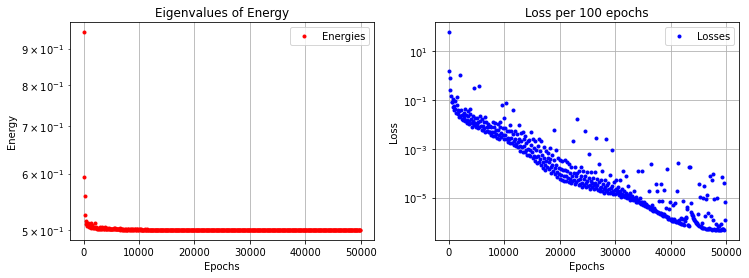

In [8]:
plt.subplots(1,2,figsize=(12,4))
plt.subplot(121)
plt.plot(epochs, 1+Es, "r.", label="Energies")
plt.title("Eigenvalues of Energy")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.subplot(122)
plt.plot(epochs, lss, "b.", label="Losses")
plt.title("Loss per 100 epochs")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.legend(loc="best")
plt.show()

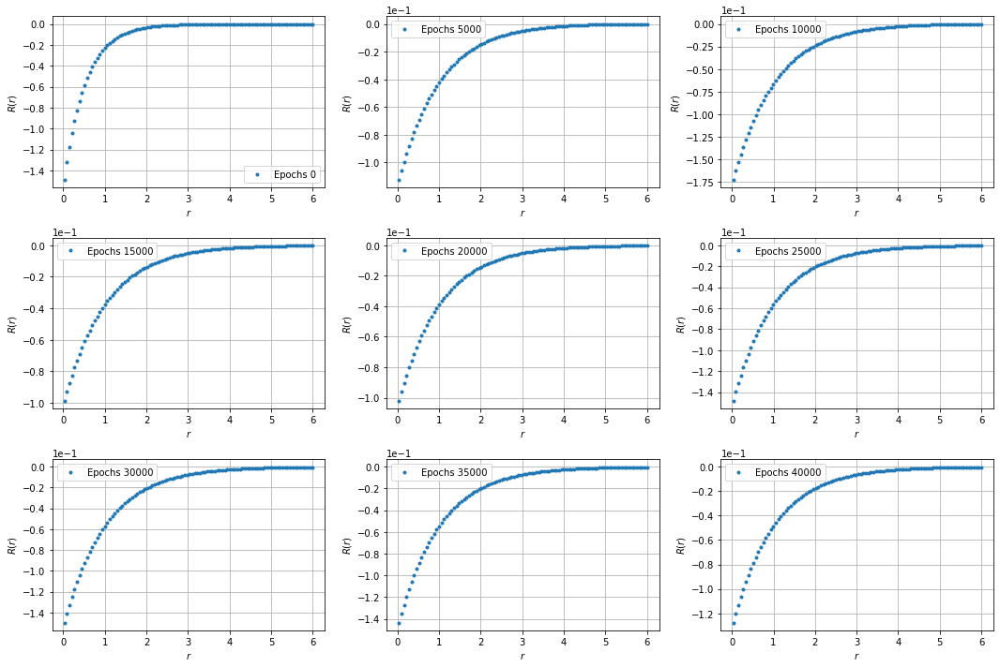

In [9]:
rr = np.linspace(lower_r, upper_r, steps)[:,None]
fig, axs = plt.subplots(3,3,figsize=(15,10))

fil = 0
col = 0
for i in range(0,9):
    yy = Phis_t[50*i]
    yy = yy.reshape((200,1))
    axs[fil,col].plot(rr[100:], np.divide(yy[100:], rr[100:]), ".", label=f"Epochs {epochs[50*i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$R(r)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    axs[fil,col].grid()
    if col == 2:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.tight_layout()
plt.show()  

In [10]:
Es

array([-0.0508702 , -0.40647948, -0.44169265, -0.4755337 , -0.48561448,
       -0.4906439 , -0.4904946 , -0.49374998, -0.48789197, -0.49310774,
       -0.49533013, -0.49112937, -0.4945838 , -0.49628857, -0.48793948,
       -0.49252814, -0.49525613, -0.49679163, -0.49754044, -0.49596295,
       -0.49722996, -0.488398  , -0.49551874, -0.49709314, -0.49786085,
       -0.49726868, -0.498031  , -0.4964283 , -0.49767363, -0.4982757 ,
       -0.4950989 , -0.49699908, -0.49800444, -0.49851346, -0.49566078,
       -0.49733353, -0.49822786, -0.4986863 , -0.4947311 , -0.49682596,
       -0.49794286, -0.49859264, -0.49893966, -0.49728116, -0.49825084,
       -0.49879265, -0.49675912, -0.49773395, -0.4985398 , -0.49897036,
       -0.4977031 , -0.49867794, -0.4990662 , -0.4983968 , -0.49896604,
       -0.49675414, -0.49722818, -0.49826732, -0.49887386, -0.4991933 ,
       -0.4982255 , -0.49886358, -0.49920887, -0.49838853, -0.4990528 ,
       -0.4993154 , -0.4975282 , -0.4984748 , -0.4990114 , -0.49

In [11]:
np.mean(np.squeeze(Es))

-0.49811023

In [37]:
def training(x, loss_fn, optimizer):
    x = x.to(device)
    def closure():
        loss = loss_fn(x)
        optimizer.zero_grad()
        loss.backward()
        return loss
    torch.nn.utils.clip_grad_value_(model_1.parameters(), 2)
    optimizer.step(closure)   

In [38]:
beta = 2
global Z
Z = 1
global e
#e = -1.602e-19
e = -1
global hbar
#hbar = 1.054e-34
hbar = 1
global m
#m = 9.109e-31
m = 1
global l
l = 0

Phi_0 = torch.Tensor(Phis_t[-1].reshape((200,1)))
V = lambda r: -(Z*e**2)/r
Phi_aux = lambda r: r*torch.exp(-beta*r) * model_1.forward(r)
Phi_t_1 = lambda r: Phi_aux(r) - Phi_0*torch.trapezoid(Phi_0[100:]*Phi_aux(r)[100:], r[100:],dim=0)/(torch.trapezoid(Phi_0[100:]**2, r[100:],dim=0)*torch.trapezoid(Phi_aux(r)[100:]**2, r[100:],dim=0))

In [39]:
def loss_fn_1(r):
    r.requires_grad = True
    
    Phi = Phi_t_1(r)
    Phi_t_r = torch.autograd.grad(Phi, r, grad_outputs=torch.ones_like(Phi), create_graph=True)[0]
    Phi_t_r_r = torch.autograd.grad(Phi_t_r, r, grad_outputs=torch.ones_like(Phi_t_r), create_graph=True)[0]
    H_Phi = -(hbar**2/(2*m))*Phi_t_r_r + (l*(l+1)*hbar**2/(2*m*r**2) + V(r))*Phi
    
    prom = Phi.size()[0]
    
    norm = torch.trapezoid(Phi[100:]**2,r[100:],dim=0) # integral over r=-6 to 6
    
    global E
    E = torch.trapezoid(Phi[100:]*H_Phi[100:],r[100:],dim=0)/norm 
    
    
    return (torch.mean((H_Phi[100:] - E*Phi[100:])**2)*prom)/(2*norm) #multiply by m to avoit division by m in the mean function of torh 

In [40]:
upper_r = 6
lower_r = -6
steps = 200
R_train = torch.Tensor(np.linspace(lower_r, upper_r, steps)[:,None])
epoch = 50000
lr = 2e-2
Phis_t_1 = []
Es_1 = []
lss_1 = []
epochs_1 = []



start = time.time()

model_1 = NeuralNetwork().to(device)
initialize_weights(model_1)
optimizer = torch.optim.Adam(model_1.parameters(), lr=lr)
for t in range(epoch):
    loss_1 = loss_fn_1(R_train.to(device))
    print(f"Epoch {t+1}\n ---------------------- loss: {loss_1}")
    training(R_train, loss_fn_1, optimizer)
    if t%100 == 0:
        Phis_t_1.append(Phi_t_1(R_train).detach().numpy())
        Es_1.append(E.detach().numpy())
        lss_1.append(loss_1.detach().numpy())
        epochs_1.append(t)
Es_1 = np.squeeze(Es_1)
lss_1 = np.squeeze(lss_1)
Phis_t_1 = np.squeeze(Phis_t_1)
print("Done!")

end = time.time()
print(end - start)

Epoch 1
 ---------------------- loss: tensor([2.7763e+08], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([3.0331e+10], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([1.3774e+09], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([1.0124e+09], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([8.8981e+08], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([8.2958e+08], grad_fn=<DivBackward0>)
Epoch 7
 ---------------------- loss: tensor([7.9416e+08], grad_fn=<DivBackward0>)
Epoch 8
 ---------------------- loss: tensor([7.7108e+08], grad_fn=<DivBackward0>)
Epoch 9
 ---------------------- loss: tensor([7.5499e+08], grad_fn=<DivBackward0>)
Epoch 10
 ---------------------- loss: tensor([7.4326e+08], grad_fn=<DivBackward0>)
Epoch 11
 ---------------------- loss: tensor([7.3441e+08], grad_fn=<DivBackward0>)
Epoch 12
 ---------------------- loss: tensor([7.2755e+08], grad_fn=<DivBackward0>)
E

Epoch 107
 ---------------------- loss: tensor([6.9087e+08], grad_fn=<DivBackward0>)
Epoch 108
 ---------------------- loss: tensor([6.9083e+08], grad_fn=<DivBackward0>)
Epoch 109
 ---------------------- loss: tensor([6.9079e+08], grad_fn=<DivBackward0>)
Epoch 110
 ---------------------- loss: tensor([6.9074e+08], grad_fn=<DivBackward0>)
Epoch 111
 ---------------------- loss: tensor([6.9070e+08], grad_fn=<DivBackward0>)
Epoch 112
 ---------------------- loss: tensor([6.9066e+08], grad_fn=<DivBackward0>)
Epoch 113
 ---------------------- loss: tensor([6.9062e+08], grad_fn=<DivBackward0>)
Epoch 114
 ---------------------- loss: tensor([6.9057e+08], grad_fn=<DivBackward0>)
Epoch 115
 ---------------------- loss: tensor([6.9053e+08], grad_fn=<DivBackward0>)
Epoch 116
 ---------------------- loss: tensor([6.9049e+08], grad_fn=<DivBackward0>)
Epoch 117
 ---------------------- loss: tensor([6.9044e+08], grad_fn=<DivBackward0>)
Epoch 118
 ---------------------- loss: tensor([6.9040e+08], grad

Epoch 212
 ---------------------- loss: tensor([6.8549e+08], grad_fn=<DivBackward0>)
Epoch 213
 ---------------------- loss: tensor([6.8543e+08], grad_fn=<DivBackward0>)
Epoch 214
 ---------------------- loss: tensor([6.8538e+08], grad_fn=<DivBackward0>)
Epoch 215
 ---------------------- loss: tensor([6.8532e+08], grad_fn=<DivBackward0>)
Epoch 216
 ---------------------- loss: tensor([6.8526e+08], grad_fn=<DivBackward0>)
Epoch 217
 ---------------------- loss: tensor([6.8519e+08], grad_fn=<DivBackward0>)
Epoch 218
 ---------------------- loss: tensor([6.8513e+08], grad_fn=<DivBackward0>)
Epoch 219
 ---------------------- loss: tensor([6.8507e+08], grad_fn=<DivBackward0>)
Epoch 220
 ---------------------- loss: tensor([6.8501e+08], grad_fn=<DivBackward0>)
Epoch 221
 ---------------------- loss: tensor([6.8495e+08], grad_fn=<DivBackward0>)
Epoch 222
 ---------------------- loss: tensor([6.8489e+08], grad_fn=<DivBackward0>)
Epoch 223
 ---------------------- loss: tensor([6.8483e+08], grad

Epoch 309
 ---------------------- loss: tensor([6.7907e+08], grad_fn=<DivBackward0>)
Epoch 310
 ---------------------- loss: tensor([6.7900e+08], grad_fn=<DivBackward0>)
Epoch 311
 ---------------------- loss: tensor([6.7892e+08], grad_fn=<DivBackward0>)
Epoch 312
 ---------------------- loss: tensor([6.7885e+08], grad_fn=<DivBackward0>)
Epoch 313
 ---------------------- loss: tensor([6.7878e+08], grad_fn=<DivBackward0>)
Epoch 314
 ---------------------- loss: tensor([6.7870e+08], grad_fn=<DivBackward0>)
Epoch 315
 ---------------------- loss: tensor([6.7863e+08], grad_fn=<DivBackward0>)
Epoch 316
 ---------------------- loss: tensor([6.7856e+08], grad_fn=<DivBackward0>)
Epoch 317
 ---------------------- loss: tensor([6.7848e+08], grad_fn=<DivBackward0>)
Epoch 318
 ---------------------- loss: tensor([6.7841e+08], grad_fn=<DivBackward0>)
Epoch 319
 ---------------------- loss: tensor([6.7834e+08], grad_fn=<DivBackward0>)
Epoch 320
 ---------------------- loss: tensor([6.7826e+08], grad

Epoch 410
 ---------------------- loss: tensor([6.7115e+08], grad_fn=<DivBackward0>)
Epoch 411
 ---------------------- loss: tensor([6.7107e+08], grad_fn=<DivBackward0>)
Epoch 412
 ---------------------- loss: tensor([6.7098e+08], grad_fn=<DivBackward0>)
Epoch 413
 ---------------------- loss: tensor([6.7090e+08], grad_fn=<DivBackward0>)
Epoch 414
 ---------------------- loss: tensor([6.7082e+08], grad_fn=<DivBackward0>)
Epoch 415
 ---------------------- loss: tensor([6.7073e+08], grad_fn=<DivBackward0>)
Epoch 416
 ---------------------- loss: tensor([6.7065e+08], grad_fn=<DivBackward0>)
Epoch 417
 ---------------------- loss: tensor([6.7056e+08], grad_fn=<DivBackward0>)
Epoch 418
 ---------------------- loss: tensor([6.7048e+08], grad_fn=<DivBackward0>)
Epoch 419
 ---------------------- loss: tensor([6.7039e+08], grad_fn=<DivBackward0>)
Epoch 420
 ---------------------- loss: tensor([6.7031e+08], grad_fn=<DivBackward0>)
Epoch 421
 ---------------------- loss: tensor([6.7022e+08], grad

Epoch 508
 ---------------------- loss: tensor([6.6243e+08], grad_fn=<DivBackward0>)
Epoch 509
 ---------------------- loss: tensor([6.6234e+08], grad_fn=<DivBackward0>)
Epoch 510
 ---------------------- loss: tensor([6.6224e+08], grad_fn=<DivBackward0>)
Epoch 511
 ---------------------- loss: tensor([6.6215e+08], grad_fn=<DivBackward0>)
Epoch 512
 ---------------------- loss: tensor([6.6206e+08], grad_fn=<DivBackward0>)
Epoch 513
 ---------------------- loss: tensor([6.6196e+08], grad_fn=<DivBackward0>)
Epoch 514
 ---------------------- loss: tensor([6.6187e+08], grad_fn=<DivBackward0>)
Epoch 515
 ---------------------- loss: tensor([6.6177e+08], grad_fn=<DivBackward0>)
Epoch 516
 ---------------------- loss: tensor([6.6168e+08], grad_fn=<DivBackward0>)
Epoch 517
 ---------------------- loss: tensor([6.6158e+08], grad_fn=<DivBackward0>)
Epoch 518
 ---------------------- loss: tensor([6.6149e+08], grad_fn=<DivBackward0>)
Epoch 519
 ---------------------- loss: tensor([6.6139e+08], grad

Epoch 611
 ---------------------- loss: tensor([6.5228e+08], grad_fn=<DivBackward0>)
Epoch 612
 ---------------------- loss: tensor([6.5218e+08], grad_fn=<DivBackward0>)
Epoch 613
 ---------------------- loss: tensor([6.5207e+08], grad_fn=<DivBackward0>)
Epoch 614
 ---------------------- loss: tensor([6.5197e+08], grad_fn=<DivBackward0>)
Epoch 615
 ---------------------- loss: tensor([6.5187e+08], grad_fn=<DivBackward0>)
Epoch 616
 ---------------------- loss: tensor([6.5176e+08], grad_fn=<DivBackward0>)
Epoch 617
 ---------------------- loss: tensor([6.5166e+08], grad_fn=<DivBackward0>)
Epoch 618
 ---------------------- loss: tensor([6.5156e+08], grad_fn=<DivBackward0>)
Epoch 619
 ---------------------- loss: tensor([6.5145e+08], grad_fn=<DivBackward0>)
Epoch 620
 ---------------------- loss: tensor([6.5135e+08], grad_fn=<DivBackward0>)
Epoch 621
 ---------------------- loss: tensor([6.5124e+08], grad_fn=<DivBackward0>)
Epoch 622
 ---------------------- loss: tensor([6.5114e+08], grad

Epoch 717
 ---------------------- loss: tensor([6.4087e+08], grad_fn=<DivBackward0>)
Epoch 718
 ---------------------- loss: tensor([6.4075e+08], grad_fn=<DivBackward0>)
Epoch 719
 ---------------------- loss: tensor([6.4064e+08], grad_fn=<DivBackward0>)
Epoch 720
 ---------------------- loss: tensor([6.4053e+08], grad_fn=<DivBackward0>)
Epoch 721
 ---------------------- loss: tensor([6.4042e+08], grad_fn=<DivBackward0>)
Epoch 722
 ---------------------- loss: tensor([6.4030e+08], grad_fn=<DivBackward0>)
Epoch 723
 ---------------------- loss: tensor([6.4019e+08], grad_fn=<DivBackward0>)
Epoch 724
 ---------------------- loss: tensor([6.4008e+08], grad_fn=<DivBackward0>)
Epoch 725
 ---------------------- loss: tensor([6.3997e+08], grad_fn=<DivBackward0>)
Epoch 726
 ---------------------- loss: tensor([6.3985e+08], grad_fn=<DivBackward0>)
Epoch 727
 ---------------------- loss: tensor([6.3974e+08], grad_fn=<DivBackward0>)
Epoch 728
 ---------------------- loss: tensor([6.3963e+08], grad

Epoch 820
 ---------------------- loss: tensor([6.2890e+08], grad_fn=<DivBackward0>)
Epoch 821
 ---------------------- loss: tensor([6.2878e+08], grad_fn=<DivBackward0>)
Epoch 822
 ---------------------- loss: tensor([6.2866e+08], grad_fn=<DivBackward0>)
Epoch 823
 ---------------------- loss: tensor([6.2854e+08], grad_fn=<DivBackward0>)
Epoch 824
 ---------------------- loss: tensor([6.2842e+08], grad_fn=<DivBackward0>)
Epoch 825
 ---------------------- loss: tensor([6.2830e+08], grad_fn=<DivBackward0>)
Epoch 826
 ---------------------- loss: tensor([6.2818e+08], grad_fn=<DivBackward0>)
Epoch 827
 ---------------------- loss: tensor([6.2806e+08], grad_fn=<DivBackward0>)
Epoch 828
 ---------------------- loss: tensor([6.2794e+08], grad_fn=<DivBackward0>)
Epoch 829
 ---------------------- loss: tensor([6.2782e+08], grad_fn=<DivBackward0>)
Epoch 830
 ---------------------- loss: tensor([6.2770e+08], grad_fn=<DivBackward0>)
Epoch 831
 ---------------------- loss: tensor([6.2758e+08], grad

Epoch 917
 ---------------------- loss: tensor([6.1689e+08], grad_fn=<DivBackward0>)
Epoch 918
 ---------------------- loss: tensor([6.1676e+08], grad_fn=<DivBackward0>)
Epoch 919
 ---------------------- loss: tensor([6.1663e+08], grad_fn=<DivBackward0>)
Epoch 920
 ---------------------- loss: tensor([6.1650e+08], grad_fn=<DivBackward0>)
Epoch 921
 ---------------------- loss: tensor([6.1638e+08], grad_fn=<DivBackward0>)
Epoch 922
 ---------------------- loss: tensor([6.1625e+08], grad_fn=<DivBackward0>)
Epoch 923
 ---------------------- loss: tensor([6.1612e+08], grad_fn=<DivBackward0>)
Epoch 924
 ---------------------- loss: tensor([6.1599e+08], grad_fn=<DivBackward0>)
Epoch 925
 ---------------------- loss: tensor([6.1586e+08], grad_fn=<DivBackward0>)
Epoch 926
 ---------------------- loss: tensor([6.1573e+08], grad_fn=<DivBackward0>)
Epoch 927
 ---------------------- loss: tensor([6.1561e+08], grad_fn=<DivBackward0>)
Epoch 928
 ---------------------- loss: tensor([6.1548e+08], grad

Epoch 1021
 ---------------------- loss: tensor([6.0322e+08], grad_fn=<DivBackward0>)
Epoch 1022
 ---------------------- loss: tensor([6.0308e+08], grad_fn=<DivBackward0>)
Epoch 1023
 ---------------------- loss: tensor([6.0295e+08], grad_fn=<DivBackward0>)
Epoch 1024
 ---------------------- loss: tensor([6.0281e+08], grad_fn=<DivBackward0>)
Epoch 1025
 ---------------------- loss: tensor([6.0268e+08], grad_fn=<DivBackward0>)
Epoch 1026
 ---------------------- loss: tensor([6.0254e+08], grad_fn=<DivBackward0>)
Epoch 1027
 ---------------------- loss: tensor([6.0240e+08], grad_fn=<DivBackward0>)
Epoch 1028
 ---------------------- loss: tensor([6.0227e+08], grad_fn=<DivBackward0>)
Epoch 1029
 ---------------------- loss: tensor([6.0213e+08], grad_fn=<DivBackward0>)
Epoch 1030
 ---------------------- loss: tensor([6.0200e+08], grad_fn=<DivBackward0>)
Epoch 1031
 ---------------------- loss: tensor([6.0186e+08], grad_fn=<DivBackward0>)
Epoch 1032
 ---------------------- loss: tensor([6.017

Epoch 1119
 ---------------------- loss: tensor([5.8960e+08], grad_fn=<DivBackward0>)
Epoch 1120
 ---------------------- loss: tensor([5.8946e+08], grad_fn=<DivBackward0>)
Epoch 1121
 ---------------------- loss: tensor([5.8931e+08], grad_fn=<DivBackward0>)
Epoch 1122
 ---------------------- loss: tensor([5.8917e+08], grad_fn=<DivBackward0>)
Epoch 1123
 ---------------------- loss: tensor([5.8903e+08], grad_fn=<DivBackward0>)
Epoch 1124
 ---------------------- loss: tensor([5.8889e+08], grad_fn=<DivBackward0>)
Epoch 1125
 ---------------------- loss: tensor([5.8874e+08], grad_fn=<DivBackward0>)
Epoch 1126
 ---------------------- loss: tensor([5.8860e+08], grad_fn=<DivBackward0>)
Epoch 1127
 ---------------------- loss: tensor([5.8846e+08], grad_fn=<DivBackward0>)
Epoch 1128
 ---------------------- loss: tensor([5.8831e+08], grad_fn=<DivBackward0>)
Epoch 1129
 ---------------------- loss: tensor([5.8817e+08], grad_fn=<DivBackward0>)
Epoch 1130
 ---------------------- loss: tensor([5.880

Epoch 1223
 ---------------------- loss: tensor([5.7436e+08], grad_fn=<DivBackward0>)
Epoch 1224
 ---------------------- loss: tensor([5.7421e+08], grad_fn=<DivBackward0>)
Epoch 1225
 ---------------------- loss: tensor([5.7406e+08], grad_fn=<DivBackward0>)
Epoch 1226
 ---------------------- loss: tensor([5.7391e+08], grad_fn=<DivBackward0>)
Epoch 1227
 ---------------------- loss: tensor([5.7376e+08], grad_fn=<DivBackward0>)
Epoch 1228
 ---------------------- loss: tensor([5.7361e+08], grad_fn=<DivBackward0>)
Epoch 1229
 ---------------------- loss: tensor([5.7346e+08], grad_fn=<DivBackward0>)
Epoch 1230
 ---------------------- loss: tensor([5.7331e+08], grad_fn=<DivBackward0>)
Epoch 1231
 ---------------------- loss: tensor([5.7315e+08], grad_fn=<DivBackward0>)
Epoch 1232
 ---------------------- loss: tensor([5.7300e+08], grad_fn=<DivBackward0>)
Epoch 1233
 ---------------------- loss: tensor([5.7285e+08], grad_fn=<DivBackward0>)
Epoch 1234
 ---------------------- loss: tensor([5.727

Epoch 1324
 ---------------------- loss: tensor([5.5876e+08], grad_fn=<DivBackward0>)
Epoch 1325
 ---------------------- loss: tensor([5.5860e+08], grad_fn=<DivBackward0>)
Epoch 1326
 ---------------------- loss: tensor([5.5844e+08], grad_fn=<DivBackward0>)
Epoch 1327
 ---------------------- loss: tensor([5.5828e+08], grad_fn=<DivBackward0>)
Epoch 1328
 ---------------------- loss: tensor([5.5812e+08], grad_fn=<DivBackward0>)
Epoch 1329
 ---------------------- loss: tensor([5.5796e+08], grad_fn=<DivBackward0>)
Epoch 1330
 ---------------------- loss: tensor([5.5780e+08], grad_fn=<DivBackward0>)
Epoch 1331
 ---------------------- loss: tensor([5.5764e+08], grad_fn=<DivBackward0>)
Epoch 1332
 ---------------------- loss: tensor([5.5749e+08], grad_fn=<DivBackward0>)
Epoch 1333
 ---------------------- loss: tensor([5.5733e+08], grad_fn=<DivBackward0>)
Epoch 1334
 ---------------------- loss: tensor([5.5717e+08], grad_fn=<DivBackward0>)
Epoch 1335
 ---------------------- loss: tensor([5.570

Epoch 1422
 ---------------------- loss: tensor([5.4282e+08], grad_fn=<DivBackward0>)
Epoch 1423
 ---------------------- loss: tensor([5.4266e+08], grad_fn=<DivBackward0>)
Epoch 1424
 ---------------------- loss: tensor([5.4249e+08], grad_fn=<DivBackward0>)
Epoch 1425
 ---------------------- loss: tensor([5.4232e+08], grad_fn=<DivBackward0>)
Epoch 1426
 ---------------------- loss: tensor([5.4215e+08], grad_fn=<DivBackward0>)
Epoch 1427
 ---------------------- loss: tensor([5.4199e+08], grad_fn=<DivBackward0>)
Epoch 1428
 ---------------------- loss: tensor([5.4182e+08], grad_fn=<DivBackward0>)
Epoch 1429
 ---------------------- loss: tensor([5.4165e+08], grad_fn=<DivBackward0>)
Epoch 1430
 ---------------------- loss: tensor([5.4149e+08], grad_fn=<DivBackward0>)
Epoch 1431
 ---------------------- loss: tensor([5.4132e+08], grad_fn=<DivBackward0>)
Epoch 1432
 ---------------------- loss: tensor([5.4115e+08], grad_fn=<DivBackward0>)
Epoch 1433
 ---------------------- loss: tensor([5.409

Epoch 1527
 ---------------------- loss: tensor([5.2482e+08], grad_fn=<DivBackward0>)
Epoch 1528
 ---------------------- loss: tensor([5.2465e+08], grad_fn=<DivBackward0>)
Epoch 1529
 ---------------------- loss: tensor([5.2447e+08], grad_fn=<DivBackward0>)
Epoch 1530
 ---------------------- loss: tensor([5.2429e+08], grad_fn=<DivBackward0>)
Epoch 1531
 ---------------------- loss: tensor([5.2412e+08], grad_fn=<DivBackward0>)
Epoch 1532
 ---------------------- loss: tensor([5.2394e+08], grad_fn=<DivBackward0>)
Epoch 1533
 ---------------------- loss: tensor([5.2376e+08], grad_fn=<DivBackward0>)
Epoch 1534
 ---------------------- loss: tensor([5.2359e+08], grad_fn=<DivBackward0>)
Epoch 1535
 ---------------------- loss: tensor([5.2341e+08], grad_fn=<DivBackward0>)
Epoch 1536
 ---------------------- loss: tensor([5.2323e+08], grad_fn=<DivBackward0>)
Epoch 1537
 ---------------------- loss: tensor([5.2306e+08], grad_fn=<DivBackward0>)
Epoch 1538
 ---------------------- loss: tensor([5.228

Epoch 1628
 ---------------------- loss: tensor([5.0652e+08], grad_fn=<DivBackward0>)
Epoch 1629
 ---------------------- loss: tensor([5.0634e+08], grad_fn=<DivBackward0>)
Epoch 1630
 ---------------------- loss: tensor([5.0615e+08], grad_fn=<DivBackward0>)
Epoch 1631
 ---------------------- loss: tensor([5.0596e+08], grad_fn=<DivBackward0>)
Epoch 1632
 ---------------------- loss: tensor([5.0578e+08], grad_fn=<DivBackward0>)
Epoch 1633
 ---------------------- loss: tensor([5.0559e+08], grad_fn=<DivBackward0>)
Epoch 1634
 ---------------------- loss: tensor([5.0540e+08], grad_fn=<DivBackward0>)
Epoch 1635
 ---------------------- loss: tensor([5.0522e+08], grad_fn=<DivBackward0>)
Epoch 1636
 ---------------------- loss: tensor([5.0503e+08], grad_fn=<DivBackward0>)
Epoch 1637
 ---------------------- loss: tensor([5.0484e+08], grad_fn=<DivBackward0>)
Epoch 1638
 ---------------------- loss: tensor([5.0466e+08], grad_fn=<DivBackward0>)
Epoch 1639
 ---------------------- loss: tensor([5.044

Epoch 1729
 ---------------------- loss: tensor([4.8716e+08], grad_fn=<DivBackward0>)
Epoch 1730
 ---------------------- loss: tensor([4.8696e+08], grad_fn=<DivBackward0>)
Epoch 1731
 ---------------------- loss: tensor([4.8677e+08], grad_fn=<DivBackward0>)
Epoch 1732
 ---------------------- loss: tensor([4.8657e+08], grad_fn=<DivBackward0>)
Epoch 1733
 ---------------------- loss: tensor([4.8637e+08], grad_fn=<DivBackward0>)
Epoch 1734
 ---------------------- loss: tensor([4.8617e+08], grad_fn=<DivBackward0>)
Epoch 1735
 ---------------------- loss: tensor([4.8598e+08], grad_fn=<DivBackward0>)
Epoch 1736
 ---------------------- loss: tensor([4.8578e+08], grad_fn=<DivBackward0>)
Epoch 1737
 ---------------------- loss: tensor([4.8558e+08], grad_fn=<DivBackward0>)
Epoch 1738
 ---------------------- loss: tensor([4.8538e+08], grad_fn=<DivBackward0>)
Epoch 1739
 ---------------------- loss: tensor([4.8518e+08], grad_fn=<DivBackward0>)
Epoch 1740
 ---------------------- loss: tensor([4.849

Epoch 1829
 ---------------------- loss: tensor([4.6682e+08], grad_fn=<DivBackward0>)
Epoch 1830
 ---------------------- loss: tensor([4.6661e+08], grad_fn=<DivBackward0>)
Epoch 1831
 ---------------------- loss: tensor([4.6640e+08], grad_fn=<DivBackward0>)
Epoch 1832
 ---------------------- loss: tensor([4.6619e+08], grad_fn=<DivBackward0>)
Epoch 1833
 ---------------------- loss: tensor([4.6598e+08], grad_fn=<DivBackward0>)
Epoch 1834
 ---------------------- loss: tensor([4.6577e+08], grad_fn=<DivBackward0>)
Epoch 1835
 ---------------------- loss: tensor([4.6556e+08], grad_fn=<DivBackward0>)
Epoch 1836
 ---------------------- loss: tensor([4.6535e+08], grad_fn=<DivBackward0>)
Epoch 1837
 ---------------------- loss: tensor([4.6514e+08], grad_fn=<DivBackward0>)
Epoch 1838
 ---------------------- loss: tensor([4.6493e+08], grad_fn=<DivBackward0>)
Epoch 1839
 ---------------------- loss: tensor([4.6472e+08], grad_fn=<DivBackward0>)
Epoch 1840
 ---------------------- loss: tensor([4.645

Epoch 1932
 ---------------------- loss: tensor([4.4451e+08], grad_fn=<DivBackward0>)
Epoch 1933
 ---------------------- loss: tensor([4.4428e+08], grad_fn=<DivBackward0>)
Epoch 1934
 ---------------------- loss: tensor([4.4406e+08], grad_fn=<DivBackward0>)
Epoch 1935
 ---------------------- loss: tensor([4.4383e+08], grad_fn=<DivBackward0>)
Epoch 1936
 ---------------------- loss: tensor([4.4361e+08], grad_fn=<DivBackward0>)
Epoch 1937
 ---------------------- loss: tensor([4.4338e+08], grad_fn=<DivBackward0>)
Epoch 1938
 ---------------------- loss: tensor([4.4316e+08], grad_fn=<DivBackward0>)
Epoch 1939
 ---------------------- loss: tensor([4.4293e+08], grad_fn=<DivBackward0>)
Epoch 1940
 ---------------------- loss: tensor([4.4271e+08], grad_fn=<DivBackward0>)
Epoch 1941
 ---------------------- loss: tensor([4.4248e+08], grad_fn=<DivBackward0>)
Epoch 1942
 ---------------------- loss: tensor([4.4226e+08], grad_fn=<DivBackward0>)
Epoch 1943
 ---------------------- loss: tensor([4.420

Epoch 2033
 ---------------------- loss: tensor([4.2109e+08], grad_fn=<DivBackward0>)
Epoch 2034
 ---------------------- loss: tensor([4.2085e+08], grad_fn=<DivBackward0>)
Epoch 2035
 ---------------------- loss: tensor([4.2061e+08], grad_fn=<DivBackward0>)
Epoch 2036
 ---------------------- loss: tensor([4.2037e+08], grad_fn=<DivBackward0>)
Epoch 2037
 ---------------------- loss: tensor([4.2013e+08], grad_fn=<DivBackward0>)
Epoch 2038
 ---------------------- loss: tensor([4.1989e+08], grad_fn=<DivBackward0>)
Epoch 2039
 ---------------------- loss: tensor([4.1964e+08], grad_fn=<DivBackward0>)
Epoch 2040
 ---------------------- loss: tensor([4.1940e+08], grad_fn=<DivBackward0>)
Epoch 2041
 ---------------------- loss: tensor([4.1916e+08], grad_fn=<DivBackward0>)
Epoch 2042
 ---------------------- loss: tensor([4.1892e+08], grad_fn=<DivBackward0>)
Epoch 2043
 ---------------------- loss: tensor([4.1868e+08], grad_fn=<DivBackward0>)
Epoch 2044
 ---------------------- loss: tensor([4.184

Epoch 2139
 ---------------------- loss: tensor([3.9464e+08], grad_fn=<DivBackward0>)
Epoch 2140
 ---------------------- loss: tensor([3.9438e+08], grad_fn=<DivBackward0>)
Epoch 2141
 ---------------------- loss: tensor([3.9412e+08], grad_fn=<DivBackward0>)
Epoch 2142
 ---------------------- loss: tensor([3.9386e+08], grad_fn=<DivBackward0>)
Epoch 2143
 ---------------------- loss: tensor([3.9360e+08], grad_fn=<DivBackward0>)
Epoch 2144
 ---------------------- loss: tensor([3.9334e+08], grad_fn=<DivBackward0>)
Epoch 2145
 ---------------------- loss: tensor([3.9308e+08], grad_fn=<DivBackward0>)
Epoch 2146
 ---------------------- loss: tensor([3.9282e+08], grad_fn=<DivBackward0>)
Epoch 2147
 ---------------------- loss: tensor([3.9256e+08], grad_fn=<DivBackward0>)
Epoch 2148
 ---------------------- loss: tensor([3.9230e+08], grad_fn=<DivBackward0>)
Epoch 2149
 ---------------------- loss: tensor([3.9204e+08], grad_fn=<DivBackward0>)
Epoch 2150
 ---------------------- loss: tensor([3.917

Epoch 2244
 ---------------------- loss: tensor([3.6628e+08], grad_fn=<DivBackward0>)
Epoch 2245
 ---------------------- loss: tensor([3.6600e+08], grad_fn=<DivBackward0>)
Epoch 2246
 ---------------------- loss: tensor([3.6572e+08], grad_fn=<DivBackward0>)
Epoch 2247
 ---------------------- loss: tensor([3.6543e+08], grad_fn=<DivBackward0>)
Epoch 2248
 ---------------------- loss: tensor([3.6515e+08], grad_fn=<DivBackward0>)
Epoch 2249
 ---------------------- loss: tensor([3.6487e+08], grad_fn=<DivBackward0>)
Epoch 2250
 ---------------------- loss: tensor([3.6459e+08], grad_fn=<DivBackward0>)
Epoch 2251
 ---------------------- loss: tensor([3.6431e+08], grad_fn=<DivBackward0>)
Epoch 2252
 ---------------------- loss: tensor([3.6402e+08], grad_fn=<DivBackward0>)
Epoch 2253
 ---------------------- loss: tensor([3.6374e+08], grad_fn=<DivBackward0>)
Epoch 2254
 ---------------------- loss: tensor([3.6346e+08], grad_fn=<DivBackward0>)
Epoch 2255
 ---------------------- loss: tensor([3.631

Epoch 2340
 ---------------------- loss: tensor([3.3820e+08], grad_fn=<DivBackward0>)
Epoch 2341
 ---------------------- loss: tensor([3.3790e+08], grad_fn=<DivBackward0>)
Epoch 2342
 ---------------------- loss: tensor([3.3759e+08], grad_fn=<DivBackward0>)
Epoch 2343
 ---------------------- loss: tensor([3.3729e+08], grad_fn=<DivBackward0>)
Epoch 2344
 ---------------------- loss: tensor([3.3698e+08], grad_fn=<DivBackward0>)
Epoch 2345
 ---------------------- loss: tensor([3.3668e+08], grad_fn=<DivBackward0>)
Epoch 2346
 ---------------------- loss: tensor([3.3637e+08], grad_fn=<DivBackward0>)
Epoch 2347
 ---------------------- loss: tensor([3.3607e+08], grad_fn=<DivBackward0>)
Epoch 2348
 ---------------------- loss: tensor([3.3576e+08], grad_fn=<DivBackward0>)
Epoch 2349
 ---------------------- loss: tensor([3.3545e+08], grad_fn=<DivBackward0>)
Epoch 2350
 ---------------------- loss: tensor([3.3515e+08], grad_fn=<DivBackward0>)
Epoch 2351
 ---------------------- loss: tensor([3.348

Epoch 2441
 ---------------------- loss: tensor([3.0616e+08], grad_fn=<DivBackward0>)
Epoch 2442
 ---------------------- loss: tensor([3.0583e+08], grad_fn=<DivBackward0>)
Epoch 2443
 ---------------------- loss: tensor([3.0550e+08], grad_fn=<DivBackward0>)
Epoch 2444
 ---------------------- loss: tensor([3.0517e+08], grad_fn=<DivBackward0>)
Epoch 2445
 ---------------------- loss: tensor([3.0483e+08], grad_fn=<DivBackward0>)
Epoch 2446
 ---------------------- loss: tensor([3.0450e+08], grad_fn=<DivBackward0>)
Epoch 2447
 ---------------------- loss: tensor([3.0417e+08], grad_fn=<DivBackward0>)
Epoch 2448
 ---------------------- loss: tensor([3.0384e+08], grad_fn=<DivBackward0>)
Epoch 2449
 ---------------------- loss: tensor([3.0350e+08], grad_fn=<DivBackward0>)
Epoch 2450
 ---------------------- loss: tensor([3.0317e+08], grad_fn=<DivBackward0>)
Epoch 2451
 ---------------------- loss: tensor([3.0284e+08], grad_fn=<DivBackward0>)
Epoch 2452
 ---------------------- loss: tensor([3.025

Epoch 2537
 ---------------------- loss: tensor([2.7301e+08], grad_fn=<DivBackward0>)
Epoch 2538
 ---------------------- loss: tensor([2.7265e+08], grad_fn=<DivBackward0>)
Epoch 2539
 ---------------------- loss: tensor([2.7229e+08], grad_fn=<DivBackward0>)
Epoch 2540
 ---------------------- loss: tensor([2.7192e+08], grad_fn=<DivBackward0>)
Epoch 2541
 ---------------------- loss: tensor([2.7156e+08], grad_fn=<DivBackward0>)
Epoch 2542
 ---------------------- loss: tensor([2.7120e+08], grad_fn=<DivBackward0>)
Epoch 2543
 ---------------------- loss: tensor([2.7084e+08], grad_fn=<DivBackward0>)
Epoch 2544
 ---------------------- loss: tensor([2.7047e+08], grad_fn=<DivBackward0>)
Epoch 2545
 ---------------------- loss: tensor([2.7011e+08], grad_fn=<DivBackward0>)
Epoch 2546
 ---------------------- loss: tensor([2.6975e+08], grad_fn=<DivBackward0>)
Epoch 2547
 ---------------------- loss: tensor([2.6938e+08], grad_fn=<DivBackward0>)
Epoch 2548
 ---------------------- loss: tensor([2.690

Epoch 2641
 ---------------------- loss: tensor([2.3317e+08], grad_fn=<DivBackward0>)
Epoch 2642
 ---------------------- loss: tensor([2.3276e+08], grad_fn=<DivBackward0>)
Epoch 2643
 ---------------------- loss: tensor([2.3234e+08], grad_fn=<DivBackward0>)
Epoch 2644
 ---------------------- loss: tensor([2.3193e+08], grad_fn=<DivBackward0>)
Epoch 2645
 ---------------------- loss: tensor([2.3152e+08], grad_fn=<DivBackward0>)
Epoch 2646
 ---------------------- loss: tensor([2.3110e+08], grad_fn=<DivBackward0>)
Epoch 2647
 ---------------------- loss: tensor([2.3069e+08], grad_fn=<DivBackward0>)
Epoch 2648
 ---------------------- loss: tensor([2.3027e+08], grad_fn=<DivBackward0>)
Epoch 2649
 ---------------------- loss: tensor([2.2985e+08], grad_fn=<DivBackward0>)
Epoch 2650
 ---------------------- loss: tensor([2.2943e+08], grad_fn=<DivBackward0>)
Epoch 2651
 ---------------------- loss: tensor([2.2901e+08], grad_fn=<DivBackward0>)
Epoch 2652
 ---------------------- loss: tensor([2.285

Epoch 2746
 ---------------------- loss: tensor([1.8298e+08], grad_fn=<DivBackward0>)
Epoch 2747
 ---------------------- loss: tensor([1.8238e+08], grad_fn=<DivBackward0>)
Epoch 2748
 ---------------------- loss: tensor([1.8178e+08], grad_fn=<DivBackward0>)
Epoch 2749
 ---------------------- loss: tensor([1.8118e+08], grad_fn=<DivBackward0>)
Epoch 2750
 ---------------------- loss: tensor([1.8057e+08], grad_fn=<DivBackward0>)
Epoch 2751
 ---------------------- loss: tensor([1.7996e+08], grad_fn=<DivBackward0>)
Epoch 2752
 ---------------------- loss: tensor([1.7934e+08], grad_fn=<DivBackward0>)
Epoch 2753
 ---------------------- loss: tensor([1.7872e+08], grad_fn=<DivBackward0>)
Epoch 2754
 ---------------------- loss: tensor([1.7809e+08], grad_fn=<DivBackward0>)
Epoch 2755
 ---------------------- loss: tensor([1.7746e+08], grad_fn=<DivBackward0>)
Epoch 2756
 ---------------------- loss: tensor([1.7683e+08], grad_fn=<DivBackward0>)
Epoch 2757
 ---------------------- loss: tensor([1.761

Epoch 2848
 ---------------------- loss: tensor([82458616.], grad_fn=<DivBackward0>)
Epoch 2849
 ---------------------- loss: tensor([81500488.], grad_fn=<DivBackward0>)
Epoch 2850
 ---------------------- loss: tensor([80605312.], grad_fn=<DivBackward0>)
Epoch 2851
 ---------------------- loss: tensor([79775416.], grad_fn=<DivBackward0>)
Epoch 2852
 ---------------------- loss: tensor([79013688.], grad_fn=<DivBackward0>)
Epoch 2853
 ---------------------- loss: tensor([78322528.], grad_fn=<DivBackward0>)
Epoch 2854
 ---------------------- loss: tensor([77702712.], grad_fn=<DivBackward0>)
Epoch 2855
 ---------------------- loss: tensor([77155344.], grad_fn=<DivBackward0>)
Epoch 2856
 ---------------------- loss: tensor([76678512.], grad_fn=<DivBackward0>)
Epoch 2857
 ---------------------- loss: tensor([76271664.], grad_fn=<DivBackward0>)
Epoch 2858
 ---------------------- loss: tensor([75931920.], grad_fn=<DivBackward0>)
Epoch 2859
 ---------------------- loss: tensor([75655992.], grad

Epoch 2951
 ---------------------- loss: tensor([74856408.], grad_fn=<DivBackward0>)
Epoch 2952
 ---------------------- loss: tensor([74854272.], grad_fn=<DivBackward0>)
Epoch 2953
 ---------------------- loss: tensor([74851888.], grad_fn=<DivBackward0>)
Epoch 2954
 ---------------------- loss: tensor([74849904.], grad_fn=<DivBackward0>)
Epoch 2955
 ---------------------- loss: tensor([74847872.], grad_fn=<DivBackward0>)
Epoch 2956
 ---------------------- loss: tensor([74845640.], grad_fn=<DivBackward0>)
Epoch 2957
 ---------------------- loss: tensor([74843400.], grad_fn=<DivBackward0>)
Epoch 2958
 ---------------------- loss: tensor([74841136.], grad_fn=<DivBackward0>)
Epoch 2959
 ---------------------- loss: tensor([74838816.], grad_fn=<DivBackward0>)
Epoch 2960
 ---------------------- loss: tensor([74836680.], grad_fn=<DivBackward0>)
Epoch 2961
 ---------------------- loss: tensor([74834376.], grad_fn=<DivBackward0>)
Epoch 2962
 ---------------------- loss: tensor([74832216.], grad

Epoch 3054
 ---------------------- loss: tensor([74625952.], grad_fn=<DivBackward0>)
Epoch 3055
 ---------------------- loss: tensor([74623632.], grad_fn=<DivBackward0>)
Epoch 3056
 ---------------------- loss: tensor([74621192.], grad_fn=<DivBackward0>)
Epoch 3057
 ---------------------- loss: tensor([74619048.], grad_fn=<DivBackward0>)
Epoch 3058
 ---------------------- loss: tensor([74616632.], grad_fn=<DivBackward0>)
Epoch 3059
 ---------------------- loss: tensor([74614464.], grad_fn=<DivBackward0>)
Epoch 3060
 ---------------------- loss: tensor([74612568.], grad_fn=<DivBackward0>)
Epoch 3061
 ---------------------- loss: tensor([74610024.], grad_fn=<DivBackward0>)
Epoch 3062
 ---------------------- loss: tensor([74607536.], grad_fn=<DivBackward0>)
Epoch 3063
 ---------------------- loss: tensor([74605056.], grad_fn=<DivBackward0>)
Epoch 3064
 ---------------------- loss: tensor([74602944.], grad_fn=<DivBackward0>)
Epoch 3065
 ---------------------- loss: tensor([74600840.], grad

Epoch 3151
 ---------------------- loss: tensor([74401208.], grad_fn=<DivBackward0>)
Epoch 3152
 ---------------------- loss: tensor([74398512.], grad_fn=<DivBackward0>)
Epoch 3153
 ---------------------- loss: tensor([74396264.], grad_fn=<DivBackward0>)
Epoch 3154
 ---------------------- loss: tensor([74393832.], grad_fn=<DivBackward0>)
Epoch 3155
 ---------------------- loss: tensor([74391768.], grad_fn=<DivBackward0>)
Epoch 3156
 ---------------------- loss: tensor([74389096.], grad_fn=<DivBackward0>)
Epoch 3157
 ---------------------- loss: tensor([74386912.], grad_fn=<DivBackward0>)
Epoch 3158
 ---------------------- loss: tensor([74384624.], grad_fn=<DivBackward0>)
Epoch 3159
 ---------------------- loss: tensor([74382024.], grad_fn=<DivBackward0>)
Epoch 3160
 ---------------------- loss: tensor([74379600.], grad_fn=<DivBackward0>)
Epoch 3161
 ---------------------- loss: tensor([74377408.], grad_fn=<DivBackward0>)
Epoch 3162
 ---------------------- loss: tensor([74374944.], grad

Epoch 3252
 ---------------------- loss: tensor([74158736.], grad_fn=<DivBackward0>)
Epoch 3253
 ---------------------- loss: tensor([74156184.], grad_fn=<DivBackward0>)
Epoch 3254
 ---------------------- loss: tensor([74154288.], grad_fn=<DivBackward0>)
Epoch 3255
 ---------------------- loss: tensor([74151760.], grad_fn=<DivBackward0>)
Epoch 3256
 ---------------------- loss: tensor([74148776.], grad_fn=<DivBackward0>)
Epoch 3257
 ---------------------- loss: tensor([74146464.], grad_fn=<DivBackward0>)
Epoch 3258
 ---------------------- loss: tensor([74144128.], grad_fn=<DivBackward0>)
Epoch 3259
 ---------------------- loss: tensor([74141904.], grad_fn=<DivBackward0>)
Epoch 3260
 ---------------------- loss: tensor([74139160.], grad_fn=<DivBackward0>)
Epoch 3261
 ---------------------- loss: tensor([74136904.], grad_fn=<DivBackward0>)
Epoch 3262
 ---------------------- loss: tensor([74134464.], grad_fn=<DivBackward0>)
Epoch 3263
 ---------------------- loss: tensor([74131896.], grad

Epoch 3358
 ---------------------- loss: tensor([73895848.], grad_fn=<DivBackward0>)
Epoch 3359
 ---------------------- loss: tensor([73893256.], grad_fn=<DivBackward0>)
Epoch 3360
 ---------------------- loss: tensor([73890800.], grad_fn=<DivBackward0>)
Epoch 3361
 ---------------------- loss: tensor([73888144.], grad_fn=<DivBackward0>)
Epoch 3362
 ---------------------- loss: tensor([73885688.], grad_fn=<DivBackward0>)
Epoch 3363
 ---------------------- loss: tensor([73883488.], grad_fn=<DivBackward0>)
Epoch 3364
 ---------------------- loss: tensor([73880576.], grad_fn=<DivBackward0>)
Epoch 3365
 ---------------------- loss: tensor([73878184.], grad_fn=<DivBackward0>)
Epoch 3366
 ---------------------- loss: tensor([73875768.], grad_fn=<DivBackward0>)
Epoch 3367
 ---------------------- loss: tensor([73872880.], grad_fn=<DivBackward0>)
Epoch 3368
 ---------------------- loss: tensor([73870240.], grad_fn=<DivBackward0>)
Epoch 3369
 ---------------------- loss: tensor([73867856.], grad

Epoch 3460
 ---------------------- loss: tensor([73633824.], grad_fn=<DivBackward0>)
Epoch 3461
 ---------------------- loss: tensor([73631384.], grad_fn=<DivBackward0>)
Epoch 3462
 ---------------------- loss: tensor([73628848.], grad_fn=<DivBackward0>)
Epoch 3463
 ---------------------- loss: tensor([73626016.], grad_fn=<DivBackward0>)
Epoch 3464
 ---------------------- loss: tensor([73623480.], grad_fn=<DivBackward0>)
Epoch 3465
 ---------------------- loss: tensor([73621248.], grad_fn=<DivBackward0>)
Epoch 3466
 ---------------------- loss: tensor([73618240.], grad_fn=<DivBackward0>)
Epoch 3467
 ---------------------- loss: tensor([73615776.], grad_fn=<DivBackward0>)
Epoch 3468
 ---------------------- loss: tensor([73613144.], grad_fn=<DivBackward0>)
Epoch 3469
 ---------------------- loss: tensor([73610376.], grad_fn=<DivBackward0>)
Epoch 3470
 ---------------------- loss: tensor([73607968.], grad_fn=<DivBackward0>)
Epoch 3471
 ---------------------- loss: tensor([73605464.], grad

Epoch 3563
 ---------------------- loss: tensor([73361136.], grad_fn=<DivBackward0>)
Epoch 3564
 ---------------------- loss: tensor([73358520.], grad_fn=<DivBackward0>)
Epoch 3565
 ---------------------- loss: tensor([73355896.], grad_fn=<DivBackward0>)
Epoch 3566
 ---------------------- loss: tensor([73353016.], grad_fn=<DivBackward0>)
Epoch 3567
 ---------------------- loss: tensor([73350696.], grad_fn=<DivBackward0>)
Epoch 3568
 ---------------------- loss: tensor([73347880.], grad_fn=<DivBackward0>)
Epoch 3569
 ---------------------- loss: tensor([73345352.], grad_fn=<DivBackward0>)
Epoch 3570
 ---------------------- loss: tensor([73342552.], grad_fn=<DivBackward0>)
Epoch 3571
 ---------------------- loss: tensor([73339784.], grad_fn=<DivBackward0>)
Epoch 3572
 ---------------------- loss: tensor([73336840.], grad_fn=<DivBackward0>)
Epoch 3573
 ---------------------- loss: tensor([73334192.], grad_fn=<DivBackward0>)
Epoch 3574
 ---------------------- loss: tensor([73331424.], grad

Epoch 3665
 ---------------------- loss: tensor([73082728.], grad_fn=<DivBackward0>)
Epoch 3666
 ---------------------- loss: tensor([73079912.], grad_fn=<DivBackward0>)
Epoch 3667
 ---------------------- loss: tensor([73077104.], grad_fn=<DivBackward0>)
Epoch 3668
 ---------------------- loss: tensor([73074376.], grad_fn=<DivBackward0>)
Epoch 3669
 ---------------------- loss: tensor([73071592.], grad_fn=<DivBackward0>)
Epoch 3670
 ---------------------- loss: tensor([73068856.], grad_fn=<DivBackward0>)
Epoch 3671
 ---------------------- loss: tensor([73066048.], grad_fn=<DivBackward0>)
Epoch 3672
 ---------------------- loss: tensor([73063040.], grad_fn=<DivBackward0>)
Epoch 3673
 ---------------------- loss: tensor([73060432.], grad_fn=<DivBackward0>)
Epoch 3674
 ---------------------- loss: tensor([73057832.], grad_fn=<DivBackward0>)
Epoch 3675
 ---------------------- loss: tensor([73054952.], grad_fn=<DivBackward0>)
Epoch 3676
 ---------------------- loss: tensor([73052080.], grad

Epoch 3764
 ---------------------- loss: tensor([72804152.], grad_fn=<DivBackward0>)
Epoch 3765
 ---------------------- loss: tensor([72801512.], grad_fn=<DivBackward0>)
Epoch 3766
 ---------------------- loss: tensor([72798400.], grad_fn=<DivBackward0>)
Epoch 3767
 ---------------------- loss: tensor([72795992.], grad_fn=<DivBackward0>)
Epoch 3768
 ---------------------- loss: tensor([72793032.], grad_fn=<DivBackward0>)
Epoch 3769
 ---------------------- loss: tensor([72790416.], grad_fn=<DivBackward0>)
Epoch 3770
 ---------------------- loss: tensor([72787392.], grad_fn=<DivBackward0>)
Epoch 3771
 ---------------------- loss: tensor([72784456.], grad_fn=<DivBackward0>)
Epoch 3772
 ---------------------- loss: tensor([72781408.], grad_fn=<DivBackward0>)
Epoch 3773
 ---------------------- loss: tensor([72778240.], grad_fn=<DivBackward0>)
Epoch 3774
 ---------------------- loss: tensor([72775816.], grad_fn=<DivBackward0>)
Epoch 3775
 ---------------------- loss: tensor([72773064.], grad

Epoch 3863
 ---------------------- loss: tensor([72517880.], grad_fn=<DivBackward0>)
Epoch 3864
 ---------------------- loss: tensor([72515336.], grad_fn=<DivBackward0>)
Epoch 3865
 ---------------------- loss: tensor([72512264.], grad_fn=<DivBackward0>)
Epoch 3866
 ---------------------- loss: tensor([72509408.], grad_fn=<DivBackward0>)
Epoch 3867
 ---------------------- loss: tensor([72506504.], grad_fn=<DivBackward0>)
Epoch 3868
 ---------------------- loss: tensor([72503568.], grad_fn=<DivBackward0>)
Epoch 3869
 ---------------------- loss: tensor([72500712.], grad_fn=<DivBackward0>)
Epoch 3870
 ---------------------- loss: tensor([72497416.], grad_fn=<DivBackward0>)
Epoch 3871
 ---------------------- loss: tensor([72494904.], grad_fn=<DivBackward0>)
Epoch 3872
 ---------------------- loss: tensor([72491808.], grad_fn=<DivBackward0>)
Epoch 3873
 ---------------------- loss: tensor([72488952.], grad_fn=<DivBackward0>)
Epoch 3874
 ---------------------- loss: tensor([72485896.], grad

Epoch 3966
 ---------------------- loss: tensor([72212128.], grad_fn=<DivBackward0>)
Epoch 3967
 ---------------------- loss: tensor([72209120.], grad_fn=<DivBackward0>)
Epoch 3968
 ---------------------- loss: tensor([72206256.], grad_fn=<DivBackward0>)
Epoch 3969
 ---------------------- loss: tensor([72203256.], grad_fn=<DivBackward0>)
Epoch 3970
 ---------------------- loss: tensor([72200104.], grad_fn=<DivBackward0>)
Epoch 3971
 ---------------------- loss: tensor([72197176.], grad_fn=<DivBackward0>)
Epoch 3972
 ---------------------- loss: tensor([72194256.], grad_fn=<DivBackward0>)
Epoch 3973
 ---------------------- loss: tensor([72191104.], grad_fn=<DivBackward0>)
Epoch 3974
 ---------------------- loss: tensor([72188112.], grad_fn=<DivBackward0>)
Epoch 3975
 ---------------------- loss: tensor([72185272.], grad_fn=<DivBackward0>)
Epoch 3976
 ---------------------- loss: tensor([72181912.], grad_fn=<DivBackward0>)
Epoch 3977
 ---------------------- loss: tensor([72179184.], grad

Epoch 4070
 ---------------------- loss: tensor([71894952.], grad_fn=<DivBackward0>)
Epoch 4071
 ---------------------- loss: tensor([71891936.], grad_fn=<DivBackward0>)
Epoch 4072
 ---------------------- loss: tensor([71888728.], grad_fn=<DivBackward0>)
Epoch 4073
 ---------------------- loss: tensor([71885984.], grad_fn=<DivBackward0>)
Epoch 4074
 ---------------------- loss: tensor([71882528.], grad_fn=<DivBackward0>)
Epoch 4075
 ---------------------- loss: tensor([71879560.], grad_fn=<DivBackward0>)
Epoch 4076
 ---------------------- loss: tensor([71876288.], grad_fn=<DivBackward0>)
Epoch 4077
 ---------------------- loss: tensor([71873560.], grad_fn=<DivBackward0>)
Epoch 4078
 ---------------------- loss: tensor([71870480.], grad_fn=<DivBackward0>)
Epoch 4079
 ---------------------- loss: tensor([71867160.], grad_fn=<DivBackward0>)
Epoch 4080
 ---------------------- loss: tensor([71863992.], grad_fn=<DivBackward0>)
Epoch 4081
 ---------------------- loss: tensor([71861160.], grad

Epoch 4171
 ---------------------- loss: tensor([71579112.], grad_fn=<DivBackward0>)
Epoch 4172
 ---------------------- loss: tensor([71576344.], grad_fn=<DivBackward0>)
Epoch 4173
 ---------------------- loss: tensor([71572888.], grad_fn=<DivBackward0>)
Epoch 4174
 ---------------------- loss: tensor([71569608.], grad_fn=<DivBackward0>)
Epoch 4175
 ---------------------- loss: tensor([71566488.], grad_fn=<DivBackward0>)
Epoch 4176
 ---------------------- loss: tensor([71563376.], grad_fn=<DivBackward0>)
Epoch 4177
 ---------------------- loss: tensor([71560472.], grad_fn=<DivBackward0>)
Epoch 4178
 ---------------------- loss: tensor([71557320.], grad_fn=<DivBackward0>)
Epoch 4179
 ---------------------- loss: tensor([71553720.], grad_fn=<DivBackward0>)
Epoch 4180
 ---------------------- loss: tensor([71550688.], grad_fn=<DivBackward0>)
Epoch 4181
 ---------------------- loss: tensor([71547616.], grad_fn=<DivBackward0>)
Epoch 4182
 ---------------------- loss: tensor([71544384.], grad

Epoch 4278
 ---------------------- loss: tensor([71236424.], grad_fn=<DivBackward0>)
Epoch 4279
 ---------------------- loss: tensor([71233080.], grad_fn=<DivBackward0>)
Epoch 4280
 ---------------------- loss: tensor([71229792.], grad_fn=<DivBackward0>)
Epoch 4281
 ---------------------- loss: tensor([71226816.], grad_fn=<DivBackward0>)
Epoch 4282
 ---------------------- loss: tensor([71223296.], grad_fn=<DivBackward0>)
Epoch 4283
 ---------------------- loss: tensor([71220240.], grad_fn=<DivBackward0>)
Epoch 4284
 ---------------------- loss: tensor([71216904.], grad_fn=<DivBackward0>)
Epoch 4285
 ---------------------- loss: tensor([71213632.], grad_fn=<DivBackward0>)
Epoch 4286
 ---------------------- loss: tensor([71210032.], grad_fn=<DivBackward0>)
Epoch 4287
 ---------------------- loss: tensor([71207080.], grad_fn=<DivBackward0>)
Epoch 4288
 ---------------------- loss: tensor([71203248.], grad_fn=<DivBackward0>)
Epoch 4289
 ---------------------- loss: tensor([71200704.], grad

Epoch 4383
 ---------------------- loss: tensor([70891568.], grad_fn=<DivBackward0>)
Epoch 4384
 ---------------------- loss: tensor([70888368.], grad_fn=<DivBackward0>)
Epoch 4385
 ---------------------- loss: tensor([70885072.], grad_fn=<DivBackward0>)
Epoch 4386
 ---------------------- loss: tensor([70881504.], grad_fn=<DivBackward0>)
Epoch 4387
 ---------------------- loss: tensor([70878664.], grad_fn=<DivBackward0>)
Epoch 4388
 ---------------------- loss: tensor([70875272.], grad_fn=<DivBackward0>)
Epoch 4389
 ---------------------- loss: tensor([70871464.], grad_fn=<DivBackward0>)
Epoch 4390
 ---------------------- loss: tensor([70868312.], grad_fn=<DivBackward0>)
Epoch 4391
 ---------------------- loss: tensor([70865160.], grad_fn=<DivBackward0>)
Epoch 4392
 ---------------------- loss: tensor([70861904.], grad_fn=<DivBackward0>)
Epoch 4393
 ---------------------- loss: tensor([70858384.], grad_fn=<DivBackward0>)
Epoch 4394
 ---------------------- loss: tensor([70855200.], grad

Epoch 4487
 ---------------------- loss: tensor([70542832.], grad_fn=<DivBackward0>)
Epoch 4488
 ---------------------- loss: tensor([70539320.], grad_fn=<DivBackward0>)
Epoch 4489
 ---------------------- loss: tensor([70535760.], grad_fn=<DivBackward0>)
Epoch 4490
 ---------------------- loss: tensor([70532536.], grad_fn=<DivBackward0>)
Epoch 4491
 ---------------------- loss: tensor([70529208.], grad_fn=<DivBackward0>)
Epoch 4492
 ---------------------- loss: tensor([70525936.], grad_fn=<DivBackward0>)
Epoch 4493
 ---------------------- loss: tensor([70522240.], grad_fn=<DivBackward0>)
Epoch 4494
 ---------------------- loss: tensor([70518656.], grad_fn=<DivBackward0>)
Epoch 4495
 ---------------------- loss: tensor([70515544.], grad_fn=<DivBackward0>)
Epoch 4496
 ---------------------- loss: tensor([70512240.], grad_fn=<DivBackward0>)
Epoch 4497
 ---------------------- loss: tensor([70508800.], grad_fn=<DivBackward0>)
Epoch 4498
 ---------------------- loss: tensor([70505384.], grad

Epoch 4591
 ---------------------- loss: tensor([70186480.], grad_fn=<DivBackward0>)
Epoch 4592
 ---------------------- loss: tensor([70182624.], grad_fn=<DivBackward0>)
Epoch 4593
 ---------------------- loss: tensor([70179744.], grad_fn=<DivBackward0>)
Epoch 4594
 ---------------------- loss: tensor([70175944.], grad_fn=<DivBackward0>)
Epoch 4595
 ---------------------- loss: tensor([70172184.], grad_fn=<DivBackward0>)
Epoch 4596
 ---------------------- loss: tensor([70169160.], grad_fn=<DivBackward0>)
Epoch 4597
 ---------------------- loss: tensor([70165568.], grad_fn=<DivBackward0>)
Epoch 4598
 ---------------------- loss: tensor([70162136.], grad_fn=<DivBackward0>)
Epoch 4599
 ---------------------- loss: tensor([70158944.], grad_fn=<DivBackward0>)
Epoch 4600
 ---------------------- loss: tensor([70155160.], grad_fn=<DivBackward0>)
Epoch 4601
 ---------------------- loss: tensor([70151720.], grad_fn=<DivBackward0>)
Epoch 4602
 ---------------------- loss: tensor([70148320.], grad

Epoch 4692
 ---------------------- loss: tensor([69833456.], grad_fn=<DivBackward0>)
Epoch 4693
 ---------------------- loss: tensor([69829608.], grad_fn=<DivBackward0>)
Epoch 4694
 ---------------------- loss: tensor([69826440.], grad_fn=<DivBackward0>)
Epoch 4695
 ---------------------- loss: tensor([69822872.], grad_fn=<DivBackward0>)
Epoch 4696
 ---------------------- loss: tensor([69819384.], grad_fn=<DivBackward0>)
Epoch 4697
 ---------------------- loss: tensor([69815856.], grad_fn=<DivBackward0>)
Epoch 4698
 ---------------------- loss: tensor([69812560.], grad_fn=<DivBackward0>)
Epoch 4699
 ---------------------- loss: tensor([69808512.], grad_fn=<DivBackward0>)
Epoch 4700
 ---------------------- loss: tensor([69805296.], grad_fn=<DivBackward0>)
Epoch 4701
 ---------------------- loss: tensor([69801872.], grad_fn=<DivBackward0>)
Epoch 4702
 ---------------------- loss: tensor([69798352.], grad_fn=<DivBackward0>)
Epoch 4703
 ---------------------- loss: tensor([69794832.], grad

Epoch 4792
 ---------------------- loss: tensor([69477520.], grad_fn=<DivBackward0>)
Epoch 4793
 ---------------------- loss: tensor([69474256.], grad_fn=<DivBackward0>)
Epoch 4794
 ---------------------- loss: tensor([69470912.], grad_fn=<DivBackward0>)
Epoch 4795
 ---------------------- loss: tensor([69467048.], grad_fn=<DivBackward0>)
Epoch 4796
 ---------------------- loss: tensor([69463808.], grad_fn=<DivBackward0>)
Epoch 4797
 ---------------------- loss: tensor([69460208.], grad_fn=<DivBackward0>)
Epoch 4798
 ---------------------- loss: tensor([69456520.], grad_fn=<DivBackward0>)
Epoch 4799
 ---------------------- loss: tensor([69452480.], grad_fn=<DivBackward0>)
Epoch 4800
 ---------------------- loss: tensor([69449112.], grad_fn=<DivBackward0>)
Epoch 4801
 ---------------------- loss: tensor([69445624.], grad_fn=<DivBackward0>)
Epoch 4802
 ---------------------- loss: tensor([69441848.], grad_fn=<DivBackward0>)
Epoch 4803
 ---------------------- loss: tensor([69438136.], grad

Epoch 4890
 ---------------------- loss: tensor([69123504.], grad_fn=<DivBackward0>)
Epoch 4891
 ---------------------- loss: tensor([69119888.], grad_fn=<DivBackward0>)
Epoch 4892
 ---------------------- loss: tensor([69116136.], grad_fn=<DivBackward0>)
Epoch 4893
 ---------------------- loss: tensor([69112432.], grad_fn=<DivBackward0>)
Epoch 4894
 ---------------------- loss: tensor([69108768.], grad_fn=<DivBackward0>)
Epoch 4895
 ---------------------- loss: tensor([69105016.], grad_fn=<DivBackward0>)
Epoch 4896
 ---------------------- loss: tensor([69101616.], grad_fn=<DivBackward0>)
Epoch 4897
 ---------------------- loss: tensor([69098160.], grad_fn=<DivBackward0>)
Epoch 4898
 ---------------------- loss: tensor([69094360.], grad_fn=<DivBackward0>)
Epoch 4899
 ---------------------- loss: tensor([69090784.], grad_fn=<DivBackward0>)
Epoch 4900
 ---------------------- loss: tensor([69087328.], grad_fn=<DivBackward0>)
Epoch 4901
 ---------------------- loss: tensor([69083488.], grad

Epoch 4988
 ---------------------- loss: tensor([68763488.], grad_fn=<DivBackward0>)
Epoch 4989
 ---------------------- loss: tensor([68759752.], grad_fn=<DivBackward0>)
Epoch 4990
 ---------------------- loss: tensor([68756352.], grad_fn=<DivBackward0>)
Epoch 4991
 ---------------------- loss: tensor([68752832.], grad_fn=<DivBackward0>)
Epoch 4992
 ---------------------- loss: tensor([68748592.], grad_fn=<DivBackward0>)
Epoch 4993
 ---------------------- loss: tensor([68745024.], grad_fn=<DivBackward0>)
Epoch 4994
 ---------------------- loss: tensor([68741256.], grad_fn=<DivBackward0>)
Epoch 4995
 ---------------------- loss: tensor([68737624.], grad_fn=<DivBackward0>)
Epoch 4996
 ---------------------- loss: tensor([68734024.], grad_fn=<DivBackward0>)
Epoch 4997
 ---------------------- loss: tensor([68730336.], grad_fn=<DivBackward0>)
Epoch 4998
 ---------------------- loss: tensor([68726488.], grad_fn=<DivBackward0>)
Epoch 4999
 ---------------------- loss: tensor([68723088.], grad

Epoch 5092
 ---------------------- loss: tensor([68376192.], grad_fn=<DivBackward0>)
Epoch 5093
 ---------------------- loss: tensor([68372208.], grad_fn=<DivBackward0>)
Epoch 5094
 ---------------------- loss: tensor([68368800.], grad_fn=<DivBackward0>)
Epoch 5095
 ---------------------- loss: tensor([68364816.], grad_fn=<DivBackward0>)
Epoch 5096
 ---------------------- loss: tensor([68360736.], grad_fn=<DivBackward0>)
Epoch 5097
 ---------------------- loss: tensor([68357256.], grad_fn=<DivBackward0>)
Epoch 5098
 ---------------------- loss: tensor([68353400.], grad_fn=<DivBackward0>)
Epoch 5099
 ---------------------- loss: tensor([68349600.], grad_fn=<DivBackward0>)
Epoch 5100
 ---------------------- loss: tensor([68345856.], grad_fn=<DivBackward0>)
Epoch 5101
 ---------------------- loss: tensor([68342496.], grad_fn=<DivBackward0>)
Epoch 5102
 ---------------------- loss: tensor([68338608.], grad_fn=<DivBackward0>)
Epoch 5103
 ---------------------- loss: tensor([68335080.], grad

Epoch 5195
 ---------------------- loss: tensor([67986656.], grad_fn=<DivBackward0>)
Epoch 5196
 ---------------------- loss: tensor([67982968.], grad_fn=<DivBackward0>)
Epoch 5197
 ---------------------- loss: tensor([67979416.], grad_fn=<DivBackward0>)
Epoch 5198
 ---------------------- loss: tensor([67975624.], grad_fn=<DivBackward0>)
Epoch 5199
 ---------------------- loss: tensor([67971464.], grad_fn=<DivBackward0>)
Epoch 5200
 ---------------------- loss: tensor([67967904.], grad_fn=<DivBackward0>)
Epoch 5201
 ---------------------- loss: tensor([67964312.], grad_fn=<DivBackward0>)
Epoch 5202
 ---------------------- loss: tensor([67960088.], grad_fn=<DivBackward0>)
Epoch 5203
 ---------------------- loss: tensor([67956400.], grad_fn=<DivBackward0>)
Epoch 5204
 ---------------------- loss: tensor([67952632.], grad_fn=<DivBackward0>)
Epoch 5205
 ---------------------- loss: tensor([67948872.], grad_fn=<DivBackward0>)
Epoch 5206
 ---------------------- loss: tensor([67945064.], grad

Epoch 5296
 ---------------------- loss: tensor([67600176.], grad_fn=<DivBackward0>)
Epoch 5297
 ---------------------- loss: tensor([67596432.], grad_fn=<DivBackward0>)
Epoch 5298
 ---------------------- loss: tensor([67592664.], grad_fn=<DivBackward0>)
Epoch 5299
 ---------------------- loss: tensor([67588600.], grad_fn=<DivBackward0>)
Epoch 5300
 ---------------------- loss: tensor([67584592.], grad_fn=<DivBackward0>)
Epoch 5301
 ---------------------- loss: tensor([67580808.], grad_fn=<DivBackward0>)
Epoch 5302
 ---------------------- loss: tensor([67577424.], grad_fn=<DivBackward0>)
Epoch 5303
 ---------------------- loss: tensor([67573288.], grad_fn=<DivBackward0>)
Epoch 5304
 ---------------------- loss: tensor([67569200.], grad_fn=<DivBackward0>)
Epoch 5305
 ---------------------- loss: tensor([67565624.], grad_fn=<DivBackward0>)
Epoch 5306
 ---------------------- loss: tensor([67561816.], grad_fn=<DivBackward0>)
Epoch 5307
 ---------------------- loss: tensor([67558048.], grad

Epoch 5399
 ---------------------- loss: tensor([67201040.], grad_fn=<DivBackward0>)
Epoch 5400
 ---------------------- loss: tensor([67197064.], grad_fn=<DivBackward0>)
Epoch 5401
 ---------------------- loss: tensor([67193248.], grad_fn=<DivBackward0>)
Epoch 5402
 ---------------------- loss: tensor([67189616.], grad_fn=<DivBackward0>)
Epoch 5403
 ---------------------- loss: tensor([67185376.], grad_fn=<DivBackward0>)
Epoch 5404
 ---------------------- loss: tensor([67181672.], grad_fn=<DivBackward0>)
Epoch 5405
 ---------------------- loss: tensor([67177864.], grad_fn=<DivBackward0>)
Epoch 5406
 ---------------------- loss: tensor([67173984.], grad_fn=<DivBackward0>)
Epoch 5407
 ---------------------- loss: tensor([67169912.], grad_fn=<DivBackward0>)
Epoch 5408
 ---------------------- loss: tensor([67166048.], grad_fn=<DivBackward0>)
Epoch 5409
 ---------------------- loss: tensor([67162360.], grad_fn=<DivBackward0>)
Epoch 5410
 ---------------------- loss: tensor([67158088.], grad

Epoch 5504
 ---------------------- loss: tensor([66789656.], grad_fn=<DivBackward0>)
Epoch 5505
 ---------------------- loss: tensor([66785980.], grad_fn=<DivBackward0>)
Epoch 5506
 ---------------------- loss: tensor([66782096.], grad_fn=<DivBackward0>)
Epoch 5507
 ---------------------- loss: tensor([66778108.], grad_fn=<DivBackward0>)
Epoch 5508
 ---------------------- loss: tensor([66774072.], grad_fn=<DivBackward0>)
Epoch 5509
 ---------------------- loss: tensor([66770032.], grad_fn=<DivBackward0>)
Epoch 5510
 ---------------------- loss: tensor([66765912.], grad_fn=<DivBackward0>)
Epoch 5511
 ---------------------- loss: tensor([66762296.], grad_fn=<DivBackward0>)
Epoch 5512
 ---------------------- loss: tensor([66758068.], grad_fn=<DivBackward0>)
Epoch 5513
 ---------------------- loss: tensor([66754576.], grad_fn=<DivBackward0>)
Epoch 5514
 ---------------------- loss: tensor([66750364.], grad_fn=<DivBackward0>)
Epoch 5515
 ---------------------- loss: tensor([66746180.], grad

Epoch 5608
 ---------------------- loss: tensor([66377908.], grad_fn=<DivBackward0>)
Epoch 5609
 ---------------------- loss: tensor([66374004.], grad_fn=<DivBackward0>)
Epoch 5610
 ---------------------- loss: tensor([66370168.], grad_fn=<DivBackward0>)
Epoch 5611
 ---------------------- loss: tensor([66365884.], grad_fn=<DivBackward0>)
Epoch 5612
 ---------------------- loss: tensor([66361576.], grad_fn=<DivBackward0>)
Epoch 5613
 ---------------------- loss: tensor([66357872.], grad_fn=<DivBackward0>)
Epoch 5614
 ---------------------- loss: tensor([66354000.], grad_fn=<DivBackward0>)
Epoch 5615
 ---------------------- loss: tensor([66350072.], grad_fn=<DivBackward0>)
Epoch 5616
 ---------------------- loss: tensor([66345844.], grad_fn=<DivBackward0>)
Epoch 5617
 ---------------------- loss: tensor([66342140.], grad_fn=<DivBackward0>)
Epoch 5618
 ---------------------- loss: tensor([66337980.], grad_fn=<DivBackward0>)
Epoch 5619
 ---------------------- loss: tensor([66334128.], grad

Epoch 5708
 ---------------------- loss: tensor([65977916.], grad_fn=<DivBackward0>)
Epoch 5709
 ---------------------- loss: tensor([65973796.], grad_fn=<DivBackward0>)
Epoch 5710
 ---------------------- loss: tensor([65969792.], grad_fn=<DivBackward0>)
Epoch 5711
 ---------------------- loss: tensor([65966136.], grad_fn=<DivBackward0>)
Epoch 5712
 ---------------------- loss: tensor([65962084.], grad_fn=<DivBackward0>)
Epoch 5713
 ---------------------- loss: tensor([65957856.], grad_fn=<DivBackward0>)
Epoch 5714
 ---------------------- loss: tensor([65954000.], grad_fn=<DivBackward0>)
Epoch 5715
 ---------------------- loss: tensor([65949900.], grad_fn=<DivBackward0>)
Epoch 5716
 ---------------------- loss: tensor([65946016.], grad_fn=<DivBackward0>)
Epoch 5717
 ---------------------- loss: tensor([65942040.], grad_fn=<DivBackward0>)
Epoch 5718
 ---------------------- loss: tensor([65937956.], grad_fn=<DivBackward0>)
Epoch 5719
 ---------------------- loss: tensor([65933900.], grad

Epoch 5810
 ---------------------- loss: tensor([65566340.], grad_fn=<DivBackward0>)
Epoch 5811
 ---------------------- loss: tensor([65562544.], grad_fn=<DivBackward0>)
Epoch 5812
 ---------------------- loss: tensor([65558232.], grad_fn=<DivBackward0>)
Epoch 5813
 ---------------------- loss: tensor([65554196.], grad_fn=<DivBackward0>)
Epoch 5814
 ---------------------- loss: tensor([65550220.], grad_fn=<DivBackward0>)
Epoch 5815
 ---------------------- loss: tensor([65546040.], grad_fn=<DivBackward0>)
Epoch 5816
 ---------------------- loss: tensor([65542284.], grad_fn=<DivBackward0>)
Epoch 5817
 ---------------------- loss: tensor([65538100.], grad_fn=<DivBackward0>)
Epoch 5818
 ---------------------- loss: tensor([65533916.], grad_fn=<DivBackward0>)
Epoch 5819
 ---------------------- loss: tensor([65529856.], grad_fn=<DivBackward0>)
Epoch 5820
 ---------------------- loss: tensor([65525716.], grad_fn=<DivBackward0>)
Epoch 5821
 ---------------------- loss: tensor([65521592.], grad

Epoch 5911
 ---------------------- loss: tensor([65155064.], grad_fn=<DivBackward0>)
Epoch 5912
 ---------------------- loss: tensor([65150896.], grad_fn=<DivBackward0>)
Epoch 5913
 ---------------------- loss: tensor([65146872.], grad_fn=<DivBackward0>)
Epoch 5914
 ---------------------- loss: tensor([65142924.], grad_fn=<DivBackward0>)
Epoch 5915
 ---------------------- loss: tensor([65138716.], grad_fn=<DivBackward0>)
Epoch 5916
 ---------------------- loss: tensor([65134856.], grad_fn=<DivBackward0>)
Epoch 5917
 ---------------------- loss: tensor([65130408.], grad_fn=<DivBackward0>)
Epoch 5918
 ---------------------- loss: tensor([65126316.], grad_fn=<DivBackward0>)
Epoch 5919
 ---------------------- loss: tensor([65122240.], grad_fn=<DivBackward0>)
Epoch 5920
 ---------------------- loss: tensor([65118360.], grad_fn=<DivBackward0>)
Epoch 5921
 ---------------------- loss: tensor([65114472.], grad_fn=<DivBackward0>)
Epoch 5922
 ---------------------- loss: tensor([65109788.], grad

Epoch 6014
 ---------------------- loss: tensor([64731868.], grad_fn=<DivBackward0>)
Epoch 6015
 ---------------------- loss: tensor([64727824.], grad_fn=<DivBackward0>)
Epoch 6016
 ---------------------- loss: tensor([64723876.], grad_fn=<DivBackward0>)
Epoch 6017
 ---------------------- loss: tensor([64719348.], grad_fn=<DivBackward0>)
Epoch 6018
 ---------------------- loss: tensor([64715176.], grad_fn=<DivBackward0>)
Epoch 6019
 ---------------------- loss: tensor([64711484.], grad_fn=<DivBackward0>)
Epoch 6020
 ---------------------- loss: tensor([64707008.], grad_fn=<DivBackward0>)
Epoch 6021
 ---------------------- loss: tensor([64702984.], grad_fn=<DivBackward0>)
Epoch 6022
 ---------------------- loss: tensor([64698620.], grad_fn=<DivBackward0>)
Epoch 6023
 ---------------------- loss: tensor([64694568.], grad_fn=<DivBackward0>)
Epoch 6024
 ---------------------- loss: tensor([64690816.], grad_fn=<DivBackward0>)
Epoch 6025
 ---------------------- loss: tensor([64686828.], grad

Epoch 6117
 ---------------------- loss: tensor([64304648.], grad_fn=<DivBackward0>)
Epoch 6118
 ---------------------- loss: tensor([64300584.], grad_fn=<DivBackward0>)
Epoch 6119
 ---------------------- loss: tensor([64296344.], grad_fn=<DivBackward0>)
Epoch 6120
 ---------------------- loss: tensor([64291924.], grad_fn=<DivBackward0>)
Epoch 6121
 ---------------------- loss: tensor([64287872.], grad_fn=<DivBackward0>)
Epoch 6122
 ---------------------- loss: tensor([64283704.], grad_fn=<DivBackward0>)
Epoch 6123
 ---------------------- loss: tensor([64279536.], grad_fn=<DivBackward0>)
Epoch 6124
 ---------------------- loss: tensor([64275244.], grad_fn=<DivBackward0>)
Epoch 6125
 ---------------------- loss: tensor([64271460.], grad_fn=<DivBackward0>)
Epoch 6126
 ---------------------- loss: tensor([64267184.], grad_fn=<DivBackward0>)
Epoch 6127
 ---------------------- loss: tensor([64262952.], grad_fn=<DivBackward0>)
Epoch 6128
 ---------------------- loss: tensor([64258624.], grad

Epoch 6219
 ---------------------- loss: tensor([63876948.], grad_fn=<DivBackward0>)
Epoch 6220
 ---------------------- loss: tensor([63873260.], grad_fn=<DivBackward0>)
Epoch 6221
 ---------------------- loss: tensor([63869064.], grad_fn=<DivBackward0>)
Epoch 6222
 ---------------------- loss: tensor([63864764.], grad_fn=<DivBackward0>)
Epoch 6223
 ---------------------- loss: tensor([63860284.], grad_fn=<DivBackward0>)
Epoch 6224
 ---------------------- loss: tensor([63856340.], grad_fn=<DivBackward0>)
Epoch 6225
 ---------------------- loss: tensor([63851900.], grad_fn=<DivBackward0>)
Epoch 6226
 ---------------------- loss: tensor([63847832.], grad_fn=<DivBackward0>)
Epoch 6227
 ---------------------- loss: tensor([63843620.], grad_fn=<DivBackward0>)
Epoch 6228
 ---------------------- loss: tensor([63839300.], grad_fn=<DivBackward0>)
Epoch 6229
 ---------------------- loss: tensor([63835092.], grad_fn=<DivBackward0>)
Epoch 6230
 ---------------------- loss: tensor([63831096.], grad

Epoch 6319
 ---------------------- loss: tensor([63453892.], grad_fn=<DivBackward0>)
Epoch 6320
 ---------------------- loss: tensor([63449376.], grad_fn=<DivBackward0>)
Epoch 6321
 ---------------------- loss: tensor([63445520.], grad_fn=<DivBackward0>)
Epoch 6322
 ---------------------- loss: tensor([63441276.], grad_fn=<DivBackward0>)
Epoch 6323
 ---------------------- loss: tensor([63436764.], grad_fn=<DivBackward0>)
Epoch 6324
 ---------------------- loss: tensor([63432276.], grad_fn=<DivBackward0>)
Epoch 6325
 ---------------------- loss: tensor([63428480.], grad_fn=<DivBackward0>)
Epoch 6326
 ---------------------- loss: tensor([63424136.], grad_fn=<DivBackward0>)
Epoch 6327
 ---------------------- loss: tensor([63419764.], grad_fn=<DivBackward0>)
Epoch 6328
 ---------------------- loss: tensor([63415732.], grad_fn=<DivBackward0>)
Epoch 6329
 ---------------------- loss: tensor([63411292.], grad_fn=<DivBackward0>)
Epoch 6330
 ---------------------- loss: tensor([63407072.], grad

Epoch 6424
 ---------------------- loss: tensor([63003820.], grad_fn=<DivBackward0>)
Epoch 6425
 ---------------------- loss: tensor([62999240.], grad_fn=<DivBackward0>)
Epoch 6426
 ---------------------- loss: tensor([62994976.], grad_fn=<DivBackward0>)
Epoch 6427
 ---------------------- loss: tensor([62990684.], grad_fn=<DivBackward0>)
Epoch 6428
 ---------------------- loss: tensor([62986248.], grad_fn=<DivBackward0>)
Epoch 6429
 ---------------------- loss: tensor([62982008.], grad_fn=<DivBackward0>)
Epoch 6430
 ---------------------- loss: tensor([62977796.], grad_fn=<DivBackward0>)
Epoch 6431
 ---------------------- loss: tensor([62973464.], grad_fn=<DivBackward0>)
Epoch 6432
 ---------------------- loss: tensor([62968976.], grad_fn=<DivBackward0>)
Epoch 6433
 ---------------------- loss: tensor([62964844.], grad_fn=<DivBackward0>)
Epoch 6434
 ---------------------- loss: tensor([62960512.], grad_fn=<DivBackward0>)
Epoch 6435
 ---------------------- loss: tensor([62956000.], grad

Epoch 6527
 ---------------------- loss: tensor([62555464.], grad_fn=<DivBackward0>)
Epoch 6528
 ---------------------- loss: tensor([62550884.], grad_fn=<DivBackward0>)
Epoch 6529
 ---------------------- loss: tensor([62546116.], grad_fn=<DivBackward0>)
Epoch 6530
 ---------------------- loss: tensor([62541876.], grad_fn=<DivBackward0>)
Epoch 6531
 ---------------------- loss: tensor([62537608.], grad_fn=<DivBackward0>)
Epoch 6532
 ---------------------- loss: tensor([62533116.], grad_fn=<DivBackward0>)
Epoch 6533
 ---------------------- loss: tensor([62528884.], grad_fn=<DivBackward0>)
Epoch 6534
 ---------------------- loss: tensor([62524472.], grad_fn=<DivBackward0>)
Epoch 6535
 ---------------------- loss: tensor([62520028.], grad_fn=<DivBackward0>)
Epoch 6536
 ---------------------- loss: tensor([62515624.], grad_fn=<DivBackward0>)
Epoch 6537
 ---------------------- loss: tensor([62511356.], grad_fn=<DivBackward0>)
Epoch 6538
 ---------------------- loss: tensor([62506736.], grad

Epoch 6626
 ---------------------- loss: tensor([62116668.], grad_fn=<DivBackward0>)
Epoch 6627
 ---------------------- loss: tensor([62112068.], grad_fn=<DivBackward0>)
Epoch 6628
 ---------------------- loss: tensor([62107864.], grad_fn=<DivBackward0>)
Epoch 6629
 ---------------------- loss: tensor([62103028.], grad_fn=<DivBackward0>)
Epoch 6630
 ---------------------- loss: tensor([62098816.], grad_fn=<DivBackward0>)
Epoch 6631
 ---------------------- loss: tensor([62094132.], grad_fn=<DivBackward0>)
Epoch 6632
 ---------------------- loss: tensor([62089652.], grad_fn=<DivBackward0>)
Epoch 6633
 ---------------------- loss: tensor([62085272.], grad_fn=<DivBackward0>)
Epoch 6634
 ---------------------- loss: tensor([62080872.], grad_fn=<DivBackward0>)
Epoch 6635
 ---------------------- loss: tensor([62076468.], grad_fn=<DivBackward0>)
Epoch 6636
 ---------------------- loss: tensor([62071880.], grad_fn=<DivBackward0>)
Epoch 6637
 ---------------------- loss: tensor([62067348.], grad

Epoch 6725
 ---------------------- loss: tensor([61669048.], grad_fn=<DivBackward0>)
Epoch 6726
 ---------------------- loss: tensor([61664112.], grad_fn=<DivBackward0>)
Epoch 6727
 ---------------------- loss: tensor([61659656.], grad_fn=<DivBackward0>)
Epoch 6728
 ---------------------- loss: tensor([61654844.], grad_fn=<DivBackward0>)
Epoch 6729
 ---------------------- loss: tensor([61650092.], grad_fn=<DivBackward0>)
Epoch 6730
 ---------------------- loss: tensor([61645976.], grad_fn=<DivBackward0>)
Epoch 6731
 ---------------------- loss: tensor([61641352.], grad_fn=<DivBackward0>)
Epoch 6732
 ---------------------- loss: tensor([61636464.], grad_fn=<DivBackward0>)
Epoch 6733
 ---------------------- loss: tensor([61631936.], grad_fn=<DivBackward0>)
Epoch 6734
 ---------------------- loss: tensor([61627356.], grad_fn=<DivBackward0>)
Epoch 6735
 ---------------------- loss: tensor([61622896.], grad_fn=<DivBackward0>)
Epoch 6736
 ---------------------- loss: tensor([61618352.], grad

Epoch 6827
 ---------------------- loss: tensor([61195148.], grad_fn=<DivBackward0>)
Epoch 6828
 ---------------------- loss: tensor([61190772.], grad_fn=<DivBackward0>)
Epoch 6829
 ---------------------- loss: tensor([61185924.], grad_fn=<DivBackward0>)
Epoch 6830
 ---------------------- loss: tensor([61181496.], grad_fn=<DivBackward0>)
Epoch 6831
 ---------------------- loss: tensor([61176748.], grad_fn=<DivBackward0>)
Epoch 6832
 ---------------------- loss: tensor([61171396.], grad_fn=<DivBackward0>)
Epoch 6833
 ---------------------- loss: tensor([61167604.], grad_fn=<DivBackward0>)
Epoch 6834
 ---------------------- loss: tensor([61162532.], grad_fn=<DivBackward0>)
Epoch 6835
 ---------------------- loss: tensor([61157460.], grad_fn=<DivBackward0>)
Epoch 6836
 ---------------------- loss: tensor([61152760.], grad_fn=<DivBackward0>)
Epoch 6837
 ---------------------- loss: tensor([61148124.], grad_fn=<DivBackward0>)
Epoch 6838
 ---------------------- loss: tensor([61143264.], grad

Epoch 6926
 ---------------------- loss: tensor([60721236.], grad_fn=<DivBackward0>)
Epoch 6927
 ---------------------- loss: tensor([60716332.], grad_fn=<DivBackward0>)
Epoch 6928
 ---------------------- loss: tensor([60711440.], grad_fn=<DivBackward0>)
Epoch 6929
 ---------------------- loss: tensor([60706364.], grad_fn=<DivBackward0>)
Epoch 6930
 ---------------------- loss: tensor([60702088.], grad_fn=<DivBackward0>)
Epoch 6931
 ---------------------- loss: tensor([60696868.], grad_fn=<DivBackward0>)
Epoch 6932
 ---------------------- loss: tensor([60692344.], grad_fn=<DivBackward0>)
Epoch 6933
 ---------------------- loss: tensor([60687076.], grad_fn=<DivBackward0>)
Epoch 6934
 ---------------------- loss: tensor([60682496.], grad_fn=<DivBackward0>)
Epoch 6935
 ---------------------- loss: tensor([60677264.], grad_fn=<DivBackward0>)
Epoch 6936
 ---------------------- loss: tensor([60672364.], grad_fn=<DivBackward0>)
Epoch 6937
 ---------------------- loss: tensor([60667276.], grad

Epoch 7031
 ---------------------- loss: tensor([60198524.], grad_fn=<DivBackward0>)
Epoch 7032
 ---------------------- loss: tensor([60193156.], grad_fn=<DivBackward0>)
Epoch 7033
 ---------------------- loss: tensor([60187792.], grad_fn=<DivBackward0>)
Epoch 7034
 ---------------------- loss: tensor([60183092.], grad_fn=<DivBackward0>)
Epoch 7035
 ---------------------- loss: tensor([60178016.], grad_fn=<DivBackward0>)
Epoch 7036
 ---------------------- loss: tensor([60172812.], grad_fn=<DivBackward0>)
Epoch 7037
 ---------------------- loss: tensor([60167528.], grad_fn=<DivBackward0>)
Epoch 7038
 ---------------------- loss: tensor([60162128.], grad_fn=<DivBackward0>)
Epoch 7039
 ---------------------- loss: tensor([60157488.], grad_fn=<DivBackward0>)
Epoch 7040
 ---------------------- loss: tensor([60152432.], grad_fn=<DivBackward0>)
Epoch 7041
 ---------------------- loss: tensor([60146980.], grad_fn=<DivBackward0>)
Epoch 7042
 ---------------------- loss: tensor([60142240.], grad

Epoch 7138
 ---------------------- loss: tensor([59637284.], grad_fn=<DivBackward0>)
Epoch 7139
 ---------------------- loss: tensor([59632096.], grad_fn=<DivBackward0>)
Epoch 7140
 ---------------------- loss: tensor([59626612.], grad_fn=<DivBackward0>)
Epoch 7141
 ---------------------- loss: tensor([59621272.], grad_fn=<DivBackward0>)
Epoch 7142
 ---------------------- loss: tensor([59615572.], grad_fn=<DivBackward0>)
Epoch 7143
 ---------------------- loss: tensor([59610096.], grad_fn=<DivBackward0>)
Epoch 7144
 ---------------------- loss: tensor([59604488.], grad_fn=<DivBackward0>)
Epoch 7145
 ---------------------- loss: tensor([59599540.], grad_fn=<DivBackward0>)
Epoch 7146
 ---------------------- loss: tensor([59594000.], grad_fn=<DivBackward0>)
Epoch 7147
 ---------------------- loss: tensor([59588572.], grad_fn=<DivBackward0>)
Epoch 7148
 ---------------------- loss: tensor([59583672.], grad_fn=<DivBackward0>)
Epoch 7149
 ---------------------- loss: tensor([59578020.], grad

Epoch 7237
 ---------------------- loss: tensor([59085808.], grad_fn=<DivBackward0>)
Epoch 7238
 ---------------------- loss: tensor([59079680.], grad_fn=<DivBackward0>)
Epoch 7239
 ---------------------- loss: tensor([59074452.], grad_fn=<DivBackward0>)
Epoch 7240
 ---------------------- loss: tensor([59068188.], grad_fn=<DivBackward0>)
Epoch 7241
 ---------------------- loss: tensor([59062416.], grad_fn=<DivBackward0>)
Epoch 7242
 ---------------------- loss: tensor([59056824.], grad_fn=<DivBackward0>)
Epoch 7243
 ---------------------- loss: tensor([59050888.], grad_fn=<DivBackward0>)
Epoch 7244
 ---------------------- loss: tensor([59044992.], grad_fn=<DivBackward0>)
Epoch 7245
 ---------------------- loss: tensor([59039488.], grad_fn=<DivBackward0>)
Epoch 7246
 ---------------------- loss: tensor([59034008.], grad_fn=<DivBackward0>)
Epoch 7247
 ---------------------- loss: tensor([59028044.], grad_fn=<DivBackward0>)
Epoch 7248
 ---------------------- loss: tensor([59022100.], grad

Epoch 7334
 ---------------------- loss: tensor([58504752.], grad_fn=<DivBackward0>)
Epoch 7335
 ---------------------- loss: tensor([58498604.], grad_fn=<DivBackward0>)
Epoch 7336
 ---------------------- loss: tensor([58492320.], grad_fn=<DivBackward0>)
Epoch 7337
 ---------------------- loss: tensor([58486568.], grad_fn=<DivBackward0>)
Epoch 7338
 ---------------------- loss: tensor([58479972.], grad_fn=<DivBackward0>)
Epoch 7339
 ---------------------- loss: tensor([58473812.], grad_fn=<DivBackward0>)
Epoch 7340
 ---------------------- loss: tensor([58467456.], grad_fn=<DivBackward0>)
Epoch 7341
 ---------------------- loss: tensor([58461240.], grad_fn=<DivBackward0>)
Epoch 7342
 ---------------------- loss: tensor([58455100.], grad_fn=<DivBackward0>)
Epoch 7343
 ---------------------- loss: tensor([58448500.], grad_fn=<DivBackward0>)
Epoch 7344
 ---------------------- loss: tensor([58441920.], grad_fn=<DivBackward0>)
Epoch 7345
 ---------------------- loss: tensor([58436072.], grad

Epoch 7433
 ---------------------- loss: tensor([57857408.], grad_fn=<DivBackward0>)
Epoch 7434
 ---------------------- loss: tensor([57850828.], grad_fn=<DivBackward0>)
Epoch 7435
 ---------------------- loss: tensor([57843676.], grad_fn=<DivBackward0>)
Epoch 7436
 ---------------------- loss: tensor([57836520.], grad_fn=<DivBackward0>)
Epoch 7437
 ---------------------- loss: tensor([57829756.], grad_fn=<DivBackward0>)
Epoch 7438
 ---------------------- loss: tensor([57822692.], grad_fn=<DivBackward0>)
Epoch 7439
 ---------------------- loss: tensor([57815756.], grad_fn=<DivBackward0>)
Epoch 7440
 ---------------------- loss: tensor([57808708.], grad_fn=<DivBackward0>)
Epoch 7441
 ---------------------- loss: tensor([57801900.], grad_fn=<DivBackward0>)
Epoch 7442
 ---------------------- loss: tensor([57795260.], grad_fn=<DivBackward0>)
Epoch 7443
 ---------------------- loss: tensor([57787980.], grad_fn=<DivBackward0>)
Epoch 7444
 ---------------------- loss: tensor([57781508.], grad

Epoch 7537
 ---------------------- loss: tensor([57095496.], grad_fn=<DivBackward0>)
Epoch 7538
 ---------------------- loss: tensor([57087448.], grad_fn=<DivBackward0>)
Epoch 7539
 ---------------------- loss: tensor([57079288.], grad_fn=<DivBackward0>)
Epoch 7540
 ---------------------- loss: tensor([57071408.], grad_fn=<DivBackward0>)
Epoch 7541
 ---------------------- loss: tensor([57063756.], grad_fn=<DivBackward0>)
Epoch 7542
 ---------------------- loss: tensor([57055720.], grad_fn=<DivBackward0>)
Epoch 7543
 ---------------------- loss: tensor([57047800.], grad_fn=<DivBackward0>)
Epoch 7544
 ---------------------- loss: tensor([57039840.], grad_fn=<DivBackward0>)
Epoch 7545
 ---------------------- loss: tensor([57031708.], grad_fn=<DivBackward0>)
Epoch 7546
 ---------------------- loss: tensor([57023908.], grad_fn=<DivBackward0>)
Epoch 7547
 ---------------------- loss: tensor([57016052.], grad_fn=<DivBackward0>)
Epoch 7548
 ---------------------- loss: tensor([57008136.], grad

Epoch 7642
 ---------------------- loss: tensor([56203124.], grad_fn=<DivBackward0>)
Epoch 7643
 ---------------------- loss: tensor([56193928.], grad_fn=<DivBackward0>)
Epoch 7644
 ---------------------- loss: tensor([56185016.], grad_fn=<DivBackward0>)
Epoch 7645
 ---------------------- loss: tensor([56175132.], grad_fn=<DivBackward0>)
Epoch 7646
 ---------------------- loss: tensor([56166084.], grad_fn=<DivBackward0>)
Epoch 7647
 ---------------------- loss: tensor([56156660.], grad_fn=<DivBackward0>)
Epoch 7648
 ---------------------- loss: tensor([56147176.], grad_fn=<DivBackward0>)
Epoch 7649
 ---------------------- loss: tensor([56138464.], grad_fn=<DivBackward0>)
Epoch 7650
 ---------------------- loss: tensor([56128308.], grad_fn=<DivBackward0>)
Epoch 7651
 ---------------------- loss: tensor([56119280.], grad_fn=<DivBackward0>)
Epoch 7652
 ---------------------- loss: tensor([56109944.], grad_fn=<DivBackward0>)
Epoch 7653
 ---------------------- loss: tensor([56100684.], grad

Epoch 7746
 ---------------------- loss: tensor([55135244.], grad_fn=<DivBackward0>)
Epoch 7747
 ---------------------- loss: tensor([55123916.], grad_fn=<DivBackward0>)
Epoch 7748
 ---------------------- loss: tensor([55112364.], grad_fn=<DivBackward0>)
Epoch 7749
 ---------------------- loss: tensor([55100480.], grad_fn=<DivBackward0>)
Epoch 7750
 ---------------------- loss: tensor([55089072.], grad_fn=<DivBackward0>)
Epoch 7751
 ---------------------- loss: tensor([55077476.], grad_fn=<DivBackward0>)
Epoch 7752
 ---------------------- loss: tensor([55066052.], grad_fn=<DivBackward0>)
Epoch 7753
 ---------------------- loss: tensor([55054052.], grad_fn=<DivBackward0>)
Epoch 7754
 ---------------------- loss: tensor([55042592.], grad_fn=<DivBackward0>)
Epoch 7755
 ---------------------- loss: tensor([55030740.], grad_fn=<DivBackward0>)
Epoch 7756
 ---------------------- loss: tensor([55019036.], grad_fn=<DivBackward0>)
Epoch 7757
 ---------------------- loss: tensor([55007296.], grad

Epoch 7850
 ---------------------- loss: tensor([53760824.], grad_fn=<DivBackward0>)
Epoch 7851
 ---------------------- loss: tensor([53745480.], grad_fn=<DivBackward0>)
Epoch 7852
 ---------------------- loss: tensor([53730120.], grad_fn=<DivBackward0>)
Epoch 7853
 ---------------------- loss: tensor([53714484.], grad_fn=<DivBackward0>)
Epoch 7854
 ---------------------- loss: tensor([53698680.], grad_fn=<DivBackward0>)
Epoch 7855
 ---------------------- loss: tensor([53683500.], grad_fn=<DivBackward0>)
Epoch 7856
 ---------------------- loss: tensor([53667792.], grad_fn=<DivBackward0>)
Epoch 7857
 ---------------------- loss: tensor([53652112.], grad_fn=<DivBackward0>)
Epoch 7858
 ---------------------- loss: tensor([53636624.], grad_fn=<DivBackward0>)
Epoch 7859
 ---------------------- loss: tensor([53620528.], grad_fn=<DivBackward0>)
Epoch 7860
 ---------------------- loss: tensor([53604748.], grad_fn=<DivBackward0>)
Epoch 7861
 ---------------------- loss: tensor([53588428.], grad

Epoch 7948
 ---------------------- loss: tensor([51933456.], grad_fn=<DivBackward0>)
Epoch 7949
 ---------------------- loss: tensor([51910092.], grad_fn=<DivBackward0>)
Epoch 7950
 ---------------------- loss: tensor([51887412.], grad_fn=<DivBackward0>)
Epoch 7951
 ---------------------- loss: tensor([51863712.], grad_fn=<DivBackward0>)
Epoch 7952
 ---------------------- loss: tensor([51840352.], grad_fn=<DivBackward0>)
Epoch 7953
 ---------------------- loss: tensor([51816576.], grad_fn=<DivBackward0>)
Epoch 7954
 ---------------------- loss: tensor([51793056.], grad_fn=<DivBackward0>)
Epoch 7955
 ---------------------- loss: tensor([51769796.], grad_fn=<DivBackward0>)
Epoch 7956
 ---------------------- loss: tensor([51745576.], grad_fn=<DivBackward0>)
Epoch 7957
 ---------------------- loss: tensor([51721636.], grad_fn=<DivBackward0>)
Epoch 7958
 ---------------------- loss: tensor([51697748.], grad_fn=<DivBackward0>)
Epoch 7959
 ---------------------- loss: tensor([51673516.], grad

Epoch 8047
 ---------------------- loss: tensor([48768480.], grad_fn=<DivBackward0>)
Epoch 8048
 ---------------------- loss: tensor([48722360.], grad_fn=<DivBackward0>)
Epoch 8049
 ---------------------- loss: tensor([48675304.], grad_fn=<DivBackward0>)
Epoch 8050
 ---------------------- loss: tensor([48628168.], grad_fn=<DivBackward0>)
Epoch 8051
 ---------------------- loss: tensor([48580556.], grad_fn=<DivBackward0>)
Epoch 8052
 ---------------------- loss: tensor([48532356.], grad_fn=<DivBackward0>)
Epoch 8053
 ---------------------- loss: tensor([48482968.], grad_fn=<DivBackward0>)
Epoch 8054
 ---------------------- loss: tensor([48434152.], grad_fn=<DivBackward0>)
Epoch 8055
 ---------------------- loss: tensor([48384068.], grad_fn=<DivBackward0>)
Epoch 8056
 ---------------------- loss: tensor([48333784.], grad_fn=<DivBackward0>)
Epoch 8057
 ---------------------- loss: tensor([48282736.], grad_fn=<DivBackward0>)
Epoch 8058
 ---------------------- loss: tensor([48230556.], grad

Epoch 8151
 ---------------------- loss: tensor([34027952.], grad_fn=<DivBackward0>)
Epoch 8152
 ---------------------- loss: tensor([33460098.], grad_fn=<DivBackward0>)
Epoch 8153
 ---------------------- loss: tensor([33331356.], grad_fn=<DivBackward0>)
Epoch 8154
 ---------------------- loss: tensor([39525732.], grad_fn=<DivBackward0>)
Epoch 8155
 ---------------------- loss: tensor([80442552.], grad_fn=<DivBackward0>)
Epoch 8156
 ---------------------- loss: tensor([2.5627e+08], grad_fn=<DivBackward0>)
Epoch 8157
 ---------------------- loss: tensor([3.7056e+08], grad_fn=<DivBackward0>)
Epoch 8158
 ---------------------- loss: tensor([4.2060e+08], grad_fn=<DivBackward0>)
Epoch 8159
 ---------------------- loss: tensor([4.4168e+08], grad_fn=<DivBackward0>)
Epoch 8160
 ---------------------- loss: tensor([4.4828e+08], grad_fn=<DivBackward0>)
Epoch 8161
 ---------------------- loss: tensor([4.4691e+08], grad_fn=<DivBackward0>)
Epoch 8162
 ---------------------- loss: tensor([4.4085e+08

Epoch 8250
 ---------------------- loss: tensor([53324600.], grad_fn=<DivBackward0>)
Epoch 8251
 ---------------------- loss: tensor([53296544.], grad_fn=<DivBackward0>)
Epoch 8252
 ---------------------- loss: tensor([53308028.], grad_fn=<DivBackward0>)
Epoch 8253
 ---------------------- loss: tensor([53330740.], grad_fn=<DivBackward0>)
Epoch 8254
 ---------------------- loss: tensor([53334788.], grad_fn=<DivBackward0>)
Epoch 8255
 ---------------------- loss: tensor([53306380.], grad_fn=<DivBackward0>)
Epoch 8256
 ---------------------- loss: tensor([53258308.], grad_fn=<DivBackward0>)
Epoch 8257
 ---------------------- loss: tensor([53213048.], grad_fn=<DivBackward0>)
Epoch 8258
 ---------------------- loss: tensor([53186656.], grad_fn=<DivBackward0>)
Epoch 8259
 ---------------------- loss: tensor([53180720.], grad_fn=<DivBackward0>)
Epoch 8260
 ---------------------- loss: tensor([53182384.], grad_fn=<DivBackward0>)
Epoch 8261
 ---------------------- loss: tensor([53178292.], grad

Epoch 8352
 ---------------------- loss: tensor([51563928.], grad_fn=<DivBackward0>)
Epoch 8353
 ---------------------- loss: tensor([51545228.], grad_fn=<DivBackward0>)
Epoch 8354
 ---------------------- loss: tensor([51526464.], grad_fn=<DivBackward0>)
Epoch 8355
 ---------------------- loss: tensor([51507408.], grad_fn=<DivBackward0>)
Epoch 8356
 ---------------------- loss: tensor([51488384.], grad_fn=<DivBackward0>)
Epoch 8357
 ---------------------- loss: tensor([51469624.], grad_fn=<DivBackward0>)
Epoch 8358
 ---------------------- loss: tensor([51450672.], grad_fn=<DivBackward0>)
Epoch 8359
 ---------------------- loss: tensor([51431336.], grad_fn=<DivBackward0>)
Epoch 8360
 ---------------------- loss: tensor([51412592.], grad_fn=<DivBackward0>)
Epoch 8361
 ---------------------- loss: tensor([51393372.], grad_fn=<DivBackward0>)
Epoch 8362
 ---------------------- loss: tensor([51374068.], grad_fn=<DivBackward0>)
Epoch 8363
 ---------------------- loss: tensor([51355252.], grad

Epoch 8450
 ---------------------- loss: tensor([49510880.], grad_fn=<DivBackward0>)
Epoch 8451
 ---------------------- loss: tensor([49487052.], grad_fn=<DivBackward0>)
Epoch 8452
 ---------------------- loss: tensor([49463412.], grad_fn=<DivBackward0>)
Epoch 8453
 ---------------------- loss: tensor([49439724.], grad_fn=<DivBackward0>)
Epoch 8454
 ---------------------- loss: tensor([49415848.], grad_fn=<DivBackward0>)
Epoch 8455
 ---------------------- loss: tensor([49392336.], grad_fn=<DivBackward0>)
Epoch 8456
 ---------------------- loss: tensor([49368284.], grad_fn=<DivBackward0>)
Epoch 8457
 ---------------------- loss: tensor([49344264.], grad_fn=<DivBackward0>)
Epoch 8458
 ---------------------- loss: tensor([49320480.], grad_fn=<DivBackward0>)
Epoch 8459
 ---------------------- loss: tensor([49295984.], grad_fn=<DivBackward0>)
Epoch 8460
 ---------------------- loss: tensor([49272104.], grad_fn=<DivBackward0>)
Epoch 8461
 ---------------------- loss: tensor([49247772.], grad

Epoch 8548
 ---------------------- loss: tensor([46816088.], grad_fn=<DivBackward0>)
Epoch 8549
 ---------------------- loss: tensor([46783520.], grad_fn=<DivBackward0>)
Epoch 8550
 ---------------------- loss: tensor([46750980.], grad_fn=<DivBackward0>)
Epoch 8551
 ---------------------- loss: tensor([46717844.], grad_fn=<DivBackward0>)
Epoch 8552
 ---------------------- loss: tensor([46684696.], grad_fn=<DivBackward0>)
Epoch 8553
 ---------------------- loss: tensor([46651544.], grad_fn=<DivBackward0>)
Epoch 8554
 ---------------------- loss: tensor([46618548.], grad_fn=<DivBackward0>)
Epoch 8555
 ---------------------- loss: tensor([46585096.], grad_fn=<DivBackward0>)
Epoch 8556
 ---------------------- loss: tensor([46551584.], grad_fn=<DivBackward0>)
Epoch 8557
 ---------------------- loss: tensor([46517824.], grad_fn=<DivBackward0>)
Epoch 8558
 ---------------------- loss: tensor([46484036.], grad_fn=<DivBackward0>)
Epoch 8559
 ---------------------- loss: tensor([46449852.], grad

Epoch 8651
 ---------------------- loss: tensor([42464044.], grad_fn=<DivBackward0>)
Epoch 8652
 ---------------------- loss: tensor([42407212.], grad_fn=<DivBackward0>)
Epoch 8653
 ---------------------- loss: tensor([42350224.], grad_fn=<DivBackward0>)
Epoch 8654
 ---------------------- loss: tensor([42292512.], grad_fn=<DivBackward0>)
Epoch 8655
 ---------------------- loss: tensor([42234556.], grad_fn=<DivBackward0>)
Epoch 8656
 ---------------------- loss: tensor([42175704.], grad_fn=<DivBackward0>)
Epoch 8657
 ---------------------- loss: tensor([42116740.], grad_fn=<DivBackward0>)
Epoch 8658
 ---------------------- loss: tensor([42057508.], grad_fn=<DivBackward0>)
Epoch 8659
 ---------------------- loss: tensor([41997708.], grad_fn=<DivBackward0>)
Epoch 8660
 ---------------------- loss: tensor([41937404.], grad_fn=<DivBackward0>)
Epoch 8661
 ---------------------- loss: tensor([41876956.], grad_fn=<DivBackward0>)
Epoch 8662
 ---------------------- loss: tensor([41815296.], grad

Epoch 8753
 ---------------------- loss: tensor([31996974.], grad_fn=<DivBackward0>)
Epoch 8754
 ---------------------- loss: tensor([31785854.], grad_fn=<DivBackward0>)
Epoch 8755
 ---------------------- loss: tensor([31568630.], grad_fn=<DivBackward0>)
Epoch 8756
 ---------------------- loss: tensor([31346796.], grad_fn=<DivBackward0>)
Epoch 8757
 ---------------------- loss: tensor([31119424.], grad_fn=<DivBackward0>)
Epoch 8758
 ---------------------- loss: tensor([30886442.], grad_fn=<DivBackward0>)
Epoch 8759
 ---------------------- loss: tensor([30646144.], grad_fn=<DivBackward0>)
Epoch 8760
 ---------------------- loss: tensor([30399764.], grad_fn=<DivBackward0>)
Epoch 8761
 ---------------------- loss: tensor([30146574.], grad_fn=<DivBackward0>)
Epoch 8762
 ---------------------- loss: tensor([29885776.], grad_fn=<DivBackward0>)
Epoch 8763
 ---------------------- loss: tensor([29618132.], grad_fn=<DivBackward0>)
Epoch 8764
 ---------------------- loss: tensor([29341904.], grad

Epoch 8853
 ---------------------- loss: tensor([6.8909e+08], grad_fn=<DivBackward0>)
Epoch 8854
 ---------------------- loss: tensor([6.8543e+08], grad_fn=<DivBackward0>)
Epoch 8855
 ---------------------- loss: tensor([6.8177e+08], grad_fn=<DivBackward0>)
Epoch 8856
 ---------------------- loss: tensor([6.7811e+08], grad_fn=<DivBackward0>)
Epoch 8857
 ---------------------- loss: tensor([6.7444e+08], grad_fn=<DivBackward0>)
Epoch 8858
 ---------------------- loss: tensor([6.7078e+08], grad_fn=<DivBackward0>)
Epoch 8859
 ---------------------- loss: tensor([6.6713e+08], grad_fn=<DivBackward0>)
Epoch 8860
 ---------------------- loss: tensor([6.6348e+08], grad_fn=<DivBackward0>)
Epoch 8861
 ---------------------- loss: tensor([6.5984e+08], grad_fn=<DivBackward0>)
Epoch 8862
 ---------------------- loss: tensor([6.5621e+08], grad_fn=<DivBackward0>)
Epoch 8863
 ---------------------- loss: tensor([6.5259e+08], grad_fn=<DivBackward0>)
Epoch 8864
 ---------------------- loss: tensor([6.489

Epoch 8955
 ---------------------- loss: tensor([3.8062e+08], grad_fn=<DivBackward0>)
Epoch 8956
 ---------------------- loss: tensor([3.7823e+08], grad_fn=<DivBackward0>)
Epoch 8957
 ---------------------- loss: tensor([3.7584e+08], grad_fn=<DivBackward0>)
Epoch 8958
 ---------------------- loss: tensor([3.7347e+08], grad_fn=<DivBackward0>)
Epoch 8959
 ---------------------- loss: tensor([3.7111e+08], grad_fn=<DivBackward0>)
Epoch 8960
 ---------------------- loss: tensor([3.6875e+08], grad_fn=<DivBackward0>)
Epoch 8961
 ---------------------- loss: tensor([3.6641e+08], grad_fn=<DivBackward0>)
Epoch 8962
 ---------------------- loss: tensor([3.6407e+08], grad_fn=<DivBackward0>)
Epoch 8963
 ---------------------- loss: tensor([3.6175e+08], grad_fn=<DivBackward0>)
Epoch 8964
 ---------------------- loss: tensor([3.5943e+08], grad_fn=<DivBackward0>)
Epoch 8965
 ---------------------- loss: tensor([3.5713e+08], grad_fn=<DivBackward0>)
Epoch 8966
 ---------------------- loss: tensor([3.548

Epoch 9053
 ---------------------- loss: tensor([1.8315e+08], grad_fn=<DivBackward0>)
Epoch 9054
 ---------------------- loss: tensor([1.8130e+08], grad_fn=<DivBackward0>)
Epoch 9055
 ---------------------- loss: tensor([1.7944e+08], grad_fn=<DivBackward0>)
Epoch 9056
 ---------------------- loss: tensor([1.7758e+08], grad_fn=<DivBackward0>)
Epoch 9057
 ---------------------- loss: tensor([1.7570e+08], grad_fn=<DivBackward0>)
Epoch 9058
 ---------------------- loss: tensor([1.7382e+08], grad_fn=<DivBackward0>)
Epoch 9059
 ---------------------- loss: tensor([1.7192e+08], grad_fn=<DivBackward0>)
Epoch 9060
 ---------------------- loss: tensor([1.7001e+08], grad_fn=<DivBackward0>)
Epoch 9061
 ---------------------- loss: tensor([1.6809e+08], grad_fn=<DivBackward0>)
Epoch 9062
 ---------------------- loss: tensor([1.6615e+08], grad_fn=<DivBackward0>)
Epoch 9063
 ---------------------- loss: tensor([1.6420e+08], grad_fn=<DivBackward0>)
Epoch 9064
 ---------------------- loss: tensor([1.622

Epoch 9158
 ---------------------- loss: tensor([49428932.], grad_fn=<DivBackward0>)
Epoch 9159
 ---------------------- loss: tensor([49390536.], grad_fn=<DivBackward0>)
Epoch 9160
 ---------------------- loss: tensor([49352396.], grad_fn=<DivBackward0>)
Epoch 9161
 ---------------------- loss: tensor([49315304.], grad_fn=<DivBackward0>)
Epoch 9162
 ---------------------- loss: tensor([49279856.], grad_fn=<DivBackward0>)
Epoch 9163
 ---------------------- loss: tensor([49246052.], grad_fn=<DivBackward0>)
Epoch 9164
 ---------------------- loss: tensor([49213924.], grad_fn=<DivBackward0>)
Epoch 9165
 ---------------------- loss: tensor([49183440.], grad_fn=<DivBackward0>)
Epoch 9166
 ---------------------- loss: tensor([49154116.], grad_fn=<DivBackward0>)
Epoch 9167
 ---------------------- loss: tensor([49125776.], grad_fn=<DivBackward0>)
Epoch 9168
 ---------------------- loss: tensor([49097980.], grad_fn=<DivBackward0>)
Epoch 9169
 ---------------------- loss: tensor([49070348.], grad

Epoch 9262
 ---------------------- loss: tensor([46429576.], grad_fn=<DivBackward0>)
Epoch 9263
 ---------------------- loss: tensor([46401888.], grad_fn=<DivBackward0>)
Epoch 9264
 ---------------------- loss: tensor([46374344.], grad_fn=<DivBackward0>)
Epoch 9265
 ---------------------- loss: tensor([46346844.], grad_fn=<DivBackward0>)
Epoch 9266
 ---------------------- loss: tensor([46319308.], grad_fn=<DivBackward0>)
Epoch 9267
 ---------------------- loss: tensor([46291716.], grad_fn=<DivBackward0>)
Epoch 9268
 ---------------------- loss: tensor([46264232.], grad_fn=<DivBackward0>)
Epoch 9269
 ---------------------- loss: tensor([46236768.], grad_fn=<DivBackward0>)
Epoch 9270
 ---------------------- loss: tensor([46209248.], grad_fn=<DivBackward0>)
Epoch 9271
 ---------------------- loss: tensor([46181860.], grad_fn=<DivBackward0>)
Epoch 9272
 ---------------------- loss: tensor([46154312.], grad_fn=<DivBackward0>)
Epoch 9273
 ---------------------- loss: tensor([46126996.], grad

Epoch 9368
 ---------------------- loss: tensor([43565328.], grad_fn=<DivBackward0>)
Epoch 9369
 ---------------------- loss: tensor([43538712.], grad_fn=<DivBackward0>)
Epoch 9370
 ---------------------- loss: tensor([43512148.], grad_fn=<DivBackward0>)
Epoch 9371
 ---------------------- loss: tensor([43485560.], grad_fn=<DivBackward0>)
Epoch 9372
 ---------------------- loss: tensor([43458980.], grad_fn=<DivBackward0>)
Epoch 9373
 ---------------------- loss: tensor([43432252.], grad_fn=<DivBackward0>)
Epoch 9374
 ---------------------- loss: tensor([43405764.], grad_fn=<DivBackward0>)
Epoch 9375
 ---------------------- loss: tensor([43379112.], grad_fn=<DivBackward0>)
Epoch 9376
 ---------------------- loss: tensor([43352628.], grad_fn=<DivBackward0>)
Epoch 9377
 ---------------------- loss: tensor([43326036.], grad_fn=<DivBackward0>)
Epoch 9378
 ---------------------- loss: tensor([43299544.], grad_fn=<DivBackward0>)
Epoch 9379
 ---------------------- loss: tensor([43272944.], grad

Epoch 9469
 ---------------------- loss: tensor([40888932.], grad_fn=<DivBackward0>)
Epoch 9470
 ---------------------- loss: tensor([40862460.], grad_fn=<DivBackward0>)
Epoch 9471
 ---------------------- loss: tensor([40835820.], grad_fn=<DivBackward0>)
Epoch 9472
 ---------------------- loss: tensor([40809360.], grad_fn=<DivBackward0>)
Epoch 9473
 ---------------------- loss: tensor([40782828.], grad_fn=<DivBackward0>)
Epoch 9474
 ---------------------- loss: tensor([40756232.], grad_fn=<DivBackward0>)
Epoch 9475
 ---------------------- loss: tensor([40729772.], grad_fn=<DivBackward0>)
Epoch 9476
 ---------------------- loss: tensor([40703368.], grad_fn=<DivBackward0>)
Epoch 9477
 ---------------------- loss: tensor([40676688.], grad_fn=<DivBackward0>)
Epoch 9478
 ---------------------- loss: tensor([40650280.], grad_fn=<DivBackward0>)
Epoch 9479
 ---------------------- loss: tensor([40623700.], grad_fn=<DivBackward0>)
Epoch 9480
 ---------------------- loss: tensor([40597080.], grad

Epoch 9567
 ---------------------- loss: tensor([38269216.], grad_fn=<DivBackward0>)
Epoch 9568
 ---------------------- loss: tensor([38242096.], grad_fn=<DivBackward0>)
Epoch 9569
 ---------------------- loss: tensor([38215084.], grad_fn=<DivBackward0>)
Epoch 9570
 ---------------------- loss: tensor([38188060.], grad_fn=<DivBackward0>)
Epoch 9571
 ---------------------- loss: tensor([38160884.], grad_fn=<DivBackward0>)
Epoch 9572
 ---------------------- loss: tensor([38133868.], grad_fn=<DivBackward0>)
Epoch 9573
 ---------------------- loss: tensor([38106628.], grad_fn=<DivBackward0>)
Epoch 9574
 ---------------------- loss: tensor([38079696.], grad_fn=<DivBackward0>)
Epoch 9575
 ---------------------- loss: tensor([38052472.], grad_fn=<DivBackward0>)
Epoch 9576
 ---------------------- loss: tensor([38025300.], grad_fn=<DivBackward0>)
Epoch 9577
 ---------------------- loss: tensor([37998264.], grad_fn=<DivBackward0>)
Epoch 9578
 ---------------------- loss: tensor([37971092.], grad

Epoch 9672
 ---------------------- loss: tensor([35365792.], grad_fn=<DivBackward0>)
Epoch 9673
 ---------------------- loss: tensor([35337512.], grad_fn=<DivBackward0>)
Epoch 9674
 ---------------------- loss: tensor([35309076.], grad_fn=<DivBackward0>)
Epoch 9675
 ---------------------- loss: tensor([35280740.], grad_fn=<DivBackward0>)
Epoch 9676
 ---------------------- loss: tensor([35252284.], grad_fn=<DivBackward0>)
Epoch 9677
 ---------------------- loss: tensor([35223760.], grad_fn=<DivBackward0>)
Epoch 9678
 ---------------------- loss: tensor([35195412.], grad_fn=<DivBackward0>)
Epoch 9679
 ---------------------- loss: tensor([35166880.], grad_fn=<DivBackward0>)
Epoch 9680
 ---------------------- loss: tensor([35138348.], grad_fn=<DivBackward0>)
Epoch 9681
 ---------------------- loss: tensor([35110012.], grad_fn=<DivBackward0>)
Epoch 9682
 ---------------------- loss: tensor([35081352.], grad_fn=<DivBackward0>)
Epoch 9683
 ---------------------- loss: tensor([35052880.], grad

Epoch 9778
 ---------------------- loss: tensor([32253320.], grad_fn=<DivBackward0>)
Epoch 9779
 ---------------------- loss: tensor([32222716.], grad_fn=<DivBackward0>)
Epoch 9780
 ---------------------- loss: tensor([32192162.], grad_fn=<DivBackward0>)
Epoch 9781
 ---------------------- loss: tensor([32161592.], grad_fn=<DivBackward0>)
Epoch 9782
 ---------------------- loss: tensor([32131010.], grad_fn=<DivBackward0>)
Epoch 9783
 ---------------------- loss: tensor([32100326.], grad_fn=<DivBackward0>)
Epoch 9784
 ---------------------- loss: tensor([32069596.], grad_fn=<DivBackward0>)
Epoch 9785
 ---------------------- loss: tensor([32039032.], grad_fn=<DivBackward0>)
Epoch 9786
 ---------------------- loss: tensor([32008200.], grad_fn=<DivBackward0>)
Epoch 9787
 ---------------------- loss: tensor([31977588.], grad_fn=<DivBackward0>)
Epoch 9788
 ---------------------- loss: tensor([31946812.], grad_fn=<DivBackward0>)
Epoch 9789
 ---------------------- loss: tensor([31916034.], grad

Epoch 9878
 ---------------------- loss: tensor([29057228.], grad_fn=<DivBackward0>)
Epoch 9879
 ---------------------- loss: tensor([29023664.], grad_fn=<DivBackward0>)
Epoch 9880
 ---------------------- loss: tensor([28989976.], grad_fn=<DivBackward0>)
Epoch 9881
 ---------------------- loss: tensor([28956278.], grad_fn=<DivBackward0>)
Epoch 9882
 ---------------------- loss: tensor([28922434.], grad_fn=<DivBackward0>)
Epoch 9883
 ---------------------- loss: tensor([28888638.], grad_fn=<DivBackward0>)
Epoch 9884
 ---------------------- loss: tensor([28854976.], grad_fn=<DivBackward0>)
Epoch 9885
 ---------------------- loss: tensor([28820948.], grad_fn=<DivBackward0>)
Epoch 9886
 ---------------------- loss: tensor([28787148.], grad_fn=<DivBackward0>)
Epoch 9887
 ---------------------- loss: tensor([28753224.], grad_fn=<DivBackward0>)
Epoch 9888
 ---------------------- loss: tensor([28719234.], grad_fn=<DivBackward0>)
Epoch 9889
 ---------------------- loss: tensor([28685222.], grad

Epoch 9984
 ---------------------- loss: tensor([25245390.], grad_fn=<DivBackward0>)
Epoch 9985
 ---------------------- loss: tensor([25206512.], grad_fn=<DivBackward0>)
Epoch 9986
 ---------------------- loss: tensor([25167730.], grad_fn=<DivBackward0>)
Epoch 9987
 ---------------------- loss: tensor([25128880.], grad_fn=<DivBackward0>)
Epoch 9988
 ---------------------- loss: tensor([25089850.], grad_fn=<DivBackward0>)
Epoch 9989
 ---------------------- loss: tensor([25050810.], grad_fn=<DivBackward0>)
Epoch 9990
 ---------------------- loss: tensor([25011706.], grad_fn=<DivBackward0>)
Epoch 9991
 ---------------------- loss: tensor([24972580.], grad_fn=<DivBackward0>)
Epoch 9992
 ---------------------- loss: tensor([24933484.], grad_fn=<DivBackward0>)
Epoch 9993
 ---------------------- loss: tensor([24894132.], grad_fn=<DivBackward0>)
Epoch 9994
 ---------------------- loss: tensor([24854806.], grad_fn=<DivBackward0>)
Epoch 9995
 ---------------------- loss: tensor([24815342.], grad

Epoch 10081
 ---------------------- loss: tensor([21139762.], grad_fn=<DivBackward0>)
Epoch 10082
 ---------------------- loss: tensor([21093154.], grad_fn=<DivBackward0>)
Epoch 10083
 ---------------------- loss: tensor([21046284.], grad_fn=<DivBackward0>)
Epoch 10084
 ---------------------- loss: tensor([20999344.], grad_fn=<DivBackward0>)
Epoch 10085
 ---------------------- loss: tensor([20952360.], grad_fn=<DivBackward0>)
Epoch 10086
 ---------------------- loss: tensor([20905172.], grad_fn=<DivBackward0>)
Epoch 10087
 ---------------------- loss: tensor([20858032.], grad_fn=<DivBackward0>)
Epoch 10088
 ---------------------- loss: tensor([20810590.], grad_fn=<DivBackward0>)
Epoch 10089
 ---------------------- loss: tensor([20763254.], grad_fn=<DivBackward0>)
Epoch 10090
 ---------------------- loss: tensor([20715642.], grad_fn=<DivBackward0>)
Epoch 10091
 ---------------------- loss: tensor([20667894.], grad_fn=<DivBackward0>)
Epoch 10092
 ---------------------- loss: tensor([2062

Epoch 10178
 ---------------------- loss: tensor([15991274.], grad_fn=<DivBackward0>)
Epoch 10179
 ---------------------- loss: tensor([15930147.], grad_fn=<DivBackward0>)
Epoch 10180
 ---------------------- loss: tensor([15868848.], grad_fn=<DivBackward0>)
Epoch 10181
 ---------------------- loss: tensor([15807386.], grad_fn=<DivBackward0>)
Epoch 10182
 ---------------------- loss: tensor([15745525.], grad_fn=<DivBackward0>)
Epoch 10183
 ---------------------- loss: tensor([15683746.], grad_fn=<DivBackward0>)
Epoch 10184
 ---------------------- loss: tensor([15621563.], grad_fn=<DivBackward0>)
Epoch 10185
 ---------------------- loss: tensor([15559239.], grad_fn=<DivBackward0>)
Epoch 10186
 ---------------------- loss: tensor([15496666.], grad_fn=<DivBackward0>)
Epoch 10187
 ---------------------- loss: tensor([15433832.], grad_fn=<DivBackward0>)
Epoch 10188
 ---------------------- loss: tensor([15370929.], grad_fn=<DivBackward0>)
Epoch 10189
 ---------------------- loss: tensor([1530

Epoch 10281
 ---------------------- loss: tensor([8518571.], grad_fn=<DivBackward0>)
Epoch 10282
 ---------------------- loss: tensor([8435987.], grad_fn=<DivBackward0>)
Epoch 10283
 ---------------------- loss: tensor([8353396.5000], grad_fn=<DivBackward0>)
Epoch 10284
 ---------------------- loss: tensor([8270801.], grad_fn=<DivBackward0>)
Epoch 10285
 ---------------------- loss: tensor([8188069.5000], grad_fn=<DivBackward0>)
Epoch 10286
 ---------------------- loss: tensor([8105532.5000], grad_fn=<DivBackward0>)
Epoch 10287
 ---------------------- loss: tensor([8022897.], grad_fn=<DivBackward0>)
Epoch 10288
 ---------------------- loss: tensor([7940302.5000], grad_fn=<DivBackward0>)
Epoch 10289
 ---------------------- loss: tensor([7857876.5000], grad_fn=<DivBackward0>)
Epoch 10290
 ---------------------- loss: tensor([7775320.5000], grad_fn=<DivBackward0>)
Epoch 10291
 ---------------------- loss: tensor([7692976.5000], grad_fn=<DivBackward0>)
Epoch 10292
 ---------------------- l

Epoch 10381
 ---------------------- loss: tensor([3269990.], grad_fn=<DivBackward0>)
Epoch 10382
 ---------------------- loss: tensor([3265502.5000], grad_fn=<DivBackward0>)
Epoch 10383
 ---------------------- loss: tensor([3261393.5000], grad_fn=<DivBackward0>)
Epoch 10384
 ---------------------- loss: tensor([3257667.7500], grad_fn=<DivBackward0>)
Epoch 10385
 ---------------------- loss: tensor([3254266.5000], grad_fn=<DivBackward0>)
Epoch 10386
 ---------------------- loss: tensor([3251187.2500], grad_fn=<DivBackward0>)
Epoch 10387
 ---------------------- loss: tensor([3248376.7500], grad_fn=<DivBackward0>)
Epoch 10388
 ---------------------- loss: tensor([3245908.2500], grad_fn=<DivBackward0>)
Epoch 10389
 ---------------------- loss: tensor([3243595.7500], grad_fn=<DivBackward0>)
Epoch 10390
 ---------------------- loss: tensor([3241522.], grad_fn=<DivBackward0>)
Epoch 10391
 ---------------------- loss: tensor([3239666.5000], grad_fn=<DivBackward0>)
Epoch 10392
 ----------------

Epoch 10481
 ---------------------- loss: tensor([3183639.7500], grad_fn=<DivBackward0>)
Epoch 10482
 ---------------------- loss: tensor([3183108.5000], grad_fn=<DivBackward0>)
Epoch 10483
 ---------------------- loss: tensor([3182600.7500], grad_fn=<DivBackward0>)
Epoch 10484
 ---------------------- loss: tensor([3182002.2500], grad_fn=<DivBackward0>)
Epoch 10485
 ---------------------- loss: tensor([3181468.7500], grad_fn=<DivBackward0>)
Epoch 10486
 ---------------------- loss: tensor([3180890.2500], grad_fn=<DivBackward0>)
Epoch 10487
 ---------------------- loss: tensor([3180358.2500], grad_fn=<DivBackward0>)
Epoch 10488
 ---------------------- loss: tensor([3179830.7500], grad_fn=<DivBackward0>)
Epoch 10489
 ---------------------- loss: tensor([3179231.], grad_fn=<DivBackward0>)
Epoch 10490
 ---------------------- loss: tensor([3178735.], grad_fn=<DivBackward0>)
Epoch 10491
 ---------------------- loss: tensor([3178188.2500], grad_fn=<DivBackward0>)
Epoch 10492
 ----------------

Epoch 10577
 ---------------------- loss: tensor([3131079.], grad_fn=<DivBackward0>)
Epoch 10578
 ---------------------- loss: tensor([3130492.2500], grad_fn=<DivBackward0>)
Epoch 10579
 ---------------------- loss: tensor([3129922.2500], grad_fn=<DivBackward0>)
Epoch 10580
 ---------------------- loss: tensor([3129422.7500], grad_fn=<DivBackward0>)
Epoch 10581
 ---------------------- loss: tensor([3128851.5000], grad_fn=<DivBackward0>)
Epoch 10582
 ---------------------- loss: tensor([3128322.5000], grad_fn=<DivBackward0>)
Epoch 10583
 ---------------------- loss: tensor([3127716.2500], grad_fn=<DivBackward0>)
Epoch 10584
 ---------------------- loss: tensor([3127226.5000], grad_fn=<DivBackward0>)
Epoch 10585
 ---------------------- loss: tensor([3126663.2500], grad_fn=<DivBackward0>)
Epoch 10586
 ---------------------- loss: tensor([3126071.], grad_fn=<DivBackward0>)
Epoch 10587
 ---------------------- loss: tensor([3125564.2500], grad_fn=<DivBackward0>)
Epoch 10588
 ----------------

Epoch 10671
 ---------------------- loss: tensor([3079196.], grad_fn=<DivBackward0>)
Epoch 10672
 ---------------------- loss: tensor([3078619.2500], grad_fn=<DivBackward0>)
Epoch 10673
 ---------------------- loss: tensor([3078090.5000], grad_fn=<DivBackward0>)
Epoch 10674
 ---------------------- loss: tensor([3077543.2500], grad_fn=<DivBackward0>)
Epoch 10675
 ---------------------- loss: tensor([3076981.7500], grad_fn=<DivBackward0>)
Epoch 10676
 ---------------------- loss: tensor([3076473.], grad_fn=<DivBackward0>)
Epoch 10677
 ---------------------- loss: tensor([3075921.5000], grad_fn=<DivBackward0>)
Epoch 10678
 ---------------------- loss: tensor([3075282.2500], grad_fn=<DivBackward0>)
Epoch 10679
 ---------------------- loss: tensor([3074748.2500], grad_fn=<DivBackward0>)
Epoch 10680
 ---------------------- loss: tensor([3074207.5000], grad_fn=<DivBackward0>)
Epoch 10681
 ---------------------- loss: tensor([3073664.], grad_fn=<DivBackward0>)
Epoch 10682
 --------------------

Epoch 10771
 ---------------------- loss: tensor([3023642.], grad_fn=<DivBackward0>)
Epoch 10772
 ---------------------- loss: tensor([3023085.5000], grad_fn=<DivBackward0>)
Epoch 10773
 ---------------------- loss: tensor([3022544.7500], grad_fn=<DivBackward0>)
Epoch 10774
 ---------------------- loss: tensor([3021980.2500], grad_fn=<DivBackward0>)
Epoch 10775
 ---------------------- loss: tensor([3021443.7500], grad_fn=<DivBackward0>)
Epoch 10776
 ---------------------- loss: tensor([3020851.2500], grad_fn=<DivBackward0>)
Epoch 10777
 ---------------------- loss: tensor([3020261.7500], grad_fn=<DivBackward0>)
Epoch 10778
 ---------------------- loss: tensor([3019761.], grad_fn=<DivBackward0>)
Epoch 10779
 ---------------------- loss: tensor([3019197.5000], grad_fn=<DivBackward0>)
Epoch 10780
 ---------------------- loss: tensor([3018661.], grad_fn=<DivBackward0>)
Epoch 10781
 ---------------------- loss: tensor([3018045.7500], grad_fn=<DivBackward0>)
Epoch 10782
 --------------------

Epoch 10866
 ---------------------- loss: tensor([2970500.], grad_fn=<DivBackward0>)
Epoch 10867
 ---------------------- loss: tensor([2969957.7500], grad_fn=<DivBackward0>)
Epoch 10868
 ---------------------- loss: tensor([2969377.7500], grad_fn=<DivBackward0>)
Epoch 10869
 ---------------------- loss: tensor([2968831.2500], grad_fn=<DivBackward0>)
Epoch 10870
 ---------------------- loss: tensor([2968272.], grad_fn=<DivBackward0>)
Epoch 10871
 ---------------------- loss: tensor([2967652.], grad_fn=<DivBackward0>)
Epoch 10872
 ---------------------- loss: tensor([2967133.5000], grad_fn=<DivBackward0>)
Epoch 10873
 ---------------------- loss: tensor([2966590.5000], grad_fn=<DivBackward0>)
Epoch 10874
 ---------------------- loss: tensor([2966045.7500], grad_fn=<DivBackward0>)
Epoch 10875
 ---------------------- loss: tensor([2965414.5000], grad_fn=<DivBackward0>)
Epoch 10876
 ---------------------- loss: tensor([2964896.2500], grad_fn=<DivBackward0>)
Epoch 10877
 --------------------

Epoch 10961
 ---------------------- loss: tensor([2917041.2500], grad_fn=<DivBackward0>)
Epoch 10962
 ---------------------- loss: tensor([2916447.7500], grad_fn=<DivBackward0>)
Epoch 10963
 ---------------------- loss: tensor([2915924.5000], grad_fn=<DivBackward0>)
Epoch 10964
 ---------------------- loss: tensor([2915351.2500], grad_fn=<DivBackward0>)
Epoch 10965
 ---------------------- loss: tensor([2914787.7500], grad_fn=<DivBackward0>)
Epoch 10966
 ---------------------- loss: tensor([2914214.2500], grad_fn=<DivBackward0>)
Epoch 10967
 ---------------------- loss: tensor([2913682.2500], grad_fn=<DivBackward0>)
Epoch 10968
 ---------------------- loss: tensor([2913088.7500], grad_fn=<DivBackward0>)
Epoch 10969
 ---------------------- loss: tensor([2912512.2500], grad_fn=<DivBackward0>)
Epoch 10970
 ---------------------- loss: tensor([2911981.2500], grad_fn=<DivBackward0>)
Epoch 10971
 ---------------------- loss: tensor([2911421.], grad_fn=<DivBackward0>)
Epoch 10972
 ------------

Epoch 11061
 ---------------------- loss: tensor([2860485.], grad_fn=<DivBackward0>)
Epoch 11062
 ---------------------- loss: tensor([2859890.], grad_fn=<DivBackward0>)
Epoch 11063
 ---------------------- loss: tensor([2859339.], grad_fn=<DivBackward0>)
Epoch 11064
 ---------------------- loss: tensor([2858758.7500], grad_fn=<DivBackward0>)
Epoch 11065
 ---------------------- loss: tensor([2858191.5000], grad_fn=<DivBackward0>)
Epoch 11066
 ---------------------- loss: tensor([2857644.5000], grad_fn=<DivBackward0>)
Epoch 11067
 ---------------------- loss: tensor([2857076.7500], grad_fn=<DivBackward0>)
Epoch 11068
 ---------------------- loss: tensor([2856474.7500], grad_fn=<DivBackward0>)
Epoch 11069
 ---------------------- loss: tensor([2855903.2500], grad_fn=<DivBackward0>)
Epoch 11070
 ---------------------- loss: tensor([2855394.], grad_fn=<DivBackward0>)
Epoch 11071
 ---------------------- loss: tensor([2854780.5000], grad_fn=<DivBackward0>)
Epoch 11072
 ---------------------- l

Epoch 11157
 ---------------------- loss: tensor([2805874.7500], grad_fn=<DivBackward0>)
Epoch 11158
 ---------------------- loss: tensor([2805308.7500], grad_fn=<DivBackward0>)
Epoch 11159
 ---------------------- loss: tensor([2804723.], grad_fn=<DivBackward0>)
Epoch 11160
 ---------------------- loss: tensor([2804169.5000], grad_fn=<DivBackward0>)
Epoch 11161
 ---------------------- loss: tensor([2803578.7500], grad_fn=<DivBackward0>)
Epoch 11162
 ---------------------- loss: tensor([2803022.7500], grad_fn=<DivBackward0>)
Epoch 11163
 ---------------------- loss: tensor([2802458.2500], grad_fn=<DivBackward0>)
Epoch 11164
 ---------------------- loss: tensor([2801865.], grad_fn=<DivBackward0>)
Epoch 11165
 ---------------------- loss: tensor([2801318.], grad_fn=<DivBackward0>)
Epoch 11166
 ---------------------- loss: tensor([2800733.7500], grad_fn=<DivBackward0>)
Epoch 11167
 ---------------------- loss: tensor([2800187.2500], grad_fn=<DivBackward0>)
Epoch 11168
 --------------------

Epoch 11258
 ---------------------- loss: tensor([2748267.7500], grad_fn=<DivBackward0>)
Epoch 11259
 ---------------------- loss: tensor([2747685.2500], grad_fn=<DivBackward0>)
Epoch 11260
 ---------------------- loss: tensor([2747118.7500], grad_fn=<DivBackward0>)
Epoch 11261
 ---------------------- loss: tensor([2746576.2500], grad_fn=<DivBackward0>)
Epoch 11262
 ---------------------- loss: tensor([2746003.], grad_fn=<DivBackward0>)
Epoch 11263
 ---------------------- loss: tensor([2745429.7500], grad_fn=<DivBackward0>)
Epoch 11264
 ---------------------- loss: tensor([2744808.2500], grad_fn=<DivBackward0>)
Epoch 11265
 ---------------------- loss: tensor([2744286.2500], grad_fn=<DivBackward0>)
Epoch 11266
 ---------------------- loss: tensor([2743677.5000], grad_fn=<DivBackward0>)
Epoch 11267
 ---------------------- loss: tensor([2743149.5000], grad_fn=<DivBackward0>)
Epoch 11268
 ---------------------- loss: tensor([2742525.2500], grad_fn=<DivBackward0>)
Epoch 11269
 ------------

Epoch 11357
 ---------------------- loss: tensor([2691713.2500], grad_fn=<DivBackward0>)
Epoch 11358
 ---------------------- loss: tensor([2691145.7500], grad_fn=<DivBackward0>)
Epoch 11359
 ---------------------- loss: tensor([2690554.5000], grad_fn=<DivBackward0>)
Epoch 11360
 ---------------------- loss: tensor([2689993.], grad_fn=<DivBackward0>)
Epoch 11361
 ---------------------- loss: tensor([2689415.7500], grad_fn=<DivBackward0>)
Epoch 11362
 ---------------------- loss: tensor([2688853.], grad_fn=<DivBackward0>)
Epoch 11363
 ---------------------- loss: tensor([2688281.2500], grad_fn=<DivBackward0>)
Epoch 11364
 ---------------------- loss: tensor([2687711.], grad_fn=<DivBackward0>)
Epoch 11365
 ---------------------- loss: tensor([2687126.], grad_fn=<DivBackward0>)
Epoch 11366
 ---------------------- loss: tensor([2686588.5000], grad_fn=<DivBackward0>)
Epoch 11367
 ---------------------- loss: tensor([2685961.], grad_fn=<DivBackward0>)
Epoch 11368
 ---------------------- loss:

Epoch 11451
 ---------------------- loss: tensor([2637996.2500], grad_fn=<DivBackward0>)
Epoch 11452
 ---------------------- loss: tensor([2637405.7500], grad_fn=<DivBackward0>)
Epoch 11453
 ---------------------- loss: tensor([2636844.2500], grad_fn=<DivBackward0>)
Epoch 11454
 ---------------------- loss: tensor([2636271.2500], grad_fn=<DivBackward0>)
Epoch 11455
 ---------------------- loss: tensor([2635702.5000], grad_fn=<DivBackward0>)
Epoch 11456
 ---------------------- loss: tensor([2635182.5000], grad_fn=<DivBackward0>)
Epoch 11457
 ---------------------- loss: tensor([2634563.], grad_fn=<DivBackward0>)
Epoch 11458
 ---------------------- loss: tensor([2634005.7500], grad_fn=<DivBackward0>)
Epoch 11459
 ---------------------- loss: tensor([2633444.], grad_fn=<DivBackward0>)
Epoch 11460
 ---------------------- loss: tensor([2632886.7500], grad_fn=<DivBackward0>)
Epoch 11461
 ---------------------- loss: tensor([2632286.2500], grad_fn=<DivBackward0>)
Epoch 11462
 ----------------

Epoch 11548
 ---------------------- loss: tensor([2582738.], grad_fn=<DivBackward0>)
Epoch 11549
 ---------------------- loss: tensor([2582146.], grad_fn=<DivBackward0>)
Epoch 11550
 ---------------------- loss: tensor([2581582.2500], grad_fn=<DivBackward0>)
Epoch 11551
 ---------------------- loss: tensor([2581047.5000], grad_fn=<DivBackward0>)
Epoch 11552
 ---------------------- loss: tensor([2580421.7500], grad_fn=<DivBackward0>)
Epoch 11553
 ---------------------- loss: tensor([2579892.7500], grad_fn=<DivBackward0>)
Epoch 11554
 ---------------------- loss: tensor([2579331.2500], grad_fn=<DivBackward0>)
Epoch 11555
 ---------------------- loss: tensor([2578721.], grad_fn=<DivBackward0>)
Epoch 11556
 ---------------------- loss: tensor([2578203.7500], grad_fn=<DivBackward0>)
Epoch 11557
 ---------------------- loss: tensor([2577618.], grad_fn=<DivBackward0>)
Epoch 11558
 ---------------------- loss: tensor([2577033.], grad_fn=<DivBackward0>)
Epoch 11559
 ---------------------- loss:

Epoch 11644
 ---------------------- loss: tensor([2528361.5000], grad_fn=<DivBackward0>)
Epoch 11645
 ---------------------- loss: tensor([2527748.2500], grad_fn=<DivBackward0>)
Epoch 11646
 ---------------------- loss: tensor([2527217.7500], grad_fn=<DivBackward0>)
Epoch 11647
 ---------------------- loss: tensor([2526658.5000], grad_fn=<DivBackward0>)
Epoch 11648
 ---------------------- loss: tensor([2526073.], grad_fn=<DivBackward0>)
Epoch 11649
 ---------------------- loss: tensor([2525570.5000], grad_fn=<DivBackward0>)
Epoch 11650
 ---------------------- loss: tensor([2524961.2500], grad_fn=<DivBackward0>)
Epoch 11651
 ---------------------- loss: tensor([2524377.], grad_fn=<DivBackward0>)
Epoch 11652
 ---------------------- loss: tensor([2523825.], grad_fn=<DivBackward0>)
Epoch 11653
 ---------------------- loss: tensor([2523294.2500], grad_fn=<DivBackward0>)
Epoch 11654
 ---------------------- loss: tensor([2522734.5000], grad_fn=<DivBackward0>)
Epoch 11655
 --------------------

Epoch 11740
 ---------------------- loss: tensor([2474472.2500], grad_fn=<DivBackward0>)
Epoch 11741
 ---------------------- loss: tensor([2473880.2500], grad_fn=<DivBackward0>)
Epoch 11742
 ---------------------- loss: tensor([2473364.7500], grad_fn=<DivBackward0>)
Epoch 11743
 ---------------------- loss: tensor([2472780.], grad_fn=<DivBackward0>)
Epoch 11744
 ---------------------- loss: tensor([2472242.], grad_fn=<DivBackward0>)
Epoch 11745
 ---------------------- loss: tensor([2471636.7500], grad_fn=<DivBackward0>)
Epoch 11746
 ---------------------- loss: tensor([2471106.2500], grad_fn=<DivBackward0>)
Epoch 11747
 ---------------------- loss: tensor([2470525.], grad_fn=<DivBackward0>)
Epoch 11748
 ---------------------- loss: tensor([2469984.], grad_fn=<DivBackward0>)
Epoch 11749
 ---------------------- loss: tensor([2469453.2500], grad_fn=<DivBackward0>)
Epoch 11750
 ---------------------- loss: tensor([2468889.2500], grad_fn=<DivBackward0>)
Epoch 11751
 ---------------------- l

Epoch 11834
 ---------------------- loss: tensor([2422386.5000], grad_fn=<DivBackward0>)
Epoch 11835
 ---------------------- loss: tensor([2421845.5000], grad_fn=<DivBackward0>)
Epoch 11836
 ---------------------- loss: tensor([2421287.5000], grad_fn=<DivBackward0>)
Epoch 11837
 ---------------------- loss: tensor([2420782.], grad_fn=<DivBackward0>)
Epoch 11838
 ---------------------- loss: tensor([2420238.], grad_fn=<DivBackward0>)
Epoch 11839
 ---------------------- loss: tensor([2419672.5000], grad_fn=<DivBackward0>)
Epoch 11840
 ---------------------- loss: tensor([2419096.5000], grad_fn=<DivBackward0>)
Epoch 11841
 ---------------------- loss: tensor([2418561.2500], grad_fn=<DivBackward0>)
Epoch 11842
 ---------------------- loss: tensor([2417999.5000], grad_fn=<DivBackward0>)
Epoch 11843
 ---------------------- loss: tensor([2417470.], grad_fn=<DivBackward0>)
Epoch 11844
 ---------------------- loss: tensor([2416911.], grad_fn=<DivBackward0>)
Epoch 11845
 ---------------------- l

Epoch 11934
 ---------------------- loss: tensor([2368031.], grad_fn=<DivBackward0>)
Epoch 11935
 ---------------------- loss: tensor([2367535.7500], grad_fn=<DivBackward0>)
Epoch 11936
 ---------------------- loss: tensor([2366945.2500], grad_fn=<DivBackward0>)
Epoch 11937
 ---------------------- loss: tensor([2366469.5000], grad_fn=<DivBackward0>)
Epoch 11938
 ---------------------- loss: tensor([2365903.2500], grad_fn=<DivBackward0>)
Epoch 11939
 ---------------------- loss: tensor([2365365.5000], grad_fn=<DivBackward0>)
Epoch 11940
 ---------------------- loss: tensor([2364819.5000], grad_fn=<DivBackward0>)
Epoch 11941
 ---------------------- loss: tensor([2364275.5000], grad_fn=<DivBackward0>)
Epoch 11942
 ---------------------- loss: tensor([2363771.5000], grad_fn=<DivBackward0>)
Epoch 11943
 ---------------------- loss: tensor([2363223.5000], grad_fn=<DivBackward0>)
Epoch 11944
 ---------------------- loss: tensor([2362658.5000], grad_fn=<DivBackward0>)
Epoch 11945
 ------------

Epoch 12030
 ---------------------- loss: tensor([3036851.7500], grad_fn=<DivBackward0>)
Epoch 12031
 ---------------------- loss: tensor([2795396.], grad_fn=<DivBackward0>)
Epoch 12032
 ---------------------- loss: tensor([3002421.7500], grad_fn=<DivBackward0>)
Epoch 12033
 ---------------------- loss: tensor([2785010.], grad_fn=<DivBackward0>)
Epoch 12034
 ---------------------- loss: tensor([2999844.7500], grad_fn=<DivBackward0>)
Epoch 12035
 ---------------------- loss: tensor([2791831.7500], grad_fn=<DivBackward0>)
Epoch 12036
 ---------------------- loss: tensor([3023680.2500], grad_fn=<DivBackward0>)
Epoch 12037
 ---------------------- loss: tensor([2805472.7500], grad_fn=<DivBackward0>)
Epoch 12038
 ---------------------- loss: tensor([3045138.], grad_fn=<DivBackward0>)
Epoch 12039
 ---------------------- loss: tensor([2810620.], grad_fn=<DivBackward0>)
Epoch 12040
 ---------------------- loss: tensor([3041925.2500], grad_fn=<DivBackward0>)
Epoch 12041
 ---------------------- l

Epoch 12124
 ---------------------- loss: tensor([3004941.2500], grad_fn=<DivBackward0>)
Epoch 12125
 ---------------------- loss: tensor([2788535.2500], grad_fn=<DivBackward0>)
Epoch 12126
 ---------------------- loss: tensor([3004059.], grad_fn=<DivBackward0>)
Epoch 12127
 ---------------------- loss: tensor([2788074.5000], grad_fn=<DivBackward0>)
Epoch 12128
 ---------------------- loss: tensor([3003294.2500], grad_fn=<DivBackward0>)
Epoch 12129
 ---------------------- loss: tensor([2787866.7500], grad_fn=<DivBackward0>)
Epoch 12130
 ---------------------- loss: tensor([3003487.2500], grad_fn=<DivBackward0>)
Epoch 12131
 ---------------------- loss: tensor([2788202.2500], grad_fn=<DivBackward0>)
Epoch 12132
 ---------------------- loss: tensor([3004345.2500], grad_fn=<DivBackward0>)
Epoch 12133
 ---------------------- loss: tensor([2788689.2500], grad_fn=<DivBackward0>)
Epoch 12134
 ---------------------- loss: tensor([3005166.5000], grad_fn=<DivBackward0>)
Epoch 12135
 ------------

Epoch 12220
 ---------------------- loss: tensor([3003860.5000], grad_fn=<DivBackward0>)
Epoch 12221
 ---------------------- loss: tensor([2788277.], grad_fn=<DivBackward0>)
Epoch 12222
 ---------------------- loss: tensor([3004213.7500], grad_fn=<DivBackward0>)
Epoch 12223
 ---------------------- loss: tensor([2788567.], grad_fn=<DivBackward0>)
Epoch 12224
 ---------------------- loss: tensor([3004828.7500], grad_fn=<DivBackward0>)
Epoch 12225
 ---------------------- loss: tensor([2788859.2500], grad_fn=<DivBackward0>)
Epoch 12226
 ---------------------- loss: tensor([3005281.7500], grad_fn=<DivBackward0>)
Epoch 12227
 ---------------------- loss: tensor([2788921.2500], grad_fn=<DivBackward0>)
Epoch 12228
 ---------------------- loss: tensor([3005054.7500], grad_fn=<DivBackward0>)
Epoch 12229
 ---------------------- loss: tensor([2788739.2500], grad_fn=<DivBackward0>)
Epoch 12230
 ---------------------- loss: tensor([3004576.], grad_fn=<DivBackward0>)
Epoch 12231
 --------------------

Epoch 12315
 ---------------------- loss: tensor([2788699.5000], grad_fn=<DivBackward0>)
Epoch 12316
 ---------------------- loss: tensor([3004796.], grad_fn=<DivBackward0>)
Epoch 12317
 ---------------------- loss: tensor([2788505.7500], grad_fn=<DivBackward0>)
Epoch 12318
 ---------------------- loss: tensor([3004308.5000], grad_fn=<DivBackward0>)
Epoch 12319
 ---------------------- loss: tensor([2788429.], grad_fn=<DivBackward0>)
Epoch 12320
 ---------------------- loss: tensor([3004467.2500], grad_fn=<DivBackward0>)
Epoch 12321
 ---------------------- loss: tensor([2788643.2500], grad_fn=<DivBackward0>)
Epoch 12322
 ---------------------- loss: tensor([3004810.7500], grad_fn=<DivBackward0>)
Epoch 12323
 ---------------------- loss: tensor([2788764.], grad_fn=<DivBackward0>)
Epoch 12324
 ---------------------- loss: tensor([3004919.], grad_fn=<DivBackward0>)
Epoch 12325
 ---------------------- loss: tensor([2788753.], grad_fn=<DivBackward0>)
Epoch 12326
 ---------------------- loss:

Epoch 12410
 ---------------------- loss: tensor([3005241.2500], grad_fn=<DivBackward0>)
Epoch 12411
 ---------------------- loss: tensor([2788819.5000], grad_fn=<DivBackward0>)
Epoch 12412
 ---------------------- loss: tensor([3004909.7500], grad_fn=<DivBackward0>)
Epoch 12413
 ---------------------- loss: tensor([2788511.2500], grad_fn=<DivBackward0>)
Epoch 12414
 ---------------------- loss: tensor([3004218.7500], grad_fn=<DivBackward0>)
Epoch 12415
 ---------------------- loss: tensor([2788213.2500], grad_fn=<DivBackward0>)
Epoch 12416
 ---------------------- loss: tensor([3003953.], grad_fn=<DivBackward0>)
Epoch 12417
 ---------------------- loss: tensor([2788145.], grad_fn=<DivBackward0>)
Epoch 12418
 ---------------------- loss: tensor([3003996.7500], grad_fn=<DivBackward0>)
Epoch 12419
 ---------------------- loss: tensor([2788243.5000], grad_fn=<DivBackward0>)
Epoch 12420
 ---------------------- loss: tensor([3004153.5000], grad_fn=<DivBackward0>)
Epoch 12421
 ----------------

Epoch 12513
 ---------------------- loss: tensor([2787622.5000], grad_fn=<DivBackward0>)
Epoch 12514
 ---------------------- loss: tensor([3003249.5000], grad_fn=<DivBackward0>)
Epoch 12515
 ---------------------- loss: tensor([2787768.7500], grad_fn=<DivBackward0>)
Epoch 12516
 ---------------------- loss: tensor([3003747.], grad_fn=<DivBackward0>)
Epoch 12517
 ---------------------- loss: tensor([2787981.5000], grad_fn=<DivBackward0>)
Epoch 12518
 ---------------------- loss: tensor([3004079.7500], grad_fn=<DivBackward0>)
Epoch 12519
 ---------------------- loss: tensor([2788055.2500], grad_fn=<DivBackward0>)
Epoch 12520
 ---------------------- loss: tensor([3003878.], grad_fn=<DivBackward0>)
Epoch 12521
 ---------------------- loss: tensor([2787780.7500], grad_fn=<DivBackward0>)
Epoch 12522
 ---------------------- loss: tensor([3003353.], grad_fn=<DivBackward0>)
Epoch 12523
 ---------------------- loss: tensor([2787557.], grad_fn=<DivBackward0>)
Epoch 12524
 ---------------------- l

Epoch 12611
 ---------------------- loss: tensor([2786984.7500], grad_fn=<DivBackward0>)
Epoch 12612
 ---------------------- loss: tensor([3002117.5000], grad_fn=<DivBackward0>)
Epoch 12613
 ---------------------- loss: tensor([2786631.2500], grad_fn=<DivBackward0>)
Epoch 12614
 ---------------------- loss: tensor([3001801.2500], grad_fn=<DivBackward0>)
Epoch 12615
 ---------------------- loss: tensor([2786604.5000], grad_fn=<DivBackward0>)
Epoch 12616
 ---------------------- loss: tensor([3002224.2500], grad_fn=<DivBackward0>)
Epoch 12617
 ---------------------- loss: tensor([2786948.2500], grad_fn=<DivBackward0>)
Epoch 12618
 ---------------------- loss: tensor([3002843.], grad_fn=<DivBackward0>)
Epoch 12619
 ---------------------- loss: tensor([2787131.5000], grad_fn=<DivBackward0>)
Epoch 12620
 ---------------------- loss: tensor([3002599.], grad_fn=<DivBackward0>)
Epoch 12621
 ---------------------- loss: tensor([2786749.5000], grad_fn=<DivBackward0>)
Epoch 12622
 ----------------

Epoch 12708
 ---------------------- loss: tensor([3000707.7500], grad_fn=<DivBackward0>)
Epoch 12709
 ---------------------- loss: tensor([2785484.2500], grad_fn=<DivBackward0>)
Epoch 12710
 ---------------------- loss: tensor([3000558.], grad_fn=<DivBackward0>)
Epoch 12711
 ---------------------- loss: tensor([2785497.2500], grad_fn=<DivBackward0>)
Epoch 12712
 ---------------------- loss: tensor([3000845.7500], grad_fn=<DivBackward0>)
Epoch 12713
 ---------------------- loss: tensor([2785669.5000], grad_fn=<DivBackward0>)
Epoch 12714
 ---------------------- loss: tensor([3001005.5000], grad_fn=<DivBackward0>)
Epoch 12715
 ---------------------- loss: tensor([2785591.], grad_fn=<DivBackward0>)
Epoch 12716
 ---------------------- loss: tensor([3000664.2500], grad_fn=<DivBackward0>)
Epoch 12717
 ---------------------- loss: tensor([2785303.2500], grad_fn=<DivBackward0>)
Epoch 12718
 ---------------------- loss: tensor([3000188.5000], grad_fn=<DivBackward0>)
Epoch 12719
 ----------------

Epoch 12807
 ---------------------- loss: tensor([2784041.2500], grad_fn=<DivBackward0>)
Epoch 12808
 ---------------------- loss: tensor([2998824.7500], grad_fn=<DivBackward0>)
Epoch 12809
 ---------------------- loss: tensor([2783814.7500], grad_fn=<DivBackward0>)
Epoch 12810
 ---------------------- loss: tensor([2998461.5000], grad_fn=<DivBackward0>)
Epoch 12811
 ---------------------- loss: tensor([2783615.7500], grad_fn=<DivBackward0>)
Epoch 12812
 ---------------------- loss: tensor([2998275.7500], grad_fn=<DivBackward0>)
Epoch 12813
 ---------------------- loss: tensor([2783553.7500], grad_fn=<DivBackward0>)
Epoch 12814
 ---------------------- loss: tensor([2998160.7500], grad_fn=<DivBackward0>)
Epoch 12815
 ---------------------- loss: tensor([2783577.7500], grad_fn=<DivBackward0>)
Epoch 12816
 ---------------------- loss: tensor([2998378.5000], grad_fn=<DivBackward0>)
Epoch 12817
 ---------------------- loss: tensor([2783696.5000], grad_fn=<DivBackward0>)
Epoch 12818
 --------

Epoch 12904
 ---------------------- loss: tensor([2995755.5000], grad_fn=<DivBackward0>)
Epoch 12905
 ---------------------- loss: tensor([2781420.5000], grad_fn=<DivBackward0>)
Epoch 12906
 ---------------------- loss: tensor([2995728.5000], grad_fn=<DivBackward0>)
Epoch 12907
 ---------------------- loss: tensor([2781515.], grad_fn=<DivBackward0>)
Epoch 12908
 ---------------------- loss: tensor([2995833.2500], grad_fn=<DivBackward0>)
Epoch 12909
 ---------------------- loss: tensor([2781538.7500], grad_fn=<DivBackward0>)
Epoch 12910
 ---------------------- loss: tensor([2995873.7500], grad_fn=<DivBackward0>)
Epoch 12911
 ---------------------- loss: tensor([2781439.2500], grad_fn=<DivBackward0>)
Epoch 12912
 ---------------------- loss: tensor([2995662.2500], grad_fn=<DivBackward0>)
Epoch 12913
 ---------------------- loss: tensor([2781218.7500], grad_fn=<DivBackward0>)
Epoch 12914
 ---------------------- loss: tensor([2995222.2500], grad_fn=<DivBackward0>)
Epoch 12915
 ------------

Epoch 12999
 ---------------------- loss: tensor([2779017.7500], grad_fn=<DivBackward0>)
Epoch 13000
 ---------------------- loss: tensor([2992662.5000], grad_fn=<DivBackward0>)
Epoch 13001
 ---------------------- loss: tensor([2778658.], grad_fn=<DivBackward0>)
Epoch 13002
 ---------------------- loss: tensor([2991967.5000], grad_fn=<DivBackward0>)
Epoch 13003
 ---------------------- loss: tensor([2778433.2500], grad_fn=<DivBackward0>)
Epoch 13004
 ---------------------- loss: tensor([2991875.7500], grad_fn=<DivBackward0>)
Epoch 13005
 ---------------------- loss: tensor([2778449.7500], grad_fn=<DivBackward0>)
Epoch 13006
 ---------------------- loss: tensor([2992160.7500], grad_fn=<DivBackward0>)
Epoch 13007
 ---------------------- loss: tensor([2778626.], grad_fn=<DivBackward0>)
Epoch 13008
 ---------------------- loss: tensor([2992516.], grad_fn=<DivBackward0>)
Epoch 13009
 ---------------------- loss: tensor([2778827.5000], grad_fn=<DivBackward0>)
Epoch 13010
 --------------------

Epoch 13095
 ---------------------- loss: tensor([2775376.5000], grad_fn=<DivBackward0>)
Epoch 13096
 ---------------------- loss: tensor([2988532.], grad_fn=<DivBackward0>)
Epoch 13097
 ---------------------- loss: tensor([2775639.2500], grad_fn=<DivBackward0>)
Epoch 13098
 ---------------------- loss: tensor([2989166.2500], grad_fn=<DivBackward0>)
Epoch 13099
 ---------------------- loss: tensor([2775910.], grad_fn=<DivBackward0>)
Epoch 13100
 ---------------------- loss: tensor([2989425.2500], grad_fn=<DivBackward0>)
Epoch 13101
 ---------------------- loss: tensor([2775833.], grad_fn=<DivBackward0>)
Epoch 13102
 ---------------------- loss: tensor([2988962.], grad_fn=<DivBackward0>)
Epoch 13103
 ---------------------- loss: tensor([2775500.2500], grad_fn=<DivBackward0>)
Epoch 13104
 ---------------------- loss: tensor([2988418.2500], grad_fn=<DivBackward0>)
Epoch 13105
 ---------------------- loss: tensor([2775295.5000], grad_fn=<DivBackward0>)
Epoch 13106
 ---------------------- l

Epoch 13198
 ---------------------- loss: tensor([2984827.2500], grad_fn=<DivBackward0>)
Epoch 13199
 ---------------------- loss: tensor([2772000.5000], grad_fn=<DivBackward0>)
Epoch 13200
 ---------------------- loss: tensor([2984508.7500], grad_fn=<DivBackward0>)
Epoch 13201
 ---------------------- loss: tensor([2771604.2500], grad_fn=<DivBackward0>)
Epoch 13202
 ---------------------- loss: tensor([2983592.], grad_fn=<DivBackward0>)
Epoch 13203
 ---------------------- loss: tensor([2771093.5000], grad_fn=<DivBackward0>)
Epoch 13204
 ---------------------- loss: tensor([2982842.5000], grad_fn=<DivBackward0>)
Epoch 13205
 ---------------------- loss: tensor([2770923.5000], grad_fn=<DivBackward0>)
Epoch 13206
 ---------------------- loss: tensor([2983096.], grad_fn=<DivBackward0>)
Epoch 13207
 ---------------------- loss: tensor([2771068.5000], grad_fn=<DivBackward0>)
Epoch 13208
 ---------------------- loss: tensor([2983450.2500], grad_fn=<DivBackward0>)
Epoch 13209
 ----------------

Epoch 13292
 ---------------------- loss: tensor([2979438.7500], grad_fn=<DivBackward0>)
Epoch 13293
 ---------------------- loss: tensor([2767669.7500], grad_fn=<DivBackward0>)
Epoch 13294
 ---------------------- loss: tensor([2979552.], grad_fn=<DivBackward0>)
Epoch 13295
 ---------------------- loss: tensor([2767487.7500], grad_fn=<DivBackward0>)
Epoch 13296
 ---------------------- loss: tensor([2978927.2500], grad_fn=<DivBackward0>)
Epoch 13297
 ---------------------- loss: tensor([2767062.5000], grad_fn=<DivBackward0>)
Epoch 13298
 ---------------------- loss: tensor([2978207.7500], grad_fn=<DivBackward0>)
Epoch 13299
 ---------------------- loss: tensor([2766754.5000], grad_fn=<DivBackward0>)
Epoch 13300
 ---------------------- loss: tensor([2977996.5000], grad_fn=<DivBackward0>)
Epoch 13301
 ---------------------- loss: tensor([2766774.7500], grad_fn=<DivBackward0>)
Epoch 13302
 ---------------------- loss: tensor([2978343.2500], grad_fn=<DivBackward0>)
Epoch 13303
 ------------

Epoch 13391
 ---------------------- loss: tensor([2762274.7500], grad_fn=<DivBackward0>)
Epoch 13392
 ---------------------- loss: tensor([2972856.2500], grad_fn=<DivBackward0>)
Epoch 13393
 ---------------------- loss: tensor([2762276.2500], grad_fn=<DivBackward0>)
Epoch 13394
 ---------------------- loss: tensor([2972917.5000], grad_fn=<DivBackward0>)
Epoch 13395
 ---------------------- loss: tensor([2762253.7500], grad_fn=<DivBackward0>)
Epoch 13396
 ---------------------- loss: tensor([2972911.2500], grad_fn=<DivBackward0>)
Epoch 13397
 ---------------------- loss: tensor([2762120.2500], grad_fn=<DivBackward0>)
Epoch 13398
 ---------------------- loss: tensor([2972784.], grad_fn=<DivBackward0>)
Epoch 13399
 ---------------------- loss: tensor([2762016.], grad_fn=<DivBackward0>)
Epoch 13400
 ---------------------- loss: tensor([2972578.], grad_fn=<DivBackward0>)
Epoch 13401
 ---------------------- loss: tensor([2761904.], grad_fn=<DivBackward0>)
Epoch 13402
 ---------------------- l

Epoch 13488
 ---------------------- loss: tensor([2967196.7500], grad_fn=<DivBackward0>)
Epoch 13489
 ---------------------- loss: tensor([2757228.7500], grad_fn=<DivBackward0>)
Epoch 13490
 ---------------------- loss: tensor([2967233.7500], grad_fn=<DivBackward0>)
Epoch 13491
 ---------------------- loss: tensor([2757096.5000], grad_fn=<DivBackward0>)
Epoch 13492
 ---------------------- loss: tensor([2966754.], grad_fn=<DivBackward0>)
Epoch 13493
 ---------------------- loss: tensor([2756721.5000], grad_fn=<DivBackward0>)
Epoch 13494
 ---------------------- loss: tensor([2966021.2500], grad_fn=<DivBackward0>)
Epoch 13495
 ---------------------- loss: tensor([2756285.2500], grad_fn=<DivBackward0>)
Epoch 13496
 ---------------------- loss: tensor([2965395.], grad_fn=<DivBackward0>)
Epoch 13497
 ---------------------- loss: tensor([2756000.5000], grad_fn=<DivBackward0>)
Epoch 13498
 ---------------------- loss: tensor([2965328.], grad_fn=<DivBackward0>)
Epoch 13499
 --------------------

Epoch 13588
 ---------------------- loss: tensor([2959544.5000], grad_fn=<DivBackward0>)
Epoch 13589
 ---------------------- loss: tensor([2750893.5000], grad_fn=<DivBackward0>)
Epoch 13590
 ---------------------- loss: tensor([2959582.2500], grad_fn=<DivBackward0>)
Epoch 13591
 ---------------------- loss: tensor([2750755.7500], grad_fn=<DivBackward0>)
Epoch 13592
 ---------------------- loss: tensor([2959289.], grad_fn=<DivBackward0>)
Epoch 13593
 ---------------------- loss: tensor([2750556.5000], grad_fn=<DivBackward0>)
Epoch 13594
 ---------------------- loss: tensor([2959061.7500], grad_fn=<DivBackward0>)
Epoch 13595
 ---------------------- loss: tensor([2750422.5000], grad_fn=<DivBackward0>)
Epoch 13596
 ---------------------- loss: tensor([2959005.], grad_fn=<DivBackward0>)
Epoch 13597
 ---------------------- loss: tensor([2750283.], grad_fn=<DivBackward0>)
Epoch 13598
 ---------------------- loss: tensor([2958777.7500], grad_fn=<DivBackward0>)
Epoch 13599
 --------------------

Epoch 13685
 ---------------------- loss: tensor([2744378.5000], grad_fn=<DivBackward0>)
Epoch 13686
 ---------------------- loss: tensor([2951461.7500], grad_fn=<DivBackward0>)
Epoch 13687
 ---------------------- loss: tensor([2743932.], grad_fn=<DivBackward0>)
Epoch 13688
 ---------------------- loss: tensor([2951011.5000], grad_fn=<DivBackward0>)
Epoch 13689
 ---------------------- loss: tensor([2743758.5000], grad_fn=<DivBackward0>)
Epoch 13690
 ---------------------- loss: tensor([2951177.7500], grad_fn=<DivBackward0>)
Epoch 13691
 ---------------------- loss: tensor([2743996.], grad_fn=<DivBackward0>)
Epoch 13692
 ---------------------- loss: tensor([2951871.7500], grad_fn=<DivBackward0>)
Epoch 13693
 ---------------------- loss: tensor([2744226.2500], grad_fn=<DivBackward0>)
Epoch 13694
 ---------------------- loss: tensor([2951969.], grad_fn=<DivBackward0>)
Epoch 13695
 ---------------------- loss: tensor([2744024.], grad_fn=<DivBackward0>)
Epoch 13696
 ---------------------- l

Epoch 13782
 ---------------------- loss: tensor([2943918.2500], grad_fn=<DivBackward0>)
Epoch 13783
 ---------------------- loss: tensor([2737268.], grad_fn=<DivBackward0>)
Epoch 13784
 ---------------------- loss: tensor([2943490.7500], grad_fn=<DivBackward0>)
Epoch 13785
 ---------------------- loss: tensor([2737169.], grad_fn=<DivBackward0>)
Epoch 13786
 ---------------------- loss: tensor([2943647.7500], grad_fn=<DivBackward0>)
Epoch 13787
 ---------------------- loss: tensor([2737268.7500], grad_fn=<DivBackward0>)
Epoch 13788
 ---------------------- loss: tensor([2944038.7500], grad_fn=<DivBackward0>)
Epoch 13789
 ---------------------- loss: tensor([2737366.2500], grad_fn=<DivBackward0>)
Epoch 13790
 ---------------------- loss: tensor([2944183.5000], grad_fn=<DivBackward0>)
Epoch 13791
 ---------------------- loss: tensor([2737267.], grad_fn=<DivBackward0>)
Epoch 13792
 ---------------------- loss: tensor([2943738.2500], grad_fn=<DivBackward0>)
Epoch 13793
 --------------------

Epoch 13879
 ---------------------- loss: tensor([2730136.7500], grad_fn=<DivBackward0>)
Epoch 13880
 ---------------------- loss: tensor([2935551.], grad_fn=<DivBackward0>)
Epoch 13881
 ---------------------- loss: tensor([2730139.2500], grad_fn=<DivBackward0>)
Epoch 13882
 ---------------------- loss: tensor([2935655.], grad_fn=<DivBackward0>)
Epoch 13883
 ---------------------- loss: tensor([2730067.2500], grad_fn=<DivBackward0>)
Epoch 13884
 ---------------------- loss: tensor([2935416.7500], grad_fn=<DivBackward0>)
Epoch 13885
 ---------------------- loss: tensor([2729868.2500], grad_fn=<DivBackward0>)
Epoch 13886
 ---------------------- loss: tensor([2935038.], grad_fn=<DivBackward0>)
Epoch 13887
 ---------------------- loss: tensor([2729568.7500], grad_fn=<DivBackward0>)
Epoch 13888
 ---------------------- loss: tensor([2934648.5000], grad_fn=<DivBackward0>)
Epoch 13889
 ---------------------- loss: tensor([2729261.], grad_fn=<DivBackward0>)
Epoch 13890
 ---------------------- l

Epoch 13983
 ---------------------- loss: tensor([2721573.7500], grad_fn=<DivBackward0>)
Epoch 13984
 ---------------------- loss: tensor([2925346.], grad_fn=<DivBackward0>)
Epoch 13985
 ---------------------- loss: tensor([2721342.7500], grad_fn=<DivBackward0>)
Epoch 13986
 ---------------------- loss: tensor([2925153.], grad_fn=<DivBackward0>)
Epoch 13987
 ---------------------- loss: tensor([2721223.5000], grad_fn=<DivBackward0>)
Epoch 13988
 ---------------------- loss: tensor([2925198.], grad_fn=<DivBackward0>)
Epoch 13989
 ---------------------- loss: tensor([2721289.2500], grad_fn=<DivBackward0>)
Epoch 13990
 ---------------------- loss: tensor([2925506.2500], grad_fn=<DivBackward0>)
Epoch 13991
 ---------------------- loss: tensor([2721296.2500], grad_fn=<DivBackward0>)
Epoch 13992
 ---------------------- loss: tensor([2925482.5000], grad_fn=<DivBackward0>)
Epoch 13993
 ---------------------- loss: tensor([2721089.2500], grad_fn=<DivBackward0>)
Epoch 13994
 --------------------

Epoch 14081
 ---------------------- loss: tensor([2713385.5000], grad_fn=<DivBackward0>)
Epoch 14082
 ---------------------- loss: tensor([2916349.], grad_fn=<DivBackward0>)
Epoch 14083
 ---------------------- loss: tensor([2713320.], grad_fn=<DivBackward0>)
Epoch 14084
 ---------------------- loss: tensor([2916146.7500], grad_fn=<DivBackward0>)
Epoch 14085
 ---------------------- loss: tensor([2712957.7500], grad_fn=<DivBackward0>)
Epoch 14086
 ---------------------- loss: tensor([2915531.], grad_fn=<DivBackward0>)
Epoch 14087
 ---------------------- loss: tensor([2712630.5000], grad_fn=<DivBackward0>)
Epoch 14088
 ---------------------- loss: tensor([2915131.], grad_fn=<DivBackward0>)
Epoch 14089
 ---------------------- loss: tensor([2712529.7500], grad_fn=<DivBackward0>)
Epoch 14090
 ---------------------- loss: tensor([2915421.2500], grad_fn=<DivBackward0>)
Epoch 14091
 ---------------------- loss: tensor([2712618.5000], grad_fn=<DivBackward0>)
Epoch 14092
 ---------------------- l

Epoch 14184
 ---------------------- loss: tensor([2905956.2500], grad_fn=<DivBackward0>)
Epoch 14185
 ---------------------- loss: tensor([2704050.5000], grad_fn=<DivBackward0>)
Epoch 14186
 ---------------------- loss: tensor([2905502.5000], grad_fn=<DivBackward0>)
Epoch 14187
 ---------------------- loss: tensor([2703675.2500], grad_fn=<DivBackward0>)
Epoch 14188
 ---------------------- loss: tensor([2904835.], grad_fn=<DivBackward0>)
Epoch 14189
 ---------------------- loss: tensor([2703324.2500], grad_fn=<DivBackward0>)
Epoch 14190
 ---------------------- loss: tensor([2904411.7500], grad_fn=<DivBackward0>)
Epoch 14191
 ---------------------- loss: tensor([2703119.5000], grad_fn=<DivBackward0>)
Epoch 14192
 ---------------------- loss: tensor([2904503.2500], grad_fn=<DivBackward0>)
Epoch 14193
 ---------------------- loss: tensor([2703239.], grad_fn=<DivBackward0>)
Epoch 14194
 ---------------------- loss: tensor([2904765.5000], grad_fn=<DivBackward0>)
Epoch 14195
 ----------------

Epoch 14288
 ---------------------- loss: tensor([2895025.], grad_fn=<DivBackward0>)
Epoch 14289
 ---------------------- loss: tensor([2694365.5000], grad_fn=<DivBackward0>)
Epoch 14290
 ---------------------- loss: tensor([2894443.2500], grad_fn=<DivBackward0>)
Epoch 14291
 ---------------------- loss: tensor([2693884.7500], grad_fn=<DivBackward0>)
Epoch 14292
 ---------------------- loss: tensor([2893646.2500], grad_fn=<DivBackward0>)
Epoch 14293
 ---------------------- loss: tensor([2693386.7500], grad_fn=<DivBackward0>)
Epoch 14294
 ---------------------- loss: tensor([2893008.7500], grad_fn=<DivBackward0>)
Epoch 14295
 ---------------------- loss: tensor([2693132.5000], grad_fn=<DivBackward0>)
Epoch 14296
 ---------------------- loss: tensor([2892965.2500], grad_fn=<DivBackward0>)
Epoch 14297
 ---------------------- loss: tensor([2693147.5000], grad_fn=<DivBackward0>)
Epoch 14298
 ---------------------- loss: tensor([2893170.2500], grad_fn=<DivBackward0>)
Epoch 14299
 ------------

Epoch 14386
 ---------------------- loss: tensor([2882663.2500], grad_fn=<DivBackward0>)
Epoch 14387
 ---------------------- loss: tensor([2683852.], grad_fn=<DivBackward0>)
Epoch 14388
 ---------------------- loss: tensor([2882022.7500], grad_fn=<DivBackward0>)
Epoch 14389
 ---------------------- loss: tensor([2683624.2500], grad_fn=<DivBackward0>)
Epoch 14390
 ---------------------- loss: tensor([2882160.2500], grad_fn=<DivBackward0>)
Epoch 14391
 ---------------------- loss: tensor([2683785.], grad_fn=<DivBackward0>)
Epoch 14392
 ---------------------- loss: tensor([2882700.5000], grad_fn=<DivBackward0>)
Epoch 14393
 ---------------------- loss: tensor([2683986.2500], grad_fn=<DivBackward0>)
Epoch 14394
 ---------------------- loss: tensor([2883116.5000], grad_fn=<DivBackward0>)
Epoch 14395
 ---------------------- loss: tensor([2683854.2500], grad_fn=<DivBackward0>)
Epoch 14396
 ---------------------- loss: tensor([2882567.5000], grad_fn=<DivBackward0>)
Epoch 14397
 ----------------

Epoch 14482
 ---------------------- loss: tensor([2871455.2500], grad_fn=<DivBackward0>)
Epoch 14483
 ---------------------- loss: tensor([2673983.7500], grad_fn=<DivBackward0>)
Epoch 14484
 ---------------------- loss: tensor([2870940.5000], grad_fn=<DivBackward0>)
Epoch 14485
 ---------------------- loss: tensor([2673801.], grad_fn=<DivBackward0>)
Epoch 14486
 ---------------------- loss: tensor([2871085.], grad_fn=<DivBackward0>)
Epoch 14487
 ---------------------- loss: tensor([2673924.7500], grad_fn=<DivBackward0>)
Epoch 14488
 ---------------------- loss: tensor([2871617.], grad_fn=<DivBackward0>)
Epoch 14489
 ---------------------- loss: tensor([2674052.], grad_fn=<DivBackward0>)
Epoch 14490
 ---------------------- loss: tensor([2871668.], grad_fn=<DivBackward0>)
Epoch 14491
 ---------------------- loss: tensor([2673824.2500], grad_fn=<DivBackward0>)
Epoch 14492
 ---------------------- loss: tensor([2871150.], grad_fn=<DivBackward0>)
Epoch 14493
 ---------------------- loss: ten

Epoch 14578
 ---------------------- loss: tensor([2860156.7500], grad_fn=<DivBackward0>)
Epoch 14579
 ---------------------- loss: tensor([2663972.7500], grad_fn=<DivBackward0>)
Epoch 14580
 ---------------------- loss: tensor([2859952.7500], grad_fn=<DivBackward0>)
Epoch 14581
 ---------------------- loss: tensor([2663781.5000], grad_fn=<DivBackward0>)
Epoch 14582
 ---------------------- loss: tensor([2859707.], grad_fn=<DivBackward0>)
Epoch 14583
 ---------------------- loss: tensor([2663568.], grad_fn=<DivBackward0>)
Epoch 14584
 ---------------------- loss: tensor([2859542.5000], grad_fn=<DivBackward0>)
Epoch 14585
 ---------------------- loss: tensor([2663409.7500], grad_fn=<DivBackward0>)
Epoch 14586
 ---------------------- loss: tensor([2859397.7500], grad_fn=<DivBackward0>)
Epoch 14587
 ---------------------- loss: tensor([2663230.7500], grad_fn=<DivBackward0>)
Epoch 14588
 ---------------------- loss: tensor([2859154.], grad_fn=<DivBackward0>)
Epoch 14589
 --------------------

Epoch 14680
 ---------------------- loss: tensor([2847198.7500], grad_fn=<DivBackward0>)
Epoch 14681
 ---------------------- loss: tensor([2652509.2500], grad_fn=<DivBackward0>)
Epoch 14682
 ---------------------- loss: tensor([2846878.7500], grad_fn=<DivBackward0>)
Epoch 14683
 ---------------------- loss: tensor([2652325.], grad_fn=<DivBackward0>)
Epoch 14684
 ---------------------- loss: tensor([2846944.7500], grad_fn=<DivBackward0>)
Epoch 14685
 ---------------------- loss: tensor([2652395.], grad_fn=<DivBackward0>)
Epoch 14686
 ---------------------- loss: tensor([2847189.5000], grad_fn=<DivBackward0>)
Epoch 14687
 ---------------------- loss: tensor([2652249.7500], grad_fn=<DivBackward0>)
Epoch 14688
 ---------------------- loss: tensor([2846743.7500], grad_fn=<DivBackward0>)
Epoch 14689
 ---------------------- loss: tensor([2651772.5000], grad_fn=<DivBackward0>)
Epoch 14690
 ---------------------- loss: tensor([2845817.], grad_fn=<DivBackward0>)
Epoch 14691
 --------------------

Epoch 14777
 ---------------------- loss: tensor([2641522.2500], grad_fn=<DivBackward0>)
Epoch 14778
 ---------------------- loss: tensor([2834731.7500], grad_fn=<DivBackward0>)
Epoch 14779
 ---------------------- loss: tensor([2641430.7500], grad_fn=<DivBackward0>)
Epoch 14780
 ---------------------- loss: tensor([2834524.], grad_fn=<DivBackward0>)
Epoch 14781
 ---------------------- loss: tensor([2641120.], grad_fn=<DivBackward0>)
Epoch 14782
 ---------------------- loss: tensor([2833951.2500], grad_fn=<DivBackward0>)
Epoch 14783
 ---------------------- loss: tensor([2640694.5000], grad_fn=<DivBackward0>)
Epoch 14784
 ---------------------- loss: tensor([2833384.], grad_fn=<DivBackward0>)
Epoch 14785
 ---------------------- loss: tensor([2640395.2500], grad_fn=<DivBackward0>)
Epoch 14786
 ---------------------- loss: tensor([2833207.], grad_fn=<DivBackward0>)
Epoch 14787
 ---------------------- loss: tensor([2640249.7500], grad_fn=<DivBackward0>)
Epoch 14788
 ---------------------- l

Epoch 14875
 ---------------------- loss: tensor([2630117.7500], grad_fn=<DivBackward0>)
Epoch 14876
 ---------------------- loss: tensor([2821823.7500], grad_fn=<DivBackward0>)
Epoch 14877
 ---------------------- loss: tensor([2629775.7500], grad_fn=<DivBackward0>)
Epoch 14878
 ---------------------- loss: tensor([2821264.5000], grad_fn=<DivBackward0>)
Epoch 14879
 ---------------------- loss: tensor([2629325.7500], grad_fn=<DivBackward0>)
Epoch 14880
 ---------------------- loss: tensor([2820525.], grad_fn=<DivBackward0>)
Epoch 14881
 ---------------------- loss: tensor([2628960.7500], grad_fn=<DivBackward0>)
Epoch 14882
 ---------------------- loss: tensor([2820265.7500], grad_fn=<DivBackward0>)
Epoch 14883
 ---------------------- loss: tensor([2628798.], grad_fn=<DivBackward0>)
Epoch 14884
 ---------------------- loss: tensor([2820283.], grad_fn=<DivBackward0>)
Epoch 14885
 ---------------------- loss: tensor([2628690.], grad_fn=<DivBackward0>)
Epoch 14886
 ---------------------- l

Epoch 14978
 ---------------------- loss: tensor([2807881.7500], grad_fn=<DivBackward0>)
Epoch 14979
 ---------------------- loss: tensor([2617327.2500], grad_fn=<DivBackward0>)
Epoch 14980
 ---------------------- loss: tensor([2807194.], grad_fn=<DivBackward0>)
Epoch 14981
 ---------------------- loss: tensor([2616783.2500], grad_fn=<DivBackward0>)
Epoch 14982
 ---------------------- loss: tensor([2806242.5000], grad_fn=<DivBackward0>)
Epoch 14983
 ---------------------- loss: tensor([2616233.5000], grad_fn=<DivBackward0>)
Epoch 14984
 ---------------------- loss: tensor([2805686.], grad_fn=<DivBackward0>)
Epoch 14985
 ---------------------- loss: tensor([2616052.7500], grad_fn=<DivBackward0>)
Epoch 14986
 ---------------------- loss: tensor([2805858.], grad_fn=<DivBackward0>)
Epoch 14987
 ---------------------- loss: tensor([2616095.7500], grad_fn=<DivBackward0>)
Epoch 14988
 ---------------------- loss: tensor([2806232.5000], grad_fn=<DivBackward0>)
Epoch 14989
 --------------------

Epoch 15074
 ---------------------- loss: tensor([2793593.5000], grad_fn=<DivBackward0>)
Epoch 15075
 ---------------------- loss: tensor([2605026.2500], grad_fn=<DivBackward0>)
Epoch 15076
 ---------------------- loss: tensor([2793575.7500], grad_fn=<DivBackward0>)
Epoch 15077
 ---------------------- loss: tensor([2604752.5000], grad_fn=<DivBackward0>)
Epoch 15078
 ---------------------- loss: tensor([2792981.5000], grad_fn=<DivBackward0>)
Epoch 15079
 ---------------------- loss: tensor([2604329.], grad_fn=<DivBackward0>)
Epoch 15080
 ---------------------- loss: tensor([2792549.5000], grad_fn=<DivBackward0>)
Epoch 15081
 ---------------------- loss: tensor([2603982.2500], grad_fn=<DivBackward0>)
Epoch 15082
 ---------------------- loss: tensor([2792056.5000], grad_fn=<DivBackward0>)
Epoch 15083
 ---------------------- loss: tensor([2603763.2500], grad_fn=<DivBackward0>)
Epoch 15084
 ---------------------- loss: tensor([2792080.5000], grad_fn=<DivBackward0>)
Epoch 15085
 ------------

Epoch 15173
 ---------------------- loss: tensor([2591895.7500], grad_fn=<DivBackward0>)
Epoch 15174
 ---------------------- loss: tensor([2778512.7500], grad_fn=<DivBackward0>)
Epoch 15175
 ---------------------- loss: tensor([2591839.5000], grad_fn=<DivBackward0>)
Epoch 15176
 ---------------------- loss: tensor([2778721.], grad_fn=<DivBackward0>)
Epoch 15177
 ---------------------- loss: tensor([2591829.], grad_fn=<DivBackward0>)
Epoch 15178
 ---------------------- loss: tensor([2778885.5000], grad_fn=<DivBackward0>)
Epoch 15179
 ---------------------- loss: tensor([2591795.5000], grad_fn=<DivBackward0>)
Epoch 15180
 ---------------------- loss: tensor([2778748.], grad_fn=<DivBackward0>)
Epoch 15181
 ---------------------- loss: tensor([2591501.2500], grad_fn=<DivBackward0>)
Epoch 15182
 ---------------------- loss: tensor([2778342.], grad_fn=<DivBackward0>)
Epoch 15183
 ---------------------- loss: tensor([2591027.], grad_fn=<DivBackward0>)
Epoch 15184
 ---------------------- loss:

Epoch 15274
 ---------------------- loss: tensor([2763681.7500], grad_fn=<DivBackward0>)
Epoch 15275
 ---------------------- loss: tensor([2578222.], grad_fn=<DivBackward0>)
Epoch 15276
 ---------------------- loss: tensor([2762795.5000], grad_fn=<DivBackward0>)
Epoch 15277
 ---------------------- loss: tensor([2577914.2500], grad_fn=<DivBackward0>)
Epoch 15278
 ---------------------- loss: tensor([2762961.], grad_fn=<DivBackward0>)
Epoch 15279
 ---------------------- loss: tensor([2578188.7500], grad_fn=<DivBackward0>)
Epoch 15280
 ---------------------- loss: tensor([2763762.], grad_fn=<DivBackward0>)
Epoch 15281
 ---------------------- loss: tensor([2578387.2500], grad_fn=<DivBackward0>)
Epoch 15282
 ---------------------- loss: tensor([2764044.], grad_fn=<DivBackward0>)
Epoch 15283
 ---------------------- loss: tensor([2578182.], grad_fn=<DivBackward0>)
Epoch 15284
 ---------------------- loss: tensor([2763385.2500], grad_fn=<DivBackward0>)
Epoch 15285
 ---------------------- loss:

Epoch 15373
 ---------------------- loss: tensor([2565726.], grad_fn=<DivBackward0>)
Epoch 15374
 ---------------------- loss: tensor([2749633.2500], grad_fn=<DivBackward0>)
Epoch 15375
 ---------------------- loss: tensor([2565574.2500], grad_fn=<DivBackward0>)
Epoch 15376
 ---------------------- loss: tensor([2749334.2500], grad_fn=<DivBackward0>)
Epoch 15377
 ---------------------- loss: tensor([2565156.], grad_fn=<DivBackward0>)
Epoch 15378
 ---------------------- loss: tensor([2748594.], grad_fn=<DivBackward0>)
Epoch 15379
 ---------------------- loss: tensor([2564571.5000], grad_fn=<DivBackward0>)
Epoch 15380
 ---------------------- loss: tensor([2747691.5000], grad_fn=<DivBackward0>)
Epoch 15381
 ---------------------- loss: tensor([2563967.7500], grad_fn=<DivBackward0>)
Epoch 15382
 ---------------------- loss: tensor([2746877.2500], grad_fn=<DivBackward0>)
Epoch 15383
 ---------------------- loss: tensor([2563567.2500], grad_fn=<DivBackward0>)
Epoch 15384
 --------------------

Epoch 15479
 ---------------------- loss: tensor([2550491.5000], grad_fn=<DivBackward0>)
Epoch 15480
 ---------------------- loss: tensor([2732068.2500], grad_fn=<DivBackward0>)
Epoch 15481
 ---------------------- loss: tensor([2550280.7500], grad_fn=<DivBackward0>)
Epoch 15482
 ---------------------- loss: tensor([2731933.2500], grad_fn=<DivBackward0>)
Epoch 15483
 ---------------------- loss: tensor([2550114.7500], grad_fn=<DivBackward0>)
Epoch 15484
 ---------------------- loss: tensor([2731909.7500], grad_fn=<DivBackward0>)
Epoch 15485
 ---------------------- loss: tensor([2549977.7500], grad_fn=<DivBackward0>)
Epoch 15486
 ---------------------- loss: tensor([2731848.], grad_fn=<DivBackward0>)
Epoch 15487
 ---------------------- loss: tensor([2549759.5000], grad_fn=<DivBackward0>)
Epoch 15488
 ---------------------- loss: tensor([2731368.], grad_fn=<DivBackward0>)
Epoch 15489
 ---------------------- loss: tensor([2549300.], grad_fn=<DivBackward0>)
Epoch 15490
 --------------------

Epoch 15577
 ---------------------- loss: tensor([2536920.7500], grad_fn=<DivBackward0>)
Epoch 15578
 ---------------------- loss: tensor([2717224.], grad_fn=<DivBackward0>)
Epoch 15579
 ---------------------- loss: tensor([2536722.2500], grad_fn=<DivBackward0>)
Epoch 15580
 ---------------------- loss: tensor([2716871.7500], grad_fn=<DivBackward0>)
Epoch 15581
 ---------------------- loss: tensor([2536307.5000], grad_fn=<DivBackward0>)
Epoch 15582
 ---------------------- loss: tensor([2716198.7500], grad_fn=<DivBackward0>)
Epoch 15583
 ---------------------- loss: tensor([2535779.], grad_fn=<DivBackward0>)
Epoch 15584
 ---------------------- loss: tensor([2715350.5000], grad_fn=<DivBackward0>)
Epoch 15585
 ---------------------- loss: tensor([2535233.5000], grad_fn=<DivBackward0>)
Epoch 15586
 ---------------------- loss: tensor([2714773.5000], grad_fn=<DivBackward0>)
Epoch 15587
 ---------------------- loss: tensor([2534970.7500], grad_fn=<DivBackward0>)
Epoch 15588
 ----------------

Epoch 15671
 ---------------------- loss: tensor([2522689.2500], grad_fn=<DivBackward0>)
Epoch 15672
 ---------------------- loss: tensor([2700619.5000], grad_fn=<DivBackward0>)
Epoch 15673
 ---------------------- loss: tensor([2522338.], grad_fn=<DivBackward0>)
Epoch 15674
 ---------------------- loss: tensor([2700336.5000], grad_fn=<DivBackward0>)
Epoch 15675
 ---------------------- loss: tensor([2522185.7500], grad_fn=<DivBackward0>)
Epoch 15676
 ---------------------- loss: tensor([2700455.2500], grad_fn=<DivBackward0>)
Epoch 15677
 ---------------------- loss: tensor([2522230.], grad_fn=<DivBackward0>)
Epoch 15678
 ---------------------- loss: tensor([2700700.5000], grad_fn=<DivBackward0>)
Epoch 15679
 ---------------------- loss: tensor([2522087.], grad_fn=<DivBackward0>)
Epoch 15680
 ---------------------- loss: tensor([2700434.7500], grad_fn=<DivBackward0>)
Epoch 15681
 ---------------------- loss: tensor([2521742.2500], grad_fn=<DivBackward0>)
Epoch 15682
 --------------------

Epoch 15766
 ---------------------- loss: tensor([2686007.], grad_fn=<DivBackward0>)
Epoch 15767
 ---------------------- loss: tensor([2508807.7500], grad_fn=<DivBackward0>)
Epoch 15768
 ---------------------- loss: tensor([2684981.2500], grad_fn=<DivBackward0>)
Epoch 15769
 ---------------------- loss: tensor([2508187.5000], grad_fn=<DivBackward0>)
Epoch 15770
 ---------------------- loss: tensor([2684140.7500], grad_fn=<DivBackward0>)
Epoch 15771
 ---------------------- loss: tensor([2507758.], grad_fn=<DivBackward0>)
Epoch 15772
 ---------------------- loss: tensor([2684004.7500], grad_fn=<DivBackward0>)
Epoch 15773
 ---------------------- loss: tensor([2507787.2500], grad_fn=<DivBackward0>)
Epoch 15774
 ---------------------- loss: tensor([2684448.7500], grad_fn=<DivBackward0>)
Epoch 15775
 ---------------------- loss: tensor([2507930.2500], grad_fn=<DivBackward0>)
Epoch 15776
 ---------------------- loss: tensor([2684864.7500], grad_fn=<DivBackward0>)
Epoch 15777
 ----------------

Epoch 15864
 ---------------------- loss: tensor([2669143.7500], grad_fn=<DivBackward0>)
Epoch 15865
 ---------------------- loss: tensor([2494167.7500], grad_fn=<DivBackward0>)
Epoch 15866
 ---------------------- loss: tensor([2669050.5000], grad_fn=<DivBackward0>)
Epoch 15867
 ---------------------- loss: tensor([2494048.7500], grad_fn=<DivBackward0>)
Epoch 15868
 ---------------------- loss: tensor([2668878.7500], grad_fn=<DivBackward0>)
Epoch 15869
 ---------------------- loss: tensor([2493674.2500], grad_fn=<DivBackward0>)
Epoch 15870
 ---------------------- loss: tensor([2668273.5000], grad_fn=<DivBackward0>)
Epoch 15871
 ---------------------- loss: tensor([2493275.], grad_fn=<DivBackward0>)
Epoch 15872
 ---------------------- loss: tensor([2667802.7500], grad_fn=<DivBackward0>)
Epoch 15873
 ---------------------- loss: tensor([2492869.], grad_fn=<DivBackward0>)
Epoch 15874
 ---------------------- loss: tensor([2667247.5000], grad_fn=<DivBackward0>)
Epoch 15875
 ----------------

Epoch 15958
 ---------------------- loss: tensor([2652403.7500], grad_fn=<DivBackward0>)
Epoch 15959
 ---------------------- loss: tensor([2479359.7500], grad_fn=<DivBackward0>)
Epoch 15960
 ---------------------- loss: tensor([2651903.5000], grad_fn=<DivBackward0>)
Epoch 15961
 ---------------------- loss: tensor([2479148.2500], grad_fn=<DivBackward0>)
Epoch 15962
 ---------------------- loss: tensor([2652025.], grad_fn=<DivBackward0>)
Epoch 15963
 ---------------------- loss: tensor([2479219.7500], grad_fn=<DivBackward0>)
Epoch 15964
 ---------------------- loss: tensor([2652372.7500], grad_fn=<DivBackward0>)
Epoch 15965
 ---------------------- loss: tensor([2479275.2500], grad_fn=<DivBackward0>)
Epoch 15966
 ---------------------- loss: tensor([2652640.7500], grad_fn=<DivBackward0>)
Epoch 15967
 ---------------------- loss: tensor([2479204.], grad_fn=<DivBackward0>)
Epoch 15968
 ---------------------- loss: tensor([2652396.7500], grad_fn=<DivBackward0>)
Epoch 15969
 ----------------

Epoch 16062
 ---------------------- loss: tensor([2634541.], grad_fn=<DivBackward0>)
Epoch 16063
 ---------------------- loss: tensor([2463693.5000], grad_fn=<DivBackward0>)
Epoch 16064
 ---------------------- loss: tensor([2634807.5000], grad_fn=<DivBackward0>)
Epoch 16065
 ---------------------- loss: tensor([2463728.7500], grad_fn=<DivBackward0>)
Epoch 16066
 ---------------------- loss: tensor([2635079.], grad_fn=<DivBackward0>)
Epoch 16067
 ---------------------- loss: tensor([2463713.], grad_fn=<DivBackward0>)
Epoch 16068
 ---------------------- loss: tensor([2635053.], grad_fn=<DivBackward0>)
Epoch 16069
 ---------------------- loss: tensor([2463386.], grad_fn=<DivBackward0>)
Epoch 16070
 ---------------------- loss: tensor([2634377.2500], grad_fn=<DivBackward0>)
Epoch 16071
 ---------------------- loss: tensor([2462768.5000], grad_fn=<DivBackward0>)
Epoch 16072
 ---------------------- loss: tensor([2633364.], grad_fn=<DivBackward0>)
Epoch 16073
 ---------------------- loss: ten

Epoch 16168
 ---------------------- loss: tensor([2615777.], grad_fn=<DivBackward0>)
Epoch 16169
 ---------------------- loss: tensor([2446912.2500], grad_fn=<DivBackward0>)
Epoch 16170
 ---------------------- loss: tensor([2615589.], grad_fn=<DivBackward0>)
Epoch 16171
 ---------------------- loss: tensor([2446766.5000], grad_fn=<DivBackward0>)
Epoch 16172
 ---------------------- loss: tensor([2615646.5000], grad_fn=<DivBackward0>)
Epoch 16173
 ---------------------- loss: tensor([2446693.5000], grad_fn=<DivBackward0>)
Epoch 16174
 ---------------------- loss: tensor([2615757.2500], grad_fn=<DivBackward0>)
Epoch 16175
 ---------------------- loss: tensor([2446669.5000], grad_fn=<DivBackward0>)
Epoch 16176
 ---------------------- loss: tensor([2615773.7500], grad_fn=<DivBackward0>)
Epoch 16177
 ---------------------- loss: tensor([2446321.5000], grad_fn=<DivBackward0>)
Epoch 16178
 ---------------------- loss: tensor([2615018.], grad_fn=<DivBackward0>)
Epoch 16179
 --------------------

Epoch 16273
 ---------------------- loss: tensor([2430726.5000], grad_fn=<DivBackward0>)
Epoch 16274
 ---------------------- loss: tensor([2597583.], grad_fn=<DivBackward0>)
Epoch 16275
 ---------------------- loss: tensor([2430425.], grad_fn=<DivBackward0>)
Epoch 16276
 ---------------------- loss: tensor([2596894.], grad_fn=<DivBackward0>)
Epoch 16277
 ---------------------- loss: tensor([2429868.7500], grad_fn=<DivBackward0>)
Epoch 16278
 ---------------------- loss: tensor([2596124.7500], grad_fn=<DivBackward0>)
Epoch 16279
 ---------------------- loss: tensor([2429363.5000], grad_fn=<DivBackward0>)
Epoch 16280
 ---------------------- loss: tensor([2595592.5000], grad_fn=<DivBackward0>)
Epoch 16281
 ---------------------- loss: tensor([2429062.2500], grad_fn=<DivBackward0>)
Epoch 16282
 ---------------------- loss: tensor([2595381.2500], grad_fn=<DivBackward0>)
Epoch 16283
 ---------------------- loss: tensor([2428838.7500], grad_fn=<DivBackward0>)
Epoch 16284
 --------------------

Epoch 16372
 ---------------------- loss: tensor([2579591.7500], grad_fn=<DivBackward0>)
Epoch 16373
 ---------------------- loss: tensor([2415087.7500], grad_fn=<DivBackward0>)
Epoch 16374
 ---------------------- loss: tensor([2580537.], grad_fn=<DivBackward0>)
Epoch 16375
 ---------------------- loss: tensor([2415233.], grad_fn=<DivBackward0>)
Epoch 16376
 ---------------------- loss: tensor([2580521.7500], grad_fn=<DivBackward0>)
Epoch 16377
 ---------------------- loss: tensor([2414745.2500], grad_fn=<DivBackward0>)
Epoch 16378
 ---------------------- loss: tensor([2579237.2500], grad_fn=<DivBackward0>)
Epoch 16379
 ---------------------- loss: tensor([2413669.7500], grad_fn=<DivBackward0>)
Epoch 16380
 ---------------------- loss: tensor([2577278.], grad_fn=<DivBackward0>)
Epoch 16381
 ---------------------- loss: tensor([2412448.5000], grad_fn=<DivBackward0>)
Epoch 16382
 ---------------------- loss: tensor([2575662.5000], grad_fn=<DivBackward0>)
Epoch 16383
 --------------------

Epoch 16474
 ---------------------- loss: tensor([2559489.2500], grad_fn=<DivBackward0>)
Epoch 16475
 ---------------------- loss: tensor([2397186.5000], grad_fn=<DivBackward0>)
Epoch 16476
 ---------------------- loss: tensor([2558750.7500], grad_fn=<DivBackward0>)
Epoch 16477
 ---------------------- loss: tensor([2396884.5000], grad_fn=<DivBackward0>)
Epoch 16478
 ---------------------- loss: tensor([2558837.5000], grad_fn=<DivBackward0>)
Epoch 16479
 ---------------------- loss: tensor([2396994.2500], grad_fn=<DivBackward0>)
Epoch 16480
 ---------------------- loss: tensor([2559403.2500], grad_fn=<DivBackward0>)
Epoch 16481
 ---------------------- loss: tensor([2397210.7500], grad_fn=<DivBackward0>)
Epoch 16482
 ---------------------- loss: tensor([2559902.5000], grad_fn=<DivBackward0>)
Epoch 16483
 ---------------------- loss: tensor([2397286.], grad_fn=<DivBackward0>)
Epoch 16484
 ---------------------- loss: tensor([2559951.7500], grad_fn=<DivBackward0>)
Epoch 16485
 ------------

Epoch 16580
 ---------------------- loss: tensor([2540518.2500], grad_fn=<DivBackward0>)
Epoch 16581
 ---------------------- loss: tensor([2381091.7500], grad_fn=<DivBackward0>)
Epoch 16582
 ---------------------- loss: tensor([2542390.], grad_fn=<DivBackward0>)
Epoch 16583
 ---------------------- loss: tensor([2381781.7500], grad_fn=<DivBackward0>)
Epoch 16584
 ---------------------- loss: tensor([2543266.7500], grad_fn=<DivBackward0>)
Epoch 16585
 ---------------------- loss: tensor([2381727.], grad_fn=<DivBackward0>)
Epoch 16586
 ---------------------- loss: tensor([2542460.7500], grad_fn=<DivBackward0>)
Epoch 16587
 ---------------------- loss: tensor([2380667.5000], grad_fn=<DivBackward0>)
Epoch 16588
 ---------------------- loss: tensor([2540111.7500], grad_fn=<DivBackward0>)
Epoch 16589
 ---------------------- loss: tensor([2378969.7500], grad_fn=<DivBackward0>)
Epoch 16590
 ---------------------- loss: tensor([2537230.5000], grad_fn=<DivBackward0>)
Epoch 16591
 ----------------

Epoch 16674
 ---------------------- loss: tensor([2523193.5000], grad_fn=<DivBackward0>)
Epoch 16675
 ---------------------- loss: tensor([2364030.], grad_fn=<DivBackward0>)
Epoch 16676
 ---------------------- loss: tensor([2519342.], grad_fn=<DivBackward0>)
Epoch 16677
 ---------------------- loss: tensor([2362068.7500], grad_fn=<DivBackward0>)
Epoch 16678
 ---------------------- loss: tensor([2517043.2500], grad_fn=<DivBackward0>)
Epoch 16679
 ---------------------- loss: tensor([2361375.], grad_fn=<DivBackward0>)
Epoch 16680
 ---------------------- loss: tensor([2517460.], grad_fn=<DivBackward0>)
Epoch 16681
 ---------------------- loss: tensor([2362271.], grad_fn=<DivBackward0>)
Epoch 16682
 ---------------------- loss: tensor([2520291.7500], grad_fn=<DivBackward0>)
Epoch 16683
 ---------------------- loss: tensor([2364123.2500], grad_fn=<DivBackward0>)
Epoch 16684
 ---------------------- loss: tensor([2523841.], grad_fn=<DivBackward0>)
Epoch 16685
 ---------------------- loss: ten

Epoch 16777
 ---------------------- loss: tensor([2345881.7500], grad_fn=<DivBackward0>)
Epoch 16778
 ---------------------- loss: tensor([2491857.], grad_fn=<DivBackward0>)
Epoch 16779
 ---------------------- loss: tensor([2337413.], grad_fn=<DivBackward0>)
Epoch 16780
 ---------------------- loss: tensor([2480699.], grad_fn=<DivBackward0>)
Epoch 16781
 ---------------------- loss: tensor([2333765.7500], grad_fn=<DivBackward0>)
Epoch 16782
 ---------------------- loss: tensor([2480368.7500], grad_fn=<DivBackward0>)
Epoch 16783
 ---------------------- loss: tensor([2337000.5000], grad_fn=<DivBackward0>)
Epoch 16784
 ---------------------- loss: tensor([2491602.7500], grad_fn=<DivBackward0>)
Epoch 16785
 ---------------------- loss: tensor([2345789.], grad_fn=<DivBackward0>)
Epoch 16786
 ---------------------- loss: tensor([2509577.5000], grad_fn=<DivBackward0>)
Epoch 16787
 ---------------------- loss: tensor([2356002.], grad_fn=<DivBackward0>)
Epoch 16788
 ---------------------- loss:

Epoch 16873
 ---------------------- loss: tensor([2409856.2500], grad_fn=<DivBackward0>)
Epoch 16874
 ---------------------- loss: tensor([2691718.7500], grad_fn=<DivBackward0>)
Epoch 16875
 ---------------------- loss: tensor([2460414.5000], grad_fn=<DivBackward0>)
Epoch 16876
 ---------------------- loss: tensor([2715146.5000], grad_fn=<DivBackward0>)
Epoch 16877
 ---------------------- loss: tensor([2426520.], grad_fn=<DivBackward0>)
Epoch 16878
 ---------------------- loss: tensor([2578306.5000], grad_fn=<DivBackward0>)
Epoch 16879
 ---------------------- loss: tensor([2334847.5000], grad_fn=<DivBackward0>)
Epoch 16880
 ---------------------- loss: tensor([2410429.], grad_fn=<DivBackward0>)
Epoch 16881
 ---------------------- loss: tensor([2248684.2500], grad_fn=<DivBackward0>)
Epoch 16882
 ---------------------- loss: tensor([2299418.7500], grad_fn=<DivBackward0>)
Epoch 16883
 ---------------------- loss: tensor([2199771.], grad_fn=<DivBackward0>)
Epoch 16884
 --------------------

Epoch 16971
 ---------------------- loss: tensor([2077039.], grad_fn=<DivBackward0>)
Epoch 16972
 ---------------------- loss: tensor([2080442.1250], grad_fn=<DivBackward0>)
Epoch 16973
 ---------------------- loss: tensor([2064981.], grad_fn=<DivBackward0>)
Epoch 16974
 ---------------------- loss: tensor([2110617.], grad_fn=<DivBackward0>)
Epoch 16975
 ---------------------- loss: tensor([2123641.7500], grad_fn=<DivBackward0>)
Epoch 16976
 ---------------------- loss: tensor([2254631.], grad_fn=<DivBackward0>)
Epoch 16977
 ---------------------- loss: tensor([2284806.2500], grad_fn=<DivBackward0>)
Epoch 16978
 ---------------------- loss: tensor([2632168.], grad_fn=<DivBackward0>)
Epoch 16979
 ---------------------- loss: tensor([2560045.], grad_fn=<DivBackward0>)
Epoch 16980
 ---------------------- loss: tensor([3200655.], grad_fn=<DivBackward0>)
Epoch 16981
 ---------------------- loss: tensor([2672507.2500], grad_fn=<DivBackward0>)
Epoch 16982
 ---------------------- loss: tensor(

Epoch 17070
 ---------------------- loss: tensor([2711217.5000], grad_fn=<DivBackward0>)
Epoch 17071
 ---------------------- loss: tensor([2319113.7500], grad_fn=<DivBackward0>)
Epoch 17072
 ---------------------- loss: tensor([2299465.7500], grad_fn=<DivBackward0>)
Epoch 17073
 ---------------------- loss: tensor([2131139.2500], grad_fn=<DivBackward0>)
Epoch 17074
 ---------------------- loss: tensor([2099994.], grad_fn=<DivBackward0>)
Epoch 17075
 ---------------------- loss: tensor([2035465.1250], grad_fn=<DivBackward0>)
Epoch 17076
 ---------------------- loss: tensor([2018905.8750], grad_fn=<DivBackward0>)
Epoch 17077
 ---------------------- loss: tensor([1994675.7500], grad_fn=<DivBackward0>)
Epoch 17078
 ---------------------- loss: tensor([1990908.7500], grad_fn=<DivBackward0>)
Epoch 17079
 ---------------------- loss: tensor([1984481.8750], grad_fn=<DivBackward0>)
Epoch 17080
 ---------------------- loss: tensor([1996320.6250], grad_fn=<DivBackward0>)
Epoch 17081
 ------------

Epoch 17172
 ---------------------- loss: tensor([22257024.], grad_fn=<DivBackward0>)
Epoch 17173
 ---------------------- loss: tensor([21672494.], grad_fn=<DivBackward0>)
Epoch 17174
 ---------------------- loss: tensor([15874939.], grad_fn=<DivBackward0>)
Epoch 17175
 ---------------------- loss: tensor([10842352.], grad_fn=<DivBackward0>)
Epoch 17176
 ---------------------- loss: tensor([8892562.], grad_fn=<DivBackward0>)
Epoch 17177
 ---------------------- loss: tensor([9280507.], grad_fn=<DivBackward0>)
Epoch 17178
 ---------------------- loss: tensor([10701820.], grad_fn=<DivBackward0>)
Epoch 17179
 ---------------------- loss: tensor([12243080.], grad_fn=<DivBackward0>)
Epoch 17180
 ---------------------- loss: tensor([13424461.], grad_fn=<DivBackward0>)
Epoch 17181
 ---------------------- loss: tensor([14050452.], grad_fn=<DivBackward0>)
Epoch 17182
 ---------------------- loss: tensor([14089105.], grad_fn=<DivBackward0>)
Epoch 17183
 ---------------------- loss: tensor([136039

Epoch 17274
 ---------------------- loss: tensor([4143372.2500], grad_fn=<DivBackward0>)
Epoch 17275
 ---------------------- loss: tensor([4139279.7500], grad_fn=<DivBackward0>)
Epoch 17276
 ---------------------- loss: tensor([4135318.2500], grad_fn=<DivBackward0>)
Epoch 17277
 ---------------------- loss: tensor([4131395.2500], grad_fn=<DivBackward0>)
Epoch 17278
 ---------------------- loss: tensor([4127544.2500], grad_fn=<DivBackward0>)
Epoch 17279
 ---------------------- loss: tensor([4123782.7500], grad_fn=<DivBackward0>)
Epoch 17280
 ---------------------- loss: tensor([4120212.7500], grad_fn=<DivBackward0>)
Epoch 17281
 ---------------------- loss: tensor([4116845.5000], grad_fn=<DivBackward0>)
Epoch 17282
 ---------------------- loss: tensor([4113646.2500], grad_fn=<DivBackward0>)
Epoch 17283
 ---------------------- loss: tensor([4110509.], grad_fn=<DivBackward0>)
Epoch 17284
 ---------------------- loss: tensor([4107395.5000], grad_fn=<DivBackward0>)
Epoch 17285
 ------------

Epoch 17381
 ---------------------- loss: tensor([3847773.2500], grad_fn=<DivBackward0>)
Epoch 17382
 ---------------------- loss: tensor([3844863.5000], grad_fn=<DivBackward0>)
Epoch 17383
 ---------------------- loss: tensor([3841938.5000], grad_fn=<DivBackward0>)
Epoch 17384
 ---------------------- loss: tensor([3839011.], grad_fn=<DivBackward0>)
Epoch 17385
 ---------------------- loss: tensor([3836067.2500], grad_fn=<DivBackward0>)
Epoch 17386
 ---------------------- loss: tensor([3833114.2500], grad_fn=<DivBackward0>)
Epoch 17387
 ---------------------- loss: tensor([3830165.7500], grad_fn=<DivBackward0>)
Epoch 17388
 ---------------------- loss: tensor([3827193.2500], grad_fn=<DivBackward0>)
Epoch 17389
 ---------------------- loss: tensor([3824218.5000], grad_fn=<DivBackward0>)
Epoch 17390
 ---------------------- loss: tensor([3821222.2500], grad_fn=<DivBackward0>)
Epoch 17391
 ---------------------- loss: tensor([3818226.2500], grad_fn=<DivBackward0>)
Epoch 17392
 ------------

Epoch 17477
 ---------------------- loss: tensor([3502255.2500], grad_fn=<DivBackward0>)
Epoch 17478
 ---------------------- loss: tensor([3497661.], grad_fn=<DivBackward0>)
Epoch 17479
 ---------------------- loss: tensor([3493023.7500], grad_fn=<DivBackward0>)
Epoch 17480
 ---------------------- loss: tensor([3488365.2500], grad_fn=<DivBackward0>)
Epoch 17481
 ---------------------- loss: tensor([3483666.], grad_fn=<DivBackward0>)
Epoch 17482
 ---------------------- loss: tensor([3478934.7500], grad_fn=<DivBackward0>)
Epoch 17483
 ---------------------- loss: tensor([3474190.7500], grad_fn=<DivBackward0>)
Epoch 17484
 ---------------------- loss: tensor([3469398.], grad_fn=<DivBackward0>)
Epoch 17485
 ---------------------- loss: tensor([3464596.5000], grad_fn=<DivBackward0>)
Epoch 17486
 ---------------------- loss: tensor([3459747.5000], grad_fn=<DivBackward0>)
Epoch 17487
 ---------------------- loss: tensor([3454879.5000], grad_fn=<DivBackward0>)
Epoch 17488
 --------------------

Epoch 17581
 ---------------------- loss: tensor([2843396.5000], grad_fn=<DivBackward0>)
Epoch 17582
 ---------------------- loss: tensor([2835417.7500], grad_fn=<DivBackward0>)
Epoch 17583
 ---------------------- loss: tensor([2827419.5000], grad_fn=<DivBackward0>)
Epoch 17584
 ---------------------- loss: tensor([2819400.], grad_fn=<DivBackward0>)
Epoch 17585
 ---------------------- loss: tensor([2811373.5000], grad_fn=<DivBackward0>)
Epoch 17586
 ---------------------- loss: tensor([2803329.], grad_fn=<DivBackward0>)
Epoch 17587
 ---------------------- loss: tensor([2795268.2500], grad_fn=<DivBackward0>)
Epoch 17588
 ---------------------- loss: tensor([2787200.5000], grad_fn=<DivBackward0>)
Epoch 17589
 ---------------------- loss: tensor([2779114.2500], grad_fn=<DivBackward0>)
Epoch 17590
 ---------------------- loss: tensor([2771017.7500], grad_fn=<DivBackward0>)
Epoch 17591
 ---------------------- loss: tensor([2762919.2500], grad_fn=<DivBackward0>)
Epoch 17592
 ----------------

Epoch 17679
 ---------------------- loss: tensor([2118208.7500], grad_fn=<DivBackward0>)
Epoch 17680
 ---------------------- loss: tensor([2112487.], grad_fn=<DivBackward0>)
Epoch 17681
 ---------------------- loss: tensor([2106818.5000], grad_fn=<DivBackward0>)
Epoch 17682
 ---------------------- loss: tensor([2101195.5000], grad_fn=<DivBackward0>)
Epoch 17683
 ---------------------- loss: tensor([2095601.5000], grad_fn=<DivBackward0>)
Epoch 17684
 ---------------------- loss: tensor([2090056.1250], grad_fn=<DivBackward0>)
Epoch 17685
 ---------------------- loss: tensor([2084561.5000], grad_fn=<DivBackward0>)
Epoch 17686
 ---------------------- loss: tensor([2079102.8750], grad_fn=<DivBackward0>)
Epoch 17687
 ---------------------- loss: tensor([2073663.5000], grad_fn=<DivBackward0>)
Epoch 17688
 ---------------------- loss: tensor([2068292.6250], grad_fn=<DivBackward0>)
Epoch 17689
 ---------------------- loss: tensor([2062952.5000], grad_fn=<DivBackward0>)
Epoch 17690
 ------------

Epoch 17773
 ---------------------- loss: tensor([8510340.], grad_fn=<DivBackward0>)
Epoch 17774
 ---------------------- loss: tensor([37220816.], grad_fn=<DivBackward0>)
Epoch 17775
 ---------------------- loss: tensor([49076240.], grad_fn=<DivBackward0>)
Epoch 17776
 ---------------------- loss: tensor([33138682.], grad_fn=<DivBackward0>)
Epoch 17777
 ---------------------- loss: tensor([2060489.8750], grad_fn=<DivBackward0>)
Epoch 17778
 ---------------------- loss: tensor([1.3005e+08], grad_fn=<DivBackward0>)
Epoch 17779
 ---------------------- loss: tensor([1.2047e+08], grad_fn=<DivBackward0>)
Epoch 17780
 ---------------------- loss: tensor([2.0308e+08], grad_fn=<DivBackward0>)
Epoch 17781
 ---------------------- loss: tensor([2.4009e+08], grad_fn=<DivBackward0>)
Epoch 17782
 ---------------------- loss: tensor([2.5553e+08], grad_fn=<DivBackward0>)
Epoch 17783
 ---------------------- loss: tensor([2.6055e+08], grad_fn=<DivBackward0>)
Epoch 17784
 ---------------------- loss: tens

Epoch 17871
 ---------------------- loss: tensor([8059754.5000], grad_fn=<DivBackward0>)
Epoch 17872
 ---------------------- loss: tensor([7982316.], grad_fn=<DivBackward0>)
Epoch 17873
 ---------------------- loss: tensor([7922607.], grad_fn=<DivBackward0>)
Epoch 17874
 ---------------------- loss: tensor([7878064.5000], grad_fn=<DivBackward0>)
Epoch 17875
 ---------------------- loss: tensor([7845124.5000], grad_fn=<DivBackward0>)
Epoch 17876
 ---------------------- loss: tensor([7819684.], grad_fn=<DivBackward0>)
Epoch 17877
 ---------------------- loss: tensor([7797513.], grad_fn=<DivBackward0>)
Epoch 17878
 ---------------------- loss: tensor([7774881.5000], grad_fn=<DivBackward0>)
Epoch 17879
 ---------------------- loss: tensor([7748928.5000], grad_fn=<DivBackward0>)
Epoch 17880
 ---------------------- loss: tensor([7717792.], grad_fn=<DivBackward0>)
Epoch 17881
 ---------------------- loss: tensor([7680744.], grad_fn=<DivBackward0>)
Epoch 17882
 ---------------------- loss: ten

Epoch 17968
 ---------------------- loss: tensor([5702458.5000], grad_fn=<DivBackward0>)
Epoch 17969
 ---------------------- loss: tensor([5690879.5000], grad_fn=<DivBackward0>)
Epoch 17970
 ---------------------- loss: tensor([5679367.5000], grad_fn=<DivBackward0>)
Epoch 17971
 ---------------------- loss: tensor([5668020.5000], grad_fn=<DivBackward0>)
Epoch 17972
 ---------------------- loss: tensor([5656812.5000], grad_fn=<DivBackward0>)
Epoch 17973
 ---------------------- loss: tensor([5645734.], grad_fn=<DivBackward0>)
Epoch 17974
 ---------------------- loss: tensor([5634774.], grad_fn=<DivBackward0>)
Epoch 17975
 ---------------------- loss: tensor([5623926.], grad_fn=<DivBackward0>)
Epoch 17976
 ---------------------- loss: tensor([5613199.5000], grad_fn=<DivBackward0>)
Epoch 17977
 ---------------------- loss: tensor([5602583.5000], grad_fn=<DivBackward0>)
Epoch 17978
 ---------------------- loss: tensor([5592114.5000], grad_fn=<DivBackward0>)
Epoch 17979
 --------------------

Epoch 18063
 ---------------------- loss: tensor([5016450.], grad_fn=<DivBackward0>)
Epoch 18064
 ---------------------- loss: tensor([5012367.5000], grad_fn=<DivBackward0>)
Epoch 18065
 ---------------------- loss: tensor([5008329.], grad_fn=<DivBackward0>)
Epoch 18066
 ---------------------- loss: tensor([5004286.5000], grad_fn=<DivBackward0>)
Epoch 18067
 ---------------------- loss: tensor([5000323.5000], grad_fn=<DivBackward0>)
Epoch 18068
 ---------------------- loss: tensor([4996391.], grad_fn=<DivBackward0>)
Epoch 18069
 ---------------------- loss: tensor([4992489.5000], grad_fn=<DivBackward0>)
Epoch 18070
 ---------------------- loss: tensor([4988642.], grad_fn=<DivBackward0>)
Epoch 18071
 ---------------------- loss: tensor([4984846.], grad_fn=<DivBackward0>)
Epoch 18072
 ---------------------- loss: tensor([4981068.], grad_fn=<DivBackward0>)
Epoch 18073
 ---------------------- loss: tensor([4977341.], grad_fn=<DivBackward0>)
Epoch 18074
 ---------------------- loss: tensor(

Epoch 18158
 ---------------------- loss: tensor([4764436.], grad_fn=<DivBackward0>)
Epoch 18159
 ---------------------- loss: tensor([4762768.5000], grad_fn=<DivBackward0>)
Epoch 18160
 ---------------------- loss: tensor([4761088.5000], grad_fn=<DivBackward0>)
Epoch 18161
 ---------------------- loss: tensor([4759462.], grad_fn=<DivBackward0>)
Epoch 18162
 ---------------------- loss: tensor([4757803.], grad_fn=<DivBackward0>)
Epoch 18163
 ---------------------- loss: tensor([4756181.], grad_fn=<DivBackward0>)
Epoch 18164
 ---------------------- loss: tensor([4754545.5000], grad_fn=<DivBackward0>)
Epoch 18165
 ---------------------- loss: tensor([4752948.], grad_fn=<DivBackward0>)
Epoch 18166
 ---------------------- loss: tensor([4751359.], grad_fn=<DivBackward0>)
Epoch 18167
 ---------------------- loss: tensor([4749768.], grad_fn=<DivBackward0>)
Epoch 18168
 ---------------------- loss: tensor([4748165.], grad_fn=<DivBackward0>)
Epoch 18169
 ---------------------- loss: tensor([474

Epoch 18256
 ---------------------- loss: tensor([4632647.], grad_fn=<DivBackward0>)
Epoch 18257
 ---------------------- loss: tensor([4631437.5000], grad_fn=<DivBackward0>)
Epoch 18258
 ---------------------- loss: tensor([4630257.], grad_fn=<DivBackward0>)
Epoch 18259
 ---------------------- loss: tensor([4629035.], grad_fn=<DivBackward0>)
Epoch 18260
 ---------------------- loss: tensor([4627853.], grad_fn=<DivBackward0>)
Epoch 18261
 ---------------------- loss: tensor([4626664.], grad_fn=<DivBackward0>)
Epoch 18262
 ---------------------- loss: tensor([4625444.5000], grad_fn=<DivBackward0>)
Epoch 18263
 ---------------------- loss: tensor([4624261.5000], grad_fn=<DivBackward0>)
Epoch 18264
 ---------------------- loss: tensor([4623067.], grad_fn=<DivBackward0>)
Epoch 18265
 ---------------------- loss: tensor([4621864.5000], grad_fn=<DivBackward0>)
Epoch 18266
 ---------------------- loss: tensor([4620671.], grad_fn=<DivBackward0>)
Epoch 18267
 ---------------------- loss: tensor(

Epoch 18354
 ---------------------- loss: tensor([4507733.], grad_fn=<DivBackward0>)
Epoch 18355
 ---------------------- loss: tensor([4506297.5000], grad_fn=<DivBackward0>)
Epoch 18356
 ---------------------- loss: tensor([4504876.5000], grad_fn=<DivBackward0>)
Epoch 18357
 ---------------------- loss: tensor([4503446.5000], grad_fn=<DivBackward0>)
Epoch 18358
 ---------------------- loss: tensor([4501986.5000], grad_fn=<DivBackward0>)
Epoch 18359
 ---------------------- loss: tensor([4500541.], grad_fn=<DivBackward0>)
Epoch 18360
 ---------------------- loss: tensor([4499099.5000], grad_fn=<DivBackward0>)
Epoch 18361
 ---------------------- loss: tensor([4497652.], grad_fn=<DivBackward0>)
Epoch 18362
 ---------------------- loss: tensor([4496180.5000], grad_fn=<DivBackward0>)
Epoch 18363
 ---------------------- loss: tensor([4494711.], grad_fn=<DivBackward0>)
Epoch 18364
 ---------------------- loss: tensor([4493246.5000], grad_fn=<DivBackward0>)
Epoch 18365
 ---------------------- l

Epoch 18453
 ---------------------- loss: tensor([4335487.], grad_fn=<DivBackward0>)
Epoch 18454
 ---------------------- loss: tensor([4333317.], grad_fn=<DivBackward0>)
Epoch 18455
 ---------------------- loss: tensor([4331130.], grad_fn=<DivBackward0>)
Epoch 18456
 ---------------------- loss: tensor([4328946.], grad_fn=<DivBackward0>)
Epoch 18457
 ---------------------- loss: tensor([4326737.5000], grad_fn=<DivBackward0>)
Epoch 18458
 ---------------------- loss: tensor([4324525.5000], grad_fn=<DivBackward0>)
Epoch 18459
 ---------------------- loss: tensor([4322308.], grad_fn=<DivBackward0>)
Epoch 18460
 ---------------------- loss: tensor([4320062.5000], grad_fn=<DivBackward0>)
Epoch 18461
 ---------------------- loss: tensor([4317813.], grad_fn=<DivBackward0>)
Epoch 18462
 ---------------------- loss: tensor([4315538.], grad_fn=<DivBackward0>)
Epoch 18463
 ---------------------- loss: tensor([4313253.5000], grad_fn=<DivBackward0>)
Epoch 18464
 ---------------------- loss: tensor(

Epoch 18550
 ---------------------- loss: tensor([4052030.7500], grad_fn=<DivBackward0>)
Epoch 18551
 ---------------------- loss: tensor([4048079.5000], grad_fn=<DivBackward0>)
Epoch 18552
 ---------------------- loss: tensor([4044097.5000], grad_fn=<DivBackward0>)
Epoch 18553
 ---------------------- loss: tensor([4040087.2500], grad_fn=<DivBackward0>)
Epoch 18554
 ---------------------- loss: tensor([4036092.5000], grad_fn=<DivBackward0>)
Epoch 18555
 ---------------------- loss: tensor([4032009.], grad_fn=<DivBackward0>)
Epoch 18556
 ---------------------- loss: tensor([4027913.7500], grad_fn=<DivBackward0>)
Epoch 18557
 ---------------------- loss: tensor([4023808.5000], grad_fn=<DivBackward0>)
Epoch 18558
 ---------------------- loss: tensor([4019650.2500], grad_fn=<DivBackward0>)
Epoch 18559
 ---------------------- loss: tensor([4015475.5000], grad_fn=<DivBackward0>)
Epoch 18560
 ---------------------- loss: tensor([4011264.7500], grad_fn=<DivBackward0>)
Epoch 18561
 ------------

Epoch 18648
 ---------------------- loss: tensor([3505938.7500], grad_fn=<DivBackward0>)
Epoch 18649
 ---------------------- loss: tensor([3498547.5000], grad_fn=<DivBackward0>)
Epoch 18650
 ---------------------- loss: tensor([3491104.5000], grad_fn=<DivBackward0>)
Epoch 18651
 ---------------------- loss: tensor([3483636.], grad_fn=<DivBackward0>)
Epoch 18652
 ---------------------- loss: tensor([3476130.], grad_fn=<DivBackward0>)
Epoch 18653
 ---------------------- loss: tensor([3468595.], grad_fn=<DivBackward0>)
Epoch 18654
 ---------------------- loss: tensor([3461016.5000], grad_fn=<DivBackward0>)
Epoch 18655
 ---------------------- loss: tensor([3453411.5000], grad_fn=<DivBackward0>)
Epoch 18656
 ---------------------- loss: tensor([3445774.], grad_fn=<DivBackward0>)
Epoch 18657
 ---------------------- loss: tensor([3438092.7500], grad_fn=<DivBackward0>)
Epoch 18658
 ---------------------- loss: tensor([3430388.2500], grad_fn=<DivBackward0>)
Epoch 18659
 ---------------------- l

Epoch 18744
 ---------------------- loss: tensor([2728054.2500], grad_fn=<DivBackward0>)
Epoch 18745
 ---------------------- loss: tensor([2720664.5000], grad_fn=<DivBackward0>)
Epoch 18746
 ---------------------- loss: tensor([2713308.], grad_fn=<DivBackward0>)
Epoch 18747
 ---------------------- loss: tensor([2706011.5000], grad_fn=<DivBackward0>)
Epoch 18748
 ---------------------- loss: tensor([2698752.7500], grad_fn=<DivBackward0>)
Epoch 18749
 ---------------------- loss: tensor([2691550.2500], grad_fn=<DivBackward0>)
Epoch 18750
 ---------------------- loss: tensor([2684398.7500], grad_fn=<DivBackward0>)
Epoch 18751
 ---------------------- loss: tensor([2677293.2500], grad_fn=<DivBackward0>)
Epoch 18752
 ---------------------- loss: tensor([2670248.], grad_fn=<DivBackward0>)
Epoch 18753
 ---------------------- loss: tensor([2663244.5000], grad_fn=<DivBackward0>)
Epoch 18754
 ---------------------- loss: tensor([2656306.7500], grad_fn=<DivBackward0>)
Epoch 18755
 ----------------

Epoch 18840
 ---------------------- loss: tensor([2281069.7500], grad_fn=<DivBackward0>)
Epoch 18841
 ---------------------- loss: tensor([2278985.], grad_fn=<DivBackward0>)
Epoch 18842
 ---------------------- loss: tensor([2276925.7500], grad_fn=<DivBackward0>)
Epoch 18843
 ---------------------- loss: tensor([2274908.2500], grad_fn=<DivBackward0>)
Epoch 18844
 ---------------------- loss: tensor([2272923.5000], grad_fn=<DivBackward0>)
Epoch 18845
 ---------------------- loss: tensor([2270968.7500], grad_fn=<DivBackward0>)
Epoch 18846
 ---------------------- loss: tensor([2269058.7500], grad_fn=<DivBackward0>)
Epoch 18847
 ---------------------- loss: tensor([2267181.5000], grad_fn=<DivBackward0>)
Epoch 18848
 ---------------------- loss: tensor([2265332.7500], grad_fn=<DivBackward0>)
Epoch 18849
 ---------------------- loss: tensor([2263520.2500], grad_fn=<DivBackward0>)
Epoch 18850
 ---------------------- loss: tensor([2261743.7500], grad_fn=<DivBackward0>)
Epoch 18851
 ------------

Epoch 18939
 ---------------------- loss: tensor([2179141.2500], grad_fn=<DivBackward0>)
Epoch 18940
 ---------------------- loss: tensor([2178642.5000], grad_fn=<DivBackward0>)
Epoch 18941
 ---------------------- loss: tensor([2178160.], grad_fn=<DivBackward0>)
Epoch 18942
 ---------------------- loss: tensor([2177673.2500], grad_fn=<DivBackward0>)
Epoch 18943
 ---------------------- loss: tensor([2177187.5000], grad_fn=<DivBackward0>)
Epoch 18944
 ---------------------- loss: tensor([2176714.], grad_fn=<DivBackward0>)
Epoch 18945
 ---------------------- loss: tensor([2176230.7500], grad_fn=<DivBackward0>)
Epoch 18946
 ---------------------- loss: tensor([2175749.2500], grad_fn=<DivBackward0>)
Epoch 18947
 ---------------------- loss: tensor([2175293.5000], grad_fn=<DivBackward0>)
Epoch 18948
 ---------------------- loss: tensor([2174816.2500], grad_fn=<DivBackward0>)
Epoch 18949
 ---------------------- loss: tensor([2174358.2500], grad_fn=<DivBackward0>)
Epoch 18950
 ----------------

Epoch 19033
 ---------------------- loss: tensor([2140520.7500], grad_fn=<DivBackward0>)
Epoch 19034
 ---------------------- loss: tensor([2140138.7500], grad_fn=<DivBackward0>)
Epoch 19035
 ---------------------- loss: tensor([2139759.2500], grad_fn=<DivBackward0>)
Epoch 19036
 ---------------------- loss: tensor([2139377.2500], grad_fn=<DivBackward0>)
Epoch 19037
 ---------------------- loss: tensor([2138992.2500], grad_fn=<DivBackward0>)
Epoch 19038
 ---------------------- loss: tensor([2138616.7500], grad_fn=<DivBackward0>)
Epoch 19039
 ---------------------- loss: tensor([2138231.], grad_fn=<DivBackward0>)
Epoch 19040
 ---------------------- loss: tensor([2137850.7500], grad_fn=<DivBackward0>)
Epoch 19041
 ---------------------- loss: tensor([2137480.5000], grad_fn=<DivBackward0>)
Epoch 19042
 ---------------------- loss: tensor([2137097.2500], grad_fn=<DivBackward0>)
Epoch 19043
 ---------------------- loss: tensor([2136718.5000], grad_fn=<DivBackward0>)
Epoch 19044
 ------------

Epoch 19131
 ---------------------- loss: tensor([2102466.7500], grad_fn=<DivBackward0>)
Epoch 19132
 ---------------------- loss: tensor([2102072.2500], grad_fn=<DivBackward0>)
Epoch 19133
 ---------------------- loss: tensor([2101671.7500], grad_fn=<DivBackward0>)
Epoch 19134
 ---------------------- loss: tensor([2101265.5000], grad_fn=<DivBackward0>)
Epoch 19135
 ---------------------- loss: tensor([2100858.], grad_fn=<DivBackward0>)
Epoch 19136
 ---------------------- loss: tensor([2100467.2500], grad_fn=<DivBackward0>)
Epoch 19137
 ---------------------- loss: tensor([2100057.2500], grad_fn=<DivBackward0>)
Epoch 19138
 ---------------------- loss: tensor([2099661.], grad_fn=<DivBackward0>)
Epoch 19139
 ---------------------- loss: tensor([2099261.], grad_fn=<DivBackward0>)
Epoch 19140
 ---------------------- loss: tensor([2098848.5000], grad_fn=<DivBackward0>)
Epoch 19141
 ---------------------- loss: tensor([2098451.2500], grad_fn=<DivBackward0>)
Epoch 19142
 --------------------

Epoch 19230
 ---------------------- loss: tensor([2061036.8750], grad_fn=<DivBackward0>)
Epoch 19231
 ---------------------- loss: tensor([2060597.3750], grad_fn=<DivBackward0>)
Epoch 19232
 ---------------------- loss: tensor([2060158.8750], grad_fn=<DivBackward0>)
Epoch 19233
 ---------------------- loss: tensor([2059723.8750], grad_fn=<DivBackward0>)
Epoch 19234
 ---------------------- loss: tensor([2059285.], grad_fn=<DivBackward0>)
Epoch 19235
 ---------------------- loss: tensor([2058837.7500], grad_fn=<DivBackward0>)
Epoch 19236
 ---------------------- loss: tensor([2058397.5000], grad_fn=<DivBackward0>)
Epoch 19237
 ---------------------- loss: tensor([2057962.], grad_fn=<DivBackward0>)
Epoch 19238
 ---------------------- loss: tensor([2057517.7500], grad_fn=<DivBackward0>)
Epoch 19239
 ---------------------- loss: tensor([2057070.], grad_fn=<DivBackward0>)
Epoch 19240
 ---------------------- loss: tensor([2056622.1250], grad_fn=<DivBackward0>)
Epoch 19241
 --------------------

Epoch 19324
 ---------------------- loss: tensor([2017461.6250], grad_fn=<DivBackward0>)
Epoch 19325
 ---------------------- loss: tensor([2016962.7500], grad_fn=<DivBackward0>)
Epoch 19326
 ---------------------- loss: tensor([2016475.8750], grad_fn=<DivBackward0>)
Epoch 19327
 ---------------------- loss: tensor([2015978.5000], grad_fn=<DivBackward0>)
Epoch 19328
 ---------------------- loss: tensor([2015479.7500], grad_fn=<DivBackward0>)
Epoch 19329
 ---------------------- loss: tensor([2014980.2500], grad_fn=<DivBackward0>)
Epoch 19330
 ---------------------- loss: tensor([2014489.7500], grad_fn=<DivBackward0>)
Epoch 19331
 ---------------------- loss: tensor([2013997.6250], grad_fn=<DivBackward0>)
Epoch 19332
 ---------------------- loss: tensor([2013496.2500], grad_fn=<DivBackward0>)
Epoch 19333
 ---------------------- loss: tensor([2012999.1250], grad_fn=<DivBackward0>)
Epoch 19334
 ---------------------- loss: tensor([2012507.7500], grad_fn=<DivBackward0>)
Epoch 19335
 --------

Epoch 19429
 ---------------------- loss: tensor([1960950.7500], grad_fn=<DivBackward0>)
Epoch 19430
 ---------------------- loss: tensor([1960355.6250], grad_fn=<DivBackward0>)
Epoch 19431
 ---------------------- loss: tensor([1959753.2500], grad_fn=<DivBackward0>)
Epoch 19432
 ---------------------- loss: tensor([1959145.1250], grad_fn=<DivBackward0>)
Epoch 19433
 ---------------------- loss: tensor([1958559.7500], grad_fn=<DivBackward0>)
Epoch 19434
 ---------------------- loss: tensor([1957954.3750], grad_fn=<DivBackward0>)
Epoch 19435
 ---------------------- loss: tensor([1957353.7500], grad_fn=<DivBackward0>)
Epoch 19436
 ---------------------- loss: tensor([1956754.], grad_fn=<DivBackward0>)
Epoch 19437
 ---------------------- loss: tensor([1956146.3750], grad_fn=<DivBackward0>)
Epoch 19438
 ---------------------- loss: tensor([1955539.3750], grad_fn=<DivBackward0>)
Epoch 19439
 ---------------------- loss: tensor([1954936.6250], grad_fn=<DivBackward0>)
Epoch 19440
 ------------

Epoch 19527
 ---------------------- loss: tensor([1894244.8750], grad_fn=<DivBackward0>)
Epoch 19528
 ---------------------- loss: tensor([1893444.8750], grad_fn=<DivBackward0>)
Epoch 19529
 ---------------------- loss: tensor([1892660.], grad_fn=<DivBackward0>)
Epoch 19530
 ---------------------- loss: tensor([1891862.3750], grad_fn=<DivBackward0>)
Epoch 19531
 ---------------------- loss: tensor([1891053.7500], grad_fn=<DivBackward0>)
Epoch 19532
 ---------------------- loss: tensor([1890254.7500], grad_fn=<DivBackward0>)
Epoch 19533
 ---------------------- loss: tensor([1889442.2500], grad_fn=<DivBackward0>)
Epoch 19534
 ---------------------- loss: tensor([1888633.2500], grad_fn=<DivBackward0>)
Epoch 19535
 ---------------------- loss: tensor([1887815.6250], grad_fn=<DivBackward0>)
Epoch 19536
 ---------------------- loss: tensor([1887010.3750], grad_fn=<DivBackward0>)
Epoch 19537
 ---------------------- loss: tensor([1886181.6250], grad_fn=<DivBackward0>)
Epoch 19538
 ------------

Epoch 19620
 ---------------------- loss: tensor([1803878.5000], grad_fn=<DivBackward0>)
Epoch 19621
 ---------------------- loss: tensor([1802663.3750], grad_fn=<DivBackward0>)
Epoch 19622
 ---------------------- loss: tensor([1801458.5000], grad_fn=<DivBackward0>)
Epoch 19623
 ---------------------- loss: tensor([1800232.5000], grad_fn=<DivBackward0>)
Epoch 19624
 ---------------------- loss: tensor([1798987.7500], grad_fn=<DivBackward0>)
Epoch 19625
 ---------------------- loss: tensor([1797758.2500], grad_fn=<DivBackward0>)
Epoch 19626
 ---------------------- loss: tensor([1796512.], grad_fn=<DivBackward0>)
Epoch 19627
 ---------------------- loss: tensor([1795259.1250], grad_fn=<DivBackward0>)
Epoch 19628
 ---------------------- loss: tensor([1793997.2500], grad_fn=<DivBackward0>)
Epoch 19629
 ---------------------- loss: tensor([1792730.5000], grad_fn=<DivBackward0>)
Epoch 19630
 ---------------------- loss: tensor([1791457.5000], grad_fn=<DivBackward0>)
Epoch 19631
 ------------

Epoch 19717
 ---------------------- loss: tensor([1647362.8750], grad_fn=<DivBackward0>)
Epoch 19718
 ---------------------- loss: tensor([1645258.5000], grad_fn=<DivBackward0>)
Epoch 19719
 ---------------------- loss: tensor([1643154.5000], grad_fn=<DivBackward0>)
Epoch 19720
 ---------------------- loss: tensor([1641033.7500], grad_fn=<DivBackward0>)
Epoch 19721
 ---------------------- loss: tensor([1638893.7500], grad_fn=<DivBackward0>)
Epoch 19722
 ---------------------- loss: tensor([1636750.2500], grad_fn=<DivBackward0>)
Epoch 19723
 ---------------------- loss: tensor([1634595.7500], grad_fn=<DivBackward0>)
Epoch 19724
 ---------------------- loss: tensor([1632440.7500], grad_fn=<DivBackward0>)
Epoch 19725
 ---------------------- loss: tensor([1630262.2500], grad_fn=<DivBackward0>)
Epoch 19726
 ---------------------- loss: tensor([1628073.6250], grad_fn=<DivBackward0>)
Epoch 19727
 ---------------------- loss: tensor([1625874.3750], grad_fn=<DivBackward0>)
Epoch 19728
 --------

Epoch 19814
 ---------------------- loss: tensor([1607623.2500], grad_fn=<DivBackward0>)
Epoch 19815
 ---------------------- loss: tensor([1613081.], grad_fn=<DivBackward0>)
Epoch 19816
 ---------------------- loss: tensor([1619015.3750], grad_fn=<DivBackward0>)
Epoch 19817
 ---------------------- loss: tensor([1558521.5000], grad_fn=<DivBackward0>)
Epoch 19818
 ---------------------- loss: tensor([1518818.7500], grad_fn=<DivBackward0>)
Epoch 19819
 ---------------------- loss: tensor([1496604.3750], grad_fn=<DivBackward0>)
Epoch 19820
 ---------------------- loss: tensor([1500421.6250], grad_fn=<DivBackward0>)
Epoch 19821
 ---------------------- loss: tensor([1521816.2500], grad_fn=<DivBackward0>)
Epoch 19822
 ---------------------- loss: tensor([1539966.7500], grad_fn=<DivBackward0>)
Epoch 19823
 ---------------------- loss: tensor([1561396.8750], grad_fn=<DivBackward0>)
Epoch 19824
 ---------------------- loss: tensor([1550824.3750], grad_fn=<DivBackward0>)
Epoch 19825
 ------------

Epoch 19913
 ---------------------- loss: tensor([1445330.1250], grad_fn=<DivBackward0>)
Epoch 19914
 ---------------------- loss: tensor([1443774.], grad_fn=<DivBackward0>)
Epoch 19915
 ---------------------- loss: tensor([1459316.3750], grad_fn=<DivBackward0>)
Epoch 19916
 ---------------------- loss: tensor([1495567.8750], grad_fn=<DivBackward0>)
Epoch 19917
 ---------------------- loss: tensor([1541182.], grad_fn=<DivBackward0>)
Epoch 19918
 ---------------------- loss: tensor([1660326.6250], grad_fn=<DivBackward0>)
Epoch 19919
 ---------------------- loss: tensor([1735814.1250], grad_fn=<DivBackward0>)
Epoch 19920
 ---------------------- loss: tensor([2086544.6250], grad_fn=<DivBackward0>)
Epoch 19921
 ---------------------- loss: tensor([2068841.8750], grad_fn=<DivBackward0>)
Epoch 19922
 ---------------------- loss: tensor([2749988.5000], grad_fn=<DivBackward0>)
Epoch 19923
 ---------------------- loss: tensor([2193463.7500], grad_fn=<DivBackward0>)
Epoch 19924
 ----------------

Epoch 20011
 ---------------------- loss: tensor([2215670.5000], grad_fn=<DivBackward0>)
Epoch 20012
 ---------------------- loss: tensor([1855341.2500], grad_fn=<DivBackward0>)
Epoch 20013
 ---------------------- loss: tensor([1511792.6250], grad_fn=<DivBackward0>)
Epoch 20014
 ---------------------- loss: tensor([1415473.5000], grad_fn=<DivBackward0>)
Epoch 20015
 ---------------------- loss: tensor([1426073.2500], grad_fn=<DivBackward0>)
Epoch 20016
 ---------------------- loss: tensor([1511765.7500], grad_fn=<DivBackward0>)
Epoch 20017
 ---------------------- loss: tensor([1709358.], grad_fn=<DivBackward0>)
Epoch 20018
 ---------------------- loss: tensor([1805740.], grad_fn=<DivBackward0>)
Epoch 20019
 ---------------------- loss: tensor([2206514.5000], grad_fn=<DivBackward0>)
Epoch 20020
 ---------------------- loss: tensor([1954622.1250], grad_fn=<DivBackward0>)
Epoch 20021
 ---------------------- loss: tensor([2124684.], grad_fn=<DivBackward0>)
Epoch 20022
 --------------------

Epoch 20111
 ---------------------- loss: tensor([2073845.7500], grad_fn=<DivBackward0>)
Epoch 20112
 ---------------------- loss: tensor([2362049.], grad_fn=<DivBackward0>)
Epoch 20113
 ---------------------- loss: tensor([1858284.2500], grad_fn=<DivBackward0>)
Epoch 20114
 ---------------------- loss: tensor([1832925.2500], grad_fn=<DivBackward0>)
Epoch 20115
 ---------------------- loss: tensor([1594446.2500], grad_fn=<DivBackward0>)
Epoch 20116
 ---------------------- loss: tensor([1528372.], grad_fn=<DivBackward0>)
Epoch 20117
 ---------------------- loss: tensor([1446907.6250], grad_fn=<DivBackward0>)
Epoch 20118
 ---------------------- loss: tensor([1412263.], grad_fn=<DivBackward0>)
Epoch 20119
 ---------------------- loss: tensor([1390989.], grad_fn=<DivBackward0>)
Epoch 20120
 ---------------------- loss: tensor([1383340.1250], grad_fn=<DivBackward0>)
Epoch 20121
 ---------------------- loss: tensor([1384354.], grad_fn=<DivBackward0>)
Epoch 20122
 ---------------------- loss:

Epoch 20209
 ---------------------- loss: tensor([1373623.8750], grad_fn=<DivBackward0>)
Epoch 20210
 ---------------------- loss: tensor([1400247.1250], grad_fn=<DivBackward0>)
Epoch 20211
 ---------------------- loss: tensor([1442807.2500], grad_fn=<DivBackward0>)
Epoch 20212
 ---------------------- loss: tensor([1583464.8750], grad_fn=<DivBackward0>)
Epoch 20213
 ---------------------- loss: tensor([1751416.3750], grad_fn=<DivBackward0>)
Epoch 20214
 ---------------------- loss: tensor([2530541.5000], grad_fn=<DivBackward0>)
Epoch 20215
 ---------------------- loss: tensor([2578226.], grad_fn=<DivBackward0>)
Epoch 20216
 ---------------------- loss: tensor([4760874.], grad_fn=<DivBackward0>)
Epoch 20217
 ---------------------- loss: tensor([2068157.7500], grad_fn=<DivBackward0>)
Epoch 20218
 ---------------------- loss: tensor([1451866.6250], grad_fn=<DivBackward0>)
Epoch 20219
 ---------------------- loss: tensor([1364896.5000], grad_fn=<DivBackward0>)
Epoch 20220
 ----------------

Epoch 20307
 ---------------------- loss: tensor([1480759.5000], grad_fn=<DivBackward0>)
Epoch 20308
 ---------------------- loss: tensor([1611956.8750], grad_fn=<DivBackward0>)
Epoch 20309
 ---------------------- loss: tensor([1637954.6250], grad_fn=<DivBackward0>)
Epoch 20310
 ---------------------- loss: tensor([1903174.3750], grad_fn=<DivBackward0>)
Epoch 20311
 ---------------------- loss: tensor([1828447.7500], grad_fn=<DivBackward0>)
Epoch 20312
 ---------------------- loss: tensor([2216318.2500], grad_fn=<DivBackward0>)
Epoch 20313
 ---------------------- loss: tensor([1910331.5000], grad_fn=<DivBackward0>)
Epoch 20314
 ---------------------- loss: tensor([2166753.], grad_fn=<DivBackward0>)
Epoch 20315
 ---------------------- loss: tensor([1782047.1250], grad_fn=<DivBackward0>)
Epoch 20316
 ---------------------- loss: tensor([1809984.5000], grad_fn=<DivBackward0>)
Epoch 20317
 ---------------------- loss: tensor([1577623.2500], grad_fn=<DivBackward0>)
Epoch 20318
 ------------

Epoch 20405
 ---------------------- loss: tensor([1731715.7500], grad_fn=<DivBackward0>)
Epoch 20406
 ---------------------- loss: tensor([1876845.2500], grad_fn=<DivBackward0>)
Epoch 20407
 ---------------------- loss: tensor([1657613.], grad_fn=<DivBackward0>)
Epoch 20408
 ---------------------- loss: tensor([1707963.], grad_fn=<DivBackward0>)
Epoch 20409
 ---------------------- loss: tensor([1546702.], grad_fn=<DivBackward0>)
Epoch 20410
 ---------------------- loss: tensor([1544762.8750], grad_fn=<DivBackward0>)
Epoch 20411
 ---------------------- loss: tensor([1450942.3750], grad_fn=<DivBackward0>)
Epoch 20412
 ---------------------- loss: tensor([1436565.7500], grad_fn=<DivBackward0>)
Epoch 20413
 ---------------------- loss: tensor([1388851.1250], grad_fn=<DivBackward0>)
Epoch 20414
 ---------------------- loss: tensor([1378954.2500], grad_fn=<DivBackward0>)
Epoch 20415
 ---------------------- loss: tensor([1356992.3750], grad_fn=<DivBackward0>)
Epoch 20416
 --------------------

Epoch 20502
 ---------------------- loss: tensor([1585443.], grad_fn=<DivBackward0>)
Epoch 20503
 ---------------------- loss: tensor([1485108.5000], grad_fn=<DivBackward0>)
Epoch 20504
 ---------------------- loss: tensor([1505359.], grad_fn=<DivBackward0>)
Epoch 20505
 ---------------------- loss: tensor([1438932.1250], grad_fn=<DivBackward0>)
Epoch 20506
 ---------------------- loss: tensor([1457702.6250], grad_fn=<DivBackward0>)
Epoch 20507
 ---------------------- loss: tensor([1417794.5000], grad_fn=<DivBackward0>)
Epoch 20508
 ---------------------- loss: tensor([1449941.3750], grad_fn=<DivBackward0>)
Epoch 20509
 ---------------------- loss: tensor([1429753.3750], grad_fn=<DivBackward0>)
Epoch 20510
 ---------------------- loss: tensor([1496338.], grad_fn=<DivBackward0>)
Epoch 20511
 ---------------------- loss: tensor([1492107.1250], grad_fn=<DivBackward0>)
Epoch 20512
 ---------------------- loss: tensor([1639769.1250], grad_fn=<DivBackward0>)
Epoch 20513
 --------------------

Epoch 20600
 ---------------------- loss: tensor([1287367.8750], grad_fn=<DivBackward0>)
Epoch 20601
 ---------------------- loss: tensor([1331861.1250], grad_fn=<DivBackward0>)
Epoch 20602
 ---------------------- loss: tensor([1396994.2500], grad_fn=<DivBackward0>)
Epoch 20603
 ---------------------- loss: tensor([1641665.5000], grad_fn=<DivBackward0>)
Epoch 20604
 ---------------------- loss: tensor([1864865.2500], grad_fn=<DivBackward0>)
Epoch 20605
 ---------------------- loss: tensor([3109933.2500], grad_fn=<DivBackward0>)
Epoch 20606
 ---------------------- loss: tensor([2537385.5000], grad_fn=<DivBackward0>)
Epoch 20607
 ---------------------- loss: tensor([4047741.5000], grad_fn=<DivBackward0>)
Epoch 20608
 ---------------------- loss: tensor([1884586.1250], grad_fn=<DivBackward0>)
Epoch 20609
 ---------------------- loss: tensor([1356320.7500], grad_fn=<DivBackward0>)
Epoch 20610
 ---------------------- loss: tensor([1258130.2500], grad_fn=<DivBackward0>)
Epoch 20611
 --------

Epoch 20700
 ---------------------- loss: tensor([1225407.6250], grad_fn=<DivBackward0>)
Epoch 20701
 ---------------------- loss: tensor([1225018.3750], grad_fn=<DivBackward0>)
Epoch 20702
 ---------------------- loss: tensor([1228184.], grad_fn=<DivBackward0>)
Epoch 20703
 ---------------------- loss: tensor([1236396.], grad_fn=<DivBackward0>)
Epoch 20704
 ---------------------- loss: tensor([1250154.7500], grad_fn=<DivBackward0>)
Epoch 20705
 ---------------------- loss: tensor([1286123.6250], grad_fn=<DivBackward0>)
Epoch 20706
 ---------------------- loss: tensor([1337547.3750], grad_fn=<DivBackward0>)
Epoch 20707
 ---------------------- loss: tensor([1513458.], grad_fn=<DivBackward0>)
Epoch 20708
 ---------------------- loss: tensor([1685994.6250], grad_fn=<DivBackward0>)
Epoch 20709
 ---------------------- loss: tensor([2555783.5000], grad_fn=<DivBackward0>)
Epoch 20710
 ---------------------- loss: tensor([2419309.7500], grad_fn=<DivBackward0>)
Epoch 20711
 --------------------

Epoch 20796
 ---------------------- loss: tensor([1424180.1250], grad_fn=<DivBackward0>)
Epoch 20797
 ---------------------- loss: tensor([1496010.5000], grad_fn=<DivBackward0>)
Epoch 20798
 ---------------------- loss: tensor([1412659.], grad_fn=<DivBackward0>)
Epoch 20799
 ---------------------- loss: tensor([1435490.8750], grad_fn=<DivBackward0>)
Epoch 20800
 ---------------------- loss: tensor([1357159.7500], grad_fn=<DivBackward0>)
Epoch 20801
 ---------------------- loss: tensor([1356205.2500], grad_fn=<DivBackward0>)
Epoch 20802
 ---------------------- loss: tensor([1307026.3750], grad_fn=<DivBackward0>)
Epoch 20803
 ---------------------- loss: tensor([1306589.5000], grad_fn=<DivBackward0>)
Epoch 20804
 ---------------------- loss: tensor([1282042.2500], grad_fn=<DivBackward0>)
Epoch 20805
 ---------------------- loss: tensor([1293448.], grad_fn=<DivBackward0>)
Epoch 20806
 ---------------------- loss: tensor([1287119.1250], grad_fn=<DivBackward0>)
Epoch 20807
 ----------------

Epoch 20892
 ---------------------- loss: tensor([8351574.], grad_fn=<DivBackward0>)
Epoch 20893
 ---------------------- loss: tensor([8307809.5000], grad_fn=<DivBackward0>)
Epoch 20894
 ---------------------- loss: tensor([8317370.5000], grad_fn=<DivBackward0>)
Epoch 20895
 ---------------------- loss: tensor([8356550.], grad_fn=<DivBackward0>)
Epoch 20896
 ---------------------- loss: tensor([8404983.], grad_fn=<DivBackward0>)
Epoch 20897
 ---------------------- loss: tensor([8446401.], grad_fn=<DivBackward0>)
Epoch 20898
 ---------------------- loss: tensor([8469272.], grad_fn=<DivBackward0>)
Epoch 20899
 ---------------------- loss: tensor([8466423.], grad_fn=<DivBackward0>)
Epoch 20900
 ---------------------- loss: tensor([8434553.], grad_fn=<DivBackward0>)
Epoch 20901
 ---------------------- loss: tensor([8373648.], grad_fn=<DivBackward0>)
Epoch 20902
 ---------------------- loss: tensor([8286244.], grad_fn=<DivBackward0>)
Epoch 20903
 ---------------------- loss: tensor([8176657

Epoch 20996
 ---------------------- loss: tensor([5613541.5000], grad_fn=<DivBackward0>)
Epoch 20997
 ---------------------- loss: tensor([5609060.], grad_fn=<DivBackward0>)
Epoch 20998
 ---------------------- loss: tensor([5604646.], grad_fn=<DivBackward0>)
Epoch 20999
 ---------------------- loss: tensor([5600283.5000], grad_fn=<DivBackward0>)
Epoch 21000
 ---------------------- loss: tensor([5595965.], grad_fn=<DivBackward0>)
Epoch 21001
 ---------------------- loss: tensor([5591723.5000], grad_fn=<DivBackward0>)
Epoch 21002
 ---------------------- loss: tensor([5587520.5000], grad_fn=<DivBackward0>)
Epoch 21003
 ---------------------- loss: tensor([5583359.5000], grad_fn=<DivBackward0>)
Epoch 21004
 ---------------------- loss: tensor([5579238.], grad_fn=<DivBackward0>)
Epoch 21005
 ---------------------- loss: tensor([5575186.], grad_fn=<DivBackward0>)
Epoch 21006
 ---------------------- loss: tensor([5571172.5000], grad_fn=<DivBackward0>)
Epoch 21007
 ---------------------- loss:

Epoch 21096
 ---------------------- loss: tensor([5293343.5000], grad_fn=<DivBackward0>)
Epoch 21097
 ---------------------- loss: tensor([5290666.], grad_fn=<DivBackward0>)
Epoch 21098
 ---------------------- loss: tensor([5287943.], grad_fn=<DivBackward0>)
Epoch 21099
 ---------------------- loss: tensor([5285245.5000], grad_fn=<DivBackward0>)
Epoch 21100
 ---------------------- loss: tensor([5282572.5000], grad_fn=<DivBackward0>)
Epoch 21101
 ---------------------- loss: tensor([5279877.], grad_fn=<DivBackward0>)
Epoch 21102
 ---------------------- loss: tensor([5277214.5000], grad_fn=<DivBackward0>)
Epoch 21103
 ---------------------- loss: tensor([5274496.], grad_fn=<DivBackward0>)
Epoch 21104
 ---------------------- loss: tensor([5271834.5000], grad_fn=<DivBackward0>)
Epoch 21105
 ---------------------- loss: tensor([5269145.5000], grad_fn=<DivBackward0>)
Epoch 21106
 ---------------------- loss: tensor([5266432.], grad_fn=<DivBackward0>)
Epoch 21107
 ---------------------- loss:

Epoch 21193
 ---------------------- loss: tensor([5029194.5000], grad_fn=<DivBackward0>)
Epoch 21194
 ---------------------- loss: tensor([5026350.5000], grad_fn=<DivBackward0>)
Epoch 21195
 ---------------------- loss: tensor([5023465.], grad_fn=<DivBackward0>)
Epoch 21196
 ---------------------- loss: tensor([5020588.5000], grad_fn=<DivBackward0>)
Epoch 21197
 ---------------------- loss: tensor([5017699.], grad_fn=<DivBackward0>)
Epoch 21198
 ---------------------- loss: tensor([5014785.5000], grad_fn=<DivBackward0>)
Epoch 21199
 ---------------------- loss: tensor([5011908.], grad_fn=<DivBackward0>)
Epoch 21200
 ---------------------- loss: tensor([5009026.5000], grad_fn=<DivBackward0>)
Epoch 21201
 ---------------------- loss: tensor([5006102.5000], grad_fn=<DivBackward0>)
Epoch 21202
 ---------------------- loss: tensor([5003185.5000], grad_fn=<DivBackward0>)
Epoch 21203
 ---------------------- loss: tensor([5000272.5000], grad_fn=<DivBackward0>)
Epoch 21204
 --------------------

Epoch 21287
 ---------------------- loss: tensor([4719757.], grad_fn=<DivBackward0>)
Epoch 21288
 ---------------------- loss: tensor([4715754.5000], grad_fn=<DivBackward0>)
Epoch 21289
 ---------------------- loss: tensor([4711749.5000], grad_fn=<DivBackward0>)
Epoch 21290
 ---------------------- loss: tensor([4707725.], grad_fn=<DivBackward0>)
Epoch 21291
 ---------------------- loss: tensor([4703686.], grad_fn=<DivBackward0>)
Epoch 21292
 ---------------------- loss: tensor([4699603.], grad_fn=<DivBackward0>)
Epoch 21293
 ---------------------- loss: tensor([4695520.], grad_fn=<DivBackward0>)
Epoch 21294
 ---------------------- loss: tensor([4691407.5000], grad_fn=<DivBackward0>)
Epoch 21295
 ---------------------- loss: tensor([4687256.5000], grad_fn=<DivBackward0>)
Epoch 21296
 ---------------------- loss: tensor([4683083.5000], grad_fn=<DivBackward0>)
Epoch 21297
 ---------------------- loss: tensor([4678893.], grad_fn=<DivBackward0>)
Epoch 21298
 ---------------------- loss: ten

Epoch 21388
 ---------------------- loss: tensor([4118422.], grad_fn=<DivBackward0>)
Epoch 21389
 ---------------------- loss: tensor([4109178.], grad_fn=<DivBackward0>)
Epoch 21390
 ---------------------- loss: tensor([4099834.], grad_fn=<DivBackward0>)
Epoch 21391
 ---------------------- loss: tensor([4090396.], grad_fn=<DivBackward0>)
Epoch 21392
 ---------------------- loss: tensor([4080845.2500], grad_fn=<DivBackward0>)
Epoch 21393
 ---------------------- loss: tensor([4071197.7500], grad_fn=<DivBackward0>)
Epoch 21394
 ---------------------- loss: tensor([4061471.2500], grad_fn=<DivBackward0>)
Epoch 21395
 ---------------------- loss: tensor([4051610.2500], grad_fn=<DivBackward0>)
Epoch 21396
 ---------------------- loss: tensor([4041666.5000], grad_fn=<DivBackward0>)
Epoch 21397
 ---------------------- loss: tensor([4031602.7500], grad_fn=<DivBackward0>)
Epoch 21398
 ---------------------- loss: tensor([4021448.5000], grad_fn=<DivBackward0>)
Epoch 21399
 ---------------------- l

Epoch 21486
 ---------------------- loss: tensor([2733087.], grad_fn=<DivBackward0>)
Epoch 21487
 ---------------------- loss: tensor([2716694.2500], grad_fn=<DivBackward0>)
Epoch 21488
 ---------------------- loss: tensor([2700387.2500], grad_fn=<DivBackward0>)
Epoch 21489
 ---------------------- loss: tensor([2684160.7500], grad_fn=<DivBackward0>)
Epoch 21490
 ---------------------- loss: tensor([2668027.], grad_fn=<DivBackward0>)
Epoch 21491
 ---------------------- loss: tensor([2652005.], grad_fn=<DivBackward0>)
Epoch 21492
 ---------------------- loss: tensor([2636078.7500], grad_fn=<DivBackward0>)
Epoch 21493
 ---------------------- loss: tensor([2620257.], grad_fn=<DivBackward0>)
Epoch 21494
 ---------------------- loss: tensor([2604552.2500], grad_fn=<DivBackward0>)
Epoch 21495
 ---------------------- loss: tensor([2588966.5000], grad_fn=<DivBackward0>)
Epoch 21496
 ---------------------- loss: tensor([2573501.7500], grad_fn=<DivBackward0>)
Epoch 21497
 ---------------------- l

Epoch 21582
 ---------------------- loss: tensor([1883112.6250], grad_fn=<DivBackward0>)
Epoch 21583
 ---------------------- loss: tensor([1880821.8750], grad_fn=<DivBackward0>)
Epoch 21584
 ---------------------- loss: tensor([1878587.2500], grad_fn=<DivBackward0>)
Epoch 21585
 ---------------------- loss: tensor([1876407.2500], grad_fn=<DivBackward0>)
Epoch 21586
 ---------------------- loss: tensor([1874273.], grad_fn=<DivBackward0>)
Epoch 21587
 ---------------------- loss: tensor([1872190.3750], grad_fn=<DivBackward0>)
Epoch 21588
 ---------------------- loss: tensor([1870158.7500], grad_fn=<DivBackward0>)
Epoch 21589
 ---------------------- loss: tensor([1868168.1250], grad_fn=<DivBackward0>)
Epoch 21590
 ---------------------- loss: tensor([1866215.3750], grad_fn=<DivBackward0>)
Epoch 21591
 ---------------------- loss: tensor([1864314.7500], grad_fn=<DivBackward0>)
Epoch 21592
 ---------------------- loss: tensor([1862453.3750], grad_fn=<DivBackward0>)
Epoch 21593
 ------------

Epoch 21675
 ---------------------- loss: tensor([1758787.6250], grad_fn=<DivBackward0>)
Epoch 21676
 ---------------------- loss: tensor([1757645.1250], grad_fn=<DivBackward0>)
Epoch 21677
 ---------------------- loss: tensor([1756504.7500], grad_fn=<DivBackward0>)
Epoch 21678
 ---------------------- loss: tensor([1755364.5000], grad_fn=<DivBackward0>)
Epoch 21679
 ---------------------- loss: tensor([1754205.7500], grad_fn=<DivBackward0>)
Epoch 21680
 ---------------------- loss: tensor([1753057.5000], grad_fn=<DivBackward0>)
Epoch 21681
 ---------------------- loss: tensor([1751901.], grad_fn=<DivBackward0>)
Epoch 21682
 ---------------------- loss: tensor([1750756.2500], grad_fn=<DivBackward0>)
Epoch 21683
 ---------------------- loss: tensor([1749586.3750], grad_fn=<DivBackward0>)
Epoch 21684
 ---------------------- loss: tensor([1748420.3750], grad_fn=<DivBackward0>)
Epoch 21685
 ---------------------- loss: tensor([1747251.3750], grad_fn=<DivBackward0>)
Epoch 21686
 ------------

Epoch 21776
 ---------------------- loss: tensor([1620711.6250], grad_fn=<DivBackward0>)
Epoch 21777
 ---------------------- loss: tensor([1619023.2500], grad_fn=<DivBackward0>)
Epoch 21778
 ---------------------- loss: tensor([1617317.], grad_fn=<DivBackward0>)
Epoch 21779
 ---------------------- loss: tensor([1615605.2500], grad_fn=<DivBackward0>)
Epoch 21780
 ---------------------- loss: tensor([1613887.2500], grad_fn=<DivBackward0>)
Epoch 21781
 ---------------------- loss: tensor([1612161.3750], grad_fn=<DivBackward0>)
Epoch 21782
 ---------------------- loss: tensor([1610428.8750], grad_fn=<DivBackward0>)
Epoch 21783
 ---------------------- loss: tensor([1608685.5000], grad_fn=<DivBackward0>)
Epoch 21784
 ---------------------- loss: tensor([1606938.2500], grad_fn=<DivBackward0>)
Epoch 21785
 ---------------------- loss: tensor([1605178.7500], grad_fn=<DivBackward0>)
Epoch 21786
 ---------------------- loss: tensor([1603406.6250], grad_fn=<DivBackward0>)
Epoch 21787
 ------------

Epoch 21870
 ---------------------- loss: tensor([1427360.3750], grad_fn=<DivBackward0>)
Epoch 21871
 ---------------------- loss: tensor([1425043.2500], grad_fn=<DivBackward0>)
Epoch 21872
 ---------------------- loss: tensor([1422720.7500], grad_fn=<DivBackward0>)
Epoch 21873
 ---------------------- loss: tensor([1420399.5000], grad_fn=<DivBackward0>)
Epoch 21874
 ---------------------- loss: tensor([1418077.3750], grad_fn=<DivBackward0>)
Epoch 21875
 ---------------------- loss: tensor([1415763.2500], grad_fn=<DivBackward0>)
Epoch 21876
 ---------------------- loss: tensor([1413435.], grad_fn=<DivBackward0>)
Epoch 21877
 ---------------------- loss: tensor([1411119.3750], grad_fn=<DivBackward0>)
Epoch 21878
 ---------------------- loss: tensor([1408792.8750], grad_fn=<DivBackward0>)
Epoch 21879
 ---------------------- loss: tensor([1406469.8750], grad_fn=<DivBackward0>)
Epoch 21880
 ---------------------- loss: tensor([1404161.8750], grad_fn=<DivBackward0>)
Epoch 21881
 ------------

Epoch 21966
 ---------------------- loss: tensor([1229056.], grad_fn=<DivBackward0>)
Epoch 21967
 ---------------------- loss: tensor([1227453.8750], grad_fn=<DivBackward0>)
Epoch 21968
 ---------------------- loss: tensor([1225863.5000], grad_fn=<DivBackward0>)
Epoch 21969
 ---------------------- loss: tensor([1224278.1250], grad_fn=<DivBackward0>)
Epoch 21970
 ---------------------- loss: tensor([1222723.1250], grad_fn=<DivBackward0>)
Epoch 21971
 ---------------------- loss: tensor([1221163.], grad_fn=<DivBackward0>)
Epoch 21972
 ---------------------- loss: tensor([1219619.], grad_fn=<DivBackward0>)
Epoch 21973
 ---------------------- loss: tensor([1218079.3750], grad_fn=<DivBackward0>)
Epoch 21974
 ---------------------- loss: tensor([1216560.2500], grad_fn=<DivBackward0>)
Epoch 21975
 ---------------------- loss: tensor([1215037.7500], grad_fn=<DivBackward0>)
Epoch 21976
 ---------------------- loss: tensor([1213535.8750], grad_fn=<DivBackward0>)
Epoch 21977
 --------------------

Epoch 22066
 ---------------------- loss: tensor([1274262.2500], grad_fn=<DivBackward0>)
Epoch 22067
 ---------------------- loss: tensor([1215468.], grad_fn=<DivBackward0>)
Epoch 22068
 ---------------------- loss: tensor([1157473.], grad_fn=<DivBackward0>)
Epoch 22069
 ---------------------- loss: tensor([1135703.2500], grad_fn=<DivBackward0>)
Epoch 22070
 ---------------------- loss: tensor([1140633.6250], grad_fn=<DivBackward0>)
Epoch 22071
 ---------------------- loss: tensor([1162738.8750], grad_fn=<DivBackward0>)
Epoch 22072
 ---------------------- loss: tensor([1197447.], grad_fn=<DivBackward0>)
Epoch 22073
 ---------------------- loss: tensor([1211630.3750], grad_fn=<DivBackward0>)
Epoch 22074
 ---------------------- loss: tensor([1237085.5000], grad_fn=<DivBackward0>)
Epoch 22075
 ---------------------- loss: tensor([1216149.1250], grad_fn=<DivBackward0>)
Epoch 22076
 ---------------------- loss: tensor([1210755.5000], grad_fn=<DivBackward0>)
Epoch 22077
 --------------------

Epoch 22167
 ---------------------- loss: tensor([1253235.], grad_fn=<DivBackward0>)
Epoch 22168
 ---------------------- loss: tensor([1331158.2500], grad_fn=<DivBackward0>)
Epoch 22169
 ---------------------- loss: tensor([1329127.6250], grad_fn=<DivBackward0>)
Epoch 22170
 ---------------------- loss: tensor([1482677.3750], grad_fn=<DivBackward0>)
Epoch 22171
 ---------------------- loss: tensor([1457225.1250], grad_fn=<DivBackward0>)
Epoch 22172
 ---------------------- loss: tensor([1722065.6250], grad_fn=<DivBackward0>)
Epoch 22173
 ---------------------- loss: tensor([1582972.6250], grad_fn=<DivBackward0>)
Epoch 22174
 ---------------------- loss: tensor([1866736.], grad_fn=<DivBackward0>)
Epoch 22175
 ---------------------- loss: tensor([1567902.6250], grad_fn=<DivBackward0>)
Epoch 22176
 ---------------------- loss: tensor([1668336.2500], grad_fn=<DivBackward0>)
Epoch 22177
 ---------------------- loss: tensor([1398963.2500], grad_fn=<DivBackward0>)
Epoch 22178
 ----------------

Epoch 22266
 ---------------------- loss: tensor([1163994.2500], grad_fn=<DivBackward0>)
Epoch 22267
 ---------------------- loss: tensor([1226412.1250], grad_fn=<DivBackward0>)
Epoch 22268
 ---------------------- loss: tensor([1314349.], grad_fn=<DivBackward0>)
Epoch 22269
 ---------------------- loss: tensor([1239612.1250], grad_fn=<DivBackward0>)
Epoch 22270
 ---------------------- loss: tensor([1197751.5000], grad_fn=<DivBackward0>)
Epoch 22271
 ---------------------- loss: tensor([1118442.5000], grad_fn=<DivBackward0>)
Epoch 22272
 ---------------------- loss: tensor([1084705.2500], grad_fn=<DivBackward0>)
Epoch 22273
 ---------------------- loss: tensor([1091156.5000], grad_fn=<DivBackward0>)
Epoch 22274
 ---------------------- loss: tensor([1122345.1250], grad_fn=<DivBackward0>)
Epoch 22275
 ---------------------- loss: tensor([1167208.8750], grad_fn=<DivBackward0>)
Epoch 22276
 ---------------------- loss: tensor([1171813.8750], grad_fn=<DivBackward0>)
Epoch 22277
 ------------

Epoch 22363
 ---------------------- loss: tensor([1092483.2500], grad_fn=<DivBackward0>)
Epoch 22364
 ---------------------- loss: tensor([1132229.2500], grad_fn=<DivBackward0>)
Epoch 22365
 ---------------------- loss: tensor([1173947.7500], grad_fn=<DivBackward0>)
Epoch 22366
 ---------------------- loss: tensor([1317044.5000], grad_fn=<DivBackward0>)
Epoch 22367
 ---------------------- loss: tensor([1413054.3750], grad_fn=<DivBackward0>)
Epoch 22368
 ---------------------- loss: tensor([1915822.6250], grad_fn=<DivBackward0>)
Epoch 22369
 ---------------------- loss: tensor([1855296.8750], grad_fn=<DivBackward0>)
Epoch 22370
 ---------------------- loss: tensor([2818047.], grad_fn=<DivBackward0>)
Epoch 22371
 ---------------------- loss: tensor([1817857.7500], grad_fn=<DivBackward0>)
Epoch 22372
 ---------------------- loss: tensor([1812855.5000], grad_fn=<DivBackward0>)
Epoch 22373
 ---------------------- loss: tensor([1325754.6250], grad_fn=<DivBackward0>)
Epoch 22374
 ------------

Epoch 22468
 ---------------------- loss: tensor([1275384.6250], grad_fn=<DivBackward0>)
Epoch 22469
 ---------------------- loss: tensor([1265696.5000], grad_fn=<DivBackward0>)
Epoch 22470
 ---------------------- loss: tensor([1415443.3750], grad_fn=<DivBackward0>)
Epoch 22471
 ---------------------- loss: tensor([1369471.], grad_fn=<DivBackward0>)
Epoch 22472
 ---------------------- loss: tensor([1588541.5000], grad_fn=<DivBackward0>)
Epoch 22473
 ---------------------- loss: tensor([1451909.8750], grad_fn=<DivBackward0>)
Epoch 22474
 ---------------------- loss: tensor([1663944.6250], grad_fn=<DivBackward0>)
Epoch 22475
 ---------------------- loss: tensor([1431454.2500], grad_fn=<DivBackward0>)
Epoch 22476
 ---------------------- loss: tensor([1520945.5000], grad_fn=<DivBackward0>)
Epoch 22477
 ---------------------- loss: tensor([1305889.3750], grad_fn=<DivBackward0>)
Epoch 22478
 ---------------------- loss: tensor([1289338.], grad_fn=<DivBackward0>)
Epoch 22479
 ----------------

Epoch 22573
 ---------------------- loss: tensor([1870499.], grad_fn=<DivBackward0>)
Epoch 22574
 ---------------------- loss: tensor([1609438.3750], grad_fn=<DivBackward0>)
Epoch 22575
 ---------------------- loss: tensor([1938751.8750], grad_fn=<DivBackward0>)
Epoch 22576
 ---------------------- loss: tensor([1475736.1250], grad_fn=<DivBackward0>)
Epoch 22577
 ---------------------- loss: tensor([1456359.7500], grad_fn=<DivBackward0>)
Epoch 22578
 ---------------------- loss: tensor([1195707.7500], grad_fn=<DivBackward0>)
Epoch 22579
 ---------------------- loss: tensor([1103908.7500], grad_fn=<DivBackward0>)
Epoch 22580
 ---------------------- loss: tensor([1025980.9375], grad_fn=<DivBackward0>)
Epoch 22581
 ---------------------- loss: tensor([999777.4375], grad_fn=<DivBackward0>)
Epoch 22582
 ---------------------- loss: tensor([1007623.], grad_fn=<DivBackward0>)
Epoch 22583
 ---------------------- loss: tensor([1037655.8750], grad_fn=<DivBackward0>)
Epoch 22584
 -----------------

Epoch 22671
 ---------------------- loss: tensor([1106116.8750], grad_fn=<DivBackward0>)
Epoch 22672
 ---------------------- loss: tensor([1034760.3125], grad_fn=<DivBackward0>)
Epoch 22673
 ---------------------- loss: tensor([997606.5000], grad_fn=<DivBackward0>)
Epoch 22674
 ---------------------- loss: tensor([979238.3750], grad_fn=<DivBackward0>)
Epoch 22675
 ---------------------- loss: tensor([981738.1250], grad_fn=<DivBackward0>)
Epoch 22676
 ---------------------- loss: tensor([999384.8125], grad_fn=<DivBackward0>)
Epoch 22677
 ---------------------- loss: tensor([1020531.1250], grad_fn=<DivBackward0>)
Epoch 22678
 ---------------------- loss: tensor([1053162.2500], grad_fn=<DivBackward0>)
Epoch 22679
 ---------------------- loss: tensor([1062341.7500], grad_fn=<DivBackward0>)
Epoch 22680
 ---------------------- loss: tensor([1095433.3750], grad_fn=<DivBackward0>)
Epoch 22681
 ---------------------- loss: tensor([1085393.8750], grad_fn=<DivBackward0>)
Epoch 22682
 ------------

Epoch 22768
 ---------------------- loss: tensor([1062509.], grad_fn=<DivBackward0>)
Epoch 22769
 ---------------------- loss: tensor([1020115.5625], grad_fn=<DivBackward0>)
Epoch 22770
 ---------------------- loss: tensor([997409.5625], grad_fn=<DivBackward0>)
Epoch 22771
 ---------------------- loss: tensor([972014.7500], grad_fn=<DivBackward0>)
Epoch 22772
 ---------------------- loss: tensor([958385.3125], grad_fn=<DivBackward0>)
Epoch 22773
 ---------------------- loss: tensor([951896.1250], grad_fn=<DivBackward0>)
Epoch 22774
 ---------------------- loss: tensor([951535.3750], grad_fn=<DivBackward0>)
Epoch 22775
 ---------------------- loss: tensor([955830.], grad_fn=<DivBackward0>)
Epoch 22776
 ---------------------- loss: tensor([963480.8125], grad_fn=<DivBackward0>)
Epoch 22777
 ---------------------- loss: tensor([978022.4375], grad_fn=<DivBackward0>)
Epoch 22778
 ---------------------- loss: tensor([994876.1875], grad_fn=<DivBackward0>)
Epoch 22779
 ---------------------- lo

Epoch 22867
 ---------------------- loss: tensor([975561.], grad_fn=<DivBackward0>)
Epoch 22868
 ---------------------- loss: tensor([974247.6250], grad_fn=<DivBackward0>)
Epoch 22869
 ---------------------- loss: tensor([959929.4375], grad_fn=<DivBackward0>)
Epoch 22870
 ---------------------- loss: tensor([950083.2500], grad_fn=<DivBackward0>)
Epoch 22871
 ---------------------- loss: tensor([939449.5000], grad_fn=<DivBackward0>)
Epoch 22872
 ---------------------- loss: tensor([932799.1250], grad_fn=<DivBackward0>)
Epoch 22873
 ---------------------- loss: tensor([928151.8125], grad_fn=<DivBackward0>)
Epoch 22874
 ---------------------- loss: tensor([925320.], grad_fn=<DivBackward0>)
Epoch 22875
 ---------------------- loss: tensor([923557.7500], grad_fn=<DivBackward0>)
Epoch 22876
 ---------------------- loss: tensor([922511.7500], grad_fn=<DivBackward0>)
Epoch 22877
 ---------------------- loss: tensor([922164.5625], grad_fn=<DivBackward0>)
Epoch 22878
 ---------------------- loss

Epoch 22969
 ---------------------- loss: tensor([933835.8750], grad_fn=<DivBackward0>)
Epoch 22970
 ---------------------- loss: tensor([979566.0625], grad_fn=<DivBackward0>)
Epoch 22971
 ---------------------- loss: tensor([1037224.5000], grad_fn=<DivBackward0>)
Epoch 22972
 ---------------------- loss: tensor([1018899.1875], grad_fn=<DivBackward0>)
Epoch 22973
 ---------------------- loss: tensor([1004199.2500], grad_fn=<DivBackward0>)
Epoch 22974
 ---------------------- loss: tensor([950302.3750], grad_fn=<DivBackward0>)
Epoch 22975
 ---------------------- loss: tensor([919589.5625], grad_fn=<DivBackward0>)
Epoch 22976
 ---------------------- loss: tensor([912115.9375], grad_fn=<DivBackward0>)
Epoch 22977
 ---------------------- loss: tensor([925729.5625], grad_fn=<DivBackward0>)
Epoch 22978
 ---------------------- loss: tensor([951078.6250], grad_fn=<DivBackward0>)
Epoch 22979
 ---------------------- loss: tensor([964343.3750], grad_fn=<DivBackward0>)
Epoch 22980
 ----------------

Epoch 23070
 ---------------------- loss: tensor([920985.3125], grad_fn=<DivBackward0>)
Epoch 23071
 ---------------------- loss: tensor([940392.3125], grad_fn=<DivBackward0>)
Epoch 23072
 ---------------------- loss: tensor([992926.0625], grad_fn=<DivBackward0>)
Epoch 23073
 ---------------------- loss: tensor([1040410.5000], grad_fn=<DivBackward0>)
Epoch 23074
 ---------------------- loss: tensor([1219851.7500], grad_fn=<DivBackward0>)
Epoch 23075
 ---------------------- loss: tensor([1311874.3750], grad_fn=<DivBackward0>)
Epoch 23076
 ---------------------- loss: tensor([1890464.7500], grad_fn=<DivBackward0>)
Epoch 23077
 ---------------------- loss: tensor([1725697.7500], grad_fn=<DivBackward0>)
Epoch 23078
 ---------------------- loss: tensor([2599677.], grad_fn=<DivBackward0>)
Epoch 23079
 ---------------------- loss: tensor([1593014.2500], grad_fn=<DivBackward0>)
Epoch 23080
 ---------------------- loss: tensor([1490628.], grad_fn=<DivBackward0>)
Epoch 23081
 -------------------

Epoch 23176
 ---------------------- loss: tensor([1393483.], grad_fn=<DivBackward0>)
Epoch 23177
 ---------------------- loss: tensor([1568564.], grad_fn=<DivBackward0>)
Epoch 23178
 ---------------------- loss: tensor([1228888.2500], grad_fn=<DivBackward0>)
Epoch 23179
 ---------------------- loss: tensor([1185476.2500], grad_fn=<DivBackward0>)
Epoch 23180
 ---------------------- loss: tensor([1003427.8125], grad_fn=<DivBackward0>)
Epoch 23181
 ---------------------- loss: tensor([930014.6250], grad_fn=<DivBackward0>)
Epoch 23182
 ---------------------- loss: tensor([876694.5000], grad_fn=<DivBackward0>)
Epoch 23183
 ---------------------- loss: tensor([862839.1250], grad_fn=<DivBackward0>)
Epoch 23184
 ---------------------- loss: tensor([877161.7500], grad_fn=<DivBackward0>)
Epoch 23185
 ---------------------- loss: tensor([906725.9375], grad_fn=<DivBackward0>)
Epoch 23186
 ---------------------- loss: tensor([953201.1875], grad_fn=<DivBackward0>)
Epoch 23187
 ----------------------

Epoch 23271
 ---------------------- loss: tensor([1018675.9375], grad_fn=<DivBackward0>)
Epoch 23272
 ---------------------- loss: tensor([957513.6250], grad_fn=<DivBackward0>)
Epoch 23273
 ---------------------- loss: tensor([875345.5625], grad_fn=<DivBackward0>)
Epoch 23274
 ---------------------- loss: tensor([850165.2500], grad_fn=<DivBackward0>)
Epoch 23275
 ---------------------- loss: tensor([873006.3750], grad_fn=<DivBackward0>)
Epoch 23276
 ---------------------- loss: tensor([913359.3750], grad_fn=<DivBackward0>)
Epoch 23277
 ---------------------- loss: tensor([962834.5000], grad_fn=<DivBackward0>)
Epoch 23278
 ---------------------- loss: tensor([947147.6250], grad_fn=<DivBackward0>)
Epoch 23279
 ---------------------- loss: tensor([937022.6250], grad_fn=<DivBackward0>)
Epoch 23280
 ---------------------- loss: tensor([889911.8750], grad_fn=<DivBackward0>)
Epoch 23281
 ---------------------- loss: tensor([860925.6250], grad_fn=<DivBackward0>)
Epoch 23282
 ------------------

Epoch 23372
 ---------------------- loss: tensor([1082759.7500], grad_fn=<DivBackward0>)
Epoch 23373
 ---------------------- loss: tensor([953174.8125], grad_fn=<DivBackward0>)
Epoch 23374
 ---------------------- loss: tensor([843066.3125], grad_fn=<DivBackward0>)
Epoch 23375
 ---------------------- loss: tensor([861761.2500], grad_fn=<DivBackward0>)
Epoch 23376
 ---------------------- loss: tensor([964828.2500], grad_fn=<DivBackward0>)
Epoch 23377
 ---------------------- loss: tensor([993826.0625], grad_fn=<DivBackward0>)
Epoch 23378
 ---------------------- loss: tensor([1006637.5000], grad_fn=<DivBackward0>)
Epoch 23379
 ---------------------- loss: tensor([899124.], grad_fn=<DivBackward0>)
Epoch 23380
 ---------------------- loss: tensor([841502.1250], grad_fn=<DivBackward0>)
Epoch 23381
 ---------------------- loss: tensor([846283.4375], grad_fn=<DivBackward0>)
Epoch 23382
 ---------------------- loss: tensor([890769.6250], grad_fn=<DivBackward0>)
Epoch 23383
 ---------------------

Epoch 23469
 ---------------------- loss: tensor([1006062.6250], grad_fn=<DivBackward0>)
Epoch 23470
 ---------------------- loss: tensor([898954.1250], grad_fn=<DivBackward0>)
Epoch 23471
 ---------------------- loss: tensor([824546.5000], grad_fn=<DivBackward0>)
Epoch 23472
 ---------------------- loss: tensor([868709.7500], grad_fn=<DivBackward0>)
Epoch 23473
 ---------------------- loss: tensor([966908.3125], grad_fn=<DivBackward0>)
Epoch 23474
 ---------------------- loss: tensor([943914.8750], grad_fn=<DivBackward0>)
Epoch 23475
 ---------------------- loss: tensor([895931.1250], grad_fn=<DivBackward0>)
Epoch 23476
 ---------------------- loss: tensor([830368.1250], grad_fn=<DivBackward0>)
Epoch 23477
 ---------------------- loss: tensor([831738.], grad_fn=<DivBackward0>)
Epoch 23478
 ---------------------- loss: tensor([880597.5000], grad_fn=<DivBackward0>)
Epoch 23479
 ---------------------- loss: tensor([899668.3125], grad_fn=<DivBackward0>)
Epoch 23480
 ----------------------

Epoch 23564
 ---------------------- loss: tensor([805260.], grad_fn=<DivBackward0>)
Epoch 23565
 ---------------------- loss: tensor([835207.3125], grad_fn=<DivBackward0>)
Epoch 23566
 ---------------------- loss: tensor([872303.6250], grad_fn=<DivBackward0>)
Epoch 23567
 ---------------------- loss: tensor([900056.6250], grad_fn=<DivBackward0>)
Epoch 23568
 ---------------------- loss: tensor([860815.3125], grad_fn=<DivBackward0>)
Epoch 23569
 ---------------------- loss: tensor([825645.0625], grad_fn=<DivBackward0>)
Epoch 23570
 ---------------------- loss: tensor([801279.1250], grad_fn=<DivBackward0>)
Epoch 23571
 ---------------------- loss: tensor([803847.0625], grad_fn=<DivBackward0>)
Epoch 23572
 ---------------------- loss: tensor([824873.8750], grad_fn=<DivBackward0>)
Epoch 23573
 ---------------------- loss: tensor([842211.6250], grad_fn=<DivBackward0>)
Epoch 23574
 ---------------------- loss: tensor([859777.], grad_fn=<DivBackward0>)
Epoch 23575
 ---------------------- loss

Epoch 23662
 ---------------------- loss: tensor([781162.8750], grad_fn=<DivBackward0>)
Epoch 23663
 ---------------------- loss: tensor([776070.1250], grad_fn=<DivBackward0>)
Epoch 23664
 ---------------------- loss: tensor([776904.3125], grad_fn=<DivBackward0>)
Epoch 23665
 ---------------------- loss: tensor([782470.4375], grad_fn=<DivBackward0>)
Epoch 23666
 ---------------------- loss: tensor([791607.], grad_fn=<DivBackward0>)
Epoch 23667
 ---------------------- loss: tensor([810175.4375], grad_fn=<DivBackward0>)
Epoch 23668
 ---------------------- loss: tensor([833135.4375], grad_fn=<DivBackward0>)
Epoch 23669
 ---------------------- loss: tensor([897098.2500], grad_fn=<DivBackward0>)
Epoch 23670
 ---------------------- loss: tensor([964568.7500], grad_fn=<DivBackward0>)
Epoch 23671
 ---------------------- loss: tensor([1224172.], grad_fn=<DivBackward0>)
Epoch 23672
 ---------------------- loss: tensor([1363282.3750], grad_fn=<DivBackward0>)
Epoch 23673
 ---------------------- lo

Epoch 23769
 ---------------------- loss: tensor([938489.8125], grad_fn=<DivBackward0>)
Epoch 23770
 ---------------------- loss: tensor([1019559.8750], grad_fn=<DivBackward0>)
Epoch 23771
 ---------------------- loss: tensor([869028.5000], grad_fn=<DivBackward0>)
Epoch 23772
 ---------------------- loss: tensor([783677.7500], grad_fn=<DivBackward0>)
Epoch 23773
 ---------------------- loss: tensor([805301.4375], grad_fn=<DivBackward0>)
Epoch 23774
 ---------------------- loss: tensor([872088.9375], grad_fn=<DivBackward0>)
Epoch 23775
 ---------------------- loss: tensor([919036.6875], grad_fn=<DivBackward0>)
Epoch 23776
 ---------------------- loss: tensor([839764.4375], grad_fn=<DivBackward0>)
Epoch 23777
 ---------------------- loss: tensor([783797.6875], grad_fn=<DivBackward0>)
Epoch 23778
 ---------------------- loss: tensor([785285.2500], grad_fn=<DivBackward0>)
Epoch 23779
 ---------------------- loss: tensor([825374.8125], grad_fn=<DivBackward0>)
Epoch 23780
 ------------------

Epoch 23872
 ---------------------- loss: tensor([824613.5000], grad_fn=<DivBackward0>)
Epoch 23873
 ---------------------- loss: tensor([864502.8750], grad_fn=<DivBackward0>)
Epoch 23874
 ---------------------- loss: tensor([869528.2500], grad_fn=<DivBackward0>)
Epoch 23875
 ---------------------- loss: tensor([796122.8750], grad_fn=<DivBackward0>)
Epoch 23876
 ---------------------- loss: tensor([762745.1875], grad_fn=<DivBackward0>)
Epoch 23877
 ---------------------- loss: tensor([783754.4375], grad_fn=<DivBackward0>)
Epoch 23878
 ---------------------- loss: tensor([817393.1250], grad_fn=<DivBackward0>)
Epoch 23879
 ---------------------- loss: tensor([837950.3125], grad_fn=<DivBackward0>)
Epoch 23880
 ---------------------- loss: tensor([801996.0625], grad_fn=<DivBackward0>)
Epoch 23881
 ---------------------- loss: tensor([770071.], grad_fn=<DivBackward0>)
Epoch 23882
 ---------------------- loss: tensor([755704.4375], grad_fn=<DivBackward0>)
Epoch 23883
 ---------------------- 

Epoch 23968
 ---------------------- loss: tensor([939299.8125], grad_fn=<DivBackward0>)
Epoch 23969
 ---------------------- loss: tensor([788626.6250], grad_fn=<DivBackward0>)
Epoch 23970
 ---------------------- loss: tensor([748132.3750], grad_fn=<DivBackward0>)
Epoch 23971
 ---------------------- loss: tensor([807169.1250], grad_fn=<DivBackward0>)
Epoch 23972
 ---------------------- loss: tensor([862652.8750], grad_fn=<DivBackward0>)
Epoch 23973
 ---------------------- loss: tensor([894073.4375], grad_fn=<DivBackward0>)
Epoch 23974
 ---------------------- loss: tensor([808081.5000], grad_fn=<DivBackward0>)
Epoch 23975
 ---------------------- loss: tensor([754037.1250], grad_fn=<DivBackward0>)
Epoch 23976
 ---------------------- loss: tensor([756903.8750], grad_fn=<DivBackward0>)
Epoch 23977
 ---------------------- loss: tensor([796856.1250], grad_fn=<DivBackward0>)
Epoch 23978
 ---------------------- loss: tensor([835868.3750], grad_fn=<DivBackward0>)
Epoch 23979
 -------------------

Epoch 24065
 ---------------------- loss: tensor([791403.2500], grad_fn=<DivBackward0>)
Epoch 24066
 ---------------------- loss: tensor([769820.3125], grad_fn=<DivBackward0>)
Epoch 24067
 ---------------------- loss: tensor([757473.1250], grad_fn=<DivBackward0>)
Epoch 24068
 ---------------------- loss: tensor([741945.6250], grad_fn=<DivBackward0>)
Epoch 24069
 ---------------------- loss: tensor([733014.2500], grad_fn=<DivBackward0>)
Epoch 24070
 ---------------------- loss: tensor([726322.5625], grad_fn=<DivBackward0>)
Epoch 24071
 ---------------------- loss: tensor([722463.4375], grad_fn=<DivBackward0>)
Epoch 24072
 ---------------------- loss: tensor([719977.5000], grad_fn=<DivBackward0>)
Epoch 24073
 ---------------------- loss: tensor([718353.8750], grad_fn=<DivBackward0>)
Epoch 24074
 ---------------------- loss: tensor([717157.8750], grad_fn=<DivBackward0>)
Epoch 24075
 ---------------------- loss: tensor([716244.3750], grad_fn=<DivBackward0>)
Epoch 24076
 -------------------

Epoch 24167
 ---------------------- loss: tensor([7978514.], grad_fn=<DivBackward0>)
Epoch 24168
 ---------------------- loss: tensor([7944116.5000], grad_fn=<DivBackward0>)
Epoch 24169
 ---------------------- loss: tensor([7910795.5000], grad_fn=<DivBackward0>)
Epoch 24170
 ---------------------- loss: tensor([7878244.5000], grad_fn=<DivBackward0>)
Epoch 24171
 ---------------------- loss: tensor([7846367.], grad_fn=<DivBackward0>)
Epoch 24172
 ---------------------- loss: tensor([7814880.5000], grad_fn=<DivBackward0>)
Epoch 24173
 ---------------------- loss: tensor([7783932.], grad_fn=<DivBackward0>)
Epoch 24174
 ---------------------- loss: tensor([7753341.], grad_fn=<DivBackward0>)
Epoch 24175
 ---------------------- loss: tensor([7723148.], grad_fn=<DivBackward0>)
Epoch 24176
 ---------------------- loss: tensor([7693378.], grad_fn=<DivBackward0>)
Epoch 24177
 ---------------------- loss: tensor([7664135.5000], grad_fn=<DivBackward0>)
Epoch 24178
 ---------------------- loss: ten

Epoch 24270
 ---------------------- loss: tensor([6216440.], grad_fn=<DivBackward0>)
Epoch 24271
 ---------------------- loss: tensor([6206886.5000], grad_fn=<DivBackward0>)
Epoch 24272
 ---------------------- loss: tensor([6197389.5000], grad_fn=<DivBackward0>)
Epoch 24273
 ---------------------- loss: tensor([6187903.], grad_fn=<DivBackward0>)
Epoch 24274
 ---------------------- loss: tensor([6178518.5000], grad_fn=<DivBackward0>)
Epoch 24275
 ---------------------- loss: tensor([6169174.5000], grad_fn=<DivBackward0>)
Epoch 24276
 ---------------------- loss: tensor([6159871.], grad_fn=<DivBackward0>)
Epoch 24277
 ---------------------- loss: tensor([6150665.5000], grad_fn=<DivBackward0>)
Epoch 24278
 ---------------------- loss: tensor([6141483.5000], grad_fn=<DivBackward0>)
Epoch 24279
 ---------------------- loss: tensor([6132362.5000], grad_fn=<DivBackward0>)
Epoch 24280
 ---------------------- loss: tensor([6123312.], grad_fn=<DivBackward0>)
Epoch 24281
 ---------------------- l

Epoch 24371
 ---------------------- loss: tensor([5442429.], grad_fn=<DivBackward0>)
Epoch 24372
 ---------------------- loss: tensor([5435856.5000], grad_fn=<DivBackward0>)
Epoch 24373
 ---------------------- loss: tensor([5429266.], grad_fn=<DivBackward0>)
Epoch 24374
 ---------------------- loss: tensor([5422717.], grad_fn=<DivBackward0>)
Epoch 24375
 ---------------------- loss: tensor([5416131.5000], grad_fn=<DivBackward0>)
Epoch 24376
 ---------------------- loss: tensor([5409579.], grad_fn=<DivBackward0>)
Epoch 24377
 ---------------------- loss: tensor([5403035.], grad_fn=<DivBackward0>)
Epoch 24378
 ---------------------- loss: tensor([5396495.], grad_fn=<DivBackward0>)
Epoch 24379
 ---------------------- loss: tensor([5389964.5000], grad_fn=<DivBackward0>)
Epoch 24380
 ---------------------- loss: tensor([5383424.5000], grad_fn=<DivBackward0>)
Epoch 24381
 ---------------------- loss: tensor([5376905.], grad_fn=<DivBackward0>)
Epoch 24382
 ---------------------- loss: tensor(

Epoch 24474
 ---------------------- loss: tensor([4729085.5000], grad_fn=<DivBackward0>)
Epoch 24475
 ---------------------- loss: tensor([4720742.], grad_fn=<DivBackward0>)
Epoch 24476
 ---------------------- loss: tensor([4712359.5000], grad_fn=<DivBackward0>)
Epoch 24477
 ---------------------- loss: tensor([4703924.], grad_fn=<DivBackward0>)
Epoch 24478
 ---------------------- loss: tensor([4695414.5000], grad_fn=<DivBackward0>)
Epoch 24479
 ---------------------- loss: tensor([4686835.5000], grad_fn=<DivBackward0>)
Epoch 24480
 ---------------------- loss: tensor([4678212.], grad_fn=<DivBackward0>)
Epoch 24481
 ---------------------- loss: tensor([4669511.5000], grad_fn=<DivBackward0>)
Epoch 24482
 ---------------------- loss: tensor([4660754.], grad_fn=<DivBackward0>)
Epoch 24483
 ---------------------- loss: tensor([4651919.], grad_fn=<DivBackward0>)
Epoch 24484
 ---------------------- loss: tensor([4643012.], grad_fn=<DivBackward0>)
Epoch 24485
 ---------------------- loss: ten

Epoch 24574
 ---------------------- loss: tensor([3321808.], grad_fn=<DivBackward0>)
Epoch 24575
 ---------------------- loss: tensor([3299484.7500], grad_fn=<DivBackward0>)
Epoch 24576
 ---------------------- loss: tensor([3277024.5000], grad_fn=<DivBackward0>)
Epoch 24577
 ---------------------- loss: tensor([3254441.7500], grad_fn=<DivBackward0>)
Epoch 24578
 ---------------------- loss: tensor([3231726.2500], grad_fn=<DivBackward0>)
Epoch 24579
 ---------------------- loss: tensor([3208895.5000], grad_fn=<DivBackward0>)
Epoch 24580
 ---------------------- loss: tensor([3185963.], grad_fn=<DivBackward0>)
Epoch 24581
 ---------------------- loss: tensor([3162920.5000], grad_fn=<DivBackward0>)
Epoch 24582
 ---------------------- loss: tensor([3139783.], grad_fn=<DivBackward0>)
Epoch 24583
 ---------------------- loss: tensor([3116569.], grad_fn=<DivBackward0>)
Epoch 24584
 ---------------------- loss: tensor([3093266.2500], grad_fn=<DivBackward0>)
Epoch 24585
 ---------------------- l

Epoch 24675
 ---------------------- loss: tensor([1649920.2500], grad_fn=<DivBackward0>)
Epoch 24676
 ---------------------- loss: tensor([1644653.6250], grad_fn=<DivBackward0>)
Epoch 24677
 ---------------------- loss: tensor([1639517.], grad_fn=<DivBackward0>)
Epoch 24678
 ---------------------- loss: tensor([1634468.1250], grad_fn=<DivBackward0>)
Epoch 24679
 ---------------------- loss: tensor([1629531.8750], grad_fn=<DivBackward0>)
Epoch 24680
 ---------------------- loss: tensor([1624697.7500], grad_fn=<DivBackward0>)
Epoch 24681
 ---------------------- loss: tensor([1619945.3750], grad_fn=<DivBackward0>)
Epoch 24682
 ---------------------- loss: tensor([1615297.7500], grad_fn=<DivBackward0>)
Epoch 24683
 ---------------------- loss: tensor([1610733.6250], grad_fn=<DivBackward0>)
Epoch 24684
 ---------------------- loss: tensor([1606254.], grad_fn=<DivBackward0>)
Epoch 24685
 ---------------------- loss: tensor([1601840.6250], grad_fn=<DivBackward0>)
Epoch 24686
 ----------------

Epoch 24777
 ---------------------- loss: tensor([1333385.7500], grad_fn=<DivBackward0>)
Epoch 24778
 ---------------------- loss: tensor([1331239.5000], grad_fn=<DivBackward0>)
Epoch 24779
 ---------------------- loss: tensor([1329123.7500], grad_fn=<DivBackward0>)
Epoch 24780
 ---------------------- loss: tensor([1327010.1250], grad_fn=<DivBackward0>)
Epoch 24781
 ---------------------- loss: tensor([1324920.5000], grad_fn=<DivBackward0>)
Epoch 24782
 ---------------------- loss: tensor([1322825.1250], grad_fn=<DivBackward0>)
Epoch 24783
 ---------------------- loss: tensor([1320758.], grad_fn=<DivBackward0>)
Epoch 24784
 ---------------------- loss: tensor([1318691.7500], grad_fn=<DivBackward0>)
Epoch 24785
 ---------------------- loss: tensor([1316644.7500], grad_fn=<DivBackward0>)
Epoch 24786
 ---------------------- loss: tensor([1314609.7500], grad_fn=<DivBackward0>)
Epoch 24787
 ---------------------- loss: tensor([1312590.2500], grad_fn=<DivBackward0>)
Epoch 24788
 ------------

Epoch 24876
 ---------------------- loss: tensor([1170725.7500], grad_fn=<DivBackward0>)
Epoch 24877
 ---------------------- loss: tensor([1169475.7500], grad_fn=<DivBackward0>)
Epoch 24878
 ---------------------- loss: tensor([1168234.2500], grad_fn=<DivBackward0>)
Epoch 24879
 ---------------------- loss: tensor([1166997.8750], grad_fn=<DivBackward0>)
Epoch 24880
 ---------------------- loss: tensor([1165763.3750], grad_fn=<DivBackward0>)
Epoch 24881
 ---------------------- loss: tensor([1164532.5000], grad_fn=<DivBackward0>)
Epoch 24882
 ---------------------- loss: tensor([1163319.5000], grad_fn=<DivBackward0>)
Epoch 24883
 ---------------------- loss: tensor([1162104.7500], grad_fn=<DivBackward0>)
Epoch 24884
 ---------------------- loss: tensor([1160901.2500], grad_fn=<DivBackward0>)
Epoch 24885
 ---------------------- loss: tensor([1159692.8750], grad_fn=<DivBackward0>)
Epoch 24886
 ---------------------- loss: tensor([1158497.6250], grad_fn=<DivBackward0>)
Epoch 24887
 --------

Epoch 24976
 ---------------------- loss: tensor([1068798.2500], grad_fn=<DivBackward0>)
Epoch 24977
 ---------------------- loss: tensor([1067959.8750], grad_fn=<DivBackward0>)
Epoch 24978
 ---------------------- loss: tensor([1067111.5000], grad_fn=<DivBackward0>)
Epoch 24979
 ---------------------- loss: tensor([1066275.6250], grad_fn=<DivBackward0>)
Epoch 24980
 ---------------------- loss: tensor([1065448.7500], grad_fn=<DivBackward0>)
Epoch 24981
 ---------------------- loss: tensor([1064613.1250], grad_fn=<DivBackward0>)
Epoch 24982
 ---------------------- loss: tensor([1063780.6250], grad_fn=<DivBackward0>)
Epoch 24983
 ---------------------- loss: tensor([1062954.7500], grad_fn=<DivBackward0>)
Epoch 24984
 ---------------------- loss: tensor([1062126.], grad_fn=<DivBackward0>)
Epoch 24985
 ---------------------- loss: tensor([1061301.7500], grad_fn=<DivBackward0>)
Epoch 24986
 ---------------------- loss: tensor([1060482.8750], grad_fn=<DivBackward0>)
Epoch 24987
 ------------

Epoch 25074
 ---------------------- loss: tensor([994977.4375], grad_fn=<DivBackward0>)
Epoch 25075
 ---------------------- loss: tensor([994287.3125], grad_fn=<DivBackward0>)
Epoch 25076
 ---------------------- loss: tensor([993598.6250], grad_fn=<DivBackward0>)
Epoch 25077
 ---------------------- loss: tensor([992912.3125], grad_fn=<DivBackward0>)
Epoch 25078
 ---------------------- loss: tensor([992218.6250], grad_fn=<DivBackward0>)
Epoch 25079
 ---------------------- loss: tensor([991540.6250], grad_fn=<DivBackward0>)
Epoch 25080
 ---------------------- loss: tensor([990853.1250], grad_fn=<DivBackward0>)
Epoch 25081
 ---------------------- loss: tensor([990168.6250], grad_fn=<DivBackward0>)
Epoch 25082
 ---------------------- loss: tensor([989490.3125], grad_fn=<DivBackward0>)
Epoch 25083
 ---------------------- loss: tensor([988801.8125], grad_fn=<DivBackward0>)
Epoch 25084
 ---------------------- loss: tensor([988118.2500], grad_fn=<DivBackward0>)
Epoch 25085
 -------------------

Epoch 25175
 ---------------------- loss: tensor([7334343.], grad_fn=<DivBackward0>)
Epoch 25176
 ---------------------- loss: tensor([7326958.5000], grad_fn=<DivBackward0>)
Epoch 25177
 ---------------------- loss: tensor([7288413.], grad_fn=<DivBackward0>)
Epoch 25178
 ---------------------- loss: tensor([7224577.5000], grad_fn=<DivBackward0>)
Epoch 25179
 ---------------------- loss: tensor([7142307.5000], grad_fn=<DivBackward0>)
Epoch 25180
 ---------------------- loss: tensor([7049037.], grad_fn=<DivBackward0>)
Epoch 25181
 ---------------------- loss: tensor([6951897.], grad_fn=<DivBackward0>)
Epoch 25182
 ---------------------- loss: tensor([6857069.], grad_fn=<DivBackward0>)
Epoch 25183
 ---------------------- loss: tensor([6769685.5000], grad_fn=<DivBackward0>)
Epoch 25184
 ---------------------- loss: tensor([6693321.], grad_fn=<DivBackward0>)
Epoch 25185
 ---------------------- loss: tensor([6629943.5000], grad_fn=<DivBackward0>)
Epoch 25186
 ---------------------- loss: ten

Epoch 25274
 ---------------------- loss: tensor([5459938.5000], grad_fn=<DivBackward0>)
Epoch 25275
 ---------------------- loss: tensor([5452365.], grad_fn=<DivBackward0>)
Epoch 25276
 ---------------------- loss: tensor([5444790.5000], grad_fn=<DivBackward0>)
Epoch 25277
 ---------------------- loss: tensor([5437248.], grad_fn=<DivBackward0>)
Epoch 25278
 ---------------------- loss: tensor([5429782.5000], grad_fn=<DivBackward0>)
Epoch 25279
 ---------------------- loss: tensor([5422313.5000], grad_fn=<DivBackward0>)
Epoch 25280
 ---------------------- loss: tensor([5414868.5000], grad_fn=<DivBackward0>)
Epoch 25281
 ---------------------- loss: tensor([5407428.], grad_fn=<DivBackward0>)
Epoch 25282
 ---------------------- loss: tensor([5400024.5000], grad_fn=<DivBackward0>)
Epoch 25283
 ---------------------- loss: tensor([5392676.], grad_fn=<DivBackward0>)
Epoch 25284
 ---------------------- loss: tensor([5385315.5000], grad_fn=<DivBackward0>)
Epoch 25285
 ---------------------- l

Epoch 25378
 ---------------------- loss: tensor([4725382.5000], grad_fn=<DivBackward0>)
Epoch 25379
 ---------------------- loss: tensor([4717928.5000], grad_fn=<DivBackward0>)
Epoch 25380
 ---------------------- loss: tensor([4710462.], grad_fn=<DivBackward0>)
Epoch 25381
 ---------------------- loss: tensor([4702944.], grad_fn=<DivBackward0>)
Epoch 25382
 ---------------------- loss: tensor([4695395.], grad_fn=<DivBackward0>)
Epoch 25383
 ---------------------- loss: tensor([4687830.5000], grad_fn=<DivBackward0>)
Epoch 25384
 ---------------------- loss: tensor([4680220.5000], grad_fn=<DivBackward0>)
Epoch 25385
 ---------------------- loss: tensor([4672586.], grad_fn=<DivBackward0>)
Epoch 25386
 ---------------------- loss: tensor([4664926.], grad_fn=<DivBackward0>)
Epoch 25387
 ---------------------- loss: tensor([4657215.5000], grad_fn=<DivBackward0>)
Epoch 25388
 ---------------------- loss: tensor([4649493.5000], grad_fn=<DivBackward0>)
Epoch 25389
 ---------------------- loss:

Epoch 25474
 ---------------------- loss: tensor([3731158.5000], grad_fn=<DivBackward0>)
Epoch 25475
 ---------------------- loss: tensor([3715821.5000], grad_fn=<DivBackward0>)
Epoch 25476
 ---------------------- loss: tensor([3700324.5000], grad_fn=<DivBackward0>)
Epoch 25477
 ---------------------- loss: tensor([3684669.2500], grad_fn=<DivBackward0>)
Epoch 25478
 ---------------------- loss: tensor([3668894.], grad_fn=<DivBackward0>)
Epoch 25479
 ---------------------- loss: tensor([3652963.2500], grad_fn=<DivBackward0>)
Epoch 25480
 ---------------------- loss: tensor([3636881.7500], grad_fn=<DivBackward0>)
Epoch 25481
 ---------------------- loss: tensor([3620650.5000], grad_fn=<DivBackward0>)
Epoch 25482
 ---------------------- loss: tensor([3604283.], grad_fn=<DivBackward0>)
Epoch 25483
 ---------------------- loss: tensor([3587760.5000], grad_fn=<DivBackward0>)
Epoch 25484
 ---------------------- loss: tensor([3571085.], grad_fn=<DivBackward0>)
Epoch 25485
 --------------------

Epoch 25570
 ---------------------- loss: tensor([1968193.8750], grad_fn=<DivBackward0>)
Epoch 25571
 ---------------------- loss: tensor([1954758.7500], grad_fn=<DivBackward0>)
Epoch 25572
 ---------------------- loss: tensor([1941582.6250], grad_fn=<DivBackward0>)
Epoch 25573
 ---------------------- loss: tensor([1928663.1250], grad_fn=<DivBackward0>)
Epoch 25574
 ---------------------- loss: tensor([1916007.], grad_fn=<DivBackward0>)
Epoch 25575
 ---------------------- loss: tensor([1903609.6250], grad_fn=<DivBackward0>)
Epoch 25576
 ---------------------- loss: tensor([1891467.5000], grad_fn=<DivBackward0>)
Epoch 25577
 ---------------------- loss: tensor([1879588.2500], grad_fn=<DivBackward0>)
Epoch 25578
 ---------------------- loss: tensor([1867953.5000], grad_fn=<DivBackward0>)
Epoch 25579
 ---------------------- loss: tensor([1856580.6250], grad_fn=<DivBackward0>)
Epoch 25580
 ---------------------- loss: tensor([1845458.5000], grad_fn=<DivBackward0>)
Epoch 25581
 ------------

Epoch 25664
 ---------------------- loss: tensor([1439305.6250], grad_fn=<DivBackward0>)
Epoch 25665
 ---------------------- loss: tensor([1437156.], grad_fn=<DivBackward0>)
Epoch 25666
 ---------------------- loss: tensor([1435019.7500], grad_fn=<DivBackward0>)
Epoch 25667
 ---------------------- loss: tensor([1432905.3750], grad_fn=<DivBackward0>)
Epoch 25668
 ---------------------- loss: tensor([1430812.], grad_fn=<DivBackward0>)
Epoch 25669
 ---------------------- loss: tensor([1428729.8750], grad_fn=<DivBackward0>)
Epoch 25670
 ---------------------- loss: tensor([1426674.5000], grad_fn=<DivBackward0>)
Epoch 25671
 ---------------------- loss: tensor([1424626.2500], grad_fn=<DivBackward0>)
Epoch 25672
 ---------------------- loss: tensor([1422598.6250], grad_fn=<DivBackward0>)
Epoch 25673
 ---------------------- loss: tensor([1420581.8750], grad_fn=<DivBackward0>)
Epoch 25674
 ---------------------- loss: tensor([1418587.1250], grad_fn=<DivBackward0>)
Epoch 25675
 ----------------

Epoch 25762
 ---------------------- loss: tensor([1282662.8750], grad_fn=<DivBackward0>)
Epoch 25763
 ---------------------- loss: tensor([1281453.6250], grad_fn=<DivBackward0>)
Epoch 25764
 ---------------------- loss: tensor([1280269.2500], grad_fn=<DivBackward0>)
Epoch 25765
 ---------------------- loss: tensor([1279061.2500], grad_fn=<DivBackward0>)
Epoch 25766
 ---------------------- loss: tensor([1277887.8750], grad_fn=<DivBackward0>)
Epoch 25767
 ---------------------- loss: tensor([1276709.7500], grad_fn=<DivBackward0>)
Epoch 25768
 ---------------------- loss: tensor([1275535.6250], grad_fn=<DivBackward0>)
Epoch 25769
 ---------------------- loss: tensor([1274364.7500], grad_fn=<DivBackward0>)
Epoch 25770
 ---------------------- loss: tensor([1273199.8750], grad_fn=<DivBackward0>)
Epoch 25771
 ---------------------- loss: tensor([1272050.8750], grad_fn=<DivBackward0>)
Epoch 25772
 ---------------------- loss: tensor([1270900.7500], grad_fn=<DivBackward0>)
Epoch 25773
 --------

Epoch 25858
 ---------------------- loss: tensor([1188629.6250], grad_fn=<DivBackward0>)
Epoch 25859
 ---------------------- loss: tensor([1187822.2500], grad_fn=<DivBackward0>)
Epoch 25860
 ---------------------- loss: tensor([1187008.7500], grad_fn=<DivBackward0>)
Epoch 25861
 ---------------------- loss: tensor([1186205.2500], grad_fn=<DivBackward0>)
Epoch 25862
 ---------------------- loss: tensor([1185411.3750], grad_fn=<DivBackward0>)
Epoch 25863
 ---------------------- loss: tensor([1184598.1250], grad_fn=<DivBackward0>)
Epoch 25864
 ---------------------- loss: tensor([1183802.8750], grad_fn=<DivBackward0>)
Epoch 25865
 ---------------------- loss: tensor([1183003.3750], grad_fn=<DivBackward0>)
Epoch 25866
 ---------------------- loss: tensor([1182204.6250], grad_fn=<DivBackward0>)
Epoch 25867
 ---------------------- loss: tensor([1181412.2500], grad_fn=<DivBackward0>)
Epoch 25868
 ---------------------- loss: tensor([1180616.1250], grad_fn=<DivBackward0>)
Epoch 25869
 --------

Epoch 25954
 ---------------------- loss: tensor([1118366.5000], grad_fn=<DivBackward0>)
Epoch 25955
 ---------------------- loss: tensor([1117685.5000], grad_fn=<DivBackward0>)
Epoch 25956
 ---------------------- loss: tensor([1117011.1250], grad_fn=<DivBackward0>)
Epoch 25957
 ---------------------- loss: tensor([1116322.1250], grad_fn=<DivBackward0>)
Epoch 25958
 ---------------------- loss: tensor([1115643.6250], grad_fn=<DivBackward0>)
Epoch 25959
 ---------------------- loss: tensor([1114969.8750], grad_fn=<DivBackward0>)
Epoch 25960
 ---------------------- loss: tensor([1114283.], grad_fn=<DivBackward0>)
Epoch 25961
 ---------------------- loss: tensor([1113607.2500], grad_fn=<DivBackward0>)
Epoch 25962
 ---------------------- loss: tensor([1112927.5000], grad_fn=<DivBackward0>)
Epoch 25963
 ---------------------- loss: tensor([1112261.], grad_fn=<DivBackward0>)
Epoch 25964
 ---------------------- loss: tensor([1111581.8750], grad_fn=<DivBackward0>)
Epoch 25965
 ----------------

Epoch 26053
 ---------------------- loss: tensor([1052416.6250], grad_fn=<DivBackward0>)
Epoch 26054
 ---------------------- loss: tensor([1051751.1250], grad_fn=<DivBackward0>)
Epoch 26055
 ---------------------- loss: tensor([1051097.6250], grad_fn=<DivBackward0>)
Epoch 26056
 ---------------------- loss: tensor([1050428.1250], grad_fn=<DivBackward0>)
Epoch 26057
 ---------------------- loss: tensor([1049766.8750], grad_fn=<DivBackward0>)
Epoch 26058
 ---------------------- loss: tensor([1049103.6250], grad_fn=<DivBackward0>)
Epoch 26059
 ---------------------- loss: tensor([1048446.8750], grad_fn=<DivBackward0>)
Epoch 26060
 ---------------------- loss: tensor([1047783.6250], grad_fn=<DivBackward0>)
Epoch 26061
 ---------------------- loss: tensor([1047122.6250], grad_fn=<DivBackward0>)
Epoch 26062
 ---------------------- loss: tensor([1046470.2500], grad_fn=<DivBackward0>)
Epoch 26063
 ---------------------- loss: tensor([1045812.1875], grad_fn=<DivBackward0>)
Epoch 26064
 --------

Epoch 26150
 ---------------------- loss: tensor([1022832.5625], grad_fn=<DivBackward0>)
Epoch 26151
 ---------------------- loss: tensor([1074613.8750], grad_fn=<DivBackward0>)
Epoch 26152
 ---------------------- loss: tensor([1096733.5000], grad_fn=<DivBackward0>)
Epoch 26153
 ---------------------- loss: tensor([1033411.2500], grad_fn=<DivBackward0>)
Epoch 26154
 ---------------------- loss: tensor([1016932.6875], grad_fn=<DivBackward0>)
Epoch 26155
 ---------------------- loss: tensor([1055287.1250], grad_fn=<DivBackward0>)
Epoch 26156
 ---------------------- loss: tensor([1058740.7500], grad_fn=<DivBackward0>)
Epoch 26157
 ---------------------- loss: tensor([1030750.5625], grad_fn=<DivBackward0>)
Epoch 26158
 ---------------------- loss: tensor([1010798.7500], grad_fn=<DivBackward0>)
Epoch 26159
 ---------------------- loss: tensor([1028555.9375], grad_fn=<DivBackward0>)
Epoch 26160
 ---------------------- loss: tensor([1047858.], grad_fn=<DivBackward0>)
Epoch 26161
 ------------

Epoch 26249
 ---------------------- loss: tensor([955974.9375], grad_fn=<DivBackward0>)
Epoch 26250
 ---------------------- loss: tensor([956528.1875], grad_fn=<DivBackward0>)
Epoch 26251
 ---------------------- loss: tensor([958038.7500], grad_fn=<DivBackward0>)
Epoch 26252
 ---------------------- loss: tensor([960583.9375], grad_fn=<DivBackward0>)
Epoch 26253
 ---------------------- loss: tensor([966429.6875], grad_fn=<DivBackward0>)
Epoch 26254
 ---------------------- loss: tensor([975344.3750], grad_fn=<DivBackward0>)
Epoch 26255
 ---------------------- loss: tensor([998094.5625], grad_fn=<DivBackward0>)
Epoch 26256
 ---------------------- loss: tensor([1029851.], grad_fn=<DivBackward0>)
Epoch 26257
 ---------------------- loss: tensor([1126758.8750], grad_fn=<DivBackward0>)
Epoch 26258
 ---------------------- loss: tensor([1227919.6250], grad_fn=<DivBackward0>)
Epoch 26259
 ---------------------- loss: tensor([1643718.], grad_fn=<DivBackward0>)
Epoch 26260
 ---------------------- 

Epoch 26348
 ---------------------- loss: tensor([944442.8750], grad_fn=<DivBackward0>)
Epoch 26349
 ---------------------- loss: tensor([939978.4375], grad_fn=<DivBackward0>)
Epoch 26350
 ---------------------- loss: tensor([933163.3125], grad_fn=<DivBackward0>)
Epoch 26351
 ---------------------- loss: tensor([930016.], grad_fn=<DivBackward0>)
Epoch 26352
 ---------------------- loss: tensor([926568.6875], grad_fn=<DivBackward0>)
Epoch 26353
 ---------------------- loss: tensor([925937.0625], grad_fn=<DivBackward0>)
Epoch 26354
 ---------------------- loss: tensor([925614.1250], grad_fn=<DivBackward0>)
Epoch 26355
 ---------------------- loss: tensor([929134.6250], grad_fn=<DivBackward0>)
Epoch 26356
 ---------------------- loss: tensor([934329.8125], grad_fn=<DivBackward0>)
Epoch 26357
 ---------------------- loss: tensor([950557.3125], grad_fn=<DivBackward0>)
Epoch 26358
 ---------------------- loss: tensor([973125.7500], grad_fn=<DivBackward0>)
Epoch 26359
 ---------------------- 

Epoch 26446
 ---------------------- loss: tensor([903548.9375], grad_fn=<DivBackward0>)
Epoch 26447
 ---------------------- loss: tensor([915715.6250], grad_fn=<DivBackward0>)
Epoch 26448
 ---------------------- loss: tensor([921738.1875], grad_fn=<DivBackward0>)
Epoch 26449
 ---------------------- loss: tensor([936251.7500], grad_fn=<DivBackward0>)
Epoch 26450
 ---------------------- loss: tensor([940017.0625], grad_fn=<DivBackward0>)
Epoch 26451
 ---------------------- loss: tensor([963434.6250], grad_fn=<DivBackward0>)
Epoch 26452
 ---------------------- loss: tensor([971453.2500], grad_fn=<DivBackward0>)
Epoch 26453
 ---------------------- loss: tensor([1023243.1875], grad_fn=<DivBackward0>)
Epoch 26454
 ---------------------- loss: tensor([1044551.1250], grad_fn=<DivBackward0>)
Epoch 26455
 ---------------------- loss: tensor([1175780.2500], grad_fn=<DivBackward0>)
Epoch 26456
 ---------------------- loss: tensor([1206341.7500], grad_fn=<DivBackward0>)
Epoch 26457
 ---------------

Epoch 26541
 ---------------------- loss: tensor([856924.0625], grad_fn=<DivBackward0>)
Epoch 26542
 ---------------------- loss: tensor([869760.3125], grad_fn=<DivBackward0>)
Epoch 26543
 ---------------------- loss: tensor([936358.8125], grad_fn=<DivBackward0>)
Epoch 26544
 ---------------------- loss: tensor([1042564.4375], grad_fn=<DivBackward0>)
Epoch 26545
 ---------------------- loss: tensor([1031694.8750], grad_fn=<DivBackward0>)
Epoch 26546
 ---------------------- loss: tensor([1042498.8125], grad_fn=<DivBackward0>)
Epoch 26547
 ---------------------- loss: tensor([939359.8125], grad_fn=<DivBackward0>)
Epoch 26548
 ---------------------- loss: tensor([878952.3125], grad_fn=<DivBackward0>)
Epoch 26549
 ---------------------- loss: tensor([854235.2500], grad_fn=<DivBackward0>)
Epoch 26550
 ---------------------- loss: tensor([873408.1875], grad_fn=<DivBackward0>)
Epoch 26551
 ---------------------- loss: tensor([917591.0625], grad_fn=<DivBackward0>)
Epoch 26552
 ----------------

Epoch 26640
 ---------------------- loss: tensor([840342.2500], grad_fn=<DivBackward0>)
Epoch 26641
 ---------------------- loss: tensor([877503.4375], grad_fn=<DivBackward0>)
Epoch 26642
 ---------------------- loss: tensor([916468.3750], grad_fn=<DivBackward0>)
Epoch 26643
 ---------------------- loss: tensor([894215.7500], grad_fn=<DivBackward0>)
Epoch 26644
 ---------------------- loss: tensor([865750.4375], grad_fn=<DivBackward0>)
Epoch 26645
 ---------------------- loss: tensor([833712.0625], grad_fn=<DivBackward0>)
Epoch 26646
 ---------------------- loss: tensor([827416.5625], grad_fn=<DivBackward0>)
Epoch 26647
 ---------------------- loss: tensor([842969.3750], grad_fn=<DivBackward0>)
Epoch 26648
 ---------------------- loss: tensor([860995.], grad_fn=<DivBackward0>)
Epoch 26649
 ---------------------- loss: tensor([877077.6250], grad_fn=<DivBackward0>)
Epoch 26650
 ---------------------- loss: tensor([866701.1250], grad_fn=<DivBackward0>)
Epoch 26651
 ---------------------- 

Epoch 26736
 ---------------------- loss: tensor([885042.5000], grad_fn=<DivBackward0>)
Epoch 26737
 ---------------------- loss: tensor([869808.7500], grad_fn=<DivBackward0>)
Epoch 26738
 ---------------------- loss: tensor([944877.8125], grad_fn=<DivBackward0>)
Epoch 26739
 ---------------------- loss: tensor([869983.6875], grad_fn=<DivBackward0>)
Epoch 26740
 ---------------------- loss: tensor([863873.5000], grad_fn=<DivBackward0>)
Epoch 26741
 ---------------------- loss: tensor([915580.7500], grad_fn=<DivBackward0>)
Epoch 26742
 ---------------------- loss: tensor([860952.9375], grad_fn=<DivBackward0>)
Epoch 26743
 ---------------------- loss: tensor([852762.], grad_fn=<DivBackward0>)
Epoch 26744
 ---------------------- loss: tensor([890611.1250], grad_fn=<DivBackward0>)
Epoch 26745
 ---------------------- loss: tensor([855211.5625], grad_fn=<DivBackward0>)
Epoch 26746
 ---------------------- loss: tensor([839188.3125], grad_fn=<DivBackward0>)
Epoch 26747
 ---------------------- 

Epoch 26831
 ---------------------- loss: tensor([774683.6250], grad_fn=<DivBackward0>)
Epoch 26832
 ---------------------- loss: tensor([771649.7500], grad_fn=<DivBackward0>)
Epoch 26833
 ---------------------- loss: tensor([772849.0625], grad_fn=<DivBackward0>)
Epoch 26834
 ---------------------- loss: tensor([776434.8750], grad_fn=<DivBackward0>)
Epoch 26835
 ---------------------- loss: tensor([781795.8750], grad_fn=<DivBackward0>)
Epoch 26836
 ---------------------- loss: tensor([786176.3125], grad_fn=<DivBackward0>)
Epoch 26837
 ---------------------- loss: tensor([794329.3750], grad_fn=<DivBackward0>)
Epoch 26838
 ---------------------- loss: tensor([800432.6875], grad_fn=<DivBackward0>)
Epoch 26839
 ---------------------- loss: tensor([818783.2500], grad_fn=<DivBackward0>)
Epoch 26840
 ---------------------- loss: tensor([835308.7500], grad_fn=<DivBackward0>)
Epoch 26841
 ---------------------- loss: tensor([892293.6875], grad_fn=<DivBackward0>)
Epoch 26842
 -------------------

Epoch 26930
 ---------------------- loss: tensor([803020.5000], grad_fn=<DivBackward0>)
Epoch 26931
 ---------------------- loss: tensor([789746.9375], grad_fn=<DivBackward0>)
Epoch 26932
 ---------------------- loss: tensor([764038.3125], grad_fn=<DivBackward0>)
Epoch 26933
 ---------------------- loss: tensor([762402.2500], grad_fn=<DivBackward0>)
Epoch 26934
 ---------------------- loss: tensor([778844.4375], grad_fn=<DivBackward0>)
Epoch 26935
 ---------------------- loss: tensor([784506.6250], grad_fn=<DivBackward0>)
Epoch 26936
 ---------------------- loss: tensor([777887.6250], grad_fn=<DivBackward0>)
Epoch 26937
 ---------------------- loss: tensor([760405.9375], grad_fn=<DivBackward0>)
Epoch 26938
 ---------------------- loss: tensor([751367.6875], grad_fn=<DivBackward0>)
Epoch 26939
 ---------------------- loss: tensor([753816.3750], grad_fn=<DivBackward0>)
Epoch 26940
 ---------------------- loss: tensor([761791.1875], grad_fn=<DivBackward0>)
Epoch 26941
 -------------------

Epoch 27024
 ---------------------- loss: tensor([4376951.5000], grad_fn=<DivBackward0>)
Epoch 27025
 ---------------------- loss: tensor([4326384.5000], grad_fn=<DivBackward0>)
Epoch 27026
 ---------------------- loss: tensor([4254740.], grad_fn=<DivBackward0>)
Epoch 27027
 ---------------------- loss: tensor([4166186.7500], grad_fn=<DivBackward0>)
Epoch 27028
 ---------------------- loss: tensor([4071912.7500], grad_fn=<DivBackward0>)
Epoch 27029
 ---------------------- loss: tensor([3984344.2500], grad_fn=<DivBackward0>)
Epoch 27030
 ---------------------- loss: tensor([3911584.5000], grad_fn=<DivBackward0>)
Epoch 27031
 ---------------------- loss: tensor([3854610.2500], grad_fn=<DivBackward0>)
Epoch 27032
 ---------------------- loss: tensor([3807929.7500], grad_fn=<DivBackward0>)
Epoch 27033
 ---------------------- loss: tensor([3762991.], grad_fn=<DivBackward0>)
Epoch 27034
 ---------------------- loss: tensor([3712214.2500], grad_fn=<DivBackward0>)
Epoch 27035
 ----------------

Epoch 27126
 ---------------------- loss: tensor([1134794.8750], grad_fn=<DivBackward0>)
Epoch 27127
 ---------------------- loss: tensor([1130956.8750], grad_fn=<DivBackward0>)
Epoch 27128
 ---------------------- loss: tensor([1127239.3750], grad_fn=<DivBackward0>)
Epoch 27129
 ---------------------- loss: tensor([1123600.6250], grad_fn=<DivBackward0>)
Epoch 27130
 ---------------------- loss: tensor([1120045.1250], grad_fn=<DivBackward0>)
Epoch 27131
 ---------------------- loss: tensor([1116559.6250], grad_fn=<DivBackward0>)
Epoch 27132
 ---------------------- loss: tensor([1113150.2500], grad_fn=<DivBackward0>)
Epoch 27133
 ---------------------- loss: tensor([1109796.5000], grad_fn=<DivBackward0>)
Epoch 27134
 ---------------------- loss: tensor([1106500.7500], grad_fn=<DivBackward0>)
Epoch 27135
 ---------------------- loss: tensor([1103247.], grad_fn=<DivBackward0>)
Epoch 27136
 ---------------------- loss: tensor([1100045.3750], grad_fn=<DivBackward0>)
Epoch 27137
 ------------

Epoch 27226
 ---------------------- loss: tensor([898301.3125], grad_fn=<DivBackward0>)
Epoch 27227
 ---------------------- loss: tensor([896809.4375], grad_fn=<DivBackward0>)
Epoch 27228
 ---------------------- loss: tensor([895331.3125], grad_fn=<DivBackward0>)
Epoch 27229
 ---------------------- loss: tensor([893861.7500], grad_fn=<DivBackward0>)
Epoch 27230
 ---------------------- loss: tensor([892404.1250], grad_fn=<DivBackward0>)
Epoch 27231
 ---------------------- loss: tensor([890953.3750], grad_fn=<DivBackward0>)
Epoch 27232
 ---------------------- loss: tensor([889525.6250], grad_fn=<DivBackward0>)
Epoch 27233
 ---------------------- loss: tensor([888101.4375], grad_fn=<DivBackward0>)
Epoch 27234
 ---------------------- loss: tensor([886683.0625], grad_fn=<DivBackward0>)
Epoch 27235
 ---------------------- loss: tensor([885280.], grad_fn=<DivBackward0>)
Epoch 27236
 ---------------------- loss: tensor([883884.4375], grad_fn=<DivBackward0>)
Epoch 27237
 ---------------------- 

Epoch 27326
 ---------------------- loss: tensor([789636.6250], grad_fn=<DivBackward0>)
Epoch 27327
 ---------------------- loss: tensor([788840.8125], grad_fn=<DivBackward0>)
Epoch 27328
 ---------------------- loss: tensor([788037.6250], grad_fn=<DivBackward0>)
Epoch 27329
 ---------------------- loss: tensor([787247.4375], grad_fn=<DivBackward0>)
Epoch 27330
 ---------------------- loss: tensor([786449.], grad_fn=<DivBackward0>)
Epoch 27331
 ---------------------- loss: tensor([785663.3125], grad_fn=<DivBackward0>)
Epoch 27332
 ---------------------- loss: tensor([784890.7500], grad_fn=<DivBackward0>)
Epoch 27333
 ---------------------- loss: tensor([784100.8750], grad_fn=<DivBackward0>)
Epoch 27334
 ---------------------- loss: tensor([783319.0625], grad_fn=<DivBackward0>)
Epoch 27335
 ---------------------- loss: tensor([782543.2500], grad_fn=<DivBackward0>)
Epoch 27336
 ---------------------- loss: tensor([781776.0625], grad_fn=<DivBackward0>)
Epoch 27337
 ---------------------- 

Epoch 27428
 ---------------------- loss: tensor([721667.3125], grad_fn=<DivBackward0>)
Epoch 27429
 ---------------------- loss: tensor([721098.0625], grad_fn=<DivBackward0>)
Epoch 27430
 ---------------------- loss: tensor([720534.6250], grad_fn=<DivBackward0>)
Epoch 27431
 ---------------------- loss: tensor([719966.6250], grad_fn=<DivBackward0>)
Epoch 27432
 ---------------------- loss: tensor([719397.6875], grad_fn=<DivBackward0>)
Epoch 27433
 ---------------------- loss: tensor([718833.1250], grad_fn=<DivBackward0>)
Epoch 27434
 ---------------------- loss: tensor([718273.4375], grad_fn=<DivBackward0>)
Epoch 27435
 ---------------------- loss: tensor([717714.4375], grad_fn=<DivBackward0>)
Epoch 27436
 ---------------------- loss: tensor([717161.3750], grad_fn=<DivBackward0>)
Epoch 27437
 ---------------------- loss: tensor([716594.7500], grad_fn=<DivBackward0>)
Epoch 27438
 ---------------------- loss: tensor([716033.5625], grad_fn=<DivBackward0>)
Epoch 27439
 -------------------

Epoch 27527
 ---------------------- loss: tensor([2554201.5000], grad_fn=<DivBackward0>)
Epoch 27528
 ---------------------- loss: tensor([3766473.2500], grad_fn=<DivBackward0>)
Epoch 27529
 ---------------------- loss: tensor([1668425.6250], grad_fn=<DivBackward0>)
Epoch 27530
 ---------------------- loss: tensor([5885865.], grad_fn=<DivBackward0>)
Epoch 27531
 ---------------------- loss: tensor([5465404.5000], grad_fn=<DivBackward0>)
Epoch 27532
 ---------------------- loss: tensor([5796108.], grad_fn=<DivBackward0>)
Epoch 27533
 ---------------------- loss: tensor([1645699.], grad_fn=<DivBackward0>)
Epoch 27534
 ---------------------- loss: tensor([4719284.5000], grad_fn=<DivBackward0>)
Epoch 27535
 ---------------------- loss: tensor([3911982.], grad_fn=<DivBackward0>)
Epoch 27536
 ---------------------- loss: tensor([6205804.], grad_fn=<DivBackward0>)
Epoch 27537
 ---------------------- loss: tensor([1381999.7500], grad_fn=<DivBackward0>)
Epoch 27538
 ---------------------- loss:

Epoch 27626
 ---------------------- loss: tensor([754492.3125], grad_fn=<DivBackward0>)
Epoch 27627
 ---------------------- loss: tensor([753516.2500], grad_fn=<DivBackward0>)
Epoch 27628
 ---------------------- loss: tensor([752364.2500], grad_fn=<DivBackward0>)
Epoch 27629
 ---------------------- loss: tensor([751711.4375], grad_fn=<DivBackward0>)
Epoch 27630
 ---------------------- loss: tensor([750364.0625], grad_fn=<DivBackward0>)
Epoch 27631
 ---------------------- loss: tensor([749770.8125], grad_fn=<DivBackward0>)
Epoch 27632
 ---------------------- loss: tensor([748510.3750], grad_fn=<DivBackward0>)
Epoch 27633
 ---------------------- loss: tensor([747755.], grad_fn=<DivBackward0>)
Epoch 27634
 ---------------------- loss: tensor([746726.5625], grad_fn=<DivBackward0>)
Epoch 27635
 ---------------------- loss: tensor([745734.8125], grad_fn=<DivBackward0>)
Epoch 27636
 ---------------------- loss: tensor([744931.0625], grad_fn=<DivBackward0>)
Epoch 27637
 ---------------------- 

Epoch 27727
 ---------------------- loss: tensor([678593.4375], grad_fn=<DivBackward0>)
Epoch 27728
 ---------------------- loss: tensor([678018.3750], grad_fn=<DivBackward0>)
Epoch 27729
 ---------------------- loss: tensor([677444.6250], grad_fn=<DivBackward0>)
Epoch 27730
 ---------------------- loss: tensor([676867.3125], grad_fn=<DivBackward0>)
Epoch 27731
 ---------------------- loss: tensor([676293.8125], grad_fn=<DivBackward0>)
Epoch 27732
 ---------------------- loss: tensor([675725.0625], grad_fn=<DivBackward0>)
Epoch 27733
 ---------------------- loss: tensor([675158.7500], grad_fn=<DivBackward0>)
Epoch 27734
 ---------------------- loss: tensor([674590.8125], grad_fn=<DivBackward0>)
Epoch 27735
 ---------------------- loss: tensor([674031.7500], grad_fn=<DivBackward0>)
Epoch 27736
 ---------------------- loss: tensor([673464.8750], grad_fn=<DivBackward0>)
Epoch 27737
 ---------------------- loss: tensor([672908.1875], grad_fn=<DivBackward0>)
Epoch 27738
 -------------------

Epoch 27828
 ---------------------- loss: tensor([780153.6250], grad_fn=<DivBackward0>)
Epoch 27829
 ---------------------- loss: tensor([668767.0625], grad_fn=<DivBackward0>)
Epoch 27830
 ---------------------- loss: tensor([759483.9375], grad_fn=<DivBackward0>)
Epoch 27831
 ---------------------- loss: tensor([770060.0625], grad_fn=<DivBackward0>)
Epoch 27832
 ---------------------- loss: tensor([693302.6250], grad_fn=<DivBackward0>)
Epoch 27833
 ---------------------- loss: tensor([682855.5000], grad_fn=<DivBackward0>)
Epoch 27834
 ---------------------- loss: tensor([740880.8750], grad_fn=<DivBackward0>)
Epoch 27835
 ---------------------- loss: tensor([730359.3750], grad_fn=<DivBackward0>)
Epoch 27836
 ---------------------- loss: tensor([670098.5625], grad_fn=<DivBackward0>)
Epoch 27837
 ---------------------- loss: tensor([705717.6250], grad_fn=<DivBackward0>)
Epoch 27838
 ---------------------- loss: tensor([741453.9375], grad_fn=<DivBackward0>)
Epoch 27839
 -------------------

Epoch 27927
 ---------------------- loss: tensor([623666.1875], grad_fn=<DivBackward0>)
Epoch 27928
 ---------------------- loss: tensor([622966.0625], grad_fn=<DivBackward0>)
Epoch 27929
 ---------------------- loss: tensor([622362.7500], grad_fn=<DivBackward0>)
Epoch 27930
 ---------------------- loss: tensor([621806.9375], grad_fn=<DivBackward0>)
Epoch 27931
 ---------------------- loss: tensor([621289.6875], grad_fn=<DivBackward0>)
Epoch 27932
 ---------------------- loss: tensor([620780.5000], grad_fn=<DivBackward0>)
Epoch 27933
 ---------------------- loss: tensor([620287.9375], grad_fn=<DivBackward0>)
Epoch 27934
 ---------------------- loss: tensor([619816.7500], grad_fn=<DivBackward0>)
Epoch 27935
 ---------------------- loss: tensor([619383.3750], grad_fn=<DivBackward0>)
Epoch 27936
 ---------------------- loss: tensor([619027.7500], grad_fn=<DivBackward0>)
Epoch 27937
 ---------------------- loss: tensor([618855.1875], grad_fn=<DivBackward0>)
Epoch 27938
 -------------------

Epoch 28028
 ---------------------- loss: tensor([3693327.7500], grad_fn=<DivBackward0>)
Epoch 28029
 ---------------------- loss: tensor([3627575.], grad_fn=<DivBackward0>)
Epoch 28030
 ---------------------- loss: tensor([3562576.7500], grad_fn=<DivBackward0>)
Epoch 28031
 ---------------------- loss: tensor([3499381.7500], grad_fn=<DivBackward0>)
Epoch 28032
 ---------------------- loss: tensor([3439241.5000], grad_fn=<DivBackward0>)
Epoch 28033
 ---------------------- loss: tensor([3382948.5000], grad_fn=<DivBackward0>)
Epoch 28034
 ---------------------- loss: tensor([3330624.7500], grad_fn=<DivBackward0>)
Epoch 28035
 ---------------------- loss: tensor([3281510.], grad_fn=<DivBackward0>)
Epoch 28036
 ---------------------- loss: tensor([3234416.7500], grad_fn=<DivBackward0>)
Epoch 28037
 ---------------------- loss: tensor([3188226.5000], grad_fn=<DivBackward0>)
Epoch 28038
 ---------------------- loss: tensor([3142352.], grad_fn=<DivBackward0>)
Epoch 28039
 --------------------

Epoch 28127
 ---------------------- loss: tensor([1166401.8750], grad_fn=<DivBackward0>)
Epoch 28128
 ---------------------- loss: tensor([1163391.7500], grad_fn=<DivBackward0>)
Epoch 28129
 ---------------------- loss: tensor([1160462.8750], grad_fn=<DivBackward0>)
Epoch 28130
 ---------------------- loss: tensor([1157594.2500], grad_fn=<DivBackward0>)
Epoch 28131
 ---------------------- loss: tensor([1154784.], grad_fn=<DivBackward0>)
Epoch 28132
 ---------------------- loss: tensor([1152028.], grad_fn=<DivBackward0>)
Epoch 28133
 ---------------------- loss: tensor([1149311.8750], grad_fn=<DivBackward0>)
Epoch 28134
 ---------------------- loss: tensor([1146636.8750], grad_fn=<DivBackward0>)
Epoch 28135
 ---------------------- loss: tensor([1143995.7500], grad_fn=<DivBackward0>)
Epoch 28136
 ---------------------- loss: tensor([1141387.7500], grad_fn=<DivBackward0>)
Epoch 28137
 ---------------------- loss: tensor([1138801.3750], grad_fn=<DivBackward0>)
Epoch 28138
 ----------------

Epoch 28225
 ---------------------- loss: tensor([915839.5625], grad_fn=<DivBackward0>)
Epoch 28226
 ---------------------- loss: tensor([913642.8125], grad_fn=<DivBackward0>)
Epoch 28227
 ---------------------- loss: tensor([911453.4375], grad_fn=<DivBackward0>)
Epoch 28228
 ---------------------- loss: tensor([909287.1875], grad_fn=<DivBackward0>)
Epoch 28229
 ---------------------- loss: tensor([907141.0625], grad_fn=<DivBackward0>)
Epoch 28230
 ---------------------- loss: tensor([905018.], grad_fn=<DivBackward0>)
Epoch 28231
 ---------------------- loss: tensor([902897.2500], grad_fn=<DivBackward0>)
Epoch 28232
 ---------------------- loss: tensor([900793.9375], grad_fn=<DivBackward0>)
Epoch 28233
 ---------------------- loss: tensor([898720.1875], grad_fn=<DivBackward0>)
Epoch 28234
 ---------------------- loss: tensor([896649.1250], grad_fn=<DivBackward0>)
Epoch 28235
 ---------------------- loss: tensor([894613.5625], grad_fn=<DivBackward0>)
Epoch 28236
 ---------------------- 

Epoch 28325
 ---------------------- loss: tensor([770003.], grad_fn=<DivBackward0>)
Epoch 28326
 ---------------------- loss: tensor([769093.1250], grad_fn=<DivBackward0>)
Epoch 28327
 ---------------------- loss: tensor([768192.2500], grad_fn=<DivBackward0>)
Epoch 28328
 ---------------------- loss: tensor([767302.2500], grad_fn=<DivBackward0>)
Epoch 28329
 ---------------------- loss: tensor([766418.], grad_fn=<DivBackward0>)
Epoch 28330
 ---------------------- loss: tensor([765535.8125], grad_fn=<DivBackward0>)
Epoch 28331
 ---------------------- loss: tensor([764658.2500], grad_fn=<DivBackward0>)
Epoch 28332
 ---------------------- loss: tensor([763788.4375], grad_fn=<DivBackward0>)
Epoch 28333
 ---------------------- loss: tensor([762934.6875], grad_fn=<DivBackward0>)
Epoch 28334
 ---------------------- loss: tensor([762076.2500], grad_fn=<DivBackward0>)
Epoch 28335
 ---------------------- loss: tensor([761228.7500], grad_fn=<DivBackward0>)
Epoch 28336
 ---------------------- loss

Epoch 28426
 ---------------------- loss: tensor([701754.7500], grad_fn=<DivBackward0>)
Epoch 28427
 ---------------------- loss: tensor([701233.1875], grad_fn=<DivBackward0>)
Epoch 28428
 ---------------------- loss: tensor([700718.7500], grad_fn=<DivBackward0>)
Epoch 28429
 ---------------------- loss: tensor([700200.7500], grad_fn=<DivBackward0>)
Epoch 28430
 ---------------------- loss: tensor([699682.6250], grad_fn=<DivBackward0>)
Epoch 28431
 ---------------------- loss: tensor([699169.0625], grad_fn=<DivBackward0>)
Epoch 28432
 ---------------------- loss: tensor([698654.3750], grad_fn=<DivBackward0>)
Epoch 28433
 ---------------------- loss: tensor([698144.1250], grad_fn=<DivBackward0>)
Epoch 28434
 ---------------------- loss: tensor([697632.4375], grad_fn=<DivBackward0>)
Epoch 28435
 ---------------------- loss: tensor([697127.2500], grad_fn=<DivBackward0>)
Epoch 28436
 ---------------------- loss: tensor([696627.6875], grad_fn=<DivBackward0>)
Epoch 28437
 -------------------

Epoch 28526
 ---------------------- loss: tensor([656073.9375], grad_fn=<DivBackward0>)
Epoch 28527
 ---------------------- loss: tensor([655664.4375], grad_fn=<DivBackward0>)
Epoch 28528
 ---------------------- loss: tensor([655255.2500], grad_fn=<DivBackward0>)
Epoch 28529
 ---------------------- loss: tensor([654847.8125], grad_fn=<DivBackward0>)
Epoch 28530
 ---------------------- loss: tensor([654427.], grad_fn=<DivBackward0>)
Epoch 28531
 ---------------------- loss: tensor([654025.6875], grad_fn=<DivBackward0>)
Epoch 28532
 ---------------------- loss: tensor([653624.6875], grad_fn=<DivBackward0>)
Epoch 28533
 ---------------------- loss: tensor([653211.], grad_fn=<DivBackward0>)
Epoch 28534
 ---------------------- loss: tensor([652804.3750], grad_fn=<DivBackward0>)
Epoch 28535
 ---------------------- loss: tensor([652398.5000], grad_fn=<DivBackward0>)
Epoch 28536
 ---------------------- loss: tensor([651995.4375], grad_fn=<DivBackward0>)
Epoch 28537
 ---------------------- loss

Epoch 28626
 ---------------------- loss: tensor([617511.], grad_fn=<DivBackward0>)
Epoch 28627
 ---------------------- loss: tensor([617144.6250], grad_fn=<DivBackward0>)
Epoch 28628
 ---------------------- loss: tensor([616781.6875], grad_fn=<DivBackward0>)
Epoch 28629
 ---------------------- loss: tensor([616418.0625], grad_fn=<DivBackward0>)
Epoch 28630
 ---------------------- loss: tensor([616054.6250], grad_fn=<DivBackward0>)
Epoch 28631
 ---------------------- loss: tensor([615691.6875], grad_fn=<DivBackward0>)
Epoch 28632
 ---------------------- loss: tensor([615330.7500], grad_fn=<DivBackward0>)
Epoch 28633
 ---------------------- loss: tensor([614969.3125], grad_fn=<DivBackward0>)
Epoch 28634
 ---------------------- loss: tensor([614606.2500], grad_fn=<DivBackward0>)
Epoch 28635
 ---------------------- loss: tensor([614242.1250], grad_fn=<DivBackward0>)
Epoch 28636
 ---------------------- loss: tensor([613885.5000], grad_fn=<DivBackward0>)
Epoch 28637
 ---------------------- 

Epoch 28726
 ---------------------- loss: tensor([865064.7500], grad_fn=<DivBackward0>)
Epoch 28727
 ---------------------- loss: tensor([849082.7500], grad_fn=<DivBackward0>)
Epoch 28728
 ---------------------- loss: tensor([860210.1250], grad_fn=<DivBackward0>)
Epoch 28729
 ---------------------- loss: tensor([806003.6250], grad_fn=<DivBackward0>)
Epoch 28730
 ---------------------- loss: tensor([837066.6250], grad_fn=<DivBackward0>)
Epoch 28731
 ---------------------- loss: tensor([784055.1875], grad_fn=<DivBackward0>)
Epoch 28732
 ---------------------- loss: tensor([804109.7500], grad_fn=<DivBackward0>)
Epoch 28733
 ---------------------- loss: tensor([771487.], grad_fn=<DivBackward0>)
Epoch 28734
 ---------------------- loss: tensor([771784.6250], grad_fn=<DivBackward0>)
Epoch 28735
 ---------------------- loss: tensor([761862.8750], grad_fn=<DivBackward0>)
Epoch 28736
 ---------------------- loss: tensor([745221.9375], grad_fn=<DivBackward0>)
Epoch 28737
 ---------------------- 

Epoch 28823
 ---------------------- loss: tensor([626984.5000], grad_fn=<DivBackward0>)
Epoch 28824
 ---------------------- loss: tensor([626476.], grad_fn=<DivBackward0>)
Epoch 28825
 ---------------------- loss: tensor([625967.8750], grad_fn=<DivBackward0>)
Epoch 28826
 ---------------------- loss: tensor([625471.2500], grad_fn=<DivBackward0>)
Epoch 28827
 ---------------------- loss: tensor([624976.], grad_fn=<DivBackward0>)
Epoch 28828
 ---------------------- loss: tensor([624480.3125], grad_fn=<DivBackward0>)
Epoch 28829
 ---------------------- loss: tensor([623989.1250], grad_fn=<DivBackward0>)
Epoch 28830
 ---------------------- loss: tensor([623499.8750], grad_fn=<DivBackward0>)
Epoch 28831
 ---------------------- loss: tensor([623015.3125], grad_fn=<DivBackward0>)
Epoch 28832
 ---------------------- loss: tensor([622532.2500], grad_fn=<DivBackward0>)
Epoch 28833
 ---------------------- loss: tensor([622047.5000], grad_fn=<DivBackward0>)
Epoch 28834
 ---------------------- loss

Epoch 28923
 ---------------------- loss: tensor([585908.9375], grad_fn=<DivBackward0>)
Epoch 28924
 ---------------------- loss: tensor([585556.2500], grad_fn=<DivBackward0>)
Epoch 28925
 ---------------------- loss: tensor([585213.], grad_fn=<DivBackward0>)
Epoch 28926
 ---------------------- loss: tensor([584867.0625], grad_fn=<DivBackward0>)
Epoch 28927
 ---------------------- loss: tensor([584523.8125], grad_fn=<DivBackward0>)
Epoch 28928
 ---------------------- loss: tensor([584180.1250], grad_fn=<DivBackward0>)
Epoch 28929
 ---------------------- loss: tensor([583839.], grad_fn=<DivBackward0>)
Epoch 28930
 ---------------------- loss: tensor([583495.0625], grad_fn=<DivBackward0>)
Epoch 28931
 ---------------------- loss: tensor([583152.4375], grad_fn=<DivBackward0>)
Epoch 28932
 ---------------------- loss: tensor([582810.6250], grad_fn=<DivBackward0>)
Epoch 28933
 ---------------------- loss: tensor([582469.5000], grad_fn=<DivBackward0>)
Epoch 28934
 ---------------------- loss

Epoch 29025
 ---------------------- loss: tensor([679916.8750], grad_fn=<DivBackward0>)
Epoch 29026
 ---------------------- loss: tensor([663649.6875], grad_fn=<DivBackward0>)
Epoch 29027
 ---------------------- loss: tensor([669560.3750], grad_fn=<DivBackward0>)
Epoch 29028
 ---------------------- loss: tensor([659525.9375], grad_fn=<DivBackward0>)
Epoch 29029
 ---------------------- loss: tensor([660638.8125], grad_fn=<DivBackward0>)
Epoch 29030
 ---------------------- loss: tensor([657605.5625], grad_fn=<DivBackward0>)
Epoch 29031
 ---------------------- loss: tensor([653301.9375], grad_fn=<DivBackward0>)
Epoch 29032
 ---------------------- loss: tensor([655808.9375], grad_fn=<DivBackward0>)
Epoch 29033
 ---------------------- loss: tensor([647416.], grad_fn=<DivBackward0>)
Epoch 29034
 ---------------------- loss: tensor([653239.6875], grad_fn=<DivBackward0>)
Epoch 29035
 ---------------------- loss: tensor([644339.8750], grad_fn=<DivBackward0>)
Epoch 29036
 ---------------------- 

Epoch 29125
 ---------------------- loss: tensor([592125.8125], grad_fn=<DivBackward0>)
Epoch 29126
 ---------------------- loss: tensor([591695.], grad_fn=<DivBackward0>)
Epoch 29127
 ---------------------- loss: tensor([591268.3125], grad_fn=<DivBackward0>)
Epoch 29128
 ---------------------- loss: tensor([590838.2500], grad_fn=<DivBackward0>)
Epoch 29129
 ---------------------- loss: tensor([590418.0625], grad_fn=<DivBackward0>)
Epoch 29130
 ---------------------- loss: tensor([589998.4375], grad_fn=<DivBackward0>)
Epoch 29131
 ---------------------- loss: tensor([589574.7500], grad_fn=<DivBackward0>)
Epoch 29132
 ---------------------- loss: tensor([589159.6875], grad_fn=<DivBackward0>)
Epoch 29133
 ---------------------- loss: tensor([588747.3750], grad_fn=<DivBackward0>)
Epoch 29134
 ---------------------- loss: tensor([588331.3750], grad_fn=<DivBackward0>)
Epoch 29135
 ---------------------- loss: tensor([587922.], grad_fn=<DivBackward0>)
Epoch 29136
 ---------------------- loss

Epoch 29225
 ---------------------- loss: tensor([3479895.5000], grad_fn=<DivBackward0>)
Epoch 29226
 ---------------------- loss: tensor([1120003.7500], grad_fn=<DivBackward0>)
Epoch 29227
 ---------------------- loss: tensor([5605618.5000], grad_fn=<DivBackward0>)
Epoch 29228
 ---------------------- loss: tensor([6118904.], grad_fn=<DivBackward0>)
Epoch 29229
 ---------------------- loss: tensor([6124239.5000], grad_fn=<DivBackward0>)
Epoch 29230
 ---------------------- loss: tensor([1613809.3750], grad_fn=<DivBackward0>)
Epoch 29231
 ---------------------- loss: tensor([5078768.5000], grad_fn=<DivBackward0>)
Epoch 29232
 ---------------------- loss: tensor([3630287.5000], grad_fn=<DivBackward0>)
Epoch 29233
 ---------------------- loss: tensor([6445582.], grad_fn=<DivBackward0>)
Epoch 29234
 ---------------------- loss: tensor([1820515.8750], grad_fn=<DivBackward0>)
Epoch 29235
 ---------------------- loss: tensor([3833068.5000], grad_fn=<DivBackward0>)
Epoch 29236
 ----------------

Epoch 29326
 ---------------------- loss: tensor([650612.2500], grad_fn=<DivBackward0>)
Epoch 29327
 ---------------------- loss: tensor([649391.4375], grad_fn=<DivBackward0>)
Epoch 29328
 ---------------------- loss: tensor([648549.0625], grad_fn=<DivBackward0>)
Epoch 29329
 ---------------------- loss: tensor([647481.5000], grad_fn=<DivBackward0>)
Epoch 29330
 ---------------------- loss: tensor([646543.0625], grad_fn=<DivBackward0>)
Epoch 29331
 ---------------------- loss: tensor([645600.7500], grad_fn=<DivBackward0>)
Epoch 29332
 ---------------------- loss: tensor([644604.], grad_fn=<DivBackward0>)
Epoch 29333
 ---------------------- loss: tensor([643763.4375], grad_fn=<DivBackward0>)
Epoch 29334
 ---------------------- loss: tensor([642733.3750], grad_fn=<DivBackward0>)
Epoch 29335
 ---------------------- loss: tensor([641958.8125], grad_fn=<DivBackward0>)
Epoch 29336
 ---------------------- loss: tensor([640929.1875], grad_fn=<DivBackward0>)
Epoch 29337
 ---------------------- 

Epoch 29421
 ---------------------- loss: tensor([588551.5625], grad_fn=<DivBackward0>)
Epoch 29422
 ---------------------- loss: tensor([588106.2500], grad_fn=<DivBackward0>)
Epoch 29423
 ---------------------- loss: tensor([587663.9375], grad_fn=<DivBackward0>)
Epoch 29424
 ---------------------- loss: tensor([587221.5625], grad_fn=<DivBackward0>)
Epoch 29425
 ---------------------- loss: tensor([586787.8750], grad_fn=<DivBackward0>)
Epoch 29426
 ---------------------- loss: tensor([586354.], grad_fn=<DivBackward0>)
Epoch 29427
 ---------------------- loss: tensor([585915.9375], grad_fn=<DivBackward0>)
Epoch 29428
 ---------------------- loss: tensor([585485.8125], grad_fn=<DivBackward0>)
Epoch 29429
 ---------------------- loss: tensor([585056.8125], grad_fn=<DivBackward0>)
Epoch 29430
 ---------------------- loss: tensor([584633.9375], grad_fn=<DivBackward0>)
Epoch 29431
 ---------------------- loss: tensor([584212.3750], grad_fn=<DivBackward0>)
Epoch 29432
 ---------------------- 

Epoch 29515
 ---------------------- loss: tensor([554716.], grad_fn=<DivBackward0>)
Epoch 29516
 ---------------------- loss: tensor([554411.5625], grad_fn=<DivBackward0>)
Epoch 29517
 ---------------------- loss: tensor([554116.3750], grad_fn=<DivBackward0>)
Epoch 29518
 ---------------------- loss: tensor([553810.8125], grad_fn=<DivBackward0>)
Epoch 29519
 ---------------------- loss: tensor([553511.1250], grad_fn=<DivBackward0>)
Epoch 29520
 ---------------------- loss: tensor([553214.8125], grad_fn=<DivBackward0>)
Epoch 29521
 ---------------------- loss: tensor([552922.7500], grad_fn=<DivBackward0>)
Epoch 29522
 ---------------------- loss: tensor([552625.5625], grad_fn=<DivBackward0>)
Epoch 29523
 ---------------------- loss: tensor([552327.3125], grad_fn=<DivBackward0>)
Epoch 29524
 ---------------------- loss: tensor([552031.6250], grad_fn=<DivBackward0>)
Epoch 29525
 ---------------------- loss: tensor([551733.1250], grad_fn=<DivBackward0>)
Epoch 29526
 ---------------------- 

Epoch 29611
 ---------------------- loss: tensor([558352.5000], grad_fn=<DivBackward0>)
Epoch 29612
 ---------------------- loss: tensor([553918.9375], grad_fn=<DivBackward0>)
Epoch 29613
 ---------------------- loss: tensor([550492.2500], grad_fn=<DivBackward0>)
Epoch 29614
 ---------------------- loss: tensor([549032.5000], grad_fn=<DivBackward0>)
Epoch 29615
 ---------------------- loss: tensor([549239.2500], grad_fn=<DivBackward0>)
Epoch 29616
 ---------------------- loss: tensor([550607.8750], grad_fn=<DivBackward0>)
Epoch 29617
 ---------------------- loss: tensor([552762.7500], grad_fn=<DivBackward0>)
Epoch 29618
 ---------------------- loss: tensor([555048.9375], grad_fn=<DivBackward0>)
Epoch 29619
 ---------------------- loss: tensor([558381.6250], grad_fn=<DivBackward0>)
Epoch 29620
 ---------------------- loss: tensor([561351.3125], grad_fn=<DivBackward0>)
Epoch 29621
 ---------------------- loss: tensor([567257.4375], grad_fn=<DivBackward0>)
Epoch 29622
 -------------------

Epoch 29708
 ---------------------- loss: tensor([555924.1875], grad_fn=<DivBackward0>)
Epoch 29709
 ---------------------- loss: tensor([557842.8750], grad_fn=<DivBackward0>)
Epoch 29710
 ---------------------- loss: tensor([574612.3125], grad_fn=<DivBackward0>)
Epoch 29711
 ---------------------- loss: tensor([581247.6250], grad_fn=<DivBackward0>)
Epoch 29712
 ---------------------- loss: tensor([563862.7500], grad_fn=<DivBackward0>)
Epoch 29713
 ---------------------- loss: tensor([550040.7500], grad_fn=<DivBackward0>)
Epoch 29714
 ---------------------- loss: tensor([551114.5625], grad_fn=<DivBackward0>)
Epoch 29715
 ---------------------- loss: tensor([561085.1875], grad_fn=<DivBackward0>)
Epoch 29716
 ---------------------- loss: tensor([568602.1250], grad_fn=<DivBackward0>)
Epoch 29717
 ---------------------- loss: tensor([562821.6250], grad_fn=<DivBackward0>)
Epoch 29718
 ---------------------- loss: tensor([553746.9375], grad_fn=<DivBackward0>)
Epoch 29719
 -------------------

Epoch 29808
 ---------------------- loss: tensor([675326.5000], grad_fn=<DivBackward0>)
Epoch 29809
 ---------------------- loss: tensor([640348.1250], grad_fn=<DivBackward0>)
Epoch 29810
 ---------------------- loss: tensor([574603.0625], grad_fn=<DivBackward0>)
Epoch 29811
 ---------------------- loss: tensor([553556.1250], grad_fn=<DivBackward0>)
Epoch 29812
 ---------------------- loss: tensor([598826.1875], grad_fn=<DivBackward0>)
Epoch 29813
 ---------------------- loss: tensor([632000.6250], grad_fn=<DivBackward0>)
Epoch 29814
 ---------------------- loss: tensor([580989.0625], grad_fn=<DivBackward0>)
Epoch 29815
 ---------------------- loss: tensor([550505.3750], grad_fn=<DivBackward0>)
Epoch 29816
 ---------------------- loss: tensor([572153.5625], grad_fn=<DivBackward0>)
Epoch 29817
 ---------------------- loss: tensor([593655.4375], grad_fn=<DivBackward0>)
Epoch 29818
 ---------------------- loss: tensor([585604.3125], grad_fn=<DivBackward0>)
Epoch 29819
 -------------------

Epoch 29906
 ---------------------- loss: tensor([535225.9375], grad_fn=<DivBackward0>)
Epoch 29907
 ---------------------- loss: tensor([534314.0625], grad_fn=<DivBackward0>)
Epoch 29908
 ---------------------- loss: tensor([533707.8750], grad_fn=<DivBackward0>)
Epoch 29909
 ---------------------- loss: tensor([533272.7500], grad_fn=<DivBackward0>)
Epoch 29910
 ---------------------- loss: tensor([532935.3125], grad_fn=<DivBackward0>)
Epoch 29911
 ---------------------- loss: tensor([532665.3125], grad_fn=<DivBackward0>)
Epoch 29912
 ---------------------- loss: tensor([532451.8125], grad_fn=<DivBackward0>)
Epoch 29913
 ---------------------- loss: tensor([532353.4375], grad_fn=<DivBackward0>)
Epoch 29914
 ---------------------- loss: tensor([532456.7500], grad_fn=<DivBackward0>)
Epoch 29915
 ---------------------- loss: tensor([533045.6875], grad_fn=<DivBackward0>)
Epoch 29916
 ---------------------- loss: tensor([534556.8125], grad_fn=<DivBackward0>)
Epoch 29917
 -------------------

Epoch 30004
 ---------------------- loss: tensor([574225.5000], grad_fn=<DivBackward0>)
Epoch 30005
 ---------------------- loss: tensor([576211.3125], grad_fn=<DivBackward0>)
Epoch 30006
 ---------------------- loss: tensor([571137.8125], grad_fn=<DivBackward0>)
Epoch 30007
 ---------------------- loss: tensor([572246.3125], grad_fn=<DivBackward0>)
Epoch 30008
 ---------------------- loss: tensor([572709.2500], grad_fn=<DivBackward0>)
Epoch 30009
 ---------------------- loss: tensor([568935.9375], grad_fn=<DivBackward0>)
Epoch 30010
 ---------------------- loss: tensor([569916.9375], grad_fn=<DivBackward0>)
Epoch 30011
 ---------------------- loss: tensor([569658.2500], grad_fn=<DivBackward0>)
Epoch 30012
 ---------------------- loss: tensor([566857.0625], grad_fn=<DivBackward0>)
Epoch 30013
 ---------------------- loss: tensor([567489.9375], grad_fn=<DivBackward0>)
Epoch 30014
 ---------------------- loss: tensor([566973.1250], grad_fn=<DivBackward0>)
Epoch 30015
 -------------------

Epoch 30104
 ---------------------- loss: tensor([526050.6875], grad_fn=<DivBackward0>)
Epoch 30105
 ---------------------- loss: tensor([525741.6875], grad_fn=<DivBackward0>)
Epoch 30106
 ---------------------- loss: tensor([525430.1875], grad_fn=<DivBackward0>)
Epoch 30107
 ---------------------- loss: tensor([525124.5000], grad_fn=<DivBackward0>)
Epoch 30108
 ---------------------- loss: tensor([524818.8125], grad_fn=<DivBackward0>)
Epoch 30109
 ---------------------- loss: tensor([524509.8750], grad_fn=<DivBackward0>)
Epoch 30110
 ---------------------- loss: tensor([524208.2812], grad_fn=<DivBackward0>)
Epoch 30111
 ---------------------- loss: tensor([523907.1562], grad_fn=<DivBackward0>)
Epoch 30112
 ---------------------- loss: tensor([523611.4375], grad_fn=<DivBackward0>)
Epoch 30113
 ---------------------- loss: tensor([523310.5312], grad_fn=<DivBackward0>)
Epoch 30114
 ---------------------- loss: tensor([523024.0625], grad_fn=<DivBackward0>)
Epoch 30115
 -------------------

Epoch 30203
 ---------------------- loss: tensor([617335.8125], grad_fn=<DivBackward0>)
Epoch 30204
 ---------------------- loss: tensor([612679.6875], grad_fn=<DivBackward0>)
Epoch 30205
 ---------------------- loss: tensor([614633.6875], grad_fn=<DivBackward0>)
Epoch 30206
 ---------------------- loss: tensor([610859.3125], grad_fn=<DivBackward0>)
Epoch 30207
 ---------------------- loss: tensor([611784.4375], grad_fn=<DivBackward0>)
Epoch 30208
 ---------------------- loss: tensor([608868.2500], grad_fn=<DivBackward0>)
Epoch 30209
 ---------------------- loss: tensor([608684.5000], grad_fn=<DivBackward0>)
Epoch 30210
 ---------------------- loss: tensor([606624.5625], grad_fn=<DivBackward0>)
Epoch 30211
 ---------------------- loss: tensor([605566.5625], grad_fn=<DivBackward0>)
Epoch 30212
 ---------------------- loss: tensor([604328.5625], grad_fn=<DivBackward0>)
Epoch 30213
 ---------------------- loss: tensor([602619.3750], grad_fn=<DivBackward0>)
Epoch 30214
 -------------------

Epoch 30304
 ---------------------- loss: tensor([540740.3750], grad_fn=<DivBackward0>)
Epoch 30305
 ---------------------- loss: tensor([540330.1875], grad_fn=<DivBackward0>)
Epoch 30306
 ---------------------- loss: tensor([539933.3750], grad_fn=<DivBackward0>)
Epoch 30307
 ---------------------- loss: tensor([539533.4375], grad_fn=<DivBackward0>)
Epoch 30308
 ---------------------- loss: tensor([539139.5625], grad_fn=<DivBackward0>)
Epoch 30309
 ---------------------- loss: tensor([538746.2500], grad_fn=<DivBackward0>)
Epoch 30310
 ---------------------- loss: tensor([538358.7500], grad_fn=<DivBackward0>)
Epoch 30311
 ---------------------- loss: tensor([537976.1875], grad_fn=<DivBackward0>)
Epoch 30312
 ---------------------- loss: tensor([537591.0625], grad_fn=<DivBackward0>)
Epoch 30313
 ---------------------- loss: tensor([537205.6875], grad_fn=<DivBackward0>)
Epoch 30314
 ---------------------- loss: tensor([536832.1875], grad_fn=<DivBackward0>)
Epoch 30315
 -------------------

Epoch 30406
 ---------------------- loss: tensor([2739214.5000], grad_fn=<DivBackward0>)
Epoch 30407
 ---------------------- loss: tensor([626320.9375], grad_fn=<DivBackward0>)
Epoch 30408
 ---------------------- loss: tensor([3441234.], grad_fn=<DivBackward0>)
Epoch 30409
 ---------------------- loss: tensor([3731357.7500], grad_fn=<DivBackward0>)
Epoch 30410
 ---------------------- loss: tensor([2924645.5000], grad_fn=<DivBackward0>)
Epoch 30411
 ---------------------- loss: tensor([2474963.], grad_fn=<DivBackward0>)
Epoch 30412
 ---------------------- loss: tensor([1187765.5000], grad_fn=<DivBackward0>)
Epoch 30413
 ---------------------- loss: tensor([1903928.7500], grad_fn=<DivBackward0>)
Epoch 30414
 ---------------------- loss: tensor([1842340.7500], grad_fn=<DivBackward0>)
Epoch 30415
 ---------------------- loss: tensor([968537.3750], grad_fn=<DivBackward0>)
Epoch 30416
 ---------------------- loss: tensor([2058865.5000], grad_fn=<DivBackward0>)
Epoch 30417
 ------------------

Epoch 30507
 ---------------------- loss: tensor([547237.8750], grad_fn=<DivBackward0>)
Epoch 30508
 ---------------------- loss: tensor([546832.6250], grad_fn=<DivBackward0>)
Epoch 30509
 ---------------------- loss: tensor([546188.1250], grad_fn=<DivBackward0>)
Epoch 30510
 ---------------------- loss: tensor([545662.8750], grad_fn=<DivBackward0>)
Epoch 30511
 ---------------------- loss: tensor([545218.6875], grad_fn=<DivBackward0>)
Epoch 30512
 ---------------------- loss: tensor([544602.9375], grad_fn=<DivBackward0>)
Epoch 30513
 ---------------------- loss: tensor([544121.5625], grad_fn=<DivBackward0>)
Epoch 30514
 ---------------------- loss: tensor([543655.5625], grad_fn=<DivBackward0>)
Epoch 30515
 ---------------------- loss: tensor([543076.6250], grad_fn=<DivBackward0>)
Epoch 30516
 ---------------------- loss: tensor([542612.], grad_fn=<DivBackward0>)
Epoch 30517
 ---------------------- loss: tensor([542135.6250], grad_fn=<DivBackward0>)
Epoch 30518
 ---------------------- 

Epoch 30606
 ---------------------- loss: tensor([510754.4688], grad_fn=<DivBackward0>)
Epoch 30607
 ---------------------- loss: tensor([510492.6250], grad_fn=<DivBackward0>)
Epoch 30608
 ---------------------- loss: tensor([510230.6875], grad_fn=<DivBackward0>)
Epoch 30609
 ---------------------- loss: tensor([509972.3750], grad_fn=<DivBackward0>)
Epoch 30610
 ---------------------- loss: tensor([509709.9062], grad_fn=<DivBackward0>)
Epoch 30611
 ---------------------- loss: tensor([509453.6562], grad_fn=<DivBackward0>)
Epoch 30612
 ---------------------- loss: tensor([509202.], grad_fn=<DivBackward0>)
Epoch 30613
 ---------------------- loss: tensor([508947.2812], grad_fn=<DivBackward0>)
Epoch 30614
 ---------------------- loss: tensor([508702.3750], grad_fn=<DivBackward0>)
Epoch 30615
 ---------------------- loss: tensor([508475.7812], grad_fn=<DivBackward0>)
Epoch 30616
 ---------------------- loss: tensor([508266.1562], grad_fn=<DivBackward0>)
Epoch 30617
 ---------------------- 

Epoch 30704
 ---------------------- loss: tensor([533657.4375], grad_fn=<DivBackward0>)
Epoch 30705
 ---------------------- loss: tensor([528422.0625], grad_fn=<DivBackward0>)
Epoch 30706
 ---------------------- loss: tensor([528042.9375], grad_fn=<DivBackward0>)
Epoch 30707
 ---------------------- loss: tensor([530928.1875], grad_fn=<DivBackward0>)
Epoch 30708
 ---------------------- loss: tensor([529199.7500], grad_fn=<DivBackward0>)
Epoch 30709
 ---------------------- loss: tensor([525913.2500], grad_fn=<DivBackward0>)
Epoch 30710
 ---------------------- loss: tensor([526336.7500], grad_fn=<DivBackward0>)
Epoch 30711
 ---------------------- loss: tensor([527735.8125], grad_fn=<DivBackward0>)
Epoch 30712
 ---------------------- loss: tensor([526249.8125], grad_fn=<DivBackward0>)
Epoch 30713
 ---------------------- loss: tensor([524062.4375], grad_fn=<DivBackward0>)
Epoch 30714
 ---------------------- loss: tensor([524448.0625], grad_fn=<DivBackward0>)
Epoch 30715
 -------------------

Epoch 30805
 ---------------------- loss: tensor([878329.6875], grad_fn=<DivBackward0>)
Epoch 30806
 ---------------------- loss: tensor([702855.5625], grad_fn=<DivBackward0>)
Epoch 30807
 ---------------------- loss: tensor([951034.1875], grad_fn=<DivBackward0>)
Epoch 30808
 ---------------------- loss: tensor([646904.6875], grad_fn=<DivBackward0>)
Epoch 30809
 ---------------------- loss: tensor([984560.8750], grad_fn=<DivBackward0>)
Epoch 30810
 ---------------------- loss: tensor([625965.6875], grad_fn=<DivBackward0>)
Epoch 30811
 ---------------------- loss: tensor([840101.1875], grad_fn=<DivBackward0>)
Epoch 30812
 ---------------------- loss: tensor([637807.3750], grad_fn=<DivBackward0>)
Epoch 30813
 ---------------------- loss: tensor([753639.], grad_fn=<DivBackward0>)
Epoch 30814
 ---------------------- loss: tensor([707770.3750], grad_fn=<DivBackward0>)
Epoch 30815
 ---------------------- loss: tensor([672030.7500], grad_fn=<DivBackward0>)
Epoch 30816
 ---------------------- 

Epoch 30907
 ---------------------- loss: tensor([503509.9062], grad_fn=<DivBackward0>)
Epoch 30908
 ---------------------- loss: tensor([503247.4062], grad_fn=<DivBackward0>)
Epoch 30909
 ---------------------- loss: tensor([502987.7188], grad_fn=<DivBackward0>)
Epoch 30910
 ---------------------- loss: tensor([502743.6250], grad_fn=<DivBackward0>)
Epoch 30911
 ---------------------- loss: tensor([502523.4062], grad_fn=<DivBackward0>)
Epoch 30912
 ---------------------- loss: tensor([502356.4375], grad_fn=<DivBackward0>)
Epoch 30913
 ---------------------- loss: tensor([502256.7188], grad_fn=<DivBackward0>)
Epoch 30914
 ---------------------- loss: tensor([502310.4062], grad_fn=<DivBackward0>)
Epoch 30915
 ---------------------- loss: tensor([502581.1250], grad_fn=<DivBackward0>)
Epoch 30916
 ---------------------- loss: tensor([503388.8438], grad_fn=<DivBackward0>)
Epoch 30917
 ---------------------- loss: tensor([504970.4062], grad_fn=<DivBackward0>)
Epoch 30918
 -------------------

Epoch 31007
 ---------------------- loss: tensor([518851.5625], grad_fn=<DivBackward0>)
Epoch 31008
 ---------------------- loss: tensor([505763.6562], grad_fn=<DivBackward0>)
Epoch 31009
 ---------------------- loss: tensor([502142.6875], grad_fn=<DivBackward0>)
Epoch 31010
 ---------------------- loss: tensor([507888.0625], grad_fn=<DivBackward0>)
Epoch 31011
 ---------------------- loss: tensor([517520.4375], grad_fn=<DivBackward0>)
Epoch 31012
 ---------------------- loss: tensor([522144.9688], grad_fn=<DivBackward0>)
Epoch 31013
 ---------------------- loss: tensor([524195.5938], grad_fn=<DivBackward0>)
Epoch 31014
 ---------------------- loss: tensor([518187.4062], grad_fn=<DivBackward0>)
Epoch 31015
 ---------------------- loss: tensor([512641.], grad_fn=<DivBackward0>)
Epoch 31016
 ---------------------- loss: tensor([505965.5312], grad_fn=<DivBackward0>)
Epoch 31017
 ---------------------- loss: tensor([501553.1562], grad_fn=<DivBackward0>)
Epoch 31018
 ---------------------- 

Epoch 31104
 ---------------------- loss: tensor([506222.7812], grad_fn=<DivBackward0>)
Epoch 31105
 ---------------------- loss: tensor([504849.6875], grad_fn=<DivBackward0>)
Epoch 31106
 ---------------------- loss: tensor([503751.6875], grad_fn=<DivBackward0>)
Epoch 31107
 ---------------------- loss: tensor([503406.8750], grad_fn=<DivBackward0>)
Epoch 31108
 ---------------------- loss: tensor([503575.4375], grad_fn=<DivBackward0>)
Epoch 31109
 ---------------------- loss: tensor([503682.7500], grad_fn=<DivBackward0>)
Epoch 31110
 ---------------------- loss: tensor([503383.], grad_fn=<DivBackward0>)
Epoch 31111
 ---------------------- loss: tensor([502620.5312], grad_fn=<DivBackward0>)
Epoch 31112
 ---------------------- loss: tensor([501772.0312], grad_fn=<DivBackward0>)
Epoch 31113
 ---------------------- loss: tensor([501115.4375], grad_fn=<DivBackward0>)
Epoch 31114
 ---------------------- loss: tensor([500778.0312], grad_fn=<DivBackward0>)
Epoch 31115
 ---------------------- 

Epoch 31204
 ---------------------- loss: tensor([822380.5625], grad_fn=<DivBackward0>)
Epoch 31205
 ---------------------- loss: tensor([728117.3125], grad_fn=<DivBackward0>)
Epoch 31206
 ---------------------- loss: tensor([717589.1250], grad_fn=<DivBackward0>)
Epoch 31207
 ---------------------- loss: tensor([592709.2500], grad_fn=<DivBackward0>)
Epoch 31208
 ---------------------- loss: tensor([523366.4375], grad_fn=<DivBackward0>)
Epoch 31209
 ---------------------- loss: tensor([496706.9062], grad_fn=<DivBackward0>)
Epoch 31210
 ---------------------- loss: tensor([521722.7812], grad_fn=<DivBackward0>)
Epoch 31211
 ---------------------- loss: tensor([568924.3125], grad_fn=<DivBackward0>)
Epoch 31212
 ---------------------- loss: tensor([570260.3125], grad_fn=<DivBackward0>)
Epoch 31213
 ---------------------- loss: tensor([551936.5625], grad_fn=<DivBackward0>)
Epoch 31214
 ---------------------- loss: tensor([511036.3438], grad_fn=<DivBackward0>)
Epoch 31215
 -------------------

Epoch 31302
 ---------------------- loss: tensor([669866.8125], grad_fn=<DivBackward0>)
Epoch 31303
 ---------------------- loss: tensor([524682.5625], grad_fn=<DivBackward0>)
Epoch 31304
 ---------------------- loss: tensor([531134.], grad_fn=<DivBackward0>)
Epoch 31305
 ---------------------- loss: tensor([631762.3125], grad_fn=<DivBackward0>)
Epoch 31306
 ---------------------- loss: tensor([580301.2500], grad_fn=<DivBackward0>)
Epoch 31307
 ---------------------- loss: tensor([512077.7188], grad_fn=<DivBackward0>)
Epoch 31308
 ---------------------- loss: tensor([532514.6250], grad_fn=<DivBackward0>)
Epoch 31309
 ---------------------- loss: tensor([571356.1250], grad_fn=<DivBackward0>)
Epoch 31310
 ---------------------- loss: tensor([551765.0625], grad_fn=<DivBackward0>)
Epoch 31311
 ---------------------- loss: tensor([508786.1562], grad_fn=<DivBackward0>)
Epoch 31312
 ---------------------- loss: tensor([533350.6875], grad_fn=<DivBackward0>)
Epoch 31313
 ---------------------- 

Epoch 31402
 ---------------------- loss: tensor([602861.4375], grad_fn=<DivBackward0>)
Epoch 31403
 ---------------------- loss: tensor([732122.8125], grad_fn=<DivBackward0>)
Epoch 31404
 ---------------------- loss: tensor([548050.7500], grad_fn=<DivBackward0>)
Epoch 31405
 ---------------------- loss: tensor([553523.3750], grad_fn=<DivBackward0>)
Epoch 31406
 ---------------------- loss: tensor([675934.4375], grad_fn=<DivBackward0>)
Epoch 31407
 ---------------------- loss: tensor([555700.3125], grad_fn=<DivBackward0>)
Epoch 31408
 ---------------------- loss: tensor([533386.9375], grad_fn=<DivBackward0>)
Epoch 31409
 ---------------------- loss: tensor([620299.4375], grad_fn=<DivBackward0>)
Epoch 31410
 ---------------------- loss: tensor([552111.3125], grad_fn=<DivBackward0>)
Epoch 31411
 ---------------------- loss: tensor([519883.2500], grad_fn=<DivBackward0>)
Epoch 31412
 ---------------------- loss: tensor([574972.5625], grad_fn=<DivBackward0>)
Epoch 31413
 -------------------

Epoch 31504
 ---------------------- loss: tensor([646820.1875], grad_fn=<DivBackward0>)
Epoch 31505
 ---------------------- loss: tensor([569363.1875], grad_fn=<DivBackward0>)
Epoch 31506
 ---------------------- loss: tensor([521158.7188], grad_fn=<DivBackward0>)
Epoch 31507
 ---------------------- loss: tensor([589481.8750], grad_fn=<DivBackward0>)
Epoch 31508
 ---------------------- loss: tensor([554417.], grad_fn=<DivBackward0>)
Epoch 31509
 ---------------------- loss: tensor([516273.5312], grad_fn=<DivBackward0>)
Epoch 31510
 ---------------------- loss: tensor([553576.3750], grad_fn=<DivBackward0>)
Epoch 31511
 ---------------------- loss: tensor([543228.7500], grad_fn=<DivBackward0>)
Epoch 31512
 ---------------------- loss: tensor([511565.9688], grad_fn=<DivBackward0>)
Epoch 31513
 ---------------------- loss: tensor([526138.4375], grad_fn=<DivBackward0>)
Epoch 31514
 ---------------------- loss: tensor([533816.5000], grad_fn=<DivBackward0>)
Epoch 31515
 ---------------------- 

Epoch 31601
 ---------------------- loss: tensor([656831.1875], grad_fn=<DivBackward0>)
Epoch 31602
 ---------------------- loss: tensor([547086.5000], grad_fn=<DivBackward0>)
Epoch 31603
 ---------------------- loss: tensor([555154.2500], grad_fn=<DivBackward0>)
Epoch 31604
 ---------------------- loss: tensor([616565.], grad_fn=<DivBackward0>)
Epoch 31605
 ---------------------- loss: tensor([548314.6250], grad_fn=<DivBackward0>)
Epoch 31606
 ---------------------- loss: tensor([548034.6875], grad_fn=<DivBackward0>)
Epoch 31607
 ---------------------- loss: tensor([592008.4375], grad_fn=<DivBackward0>)
Epoch 31608
 ---------------------- loss: tensor([540397.5625], grad_fn=<DivBackward0>)
Epoch 31609
 ---------------------- loss: tensor([541089.1875], grad_fn=<DivBackward0>)
Epoch 31610
 ---------------------- loss: tensor([570030.1875], grad_fn=<DivBackward0>)
Epoch 31611
 ---------------------- loss: tensor([530606.6875], grad_fn=<DivBackward0>)
Epoch 31612
 ---------------------- 

Epoch 31701
 ---------------------- loss: tensor([749729.4375], grad_fn=<DivBackward0>)
Epoch 31702
 ---------------------- loss: tensor([646791.3750], grad_fn=<DivBackward0>)
Epoch 31703
 ---------------------- loss: tensor([516699.2812], grad_fn=<DivBackward0>)
Epoch 31704
 ---------------------- loss: tensor([524817.3125], grad_fn=<DivBackward0>)
Epoch 31705
 ---------------------- loss: tensor([606572.], grad_fn=<DivBackward0>)
Epoch 31706
 ---------------------- loss: tensor([594341.3750], grad_fn=<DivBackward0>)
Epoch 31707
 ---------------------- loss: tensor([504529.6875], grad_fn=<DivBackward0>)
Epoch 31708
 ---------------------- loss: tensor([555658.2500], grad_fn=<DivBackward0>)
Epoch 31709
 ---------------------- loss: tensor([612062.4375], grad_fn=<DivBackward0>)
Epoch 31710
 ---------------------- loss: tensor([523102.3125], grad_fn=<DivBackward0>)
Epoch 31711
 ---------------------- loss: tensor([519026.3125], grad_fn=<DivBackward0>)
Epoch 31712
 ---------------------- 

Epoch 31804
 ---------------------- loss: tensor([501098.9688], grad_fn=<DivBackward0>)
Epoch 31805
 ---------------------- loss: tensor([503967.8438], grad_fn=<DivBackward0>)
Epoch 31806
 ---------------------- loss: tensor([496994.2188], grad_fn=<DivBackward0>)
Epoch 31807
 ---------------------- loss: tensor([490511.7812], grad_fn=<DivBackward0>)
Epoch 31808
 ---------------------- loss: tensor([490261.4375], grad_fn=<DivBackward0>)
Epoch 31809
 ---------------------- loss: tensor([494339.7812], grad_fn=<DivBackward0>)
Epoch 31810
 ---------------------- loss: tensor([497058.2500], grad_fn=<DivBackward0>)
Epoch 31811
 ---------------------- loss: tensor([494205.7812], grad_fn=<DivBackward0>)
Epoch 31812
 ---------------------- loss: tensor([489682.6875], grad_fn=<DivBackward0>)
Epoch 31813
 ---------------------- loss: tensor([487027.4375], grad_fn=<DivBackward0>)
Epoch 31814
 ---------------------- loss: tensor([487805.2188], grad_fn=<DivBackward0>)
Epoch 31815
 -------------------

Epoch 31903
 ---------------------- loss: tensor([497409.6250], grad_fn=<DivBackward0>)
Epoch 31904
 ---------------------- loss: tensor([487330.6562], grad_fn=<DivBackward0>)
Epoch 31905
 ---------------------- loss: tensor([488051.0938], grad_fn=<DivBackward0>)
Epoch 31906
 ---------------------- loss: tensor([495761.1250], grad_fn=<DivBackward0>)
Epoch 31907
 ---------------------- loss: tensor([499424.2500], grad_fn=<DivBackward0>)
Epoch 31908
 ---------------------- loss: tensor([497124.7188], grad_fn=<DivBackward0>)
Epoch 31909
 ---------------------- loss: tensor([489390.5625], grad_fn=<DivBackward0>)
Epoch 31910
 ---------------------- loss: tensor([484435.2812], grad_fn=<DivBackward0>)
Epoch 31911
 ---------------------- loss: tensor([484750.6562], grad_fn=<DivBackward0>)
Epoch 31912
 ---------------------- loss: tensor([488263.2812], grad_fn=<DivBackward0>)
Epoch 31913
 ---------------------- loss: tensor([491264.4688], grad_fn=<DivBackward0>)
Epoch 31914
 -------------------

Epoch 32004
 ---------------------- loss: tensor([486673.8125], grad_fn=<DivBackward0>)
Epoch 32005
 ---------------------- loss: tensor([488740.1250], grad_fn=<DivBackward0>)
Epoch 32006
 ---------------------- loss: tensor([488569.7500], grad_fn=<DivBackward0>)
Epoch 32007
 ---------------------- loss: tensor([488457.6875], grad_fn=<DivBackward0>)
Epoch 32008
 ---------------------- loss: tensor([486338.5000], grad_fn=<DivBackward0>)
Epoch 32009
 ---------------------- loss: tensor([484667.0625], grad_fn=<DivBackward0>)
Epoch 32010
 ---------------------- loss: tensor([482061.7500], grad_fn=<DivBackward0>)
Epoch 32011
 ---------------------- loss: tensor([480051.8438], grad_fn=<DivBackward0>)
Epoch 32012
 ---------------------- loss: tensor([477981.3125], grad_fn=<DivBackward0>)
Epoch 32013
 ---------------------- loss: tensor([476430.7812], grad_fn=<DivBackward0>)
Epoch 32014
 ---------------------- loss: tensor([475170.8750], grad_fn=<DivBackward0>)
Epoch 32015
 -------------------

Epoch 32106
 ---------------------- loss: tensor([484403.0938], grad_fn=<DivBackward0>)
Epoch 32107
 ---------------------- loss: tensor([479179.0312], grad_fn=<DivBackward0>)
Epoch 32108
 ---------------------- loss: tensor([477454.4062], grad_fn=<DivBackward0>)
Epoch 32109
 ---------------------- loss: tensor([479707.2500], grad_fn=<DivBackward0>)
Epoch 32110
 ---------------------- loss: tensor([482480.0625], grad_fn=<DivBackward0>)
Epoch 32111
 ---------------------- loss: tensor([482054.6562], grad_fn=<DivBackward0>)
Epoch 32112
 ---------------------- loss: tensor([479455.6562], grad_fn=<DivBackward0>)
Epoch 32113
 ---------------------- loss: tensor([476408.2500], grad_fn=<DivBackward0>)
Epoch 32114
 ---------------------- loss: tensor([475187.7188], grad_fn=<DivBackward0>)
Epoch 32115
 ---------------------- loss: tensor([475894.4688], grad_fn=<DivBackward0>)
Epoch 32116
 ---------------------- loss: tensor([477251.8750], grad_fn=<DivBackward0>)
Epoch 32117
 -------------------

Epoch 32206
 ---------------------- loss: tensor([484177.4375], grad_fn=<DivBackward0>)
Epoch 32207
 ---------------------- loss: tensor([506183.6875], grad_fn=<DivBackward0>)
Epoch 32208
 ---------------------- loss: tensor([513913.5312], grad_fn=<DivBackward0>)
Epoch 32209
 ---------------------- loss: tensor([487493.0938], grad_fn=<DivBackward0>)
Epoch 32210
 ---------------------- loss: tensor([479329.2812], grad_fn=<DivBackward0>)
Epoch 32211
 ---------------------- loss: tensor([495160.0625], grad_fn=<DivBackward0>)
Epoch 32212
 ---------------------- loss: tensor([500039.5938], grad_fn=<DivBackward0>)
Epoch 32213
 ---------------------- loss: tensor([489185.7812], grad_fn=<DivBackward0>)
Epoch 32214
 ---------------------- loss: tensor([475116.2188], grad_fn=<DivBackward0>)
Epoch 32215
 ---------------------- loss: tensor([475694.5625], grad_fn=<DivBackward0>)
Epoch 32216
 ---------------------- loss: tensor([486195.0938], grad_fn=<DivBackward0>)
Epoch 32217
 -------------------

Epoch 32302
 ---------------------- loss: tensor([536996.4375], grad_fn=<DivBackward0>)
Epoch 32303
 ---------------------- loss: tensor([516718.1875], grad_fn=<DivBackward0>)
Epoch 32304
 ---------------------- loss: tensor([487387.3750], grad_fn=<DivBackward0>)
Epoch 32305
 ---------------------- loss: tensor([507040.5312], grad_fn=<DivBackward0>)
Epoch 32306
 ---------------------- loss: tensor([510904.], grad_fn=<DivBackward0>)
Epoch 32307
 ---------------------- loss: tensor([487760.9062], grad_fn=<DivBackward0>)
Epoch 32308
 ---------------------- loss: tensor([482853.7500], grad_fn=<DivBackward0>)
Epoch 32309
 ---------------------- loss: tensor([498173.6875], grad_fn=<DivBackward0>)
Epoch 32310
 ---------------------- loss: tensor([498196.6875], grad_fn=<DivBackward0>)
Epoch 32311
 ---------------------- loss: tensor([479227.5000], grad_fn=<DivBackward0>)
Epoch 32312
 ---------------------- loss: tensor([475517.4375], grad_fn=<DivBackward0>)
Epoch 32313
 ---------------------- 

Epoch 32396
 ---------------------- loss: tensor([522863.8125], grad_fn=<DivBackward0>)
Epoch 32397
 ---------------------- loss: tensor([483266.6562], grad_fn=<DivBackward0>)
Epoch 32398
 ---------------------- loss: tensor([536083.7500], grad_fn=<DivBackward0>)
Epoch 32399
 ---------------------- loss: tensor([532654.], grad_fn=<DivBackward0>)
Epoch 32400
 ---------------------- loss: tensor([489234.9688], grad_fn=<DivBackward0>)
Epoch 32401
 ---------------------- loss: tensor([489991.0938], grad_fn=<DivBackward0>)
Epoch 32402
 ---------------------- loss: tensor([518667.9688], grad_fn=<DivBackward0>)
Epoch 32403
 ---------------------- loss: tensor([510544.9375], grad_fn=<DivBackward0>)
Epoch 32404
 ---------------------- loss: tensor([479203.9688], grad_fn=<DivBackward0>)
Epoch 32405
 ---------------------- loss: tensor([489936.2500], grad_fn=<DivBackward0>)
Epoch 32406
 ---------------------- loss: tensor([511766.0938], grad_fn=<DivBackward0>)
Epoch 32407
 ---------------------- 

Epoch 32491
 ---------------------- loss: tensor([468659.8750], grad_fn=<DivBackward0>)
Epoch 32492
 ---------------------- loss: tensor([470704.2812], grad_fn=<DivBackward0>)
Epoch 32493
 ---------------------- loss: tensor([473397.1250], grad_fn=<DivBackward0>)
Epoch 32494
 ---------------------- loss: tensor([474623.5938], grad_fn=<DivBackward0>)
Epoch 32495
 ---------------------- loss: tensor([472618.4375], grad_fn=<DivBackward0>)
Epoch 32496
 ---------------------- loss: tensor([469614.1562], grad_fn=<DivBackward0>)
Epoch 32497
 ---------------------- loss: tensor([466867.0312], grad_fn=<DivBackward0>)
Epoch 32498
 ---------------------- loss: tensor([465774.9062], grad_fn=<DivBackward0>)
Epoch 32499
 ---------------------- loss: tensor([466266.8750], grad_fn=<DivBackward0>)
Epoch 32500
 ---------------------- loss: tensor([467421.3438], grad_fn=<DivBackward0>)
Epoch 32501
 ---------------------- loss: tensor([468377.4688], grad_fn=<DivBackward0>)
Epoch 32502
 -------------------

Epoch 32592
 ---------------------- loss: tensor([500190.2812], grad_fn=<DivBackward0>)
Epoch 32593
 ---------------------- loss: tensor([479510.6875], grad_fn=<DivBackward0>)
Epoch 32594
 ---------------------- loss: tensor([465087.5938], grad_fn=<DivBackward0>)
Epoch 32595
 ---------------------- loss: tensor([461752.5938], grad_fn=<DivBackward0>)
Epoch 32596
 ---------------------- loss: tensor([468719.], grad_fn=<DivBackward0>)
Epoch 32597
 ---------------------- loss: tensor([479759.7188], grad_fn=<DivBackward0>)
Epoch 32598
 ---------------------- loss: tensor([484603.8125], grad_fn=<DivBackward0>)
Epoch 32599
 ---------------------- loss: tensor([486470.1875], grad_fn=<DivBackward0>)
Epoch 32600
 ---------------------- loss: tensor([479195.4062], grad_fn=<DivBackward0>)
Epoch 32601
 ---------------------- loss: tensor([472617.0938], grad_fn=<DivBackward0>)
Epoch 32602
 ---------------------- loss: tensor([465261.2500], grad_fn=<DivBackward0>)
Epoch 32603
 ---------------------- 

Epoch 32686
 ---------------------- loss: tensor([461256.2188], grad_fn=<DivBackward0>)
Epoch 32687
 ---------------------- loss: tensor([461408.4375], grad_fn=<DivBackward0>)
Epoch 32688
 ---------------------- loss: tensor([460978.9062], grad_fn=<DivBackward0>)
Epoch 32689
 ---------------------- loss: tensor([460305.7812], grad_fn=<DivBackward0>)
Epoch 32690
 ---------------------- loss: tensor([459401.0938], grad_fn=<DivBackward0>)
Epoch 32691
 ---------------------- loss: tensor([458565.9688], grad_fn=<DivBackward0>)
Epoch 32692
 ---------------------- loss: tensor([457817.4375], grad_fn=<DivBackward0>)
Epoch 32693
 ---------------------- loss: tensor([457222.], grad_fn=<DivBackward0>)
Epoch 32694
 ---------------------- loss: tensor([456743.9062], grad_fn=<DivBackward0>)
Epoch 32695
 ---------------------- loss: tensor([456359.4062], grad_fn=<DivBackward0>)
Epoch 32696
 ---------------------- loss: tensor([456031.8750], grad_fn=<DivBackward0>)
Epoch 32697
 ---------------------- 

Epoch 32787
 ---------------------- loss: tensor([459797.4062], grad_fn=<DivBackward0>)
Epoch 32788
 ---------------------- loss: tensor([458557.2500], grad_fn=<DivBackward0>)
Epoch 32789
 ---------------------- loss: tensor([457949.5938], grad_fn=<DivBackward0>)
Epoch 32790
 ---------------------- loss: tensor([457959.6250], grad_fn=<DivBackward0>)
Epoch 32791
 ---------------------- loss: tensor([458243.8750], grad_fn=<DivBackward0>)
Epoch 32792
 ---------------------- loss: tensor([458395.7500], grad_fn=<DivBackward0>)
Epoch 32793
 ---------------------- loss: tensor([458295.0312], grad_fn=<DivBackward0>)
Epoch 32794
 ---------------------- loss: tensor([457831.5938], grad_fn=<DivBackward0>)
Epoch 32795
 ---------------------- loss: tensor([457259.1875], grad_fn=<DivBackward0>)
Epoch 32796
 ---------------------- loss: tensor([456570.3750], grad_fn=<DivBackward0>)
Epoch 32797
 ---------------------- loss: tensor([455956.5312], grad_fn=<DivBackward0>)
Epoch 32798
 -------------------

Epoch 32889
 ---------------------- loss: tensor([462560.3438], grad_fn=<DivBackward0>)
Epoch 32890
 ---------------------- loss: tensor([463038.9062], grad_fn=<DivBackward0>)
Epoch 32891
 ---------------------- loss: tensor([461991.5000], grad_fn=<DivBackward0>)
Epoch 32892
 ---------------------- loss: tensor([460573.5938], grad_fn=<DivBackward0>)
Epoch 32893
 ---------------------- loss: tensor([460123.9688], grad_fn=<DivBackward0>)
Epoch 32894
 ---------------------- loss: tensor([460456.7812], grad_fn=<DivBackward0>)
Epoch 32895
 ---------------------- loss: tensor([460464.0938], grad_fn=<DivBackward0>)
Epoch 32896
 ---------------------- loss: tensor([459624.9375], grad_fn=<DivBackward0>)
Epoch 32897
 ---------------------- loss: tensor([458609.5000], grad_fn=<DivBackward0>)
Epoch 32898
 ---------------------- loss: tensor([458085.1250], grad_fn=<DivBackward0>)
Epoch 32899
 ---------------------- loss: tensor([458055.8125], grad_fn=<DivBackward0>)
Epoch 32900
 -------------------

Epoch 32986
 ---------------------- loss: tensor([529799.9375], grad_fn=<DivBackward0>)
Epoch 32987
 ---------------------- loss: tensor([504478.3438], grad_fn=<DivBackward0>)
Epoch 32988
 ---------------------- loss: tensor([516162.9062], grad_fn=<DivBackward0>)
Epoch 32989
 ---------------------- loss: tensor([514752.4062], grad_fn=<DivBackward0>)
Epoch 32990
 ---------------------- loss: tensor([501955.1250], grad_fn=<DivBackward0>)
Epoch 32991
 ---------------------- loss: tensor([516480.7812], grad_fn=<DivBackward0>)
Epoch 32992
 ---------------------- loss: tensor([501792.1875], grad_fn=<DivBackward0>)
Epoch 32993
 ---------------------- loss: tensor([506281.3750], grad_fn=<DivBackward0>)
Epoch 32994
 ---------------------- loss: tensor([508631.6875], grad_fn=<DivBackward0>)
Epoch 32995
 ---------------------- loss: tensor([497360.1250], grad_fn=<DivBackward0>)
Epoch 32996
 ---------------------- loss: tensor([506181.2500], grad_fn=<DivBackward0>)
Epoch 32997
 -------------------

Epoch 33080
 ---------------------- loss: tensor([449428.2812], grad_fn=<DivBackward0>)
Epoch 33081
 ---------------------- loss: tensor([449149.2500], grad_fn=<DivBackward0>)
Epoch 33082
 ---------------------- loss: tensor([448872.1250], grad_fn=<DivBackward0>)
Epoch 33083
 ---------------------- loss: tensor([448593.7188], grad_fn=<DivBackward0>)
Epoch 33084
 ---------------------- loss: tensor([448321.3750], grad_fn=<DivBackward0>)
Epoch 33085
 ---------------------- loss: tensor([448053.3125], grad_fn=<DivBackward0>)
Epoch 33086
 ---------------------- loss: tensor([447780.7812], grad_fn=<DivBackward0>)
Epoch 33087
 ---------------------- loss: tensor([447521.9062], grad_fn=<DivBackward0>)
Epoch 33088
 ---------------------- loss: tensor([447259.9062], grad_fn=<DivBackward0>)
Epoch 33089
 ---------------------- loss: tensor([446999.3125], grad_fn=<DivBackward0>)
Epoch 33090
 ---------------------- loss: tensor([446743.9688], grad_fn=<DivBackward0>)
Epoch 33091
 -------------------

Epoch 33179
 ---------------------- loss: tensor([537629.9375], grad_fn=<DivBackward0>)
Epoch 33180
 ---------------------- loss: tensor([538831.3750], grad_fn=<DivBackward0>)
Epoch 33181
 ---------------------- loss: tensor([533177.6250], grad_fn=<DivBackward0>)
Epoch 33182
 ---------------------- loss: tensor([533748.3125], grad_fn=<DivBackward0>)
Epoch 33183
 ---------------------- loss: tensor([528823.5625], grad_fn=<DivBackward0>)
Epoch 33184
 ---------------------- loss: tensor([528821.], grad_fn=<DivBackward0>)
Epoch 33185
 ---------------------- loss: tensor([524674.7500], grad_fn=<DivBackward0>)
Epoch 33186
 ---------------------- loss: tensor([524324.0625], grad_fn=<DivBackward0>)
Epoch 33187
 ---------------------- loss: tensor([520886.5000], grad_fn=<DivBackward0>)
Epoch 33188
 ---------------------- loss: tensor([520180.9375], grad_fn=<DivBackward0>)
Epoch 33189
 ---------------------- loss: tensor([517357.0312], grad_fn=<DivBackward0>)
Epoch 33190
 ---------------------- 

Epoch 33280
 ---------------------- loss: tensor([455727.6250], grad_fn=<DivBackward0>)
Epoch 33281
 ---------------------- loss: tensor([455411.9688], grad_fn=<DivBackward0>)
Epoch 33282
 ---------------------- loss: tensor([455105.1250], grad_fn=<DivBackward0>)
Epoch 33283
 ---------------------- loss: tensor([454797.0938], grad_fn=<DivBackward0>)
Epoch 33284
 ---------------------- loss: tensor([454492.4375], grad_fn=<DivBackward0>)
Epoch 33285
 ---------------------- loss: tensor([454189.0938], grad_fn=<DivBackward0>)
Epoch 33286
 ---------------------- loss: tensor([453893.5625], grad_fn=<DivBackward0>)
Epoch 33287
 ---------------------- loss: tensor([453597.7500], grad_fn=<DivBackward0>)
Epoch 33288
 ---------------------- loss: tensor([453305.3125], grad_fn=<DivBackward0>)
Epoch 33289
 ---------------------- loss: tensor([453015.3125], grad_fn=<DivBackward0>)
Epoch 33290
 ---------------------- loss: tensor([452728.5312], grad_fn=<DivBackward0>)
Epoch 33291
 -------------------

Epoch 33379
 ---------------------- loss: tensor([1154031.6250], grad_fn=<DivBackward0>)
Epoch 33380
 ---------------------- loss: tensor([1351508.6250], grad_fn=<DivBackward0>)
Epoch 33381
 ---------------------- loss: tensor([1337496.3750], grad_fn=<DivBackward0>)
Epoch 33382
 ---------------------- loss: tensor([1121388.2500], grad_fn=<DivBackward0>)
Epoch 33383
 ---------------------- loss: tensor([1142998.3750], grad_fn=<DivBackward0>)
Epoch 33384
 ---------------------- loss: tensor([1290054.1250], grad_fn=<DivBackward0>)
Epoch 33385
 ---------------------- loss: tensor([1150502.7500], grad_fn=<DivBackward0>)
Epoch 33386
 ---------------------- loss: tensor([1057238.1250], grad_fn=<DivBackward0>)
Epoch 33387
 ---------------------- loss: tensor([1158519.], grad_fn=<DivBackward0>)
Epoch 33388
 ---------------------- loss: tensor([1120577.], grad_fn=<DivBackward0>)
Epoch 33389
 ---------------------- loss: tensor([977412.8750], grad_fn=<DivBackward0>)
Epoch 33390
 -----------------

Epoch 33477
 ---------------------- loss: tensor([472791.9688], grad_fn=<DivBackward0>)
Epoch 33478
 ---------------------- loss: tensor([472300.4062], grad_fn=<DivBackward0>)
Epoch 33479
 ---------------------- loss: tensor([471759.6562], grad_fn=<DivBackward0>)
Epoch 33480
 ---------------------- loss: tensor([471271.2500], grad_fn=<DivBackward0>)
Epoch 33481
 ---------------------- loss: tensor([470779.5938], grad_fn=<DivBackward0>)
Epoch 33482
 ---------------------- loss: tensor([470273.4688], grad_fn=<DivBackward0>)
Epoch 33483
 ---------------------- loss: tensor([469806.4062], grad_fn=<DivBackward0>)
Epoch 33484
 ---------------------- loss: tensor([469319.3125], grad_fn=<DivBackward0>)
Epoch 33485
 ---------------------- loss: tensor([468849.7812], grad_fn=<DivBackward0>)
Epoch 33486
 ---------------------- loss: tensor([468391.1250], grad_fn=<DivBackward0>)
Epoch 33487
 ---------------------- loss: tensor([467923.2188], grad_fn=<DivBackward0>)
Epoch 33488
 -------------------

Epoch 33573
 ---------------------- loss: tensor([442211.4375], grad_fn=<DivBackward0>)
Epoch 33574
 ---------------------- loss: tensor([442009.5312], grad_fn=<DivBackward0>)
Epoch 33575
 ---------------------- loss: tensor([441805.7500], grad_fn=<DivBackward0>)
Epoch 33576
 ---------------------- loss: tensor([441604.3125], grad_fn=<DivBackward0>)
Epoch 33577
 ---------------------- loss: tensor([441411.3125], grad_fn=<DivBackward0>)
Epoch 33578
 ---------------------- loss: tensor([441210.5312], grad_fn=<DivBackward0>)
Epoch 33579
 ---------------------- loss: tensor([441011.8125], grad_fn=<DivBackward0>)
Epoch 33580
 ---------------------- loss: tensor([440816.4688], grad_fn=<DivBackward0>)
Epoch 33581
 ---------------------- loss: tensor([440622.6875], grad_fn=<DivBackward0>)
Epoch 33582
 ---------------------- loss: tensor([440431.6250], grad_fn=<DivBackward0>)
Epoch 33583
 ---------------------- loss: tensor([440239.3125], grad_fn=<DivBackward0>)
Epoch 33584
 -------------------

Epoch 33668
 ---------------------- loss: tensor([577303.], grad_fn=<DivBackward0>)
Epoch 33669
 ---------------------- loss: tensor([528960.5625], grad_fn=<DivBackward0>)
Epoch 33670
 ---------------------- loss: tensor([554924.], grad_fn=<DivBackward0>)
Epoch 33671
 ---------------------- loss: tensor([516743.3438], grad_fn=<DivBackward0>)
Epoch 33672
 ---------------------- loss: tensor([532508.1250], grad_fn=<DivBackward0>)
Epoch 33673
 ---------------------- loss: tensor([512228.3438], grad_fn=<DivBackward0>)
Epoch 33674
 ---------------------- loss: tensor([518729.6875], grad_fn=<DivBackward0>)
Epoch 33675
 ---------------------- loss: tensor([507475.7188], grad_fn=<DivBackward0>)
Epoch 33676
 ---------------------- loss: tensor([512480.1562], grad_fn=<DivBackward0>)
Epoch 33677
 ---------------------- loss: tensor([504598.4688], grad_fn=<DivBackward0>)
Epoch 33678
 ---------------------- loss: tensor([510210.9688], grad_fn=<DivBackward0>)
Epoch 33679
 ---------------------- loss

Epoch 33766
 ---------------------- loss: tensor([451673.1875], grad_fn=<DivBackward0>)
Epoch 33767
 ---------------------- loss: tensor([451362.0625], grad_fn=<DivBackward0>)
Epoch 33768
 ---------------------- loss: tensor([451057.3438], grad_fn=<DivBackward0>)
Epoch 33769
 ---------------------- loss: tensor([450755.1562], grad_fn=<DivBackward0>)
Epoch 33770
 ---------------------- loss: tensor([450455.9688], grad_fn=<DivBackward0>)
Epoch 33771
 ---------------------- loss: tensor([450159.6562], grad_fn=<DivBackward0>)
Epoch 33772
 ---------------------- loss: tensor([449867.0312], grad_fn=<DivBackward0>)
Epoch 33773
 ---------------------- loss: tensor([449577.9375], grad_fn=<DivBackward0>)
Epoch 33774
 ---------------------- loss: tensor([449289.3125], grad_fn=<DivBackward0>)
Epoch 33775
 ---------------------- loss: tensor([449004.6562], grad_fn=<DivBackward0>)
Epoch 33776
 ---------------------- loss: tensor([448720.2812], grad_fn=<DivBackward0>)
Epoch 33777
 -------------------

Epoch 33864
 ---------------------- loss: tensor([431135.7188], grad_fn=<DivBackward0>)
Epoch 33865
 ---------------------- loss: tensor([431956.], grad_fn=<DivBackward0>)
Epoch 33866
 ---------------------- loss: tensor([434363.7188], grad_fn=<DivBackward0>)
Epoch 33867
 ---------------------- loss: tensor([441663.4062], grad_fn=<DivBackward0>)
Epoch 33868
 ---------------------- loss: tensor([460811.0938], grad_fn=<DivBackward0>)
Epoch 33869
 ---------------------- loss: tensor([523279.1250], grad_fn=<DivBackward0>)
Epoch 33870
 ---------------------- loss: tensor([662967.7500], grad_fn=<DivBackward0>)
Epoch 33871
 ---------------------- loss: tensor([1204470.8750], grad_fn=<DivBackward0>)
Epoch 33872
 ---------------------- loss: tensor([1673373.5000], grad_fn=<DivBackward0>)
Epoch 33873
 ---------------------- loss: tensor([4123269.2500], grad_fn=<DivBackward0>)
Epoch 33874
 ---------------------- loss: tensor([902790.9375], grad_fn=<DivBackward0>)
Epoch 33875
 --------------------

Epoch 33966
 ---------------------- loss: tensor([447409.0312], grad_fn=<DivBackward0>)
Epoch 33967
 ---------------------- loss: tensor([447283.2500], grad_fn=<DivBackward0>)
Epoch 33968
 ---------------------- loss: tensor([446751.1250], grad_fn=<DivBackward0>)
Epoch 33969
 ---------------------- loss: tensor([446357.1250], grad_fn=<DivBackward0>)
Epoch 33970
 ---------------------- loss: tensor([446217.2812], grad_fn=<DivBackward0>)
Epoch 33971
 ---------------------- loss: tensor([445827.0312], grad_fn=<DivBackward0>)
Epoch 33972
 ---------------------- loss: tensor([445378.3438], grad_fn=<DivBackward0>)
Epoch 33973
 ---------------------- loss: tensor([445169.4375], grad_fn=<DivBackward0>)
Epoch 33974
 ---------------------- loss: tensor([444910.6562], grad_fn=<DivBackward0>)
Epoch 33975
 ---------------------- loss: tensor([444487.9062], grad_fn=<DivBackward0>)
Epoch 33976
 ---------------------- loss: tensor([444187.6562], grad_fn=<DivBackward0>)
Epoch 33977
 -------------------

Epoch 34070
 ---------------------- loss: tensor([566365.5000], grad_fn=<DivBackward0>)
Epoch 34071
 ---------------------- loss: tensor([496596.6250], grad_fn=<DivBackward0>)
Epoch 34072
 ---------------------- loss: tensor([535623.7500], grad_fn=<DivBackward0>)
Epoch 34073
 ---------------------- loss: tensor([508204.4688], grad_fn=<DivBackward0>)
Epoch 34074
 ---------------------- loss: tensor([493391.5625], grad_fn=<DivBackward0>)
Epoch 34075
 ---------------------- loss: tensor([515693.1875], grad_fn=<DivBackward0>)
Epoch 34076
 ---------------------- loss: tensor([474223.5938], grad_fn=<DivBackward0>)
Epoch 34077
 ---------------------- loss: tensor([497545.8750], grad_fn=<DivBackward0>)
Epoch 34078
 ---------------------- loss: tensor([486662.5000], grad_fn=<DivBackward0>)
Epoch 34079
 ---------------------- loss: tensor([464084.4062], grad_fn=<DivBackward0>)
Epoch 34080
 ---------------------- loss: tensor([488720.5938], grad_fn=<DivBackward0>)
Epoch 34081
 -------------------

Epoch 34175
 ---------------------- loss: tensor([568211.5625], grad_fn=<DivBackward0>)
Epoch 34176
 ---------------------- loss: tensor([445941.0625], grad_fn=<DivBackward0>)
Epoch 34177
 ---------------------- loss: tensor([508517.9688], grad_fn=<DivBackward0>)
Epoch 34178
 ---------------------- loss: tensor([590275.5000], grad_fn=<DivBackward0>)
Epoch 34179
 ---------------------- loss: tensor([469653.1562], grad_fn=<DivBackward0>)
Epoch 34180
 ---------------------- loss: tensor([453808.8438], grad_fn=<DivBackward0>)
Epoch 34181
 ---------------------- loss: tensor([540547.9375], grad_fn=<DivBackward0>)
Epoch 34182
 ---------------------- loss: tensor([506146.7500], grad_fn=<DivBackward0>)
Epoch 34183
 ---------------------- loss: tensor([443950.9375], grad_fn=<DivBackward0>)
Epoch 34184
 ---------------------- loss: tensor([449436.2812], grad_fn=<DivBackward0>)
Epoch 34185
 ---------------------- loss: tensor([492966.8438], grad_fn=<DivBackward0>)
Epoch 34186
 -------------------

Epoch 34279
 ---------------------- loss: tensor([605273.], grad_fn=<DivBackward0>)
Epoch 34280
 ---------------------- loss: tensor([640371.], grad_fn=<DivBackward0>)
Epoch 34281
 ---------------------- loss: tensor([801380.1250], grad_fn=<DivBackward0>)
Epoch 34282
 ---------------------- loss: tensor([772749.2500], grad_fn=<DivBackward0>)
Epoch 34283
 ---------------------- loss: tensor([903923.7500], grad_fn=<DivBackward0>)
Epoch 34284
 ---------------------- loss: tensor([672223.5000], grad_fn=<DivBackward0>)
Epoch 34285
 ---------------------- loss: tensor([536763.2500], grad_fn=<DivBackward0>)
Epoch 34286
 ---------------------- loss: tensor([433904.8750], grad_fn=<DivBackward0>)
Epoch 34287
 ---------------------- loss: tensor([478230.0312], grad_fn=<DivBackward0>)
Epoch 34288
 ---------------------- loss: tensor([577691.5000], grad_fn=<DivBackward0>)
Epoch 34289
 ---------------------- loss: tensor([521310.8750], grad_fn=<DivBackward0>)
Epoch 34290
 ---------------------- loss

Epoch 34374
 ---------------------- loss: tensor([1096684.], grad_fn=<DivBackward0>)
Epoch 34375
 ---------------------- loss: tensor([1942594.5000], grad_fn=<DivBackward0>)
Epoch 34376
 ---------------------- loss: tensor([1069536.7500], grad_fn=<DivBackward0>)
Epoch 34377
 ---------------------- loss: tensor([668375.], grad_fn=<DivBackward0>)
Epoch 34378
 ---------------------- loss: tensor([443828.7812], grad_fn=<DivBackward0>)
Epoch 34379
 ---------------------- loss: tensor([720031.3125], grad_fn=<DivBackward0>)
Epoch 34380
 ---------------------- loss: tensor([876263.3750], grad_fn=<DivBackward0>)
Epoch 34381
 ---------------------- loss: tensor([459840.2812], grad_fn=<DivBackward0>)
Epoch 34382
 ---------------------- loss: tensor([763316.6875], grad_fn=<DivBackward0>)
Epoch 34383
 ---------------------- loss: tensor([848376.9375], grad_fn=<DivBackward0>)
Epoch 34384
 ---------------------- loss: tensor([490366.3438], grad_fn=<DivBackward0>)
Epoch 34385
 ---------------------- l

Epoch 34469
 ---------------------- loss: tensor([423751.1875], grad_fn=<DivBackward0>)
Epoch 34470
 ---------------------- loss: tensor([423655.6562], grad_fn=<DivBackward0>)
Epoch 34471
 ---------------------- loss: tensor([423618.9375], grad_fn=<DivBackward0>)
Epoch 34472
 ---------------------- loss: tensor([423645.7188], grad_fn=<DivBackward0>)
Epoch 34473
 ---------------------- loss: tensor([423848.1562], grad_fn=<DivBackward0>)
Epoch 34474
 ---------------------- loss: tensor([424296.0938], grad_fn=<DivBackward0>)
Epoch 34475
 ---------------------- loss: tensor([425359.1562], grad_fn=<DivBackward0>)
Epoch 34476
 ---------------------- loss: tensor([427325.0312], grad_fn=<DivBackward0>)
Epoch 34477
 ---------------------- loss: tensor([431810.1562], grad_fn=<DivBackward0>)
Epoch 34478
 ---------------------- loss: tensor([439838.6562], grad_fn=<DivBackward0>)
Epoch 34479
 ---------------------- loss: tensor([459755.6562], grad_fn=<DivBackward0>)
Epoch 34480
 -------------------

Epoch 34565
 ---------------------- loss: tensor([554626.3750], grad_fn=<DivBackward0>)
Epoch 34566
 ---------------------- loss: tensor([734732.5625], grad_fn=<DivBackward0>)
Epoch 34567
 ---------------------- loss: tensor([876341.2500], grad_fn=<DivBackward0>)
Epoch 34568
 ---------------------- loss: tensor([1465750.6250], grad_fn=<DivBackward0>)
Epoch 34569
 ---------------------- loss: tensor([1151064.5000], grad_fn=<DivBackward0>)
Epoch 34570
 ---------------------- loss: tensor([1217041.], grad_fn=<DivBackward0>)
Epoch 34571
 ---------------------- loss: tensor([540077.], grad_fn=<DivBackward0>)
Epoch 34572
 ---------------------- loss: tensor([525424.9375], grad_fn=<DivBackward0>)
Epoch 34573
 ---------------------- loss: tensor([888807.2500], grad_fn=<DivBackward0>)
Epoch 34574
 ---------------------- loss: tensor([559638.0625], grad_fn=<DivBackward0>)
Epoch 34575
 ---------------------- loss: tensor([499282.0625], grad_fn=<DivBackward0>)
Epoch 34576
 ---------------------- l

Epoch 34661
 ---------------------- loss: tensor([487620.4375], grad_fn=<DivBackward0>)
Epoch 34662
 ---------------------- loss: tensor([501239.7812], grad_fn=<DivBackward0>)
Epoch 34663
 ---------------------- loss: tensor([659404.3125], grad_fn=<DivBackward0>)
Epoch 34664
 ---------------------- loss: tensor([481737.1562], grad_fn=<DivBackward0>)
Epoch 34665
 ---------------------- loss: tensor([501283.], grad_fn=<DivBackward0>)
Epoch 34666
 ---------------------- loss: tensor([608251.9375], grad_fn=<DivBackward0>)
Epoch 34667
 ---------------------- loss: tensor([465812.8125], grad_fn=<DivBackward0>)
Epoch 34668
 ---------------------- loss: tensor([517076.5312], grad_fn=<DivBackward0>)
Epoch 34669
 ---------------------- loss: tensor([581263.1875], grad_fn=<DivBackward0>)
Epoch 34670
 ---------------------- loss: tensor([455383.7188], grad_fn=<DivBackward0>)
Epoch 34671
 ---------------------- loss: tensor([529185.0625], grad_fn=<DivBackward0>)
Epoch 34672
 ---------------------- 

Epoch 34758
 ---------------------- loss: tensor([454908.1250], grad_fn=<DivBackward0>)
Epoch 34759
 ---------------------- loss: tensor([451539.1562], grad_fn=<DivBackward0>)
Epoch 34760
 ---------------------- loss: tensor([430065.2812], grad_fn=<DivBackward0>)
Epoch 34761
 ---------------------- loss: tensor([424589.6562], grad_fn=<DivBackward0>)
Epoch 34762
 ---------------------- loss: tensor([436489.1250], grad_fn=<DivBackward0>)
Epoch 34763
 ---------------------- loss: tensor([445516.0312], grad_fn=<DivBackward0>)
Epoch 34764
 ---------------------- loss: tensor([445769.8125], grad_fn=<DivBackward0>)
Epoch 34765
 ---------------------- loss: tensor([433803.8750], grad_fn=<DivBackward0>)
Epoch 34766
 ---------------------- loss: tensor([423977.6562], grad_fn=<DivBackward0>)
Epoch 34767
 ---------------------- loss: tensor([419665.6562], grad_fn=<DivBackward0>)
Epoch 34768
 ---------------------- loss: tensor([421573.0625], grad_fn=<DivBackward0>)
Epoch 34769
 -------------------

Epoch 34854
 ---------------------- loss: tensor([419318.3438], grad_fn=<DivBackward0>)
Epoch 34855
 ---------------------- loss: tensor([420790.2500], grad_fn=<DivBackward0>)
Epoch 34856
 ---------------------- loss: tensor([426796.0938], grad_fn=<DivBackward0>)
Epoch 34857
 ---------------------- loss: tensor([432332.8438], grad_fn=<DivBackward0>)
Epoch 34858
 ---------------------- loss: tensor([437583.6562], grad_fn=<DivBackward0>)
Epoch 34859
 ---------------------- loss: tensor([438324.3750], grad_fn=<DivBackward0>)
Epoch 34860
 ---------------------- loss: tensor([440928.5312], grad_fn=<DivBackward0>)
Epoch 34861
 ---------------------- loss: tensor([440606.1250], grad_fn=<DivBackward0>)
Epoch 34862
 ---------------------- loss: tensor([445383.9688], grad_fn=<DivBackward0>)
Epoch 34863
 ---------------------- loss: tensor([449114.2188], grad_fn=<DivBackward0>)
Epoch 34864
 ---------------------- loss: tensor([464144.6875], grad_fn=<DivBackward0>)
Epoch 34865
 -------------------

Epoch 34950
 ---------------------- loss: tensor([452057.5938], grad_fn=<DivBackward0>)
Epoch 34951
 ---------------------- loss: tensor([470731.8125], grad_fn=<DivBackward0>)
Epoch 34952
 ---------------------- loss: tensor([521370.2188], grad_fn=<DivBackward0>)
Epoch 34953
 ---------------------- loss: tensor([576446.8750], grad_fn=<DivBackward0>)
Epoch 34954
 ---------------------- loss: tensor([757865.1875], grad_fn=<DivBackward0>)
Epoch 34955
 ---------------------- loss: tensor([846988.], grad_fn=<DivBackward0>)
Epoch 34956
 ---------------------- loss: tensor([1275856.1250], grad_fn=<DivBackward0>)
Epoch 34957
 ---------------------- loss: tensor([964302.8750], grad_fn=<DivBackward0>)
Epoch 34958
 ---------------------- loss: tensor([876364.8125], grad_fn=<DivBackward0>)
Epoch 34959
 ---------------------- loss: tensor([476673.4688], grad_fn=<DivBackward0>)
Epoch 34960
 ---------------------- loss: tensor([497409.5000], grad_fn=<DivBackward0>)
Epoch 34961
 ----------------------

Epoch 35046
 ---------------------- loss: tensor([468744.7188], grad_fn=<DivBackward0>)
Epoch 35047
 ---------------------- loss: tensor([562856.6875], grad_fn=<DivBackward0>)
Epoch 35048
 ---------------------- loss: tensor([502173.8750], grad_fn=<DivBackward0>)
Epoch 35049
 ---------------------- loss: tensor([455845.], grad_fn=<DivBackward0>)
Epoch 35050
 ---------------------- loss: tensor([543711.9375], grad_fn=<DivBackward0>)
Epoch 35051
 ---------------------- loss: tensor([503816.7500], grad_fn=<DivBackward0>)
Epoch 35052
 ---------------------- loss: tensor([455070.6875], grad_fn=<DivBackward0>)
Epoch 35053
 ---------------------- loss: tensor([532131.], grad_fn=<DivBackward0>)
Epoch 35054
 ---------------------- loss: tensor([497897.0938], grad_fn=<DivBackward0>)
Epoch 35055
 ---------------------- loss: tensor([448974.1562], grad_fn=<DivBackward0>)
Epoch 35056
 ---------------------- loss: tensor([517475.8438], grad_fn=<DivBackward0>)
Epoch 35057
 ---------------------- loss

Epoch 35143
 ---------------------- loss: tensor([420905.4375], grad_fn=<DivBackward0>)
Epoch 35144
 ---------------------- loss: tensor([414451.2812], grad_fn=<DivBackward0>)
Epoch 35145
 ---------------------- loss: tensor([412802.9375], grad_fn=<DivBackward0>)
Epoch 35146
 ---------------------- loss: tensor([414988.1875], grad_fn=<DivBackward0>)
Epoch 35147
 ---------------------- loss: tensor([420073.3438], grad_fn=<DivBackward0>)
Epoch 35148
 ---------------------- loss: tensor([429426.], grad_fn=<DivBackward0>)
Epoch 35149
 ---------------------- loss: tensor([442906.3438], grad_fn=<DivBackward0>)
Epoch 35150
 ---------------------- loss: tensor([474466.6875], grad_fn=<DivBackward0>)
Epoch 35151
 ---------------------- loss: tensor([518280.0312], grad_fn=<DivBackward0>)
Epoch 35152
 ---------------------- loss: tensor([650963.9375], grad_fn=<DivBackward0>)
Epoch 35153
 ---------------------- loss: tensor([777737.0625], grad_fn=<DivBackward0>)
Epoch 35154
 ---------------------- 

Epoch 35238
 ---------------------- loss: tensor([772299.], grad_fn=<DivBackward0>)
Epoch 35239
 ---------------------- loss: tensor([1236478.1250], grad_fn=<DivBackward0>)
Epoch 35240
 ---------------------- loss: tensor([1104100.2500], grad_fn=<DivBackward0>)
Epoch 35241
 ---------------------- loss: tensor([1335589.3750], grad_fn=<DivBackward0>)
Epoch 35242
 ---------------------- loss: tensor([602651.2500], grad_fn=<DivBackward0>)
Epoch 35243
 ---------------------- loss: tensor([458655.8438], grad_fn=<DivBackward0>)
Epoch 35244
 ---------------------- loss: tensor([764563.2500], grad_fn=<DivBackward0>)
Epoch 35245
 ---------------------- loss: tensor([584342.3125], grad_fn=<DivBackward0>)
Epoch 35246
 ---------------------- loss: tensor([446626.5625], grad_fn=<DivBackward0>)
Epoch 35247
 ---------------------- loss: tensor([585696.8125], grad_fn=<DivBackward0>)
Epoch 35248
 ---------------------- loss: tensor([501754.1250], grad_fn=<DivBackward0>)
Epoch 35249
 --------------------

Epoch 35333
 ---------------------- loss: tensor([530527.9375], grad_fn=<DivBackward0>)
Epoch 35334
 ---------------------- loss: tensor([439963.0938], grad_fn=<DivBackward0>)
Epoch 35335
 ---------------------- loss: tensor([522336.9062], grad_fn=<DivBackward0>)
Epoch 35336
 ---------------------- loss: tensor([532203.4375], grad_fn=<DivBackward0>)
Epoch 35337
 ---------------------- loss: tensor([436249.2812], grad_fn=<DivBackward0>)
Epoch 35338
 ---------------------- loss: tensor([511139.8750], grad_fn=<DivBackward0>)
Epoch 35339
 ---------------------- loss: tensor([534171.9375], grad_fn=<DivBackward0>)
Epoch 35340
 ---------------------- loss: tensor([432674.4375], grad_fn=<DivBackward0>)
Epoch 35341
 ---------------------- loss: tensor([494140.3750], grad_fn=<DivBackward0>)
Epoch 35342
 ---------------------- loss: tensor([540254.1250], grad_fn=<DivBackward0>)
Epoch 35343
 ---------------------- loss: tensor([435711.5938], grad_fn=<DivBackward0>)
Epoch 35344
 -------------------

Epoch 35430
 ---------------------- loss: tensor([553718.7500], grad_fn=<DivBackward0>)
Epoch 35431
 ---------------------- loss: tensor([718651.8750], grad_fn=<DivBackward0>)
Epoch 35432
 ---------------------- loss: tensor([822328.7500], grad_fn=<DivBackward0>)
Epoch 35433
 ---------------------- loss: tensor([1277340.7500], grad_fn=<DivBackward0>)
Epoch 35434
 ---------------------- loss: tensor([1019444.8125], grad_fn=<DivBackward0>)
Epoch 35435
 ---------------------- loss: tensor([1019710.7500], grad_fn=<DivBackward0>)
Epoch 35436
 ---------------------- loss: tensor([503923.8750], grad_fn=<DivBackward0>)
Epoch 35437
 ---------------------- loss: tensor([488705.3125], grad_fn=<DivBackward0>)
Epoch 35438
 ---------------------- loss: tensor([767637.8750], grad_fn=<DivBackward0>)
Epoch 35439
 ---------------------- loss: tensor([535242.1875], grad_fn=<DivBackward0>)
Epoch 35440
 ---------------------- loss: tensor([453671.1562], grad_fn=<DivBackward0>)
Epoch 35441
 ----------------

Epoch 35532
 ---------------------- loss: tensor([579157.7500], grad_fn=<DivBackward0>)
Epoch 35533
 ---------------------- loss: tensor([876365.2500], grad_fn=<DivBackward0>)
Epoch 35534
 ---------------------- loss: tensor([499095.7812], grad_fn=<DivBackward0>)
Epoch 35535
 ---------------------- loss: tensor([715492.4375], grad_fn=<DivBackward0>)
Epoch 35536
 ---------------------- loss: tensor([535870.4375], grad_fn=<DivBackward0>)
Epoch 35537
 ---------------------- loss: tensor([619995.5625], grad_fn=<DivBackward0>)
Epoch 35538
 ---------------------- loss: tensor([604928.5625], grad_fn=<DivBackward0>)
Epoch 35539
 ---------------------- loss: tensor([556206.8125], grad_fn=<DivBackward0>)
Epoch 35540
 ---------------------- loss: tensor([621937.3750], grad_fn=<DivBackward0>)
Epoch 35541
 ---------------------- loss: tensor([495786.2812], grad_fn=<DivBackward0>)
Epoch 35542
 ---------------------- loss: tensor([601303.7500], grad_fn=<DivBackward0>)
Epoch 35543
 -------------------

Epoch 35628
 ---------------------- loss: tensor([485817.3438], grad_fn=<DivBackward0>)
Epoch 35629
 ---------------------- loss: tensor([584957.8750], grad_fn=<DivBackward0>)
Epoch 35630
 ---------------------- loss: tensor([688236.9375], grad_fn=<DivBackward0>)
Epoch 35631
 ---------------------- loss: tensor([1044741.1875], grad_fn=<DivBackward0>)
Epoch 35632
 ---------------------- loss: tensor([1026714.8125], grad_fn=<DivBackward0>)
Epoch 35633
 ---------------------- loss: tensor([1357307.1250], grad_fn=<DivBackward0>)
Epoch 35634
 ---------------------- loss: tensor([680193.3750], grad_fn=<DivBackward0>)
Epoch 35635
 ---------------------- loss: tensor([420071.7188], grad_fn=<DivBackward0>)
Epoch 35636
 ---------------------- loss: tensor([589474.1250], grad_fn=<DivBackward0>)
Epoch 35637
 ---------------------- loss: tensor([623403.1875], grad_fn=<DivBackward0>)
Epoch 35638
 ---------------------- loss: tensor([475920.5312], grad_fn=<DivBackward0>)
Epoch 35639
 ----------------

Epoch 35729
 ---------------------- loss: tensor([551062.8125], grad_fn=<DivBackward0>)
Epoch 35730
 ---------------------- loss: tensor([553400.2500], grad_fn=<DivBackward0>)
Epoch 35731
 ---------------------- loss: tensor([429596.0938], grad_fn=<DivBackward0>)
Epoch 35732
 ---------------------- loss: tensor([551366.0625], grad_fn=<DivBackward0>)
Epoch 35733
 ---------------------- loss: tensor([564710.2500], grad_fn=<DivBackward0>)
Epoch 35734
 ---------------------- loss: tensor([424813.5625], grad_fn=<DivBackward0>)
Epoch 35735
 ---------------------- loss: tensor([543930.1250], grad_fn=<DivBackward0>)
Epoch 35736
 ---------------------- loss: tensor([593655.7500], grad_fn=<DivBackward0>)
Epoch 35737
 ---------------------- loss: tensor([424476.7188], grad_fn=<DivBackward0>)
Epoch 35738
 ---------------------- loss: tensor([517400.7812], grad_fn=<DivBackward0>)
Epoch 35739
 ---------------------- loss: tensor([622705.3750], grad_fn=<DivBackward0>)
Epoch 35740
 -------------------

Epoch 35829
 ---------------------- loss: tensor([627629.8750], grad_fn=<DivBackward0>)
Epoch 35830
 ---------------------- loss: tensor([529548.6250], grad_fn=<DivBackward0>)
Epoch 35831
 ---------------------- loss: tensor([450285.8438], grad_fn=<DivBackward0>)
Epoch 35832
 ---------------------- loss: tensor([611014.7500], grad_fn=<DivBackward0>)
Epoch 35833
 ---------------------- loss: tensor([536598.6250], grad_fn=<DivBackward0>)
Epoch 35834
 ---------------------- loss: tensor([434093.0625], grad_fn=<DivBackward0>)
Epoch 35835
 ---------------------- loss: tensor([597734.0625], grad_fn=<DivBackward0>)
Epoch 35836
 ---------------------- loss: tensor([573131.1250], grad_fn=<DivBackward0>)
Epoch 35837
 ---------------------- loss: tensor([420580.4375], grad_fn=<DivBackward0>)
Epoch 35838
 ---------------------- loss: tensor([585653.6250], grad_fn=<DivBackward0>)
Epoch 35839
 ---------------------- loss: tensor([629252.5625], grad_fn=<DivBackward0>)
Epoch 35840
 -------------------

Epoch 35929
 ---------------------- loss: tensor([408491.5625], grad_fn=<DivBackward0>)
Epoch 35930
 ---------------------- loss: tensor([408647.8125], grad_fn=<DivBackward0>)
Epoch 35931
 ---------------------- loss: tensor([408333.8125], grad_fn=<DivBackward0>)
Epoch 35932
 ---------------------- loss: tensor([407730.9375], grad_fn=<DivBackward0>)
Epoch 35933
 ---------------------- loss: tensor([407321.5938], grad_fn=<DivBackward0>)
Epoch 35934
 ---------------------- loss: tensor([407269.5938], grad_fn=<DivBackward0>)
Epoch 35935
 ---------------------- loss: tensor([407282.4375], grad_fn=<DivBackward0>)
Epoch 35936
 ---------------------- loss: tensor([407061.], grad_fn=<DivBackward0>)
Epoch 35937
 ---------------------- loss: tensor([406641.6875], grad_fn=<DivBackward0>)
Epoch 35938
 ---------------------- loss: tensor([406253.1250], grad_fn=<DivBackward0>)
Epoch 35939
 ---------------------- loss: tensor([406043.3125], grad_fn=<DivBackward0>)
Epoch 35940
 ---------------------- 

Epoch 36031
 ---------------------- loss: tensor([416336.5625], grad_fn=<DivBackward0>)
Epoch 36032
 ---------------------- loss: tensor([417709.8750], grad_fn=<DivBackward0>)
Epoch 36033
 ---------------------- loss: tensor([413127.5625], grad_fn=<DivBackward0>)
Epoch 36034
 ---------------------- loss: tensor([407715.9062], grad_fn=<DivBackward0>)
Epoch 36035
 ---------------------- loss: tensor([407970.5625], grad_fn=<DivBackward0>)
Epoch 36036
 ---------------------- loss: tensor([411734.7500], grad_fn=<DivBackward0>)
Epoch 36037
 ---------------------- loss: tensor([412582.1875], grad_fn=<DivBackward0>)
Epoch 36038
 ---------------------- loss: tensor([409768.6875], grad_fn=<DivBackward0>)
Epoch 36039
 ---------------------- loss: tensor([406537.9688], grad_fn=<DivBackward0>)
Epoch 36040
 ---------------------- loss: tensor([406586.5938], grad_fn=<DivBackward0>)
Epoch 36041
 ---------------------- loss: tensor([408741.5000], grad_fn=<DivBackward0>)
Epoch 36042
 -------------------

Epoch 36133
 ---------------------- loss: tensor([426304.1875], grad_fn=<DivBackward0>)
Epoch 36134
 ---------------------- loss: tensor([419918.0938], grad_fn=<DivBackward0>)
Epoch 36135
 ---------------------- loss: tensor([410094.6562], grad_fn=<DivBackward0>)
Epoch 36136
 ---------------------- loss: tensor([409496.7188], grad_fn=<DivBackward0>)
Epoch 36137
 ---------------------- loss: tensor([415845.0312], grad_fn=<DivBackward0>)
Epoch 36138
 ---------------------- loss: tensor([418053.2188], grad_fn=<DivBackward0>)
Epoch 36139
 ---------------------- loss: tensor([413958.3438], grad_fn=<DivBackward0>)
Epoch 36140
 ---------------------- loss: tensor([408022.9062], grad_fn=<DivBackward0>)
Epoch 36141
 ---------------------- loss: tensor([407585.2812], grad_fn=<DivBackward0>)
Epoch 36142
 ---------------------- loss: tensor([411233.0938], grad_fn=<DivBackward0>)
Epoch 36143
 ---------------------- loss: tensor([412396.8125], grad_fn=<DivBackward0>)
Epoch 36144
 -------------------

Epoch 36227
 ---------------------- loss: tensor([447177.8438], grad_fn=<DivBackward0>)
Epoch 36228
 ---------------------- loss: tensor([424732.6250], grad_fn=<DivBackward0>)
Epoch 36229
 ---------------------- loss: tensor([406523.8750], grad_fn=<DivBackward0>)
Epoch 36230
 ---------------------- loss: tensor([404471.2500], grad_fn=<DivBackward0>)
Epoch 36231
 ---------------------- loss: tensor([416410.1250], grad_fn=<DivBackward0>)
Epoch 36232
 ---------------------- loss: tensor([431617.5000], grad_fn=<DivBackward0>)
Epoch 36233
 ---------------------- loss: tensor([433855.9688], grad_fn=<DivBackward0>)
Epoch 36234
 ---------------------- loss: tensor([430705.7188], grad_fn=<DivBackward0>)
Epoch 36235
 ---------------------- loss: tensor([417835.5312], grad_fn=<DivBackward0>)
Epoch 36236
 ---------------------- loss: tensor([407933.7188], grad_fn=<DivBackward0>)
Epoch 36237
 ---------------------- loss: tensor([402860.7188], grad_fn=<DivBackward0>)
Epoch 36238
 -------------------

Epoch 36328
 ---------------------- loss: tensor([498768.9688], grad_fn=<DivBackward0>)
Epoch 36329
 ---------------------- loss: tensor([428884.4375], grad_fn=<DivBackward0>)
Epoch 36330
 ---------------------- loss: tensor([416733.7188], grad_fn=<DivBackward0>)
Epoch 36331
 ---------------------- loss: tensor([467936.7812], grad_fn=<DivBackward0>)
Epoch 36332
 ---------------------- loss: tensor([465499.6250], grad_fn=<DivBackward0>)
Epoch 36333
 ---------------------- loss: tensor([413156.5938], grad_fn=<DivBackward0>)
Epoch 36334
 ---------------------- loss: tensor([438905.2500], grad_fn=<DivBackward0>)
Epoch 36335
 ---------------------- loss: tensor([469211.0938], grad_fn=<DivBackward0>)
Epoch 36336
 ---------------------- loss: tensor([423739.], grad_fn=<DivBackward0>)
Epoch 36337
 ---------------------- loss: tensor([418287.9375], grad_fn=<DivBackward0>)
Epoch 36338
 ---------------------- loss: tensor([450270.2812], grad_fn=<DivBackward0>)
Epoch 36339
 ---------------------- 

Epoch 36429
 ---------------------- loss: tensor([488396.9688], grad_fn=<DivBackward0>)
Epoch 36430
 ---------------------- loss: tensor([452810.3750], grad_fn=<DivBackward0>)
Epoch 36431
 ---------------------- loss: tensor([430258.0312], grad_fn=<DivBackward0>)
Epoch 36432
 ---------------------- loss: tensor([469737.7500], grad_fn=<DivBackward0>)
Epoch 36433
 ---------------------- loss: tensor([422677.7188], grad_fn=<DivBackward0>)
Epoch 36434
 ---------------------- loss: tensor([430186.1562], grad_fn=<DivBackward0>)
Epoch 36435
 ---------------------- loss: tensor([454845.5938], grad_fn=<DivBackward0>)
Epoch 36436
 ---------------------- loss: tensor([414734.3125], grad_fn=<DivBackward0>)
Epoch 36437
 ---------------------- loss: tensor([419904.6875], grad_fn=<DivBackward0>)
Epoch 36438
 ---------------------- loss: tensor([445966.4062], grad_fn=<DivBackward0>)
Epoch 36439
 ---------------------- loss: tensor([419625.9062], grad_fn=<DivBackward0>)
Epoch 36440
 -------------------

Epoch 36523
 ---------------------- loss: tensor([611206.], grad_fn=<DivBackward0>)
Epoch 36524
 ---------------------- loss: tensor([471966.0312], grad_fn=<DivBackward0>)
Epoch 36525
 ---------------------- loss: tensor([487009.6250], grad_fn=<DivBackward0>)
Epoch 36526
 ---------------------- loss: tensor([546739.7500], grad_fn=<DivBackward0>)
Epoch 36527
 ---------------------- loss: tensor([434946.5000], grad_fn=<DivBackward0>)
Epoch 36528
 ---------------------- loss: tensor([481330.2812], grad_fn=<DivBackward0>)
Epoch 36529
 ---------------------- loss: tensor([485952.8750], grad_fn=<DivBackward0>)
Epoch 36530
 ---------------------- loss: tensor([419754.5000], grad_fn=<DivBackward0>)
Epoch 36531
 ---------------------- loss: tensor([460401.0312], grad_fn=<DivBackward0>)
Epoch 36532
 ---------------------- loss: tensor([451928.5312], grad_fn=<DivBackward0>)
Epoch 36533
 ---------------------- loss: tensor([411737.9688], grad_fn=<DivBackward0>)
Epoch 36534
 ---------------------- 

Epoch 36626
 ---------------------- loss: tensor([409789.1250], grad_fn=<DivBackward0>)
Epoch 36627
 ---------------------- loss: tensor([435791.4688], grad_fn=<DivBackward0>)
Epoch 36628
 ---------------------- loss: tensor([424365.9375], grad_fn=<DivBackward0>)
Epoch 36629
 ---------------------- loss: tensor([403013.8125], grad_fn=<DivBackward0>)
Epoch 36630
 ---------------------- loss: tensor([410001.6250], grad_fn=<DivBackward0>)
Epoch 36631
 ---------------------- loss: tensor([423570.8438], grad_fn=<DivBackward0>)
Epoch 36632
 ---------------------- loss: tensor([419277.7188], grad_fn=<DivBackward0>)
Epoch 36633
 ---------------------- loss: tensor([403165.5000], grad_fn=<DivBackward0>)
Epoch 36634
 ---------------------- loss: tensor([401996.0625], grad_fn=<DivBackward0>)
Epoch 36635
 ---------------------- loss: tensor([413622.1250], grad_fn=<DivBackward0>)
Epoch 36636
 ---------------------- loss: tensor([419220.3750], grad_fn=<DivBackward0>)
Epoch 36637
 -------------------

Epoch 36727
 ---------------------- loss: tensor([398579.2500], grad_fn=<DivBackward0>)
Epoch 36728
 ---------------------- loss: tensor([398760.6250], grad_fn=<DivBackward0>)
Epoch 36729
 ---------------------- loss: tensor([401717.4062], grad_fn=<DivBackward0>)
Epoch 36730
 ---------------------- loss: tensor([405902.1875], grad_fn=<DivBackward0>)
Epoch 36731
 ---------------------- loss: tensor([411235.5000], grad_fn=<DivBackward0>)
Epoch 36732
 ---------------------- loss: tensor([414992.0312], grad_fn=<DivBackward0>)
Epoch 36733
 ---------------------- loss: tensor([420367.3125], grad_fn=<DivBackward0>)
Epoch 36734
 ---------------------- loss: tensor([421757.9375], grad_fn=<DivBackward0>)
Epoch 36735
 ---------------------- loss: tensor([425509.3750], grad_fn=<DivBackward0>)
Epoch 36736
 ---------------------- loss: tensor([423197.8125], grad_fn=<DivBackward0>)
Epoch 36737
 ---------------------- loss: tensor([422753.4375], grad_fn=<DivBackward0>)
Epoch 36738
 -------------------

Epoch 36829
 ---------------------- loss: tensor([402976.3438], grad_fn=<DivBackward0>)
Epoch 36830
 ---------------------- loss: tensor([400576.3125], grad_fn=<DivBackward0>)
Epoch 36831
 ---------------------- loss: tensor([404715.7812], grad_fn=<DivBackward0>)
Epoch 36832
 ---------------------- loss: tensor([406977.6250], grad_fn=<DivBackward0>)
Epoch 36833
 ---------------------- loss: tensor([402780.2812], grad_fn=<DivBackward0>)
Epoch 36834
 ---------------------- loss: tensor([399428.0625], grad_fn=<DivBackward0>)
Epoch 36835
 ---------------------- loss: tensor([401033.6875], grad_fn=<DivBackward0>)
Epoch 36836
 ---------------------- loss: tensor([403267.9062], grad_fn=<DivBackward0>)
Epoch 36837
 ---------------------- loss: tensor([402002.5312], grad_fn=<DivBackward0>)
Epoch 36838
 ---------------------- loss: tensor([399084.5312], grad_fn=<DivBackward0>)
Epoch 36839
 ---------------------- loss: tensor([398961.0312], grad_fn=<DivBackward0>)
Epoch 36840
 -------------------

Epoch 36924
 ---------------------- loss: tensor([394045.3750], grad_fn=<DivBackward0>)
Epoch 36925
 ---------------------- loss: tensor([396409.1250], grad_fn=<DivBackward0>)
Epoch 36926
 ---------------------- loss: tensor([400947.5312], grad_fn=<DivBackward0>)
Epoch 36927
 ---------------------- loss: tensor([406660.6562], grad_fn=<DivBackward0>)
Epoch 36928
 ---------------------- loss: tensor([415938.3750], grad_fn=<DivBackward0>)
Epoch 36929
 ---------------------- loss: tensor([425919.1250], grad_fn=<DivBackward0>)
Epoch 36930
 ---------------------- loss: tensor([447320.1875], grad_fn=<DivBackward0>)
Epoch 36931
 ---------------------- loss: tensor([467273.9375], grad_fn=<DivBackward0>)
Epoch 36932
 ---------------------- loss: tensor([519575.1562], grad_fn=<DivBackward0>)
Epoch 36933
 ---------------------- loss: tensor([547994.5625], grad_fn=<DivBackward0>)
Epoch 36934
 ---------------------- loss: tensor([642264.5000], grad_fn=<DivBackward0>)
Epoch 36935
 -------------------

Epoch 37027
 ---------------------- loss: tensor([416244.2500], grad_fn=<DivBackward0>)
Epoch 37028
 ---------------------- loss: tensor([421713.9062], grad_fn=<DivBackward0>)
Epoch 37029
 ---------------------- loss: tensor([417343.8438], grad_fn=<DivBackward0>)
Epoch 37030
 ---------------------- loss: tensor([412115.9688], grad_fn=<DivBackward0>)
Epoch 37031
 ---------------------- loss: tensor([403625.2812], grad_fn=<DivBackward0>)
Epoch 37032
 ---------------------- loss: tensor([397558.6250], grad_fn=<DivBackward0>)
Epoch 37033
 ---------------------- loss: tensor([394197.1562], grad_fn=<DivBackward0>)
Epoch 37034
 ---------------------- loss: tensor([394018.2500], grad_fn=<DivBackward0>)
Epoch 37035
 ---------------------- loss: tensor([396131.9062], grad_fn=<DivBackward0>)
Epoch 37036
 ---------------------- loss: tensor([398848.4688], grad_fn=<DivBackward0>)
Epoch 37037
 ---------------------- loss: tensor([401183.4688], grad_fn=<DivBackward0>)
Epoch 37038
 -------------------

Epoch 37121
 ---------------------- loss: tensor([397486.0625], grad_fn=<DivBackward0>)
Epoch 37122
 ---------------------- loss: tensor([400239.4688], grad_fn=<DivBackward0>)
Epoch 37123
 ---------------------- loss: tensor([401722.9375], grad_fn=<DivBackward0>)
Epoch 37124
 ---------------------- loss: tensor([399920.8438], grad_fn=<DivBackward0>)
Epoch 37125
 ---------------------- loss: tensor([397252.2188], grad_fn=<DivBackward0>)
Epoch 37126
 ---------------------- loss: tensor([393865.9375], grad_fn=<DivBackward0>)
Epoch 37127
 ---------------------- loss: tensor([391577.4062], grad_fn=<DivBackward0>)
Epoch 37128
 ---------------------- loss: tensor([390770.1562], grad_fn=<DivBackward0>)
Epoch 37129
 ---------------------- loss: tensor([391323.7188], grad_fn=<DivBackward0>)
Epoch 37130
 ---------------------- loss: tensor([392643.0625], grad_fn=<DivBackward0>)
Epoch 37131
 ---------------------- loss: tensor([393890.6250], grad_fn=<DivBackward0>)
Epoch 37132
 -------------------

Epoch 37215
 ---------------------- loss: tensor([400028.4688], grad_fn=<DivBackward0>)
Epoch 37216
 ---------------------- loss: tensor([403811.0938], grad_fn=<DivBackward0>)
Epoch 37217
 ---------------------- loss: tensor([402342.6250], grad_fn=<DivBackward0>)
Epoch 37218
 ---------------------- loss: tensor([398439.3438], grad_fn=<DivBackward0>)
Epoch 37219
 ---------------------- loss: tensor([398657.0938], grad_fn=<DivBackward0>)
Epoch 37220
 ---------------------- loss: tensor([400860.0625], grad_fn=<DivBackward0>)
Epoch 37221
 ---------------------- loss: tensor([399801.6562], grad_fn=<DivBackward0>)
Epoch 37222
 ---------------------- loss: tensor([397277.1562], grad_fn=<DivBackward0>)
Epoch 37223
 ---------------------- loss: tensor([397789.5625], grad_fn=<DivBackward0>)
Epoch 37224
 ---------------------- loss: tensor([399182.9375], grad_fn=<DivBackward0>)
Epoch 37225
 ---------------------- loss: tensor([397963.1562], grad_fn=<DivBackward0>)
Epoch 37226
 -------------------

Epoch 37309
 ---------------------- loss: tensor([575128.6250], grad_fn=<DivBackward0>)
Epoch 37310
 ---------------------- loss: tensor([481937.5625], grad_fn=<DivBackward0>)
Epoch 37311
 ---------------------- loss: tensor([518403.5312], grad_fn=<DivBackward0>)
Epoch 37312
 ---------------------- loss: tensor([510401.3125], grad_fn=<DivBackward0>)
Epoch 37313
 ---------------------- loss: tensor([468030.], grad_fn=<DivBackward0>)
Epoch 37314
 ---------------------- loss: tensor([523182.3750], grad_fn=<DivBackward0>)
Epoch 37315
 ---------------------- loss: tensor([431391.5938], grad_fn=<DivBackward0>)
Epoch 37316
 ---------------------- loss: tensor([493138.7812], grad_fn=<DivBackward0>)
Epoch 37317
 ---------------------- loss: tensor([436568.8750], grad_fn=<DivBackward0>)
Epoch 37318
 ---------------------- loss: tensor([444213.6562], grad_fn=<DivBackward0>)
Epoch 37319
 ---------------------- loss: tensor([464422.4062], grad_fn=<DivBackward0>)
Epoch 37320
 ---------------------- 

Epoch 37404
 ---------------------- loss: tensor([387466.8750], grad_fn=<DivBackward0>)
Epoch 37405
 ---------------------- loss: tensor([388335.8125], grad_fn=<DivBackward0>)
Epoch 37406
 ---------------------- loss: tensor([390285.7812], grad_fn=<DivBackward0>)
Epoch 37407
 ---------------------- loss: tensor([394000.2188], grad_fn=<DivBackward0>)
Epoch 37408
 ---------------------- loss: tensor([402644.4062], grad_fn=<DivBackward0>)
Epoch 37409
 ---------------------- loss: tensor([418307.0312], grad_fn=<DivBackward0>)
Epoch 37410
 ---------------------- loss: tensor([458941.3750], grad_fn=<DivBackward0>)
Epoch 37411
 ---------------------- loss: tensor([521639.0625], grad_fn=<DivBackward0>)
Epoch 37412
 ---------------------- loss: tensor([711223.5625], grad_fn=<DivBackward0>)
Epoch 37413
 ---------------------- loss: tensor([858414.6250], grad_fn=<DivBackward0>)
Epoch 37414
 ---------------------- loss: tensor([1414450.8750], grad_fn=<DivBackward0>)
Epoch 37415
 ------------------

Epoch 37501
 ---------------------- loss: tensor([388150.2812], grad_fn=<DivBackward0>)
Epoch 37502
 ---------------------- loss: tensor([387955.9062], grad_fn=<DivBackward0>)
Epoch 37503
 ---------------------- loss: tensor([387730.5000], grad_fn=<DivBackward0>)
Epoch 37504
 ---------------------- loss: tensor([387501.9688], grad_fn=<DivBackward0>)
Epoch 37505
 ---------------------- loss: tensor([387299.0938], grad_fn=<DivBackward0>)
Epoch 37506
 ---------------------- loss: tensor([387127.6250], grad_fn=<DivBackward0>)
Epoch 37507
 ---------------------- loss: tensor([386985.2188], grad_fn=<DivBackward0>)
Epoch 37508
 ---------------------- loss: tensor([386856.2812], grad_fn=<DivBackward0>)
Epoch 37509
 ---------------------- loss: tensor([386752.2500], grad_fn=<DivBackward0>)
Epoch 37510
 ---------------------- loss: tensor([386658.8125], grad_fn=<DivBackward0>)
Epoch 37511
 ---------------------- loss: tensor([386581.8750], grad_fn=<DivBackward0>)
Epoch 37512
 -------------------

Epoch 37603
 ---------------------- loss: tensor([386636.5938], grad_fn=<DivBackward0>)
Epoch 37604
 ---------------------- loss: tensor([386740.1250], grad_fn=<DivBackward0>)
Epoch 37605
 ---------------------- loss: tensor([387010.7500], grad_fn=<DivBackward0>)
Epoch 37606
 ---------------------- loss: tensor([387300.2812], grad_fn=<DivBackward0>)
Epoch 37607
 ---------------------- loss: tensor([387464.6562], grad_fn=<DivBackward0>)
Epoch 37608
 ---------------------- loss: tensor([387550.5938], grad_fn=<DivBackward0>)
Epoch 37609
 ---------------------- loss: tensor([387481.], grad_fn=<DivBackward0>)
Epoch 37610
 ---------------------- loss: tensor([387420.5312], grad_fn=<DivBackward0>)
Epoch 37611
 ---------------------- loss: tensor([387293.7500], grad_fn=<DivBackward0>)
Epoch 37612
 ---------------------- loss: tensor([387268.4375], grad_fn=<DivBackward0>)
Epoch 37613
 ---------------------- loss: tensor([387271.5312], grad_fn=<DivBackward0>)
Epoch 37614
 ---------------------- 

Epoch 37707
 ---------------------- loss: tensor([409899.4688], grad_fn=<DivBackward0>)
Epoch 37708
 ---------------------- loss: tensor([409244.7188], grad_fn=<DivBackward0>)
Epoch 37709
 ---------------------- loss: tensor([412438.8750], grad_fn=<DivBackward0>)
Epoch 37710
 ---------------------- loss: tensor([413094.7500], grad_fn=<DivBackward0>)
Epoch 37711
 ---------------------- loss: tensor([420286.7500], grad_fn=<DivBackward0>)
Epoch 37712
 ---------------------- loss: tensor([425238.3125], grad_fn=<DivBackward0>)
Epoch 37713
 ---------------------- loss: tensor([442613.2500], grad_fn=<DivBackward0>)
Epoch 37714
 ---------------------- loss: tensor([455144.1875], grad_fn=<DivBackward0>)
Epoch 37715
 ---------------------- loss: tensor([493898.6875], grad_fn=<DivBackward0>)
Epoch 37716
 ---------------------- loss: tensor([511116.7188], grad_fn=<DivBackward0>)
Epoch 37717
 ---------------------- loss: tensor([574241.9375], grad_fn=<DivBackward0>)
Epoch 37718
 -------------------

Epoch 37810
 ---------------------- loss: tensor([404985.6875], grad_fn=<DivBackward0>)
Epoch 37811
 ---------------------- loss: tensor([401630.9688], grad_fn=<DivBackward0>)
Epoch 37812
 ---------------------- loss: tensor([394916.3438], grad_fn=<DivBackward0>)
Epoch 37813
 ---------------------- loss: tensor([387612.8438], grad_fn=<DivBackward0>)
Epoch 37814
 ---------------------- loss: tensor([385260.4062], grad_fn=<DivBackward0>)
Epoch 37815
 ---------------------- loss: tensor([387868.9688], grad_fn=<DivBackward0>)
Epoch 37816
 ---------------------- loss: tensor([392096.2812], grad_fn=<DivBackward0>)
Epoch 37817
 ---------------------- loss: tensor([395171.9375], grad_fn=<DivBackward0>)
Epoch 37818
 ---------------------- loss: tensor([394067.4688], grad_fn=<DivBackward0>)
Epoch 37819
 ---------------------- loss: tensor([391322.9375], grad_fn=<DivBackward0>)
Epoch 37820
 ---------------------- loss: tensor([387474.6250], grad_fn=<DivBackward0>)
Epoch 37821
 -------------------

Epoch 37912
 ---------------------- loss: tensor([460019.4688], grad_fn=<DivBackward0>)
Epoch 37913
 ---------------------- loss: tensor([505029.2500], grad_fn=<DivBackward0>)
Epoch 37914
 ---------------------- loss: tensor([634937.2500], grad_fn=<DivBackward0>)
Epoch 37915
 ---------------------- loss: tensor([712202.0625], grad_fn=<DivBackward0>)
Epoch 37916
 ---------------------- loss: tensor([998726.5000], grad_fn=<DivBackward0>)
Epoch 37917
 ---------------------- loss: tensor([819627.5000], grad_fn=<DivBackward0>)
Epoch 37918
 ---------------------- loss: tensor([747516.1250], grad_fn=<DivBackward0>)
Epoch 37919
 ---------------------- loss: tensor([438321.2188], grad_fn=<DivBackward0>)
Epoch 37920
 ---------------------- loss: tensor([443620.8125], grad_fn=<DivBackward0>)
Epoch 37921
 ---------------------- loss: tensor([626293.3750], grad_fn=<DivBackward0>)
Epoch 37922
 ---------------------- loss: tensor([492492.6875], grad_fn=<DivBackward0>)
Epoch 37923
 -------------------

Epoch 38013
 ---------------------- loss: tensor([461044.7500], grad_fn=<DivBackward0>)
Epoch 38014
 ---------------------- loss: tensor([406835.4375], grad_fn=<DivBackward0>)
Epoch 38015
 ---------------------- loss: tensor([461822.1875], grad_fn=<DivBackward0>)
Epoch 38016
 ---------------------- loss: tensor([460511.1562], grad_fn=<DivBackward0>)
Epoch 38017
 ---------------------- loss: tensor([401947.6875], grad_fn=<DivBackward0>)
Epoch 38018
 ---------------------- loss: tensor([446345.0625], grad_fn=<DivBackward0>)
Epoch 38019
 ---------------------- loss: tensor([460149.9375], grad_fn=<DivBackward0>)
Epoch 38020
 ---------------------- loss: tensor([399580.5938], grad_fn=<DivBackward0>)
Epoch 38021
 ---------------------- loss: tensor([426005.0312], grad_fn=<DivBackward0>)
Epoch 38022
 ---------------------- loss: tensor([458993.5312], grad_fn=<DivBackward0>)
Epoch 38023
 ---------------------- loss: tensor([406375.8125], grad_fn=<DivBackward0>)
Epoch 38024
 -------------------

Epoch 38107
 ---------------------- loss: tensor([413382.8438], grad_fn=<DivBackward0>)
Epoch 38108
 ---------------------- loss: tensor([386919.1562], grad_fn=<DivBackward0>)
Epoch 38109
 ---------------------- loss: tensor([410564.0938], grad_fn=<DivBackward0>)
Epoch 38110
 ---------------------- loss: tensor([430904.2812], grad_fn=<DivBackward0>)
Epoch 38111
 ---------------------- loss: tensor([424647.5312], grad_fn=<DivBackward0>)
Epoch 38112
 ---------------------- loss: tensor([394902.7812], grad_fn=<DivBackward0>)
Epoch 38113
 ---------------------- loss: tensor([385353.5312], grad_fn=<DivBackward0>)
Epoch 38114
 ---------------------- loss: tensor([399558.3125], grad_fn=<DivBackward0>)
Epoch 38115
 ---------------------- loss: tensor([416106.5312], grad_fn=<DivBackward0>)
Epoch 38116
 ---------------------- loss: tensor([424705.7188], grad_fn=<DivBackward0>)
Epoch 38117
 ---------------------- loss: tensor([411248.6562], grad_fn=<DivBackward0>)
Epoch 38118
 -------------------

Epoch 38208
 ---------------------- loss: tensor([551430.3750], grad_fn=<DivBackward0>)
Epoch 38209
 ---------------------- loss: tensor([470558.0625], grad_fn=<DivBackward0>)
Epoch 38210
 ---------------------- loss: tensor([412165.9688], grad_fn=<DivBackward0>)
Epoch 38211
 ---------------------- loss: tensor([383649.5938], grad_fn=<DivBackward0>)
Epoch 38212
 ---------------------- loss: tensor([405259.2500], grad_fn=<DivBackward0>)
Epoch 38213
 ---------------------- loss: tensor([440830.5312], grad_fn=<DivBackward0>)
Epoch 38214
 ---------------------- loss: tensor([428105.8125], grad_fn=<DivBackward0>)
Epoch 38215
 ---------------------- loss: tensor([398728.1562], grad_fn=<DivBackward0>)
Epoch 38216
 ---------------------- loss: tensor([386086.8125], grad_fn=<DivBackward0>)
Epoch 38217
 ---------------------- loss: tensor([403811.5312], grad_fn=<DivBackward0>)
Epoch 38218
 ---------------------- loss: tensor([420175.1250], grad_fn=<DivBackward0>)
Epoch 38219
 -------------------

Epoch 38310
 ---------------------- loss: tensor([389531.8438], grad_fn=<DivBackward0>)
Epoch 38311
 ---------------------- loss: tensor([402238.9062], grad_fn=<DivBackward0>)
Epoch 38312
 ---------------------- loss: tensor([409035.4375], grad_fn=<DivBackward0>)
Epoch 38313
 ---------------------- loss: tensor([393148.5312], grad_fn=<DivBackward0>)
Epoch 38314
 ---------------------- loss: tensor([384255.6562], grad_fn=<DivBackward0>)
Epoch 38315
 ---------------------- loss: tensor([391711.8125], grad_fn=<DivBackward0>)
Epoch 38316
 ---------------------- loss: tensor([400238.3125], grad_fn=<DivBackward0>)
Epoch 38317
 ---------------------- loss: tensor([400726.1875], grad_fn=<DivBackward0>)
Epoch 38318
 ---------------------- loss: tensor([391305.4375], grad_fn=<DivBackward0>)
Epoch 38319
 ---------------------- loss: tensor([383808.], grad_fn=<DivBackward0>)
Epoch 38320
 ---------------------- loss: tensor([382108.4375], grad_fn=<DivBackward0>)
Epoch 38321
 ---------------------- 

Epoch 38409
 ---------------------- loss: tensor([482874.1250], grad_fn=<DivBackward0>)
Epoch 38410
 ---------------------- loss: tensor([502427.2188], grad_fn=<DivBackward0>)
Epoch 38411
 ---------------------- loss: tensor([564121.8125], grad_fn=<DivBackward0>)
Epoch 38412
 ---------------------- loss: tensor([548082.8750], grad_fn=<DivBackward0>)
Epoch 38413
 ---------------------- loss: tensor([562899.4375], grad_fn=<DivBackward0>)
Epoch 38414
 ---------------------- loss: tensor([474316.7812], grad_fn=<DivBackward0>)
Epoch 38415
 ---------------------- loss: tensor([410608.2500], grad_fn=<DivBackward0>)
Epoch 38416
 ---------------------- loss: tensor([382599.0938], grad_fn=<DivBackward0>)
Epoch 38417
 ---------------------- loss: tensor([409369.9375], grad_fn=<DivBackward0>)
Epoch 38418
 ---------------------- loss: tensor([447323.6250], grad_fn=<DivBackward0>)
Epoch 38419
 ---------------------- loss: tensor([427671.4688], grad_fn=<DivBackward0>)
Epoch 38420
 -------------------

Epoch 38510
 ---------------------- loss: tensor([420375.4375], grad_fn=<DivBackward0>)
Epoch 38511
 ---------------------- loss: tensor([419194.3750], grad_fn=<DivBackward0>)
Epoch 38512
 ---------------------- loss: tensor([390992.6562], grad_fn=<DivBackward0>)
Epoch 38513
 ---------------------- loss: tensor([397661.4375], grad_fn=<DivBackward0>)
Epoch 38514
 ---------------------- loss: tensor([416306.2188], grad_fn=<DivBackward0>)
Epoch 38515
 ---------------------- loss: tensor([401838.5000], grad_fn=<DivBackward0>)
Epoch 38516
 ---------------------- loss: tensor([384914.8125], grad_fn=<DivBackward0>)
Epoch 38517
 ---------------------- loss: tensor([389480.7812], grad_fn=<DivBackward0>)
Epoch 38518
 ---------------------- loss: tensor([401623.], grad_fn=<DivBackward0>)
Epoch 38519
 ---------------------- loss: tensor([403471.7500], grad_fn=<DivBackward0>)
Epoch 38520
 ---------------------- loss: tensor([390639.3125], grad_fn=<DivBackward0>)
Epoch 38521
 ---------------------- 

Epoch 38606
 ---------------------- loss: tensor([387737.3125], grad_fn=<DivBackward0>)
Epoch 38607
 ---------------------- loss: tensor([384342.6250], grad_fn=<DivBackward0>)
Epoch 38608
 ---------------------- loss: tensor([382286.0625], grad_fn=<DivBackward0>)
Epoch 38609
 ---------------------- loss: tensor([381051.8438], grad_fn=<DivBackward0>)
Epoch 38610
 ---------------------- loss: tensor([380467.3125], grad_fn=<DivBackward0>)
Epoch 38611
 ---------------------- loss: tensor([380319.5312], grad_fn=<DivBackward0>)
Epoch 38612
 ---------------------- loss: tensor([380499.4688], grad_fn=<DivBackward0>)
Epoch 38613
 ---------------------- loss: tensor([381018.6562], grad_fn=<DivBackward0>)
Epoch 38614
 ---------------------- loss: tensor([381896.1250], grad_fn=<DivBackward0>)
Epoch 38615
 ---------------------- loss: tensor([383439.9375], grad_fn=<DivBackward0>)
Epoch 38616
 ---------------------- loss: tensor([385677.6250], grad_fn=<DivBackward0>)
Epoch 38617
 -------------------

Epoch 38706
 ---------------------- loss: tensor([395166.4062], grad_fn=<DivBackward0>)
Epoch 38707
 ---------------------- loss: tensor([389125.7188], grad_fn=<DivBackward0>)
Epoch 38708
 ---------------------- loss: tensor([384602.5625], grad_fn=<DivBackward0>)
Epoch 38709
 ---------------------- loss: tensor([386053.8125], grad_fn=<DivBackward0>)
Epoch 38710
 ---------------------- loss: tensor([389252.8125], grad_fn=<DivBackward0>)
Epoch 38711
 ---------------------- loss: tensor([388827.7812], grad_fn=<DivBackward0>)
Epoch 38712
 ---------------------- loss: tensor([384908.9062], grad_fn=<DivBackward0>)
Epoch 38713
 ---------------------- loss: tensor([383285.9688], grad_fn=<DivBackward0>)
Epoch 38714
 ---------------------- loss: tensor([385116.], grad_fn=<DivBackward0>)
Epoch 38715
 ---------------------- loss: tensor([386342.8750], grad_fn=<DivBackward0>)
Epoch 38716
 ---------------------- loss: tensor([384867.2188], grad_fn=<DivBackward0>)
Epoch 38717
 ---------------------- 

Epoch 38805
 ---------------------- loss: tensor([404517.0312], grad_fn=<DivBackward0>)
Epoch 38806
 ---------------------- loss: tensor([418451.4375], grad_fn=<DivBackward0>)
Epoch 38807
 ---------------------- loss: tensor([415280.5000], grad_fn=<DivBackward0>)
Epoch 38808
 ---------------------- loss: tensor([392592.5000], grad_fn=<DivBackward0>)
Epoch 38809
 ---------------------- loss: tensor([380029.0938], grad_fn=<DivBackward0>)
Epoch 38810
 ---------------------- loss: tensor([383989.8438], grad_fn=<DivBackward0>)
Epoch 38811
 ---------------------- loss: tensor([396626.6875], grad_fn=<DivBackward0>)
Epoch 38812
 ---------------------- loss: tensor([408363.9062], grad_fn=<DivBackward0>)
Epoch 38813
 ---------------------- loss: tensor([405936.0625], grad_fn=<DivBackward0>)
Epoch 38814
 ---------------------- loss: tensor([399067.7188], grad_fn=<DivBackward0>)
Epoch 38815
 ---------------------- loss: tensor([387398.2500], grad_fn=<DivBackward0>)
Epoch 38816
 -------------------

Epoch 38907
 ---------------------- loss: tensor([385300.8438], grad_fn=<DivBackward0>)
Epoch 38908
 ---------------------- loss: tensor([384641.0625], grad_fn=<DivBackward0>)
Epoch 38909
 ---------------------- loss: tensor([383530.9688], grad_fn=<DivBackward0>)
Epoch 38910
 ---------------------- loss: tensor([381369.9375], grad_fn=<DivBackward0>)
Epoch 38911
 ---------------------- loss: tensor([379440.4062], grad_fn=<DivBackward0>)
Epoch 38912
 ---------------------- loss: tensor([377795.6875], grad_fn=<DivBackward0>)
Epoch 38913
 ---------------------- loss: tensor([376869.6875], grad_fn=<DivBackward0>)
Epoch 38914
 ---------------------- loss: tensor([376633.0938], grad_fn=<DivBackward0>)
Epoch 38915
 ---------------------- loss: tensor([376934.6250], grad_fn=<DivBackward0>)
Epoch 38916
 ---------------------- loss: tensor([377560.4688], grad_fn=<DivBackward0>)
Epoch 38917
 ---------------------- loss: tensor([378245.4375], grad_fn=<DivBackward0>)
Epoch 38918
 -------------------

Epoch 39007
 ---------------------- loss: tensor([384854.4688], grad_fn=<DivBackward0>)
Epoch 39008
 ---------------------- loss: tensor([392021.7500], grad_fn=<DivBackward0>)
Epoch 39009
 ---------------------- loss: tensor([401988.7500], grad_fn=<DivBackward0>)
Epoch 39010
 ---------------------- loss: tensor([424802.7500], grad_fn=<DivBackward0>)
Epoch 39011
 ---------------------- loss: tensor([454277.0938], grad_fn=<DivBackward0>)
Epoch 39012
 ---------------------- loss: tensor([532916.1875], grad_fn=<DivBackward0>)
Epoch 39013
 ---------------------- loss: tensor([600632.1875], grad_fn=<DivBackward0>)
Epoch 39014
 ---------------------- loss: tensor([813441.3125], grad_fn=<DivBackward0>)
Epoch 39015
 ---------------------- loss: tensor([785847.4375], grad_fn=<DivBackward0>)
Epoch 39016
 ---------------------- loss: tensor([887270.1250], grad_fn=<DivBackward0>)
Epoch 39017
 ---------------------- loss: tensor([542911.8125], grad_fn=<DivBackward0>)
Epoch 39018
 -------------------

Epoch 39106
 ---------------------- loss: tensor([440147.7188], grad_fn=<DivBackward0>)
Epoch 39107
 ---------------------- loss: tensor([480122.6875], grad_fn=<DivBackward0>)
Epoch 39108
 ---------------------- loss: tensor([406345.9688], grad_fn=<DivBackward0>)
Epoch 39109
 ---------------------- loss: tensor([404099.6562], grad_fn=<DivBackward0>)
Epoch 39110
 ---------------------- loss: tensor([455083.5000], grad_fn=<DivBackward0>)
Epoch 39111
 ---------------------- loss: tensor([420408.6562], grad_fn=<DivBackward0>)
Epoch 39112
 ---------------------- loss: tensor([388499.7188], grad_fn=<DivBackward0>)
Epoch 39113
 ---------------------- loss: tensor([414551.9375], grad_fn=<DivBackward0>)
Epoch 39114
 ---------------------- loss: tensor([421267.2188], grad_fn=<DivBackward0>)
Epoch 39115
 ---------------------- loss: tensor([394897.5312], grad_fn=<DivBackward0>)
Epoch 39116
 ---------------------- loss: tensor([385790.2188], grad_fn=<DivBackward0>)
Epoch 39117
 -------------------

Epoch 39208
 ---------------------- loss: tensor([400501.7500], grad_fn=<DivBackward0>)
Epoch 39209
 ---------------------- loss: tensor([402058.2812], grad_fn=<DivBackward0>)
Epoch 39210
 ---------------------- loss: tensor([397059.0625], grad_fn=<DivBackward0>)
Epoch 39211
 ---------------------- loss: tensor([393810.3750], grad_fn=<DivBackward0>)
Epoch 39212
 ---------------------- loss: tensor([388601.3750], grad_fn=<DivBackward0>)
Epoch 39213
 ---------------------- loss: tensor([385440.8438], grad_fn=<DivBackward0>)
Epoch 39214
 ---------------------- loss: tensor([382295.1250], grad_fn=<DivBackward0>)
Epoch 39215
 ---------------------- loss: tensor([380432.3438], grad_fn=<DivBackward0>)
Epoch 39216
 ---------------------- loss: tensor([378911.3438], grad_fn=<DivBackward0>)
Epoch 39217
 ---------------------- loss: tensor([378078.8750], grad_fn=<DivBackward0>)
Epoch 39218
 ---------------------- loss: tensor([377466.9688], grad_fn=<DivBackward0>)
Epoch 39219
 -------------------

Epoch 39310
 ---------------------- loss: tensor([388405.2812], grad_fn=<DivBackward0>)
Epoch 39311
 ---------------------- loss: tensor([404827.4375], grad_fn=<DivBackward0>)
Epoch 39312
 ---------------------- loss: tensor([402050.7500], grad_fn=<DivBackward0>)
Epoch 39313
 ---------------------- loss: tensor([388080.4375], grad_fn=<DivBackward0>)
Epoch 39314
 ---------------------- loss: tensor([382486.8125], grad_fn=<DivBackward0>)
Epoch 39315
 ---------------------- loss: tensor([390838.1875], grad_fn=<DivBackward0>)
Epoch 39316
 ---------------------- loss: tensor([396269.0312], grad_fn=<DivBackward0>)
Epoch 39317
 ---------------------- loss: tensor([387691.8125], grad_fn=<DivBackward0>)
Epoch 39318
 ---------------------- loss: tensor([381073.4375], grad_fn=<DivBackward0>)
Epoch 39319
 ---------------------- loss: tensor([384860.8750], grad_fn=<DivBackward0>)
Epoch 39320
 ---------------------- loss: tensor([388986.3438], grad_fn=<DivBackward0>)
Epoch 39321
 -------------------

Epoch 39406
 ---------------------- loss: tensor([531763.3750], grad_fn=<DivBackward0>)
Epoch 39407
 ---------------------- loss: tensor([403743.8750], grad_fn=<DivBackward0>)
Epoch 39408
 ---------------------- loss: tensor([545369.5625], grad_fn=<DivBackward0>)
Epoch 39409
 ---------------------- loss: tensor([509577.3750], grad_fn=<DivBackward0>)
Epoch 39410
 ---------------------- loss: tensor([406355.8750], grad_fn=<DivBackward0>)
Epoch 39411
 ---------------------- loss: tensor([549257.1875], grad_fn=<DivBackward0>)
Epoch 39412
 ---------------------- loss: tensor([498117.0625], grad_fn=<DivBackward0>)
Epoch 39413
 ---------------------- loss: tensor([401901.7188], grad_fn=<DivBackward0>)
Epoch 39414
 ---------------------- loss: tensor([542806.2500], grad_fn=<DivBackward0>)
Epoch 39415
 ---------------------- loss: tensor([509742.9062], grad_fn=<DivBackward0>)
Epoch 39416
 ---------------------- loss: tensor([390269.6250], grad_fn=<DivBackward0>)
Epoch 39417
 -------------------

Epoch 39503
 ---------------------- loss: tensor([372296.8125], grad_fn=<DivBackward0>)
Epoch 39504
 ---------------------- loss: tensor([372275.9062], grad_fn=<DivBackward0>)
Epoch 39505
 ---------------------- loss: tensor([372300.6250], grad_fn=<DivBackward0>)
Epoch 39506
 ---------------------- loss: tensor([372431.5312], grad_fn=<DivBackward0>)
Epoch 39507
 ---------------------- loss: tensor([372736.9688], grad_fn=<DivBackward0>)
Epoch 39508
 ---------------------- loss: tensor([373431.6562], grad_fn=<DivBackward0>)
Epoch 39509
 ---------------------- loss: tensor([374768.7188], grad_fn=<DivBackward0>)
Epoch 39510
 ---------------------- loss: tensor([377724.2500], grad_fn=<DivBackward0>)
Epoch 39511
 ---------------------- loss: tensor([383247.4375], grad_fn=<DivBackward0>)
Epoch 39512
 ---------------------- loss: tensor([396272.], grad_fn=<DivBackward0>)
Epoch 39513
 ---------------------- loss: tensor([419049.8750], grad_fn=<DivBackward0>)
Epoch 39514
 ---------------------- 

Epoch 39599
 ---------------------- loss: tensor([385118.8750], grad_fn=<DivBackward0>)
Epoch 39600
 ---------------------- loss: tensor([394487.8125], grad_fn=<DivBackward0>)
Epoch 39601
 ---------------------- loss: tensor([416497.0312], grad_fn=<DivBackward0>)
Epoch 39602
 ---------------------- loss: tensor([447980.5312], grad_fn=<DivBackward0>)
Epoch 39603
 ---------------------- loss: tensor([531863.3125], grad_fn=<DivBackward0>)
Epoch 39604
 ---------------------- loss: tensor([612063.], grad_fn=<DivBackward0>)
Epoch 39605
 ---------------------- loss: tensor([861115.0625], grad_fn=<DivBackward0>)
Epoch 39606
 ---------------------- loss: tensor([834165.8125], grad_fn=<DivBackward0>)
Epoch 39607
 ---------------------- loss: tensor([958079.1875], grad_fn=<DivBackward0>)
Epoch 39608
 ---------------------- loss: tensor([543266.7500], grad_fn=<DivBackward0>)
Epoch 39609
 ---------------------- loss: tensor([384948.8438], grad_fn=<DivBackward0>)
Epoch 39610
 ---------------------- 

Epoch 39700
 ---------------------- loss: tensor([395808.2500], grad_fn=<DivBackward0>)
Epoch 39701
 ---------------------- loss: tensor([403713.2500], grad_fn=<DivBackward0>)
Epoch 39702
 ---------------------- loss: tensor([421718.1875], grad_fn=<DivBackward0>)
Epoch 39703
 ---------------------- loss: tensor([398635.6250], grad_fn=<DivBackward0>)
Epoch 39704
 ---------------------- loss: tensor([387412.1562], grad_fn=<DivBackward0>)
Epoch 39705
 ---------------------- loss: tensor([406997.8750], grad_fn=<DivBackward0>)
Epoch 39706
 ---------------------- loss: tensor([404306.9375], grad_fn=<DivBackward0>)
Epoch 39707
 ---------------------- loss: tensor([381651.9062], grad_fn=<DivBackward0>)
Epoch 39708
 ---------------------- loss: tensor([386550.5625], grad_fn=<DivBackward0>)
Epoch 39709
 ---------------------- loss: tensor([401635.2500], grad_fn=<DivBackward0>)
Epoch 39710
 ---------------------- loss: tensor([392354.6250], grad_fn=<DivBackward0>)
Epoch 39711
 -------------------

Epoch 39797
 ---------------------- loss: tensor([479737.4062], grad_fn=<DivBackward0>)
Epoch 39798
 ---------------------- loss: tensor([393181.4688], grad_fn=<DivBackward0>)
Epoch 39799
 ---------------------- loss: tensor([427708.9688], grad_fn=<DivBackward0>)
Epoch 39800
 ---------------------- loss: tensor([471912.9062], grad_fn=<DivBackward0>)
Epoch 39801
 ---------------------- loss: tensor([394928.6875], grad_fn=<DivBackward0>)
Epoch 39802
 ---------------------- loss: tensor([401424.3750], grad_fn=<DivBackward0>)
Epoch 39803
 ---------------------- loss: tensor([455709.7812], grad_fn=<DivBackward0>)
Epoch 39804
 ---------------------- loss: tensor([412017.9062], grad_fn=<DivBackward0>)
Epoch 39805
 ---------------------- loss: tensor([377075.4688], grad_fn=<DivBackward0>)
Epoch 39806
 ---------------------- loss: tensor([404597.4062], grad_fn=<DivBackward0>)
Epoch 39807
 ---------------------- loss: tensor([424342.2500], grad_fn=<DivBackward0>)
Epoch 39808
 -------------------

Epoch 39896
 ---------------------- loss: tensor([409349.8750], grad_fn=<DivBackward0>)
Epoch 39897
 ---------------------- loss: tensor([434633.5938], grad_fn=<DivBackward0>)
Epoch 39898
 ---------------------- loss: tensor([403040.7188], grad_fn=<DivBackward0>)
Epoch 39899
 ---------------------- loss: tensor([375774.4062], grad_fn=<DivBackward0>)
Epoch 39900
 ---------------------- loss: tensor([381048.2812], grad_fn=<DivBackward0>)
Epoch 39901
 ---------------------- loss: tensor([402934.0625], grad_fn=<DivBackward0>)
Epoch 39902
 ---------------------- loss: tensor([414475.8125], grad_fn=<DivBackward0>)
Epoch 39903
 ---------------------- loss: tensor([395729.], grad_fn=<DivBackward0>)
Epoch 39904
 ---------------------- loss: tensor([377558.5312], grad_fn=<DivBackward0>)
Epoch 39905
 ---------------------- loss: tensor([374261.0625], grad_fn=<DivBackward0>)
Epoch 39906
 ---------------------- loss: tensor([385260.6250], grad_fn=<DivBackward0>)
Epoch 39907
 ---------------------- 

Epoch 39996
 ---------------------- loss: tensor([473950.8438], grad_fn=<DivBackward0>)
Epoch 39997
 ---------------------- loss: tensor([445816.5312], grad_fn=<DivBackward0>)
Epoch 39998
 ---------------------- loss: tensor([424633.5312], grad_fn=<DivBackward0>)
Epoch 39999
 ---------------------- loss: tensor([390085.7812], grad_fn=<DivBackward0>)
Epoch 40000
 ---------------------- loss: tensor([372391.8438], grad_fn=<DivBackward0>)
Epoch 40001
 ---------------------- loss: tensor([375298.8438], grad_fn=<DivBackward0>)
Epoch 40002
 ---------------------- loss: tensor([389905.3125], grad_fn=<DivBackward0>)
Epoch 40003
 ---------------------- loss: tensor([401385.8438], grad_fn=<DivBackward0>)
Epoch 40004
 ---------------------- loss: tensor([393150.1562], grad_fn=<DivBackward0>)
Epoch 40005
 ---------------------- loss: tensor([379900.1250], grad_fn=<DivBackward0>)
Epoch 40006
 ---------------------- loss: tensor([372179.7188], grad_fn=<DivBackward0>)
Epoch 40007
 -------------------

Epoch 40093
 ---------------------- loss: tensor([375380.9375], grad_fn=<DivBackward0>)
Epoch 40094
 ---------------------- loss: tensor([373743.6562], grad_fn=<DivBackward0>)
Epoch 40095
 ---------------------- loss: tensor([371734.6875], grad_fn=<DivBackward0>)
Epoch 40096
 ---------------------- loss: tensor([370235.6250], grad_fn=<DivBackward0>)
Epoch 40097
 ---------------------- loss: tensor([369262.3750], grad_fn=<DivBackward0>)
Epoch 40098
 ---------------------- loss: tensor([368825.9062], grad_fn=<DivBackward0>)
Epoch 40099
 ---------------------- loss: tensor([368805.2500], grad_fn=<DivBackward0>)
Epoch 40100
 ---------------------- loss: tensor([369097.8125], grad_fn=<DivBackward0>)
Epoch 40101
 ---------------------- loss: tensor([369706.5312], grad_fn=<DivBackward0>)
Epoch 40102
 ---------------------- loss: tensor([370708.2188], grad_fn=<DivBackward0>)
Epoch 40103
 ---------------------- loss: tensor([372567.4688], grad_fn=<DivBackward0>)
Epoch 40104
 -------------------

Epoch 40192
 ---------------------- loss: tensor([369837.], grad_fn=<DivBackward0>)
Epoch 40193
 ---------------------- loss: tensor([370007.2812], grad_fn=<DivBackward0>)
Epoch 40194
 ---------------------- loss: tensor([370128.1562], grad_fn=<DivBackward0>)
Epoch 40195
 ---------------------- loss: tensor([370182.], grad_fn=<DivBackward0>)
Epoch 40196
 ---------------------- loss: tensor([370129.5625], grad_fn=<DivBackward0>)
Epoch 40197
 ---------------------- loss: tensor([370031.5938], grad_fn=<DivBackward0>)
Epoch 40198
 ---------------------- loss: tensor([369874.6250], grad_fn=<DivBackward0>)
Epoch 40199
 ---------------------- loss: tensor([369727.8750], grad_fn=<DivBackward0>)
Epoch 40200
 ---------------------- loss: tensor([369570.7500], grad_fn=<DivBackward0>)
Epoch 40201
 ---------------------- loss: tensor([369459.1562], grad_fn=<DivBackward0>)
Epoch 40202
 ---------------------- loss: tensor([369363.8438], grad_fn=<DivBackward0>)
Epoch 40203
 ---------------------- loss

Epoch 40292
 ---------------------- loss: tensor([374182.9062], grad_fn=<DivBackward0>)
Epoch 40293
 ---------------------- loss: tensor([378022.4375], grad_fn=<DivBackward0>)
Epoch 40294
 ---------------------- loss: tensor([385063.9688], grad_fn=<DivBackward0>)
Epoch 40295
 ---------------------- loss: tensor([394355.9062], grad_fn=<DivBackward0>)
Epoch 40296
 ---------------------- loss: tensor([415212.1562], grad_fn=<DivBackward0>)
Epoch 40297
 ---------------------- loss: tensor([440778.6562], grad_fn=<DivBackward0>)
Epoch 40298
 ---------------------- loss: tensor([507054.4062], grad_fn=<DivBackward0>)
Epoch 40299
 ---------------------- loss: tensor([561617.], grad_fn=<DivBackward0>)
Epoch 40300
 ---------------------- loss: tensor([725797.9375], grad_fn=<DivBackward0>)
Epoch 40301
 ---------------------- loss: tensor([709552.7500], grad_fn=<DivBackward0>)
Epoch 40302
 ---------------------- loss: tensor([786516.3750], grad_fn=<DivBackward0>)
Epoch 40303
 ---------------------- 

Epoch 40388
 ---------------------- loss: tensor([410151.7812], grad_fn=<DivBackward0>)
Epoch 40389
 ---------------------- loss: tensor([455389.0938], grad_fn=<DivBackward0>)
Epoch 40390
 ---------------------- loss: tensor([402461.1562], grad_fn=<DivBackward0>)
Epoch 40391
 ---------------------- loss: tensor([386279.2500], grad_fn=<DivBackward0>)
Epoch 40392
 ---------------------- loss: tensor([424532.3125], grad_fn=<DivBackward0>)
Epoch 40393
 ---------------------- loss: tensor([409232.6875], grad_fn=<DivBackward0>)
Epoch 40394
 ---------------------- loss: tensor([378926.1250], grad_fn=<DivBackward0>)
Epoch 40395
 ---------------------- loss: tensor([389385.3125], grad_fn=<DivBackward0>)
Epoch 40396
 ---------------------- loss: tensor([405695.0625], grad_fn=<DivBackward0>)
Epoch 40397
 ---------------------- loss: tensor([394314.9062], grad_fn=<DivBackward0>)
Epoch 40398
 ---------------------- loss: tensor([373434.5000], grad_fn=<DivBackward0>)
Epoch 40399
 -------------------

Epoch 40490
 ---------------------- loss: tensor([401546.], grad_fn=<DivBackward0>)
Epoch 40491
 ---------------------- loss: tensor([376328.6875], grad_fn=<DivBackward0>)
Epoch 40492
 ---------------------- loss: tensor([380758.0938], grad_fn=<DivBackward0>)
Epoch 40493
 ---------------------- loss: tensor([401345.8125], grad_fn=<DivBackward0>)
Epoch 40494
 ---------------------- loss: tensor([400604.0938], grad_fn=<DivBackward0>)
Epoch 40495
 ---------------------- loss: tensor([385290.5938], grad_fn=<DivBackward0>)
Epoch 40496
 ---------------------- loss: tensor([373722.3125], grad_fn=<DivBackward0>)
Epoch 40497
 ---------------------- loss: tensor([380176.4375], grad_fn=<DivBackward0>)
Epoch 40498
 ---------------------- loss: tensor([391105.1875], grad_fn=<DivBackward0>)
Epoch 40499
 ---------------------- loss: tensor([386772.6562], grad_fn=<DivBackward0>)
Epoch 40500
 ---------------------- loss: tensor([376190.3125], grad_fn=<DivBackward0>)
Epoch 40501
 ---------------------- 

Epoch 40591
 ---------------------- loss: tensor([423340.0312], grad_fn=<DivBackward0>)
Epoch 40592
 ---------------------- loss: tensor([385385.0625], grad_fn=<DivBackward0>)
Epoch 40593
 ---------------------- loss: tensor([398780.2812], grad_fn=<DivBackward0>)
Epoch 40594
 ---------------------- loss: tensor([407478.], grad_fn=<DivBackward0>)
Epoch 40595
 ---------------------- loss: tensor([381834.4062], grad_fn=<DivBackward0>)
Epoch 40596
 ---------------------- loss: tensor([378075.7812], grad_fn=<DivBackward0>)
Epoch 40597
 ---------------------- loss: tensor([396340.6562], grad_fn=<DivBackward0>)
Epoch 40598
 ---------------------- loss: tensor([395040.5938], grad_fn=<DivBackward0>)
Epoch 40599
 ---------------------- loss: tensor([374581.4375], grad_fn=<DivBackward0>)
Epoch 40600
 ---------------------- loss: tensor([372521.1875], grad_fn=<DivBackward0>)
Epoch 40601
 ---------------------- loss: tensor([387122.2500], grad_fn=<DivBackward0>)
Epoch 40602
 ---------------------- 

Epoch 40685
 ---------------------- loss: tensor([418687.7500], grad_fn=<DivBackward0>)
Epoch 40686
 ---------------------- loss: tensor([374009.1562], grad_fn=<DivBackward0>)
Epoch 40687
 ---------------------- loss: tensor([433137.3125], grad_fn=<DivBackward0>)
Epoch 40688
 ---------------------- loss: tensor([439980.8438], grad_fn=<DivBackward0>)
Epoch 40689
 ---------------------- loss: tensor([393914.5625], grad_fn=<DivBackward0>)
Epoch 40690
 ---------------------- loss: tensor([372083.9688], grad_fn=<DivBackward0>)
Epoch 40691
 ---------------------- loss: tensor([407795.0938], grad_fn=<DivBackward0>)
Epoch 40692
 ---------------------- loss: tensor([431641.7500], grad_fn=<DivBackward0>)
Epoch 40693
 ---------------------- loss: tensor([392572.8125], grad_fn=<DivBackward0>)
Epoch 40694
 ---------------------- loss: tensor([369867.5625], grad_fn=<DivBackward0>)
Epoch 40695
 ---------------------- loss: tensor([388540.9375], grad_fn=<DivBackward0>)
Epoch 40696
 -------------------

Epoch 40787
 ---------------------- loss: tensor([385658.4688], grad_fn=<DivBackward0>)
Epoch 40788
 ---------------------- loss: tensor([377098.7812], grad_fn=<DivBackward0>)
Epoch 40789
 ---------------------- loss: tensor([370918.5938], grad_fn=<DivBackward0>)
Epoch 40790
 ---------------------- loss: tensor([367407.2188], grad_fn=<DivBackward0>)
Epoch 40791
 ---------------------- loss: tensor([366891.], grad_fn=<DivBackward0>)
Epoch 40792
 ---------------------- loss: tensor([368665.0312], grad_fn=<DivBackward0>)
Epoch 40793
 ---------------------- loss: tensor([372023.9062], grad_fn=<DivBackward0>)
Epoch 40794
 ---------------------- loss: tensor([377245.1250], grad_fn=<DivBackward0>)
Epoch 40795
 ---------------------- loss: tensor([383323.4375], grad_fn=<DivBackward0>)
Epoch 40796
 ---------------------- loss: tensor([393933.5938], grad_fn=<DivBackward0>)
Epoch 40797
 ---------------------- loss: tensor([404386.6562], grad_fn=<DivBackward0>)
Epoch 40798
 ---------------------- 

Epoch 40891
 ---------------------- loss: tensor([367607.0312], grad_fn=<DivBackward0>)
Epoch 40892
 ---------------------- loss: tensor([368277.6250], grad_fn=<DivBackward0>)
Epoch 40893
 ---------------------- loss: tensor([368839.6875], grad_fn=<DivBackward0>)
Epoch 40894
 ---------------------- loss: tensor([369803.5312], grad_fn=<DivBackward0>)
Epoch 40895
 ---------------------- loss: tensor([370637.5938], grad_fn=<DivBackward0>)
Epoch 40896
 ---------------------- loss: tensor([372223.6875], grad_fn=<DivBackward0>)
Epoch 40897
 ---------------------- loss: tensor([373659.4688], grad_fn=<DivBackward0>)
Epoch 40898
 ---------------------- loss: tensor([376568.7500], grad_fn=<DivBackward0>)
Epoch 40899
 ---------------------- loss: tensor([379251.1875], grad_fn=<DivBackward0>)
Epoch 40900
 ---------------------- loss: tensor([384941.9062], grad_fn=<DivBackward0>)
Epoch 40901
 ---------------------- loss: tensor([389989.8125], grad_fn=<DivBackward0>)
Epoch 40902
 -------------------

Epoch 40992
 ---------------------- loss: tensor([364413.3125], grad_fn=<DivBackward0>)
Epoch 40993
 ---------------------- loss: tensor([365351.3125], grad_fn=<DivBackward0>)
Epoch 40994
 ---------------------- loss: tensor([366998.0938], grad_fn=<DivBackward0>)
Epoch 40995
 ---------------------- loss: tensor([368471.0938], grad_fn=<DivBackward0>)
Epoch 40996
 ---------------------- loss: tensor([369784.3438], grad_fn=<DivBackward0>)
Epoch 40997
 ---------------------- loss: tensor([370242.4375], grad_fn=<DivBackward0>)
Epoch 40998
 ---------------------- loss: tensor([370839.5938], grad_fn=<DivBackward0>)
Epoch 40999
 ---------------------- loss: tensor([370870.1250], grad_fn=<DivBackward0>)
Epoch 41000
 ---------------------- loss: tensor([371673.3438], grad_fn=<DivBackward0>)
Epoch 41001
 ---------------------- loss: tensor([372400.], grad_fn=<DivBackward0>)
Epoch 41002
 ---------------------- loss: tensor([374869.5000], grad_fn=<DivBackward0>)
Epoch 41003
 ---------------------- 

Epoch 41092
 ---------------------- loss: tensor([388726.0625], grad_fn=<DivBackward0>)
Epoch 41093
 ---------------------- loss: tensor([458132.8125], grad_fn=<DivBackward0>)
Epoch 41094
 ---------------------- loss: tensor([445917.9062], grad_fn=<DivBackward0>)
Epoch 41095
 ---------------------- loss: tensor([383208.5000], grad_fn=<DivBackward0>)
Epoch 41096
 ---------------------- loss: tensor([434054.8438], grad_fn=<DivBackward0>)
Epoch 41097
 ---------------------- loss: tensor([453795.5312], grad_fn=<DivBackward0>)
Epoch 41098
 ---------------------- loss: tensor([385303.7500], grad_fn=<DivBackward0>)
Epoch 41099
 ---------------------- loss: tensor([412417.2188], grad_fn=<DivBackward0>)
Epoch 41100
 ---------------------- loss: tensor([446486.0938], grad_fn=<DivBackward0>)
Epoch 41101
 ---------------------- loss: tensor([388066.2812], grad_fn=<DivBackward0>)
Epoch 41102
 ---------------------- loss: tensor([390823.6875], grad_fn=<DivBackward0>)
Epoch 41103
 -------------------

Epoch 41195
 ---------------------- loss: tensor([385802.4375], grad_fn=<DivBackward0>)
Epoch 41196
 ---------------------- loss: tensor([396050.6562], grad_fn=<DivBackward0>)
Epoch 41197
 ---------------------- loss: tensor([402291.6875], grad_fn=<DivBackward0>)
Epoch 41198
 ---------------------- loss: tensor([415740.3125], grad_fn=<DivBackward0>)
Epoch 41199
 ---------------------- loss: tensor([419296.3438], grad_fn=<DivBackward0>)
Epoch 41200
 ---------------------- loss: tensor([432195.7500], grad_fn=<DivBackward0>)
Epoch 41201
 ---------------------- loss: tensor([425170.4062], grad_fn=<DivBackward0>)
Epoch 41202
 ---------------------- loss: tensor([423598.1562], grad_fn=<DivBackward0>)
Epoch 41203
 ---------------------- loss: tensor([401645.2500], grad_fn=<DivBackward0>)
Epoch 41204
 ---------------------- loss: tensor([383512.8438], grad_fn=<DivBackward0>)
Epoch 41205
 ---------------------- loss: tensor([367805.7812], grad_fn=<DivBackward0>)
Epoch 41206
 -------------------

Epoch 41297
 ---------------------- loss: tensor([368193.7188], grad_fn=<DivBackward0>)
Epoch 41298
 ---------------------- loss: tensor([370773.8125], grad_fn=<DivBackward0>)
Epoch 41299
 ---------------------- loss: tensor([374334.3438], grad_fn=<DivBackward0>)
Epoch 41300
 ---------------------- loss: tensor([377474.9688], grad_fn=<DivBackward0>)
Epoch 41301
 ---------------------- loss: tensor([384119.7812], grad_fn=<DivBackward0>)
Epoch 41302
 ---------------------- loss: tensor([391292.2188], grad_fn=<DivBackward0>)
Epoch 41303
 ---------------------- loss: tensor([409194.1250], grad_fn=<DivBackward0>)
Epoch 41304
 ---------------------- loss: tensor([429134.9375], grad_fn=<DivBackward0>)
Epoch 41305
 ---------------------- loss: tensor([482988.9688], grad_fn=<DivBackward0>)
Epoch 41306
 ---------------------- loss: tensor([528325.5000], grad_fn=<DivBackward0>)
Epoch 41307
 ---------------------- loss: tensor([665618.5000], grad_fn=<DivBackward0>)
Epoch 41308
 -------------------

Epoch 41397
 ---------------------- loss: tensor([413879.8750], grad_fn=<DivBackward0>)
Epoch 41398
 ---------------------- loss: tensor([431220.8125], grad_fn=<DivBackward0>)
Epoch 41399
 ---------------------- loss: tensor([392694.6250], grad_fn=<DivBackward0>)
Epoch 41400
 ---------------------- loss: tensor([414737.7812], grad_fn=<DivBackward0>)
Epoch 41401
 ---------------------- loss: tensor([409126.8750], grad_fn=<DivBackward0>)
Epoch 41402
 ---------------------- loss: tensor([383144.8125], grad_fn=<DivBackward0>)
Epoch 41403
 ---------------------- loss: tensor([406570.1875], grad_fn=<DivBackward0>)
Epoch 41404
 ---------------------- loss: tensor([397430.3125], grad_fn=<DivBackward0>)
Epoch 41405
 ---------------------- loss: tensor([372762.3125], grad_fn=<DivBackward0>)
Epoch 41406
 ---------------------- loss: tensor([391412.4062], grad_fn=<DivBackward0>)
Epoch 41407
 ---------------------- loss: tensor([399299.2500], grad_fn=<DivBackward0>)
Epoch 41408
 -------------------

Epoch 41498
 ---------------------- loss: tensor([441835.1250], grad_fn=<DivBackward0>)
Epoch 41499
 ---------------------- loss: tensor([381617.0625], grad_fn=<DivBackward0>)
Epoch 41500
 ---------------------- loss: tensor([403952.7812], grad_fn=<DivBackward0>)
Epoch 41501
 ---------------------- loss: tensor([415410.8125], grad_fn=<DivBackward0>)
Epoch 41502
 ---------------------- loss: tensor([374895.2812], grad_fn=<DivBackward0>)
Epoch 41503
 ---------------------- loss: tensor([385454.7188], grad_fn=<DivBackward0>)
Epoch 41504
 ---------------------- loss: tensor([405221.4062], grad_fn=<DivBackward0>)
Epoch 41505
 ---------------------- loss: tensor([383417.8750], grad_fn=<DivBackward0>)
Epoch 41506
 ---------------------- loss: tensor([369629.8125], grad_fn=<DivBackward0>)
Epoch 41507
 ---------------------- loss: tensor([391566.1250], grad_fn=<DivBackward0>)
Epoch 41508
 ---------------------- loss: tensor([401263.], grad_fn=<DivBackward0>)
Epoch 41509
 ---------------------- 

Epoch 41602
 ---------------------- loss: tensor([432263.9375], grad_fn=<DivBackward0>)
Epoch 41603
 ---------------------- loss: tensor([378807.9688], grad_fn=<DivBackward0>)
Epoch 41604
 ---------------------- loss: tensor([403893.7500], grad_fn=<DivBackward0>)
Epoch 41605
 ---------------------- loss: tensor([429414.4375], grad_fn=<DivBackward0>)
Epoch 41606
 ---------------------- loss: tensor([382390.8125], grad_fn=<DivBackward0>)
Epoch 41607
 ---------------------- loss: tensor([381724.0625], grad_fn=<DivBackward0>)
Epoch 41608
 ---------------------- loss: tensor([414006.0312], grad_fn=<DivBackward0>)
Epoch 41609
 ---------------------- loss: tensor([392120.3750], grad_fn=<DivBackward0>)
Epoch 41610
 ---------------------- loss: tensor([367515.8750], grad_fn=<DivBackward0>)
Epoch 41611
 ---------------------- loss: tensor([380058.8438], grad_fn=<DivBackward0>)
Epoch 41612
 ---------------------- loss: tensor([395104.8125], grad_fn=<DivBackward0>)
Epoch 41613
 -------------------

Epoch 41708
 ---------------------- loss: tensor([401959.9062], grad_fn=<DivBackward0>)
Epoch 41709
 ---------------------- loss: tensor([388819.0938], grad_fn=<DivBackward0>)
Epoch 41710
 ---------------------- loss: tensor([377529.0312], grad_fn=<DivBackward0>)
Epoch 41711
 ---------------------- loss: tensor([366077.6875], grad_fn=<DivBackward0>)
Epoch 41712
 ---------------------- loss: tensor([361134.1250], grad_fn=<DivBackward0>)
Epoch 41713
 ---------------------- loss: tensor([363107.8438], grad_fn=<DivBackward0>)
Epoch 41714
 ---------------------- loss: tensor([368536.0625], grad_fn=<DivBackward0>)
Epoch 41715
 ---------------------- loss: tensor([372957.7500], grad_fn=<DivBackward0>)
Epoch 41716
 ---------------------- loss: tensor([371517.7188], grad_fn=<DivBackward0>)
Epoch 41717
 ---------------------- loss: tensor([367276.0938], grad_fn=<DivBackward0>)
Epoch 41718
 ---------------------- loss: tensor([362593.5625], grad_fn=<DivBackward0>)
Epoch 41719
 -------------------

Epoch 41811
 ---------------------- loss: tensor([646727.9375], grad_fn=<DivBackward0>)
Epoch 41812
 ---------------------- loss: tensor([716010.7500], grad_fn=<DivBackward0>)
Epoch 41813
 ---------------------- loss: tensor([966971.4375], grad_fn=<DivBackward0>)
Epoch 41814
 ---------------------- loss: tensor([711801.8750], grad_fn=<DivBackward0>)
Epoch 41815
 ---------------------- loss: tensor([522518.1875], grad_fn=<DivBackward0>)
Epoch 41816
 ---------------------- loss: tensor([371606.5312], grad_fn=<DivBackward0>)
Epoch 41817
 ---------------------- loss: tensor([494170.4375], grad_fn=<DivBackward0>)
Epoch 41818
 ---------------------- loss: tensor([595980.3125], grad_fn=<DivBackward0>)
Epoch 41819
 ---------------------- loss: tensor([400771.5000], grad_fn=<DivBackward0>)
Epoch 41820
 ---------------------- loss: tensor([446272.7188], grad_fn=<DivBackward0>)
Epoch 41821
 ---------------------- loss: tensor([552213.5625], grad_fn=<DivBackward0>)
Epoch 41822
 -------------------

Epoch 41914
 ---------------------- loss: tensor([722671.1875], grad_fn=<DivBackward0>)
Epoch 41915
 ---------------------- loss: tensor([658638.1250], grad_fn=<DivBackward0>)
Epoch 41916
 ---------------------- loss: tensor([641697.8750], grad_fn=<DivBackward0>)
Epoch 41917
 ---------------------- loss: tensor([435423.1875], grad_fn=<DivBackward0>)
Epoch 41918
 ---------------------- loss: tensor([368320.1875], grad_fn=<DivBackward0>)
Epoch 41919
 ---------------------- loss: tensor([450425.4688], grad_fn=<DivBackward0>)
Epoch 41920
 ---------------------- loss: tensor([472031.3125], grad_fn=<DivBackward0>)
Epoch 41921
 ---------------------- loss: tensor([410231.0312], grad_fn=<DivBackward0>)
Epoch 41922
 ---------------------- loss: tensor([373577.0938], grad_fn=<DivBackward0>)
Epoch 41923
 ---------------------- loss: tensor([429798.9375], grad_fn=<DivBackward0>)
Epoch 41924
 ---------------------- loss: tensor([444783.], grad_fn=<DivBackward0>)
Epoch 41925
 ---------------------- 

Epoch 42019
 ---------------------- loss: tensor([375852.4375], grad_fn=<DivBackward0>)
Epoch 42020
 ---------------------- loss: tensor([370699.1250], grad_fn=<DivBackward0>)
Epoch 42021
 ---------------------- loss: tensor([365029.6875], grad_fn=<DivBackward0>)
Epoch 42022
 ---------------------- loss: tensor([362070.9375], grad_fn=<DivBackward0>)
Epoch 42023
 ---------------------- loss: tensor([361828.1250], grad_fn=<DivBackward0>)
Epoch 42024
 ---------------------- loss: tensor([363671.7500], grad_fn=<DivBackward0>)
Epoch 42025
 ---------------------- loss: tensor([366961.5938], grad_fn=<DivBackward0>)
Epoch 42026
 ---------------------- loss: tensor([370717.2500], grad_fn=<DivBackward0>)
Epoch 42027
 ---------------------- loss: tensor([375893.4688], grad_fn=<DivBackward0>)
Epoch 42028
 ---------------------- loss: tensor([380051.0938], grad_fn=<DivBackward0>)
Epoch 42029
 ---------------------- loss: tensor([386833.7188], grad_fn=<DivBackward0>)
Epoch 42030
 -------------------

Epoch 42121
 ---------------------- loss: tensor([362406.6250], grad_fn=<DivBackward0>)
Epoch 42122
 ---------------------- loss: tensor([360537.6875], grad_fn=<DivBackward0>)
Epoch 42123
 ---------------------- loss: tensor([358914.], grad_fn=<DivBackward0>)
Epoch 42124
 ---------------------- loss: tensor([358114.6562], grad_fn=<DivBackward0>)
Epoch 42125
 ---------------------- loss: tensor([358151.4375], grad_fn=<DivBackward0>)
Epoch 42126
 ---------------------- loss: tensor([358755.], grad_fn=<DivBackward0>)
Epoch 42127
 ---------------------- loss: tensor([359587.2188], grad_fn=<DivBackward0>)
Epoch 42128
 ---------------------- loss: tensor([360260.], grad_fn=<DivBackward0>)
Epoch 42129
 ---------------------- loss: tensor([360807.6875], grad_fn=<DivBackward0>)
Epoch 42130
 ---------------------- loss: tensor([360978.1250], grad_fn=<DivBackward0>)
Epoch 42131
 ---------------------- loss: tensor([361175.6562], grad_fn=<DivBackward0>)
Epoch 42132
 ---------------------- loss: te

Epoch 42220
 ---------------------- loss: tensor([478510.5312], grad_fn=<DivBackward0>)
Epoch 42221
 ---------------------- loss: tensor([570467.3750], grad_fn=<DivBackward0>)
Epoch 42222
 ---------------------- loss: tensor([594537.4375], grad_fn=<DivBackward0>)
Epoch 42223
 ---------------------- loss: tensor([698841.1250], grad_fn=<DivBackward0>)
Epoch 42224
 ---------------------- loss: tensor([573313.2500], grad_fn=<DivBackward0>)
Epoch 42225
 ---------------------- loss: tensor([474695.8750], grad_fn=<DivBackward0>)
Epoch 42226
 ---------------------- loss: tensor([368905.4062], grad_fn=<DivBackward0>)
Epoch 42227
 ---------------------- loss: tensor([397061.2500], grad_fn=<DivBackward0>)
Epoch 42228
 ---------------------- loss: tensor([478421.3438], grad_fn=<DivBackward0>)
Epoch 42229
 ---------------------- loss: tensor([429544.2188], grad_fn=<DivBackward0>)
Epoch 42230
 ---------------------- loss: tensor([369827.2500], grad_fn=<DivBackward0>)
Epoch 42231
 -------------------

Epoch 42325
 ---------------------- loss: tensor([377933.3750], grad_fn=<DivBackward0>)
Epoch 42326
 ---------------------- loss: tensor([375061.9062], grad_fn=<DivBackward0>)
Epoch 42327
 ---------------------- loss: tensor([364591.3125], grad_fn=<DivBackward0>)
Epoch 42328
 ---------------------- loss: tensor([358242.8125], grad_fn=<DivBackward0>)
Epoch 42329
 ---------------------- loss: tensor([358830.2500], grad_fn=<DivBackward0>)
Epoch 42330
 ---------------------- loss: tensor([364259.2500], grad_fn=<DivBackward0>)
Epoch 42331
 ---------------------- loss: tensor([371560.3125], grad_fn=<DivBackward0>)
Epoch 42332
 ---------------------- loss: tensor([376327.], grad_fn=<DivBackward0>)
Epoch 42333
 ---------------------- loss: tensor([381574.5312], grad_fn=<DivBackward0>)
Epoch 42334
 ---------------------- loss: tensor([382331.0938], grad_fn=<DivBackward0>)
Epoch 42335
 ---------------------- loss: tensor([385892.3125], grad_fn=<DivBackward0>)
Epoch 42336
 ---------------------- 

Epoch 42420
 ---------------------- loss: tensor([361579.1875], grad_fn=<DivBackward0>)
Epoch 42421
 ---------------------- loss: tensor([358266.0312], grad_fn=<DivBackward0>)
Epoch 42422
 ---------------------- loss: tensor([367815.5312], grad_fn=<DivBackward0>)
Epoch 42423
 ---------------------- loss: tensor([377021.2188], grad_fn=<DivBackward0>)
Epoch 42424
 ---------------------- loss: tensor([378637.], grad_fn=<DivBackward0>)
Epoch 42425
 ---------------------- loss: tensor([368324.2500], grad_fn=<DivBackward0>)
Epoch 42426
 ---------------------- loss: tensor([359628.8438], grad_fn=<DivBackward0>)
Epoch 42427
 ---------------------- loss: tensor([358982.5938], grad_fn=<DivBackward0>)
Epoch 42428
 ---------------------- loss: tensor([364748.5312], grad_fn=<DivBackward0>)
Epoch 42429
 ---------------------- loss: tensor([369858.8438], grad_fn=<DivBackward0>)
Epoch 42430
 ---------------------- loss: tensor([367768.2812], grad_fn=<DivBackward0>)
Epoch 42431
 ---------------------- 

Epoch 42514
 ---------------------- loss: tensor([356682.8750], grad_fn=<DivBackward0>)
Epoch 42515
 ---------------------- loss: tensor([356060.5312], grad_fn=<DivBackward0>)
Epoch 42516
 ---------------------- loss: tensor([355744.8125], grad_fn=<DivBackward0>)
Epoch 42517
 ---------------------- loss: tensor([355705.8125], grad_fn=<DivBackward0>)
Epoch 42518
 ---------------------- loss: tensor([355863.8125], grad_fn=<DivBackward0>)
Epoch 42519
 ---------------------- loss: tensor([356157.6875], grad_fn=<DivBackward0>)
Epoch 42520
 ---------------------- loss: tensor([356545.9375], grad_fn=<DivBackward0>)
Epoch 42521
 ---------------------- loss: tensor([357111.2500], grad_fn=<DivBackward0>)
Epoch 42522
 ---------------------- loss: tensor([357852.7188], grad_fn=<DivBackward0>)
Epoch 42523
 ---------------------- loss: tensor([359176.5312], grad_fn=<DivBackward0>)
Epoch 42524
 ---------------------- loss: tensor([361121.3750], grad_fn=<DivBackward0>)
Epoch 42525
 -------------------

Epoch 42608
 ---------------------- loss: tensor([358774.1250], grad_fn=<DivBackward0>)
Epoch 42609
 ---------------------- loss: tensor([358407.5625], grad_fn=<DivBackward0>)
Epoch 42610
 ---------------------- loss: tensor([357640.1562], grad_fn=<DivBackward0>)
Epoch 42611
 ---------------------- loss: tensor([356835.9062], grad_fn=<DivBackward0>)
Epoch 42612
 ---------------------- loss: tensor([356376.5312], grad_fn=<DivBackward0>)
Epoch 42613
 ---------------------- loss: tensor([356337.3438], grad_fn=<DivBackward0>)
Epoch 42614
 ---------------------- loss: tensor([356587.5000], grad_fn=<DivBackward0>)
Epoch 42615
 ---------------------- loss: tensor([356909.5000], grad_fn=<DivBackward0>)
Epoch 42616
 ---------------------- loss: tensor([357096.9688], grad_fn=<DivBackward0>)
Epoch 42617
 ---------------------- loss: tensor([357124.2500], grad_fn=<DivBackward0>)
Epoch 42618
 ---------------------- loss: tensor([356935.5000], grad_fn=<DivBackward0>)
Epoch 42619
 -------------------

Epoch 42703
 ---------------------- loss: tensor([360736.1250], grad_fn=<DivBackward0>)
Epoch 42704
 ---------------------- loss: tensor([360479.1250], grad_fn=<DivBackward0>)
Epoch 42705
 ---------------------- loss: tensor([358703.0625], grad_fn=<DivBackward0>)
Epoch 42706
 ---------------------- loss: tensor([356967.0312], grad_fn=<DivBackward0>)
Epoch 42707
 ---------------------- loss: tensor([356702.9375], grad_fn=<DivBackward0>)
Epoch 42708
 ---------------------- loss: tensor([357640.5938], grad_fn=<DivBackward0>)
Epoch 42709
 ---------------------- loss: tensor([358535.9375], grad_fn=<DivBackward0>)
Epoch 42710
 ---------------------- loss: tensor([358626.4375], grad_fn=<DivBackward0>)
Epoch 42711
 ---------------------- loss: tensor([357737.3125], grad_fn=<DivBackward0>)
Epoch 42712
 ---------------------- loss: tensor([356668.7188], grad_fn=<DivBackward0>)
Epoch 42713
 ---------------------- loss: tensor([355962.8438], grad_fn=<DivBackward0>)
Epoch 42714
 -------------------

Epoch 42797
 ---------------------- loss: tensor([362168.7500], grad_fn=<DivBackward0>)
Epoch 42798
 ---------------------- loss: tensor([358237.9062], grad_fn=<DivBackward0>)
Epoch 42799
 ---------------------- loss: tensor([356384.8438], grad_fn=<DivBackward0>)
Epoch 42800
 ---------------------- loss: tensor([357470.6562], grad_fn=<DivBackward0>)
Epoch 42801
 ---------------------- loss: tensor([359593.9688], grad_fn=<DivBackward0>)
Epoch 42802
 ---------------------- loss: tensor([360604.6562], grad_fn=<DivBackward0>)
Epoch 42803
 ---------------------- loss: tensor([359315.8125], grad_fn=<DivBackward0>)
Epoch 42804
 ---------------------- loss: tensor([357291.2812], grad_fn=<DivBackward0>)
Epoch 42805
 ---------------------- loss: tensor([355895.], grad_fn=<DivBackward0>)
Epoch 42806
 ---------------------- loss: tensor([355917.3750], grad_fn=<DivBackward0>)
Epoch 42807
 ---------------------- loss: tensor([356904.9375], grad_fn=<DivBackward0>)
Epoch 42808
 ---------------------- 

Epoch 42891
 ---------------------- loss: tensor([377162.2188], grad_fn=<DivBackward0>)
Epoch 42892
 ---------------------- loss: tensor([366572.0312], grad_fn=<DivBackward0>)
Epoch 42893
 ---------------------- loss: tensor([356940.2812], grad_fn=<DivBackward0>)
Epoch 42894
 ---------------------- loss: tensor([360005.6562], grad_fn=<DivBackward0>)
Epoch 42895
 ---------------------- loss: tensor([369144.5312], grad_fn=<DivBackward0>)
Epoch 42896
 ---------------------- loss: tensor([371862.4688], grad_fn=<DivBackward0>)
Epoch 42897
 ---------------------- loss: tensor([368768.1562], grad_fn=<DivBackward0>)
Epoch 42898
 ---------------------- loss: tensor([361090.], grad_fn=<DivBackward0>)
Epoch 42899
 ---------------------- loss: tensor([355905.2188], grad_fn=<DivBackward0>)
Epoch 42900
 ---------------------- loss: tensor([354794.9062], grad_fn=<DivBackward0>)
Epoch 42901
 ---------------------- loss: tensor([357243.0312], grad_fn=<DivBackward0>)
Epoch 42902
 ---------------------- 

Epoch 42986
 ---------------------- loss: tensor([414725.9688], grad_fn=<DivBackward0>)
Epoch 42987
 ---------------------- loss: tensor([446581.3750], grad_fn=<DivBackward0>)
Epoch 42988
 ---------------------- loss: tensor([457310.2812], grad_fn=<DivBackward0>)
Epoch 42989
 ---------------------- loss: tensor([490487.5312], grad_fn=<DivBackward0>)
Epoch 42990
 ---------------------- loss: tensor([464746.5312], grad_fn=<DivBackward0>)
Epoch 42991
 ---------------------- loss: tensor([446558.7188], grad_fn=<DivBackward0>)
Epoch 42992
 ---------------------- loss: tensor([390843.1250], grad_fn=<DivBackward0>)
Epoch 42993
 ---------------------- loss: tensor([358774.1562], grad_fn=<DivBackward0>)
Epoch 42994
 ---------------------- loss: tensor([360990.4375], grad_fn=<DivBackward0>)
Epoch 42995
 ---------------------- loss: tensor([384257.], grad_fn=<DivBackward0>)
Epoch 42996
 ---------------------- loss: tensor([400554.9375], grad_fn=<DivBackward0>)
Epoch 42997
 ---------------------- 

Epoch 43080
 ---------------------- loss: tensor([361767.], grad_fn=<DivBackward0>)
Epoch 43081
 ---------------------- loss: tensor([367413.7188], grad_fn=<DivBackward0>)
Epoch 43082
 ---------------------- loss: tensor([367269.3438], grad_fn=<DivBackward0>)
Epoch 43083
 ---------------------- loss: tensor([364413.0625], grad_fn=<DivBackward0>)
Epoch 43084
 ---------------------- loss: tensor([359172.4062], grad_fn=<DivBackward0>)
Epoch 43085
 ---------------------- loss: tensor([355289.3438], grad_fn=<DivBackward0>)
Epoch 43086
 ---------------------- loss: tensor([353226.3750], grad_fn=<DivBackward0>)
Epoch 43087
 ---------------------- loss: tensor([353069.9375], grad_fn=<DivBackward0>)
Epoch 43088
 ---------------------- loss: tensor([354359.5000], grad_fn=<DivBackward0>)
Epoch 43089
 ---------------------- loss: tensor([356725.2812], grad_fn=<DivBackward0>)
Epoch 43090
 ---------------------- loss: tensor([360609.9688], grad_fn=<DivBackward0>)
Epoch 43091
 ---------------------- 

Epoch 43175
 ---------------------- loss: tensor([360303.8125], grad_fn=<DivBackward0>)
Epoch 43176
 ---------------------- loss: tensor([363184.1562], grad_fn=<DivBackward0>)
Epoch 43177
 ---------------------- loss: tensor([369192.7188], grad_fn=<DivBackward0>)
Epoch 43178
 ---------------------- loss: tensor([377003.2188], grad_fn=<DivBackward0>)
Epoch 43179
 ---------------------- loss: tensor([394419.7812], grad_fn=<DivBackward0>)
Epoch 43180
 ---------------------- loss: tensor([414694.9375], grad_fn=<DivBackward0>)
Epoch 43181
 ---------------------- loss: tensor([464274.2188], grad_fn=<DivBackward0>)
Epoch 43182
 ---------------------- loss: tensor([502942.0312], grad_fn=<DivBackward0>)
Epoch 43183
 ---------------------- loss: tensor([610025.4375], grad_fn=<DivBackward0>)
Epoch 43184
 ---------------------- loss: tensor([605239.1875], grad_fn=<DivBackward0>)
Epoch 43185
 ---------------------- loss: tensor([655869.6250], grad_fn=<DivBackward0>)
Epoch 43186
 -------------------

Epoch 43282
 ---------------------- loss: tensor([383095.2188], grad_fn=<DivBackward0>)
Epoch 43283
 ---------------------- loss: tensor([359997.0938], grad_fn=<DivBackward0>)
Epoch 43284
 ---------------------- loss: tensor([363537.4375], grad_fn=<DivBackward0>)
Epoch 43285
 ---------------------- loss: tensor([382331.3438], grad_fn=<DivBackward0>)
Epoch 43286
 ---------------------- loss: tensor([381260.1562], grad_fn=<DivBackward0>)
Epoch 43287
 ---------------------- loss: tensor([368214.8125], grad_fn=<DivBackward0>)
Epoch 43288
 ---------------------- loss: tensor([357386.2812], grad_fn=<DivBackward0>)
Epoch 43289
 ---------------------- loss: tensor([360273.1562], grad_fn=<DivBackward0>)
Epoch 43290
 ---------------------- loss: tensor([371540.], grad_fn=<DivBackward0>)
Epoch 43291
 ---------------------- loss: tensor([378860.9062], grad_fn=<DivBackward0>)
Epoch 43292
 ---------------------- loss: tensor([380968.5625], grad_fn=<DivBackward0>)
Epoch 43293
 ---------------------- 

Epoch 43380
 ---------------------- loss: tensor([404991.1250], grad_fn=<DivBackward0>)
Epoch 43381
 ---------------------- loss: tensor([368503.5000], grad_fn=<DivBackward0>)
Epoch 43382
 ---------------------- loss: tensor([358493.3125], grad_fn=<DivBackward0>)
Epoch 43383
 ---------------------- loss: tensor([381499.4688], grad_fn=<DivBackward0>)
Epoch 43384
 ---------------------- loss: tensor([388048.7812], grad_fn=<DivBackward0>)
Epoch 43385
 ---------------------- loss: tensor([372046.2812], grad_fn=<DivBackward0>)
Epoch 43386
 ---------------------- loss: tensor([356566.1562], grad_fn=<DivBackward0>)
Epoch 43387
 ---------------------- loss: tensor([364862.7500], grad_fn=<DivBackward0>)
Epoch 43388
 ---------------------- loss: tensor([378771.2500], grad_fn=<DivBackward0>)
Epoch 43389
 ---------------------- loss: tensor([372056.5625], grad_fn=<DivBackward0>)
Epoch 43390
 ---------------------- loss: tensor([359046.7188], grad_fn=<DivBackward0>)
Epoch 43391
 -------------------

Epoch 43475
 ---------------------- loss: tensor([374726.8125], grad_fn=<DivBackward0>)
Epoch 43476
 ---------------------- loss: tensor([429215.3750], grad_fn=<DivBackward0>)
Epoch 43477
 ---------------------- loss: tensor([406595.0938], grad_fn=<DivBackward0>)
Epoch 43478
 ---------------------- loss: tensor([359169.0938], grad_fn=<DivBackward0>)
Epoch 43479
 ---------------------- loss: tensor([400728.8750], grad_fn=<DivBackward0>)
Epoch 43480
 ---------------------- loss: tensor([429154.9688], grad_fn=<DivBackward0>)
Epoch 43481
 ---------------------- loss: tensor([373570.6875], grad_fn=<DivBackward0>)
Epoch 43482
 ---------------------- loss: tensor([361416.7188], grad_fn=<DivBackward0>)
Epoch 43483
 ---------------------- loss: tensor([400759.1562], grad_fn=<DivBackward0>)
Epoch 43484
 ---------------------- loss: tensor([401267.3750], grad_fn=<DivBackward0>)
Epoch 43485
 ---------------------- loss: tensor([372156.1562], grad_fn=<DivBackward0>)
Epoch 43486
 -------------------

Epoch 43570
 ---------------------- loss: tensor([353586.8750], grad_fn=<DivBackward0>)
Epoch 43571
 ---------------------- loss: tensor([361335.8750], grad_fn=<DivBackward0>)
Epoch 43572
 ---------------------- loss: tensor([372118.4688], grad_fn=<DivBackward0>)
Epoch 43573
 ---------------------- loss: tensor([373616.8750], grad_fn=<DivBackward0>)
Epoch 43574
 ---------------------- loss: tensor([370278.0312], grad_fn=<DivBackward0>)
Epoch 43575
 ---------------------- loss: tensor([361741.5938], grad_fn=<DivBackward0>)
Epoch 43576
 ---------------------- loss: tensor([355411.3125], grad_fn=<DivBackward0>)
Epoch 43577
 ---------------------- loss: tensor([352056.3125], grad_fn=<DivBackward0>)
Epoch 43578
 ---------------------- loss: tensor([351995.7812], grad_fn=<DivBackward0>)
Epoch 43579
 ---------------------- loss: tensor([354415.9688], grad_fn=<DivBackward0>)
Epoch 43580
 ---------------------- loss: tensor([358477.9062], grad_fn=<DivBackward0>)
Epoch 43581
 -------------------

Epoch 43667
 ---------------------- loss: tensor([351575.7188], grad_fn=<DivBackward0>)
Epoch 43668
 ---------------------- loss: tensor([352990.4688], grad_fn=<DivBackward0>)
Epoch 43669
 ---------------------- loss: tensor([359073.4062], grad_fn=<DivBackward0>)
Epoch 43670
 ---------------------- loss: tensor([366211.5312], grad_fn=<DivBackward0>)
Epoch 43671
 ---------------------- loss: tensor([375465.0938], grad_fn=<DivBackward0>)
Epoch 43672
 ---------------------- loss: tensor([382282.8125], grad_fn=<DivBackward0>)
Epoch 43673
 ---------------------- loss: tensor([396260.0312], grad_fn=<DivBackward0>)
Epoch 43674
 ---------------------- loss: tensor([406875.5000], grad_fn=<DivBackward0>)
Epoch 43675
 ---------------------- loss: tensor([436719.7812], grad_fn=<DivBackward0>)
Epoch 43676
 ---------------------- loss: tensor([456688.8438], grad_fn=<DivBackward0>)
Epoch 43677
 ---------------------- loss: tensor([518696.6250], grad_fn=<DivBackward0>)
Epoch 43678
 -------------------

Epoch 43765
 ---------------------- loss: tensor([351382.6875], grad_fn=<DivBackward0>)
Epoch 43766
 ---------------------- loss: tensor([352558.8125], grad_fn=<DivBackward0>)
Epoch 43767
 ---------------------- loss: tensor([357753.0938], grad_fn=<DivBackward0>)
Epoch 43768
 ---------------------- loss: tensor([363255.1562], grad_fn=<DivBackward0>)
Epoch 43769
 ---------------------- loss: tensor([364140.2500], grad_fn=<DivBackward0>)
Epoch 43770
 ---------------------- loss: tensor([362181.7812], grad_fn=<DivBackward0>)
Epoch 43771
 ---------------------- loss: tensor([357038.6562], grad_fn=<DivBackward0>)
Epoch 43772
 ---------------------- loss: tensor([352870.8750], grad_fn=<DivBackward0>)
Epoch 43773
 ---------------------- loss: tensor([350928.7812], grad_fn=<DivBackward0>)
Epoch 43774
 ---------------------- loss: tensor([351548.1875], grad_fn=<DivBackward0>)
Epoch 43775
 ---------------------- loss: tensor([353789.3438], grad_fn=<DivBackward0>)
Epoch 43776
 -------------------

Epoch 43859
 ---------------------- loss: tensor([368159.9688], grad_fn=<DivBackward0>)
Epoch 43860
 ---------------------- loss: tensor([379893.], grad_fn=<DivBackward0>)
Epoch 43861
 ---------------------- loss: tensor([407884.7500], grad_fn=<DivBackward0>)
Epoch 43862
 ---------------------- loss: tensor([445395.6250], grad_fn=<DivBackward0>)
Epoch 43863
 ---------------------- loss: tensor([546905.0625], grad_fn=<DivBackward0>)
Epoch 43864
 ---------------------- loss: tensor([628975.6875], grad_fn=<DivBackward0>)
Epoch 43865
 ---------------------- loss: tensor([882951.8750], grad_fn=<DivBackward0>)
Epoch 43866
 ---------------------- loss: tensor([780939.0625], grad_fn=<DivBackward0>)
Epoch 43867
 ---------------------- loss: tensor([748908.5000], grad_fn=<DivBackward0>)
Epoch 43868
 ---------------------- loss: tensor([418089.8125], grad_fn=<DivBackward0>)
Epoch 43869
 ---------------------- loss: tensor([406033.2500], grad_fn=<DivBackward0>)
Epoch 43870
 ---------------------- 

Epoch 43955
 ---------------------- loss: tensor([417508.2188], grad_fn=<DivBackward0>)
Epoch 43956
 ---------------------- loss: tensor([369978.5000], grad_fn=<DivBackward0>)
Epoch 43957
 ---------------------- loss: tensor([413341.9062], grad_fn=<DivBackward0>)
Epoch 43958
 ---------------------- loss: tensor([404451.7188], grad_fn=<DivBackward0>)
Epoch 43959
 ---------------------- loss: tensor([369001.], grad_fn=<DivBackward0>)
Epoch 43960
 ---------------------- loss: tensor([389766.5938], grad_fn=<DivBackward0>)
Epoch 43961
 ---------------------- loss: tensor([392330.8438], grad_fn=<DivBackward0>)
Epoch 43962
 ---------------------- loss: tensor([366460.7812], grad_fn=<DivBackward0>)
Epoch 43963
 ---------------------- loss: tensor([371878.6250], grad_fn=<DivBackward0>)
Epoch 43964
 ---------------------- loss: tensor([382949.7188], grad_fn=<DivBackward0>)
Epoch 43965
 ---------------------- loss: tensor([368004.4688], grad_fn=<DivBackward0>)
Epoch 43966
 ---------------------- 

Epoch 44050
 ---------------------- loss: tensor([350984.6875], grad_fn=<DivBackward0>)
Epoch 44051
 ---------------------- loss: tensor([355058.], grad_fn=<DivBackward0>)
Epoch 44052
 ---------------------- loss: tensor([362546.1250], grad_fn=<DivBackward0>)
Epoch 44053
 ---------------------- loss: tensor([368839.6875], grad_fn=<DivBackward0>)
Epoch 44054
 ---------------------- loss: tensor([375541.8750], grad_fn=<DivBackward0>)
Epoch 44055
 ---------------------- loss: tensor([377300.9688], grad_fn=<DivBackward0>)
Epoch 44056
 ---------------------- loss: tensor([381394.9062], grad_fn=<DivBackward0>)
Epoch 44057
 ---------------------- loss: tensor([380345.0312], grad_fn=<DivBackward0>)
Epoch 44058
 ---------------------- loss: tensor([383114.7812], grad_fn=<DivBackward0>)
Epoch 44059
 ---------------------- loss: tensor([380529.2188], grad_fn=<DivBackward0>)
Epoch 44060
 ---------------------- loss: tensor([381467.9688], grad_fn=<DivBackward0>)
Epoch 44061
 ---------------------- 

Epoch 44145
 ---------------------- loss: tensor([350538.7500], grad_fn=<DivBackward0>)
Epoch 44146
 ---------------------- loss: tensor([349647.8125], grad_fn=<DivBackward0>)
Epoch 44147
 ---------------------- loss: tensor([349506.0312], grad_fn=<DivBackward0>)
Epoch 44148
 ---------------------- loss: tensor([349933.7812], grad_fn=<DivBackward0>)
Epoch 44149
 ---------------------- loss: tensor([350611.6250], grad_fn=<DivBackward0>)
Epoch 44150
 ---------------------- loss: tensor([351324.4062], grad_fn=<DivBackward0>)
Epoch 44151
 ---------------------- loss: tensor([351809.1562], grad_fn=<DivBackward0>)
Epoch 44152
 ---------------------- loss: tensor([352230.4688], grad_fn=<DivBackward0>)
Epoch 44153
 ---------------------- loss: tensor([352377.9375], grad_fn=<DivBackward0>)
Epoch 44154
 ---------------------- loss: tensor([352679.4688], grad_fn=<DivBackward0>)
Epoch 44155
 ---------------------- loss: tensor([352894.7188], grad_fn=<DivBackward0>)
Epoch 44156
 -------------------

Epoch 44242
 ---------------------- loss: tensor([400105.1562], grad_fn=<DivBackward0>)
Epoch 44243
 ---------------------- loss: tensor([460534.2188], grad_fn=<DivBackward0>)
Epoch 44244
 ---------------------- loss: tensor([537464.4375], grad_fn=<DivBackward0>)
Epoch 44245
 ---------------------- loss: tensor([761811.6875], grad_fn=<DivBackward0>)
Epoch 44246
 ---------------------- loss: tensor([826956.7500], grad_fn=<DivBackward0>)
Epoch 44247
 ---------------------- loss: tensor([1096145.8750], grad_fn=<DivBackward0>)
Epoch 44248
 ---------------------- loss: tensor([626108.2500], grad_fn=<DivBackward0>)
Epoch 44249
 ---------------------- loss: tensor([371551.9688], grad_fn=<DivBackward0>)
Epoch 44250
 ---------------------- loss: tensor([464832.5000], grad_fn=<DivBackward0>)
Epoch 44251
 ---------------------- loss: tensor([536071.7500], grad_fn=<DivBackward0>)
Epoch 44252
 ---------------------- loss: tensor([415251.0938], grad_fn=<DivBackward0>)
Epoch 44253
 ------------------

Epoch 44336
 ---------------------- loss: tensor([378580.9688], grad_fn=<DivBackward0>)
Epoch 44337
 ---------------------- loss: tensor([402300.1250], grad_fn=<DivBackward0>)
Epoch 44338
 ---------------------- loss: tensor([418201.5312], grad_fn=<DivBackward0>)
Epoch 44339
 ---------------------- loss: tensor([376962.9688], grad_fn=<DivBackward0>)
Epoch 44340
 ---------------------- loss: tensor([391112.4375], grad_fn=<DivBackward0>)
Epoch 44341
 ---------------------- loss: tensor([398954.1562], grad_fn=<DivBackward0>)
Epoch 44342
 ---------------------- loss: tensor([370245.8750], grad_fn=<DivBackward0>)
Epoch 44343
 ---------------------- loss: tensor([378578.2500], grad_fn=<DivBackward0>)
Epoch 44344
 ---------------------- loss: tensor([385289.3438], grad_fn=<DivBackward0>)
Epoch 44345
 ---------------------- loss: tensor([365148.0938], grad_fn=<DivBackward0>)
Epoch 44346
 ---------------------- loss: tensor([365306.0938], grad_fn=<DivBackward0>)
Epoch 44347
 -------------------

Epoch 44431
 ---------------------- loss: tensor([351101.3125], grad_fn=<DivBackward0>)
Epoch 44432
 ---------------------- loss: tensor([355820.9375], grad_fn=<DivBackward0>)
Epoch 44433
 ---------------------- loss: tensor([363288.7188], grad_fn=<DivBackward0>)
Epoch 44434
 ---------------------- loss: tensor([366821.0312], grad_fn=<DivBackward0>)
Epoch 44435
 ---------------------- loss: tensor([367721.5000], grad_fn=<DivBackward0>)
Epoch 44436
 ---------------------- loss: tensor([363830.5938], grad_fn=<DivBackward0>)
Epoch 44437
 ---------------------- loss: tensor([359993.9375], grad_fn=<DivBackward0>)
Epoch 44438
 ---------------------- loss: tensor([355833.3438], grad_fn=<DivBackward0>)
Epoch 44439
 ---------------------- loss: tensor([353056.8125], grad_fn=<DivBackward0>)
Epoch 44440
 ---------------------- loss: tensor([351474.8750], grad_fn=<DivBackward0>)
Epoch 44441
 ---------------------- loss: tensor([351014.3750], grad_fn=<DivBackward0>)
Epoch 44442
 -------------------

Epoch 44525
 ---------------------- loss: tensor([364006.2500], grad_fn=<DivBackward0>)
Epoch 44526
 ---------------------- loss: tensor([356993.7188], grad_fn=<DivBackward0>)
Epoch 44527
 ---------------------- loss: tensor([353598.0938], grad_fn=<DivBackward0>)
Epoch 44528
 ---------------------- loss: tensor([356544.3750], grad_fn=<DivBackward0>)
Epoch 44529
 ---------------------- loss: tensor([359919.6250], grad_fn=<DivBackward0>)
Epoch 44530
 ---------------------- loss: tensor([357726.0312], grad_fn=<DivBackward0>)
Epoch 44531
 ---------------------- loss: tensor([353528.2188], grad_fn=<DivBackward0>)
Epoch 44532
 ---------------------- loss: tensor([352454.3125], grad_fn=<DivBackward0>)
Epoch 44533
 ---------------------- loss: tensor([354756.5625], grad_fn=<DivBackward0>)
Epoch 44534
 ---------------------- loss: tensor([356057.3125], grad_fn=<DivBackward0>)
Epoch 44535
 ---------------------- loss: tensor([353971.1875], grad_fn=<DivBackward0>)
Epoch 44536
 -------------------

Epoch 44621
 ---------------------- loss: tensor([375574.1250], grad_fn=<DivBackward0>)
Epoch 44622
 ---------------------- loss: tensor([382488.9688], grad_fn=<DivBackward0>)
Epoch 44623
 ---------------------- loss: tensor([375576.2500], grad_fn=<DivBackward0>)
Epoch 44624
 ---------------------- loss: tensor([358281.3750], grad_fn=<DivBackward0>)
Epoch 44625
 ---------------------- loss: tensor([350517.5938], grad_fn=<DivBackward0>)
Epoch 44626
 ---------------------- loss: tensor([355248.1875], grad_fn=<DivBackward0>)
Epoch 44627
 ---------------------- loss: tensor([365306.6250], grad_fn=<DivBackward0>)
Epoch 44628
 ---------------------- loss: tensor([373913.7500], grad_fn=<DivBackward0>)
Epoch 44629
 ---------------------- loss: tensor([371889.6562], grad_fn=<DivBackward0>)
Epoch 44630
 ---------------------- loss: tensor([366214.5938], grad_fn=<DivBackward0>)
Epoch 44631
 ---------------------- loss: tensor([356907.8750], grad_fn=<DivBackward0>)
Epoch 44632
 -------------------

Epoch 44728
 ---------------------- loss: tensor([355212.4688], grad_fn=<DivBackward0>)
Epoch 44729
 ---------------------- loss: tensor([351815.2500], grad_fn=<DivBackward0>)
Epoch 44730
 ---------------------- loss: tensor([351965.2500], grad_fn=<DivBackward0>)
Epoch 44731
 ---------------------- loss: tensor([354228.2188], grad_fn=<DivBackward0>)
Epoch 44732
 ---------------------- loss: tensor([354373.5312], grad_fn=<DivBackward0>)
Epoch 44733
 ---------------------- loss: tensor([352320.], grad_fn=<DivBackward0>)
Epoch 44734
 ---------------------- loss: tensor([350891.9688], grad_fn=<DivBackward0>)
Epoch 44735
 ---------------------- loss: tensor([351694.5625], grad_fn=<DivBackward0>)
Epoch 44736
 ---------------------- loss: tensor([352871.6875], grad_fn=<DivBackward0>)
Epoch 44737
 ---------------------- loss: tensor([352318.4375], grad_fn=<DivBackward0>)
Epoch 44738
 ---------------------- loss: tensor([350907.8125], grad_fn=<DivBackward0>)
Epoch 44739
 ---------------------- 

Epoch 44824
 ---------------------- loss: tensor([380870.7188], grad_fn=<DivBackward0>)
Epoch 44825
 ---------------------- loss: tensor([398355.7188], grad_fn=<DivBackward0>)
Epoch 44826
 ---------------------- loss: tensor([437157.5625], grad_fn=<DivBackward0>)
Epoch 44827
 ---------------------- loss: tensor([466597.2188], grad_fn=<DivBackward0>)
Epoch 44828
 ---------------------- loss: tensor([540005.4375], grad_fn=<DivBackward0>)
Epoch 44829
 ---------------------- loss: tensor([536463.1250], grad_fn=<DivBackward0>)
Epoch 44830
 ---------------------- loss: tensor([564807.8750], grad_fn=<DivBackward0>)
Epoch 44831
 ---------------------- loss: tensor([459770.6562], grad_fn=<DivBackward0>)
Epoch 44832
 ---------------------- loss: tensor([380947.9062], grad_fn=<DivBackward0>)
Epoch 44833
 ---------------------- loss: tensor([351974.7188], grad_fn=<DivBackward0>)
Epoch 44834
 ---------------------- loss: tensor([392006.3438], grad_fn=<DivBackward0>)
Epoch 44835
 -------------------

Epoch 44920
 ---------------------- loss: tensor([383442.1562], grad_fn=<DivBackward0>)
Epoch 44921
 ---------------------- loss: tensor([379316.], grad_fn=<DivBackward0>)
Epoch 44922
 ---------------------- loss: tensor([377155.3438], grad_fn=<DivBackward0>)
Epoch 44923
 ---------------------- loss: tensor([368398.5938], grad_fn=<DivBackward0>)
Epoch 44924
 ---------------------- loss: tensor([360929.5938], grad_fn=<DivBackward0>)
Epoch 44925
 ---------------------- loss: tensor([353012.4688], grad_fn=<DivBackward0>)
Epoch 44926
 ---------------------- loss: tensor([348564.5625], grad_fn=<DivBackward0>)
Epoch 44927
 ---------------------- loss: tensor([348055.0625], grad_fn=<DivBackward0>)
Epoch 44928
 ---------------------- loss: tensor([350602.4062], grad_fn=<DivBackward0>)
Epoch 44929
 ---------------------- loss: tensor([354152.2188], grad_fn=<DivBackward0>)
Epoch 44930
 ---------------------- loss: tensor([355858.2812], grad_fn=<DivBackward0>)
Epoch 44931
 ---------------------- 

Epoch 45016
 ---------------------- loss: tensor([348260.8438], grad_fn=<DivBackward0>)
Epoch 45017
 ---------------------- loss: tensor([348235.4375], grad_fn=<DivBackward0>)
Epoch 45018
 ---------------------- loss: tensor([348685.6562], grad_fn=<DivBackward0>)
Epoch 45019
 ---------------------- loss: tensor([349045.8438], grad_fn=<DivBackward0>)
Epoch 45020
 ---------------------- loss: tensor([349000.], grad_fn=<DivBackward0>)
Epoch 45021
 ---------------------- loss: tensor([348522.8438], grad_fn=<DivBackward0>)
Epoch 45022
 ---------------------- loss: tensor([347959.0625], grad_fn=<DivBackward0>)
Epoch 45023
 ---------------------- loss: tensor([347536.8438], grad_fn=<DivBackward0>)
Epoch 45024
 ---------------------- loss: tensor([347387.3438], grad_fn=<DivBackward0>)
Epoch 45025
 ---------------------- loss: tensor([347458.3438], grad_fn=<DivBackward0>)
Epoch 45026
 ---------------------- loss: tensor([347636.6250], grad_fn=<DivBackward0>)
Epoch 45027
 ---------------------- 

Epoch 45112
 ---------------------- loss: tensor([348184.0938], grad_fn=<DivBackward0>)
Epoch 45113
 ---------------------- loss: tensor([348987.5312], grad_fn=<DivBackward0>)
Epoch 45114
 ---------------------- loss: tensor([350402.9062], grad_fn=<DivBackward0>)
Epoch 45115
 ---------------------- loss: tensor([353507.5625], grad_fn=<DivBackward0>)
Epoch 45116
 ---------------------- loss: tensor([358852.7188], grad_fn=<DivBackward0>)
Epoch 45117
 ---------------------- loss: tensor([371173.6250], grad_fn=<DivBackward0>)
Epoch 45118
 ---------------------- loss: tensor([391537.7188], grad_fn=<DivBackward0>)
Epoch 45119
 ---------------------- loss: tensor([443688.1875], grad_fn=<DivBackward0>)
Epoch 45120
 ---------------------- loss: tensor([513083.4688], grad_fn=<DivBackward0>)
Epoch 45121
 ---------------------- loss: tensor([712800.1250], grad_fn=<DivBackward0>)
Epoch 45122
 ---------------------- loss: tensor([797217.7500], grad_fn=<DivBackward0>)
Epoch 45123
 -------------------

Epoch 45209
 ---------------------- loss: tensor([581397.2500], grad_fn=<DivBackward0>)
Epoch 45210
 ---------------------- loss: tensor([769679.8125], grad_fn=<DivBackward0>)
Epoch 45211
 ---------------------- loss: tensor([695090.3750], grad_fn=<DivBackward0>)
Epoch 45212
 ---------------------- loss: tensor([665542.6250], grad_fn=<DivBackward0>)
Epoch 45213
 ---------------------- loss: tensor([413169.3438], grad_fn=<DivBackward0>)
Epoch 45214
 ---------------------- loss: tensor([372391.2188], grad_fn=<DivBackward0>)
Epoch 45215
 ---------------------- loss: tensor([501906.9375], grad_fn=<DivBackward0>)
Epoch 45216
 ---------------------- loss: tensor([452685.1875], grad_fn=<DivBackward0>)
Epoch 45217
 ---------------------- loss: tensor([364065.9375], grad_fn=<DivBackward0>)
Epoch 45218
 ---------------------- loss: tensor([405367.6875], grad_fn=<DivBackward0>)
Epoch 45219
 ---------------------- loss: tensor([429991.4688], grad_fn=<DivBackward0>)
Epoch 45220
 -------------------

Epoch 45306
 ---------------------- loss: tensor([406204.4688], grad_fn=<DivBackward0>)
Epoch 45307
 ---------------------- loss: tensor([377320.9375], grad_fn=<DivBackward0>)
Epoch 45308
 ---------------------- loss: tensor([368554.9062], grad_fn=<DivBackward0>)
Epoch 45309
 ---------------------- loss: tensor([391856.0312], grad_fn=<DivBackward0>)
Epoch 45310
 ---------------------- loss: tensor([371425.6562], grad_fn=<DivBackward0>)
Epoch 45311
 ---------------------- loss: tensor([355452.8750], grad_fn=<DivBackward0>)
Epoch 45312
 ---------------------- loss: tensor([377531.4688], grad_fn=<DivBackward0>)
Epoch 45313
 ---------------------- loss: tensor([381549.8750], grad_fn=<DivBackward0>)
Epoch 45314
 ---------------------- loss: tensor([356258.5312], grad_fn=<DivBackward0>)
Epoch 45315
 ---------------------- loss: tensor([353979.], grad_fn=<DivBackward0>)
Epoch 45316
 ---------------------- loss: tensor([372792.2188], grad_fn=<DivBackward0>)
Epoch 45317
 ---------------------- 

Epoch 45401
 ---------------------- loss: tensor([348684.3750], grad_fn=<DivBackward0>)
Epoch 45402
 ---------------------- loss: tensor([355150.5312], grad_fn=<DivBackward0>)
Epoch 45403
 ---------------------- loss: tensor([363170.1250], grad_fn=<DivBackward0>)
Epoch 45404
 ---------------------- loss: tensor([366662.1250], grad_fn=<DivBackward0>)
Epoch 45405
 ---------------------- loss: tensor([368575.9375], grad_fn=<DivBackward0>)
Epoch 45406
 ---------------------- loss: tensor([365089.1562], grad_fn=<DivBackward0>)
Epoch 45407
 ---------------------- loss: tensor([362119.5312], grad_fn=<DivBackward0>)
Epoch 45408
 ---------------------- loss: tensor([357384.9375], grad_fn=<DivBackward0>)
Epoch 45409
 ---------------------- loss: tensor([353970.4062], grad_fn=<DivBackward0>)
Epoch 45410
 ---------------------- loss: tensor([350854.3750], grad_fn=<DivBackward0>)
Epoch 45411
 ---------------------- loss: tensor([348796.1562], grad_fn=<DivBackward0>)
Epoch 45412
 -------------------

Epoch 45498
 ---------------------- loss: tensor([351205.5000], grad_fn=<DivBackward0>)
Epoch 45499
 ---------------------- loss: tensor([353092.7500], grad_fn=<DivBackward0>)
Epoch 45500
 ---------------------- loss: tensor([354915.0312], grad_fn=<DivBackward0>)
Epoch 45501
 ---------------------- loss: tensor([352734.6562], grad_fn=<DivBackward0>)
Epoch 45502
 ---------------------- loss: tensor([350399.5000], grad_fn=<DivBackward0>)
Epoch 45503
 ---------------------- loss: tensor([351145.8750], grad_fn=<DivBackward0>)
Epoch 45504
 ---------------------- loss: tensor([352560.8438], grad_fn=<DivBackward0>)
Epoch 45505
 ---------------------- loss: tensor([351737.3750], grad_fn=<DivBackward0>)
Epoch 45506
 ---------------------- loss: tensor([349996.0938], grad_fn=<DivBackward0>)
Epoch 45507
 ---------------------- loss: tensor([350116.1250], grad_fn=<DivBackward0>)
Epoch 45508
 ---------------------- loss: tensor([351186.0312], grad_fn=<DivBackward0>)
Epoch 45509
 -------------------

Epoch 45594
 ---------------------- loss: tensor([464565.6250], grad_fn=<DivBackward0>)
Epoch 45595
 ---------------------- loss: tensor([379736.9375], grad_fn=<DivBackward0>)
Epoch 45596
 ---------------------- loss: tensor([430848.5312], grad_fn=<DivBackward0>)
Epoch 45597
 ---------------------- loss: tensor([395917.5938], grad_fn=<DivBackward0>)
Epoch 45598
 ---------------------- loss: tensor([378199.9062], grad_fn=<DivBackward0>)
Epoch 45599
 ---------------------- loss: tensor([414098.0938], grad_fn=<DivBackward0>)
Epoch 45600
 ---------------------- loss: tensor([364866.], grad_fn=<DivBackward0>)
Epoch 45601
 ---------------------- loss: tensor([382392.2812], grad_fn=<DivBackward0>)
Epoch 45602
 ---------------------- loss: tensor([399864.9375], grad_fn=<DivBackward0>)
Epoch 45603
 ---------------------- loss: tensor([357318.1875], grad_fn=<DivBackward0>)
Epoch 45604
 ---------------------- loss: tensor([374335.8125], grad_fn=<DivBackward0>)
Epoch 45605
 ---------------------- 

Epoch 45689
 ---------------------- loss: tensor([344933.7188], grad_fn=<DivBackward0>)
Epoch 45690
 ---------------------- loss: tensor([345317.5000], grad_fn=<DivBackward0>)
Epoch 45691
 ---------------------- loss: tensor([346164.2500], grad_fn=<DivBackward0>)
Epoch 45692
 ---------------------- loss: tensor([348126.9062], grad_fn=<DivBackward0>)
Epoch 45693
 ---------------------- loss: tensor([352254.4375], grad_fn=<DivBackward0>)
Epoch 45694
 ---------------------- loss: tensor([362354.1875], grad_fn=<DivBackward0>)
Epoch 45695
 ---------------------- loss: tensor([382454.7500], grad_fn=<DivBackward0>)
Epoch 45696
 ---------------------- loss: tensor([436561.6562], grad_fn=<DivBackward0>)
Epoch 45697
 ---------------------- loss: tensor([524238.8750], grad_fn=<DivBackward0>)
Epoch 45698
 ---------------------- loss: tensor([788861.3750], grad_fn=<DivBackward0>)
Epoch 45699
 ---------------------- loss: tensor([937309.1250], grad_fn=<DivBackward0>)
Epoch 45700
 -------------------

Epoch 45783
 ---------------------- loss: tensor([344988.5312], grad_fn=<DivBackward0>)
Epoch 45784
 ---------------------- loss: tensor([344937.5625], grad_fn=<DivBackward0>)
Epoch 45785
 ---------------------- loss: tensor([344887.7812], grad_fn=<DivBackward0>)
Epoch 45786
 ---------------------- loss: tensor([344847.2812], grad_fn=<DivBackward0>)
Epoch 45787
 ---------------------- loss: tensor([344816.1250], grad_fn=<DivBackward0>)
Epoch 45788
 ---------------------- loss: tensor([344808.8438], grad_fn=<DivBackward0>)
Epoch 45789
 ---------------------- loss: tensor([344837.6250], grad_fn=<DivBackward0>)
Epoch 45790
 ---------------------- loss: tensor([344939.1250], grad_fn=<DivBackward0>)
Epoch 45791
 ---------------------- loss: tensor([345193.8438], grad_fn=<DivBackward0>)
Epoch 45792
 ---------------------- loss: tensor([345738.1562], grad_fn=<DivBackward0>)
Epoch 45793
 ---------------------- loss: tensor([346815.7188], grad_fn=<DivBackward0>)
Epoch 45794
 -------------------

Epoch 45881
 ---------------------- loss: tensor([345417.9688], grad_fn=<DivBackward0>)
Epoch 45882
 ---------------------- loss: tensor([345306.9062], grad_fn=<DivBackward0>)
Epoch 45883
 ---------------------- loss: tensor([345255.2500], grad_fn=<DivBackward0>)
Epoch 45884
 ---------------------- loss: tensor([345248.6250], grad_fn=<DivBackward0>)
Epoch 45885
 ---------------------- loss: tensor([345271.7188], grad_fn=<DivBackward0>)
Epoch 45886
 ---------------------- loss: tensor([345327.4062], grad_fn=<DivBackward0>)
Epoch 45887
 ---------------------- loss: tensor([345416.1250], grad_fn=<DivBackward0>)
Epoch 45888
 ---------------------- loss: tensor([345545.6250], grad_fn=<DivBackward0>)
Epoch 45889
 ---------------------- loss: tensor([345766.5625], grad_fn=<DivBackward0>)
Epoch 45890
 ---------------------- loss: tensor([346079.8438], grad_fn=<DivBackward0>)
Epoch 45891
 ---------------------- loss: tensor([346627.5000], grad_fn=<DivBackward0>)
Epoch 45892
 -------------------

Epoch 45976
 ---------------------- loss: tensor([725649.2500], grad_fn=<DivBackward0>)
Epoch 45977
 ---------------------- loss: tensor([696321.4375], grad_fn=<DivBackward0>)
Epoch 45978
 ---------------------- loss: tensor([737121.2500], grad_fn=<DivBackward0>)
Epoch 45979
 ---------------------- loss: tensor([466671.0938], grad_fn=<DivBackward0>)
Epoch 45980
 ---------------------- loss: tensor([353219.2812], grad_fn=<DivBackward0>)
Epoch 45981
 ---------------------- loss: tensor([441856.6562], grad_fn=<DivBackward0>)
Epoch 45982
 ---------------------- loss: tensor([473816.2812], grad_fn=<DivBackward0>)
Epoch 45983
 ---------------------- loss: tensor([396292.0625], grad_fn=<DivBackward0>)
Epoch 45984
 ---------------------- loss: tensor([367802.5625], grad_fn=<DivBackward0>)
Epoch 45985
 ---------------------- loss: tensor([436439.2812], grad_fn=<DivBackward0>)
Epoch 45986
 ---------------------- loss: tensor([421094.0938], grad_fn=<DivBackward0>)
Epoch 45987
 -------------------

Epoch 46073
 ---------------------- loss: tensor([352582.4375], grad_fn=<DivBackward0>)
Epoch 46074
 ---------------------- loss: tensor([359705.1875], grad_fn=<DivBackward0>)
Epoch 46075
 ---------------------- loss: tensor([375525.5000], grad_fn=<DivBackward0>)
Epoch 46076
 ---------------------- loss: tensor([365068.8125], grad_fn=<DivBackward0>)
Epoch 46077
 ---------------------- loss: tensor([349707.9688], grad_fn=<DivBackward0>)
Epoch 46078
 ---------------------- loss: tensor([349433.1250], grad_fn=<DivBackward0>)
Epoch 46079
 ---------------------- loss: tensor([360502.2188], grad_fn=<DivBackward0>)
Epoch 46080
 ---------------------- loss: tensor([368489.9375], grad_fn=<DivBackward0>)
Epoch 46081
 ---------------------- loss: tensor([362663.5312], grad_fn=<DivBackward0>)
Epoch 46082
 ---------------------- loss: tensor([353589.4375], grad_fn=<DivBackward0>)
Epoch 46083
 ---------------------- loss: tensor([346826.9062], grad_fn=<DivBackward0>)
Epoch 46084
 -------------------

Epoch 46171
 ---------------------- loss: tensor([350374.2500], grad_fn=<DivBackward0>)
Epoch 46172
 ---------------------- loss: tensor([346763.2812], grad_fn=<DivBackward0>)
Epoch 46173
 ---------------------- loss: tensor([345719.5938], grad_fn=<DivBackward0>)
Epoch 46174
 ---------------------- loss: tensor([347053.3750], grad_fn=<DivBackward0>)
Epoch 46175
 ---------------------- loss: tensor([349136.3750], grad_fn=<DivBackward0>)
Epoch 46176
 ---------------------- loss: tensor([350503.1875], grad_fn=<DivBackward0>)
Epoch 46177
 ---------------------- loss: tensor([349869.9688], grad_fn=<DivBackward0>)
Epoch 46178
 ---------------------- loss: tensor([348223.4062], grad_fn=<DivBackward0>)
Epoch 46179
 ---------------------- loss: tensor([346274.6250], grad_fn=<DivBackward0>)
Epoch 46180
 ---------------------- loss: tensor([345201.0938], grad_fn=<DivBackward0>)
Epoch 46181
 ---------------------- loss: tensor([345277.2500], grad_fn=<DivBackward0>)
Epoch 46182
 -------------------

Epoch 46267
 ---------------------- loss: tensor([344055.7812], grad_fn=<DivBackward0>)
Epoch 46268
 ---------------------- loss: tensor([343982.1562], grad_fn=<DivBackward0>)
Epoch 46269
 ---------------------- loss: tensor([344031.4062], grad_fn=<DivBackward0>)
Epoch 46270
 ---------------------- loss: tensor([344163.9688], grad_fn=<DivBackward0>)
Epoch 46271
 ---------------------- loss: tensor([344390.5000], grad_fn=<DivBackward0>)
Epoch 46272
 ---------------------- loss: tensor([344721.1250], grad_fn=<DivBackward0>)
Epoch 46273
 ---------------------- loss: tensor([345281.7188], grad_fn=<DivBackward0>)
Epoch 46274
 ---------------------- loss: tensor([346150.3125], grad_fn=<DivBackward0>)
Epoch 46275
 ---------------------- loss: tensor([347785.3750], grad_fn=<DivBackward0>)
Epoch 46276
 ---------------------- loss: tensor([350424.2812], grad_fn=<DivBackward0>)
Epoch 46277
 ---------------------- loss: tensor([355930.8438], grad_fn=<DivBackward0>)
Epoch 46278
 -------------------

Epoch 46364
 ---------------------- loss: tensor([693043.], grad_fn=<DivBackward0>)
Epoch 46365
 ---------------------- loss: tensor([1035091.2500], grad_fn=<DivBackward0>)
Epoch 46366
 ---------------------- loss: tensor([820744.6250], grad_fn=<DivBackward0>)
Epoch 46367
 ---------------------- loss: tensor([657285.1875], grad_fn=<DivBackward0>)
Epoch 46368
 ---------------------- loss: tensor([364751.9062], grad_fn=<DivBackward0>)
Epoch 46369
 ---------------------- loss: tensor([516150.4375], grad_fn=<DivBackward0>)
Epoch 46370
 ---------------------- loss: tensor([664375.3750], grad_fn=<DivBackward0>)
Epoch 46371
 ---------------------- loss: tensor([378240.4062], grad_fn=<DivBackward0>)
Epoch 46372
 ---------------------- loss: tensor([540082.5000], grad_fn=<DivBackward0>)
Epoch 46373
 ---------------------- loss: tensor([591499.7500], grad_fn=<DivBackward0>)
Epoch 46374
 ---------------------- loss: tensor([386537.3438], grad_fn=<DivBackward0>)
Epoch 46375
 ----------------------

Epoch 46469
 ---------------------- loss: tensor([346591.8438], grad_fn=<DivBackward0>)
Epoch 46470
 ---------------------- loss: tensor([348679.4688], grad_fn=<DivBackward0>)
Epoch 46471
 ---------------------- loss: tensor([351946.8438], grad_fn=<DivBackward0>)
Epoch 46472
 ---------------------- loss: tensor([358608.1562], grad_fn=<DivBackward0>)
Epoch 46473
 ---------------------- loss: tensor([368539.2500], grad_fn=<DivBackward0>)
Epoch 46474
 ---------------------- loss: tensor([390632.4688], grad_fn=<DivBackward0>)
Epoch 46475
 ---------------------- loss: tensor([418991.9062], grad_fn=<DivBackward0>)
Epoch 46476
 ---------------------- loss: tensor([488958.1250], grad_fn=<DivBackward0>)
Epoch 46477
 ---------------------- loss: tensor([543320.5625], grad_fn=<DivBackward0>)
Epoch 46478
 ---------------------- loss: tensor([694121.7500], grad_fn=<DivBackward0>)
Epoch 46479
 ---------------------- loss: tensor([651551.1250], grad_fn=<DivBackward0>)
Epoch 46480
 -------------------

Epoch 46575
 ---------------------- loss: tensor([434752.], grad_fn=<DivBackward0>)
Epoch 46576
 ---------------------- loss: tensor([561319.0625], grad_fn=<DivBackward0>)
Epoch 46577
 ---------------------- loss: tensor([429096.0938], grad_fn=<DivBackward0>)
Epoch 46578
 ---------------------- loss: tensor([531439.2500], grad_fn=<DivBackward0>)
Epoch 46579
 ---------------------- loss: tensor([432804.6250], grad_fn=<DivBackward0>)
Epoch 46580
 ---------------------- loss: tensor([490957.3438], grad_fn=<DivBackward0>)
Epoch 46581
 ---------------------- loss: tensor([424135.8125], grad_fn=<DivBackward0>)
Epoch 46582
 ---------------------- loss: tensor([453580.8125], grad_fn=<DivBackward0>)
Epoch 46583
 ---------------------- loss: tensor([430462.4688], grad_fn=<DivBackward0>)
Epoch 46584
 ---------------------- loss: tensor([414498.1875], grad_fn=<DivBackward0>)
Epoch 46585
 ---------------------- loss: tensor([434871.3125], grad_fn=<DivBackward0>)
Epoch 46586
 ---------------------- 

Epoch 46671
 ---------------------- loss: tensor([344287.7812], grad_fn=<DivBackward0>)
Epoch 46672
 ---------------------- loss: tensor([344212.5938], grad_fn=<DivBackward0>)
Epoch 46673
 ---------------------- loss: tensor([344156.3438], grad_fn=<DivBackward0>)
Epoch 46674
 ---------------------- loss: tensor([344105.8125], grad_fn=<DivBackward0>)
Epoch 46675
 ---------------------- loss: tensor([344058.0625], grad_fn=<DivBackward0>)
Epoch 46676
 ---------------------- loss: tensor([344013.0312], grad_fn=<DivBackward0>)
Epoch 46677
 ---------------------- loss: tensor([343967.8438], grad_fn=<DivBackward0>)
Epoch 46678
 ---------------------- loss: tensor([343915.0312], grad_fn=<DivBackward0>)
Epoch 46679
 ---------------------- loss: tensor([343866.8125], grad_fn=<DivBackward0>)
Epoch 46680
 ---------------------- loss: tensor([343808.2500], grad_fn=<DivBackward0>)
Epoch 46681
 ---------------------- loss: tensor([343755.2812], grad_fn=<DivBackward0>)
Epoch 46682
 -------------------

Epoch 46765
 ---------------------- loss: tensor([346688.2188], grad_fn=<DivBackward0>)
Epoch 46766
 ---------------------- loss: tensor([346676.], grad_fn=<DivBackward0>)
Epoch 46767
 ---------------------- loss: tensor([345968.5000], grad_fn=<DivBackward0>)
Epoch 46768
 ---------------------- loss: tensor([344899.7188], grad_fn=<DivBackward0>)
Epoch 46769
 ---------------------- loss: tensor([344106.9375], grad_fn=<DivBackward0>)
Epoch 46770
 ---------------------- loss: tensor([343817.9062], grad_fn=<DivBackward0>)
Epoch 46771
 ---------------------- loss: tensor([343993.0938], grad_fn=<DivBackward0>)
Epoch 46772
 ---------------------- loss: tensor([344431.0625], grad_fn=<DivBackward0>)
Epoch 46773
 ---------------------- loss: tensor([344873.3125], grad_fn=<DivBackward0>)
Epoch 46774
 ---------------------- loss: tensor([345217.2500], grad_fn=<DivBackward0>)
Epoch 46775
 ---------------------- loss: tensor([345334.0938], grad_fn=<DivBackward0>)
Epoch 46776
 ---------------------- 

Epoch 46862
 ---------------------- loss: tensor([359571.0938], grad_fn=<DivBackward0>)
Epoch 46863
 ---------------------- loss: tensor([368997.7500], grad_fn=<DivBackward0>)
Epoch 46864
 ---------------------- loss: tensor([380885.8750], grad_fn=<DivBackward0>)
Epoch 46865
 ---------------------- loss: tensor([409370.6875], grad_fn=<DivBackward0>)
Epoch 46866
 ---------------------- loss: tensor([439918.3750], grad_fn=<DivBackward0>)
Epoch 46867
 ---------------------- loss: tensor([519564.3125], grad_fn=<DivBackward0>)
Epoch 46868
 ---------------------- loss: tensor([561793.0625], grad_fn=<DivBackward0>)
Epoch 46869
 ---------------------- loss: tensor([690681.6875], grad_fn=<DivBackward0>)
Epoch 46870
 ---------------------- loss: tensor([603910.7500], grad_fn=<DivBackward0>)
Epoch 46871
 ---------------------- loss: tensor([538832.4375], grad_fn=<DivBackward0>)
Epoch 46872
 ---------------------- loss: tensor([378767.8125], grad_fn=<DivBackward0>)
Epoch 46873
 -------------------

Epoch 46957
 ---------------------- loss: tensor([367204.6250], grad_fn=<DivBackward0>)
Epoch 46958
 ---------------------- loss: tensor([374702.6562], grad_fn=<DivBackward0>)
Epoch 46959
 ---------------------- loss: tensor([357416.3438], grad_fn=<DivBackward0>)
Epoch 46960
 ---------------------- loss: tensor([350547.6562], grad_fn=<DivBackward0>)
Epoch 46961
 ---------------------- loss: tensor([363088.1875], grad_fn=<DivBackward0>)
Epoch 46962
 ---------------------- loss: tensor([366443.1250], grad_fn=<DivBackward0>)
Epoch 46963
 ---------------------- loss: tensor([352364.1562], grad_fn=<DivBackward0>)
Epoch 46964
 ---------------------- loss: tensor([345798.8750], grad_fn=<DivBackward0>)
Epoch 46965
 ---------------------- loss: tensor([352829.5312], grad_fn=<DivBackward0>)
Epoch 46966
 ---------------------- loss: tensor([360812.0312], grad_fn=<DivBackward0>)
Epoch 46967
 ---------------------- loss: tensor([362274.2812], grad_fn=<DivBackward0>)
Epoch 46968
 -------------------

Epoch 47053
 ---------------------- loss: tensor([359228.0312], grad_fn=<DivBackward0>)
Epoch 47054
 ---------------------- loss: tensor([361272.3125], grad_fn=<DivBackward0>)
Epoch 47055
 ---------------------- loss: tensor([358092.5312], grad_fn=<DivBackward0>)
Epoch 47056
 ---------------------- loss: tensor([353634.8750], grad_fn=<DivBackward0>)
Epoch 47057
 ---------------------- loss: tensor([348647.0625], grad_fn=<DivBackward0>)
Epoch 47058
 ---------------------- loss: tensor([345889.8125], grad_fn=<DivBackward0>)
Epoch 47059
 ---------------------- loss: tensor([345882.5938], grad_fn=<DivBackward0>)
Epoch 47060
 ---------------------- loss: tensor([347638.3750], grad_fn=<DivBackward0>)
Epoch 47061
 ---------------------- loss: tensor([349343.6562], grad_fn=<DivBackward0>)
Epoch 47062
 ---------------------- loss: tensor([349103.8750], grad_fn=<DivBackward0>)
Epoch 47063
 ---------------------- loss: tensor([347402.5938], grad_fn=<DivBackward0>)
Epoch 47064
 -------------------

Epoch 47152
 ---------------------- loss: tensor([346561.5312], grad_fn=<DivBackward0>)
Epoch 47153
 ---------------------- loss: tensor([349303.5312], grad_fn=<DivBackward0>)
Epoch 47154
 ---------------------- loss: tensor([350082.2500], grad_fn=<DivBackward0>)
Epoch 47155
 ---------------------- loss: tensor([347820.6875], grad_fn=<DivBackward0>)
Epoch 47156
 ---------------------- loss: tensor([345133.2812], grad_fn=<DivBackward0>)
Epoch 47157
 ---------------------- loss: tensor([343889.3438], grad_fn=<DivBackward0>)
Epoch 47158
 ---------------------- loss: tensor([344641.1250], grad_fn=<DivBackward0>)
Epoch 47159
 ---------------------- loss: tensor([346220.2812], grad_fn=<DivBackward0>)
Epoch 47160
 ---------------------- loss: tensor([346957.0625], grad_fn=<DivBackward0>)
Epoch 47161
 ---------------------- loss: tensor([346508.4688], grad_fn=<DivBackward0>)
Epoch 47162
 ---------------------- loss: tensor([345075.5625], grad_fn=<DivBackward0>)
Epoch 47163
 -------------------

Epoch 47254
 ---------------------- loss: tensor([342907.], grad_fn=<DivBackward0>)
Epoch 47255
 ---------------------- loss: tensor([343432.], grad_fn=<DivBackward0>)
Epoch 47256
 ---------------------- loss: tensor([344151.5312], grad_fn=<DivBackward0>)
Epoch 47257
 ---------------------- loss: tensor([345363.5938], grad_fn=<DivBackward0>)
Epoch 47258
 ---------------------- loss: tensor([347158.5625], grad_fn=<DivBackward0>)
Epoch 47259
 ---------------------- loss: tensor([350677.3125], grad_fn=<DivBackward0>)
Epoch 47260
 ---------------------- loss: tensor([356108.3750], grad_fn=<DivBackward0>)
Epoch 47261
 ---------------------- loss: tensor([367974.8750], grad_fn=<DivBackward0>)
Epoch 47262
 ---------------------- loss: tensor([385716.4062], grad_fn=<DivBackward0>)
Epoch 47263
 ---------------------- loss: tensor([429080.1250], grad_fn=<DivBackward0>)
Epoch 47264
 ---------------------- loss: tensor([481738.1562], grad_fn=<DivBackward0>)
Epoch 47265
 ---------------------- loss

Epoch 47350
 ---------------------- loss: tensor([342766.7500], grad_fn=<DivBackward0>)
Epoch 47351
 ---------------------- loss: tensor([342761.4062], grad_fn=<DivBackward0>)
Epoch 47352
 ---------------------- loss: tensor([342844.2812], grad_fn=<DivBackward0>)
Epoch 47353
 ---------------------- loss: tensor([342979.4062], grad_fn=<DivBackward0>)
Epoch 47354
 ---------------------- loss: tensor([343104.1562], grad_fn=<DivBackward0>)
Epoch 47355
 ---------------------- loss: tensor([343226.2500], grad_fn=<DivBackward0>)
Epoch 47356
 ---------------------- loss: tensor([343314.9375], grad_fn=<DivBackward0>)
Epoch 47357
 ---------------------- loss: tensor([343397.2500], grad_fn=<DivBackward0>)
Epoch 47358
 ---------------------- loss: tensor([343462.5312], grad_fn=<DivBackward0>)
Epoch 47359
 ---------------------- loss: tensor([343568.5312], grad_fn=<DivBackward0>)
Epoch 47360
 ---------------------- loss: tensor([343687.7500], grad_fn=<DivBackward0>)
Epoch 47361
 -------------------

Epoch 47449
 ---------------------- loss: tensor([349402.8750], grad_fn=<DivBackward0>)
Epoch 47450
 ---------------------- loss: tensor([355438.1875], grad_fn=<DivBackward0>)
Epoch 47451
 ---------------------- loss: tensor([365513.6562], grad_fn=<DivBackward0>)
Epoch 47452
 ---------------------- loss: tensor([389332.8125], grad_fn=<DivBackward0>)
Epoch 47453
 ---------------------- loss: tensor([424136.5000], grad_fn=<DivBackward0>)
Epoch 47454
 ---------------------- loss: tensor([513918.9375], grad_fn=<DivBackward0>)
Epoch 47455
 ---------------------- loss: tensor([592439.5000], grad_fn=<DivBackward0>)
Epoch 47456
 ---------------------- loss: tensor([812791.5625], grad_fn=<DivBackward0>)
Epoch 47457
 ---------------------- loss: tensor([729203.2500], grad_fn=<DivBackward0>)
Epoch 47458
 ---------------------- loss: tensor([686114.1875], grad_fn=<DivBackward0>)
Epoch 47459
 ---------------------- loss: tensor([399373.6250], grad_fn=<DivBackward0>)
Epoch 47460
 -------------------

Epoch 47543
 ---------------------- loss: tensor([411504.5000], grad_fn=<DivBackward0>)
Epoch 47544
 ---------------------- loss: tensor([353866.7812], grad_fn=<DivBackward0>)
Epoch 47545
 ---------------------- loss: tensor([404123.6562], grad_fn=<DivBackward0>)
Epoch 47546
 ---------------------- loss: tensor([410240.7188], grad_fn=<DivBackward0>)
Epoch 47547
 ---------------------- loss: tensor([363958.6250], grad_fn=<DivBackward0>)
Epoch 47548
 ---------------------- loss: tensor([369044.8750], grad_fn=<DivBackward0>)
Epoch 47549
 ---------------------- loss: tensor([395885.7500], grad_fn=<DivBackward0>)
Epoch 47550
 ---------------------- loss: tensor([373871.0938], grad_fn=<DivBackward0>)
Epoch 47551
 ---------------------- loss: tensor([354974.9375], grad_fn=<DivBackward0>)
Epoch 47552
 ---------------------- loss: tensor([379077.9062], grad_fn=<DivBackward0>)
Epoch 47553
 ---------------------- loss: tensor([380290.1875], grad_fn=<DivBackward0>)
Epoch 47554
 -------------------

Epoch 47637
 ---------------------- loss: tensor([356687.4375], grad_fn=<DivBackward0>)
Epoch 47638
 ---------------------- loss: tensor([363788.9062], grad_fn=<DivBackward0>)
Epoch 47639
 ---------------------- loss: tensor([358640.0938], grad_fn=<DivBackward0>)
Epoch 47640
 ---------------------- loss: tensor([347931.8750], grad_fn=<DivBackward0>)
Epoch 47641
 ---------------------- loss: tensor([345846.6250], grad_fn=<DivBackward0>)
Epoch 47642
 ---------------------- loss: tensor([352421.], grad_fn=<DivBackward0>)
Epoch 47643
 ---------------------- loss: tensor([359447.0625], grad_fn=<DivBackward0>)
Epoch 47644
 ---------------------- loss: tensor([362849.4688], grad_fn=<DivBackward0>)
Epoch 47645
 ---------------------- loss: tensor([358773.2812], grad_fn=<DivBackward0>)
Epoch 47646
 ---------------------- loss: tensor([353237.7812], grad_fn=<DivBackward0>)
Epoch 47647
 ---------------------- loss: tensor([347886.9375], grad_fn=<DivBackward0>)
Epoch 47648
 ---------------------- 

Epoch 47732
 ---------------------- loss: tensor([350311.5000], grad_fn=<DivBackward0>)
Epoch 47733
 ---------------------- loss: tensor([374132.6250], grad_fn=<DivBackward0>)
Epoch 47734
 ---------------------- loss: tensor([374778.1562], grad_fn=<DivBackward0>)
Epoch 47735
 ---------------------- loss: tensor([356589.3125], grad_fn=<DivBackward0>)
Epoch 47736
 ---------------------- loss: tensor([345599.3125], grad_fn=<DivBackward0>)
Epoch 47737
 ---------------------- loss: tensor([356245.7812], grad_fn=<DivBackward0>)
Epoch 47738
 ---------------------- loss: tensor([367599.0938], grad_fn=<DivBackward0>)
Epoch 47739
 ---------------------- loss: tensor([358490.4688], grad_fn=<DivBackward0>)
Epoch 47740
 ---------------------- loss: tensor([346644.1250], grad_fn=<DivBackward0>)
Epoch 47741
 ---------------------- loss: tensor([347412.3125], grad_fn=<DivBackward0>)
Epoch 47742
 ---------------------- loss: tensor([355837.9688], grad_fn=<DivBackward0>)
Epoch 47743
 -------------------

Epoch 47829
 ---------------------- loss: tensor([344409.0625], grad_fn=<DivBackward0>)
Epoch 47830
 ---------------------- loss: tensor([342439.8750], grad_fn=<DivBackward0>)
Epoch 47831
 ---------------------- loss: tensor([342264.6875], grad_fn=<DivBackward0>)
Epoch 47832
 ---------------------- loss: tensor([343468.8750], grad_fn=<DivBackward0>)
Epoch 47833
 ---------------------- loss: tensor([345759.5312], grad_fn=<DivBackward0>)
Epoch 47834
 ---------------------- loss: tensor([348761.5000], grad_fn=<DivBackward0>)
Epoch 47835
 ---------------------- loss: tensor([353277.8125], grad_fn=<DivBackward0>)
Epoch 47836
 ---------------------- loss: tensor([358226.2188], grad_fn=<DivBackward0>)
Epoch 47837
 ---------------------- loss: tensor([366909.5938], grad_fn=<DivBackward0>)
Epoch 47838
 ---------------------- loss: tensor([374854.1875], grad_fn=<DivBackward0>)
Epoch 47839
 ---------------------- loss: tensor([390566.6250], grad_fn=<DivBackward0>)
Epoch 47840
 -------------------

Epoch 47924
 ---------------------- loss: tensor([363644.7188], grad_fn=<DivBackward0>)
Epoch 47925
 ---------------------- loss: tensor([346789.2188], grad_fn=<DivBackward0>)
Epoch 47926
 ---------------------- loss: tensor([352080.3125], grad_fn=<DivBackward0>)
Epoch 47927
 ---------------------- loss: tensor([364337.5938], grad_fn=<DivBackward0>)
Epoch 47928
 ---------------------- loss: tensor([363806.9688], grad_fn=<DivBackward0>)
Epoch 47929
 ---------------------- loss: tensor([349780.6562], grad_fn=<DivBackward0>)
Epoch 47930
 ---------------------- loss: tensor([343984.4375], grad_fn=<DivBackward0>)
Epoch 47931
 ---------------------- loss: tensor([350428.0938], grad_fn=<DivBackward0>)
Epoch 47932
 ---------------------- loss: tensor([357617.5625], grad_fn=<DivBackward0>)
Epoch 47933
 ---------------------- loss: tensor([358647.1250], grad_fn=<DivBackward0>)
Epoch 47934
 ---------------------- loss: tensor([351359.3125], grad_fn=<DivBackward0>)
Epoch 47935
 -------------------

Epoch 48018
 ---------------------- loss: tensor([352387.7188], grad_fn=<DivBackward0>)
Epoch 48019
 ---------------------- loss: tensor([344547.5938], grad_fn=<DivBackward0>)
Epoch 48020
 ---------------------- loss: tensor([345512.2500], grad_fn=<DivBackward0>)
Epoch 48021
 ---------------------- loss: tensor([352162.8438], grad_fn=<DivBackward0>)
Epoch 48022
 ---------------------- loss: tensor([356911.6250], grad_fn=<DivBackward0>)
Epoch 48023
 ---------------------- loss: tensor([357333.3438], grad_fn=<DivBackward0>)
Epoch 48024
 ---------------------- loss: tensor([351401.1562], grad_fn=<DivBackward0>)
Epoch 48025
 ---------------------- loss: tensor([345548.3438], grad_fn=<DivBackward0>)
Epoch 48026
 ---------------------- loss: tensor([343017.8750], grad_fn=<DivBackward0>)
Epoch 48027
 ---------------------- loss: tensor([344748.0625], grad_fn=<DivBackward0>)
Epoch 48028
 ---------------------- loss: tensor([348188.8750], grad_fn=<DivBackward0>)
Epoch 48029
 -------------------

Epoch 48112
 ---------------------- loss: tensor([344567.3125], grad_fn=<DivBackward0>)
Epoch 48113
 ---------------------- loss: tensor([346370.8750], grad_fn=<DivBackward0>)
Epoch 48114
 ---------------------- loss: tensor([346763.5000], grad_fn=<DivBackward0>)
Epoch 48115
 ---------------------- loss: tensor([346191.0938], grad_fn=<DivBackward0>)
Epoch 48116
 ---------------------- loss: tensor([344498.7188], grad_fn=<DivBackward0>)
Epoch 48117
 ---------------------- loss: tensor([342846.9688], grad_fn=<DivBackward0>)
Epoch 48118
 ---------------------- loss: tensor([341634.5625], grad_fn=<DivBackward0>)
Epoch 48119
 ---------------------- loss: tensor([341212.], grad_fn=<DivBackward0>)
Epoch 48120
 ---------------------- loss: tensor([341478.9688], grad_fn=<DivBackward0>)
Epoch 48121
 ---------------------- loss: tensor([342143.7812], grad_fn=<DivBackward0>)
Epoch 48122
 ---------------------- loss: tensor([342943.8750], grad_fn=<DivBackward0>)
Epoch 48123
 ---------------------- 

Epoch 48216
 ---------------------- loss: tensor([367955.6875], grad_fn=<DivBackward0>)
Epoch 48217
 ---------------------- loss: tensor([510291.1562], grad_fn=<DivBackward0>)
Epoch 48218
 ---------------------- loss: tensor([511050.], grad_fn=<DivBackward0>)
Epoch 48219
 ---------------------- loss: tensor([361444.8125], grad_fn=<DivBackward0>)
Epoch 48220
 ---------------------- loss: tensor([482603.8125], grad_fn=<DivBackward0>)
Epoch 48221
 ---------------------- loss: tensor([498622.8750], grad_fn=<DivBackward0>)
Epoch 48222
 ---------------------- loss: tensor([369360.2188], grad_fn=<DivBackward0>)
Epoch 48223
 ---------------------- loss: tensor([499557.0938], grad_fn=<DivBackward0>)
Epoch 48224
 ---------------------- loss: tensor([464137.6562], grad_fn=<DivBackward0>)
Epoch 48225
 ---------------------- loss: tensor([381859.6875], grad_fn=<DivBackward0>)
Epoch 48226
 ---------------------- loss: tensor([501218.1562], grad_fn=<DivBackward0>)
Epoch 48227
 ---------------------- 

Epoch 48313
 ---------------------- loss: tensor([540372.6250], grad_fn=<DivBackward0>)
Epoch 48314
 ---------------------- loss: tensor([666141.], grad_fn=<DivBackward0>)
Epoch 48315
 ---------------------- loss: tensor([600780.1250], grad_fn=<DivBackward0>)
Epoch 48316
 ---------------------- loss: tensor([553625.7500], grad_fn=<DivBackward0>)
Epoch 48317
 ---------------------- loss: tensor([387079.4375], grad_fn=<DivBackward0>)
Epoch 48318
 ---------------------- loss: tensor([356897.0312], grad_fn=<DivBackward0>)
Epoch 48319
 ---------------------- loss: tensor([443292.0625], grad_fn=<DivBackward0>)
Epoch 48320
 ---------------------- loss: tensor([434193.6875], grad_fn=<DivBackward0>)
Epoch 48321
 ---------------------- loss: tensor([367388.5625], grad_fn=<DivBackward0>)
Epoch 48322
 ---------------------- loss: tensor([363302.4062], grad_fn=<DivBackward0>)
Epoch 48323
 ---------------------- loss: tensor([409875.6562], grad_fn=<DivBackward0>)
Epoch 48324
 ---------------------- 

Epoch 48408
 ---------------------- loss: tensor([409914.5000], grad_fn=<DivBackward0>)
Epoch 48409
 ---------------------- loss: tensor([409026.9375], grad_fn=<DivBackward0>)
Epoch 48410
 ---------------------- loss: tensor([349467.0625], grad_fn=<DivBackward0>)
Epoch 48411
 ---------------------- loss: tensor([382270.4688], grad_fn=<DivBackward0>)
Epoch 48412
 ---------------------- loss: tensor([420330.], grad_fn=<DivBackward0>)
Epoch 48413
 ---------------------- loss: tensor([367934.5938], grad_fn=<DivBackward0>)
Epoch 48414
 ---------------------- loss: tensor([346973.2812], grad_fn=<DivBackward0>)
Epoch 48415
 ---------------------- loss: tensor([382490.0312], grad_fn=<DivBackward0>)
Epoch 48416
 ---------------------- loss: tensor([391601.5000], grad_fn=<DivBackward0>)
Epoch 48417
 ---------------------- loss: tensor([366948.5000], grad_fn=<DivBackward0>)
Epoch 48418
 ---------------------- loss: tensor([344408.0625], grad_fn=<DivBackward0>)
Epoch 48419
 ---------------------- 

Epoch 48506
 ---------------------- loss: tensor([372448.0312], grad_fn=<DivBackward0>)
Epoch 48507
 ---------------------- loss: tensor([351818.9375], grad_fn=<DivBackward0>)
Epoch 48508
 ---------------------- loss: tensor([345371.1250], grad_fn=<DivBackward0>)
Epoch 48509
 ---------------------- loss: tensor([360049.1562], grad_fn=<DivBackward0>)
Epoch 48510
 ---------------------- loss: tensor([369802.1875], grad_fn=<DivBackward0>)
Epoch 48511
 ---------------------- loss: tensor([357713.4375], grad_fn=<DivBackward0>)
Epoch 48512
 ---------------------- loss: tensor([345039.6875], grad_fn=<DivBackward0>)
Epoch 48513
 ---------------------- loss: tensor([344117.], grad_fn=<DivBackward0>)
Epoch 48514
 ---------------------- loss: tensor([353138.4375], grad_fn=<DivBackward0>)
Epoch 48515
 ---------------------- loss: tensor([362576.6875], grad_fn=<DivBackward0>)
Epoch 48516
 ---------------------- loss: tensor([362155.5938], grad_fn=<DivBackward0>)
Epoch 48517
 ---------------------- 

Epoch 48601
 ---------------------- loss: tensor([347109.3438], grad_fn=<DivBackward0>)
Epoch 48602
 ---------------------- loss: tensor([348639.7188], grad_fn=<DivBackward0>)
Epoch 48603
 ---------------------- loss: tensor([349759.5312], grad_fn=<DivBackward0>)
Epoch 48604
 ---------------------- loss: tensor([349074.3750], grad_fn=<DivBackward0>)
Epoch 48605
 ---------------------- loss: tensor([347856.5000], grad_fn=<DivBackward0>)
Epoch 48606
 ---------------------- loss: tensor([345461.4375], grad_fn=<DivBackward0>)
Epoch 48607
 ---------------------- loss: tensor([343270.7812], grad_fn=<DivBackward0>)
Epoch 48608
 ---------------------- loss: tensor([341524.1562], grad_fn=<DivBackward0>)
Epoch 48609
 ---------------------- loss: tensor([340760.6562], grad_fn=<DivBackward0>)
Epoch 48610
 ---------------------- loss: tensor([340938.], grad_fn=<DivBackward0>)
Epoch 48611
 ---------------------- loss: tensor([341709.1875], grad_fn=<DivBackward0>)
Epoch 48612
 ---------------------- 

Epoch 48705
 ---------------------- loss: tensor([343080.7188], grad_fn=<DivBackward0>)
Epoch 48706
 ---------------------- loss: tensor([343243.0938], grad_fn=<DivBackward0>)
Epoch 48707
 ---------------------- loss: tensor([342642.2500], grad_fn=<DivBackward0>)
Epoch 48708
 ---------------------- loss: tensor([341817.2812], grad_fn=<DivBackward0>)
Epoch 48709
 ---------------------- loss: tensor([341150.4062], grad_fn=<DivBackward0>)
Epoch 48710
 ---------------------- loss: tensor([340921.7500], grad_fn=<DivBackward0>)
Epoch 48711
 ---------------------- loss: tensor([341090.0312], grad_fn=<DivBackward0>)
Epoch 48712
 ---------------------- loss: tensor([341451.5625], grad_fn=<DivBackward0>)
Epoch 48713
 ---------------------- loss: tensor([341793.7812], grad_fn=<DivBackward0>)
Epoch 48714
 ---------------------- loss: tensor([341943.1875], grad_fn=<DivBackward0>)
Epoch 48715
 ---------------------- loss: tensor([341925.7188], grad_fn=<DivBackward0>)
Epoch 48716
 -------------------

Epoch 48810
 ---------------------- loss: tensor([367115.4062], grad_fn=<DivBackward0>)
Epoch 48811
 ---------------------- loss: tensor([389786.6562], grad_fn=<DivBackward0>)
Epoch 48812
 ---------------------- loss: tensor([418479.8750], grad_fn=<DivBackward0>)
Epoch 48813
 ---------------------- loss: tensor([490282.9375], grad_fn=<DivBackward0>)
Epoch 48814
 ---------------------- loss: tensor([545256.6875], grad_fn=<DivBackward0>)
Epoch 48815
 ---------------------- loss: tensor([696307.0625], grad_fn=<DivBackward0>)
Epoch 48816
 ---------------------- loss: tensor([644282.6875], grad_fn=<DivBackward0>)
Epoch 48817
 ---------------------- loss: tensor([621992.3750], grad_fn=<DivBackward0>)
Epoch 48818
 ---------------------- loss: tensor([408160.1875], grad_fn=<DivBackward0>)
Epoch 48819
 ---------------------- loss: tensor([355517.3438], grad_fn=<DivBackward0>)
Epoch 48820
 ---------------------- loss: tensor([456959.1875], grad_fn=<DivBackward0>)
Epoch 48821
 -------------------

Epoch 48915
 ---------------------- loss: tensor([346236.6562], grad_fn=<DivBackward0>)
Epoch 48916
 ---------------------- loss: tensor([344412.3750], grad_fn=<DivBackward0>)
Epoch 48917
 ---------------------- loss: tensor([357358.], grad_fn=<DivBackward0>)
Epoch 48918
 ---------------------- loss: tensor([364112.4375], grad_fn=<DivBackward0>)
Epoch 48919
 ---------------------- loss: tensor([360756.8750], grad_fn=<DivBackward0>)
Epoch 48920
 ---------------------- loss: tensor([349113.6562], grad_fn=<DivBackward0>)
Epoch 48921
 ---------------------- loss: tensor([342490.8125], grad_fn=<DivBackward0>)
Epoch 48922
 ---------------------- loss: tensor([344008.8750], grad_fn=<DivBackward0>)
Epoch 48923
 ---------------------- loss: tensor([350543.1875], grad_fn=<DivBackward0>)
Epoch 48924
 ---------------------- loss: tensor([357735.3750], grad_fn=<DivBackward0>)
Epoch 48925
 ---------------------- loss: tensor([359703.3438], grad_fn=<DivBackward0>)
Epoch 48926
 ---------------------- 

Epoch 49019
 ---------------------- loss: tensor([342115.0625], grad_fn=<DivBackward0>)
Epoch 49020
 ---------------------- loss: tensor([342267.3438], grad_fn=<DivBackward0>)
Epoch 49021
 ---------------------- loss: tensor([341995.9688], grad_fn=<DivBackward0>)
Epoch 49022
 ---------------------- loss: tensor([341602.9688], grad_fn=<DivBackward0>)
Epoch 49023
 ---------------------- loss: tensor([341050.7812], grad_fn=<DivBackward0>)
Epoch 49024
 ---------------------- loss: tensor([340564.1875], grad_fn=<DivBackward0>)
Epoch 49025
 ---------------------- loss: tensor([340133.4375], grad_fn=<DivBackward0>)
Epoch 49026
 ---------------------- loss: tensor([339822.1250], grad_fn=<DivBackward0>)
Epoch 49027
 ---------------------- loss: tensor([339604.4688], grad_fn=<DivBackward0>)
Epoch 49028
 ---------------------- loss: tensor([339460.1250], grad_fn=<DivBackward0>)
Epoch 49029
 ---------------------- loss: tensor([339375.0938], grad_fn=<DivBackward0>)
Epoch 49030
 -------------------

Epoch 49125
 ---------------------- loss: tensor([341250.5625], grad_fn=<DivBackward0>)
Epoch 49126
 ---------------------- loss: tensor([341359.1875], grad_fn=<DivBackward0>)
Epoch 49127
 ---------------------- loss: tensor([341408.8125], grad_fn=<DivBackward0>)
Epoch 49128
 ---------------------- loss: tensor([341333.8438], grad_fn=<DivBackward0>)
Epoch 49129
 ---------------------- loss: tensor([341155.9688], grad_fn=<DivBackward0>)
Epoch 49130
 ---------------------- loss: tensor([340958.9688], grad_fn=<DivBackward0>)
Epoch 49131
 ---------------------- loss: tensor([340819.3750], grad_fn=<DivBackward0>)
Epoch 49132
 ---------------------- loss: tensor([340753.5938], grad_fn=<DivBackward0>)
Epoch 49133
 ---------------------- loss: tensor([340754.5938], grad_fn=<DivBackward0>)
Epoch 49134
 ---------------------- loss: tensor([340771.5938], grad_fn=<DivBackward0>)
Epoch 49135
 ---------------------- loss: tensor([340770.7812], grad_fn=<DivBackward0>)
Epoch 49136
 -------------------

Epoch 49229
 ---------------------- loss: tensor([340791.7812], grad_fn=<DivBackward0>)
Epoch 49230
 ---------------------- loss: tensor([340452.7188], grad_fn=<DivBackward0>)
Epoch 49231
 ---------------------- loss: tensor([341237.5000], grad_fn=<DivBackward0>)
Epoch 49232
 ---------------------- loss: tensor([342270.6875], grad_fn=<DivBackward0>)
Epoch 49233
 ---------------------- loss: tensor([342598.6875], grad_fn=<DivBackward0>)
Epoch 49234
 ---------------------- loss: tensor([342184.5312], grad_fn=<DivBackward0>)
Epoch 49235
 ---------------------- loss: tensor([341217.3125], grad_fn=<DivBackward0>)
Epoch 49236
 ---------------------- loss: tensor([340349.0938], grad_fn=<DivBackward0>)
Epoch 49237
 ---------------------- loss: tensor([339905.6875], grad_fn=<DivBackward0>)
Epoch 49238
 ---------------------- loss: tensor([339933.6250], grad_fn=<DivBackward0>)
Epoch 49239
 ---------------------- loss: tensor([340285.3125], grad_fn=<DivBackward0>)
Epoch 49240
 -------------------

Epoch 49323
 ---------------------- loss: tensor([353892.], grad_fn=<DivBackward0>)
Epoch 49324
 ---------------------- loss: tensor([359044.8438], grad_fn=<DivBackward0>)
Epoch 49325
 ---------------------- loss: tensor([370703.6562], grad_fn=<DivBackward0>)
Epoch 49326
 ---------------------- loss: tensor([384582.6875], grad_fn=<DivBackward0>)
Epoch 49327
 ---------------------- loss: tensor([417465.1875], grad_fn=<DivBackward0>)
Epoch 49328
 ---------------------- loss: tensor([448008.7188], grad_fn=<DivBackward0>)
Epoch 49329
 ---------------------- loss: tensor([526086.1875], grad_fn=<DivBackward0>)
Epoch 49330
 ---------------------- loss: tensor([547637.8125], grad_fn=<DivBackward0>)
Epoch 49331
 ---------------------- loss: tensor([622786.0625], grad_fn=<DivBackward0>)
Epoch 49332
 ---------------------- loss: tensor([515910.8750], grad_fn=<DivBackward0>)
Epoch 49333
 ---------------------- loss: tensor([422914.0312], grad_fn=<DivBackward0>)
Epoch 49334
 ---------------------- 

Epoch 49422
 ---------------------- loss: tensor([351033.1875], grad_fn=<DivBackward0>)
Epoch 49423
 ---------------------- loss: tensor([342956.], grad_fn=<DivBackward0>)
Epoch 49424
 ---------------------- loss: tensor([354270.7812], grad_fn=<DivBackward0>)
Epoch 49425
 ---------------------- loss: tensor([362964.3750], grad_fn=<DivBackward0>)
Epoch 49426
 ---------------------- loss: tensor([360231.1562], grad_fn=<DivBackward0>)
Epoch 49427
 ---------------------- loss: tensor([348284.9375], grad_fn=<DivBackward0>)
Epoch 49428
 ---------------------- loss: tensor([342062.7812], grad_fn=<DivBackward0>)
Epoch 49429
 ---------------------- loss: tensor([344878.4375], grad_fn=<DivBackward0>)
Epoch 49430
 ---------------------- loss: tensor([352374.2188], grad_fn=<DivBackward0>)
Epoch 49431
 ---------------------- loss: tensor([359637.], grad_fn=<DivBackward0>)
Epoch 49432
 ---------------------- loss: tensor([360479.1875], grad_fn=<DivBackward0>)
Epoch 49433
 ---------------------- loss

Epoch 49516
 ---------------------- loss: tensor([362729.5938], grad_fn=<DivBackward0>)
Epoch 49517
 ---------------------- loss: tensor([363919.5625], grad_fn=<DivBackward0>)
Epoch 49518
 ---------------------- loss: tensor([354401.6875], grad_fn=<DivBackward0>)
Epoch 49519
 ---------------------- loss: tensor([345715.3750], grad_fn=<DivBackward0>)
Epoch 49520
 ---------------------- loss: tensor([343012.8438], grad_fn=<DivBackward0>)
Epoch 49521
 ---------------------- loss: tensor([346676.3125], grad_fn=<DivBackward0>)
Epoch 49522
 ---------------------- loss: tensor([351739.0312], grad_fn=<DivBackward0>)
Epoch 49523
 ---------------------- loss: tensor([351792.7500], grad_fn=<DivBackward0>)
Epoch 49524
 ---------------------- loss: tensor([347846.5000], grad_fn=<DivBackward0>)
Epoch 49525
 ---------------------- loss: tensor([342826.8750], grad_fn=<DivBackward0>)
Epoch 49526
 ---------------------- loss: tensor([341613.7812], grad_fn=<DivBackward0>)
Epoch 49527
 -------------------

Epoch 49611
 ---------------------- loss: tensor([462422.2500], grad_fn=<DivBackward0>)
Epoch 49612
 ---------------------- loss: tensor([458981.5625], grad_fn=<DivBackward0>)
Epoch 49613
 ---------------------- loss: tensor([397192.4375], grad_fn=<DivBackward0>)
Epoch 49614
 ---------------------- loss: tensor([352948.3438], grad_fn=<DivBackward0>)
Epoch 49615
 ---------------------- loss: tensor([342658.4688], grad_fn=<DivBackward0>)
Epoch 49616
 ---------------------- loss: tensor([366612.9688], grad_fn=<DivBackward0>)
Epoch 49617
 ---------------------- loss: tensor([390211.7812], grad_fn=<DivBackward0>)
Epoch 49618
 ---------------------- loss: tensor([373150.8125], grad_fn=<DivBackward0>)
Epoch 49619
 ---------------------- loss: tensor([348947.9062], grad_fn=<DivBackward0>)
Epoch 49620
 ---------------------- loss: tensor([344783.8125], grad_fn=<DivBackward0>)
Epoch 49621
 ---------------------- loss: tensor([360584.1875], grad_fn=<DivBackward0>)
Epoch 49622
 -------------------

Epoch 49717
 ---------------------- loss: tensor([364689.4062], grad_fn=<DivBackward0>)
Epoch 49718
 ---------------------- loss: tensor([379637.], grad_fn=<DivBackward0>)
Epoch 49719
 ---------------------- loss: tensor([395420.], grad_fn=<DivBackward0>)
Epoch 49720
 ---------------------- loss: tensor([433671.7812], grad_fn=<DivBackward0>)
Epoch 49721
 ---------------------- loss: tensor([462332.3438], grad_fn=<DivBackward0>)
Epoch 49722
 ---------------------- loss: tensor([537986.1875], grad_fn=<DivBackward0>)
Epoch 49723
 ---------------------- loss: tensor([537285.1250], grad_fn=<DivBackward0>)
Epoch 49724
 ---------------------- loss: tensor([569081.], grad_fn=<DivBackward0>)
Epoch 49725
 ---------------------- loss: tensor([455694.3125], grad_fn=<DivBackward0>)
Epoch 49726
 ---------------------- loss: tensor([369710.3125], grad_fn=<DivBackward0>)
Epoch 49727
 ---------------------- loss: tensor([345884.9688], grad_fn=<DivBackward0>)
Epoch 49728
 ---------------------- loss: te

Epoch 49823
 ---------------------- loss: tensor([345369.9062], grad_fn=<DivBackward0>)
Epoch 49824
 ---------------------- loss: tensor([351536.1562], grad_fn=<DivBackward0>)
Epoch 49825
 ---------------------- loss: tensor([355566.1250], grad_fn=<DivBackward0>)
Epoch 49826
 ---------------------- loss: tensor([358189.2812], grad_fn=<DivBackward0>)
Epoch 49827
 ---------------------- loss: tensor([355980.1562], grad_fn=<DivBackward0>)
Epoch 49828
 ---------------------- loss: tensor([353055.7812], grad_fn=<DivBackward0>)
Epoch 49829
 ---------------------- loss: tensor([347950.4688], grad_fn=<DivBackward0>)
Epoch 49830
 ---------------------- loss: tensor([343760.1875], grad_fn=<DivBackward0>)
Epoch 49831
 ---------------------- loss: tensor([340831.0625], grad_fn=<DivBackward0>)
Epoch 49832
 ---------------------- loss: tensor([339946.2812], grad_fn=<DivBackward0>)
Epoch 49833
 ---------------------- loss: tensor([340790.4062], grad_fn=<DivBackward0>)
Epoch 49834
 -------------------

Epoch 49928
 ---------------------- loss: tensor([339902.0938], grad_fn=<DivBackward0>)
Epoch 49929
 ---------------------- loss: tensor([339759.9062], grad_fn=<DivBackward0>)
Epoch 49930
 ---------------------- loss: tensor([339651.0938], grad_fn=<DivBackward0>)
Epoch 49931
 ---------------------- loss: tensor([339703.8438], grad_fn=<DivBackward0>)
Epoch 49932
 ---------------------- loss: tensor([339866.1562], grad_fn=<DivBackward0>)
Epoch 49933
 ---------------------- loss: tensor([340324.8750], grad_fn=<DivBackward0>)
Epoch 49934
 ---------------------- loss: tensor([341106.3125], grad_fn=<DivBackward0>)
Epoch 49935
 ---------------------- loss: tensor([342716.6875], grad_fn=<DivBackward0>)
Epoch 49936
 ---------------------- loss: tensor([345365.5312], grad_fn=<DivBackward0>)
Epoch 49937
 ---------------------- loss: tensor([350980.0938], grad_fn=<DivBackward0>)
Epoch 49938
 ---------------------- loss: tensor([360063.9375], grad_fn=<DivBackward0>)
Epoch 49939
 -------------------

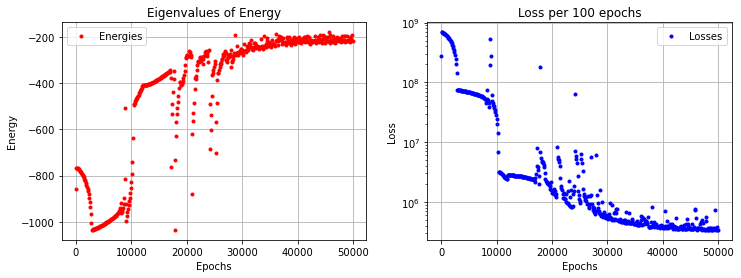

In [41]:
plt.subplots(1,2,figsize=(12,4))
plt.subplot(121)
plt.plot(epochs_1, Es_1, "r.", label="Energies")
plt.title("Eigenvalues of Energy")
#plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.subplot(122)
plt.plot(epochs_1, lss_1, "b.", label="Losses")
plt.title("Loss per 100 epochs")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.legend(loc="best")
plt.show()

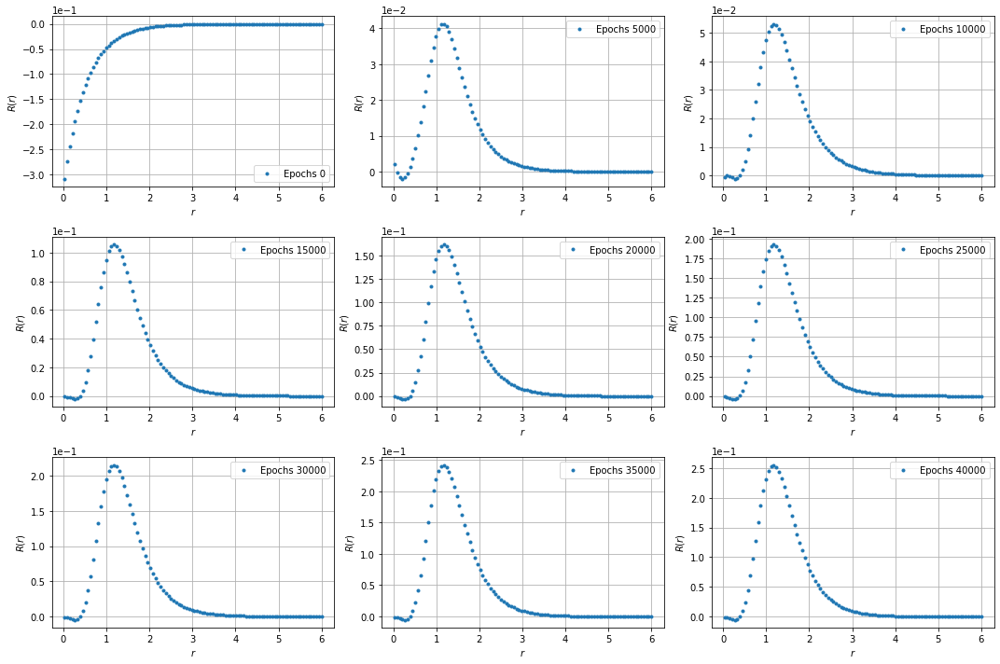

In [35]:
rr = np.linspace(lower_r, upper_r, steps)[:,None]
fig, axs = plt.subplots(3,3,figsize=(15,10))

fil = 0
col = 0
for i in range(0,9):
    yy = Phis_t_1[50*i]
    yy = yy.reshape((200,1))
    axs[fil,col].plot(rr[100:], np.divide(yy[100:], rr[100:]), ".", label=f"Epochs {epochs[50*i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$R(r)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    axs[fil,col].grid()
    if col == 2:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.tight_layout()
plt.show()  

In [36]:
Es_1

array([5.8713346, 2.3480015, 2.3173392, 2.286791 , 2.2559972, 2.2259831,
       2.195997 , 2.1633172, 2.121843 , 2.0569813, 1.9158298, 3.5649188,
       2.5945046, 2.502979 , 2.4136643, 2.3215885, 2.218736 , 2.0923798,
       1.9235033, 1.6692816, 1.0204141, 1.0001655, 1.0163844, 1.0380924,
       1.0653336, 1.0982972, 1.1369331, 1.1808732, 1.2293674, 1.2813201,
       1.3354068, 1.3902642, 1.4446554, 1.4975959, 1.5483369, 1.5963405,
       1.6412005, 1.6826106, 1.7203604, 1.7543223, 1.7844799, 1.8109068,
       1.8337551, 1.8532717, 1.8697219, 1.8834342, 1.8947307, 1.9039277,
       1.9113439, 1.9172624, 1.9219515, 1.925638 , 1.9285295, 1.9307975,
       1.9325883, 1.9340218, 1.9351964, 1.9361826, 1.937046 , 1.9378203,
       1.9385453, 1.9392358, 1.9399145, 1.9405792, 1.9412482, 1.9419117,
       1.9526209, 1.9451611, 1.9445368, 1.9460411, 1.9457403, 1.9471651,
       1.9466906, 1.9449784, 1.9467806, 1.9445499, 1.9456567, 1.9423678,
       1.9568684, 1.9379567, 1.9326272, 1.9314966, 